<div class="alert alert-block alert-info">
<center> <h1> BUSINESS CASE 4: PREDICT HOTEL BOOKING CANCELLATIONS </h1> </center> <br>
<center> <h2> Group G </h2> </center> <br>
<center> <h3> 2022/2023 </h3> </center> <br>

**Table of Contents** <br>
* [5. Initial Setup](#setup)
    * [5.1. Import Libraries](#importlibraries)
    * [5.2. Import Data](#importdata)
* [6. Modeling](#modeling)
    * [6.1. Logistic Regression](#log_reg)
    * [6.2. Gaussian Naive Bayes](#naive_bayes)
    * [6.3. Instance Based Learning (KNN Classifier)](#inst_based_learning)
    * [6.4. Neural Networks (MLP Classifier)](#neural_networks)
    * [6.5. XGBoost](#xgboost)
    * [6.6. AdaBoost Classifier](#adaboost)
    * [6.7. Decision Trees Classifier](#DT_classifier)
    * [6.8. Random Forest Classifier](#RF_classifier)
    * [6.9. Support Vector Machine](#svm)
    * [6.10. Bagging Classifier (using Decision Trees)](#bagging_classifier)
    * [6.11. CatBoost](#catboost)
    * [6.12. LGBM](#lgbm)
* [7. Evaluation](#evaluation)

<hr>
<a class="anchor" id="setup">
    
# 5. Initial Setup
    
</a>

<a class="anchor" id="importlibraries">

## 5.1. Import Libraries

</a>

In [ ]:
# !pip install pandas
# !pip install numpy
# !pip install xgboost
# !pip install sklearn
# !pip install catboost
# !pip install lightgbm
# !pip install bayesian-optimization

In [467]:
import pandas as pd  # version 1.5.3
import numpy as np  # version 1.23.5
import xgboost as xgb  # version 1.7.5
import shap  # version 0.41.0
import seaborn as sns  # version 0.12.2
from sklearn import metrics  # version 1.2.2
from yellowbrick.classifier import ROCAUC,PrecisionRecallCurve  # version 1.5
from sklearn.tree import DecisionTreeClassifier  # version 1.2.2
from sklearn.metrics import f1_score  # version 1.2.2
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier  # version 1.2.2
from sklearn.model_selection import GridSearchCV  # version 1.2.2
from sklearn.linear_model import LogisticRegression  # version 1.2.2
from sklearn.preprocessing import MinMaxScaler  # version 1.2.2
from sklearn.neighbors import KNeighborsClassifier  # version 1.2.2
from sklearn.naive_bayes import GaussianNB  # version 1.2.2
from sklearn.neural_network import MLPClassifier  # version 1.2.2
from sklearn.svm import SVC  # version 1.2.2
from sklearn.model_selection import cross_validate  # version 1.2.2
from sklearn.inspection import PartialDependenceDisplay  # version 1.2.2
from catboost import CatBoostClassifier  # version 1.2
from lightgbm import LGBMClassifier  # version 3.3.5
from bayes_opt import BayesianOptimization  # version 1.4.3

In [466]:
#print(.__version__)

<a class="anchor" id="importdata">

## 5.2. Import Data

</a>

In [206]:
x_train=pd.read_csv('x_train.csv')
x_train.drop(columns='Unnamed: 0',inplace=True)
x_train_out=pd.read_csv('x_train_out.csv')
x_train_out.drop(columns='Unnamed: 0',inplace=True)
x_train_base=pd.read_csv('x_train_base.csv')
x_train_base.drop(columns='Unnamed: 0',inplace=True)
xout_train_base=pd.read_csv('xout_train_base.csv')
xout_train_base.drop(columns='Unnamed: 0',inplace=True)
x_test=pd.read_csv('x_test.csv')
x_test.drop(columns='Unnamed: 0',inplace=True)
x_test_base=pd.read_csv('x_test_base.csv')
x_test_base.drop(columns='Unnamed: 0',inplace=True)
y_train=pd.read_csv('y_train.csv')
y_train.drop(columns='Unnamed: 0',inplace=True)
y_train_out=pd.read_csv('y_train_out.csv')
y_train_out.drop(columns='Unnamed: 0',inplace=True)
y_test=pd.read_csv('y_test.csv')
y_test.drop(columns='Unnamed: 0',inplace=True)

<hr>
<a class="anchor" id="modeling">
    
# 6. Modeling
    
</a>

In [38]:
# Creating scaled datasets
scaler1=MinMaxScaler()
minmax_train_base=scaler1.fit_transform(x_train_base)
minmax_test_base=scaler1.transform(x_test_base)

In [39]:
# Redoing the scaling for the outliers dataset because the removal of the outliers affect the fit of the scaling method
scaler2=MinMaxScaler()
minmaxout_train_base=scaler2.fit_transform(xout_train_base)
minmaxout_test_base=scaler2.transform(x_test_base)

In [41]:
# With this fuction, the approach for each model (dataset with or without outliers) is determined
def evaluate_model_with_outliers(x_train, x_train_out, y_train, y_train_out, model):
    # Perform k-fold cross-validation with k=5
    cv_results_with_outliers = cross_validate(model, np.array(x_train), np.array(y_train).ravel(), cv=5, scoring='f1', return_train_score=True)
    cv_results_without_outliers = cross_validate(model, np.array(x_train_out), np.array(y_train_out).ravel(), cv=5, scoring='f1', return_train_score=True)
    
    # Save the results in a dataframe
    scores = pd.DataFrame(
        {
            'Train Score 1': [cv_results_with_outliers['train_score'][0],cv_results_without_outliers['train_score'][0]],
            'Train Score 2': [cv_results_with_outliers['train_score'][1],cv_results_without_outliers['train_score'][1]],
            'Train Score 3': [cv_results_with_outliers['train_score'][2],cv_results_without_outliers['train_score'][2]],
            'Train Score 4': [cv_results_with_outliers['train_score'][3],cv_results_without_outliers['train_score'][3]],
            'Train Score 5': [cv_results_with_outliers['train_score'][4],cv_results_without_outliers['train_score'][4]],
            'Cross-Validation Score 1': [cv_results_with_outliers['test_score'][0],cv_results_without_outliers['test_score'][0]],
            'Cross-Validation Score 2': [cv_results_with_outliers['test_score'][1],cv_results_without_outliers['test_score'][1]],
            'Cross-Validation Score 3': [cv_results_with_outliers['test_score'][2],cv_results_without_outliers['test_score'][2]],
            'Cross-Validation Score 4': [cv_results_with_outliers['test_score'][3],cv_results_without_outliers['test_score'][3]],
            'Cross-Validation Score 5': [cv_results_with_outliers['test_score'][4],cv_results_without_outliers['test_score'][4]]
        },
        index=['With Outliers', 'Without Outliers']
    )

    return scores

<a class="anchor" id="log_reg">

## 6.1. Logistic Regression

</a>

Data needs to be scaled when used with regularization.

In [8]:
# Evaluate the model using the function 'evaluate_model_with_outliers' to find the best dataset to use
result_df = evaluate_model_with_outliers(minmax_train_base, minmaxout_train_base, y_train, y_train_out
                                         , model=LogisticRegression(max_iter=1000,random_state=1))

# Print the scores dataframe
result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.733362,0.733331,0.735135,0.73312,0.734087,0.736975,0.734509,0.729292,0.735862,0.731208
Without Outliers,0.732756,0.732947,0.734578,0.73116,0.733299,0.736179,0.730922,0.728732,0.736416,0.732166


In [9]:
# Using GridSearchCV, the hyperparameters were tuned in a broad way to get an idea of the results the model could achieve and
#where the best parameters could be
grid = {
    'penalty': ['elasticnet','l2', 'l1', None],
    'C': [0.001, 0.1, 1,10],
    'solver': ['lbfgs','sag']
}

classification_LR = GridSearchCV(estimator=LogisticRegression(max_iter=1000,random_state=1), param_grid=grid, scoring='f1',
                                return_train_score=True)
classification_LR.fit(np.array(x_train), np.array(y_train).ravel())

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regr

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modul

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_l

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regr

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
80 fits failed out of a total of 160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py", line 1162, i

GridSearchCV(estimator=LogisticRegression(max_iter=1000, random_state=1),
             param_grid={'C': [0.001, 0.1, 1, 10],
                         'penalty': ['elasticnet', 'l2', 'l1', None],
                         'solver': ['lbfgs', 'sag']},
             return_train_score=True, scoring='f1')

In [10]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_LR.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_LR.cv_results_['mean_test_score']
stds = classification_LR.cv_results_['std_test_score']
mean_trains = classification_LR.cv_results_['mean_train_score']
params = classification_LR.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
6,0.718114,0.002245,0.718461,"{'C': 0.001, 'penalty': None, 'solver': 'lbfgs'}",0.000346
14,0.718114,0.002245,0.718461,"{'C': 0.1, 'penalty': None, 'solver': 'lbfgs'}",0.000346
22,0.718114,0.002245,0.718461,"{'C': 1, 'penalty': None, 'solver': 'lbfgs'}",0.000346
30,0.718114,0.002245,0.718461,"{'C': 10, 'penalty': None, 'solver': 'lbfgs'}",0.000346
10,0.719855,0.003288,0.720292,"{'C': 0.1, 'penalty': 'l2', 'solver': 'lbfgs'}",0.000438
2,0.709322,0.002422,0.709983,"{'C': 0.001, 'penalty': 'l2', 'solver': 'lbfgs'}",0.000661
11,0.705822,0.001351,0.706544,"{'C': 0.1, 'penalty': 'l2', 'solver': 'sag'}",0.000722
26,0.719983,0.004738,0.720723,"{'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}",0.000740
19,0.705861,0.001278,0.706623,"{'C': 1, 'penalty': 'l2', 'solver': 'sag'}",0.000762
7,0.705861,0.001278,0.706634,"{'C': 0.001, 'penalty': None, 'solver': 'sag'}",0.000773


<a class="anchor" id="naive_bayes">

## 6.2. Gaussian Naive Bayes

</a>

Data does not need to be scaled.

In [449]:
# For Gaussian Naive Bayes, only metric features could be used
# The results were not good and there are not many hyperparameters that can be tuned, therefore no further improvement was made
metric_features=['LeadTime', 'ADR', 'RequiredCarParkingSpaces', 'TotalOfSpecialRequests',
       'Temp', 'Cloudcover', 'BookingDateWeekNumber', 'BookingDateDayOfWeek',
       'TotalNights', 'CancelationRatio']
result_df = evaluate_model_with_outliers(x_train_base[metric_features], xout_train_base[metric_features], y_train, y_train_out, 
                                         model=GaussianNB())

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.598518,0.598940,0.598469,0.598864,0.599226,0.599699,0.599123,0.599646,0.598186,0.597038
Without Outliers,0.597309,0.598225,0.596696,0.597183,0.598240,0.597420,0.597961,0.598347,0.597342,0.595698


<a class="anchor" id="inst_based_learning">

## 6.3. Instance Based Learning (KNN Classifier)

</a>

Data needs to be scaled.

In [11]:
result_df = evaluate_model_with_outliers(minmax_train_base, minmaxout_train_base, y_train, y_train_out, 
                                         model=KNeighborsClassifier())

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.830428,0.827862,0.828860,0.829136,0.831667,0.765912,0.763798,0.755326,0.761332,0.757459
Without Outliers,0.828356,0.827694,0.826543,0.825261,0.829328,0.759002,0.767283,0.753403,0.764155,0.752394


In [12]:
grid={
    'n_neighbors':[5,10,20,30],
    'weights':['uniform','distance'],
    'metric': ['manhattan', 'minkowski']
}

classification_KNN = GridSearchCV(estimator=KNeighborsClassifier(), param_grid=grid, scoring='f1',return_train_score=True)
classification_KNN.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'metric': ['manhattan', 'minkowski'],
                         'n_neighbors': [5, 10, 20, 30],
                         'weights': ['uniform', 'distance']},
             return_train_score=True, scoring='f1')

In [13]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_KNN.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_KNN.cv_results_['mean_test_score']
stds = classification_KNN.cv_results_['std_test_score']
mean_trains = classification_KNN.cv_results_['mean_train_score']
params = classification_KNN.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'distance'}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
14,0.610104,0.007394,0.633532,"{'metric': 'minkowski', 'n_neighbors': 30, 'we...",0.023428
6,0.630091,0.004997,0.654542,"{'metric': 'manhattan', 'n_neighbors': 30, 'we...",0.024451
12,0.625577,0.004305,0.659012,"{'metric': 'minkowski', 'n_neighbors': 20, 'we...",0.033435
4,0.644531,0.004151,0.678089,"{'metric': 'manhattan', 'n_neighbors': 20, 'we...",0.033559
10,0.648828,0.007522,0.702905,"{'metric': 'minkowski', 'n_neighbors': 10, 'we...",0.054077
2,0.663826,0.004197,0.719852,"{'metric': 'manhattan', 'n_neighbors': 10, 'we...",0.056026
0,0.693164,0.002624,0.793050,"{'metric': 'manhattan', 'n_neighbors': 5, 'wei...",0.099886
8,0.679581,0.005983,0.779758,"{'metric': 'minkowski', 'n_neighbors': 5, 'wei...",0.100177
3,0.733784,0.003216,0.988356,"{'metric': 'manhattan', 'n_neighbors': 10, 'we...",0.254572
1,0.731663,0.001876,0.987853,"{'metric': 'manhattan', 'n_neighbors': 5, 'wei...",0.256189


<a class="anchor" id="neural_networks">

## 6.4. Neural Networks (MLP Classifier)

</a> 

Data needs to be scaled.

In [7]:
result_df = evaluate_model_with_outliers(minmax_train_base, minmaxout_train_base, y_train, y_train_out, 
                                         model=MLPClassifier(random_state=1,max_iter=500))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.767406,0.756814,0.750953,0.753836,0.757299,0.761343,0.759119,0.746376,0.749914,0.748835
Without Outliers,0.757646,0.762850,0.752724,0.759351,0.758045,0.752779,0.764588,0.749910,0.755497,0.752855


In [12]:
grid = {'solver': ['sgd', 'adam'],
                 'activation': ['relu', 'logistic'],
                 'batch_size': [100,200,500],
                 'learning_rate': ['constant', 'adaptive'],
                 'learning_rate_init': [0.01, 0.001]
}

classification_MLP = GridSearchCV(estimator=MLPClassifier(max_iter=500,random_state=1), param_grid=grid, scoring='f1',
                                  return_train_score=True)
classification_MLP.fit(np.array(minmax_train_base), np.array(y_train).ravel())

GridSearchCV(estimator=MLPClassifier(max_iter=500, random_state=1),
             param_grid={'activation': ['relu', 'logistic'],
                         'batch_size': [100, 200, 500],
                         'learning_rate': ['constant', 'adaptive'],
                         'learning_rate_init': [0.01, 0.001],
                         'solver': ['sgd', 'adam']},
             return_train_score=True, scoring='f1')

In [13]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_MLP.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_MLP.cv_results_['mean_test_score']
stds = classification_MLP.cv_results_['std_test_score']
mean_trains = classification_MLP.cv_results_['mean_train_score']
params = classification_MLP.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'activation': 'relu', 'batch_size': 200, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'solver': 'adam'}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
24,0.733936,0.001763,0.733565,"{'activation': 'logistic', 'batch_size': 100, ...",-3.709114e-04
27,0.734196,0.005533,0.733888,"{'activation': 'logistic', 'batch_size': 100, ...",-3.070341e-04
31,0.734196,0.005533,0.733888,"{'activation': 'logistic', 'batch_size': 100, ...",-3.070341e-04
32,0.732493,0.003413,0.732474,"{'activation': 'logistic', 'batch_size': 200, ...",-1.878482e-05
26,0.733901,0.002182,0.733885,"{'activation': 'logistic', 'batch_size': 100, ...",-1.615684e-05
14,0.738784,0.002381,0.738783,"{'activation': 'relu', 'batch_size': 200, 'lea...",-7.473391e-07
34,0.734232,0.002535,0.734239,"{'activation': 'logistic', 'batch_size': 200, ...",7.234784e-06
22,0.735591,0.002043,0.735669,"{'activation': 'relu', 'batch_size': 500, 'lea...",7.821070e-05
28,0.733803,0.002776,0.733901,"{'activation': 'logistic', 'batch_size': 100, ...",9.741475e-05
10,0.738081,0.002976,0.738268,"{'activation': 'relu', 'batch_size': 200, 'lea...",1.872676e-04


In [16]:
results

,Mean Val,Std,Mean Train,Params,Difference
24,0.733936,0.001763,0.733565,"{'activation': 'logistic', 'batch_size': 100, ...",-3.709114e-04
27,0.734196,0.005533,0.733888,"{'activation': 'logistic', 'batch_size': 100, ...",-3.070341e-04
31,0.734196,0.005533,0.733888,"{'activation': 'logistic', 'batch_size': 100, ...",-3.070341e-04
32,0.732493,0.003413,0.732474,"{'activation': 'logistic', 'batch_size': 200, ...",-1.878482e-05
26,0.733901,0.002182,0.733885,"{'activation': 'logistic', 'batch_size': 100, ...",-1.615684e-05
14,0.738784,0.002381,0.738783,"{'activation': 'relu', 'batch_size': 200, 'lea...",-7.473391e-07
34,0.734232,0.002535,0.734239,"{'activation': 'logistic', 'batch_size': 200, ...",7.234784e-06
22,0.735591,0.002043,0.735669,"{'activation': 'relu', 'batch_size': 500, 'lea...",7.821070e-05
28,0.733803,0.002776,0.733901,"{'activation': 'logistic', 'batch_size': 100, ...",9.741475e-05
10,0.738081,0.002976,0.738268,"{'activation': 'relu', 'batch_size': 200, 'lea...",1.872676e-04


In [18]:
# The best parameters found
results.loc[17]

Mean Val                                                0.76221
Std                                                    0.003878
Mean Train                                             0.769126
Params        {'activation': 'relu', 'batch_size': 500, 'lea...
Difference                                             0.006916
Name: 17, dtype: object

<a class="anchor" id="xgboost">

## 6.5. XGBoost

</a> 

Data does not need to be scaled.

In [52]:
result_df = evaluate_model_with_outliers(x_train, x_train_out, y_train, y_train_out, model=xgb.XGBClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.836227,0.842533,0.836020,0.840258,0.841595,0.794440,0.797847,0.791427,0.798068,0.788411
Without Outliers,0.839699,0.839776,0.840694,0.839146,0.841638,0.788938,0.789654,0.791553,0.793217,0.789216


In [54]:
grid = {'alpha':[0,1,5],
    'subsample':[0.1,0.5,1],
    'learning_rate': [1, 0.3, 0.01],
    'max_depth': [3,6,9],
    'min_child_weight': [1, 3, 5]
}

classification_XGB = GridSearchCV(estimator=xgb.XGBClassifier(random_state=1), param_grid=grid, scoring='f1',
                                  return_train_score=True)
classification_XGB.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None, max_b...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=1, ...),
             param_grid={'alpha': [0, 1, 5], 'learning_rate': [1, 0.3, 0.01],
                         'max_depth': [3, 6, 9], 'min_child_weight': [1, 3, 5],
                         'subsample': [0.1, 0.5, 1]},
             return_train_score=True, scoring='f1')

In [279]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_XGB.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_XGB.cv_results_['mean_test_score']
stds = classification_XGB.cv_results_['std_test_score']
mean_trains = classification_XGB.cv_results_['mean_train_score']
params = classification_XGB.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'alpha': 1, 'learning_rate': 0.3, 'max_depth': 9, 'min_child_weight': 1, 'subsample': 1}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
60,0.719213,0.002763,0.719216,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.000003
135,0.719241,0.002853,0.719320,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.000080
218,0.719711,0.002840,0.719823,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.000112
222,0.719101,0.002730,0.719214,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.000113
62,0.719699,0.002725,0.719818,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.000119
143,0.719699,0.002725,0.719818,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.000119
224,0.719639,0.002738,0.719767,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.000129
61,0.719530,0.002935,0.719664,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.000134
141,0.719227,0.002882,0.719365,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.000138
138,0.719280,0.002924,0.719426,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.000146


In [221]:
results[50:100]

,Mean Val,Std,Mean Train,Params,Difference
240,0.732819,0.001973,0.734057,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.001238
63,0.736134,0.002225,0.737411,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.001277
147,0.733091,0.001996,0.734402,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.001311
66,0.733470,0.001881,0.734885,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.001415
69,0.729769,0.002439,0.731328,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.001559
237,0.734953,0.002185,0.736735,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.001782
234,0.736866,0.001687,0.739436,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.002570
78,0.744921,0.002847,0.748137,"{'alpha': 0, 'learning_rate': 0.01, 'max_depth...",0.003216
159,0.742115,0.003098,0.745563,"{'alpha': 1, 'learning_rate': 0.01, 'max_depth...",0.003448
235,0.756129,0.002119,0.759882,"{'alpha': 5, 'learning_rate': 0.01, 'max_depth...",0.003753


In [280]:
results.loc[110]

Mean Val                                               0.765507
Std                                                    0.002121
Mean Train                                             0.771635
Params        {'alpha': 1, 'learning_rate': 0.3, 'max_depth'...
Difference                                             0.006128
Name: 110, dtype: object

In [281]:
# The best parameters found
results.loc[110]['Params']

{'alpha': 1,
 'learning_rate': 0.3,
 'max_depth': 3,
 'min_child_weight': 1,
 'subsample': 1}

In [460]:
# Creating a XGBClassifier with the parameters found above
xgbc = xgb.XGBClassifier(alpha=1, learning_rate=0.3, max_depth=3, min_child_weight=1, subsample=1)
cv_results = cross_validate(xgbc, np.array(x_train_base), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.7630847637356427
0.7589983767488976


In [289]:
# Testing with the added features in the lgbm section (if needed, run first the code corresponding to x_train_final in the lgbm 
#section)
cv_results = cross_validate(xgbc, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())
# The added variables helped increase the scores, thus the x_train_final dataset will be used

0.7705333591275583
0.7653724767796903


In [308]:
# Define the objective function for Bayesian Optimization
def xgb_cv(alpha,subsample,learning_rate,max_depth):
    max_depth=round(max_depth)

    # Define the XGBClassifier with the specified hyperparameters
    xgbc = xgb.XGBClassifier(alpha=alpha, subsample=subsample,learning_rate=learning_rate,max_depth=max_depth,
                             random_state=1)

    # Perform cross-validation and return the average F1 score
    cv_results = cross_validate(xgbc, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',
                            return_train_score=True)
    
    # Calculate the penalty term based on the difference between training and validation scores
    penalty = abs(cv_results['train_score'].mean() - cv_results['test_score'].mean())

    # Combine the cross-validation score and the penalty term to form the objective
    objective = cv_results['test_score'].mean() - 2*penalty  # Adjusted to 2 based on experimentation and trial and error
    return objective

# Define the parameter ranges for Bayesian Optimization
param_ranges =  {
    'alpha':(1,3),
    'subsample':(0.3,0.6),
    'learning_rate': (0.2,0.35),
    'max_depth': (2,5)
}

# Create an instance of BayesianOptimization and perform optimization
optimizer = BayesianOptimization(f=xgb_cv, pbounds=param_ranges, random_state=1)
optimizer.maximize(n_iter=100)

# Print the best hyperparameters and the corresponding objective value
best_params = optimizer.max['params']
best_score = optimizer.max['target']
print("Best Hyperparameters:", best_params)
print("Best Score:", best_score)

|   iter    |  target   |   alpha   | learni... | max_depth | subsample |
-------------------------------------------------------------------------
| 1         | 0.7432    | 1.834     | 0.308     | 2.0       | 0.3907    |
| 2         | 0.7473    | 1.294     | 0.2139    | 2.559     | 0.4037    |
| 3         | 0.7501    | 1.794     | 0.2808    | 3.258     | 0.5056    |
| 4         | 0.7463    | 1.409     | 0.3317    | 2.082     | 0.5011    |
| 5         | 0.7389    | 1.835     | 0.2838    | 2.421     | 0.3594    |
| 6         | 0.7511    | 1.563     | 0.2567    | 3.226     | 0.5065    |
| 7         | 0.7486    | 1.885     | 0.262     | 3.643     | 0.5233    |
| 8         | 0.7478    | 1.0       | 0.35      | 3.312     | 0.6       |
| 9         | 0.7247    | 1.042     | 0.3212    | 4.895     | 0.5106    |
| 10        | 0.7497    | 3.0       | 0.2       | 3.963     | 0.6       |
| 11        | 0.7459    | 3.0       | 0.2       | 5.0       | 0.3       |
| 12        | 0.7544    | 3.0       | 

| 67        | 0.7534    | 2.863     | 0.3413    | 3.225     | 0.5844    |
| 68        | 0.7511    | 2.908     | 0.3382    | 2.817     | 0.3536    |
| 69        | 0.7506    | 1.743     | 0.2047    | 4.363     | 0.5851    |
| 70        | 0.7488    | 2.861     | 0.3409    | 2.853     | 0.326     |
| 71        | 0.7558    | 2.932     | 0.3471    | 3.146     | 0.5065    |
| 72        | 0.7565    | 2.908     | 0.3095    | 3.188     | 0.5313    |
| 73        | 0.745     | 2.14      | 0.2052    | 4.516     | 0.4621    |
| 74        | 0.7573    | 1.807     | 0.2814    | 3.305     | 0.5096    |
| 75        | 0.7285    | 2.907     | 0.3149    | 4.999     | 0.4009    |
| 76        | 0.7531    | 2.865     | 0.339     | 3.199     | 0.5541    |
| 77        | 0.7552    | 2.898     | 0.3358    | 3.162     | 0.5291    |
| 78        | 0.7471    | 2.055     | 0.3212    | 4.37      | 0.493     |
| 79        | 0.7515    | 1.805     | 0.2599    | 3.28      | 0.5304    |
| 80        | 0.7123    | 1.138     | 

In [309]:
# Creating a XGBClassifier with the parameters found above
xgbc = xgb.XGBClassifier(alpha=2.924392345620654, learning_rate=0.35, max_depth=3,subsample=0.507912371609797,
                       random_state=1)
cv_results = cross_validate(xgbc, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.775637238529024
0.7705483459447107


<a class="anchor" id="adaboost">

## 6.6. AdaBoost Classifier

</a> 

Data does not need to be scaled.

In [56]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=AdaBoostClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.738826,0.739644,0.740747,0.739137,0.739639,0.741594,0.739739,0.736966,0.739879,0.739512
Without Outliers,0.737104,0.737366,0.737602,0.735836,0.736769,0.738476,0.734859,0.733659,0.736306,0.737608


In [59]:
grid = {'estimator': [DecisionTreeClassifier(max_depth=3), LogisticRegression(max_iter=5000)],
                 'n_estimators': [100,250,500],
                 'learning_rate': [0.01, 0.1, 1.0],
                 'algorithm': ['SAMME', 'SAMME.R']
}

classification_ADA = GridSearchCV(estimator=AdaBoostClassifier(random_state=1), param_grid=grid, scoring='f1',
                                  return_train_score=True)
classification_ADA.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=AdaBoostClassifier(random_state=1),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'estimator': [DecisionTreeClassifier(max_depth=3),
                                       LogisticRegression(max_iter=5000)],
                         'learning_rate': [0.01, 0.1, 1.0],
                         'n_estimators': [100, 250, 500]},
             return_train_score=True, scoring='f1')

In [214]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_ADA.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_ADA.cv_results_['mean_test_score']
stds = classification_ADA.cv_results_['std_test_score']
mean_trains = classification_ADA.cv_results_['mean_train_score']
params = classification_ADA.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'algorithm': 'SAMME.R', 'estimator': DecisionTreeClassifier(max_depth=3), 'learning_rate': 1.0, 'n_estimators': 500}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
17,0.697054,0.010871,0.695589,"{'algorithm': 'SAMME', 'estimator': LogisticRe...",-0.001466
16,0.697054,0.010871,0.695589,"{'algorithm': 'SAMME', 'estimator': LogisticRe...",-0.001466
15,0.697054,0.010871,0.695589,"{'algorithm': 'SAMME', 'estimator': LogisticRe...",-0.001466
28,0.527434,0.006471,0.526911,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",-0.000523
29,0.593285,0.007803,0.593032,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",-0.000253
35,0.716400,0.002027,0.716442,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",0.000042
34,0.716400,0.002027,0.716470,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",0.000070
33,0.716371,0.002004,0.716466,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",0.000096
12,0.715187,0.001522,0.715350,"{'algorithm': 'SAMME', 'estimator': LogisticRe...",0.000163
32,0.721413,0.001048,0.721576,"{'algorithm': 'SAMME.R', 'estimator': Logistic...",0.000163


In [215]:
results[25:]

,Mean Val,Std,Mean Train,Params,Difference
2,0.718878,0.004987,0.720103,"{'algorithm': 'SAMME', 'estimator': DecisionTr...",0.001225
10,0.609385,0.002946,0.611033,"{'algorithm': 'SAMME', 'estimator': LogisticRe...",0.001648
20,0.736570,0.002101,0.738449,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.001879
21,0.746519,0.000952,0.749529,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.003010
7,0.742037,0.006038,0.745125,"{'algorithm': 'SAMME', 'estimator': DecisionTr...",0.003088
8,0.751976,0.002430,0.757028,"{'algorithm': 'SAMME', 'estimator': DecisionTr...",0.005051
22,0.764260,0.000760,0.772981,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.008721
23,0.775045,0.001539,0.791827,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.016782
24,0.776693,0.002209,0.798332,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.021639
25,0.782091,0.002143,0.830054,"{'algorithm': 'SAMME.R', 'estimator': Decision...",0.047963


<a class="anchor" id="DT_classifier">

## 6.7. Decision Trees Classifier

</a> 

Data does not need to be scaled.

In [46]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=DecisionTreeClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.986505,0.986113,0.986538,0.986456,0.986575,0.761808,0.769625,0.767793,0.769926,0.768809
Without Outliers,0.986536,0.986209,0.986518,0.986459,0.986609,0.756322,0.762382,0.765212,0.760782,0.762499


In [47]:
grid ={
    'criterion':['gini', 'entropy'],
    'max_depth':[3,6,9,None],
    'max_features':['sqrt',None],
    'ccp_alpha':[0,0.01]
}

classification_DT = GridSearchCV(estimator=DecisionTreeClassifier(random_state=1), param_grid=grid, scoring='f1',
                                 return_train_score=True)
classification_DT.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=DecisionTreeClassifier(random_state=1),
             param_grid={'ccp_alpha': [0, 0.01],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 6, 9, None],
                         'max_features': ['sqrt', None]},
             return_train_score=True, scoring='f1')

In [222]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_DT.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_DT.cv_results_['mean_test_score']
stds = classification_DT.cv_results_['std_test_score']
mean_trains = classification_DT.cv_results_['mean_train_score']
params = classification_DT.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'ccp_alpha': 0, 'criterion': 'entropy', 'max_depth': None, 'max_features': None}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
0,0.534292,0.004262,0.534186,"{'ccp_alpha': 0, 'criterion': 'gini', 'max_dep...",-0.000107
8,0.534292,0.004262,0.534186,"{'ccp_alpha': 0, 'criterion': 'entropy', 'max_...",-0.000107
30,0.697877,0.003850,0.697855,"{'ccp_alpha': 0.01, 'criterion': 'entropy', 'm...",-0.000021
16,0.534061,0.004122,0.534071,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_...",0.000010
24,0.534061,0.004122,0.534071,"{'ccp_alpha': 0.01, 'criterion': 'entropy', 'm...",0.000010
20,0.696354,0.003177,0.696365,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_...",0.000011
22,0.696354,0.003177,0.696365,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_...",0.000011
18,0.696354,0.003177,0.696365,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_...",0.000011
26,0.696354,0.003177,0.696365,"{'ccp_alpha': 0.01, 'criterion': 'entropy', 'm...",0.000011
17,0.699419,0.003567,0.699432,"{'ccp_alpha': 0.01, 'criterion': 'gini', 'max_...",0.000013


In [223]:
results.loc[13]

Mean Val                                               0.739728
Std                                                    0.005197
Mean Train                                             0.744701
Params        {'ccp_alpha': 0, 'criterion': 'entropy', 'max_...
Difference                                             0.004973
Name: 13, dtype: object

In [224]:
# The best parameters found
results.loc[13]['Params']

{'ccp_alpha': 0, 'criterion': 'entropy', 'max_depth': 9, 'max_features': None}

In [232]:
# Creating a DecisionTreeClassifier with the parameters found above
dt = DecisionTreeClassifier(ccp_alpha=0, criterion='entropy', max_depth=9, max_features=None)
cv_results = cross_validate(dt, np.array(x_train_base), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.756822104922868
0.7523066819677122


In [233]:
# Testing with the added features in the lgbm section (if needed, run first the code corresponding to x_train_final in the lgbm 
#section)
cv_results = cross_validate(dt, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)
# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())
# The added variables did not help in the scores, therefore the initial dataset x_train_base will be used

0.7531732609193009
0.7493830962916028


In [306]:
# Define the objective function for Bayesian Optimization
def dt_cv(max_depth,max_features,ccp_alpha):
    max_depth=round(max_depth)
    max_features=round(max_features)

    # Define the DecisionTreeClassifier with the specified hyperparameters
    dt = DecisionTreeClassifier(criterion="entropy", max_depth=max_depth, max_features=max_features, ccp_alpha=ccp_alpha,
                                  random_state=1)

    # Perform cross-validation and return the average F1 score
    cv_results = cross_validate(dt, np.array(x_train_base), np.array(y_train).ravel(), cv=5, scoring='f1',
                            return_train_score=True)
    
    # Calculate the penalty term based on the difference between training and validation scores
    penalty = abs(cv_results['train_score'].mean() - cv_results['test_score'].mean())

    # Combine the cross-validation score and the penalty term to form the objective
    objective = cv_results['test_score'].mean() - 2*penalty  
    return objective

# Define the parameter ranges for Bayesian Optimization
param_ranges = {
    'max_depth':(12,16),
    'max_features':(12,14),
    'ccp_alpha':(0,0.001)
}

# Create an instance of BayesianOptimization and perform optimization
optimizer = BayesianOptimization(f=dt_cv, pbounds=param_ranges, random_state=1)
optimizer.maximize(n_iter=100)

# Print the best hyperparameters and the corresponding objective value
best_params = optimizer.max['params']
best_score = optimizer.max['target']
print("Best Hyperparameters:", best_params)
print("Best Score:", best_score)

|   iter    |  target   | ccp_alpha | max_depth | max_fe... |
-------------------------------------------------------------
| 1         | 0.7472    | 0.000417  | 14.88     | 12.0      |
| 2         | 0.7499    | 0.0003023 | 12.59     | 12.18     |
| 3         | 0.7462    | 0.0001863 | 13.38     | 12.79     |
| 4         | 0.7484    | 0.0005388 | 13.68     | 13.37     |
| 5         | 0.7479    | 0.0002045 | 15.51     | 12.05     |
| 6         | 0.7482    | 0.0003758 | 15.16     | 13.55     |
| 7         | 0.7461    | 0.0005323 | 15.15     | 12.35     |
| 8         | 0.7459    | 0.0003796 | 12.57     | 12.02     |
| 9         | 0.7503    | 0.0002275 | 12.62     | 13.89     |
| 10        | 0.7508    | 0.0007263 | 14.91     | 12.39     |
| 11        | 0.7477    | 0.0004702 | 13.69     | 12.94     |
| 12        | 0.7406    | 0.0009554 | 14.66     | 12.94     |
| 13        | 0.7495    | 0.0004887 | 15.36     | 13.96     |
| 14        | 0.7505    | 0.0003225 | 15.05     | 13.71     |
| 15    

| 80        | 0.7489    | 0.0009708 | 15.05     | 13.72     |
| 81        | 0.7493    | 0.0008254 | 12.48     | 13.12     |
| 82        | 0.7475    | 0.0004461 | 15.09     | 13.66     |
| 83        | 0.6805    | 3.515e-05 | 15.11     | 13.71     |
| 84        | 0.75      | 0.0006359 | 14.16     | 12.48     |
| 85        | 0.7462    | 0.0001865 | 15.36     | 13.96     |
| 86        | 0.7522    | 0.0003108 | 15.39     | 13.96     |
| 87        | 0.7516    | 0.0007009 | 12.82     | 13.82     |
| 88        | 0.7523    | 0.0006364 | 15.38     | 13.98     |
| 89        | 0.7453    | 0.00039   | 12.14     | 12.31     |
| 90        | 0.7502    | 0.0008123 | 12.78     | 13.82     |
| 91        | 0.7479    | 0.0007712 | 14.16     | 12.44     |
| 92        | 0.7476    | 0.0004776 | 12.84     | 13.63     |
| 93        | 0.75      | 0.0007893 | 14.86     | 13.77     |
| 94        | 0.736     | 0.0001517 | 15.78     | 13.07     |
| 95        | 0.7488    | 0.000422  | 14.11     | 12.42     |
| 96    

In [278]:
# Creating a DecisionTreeClassifier with the parameters found above
dt = DecisionTreeClassifier(ccp_alpha=0.0003985707957000112, criterion='entropy', max_depth=15,max_features=13)
cv_results = cross_validate(dt, np.array(x_train_base), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.7646466118410125
0.7585150852741203


<a class="anchor" id="RF_classifier">

## 6.8. Random Forest Classifier

</a> 

Data does not need to be scaled.

In [49]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=RandomForestClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.986513,0.986143,0.986581,0.98647,0.986610,0.820896,0.822011,0.818644,0.814395,0.814071
Without Outliers,0.986568,0.986238,0.986553,0.98647,0.986632,0.814032,0.814521,0.812683,0.813222,0.809973


In [50]:
grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [4, 7, None],
    'max_features': ['sqrt', None],
    'max_samples': [0.5, None]
}

classification_RF = GridSearchCV(estimator=RandomForestClassifier(random_state=1), param_grid=grid, scoring='f1',
                                return_train_score=True)
classification_RF.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=RandomForestClassifier(random_state=1),
             param_grid={'max_depth': [4, 7, None],
                         'max_features': ['sqrt', None],
                         'max_samples': [0.5, None],
                         'n_estimators': [50, 100, 200]},
             return_train_score=True, scoring='f1')

In [210]:
# Best parameter set
print('----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_RF.best_params_)
print('----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_RF.cv_results_['mean_test_score']
stds = classification_RF.cv_results_['std_test_score']
mean_trains = classification_RF.cv_results_['mean_train_score']
params = classification_RF.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'max_depth': None, 'max_features': 'sqrt', 'max_samples': None, 'n_estimators': 200}
----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
4,0.566850,0.005604,0.566861,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000011
3,0.567566,0.005718,0.567619,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000053
5,0.566470,0.005602,0.566644,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000174
1,0.566614,0.005419,0.566795,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000181
6,0.724978,0.001960,0.725231,"{'max_depth': 4, 'max_features': None, 'max_sa...",0.000252
0,0.566403,0.005742,0.566685,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000281
2,0.566261,0.005397,0.566584,"{'max_depth': 4, 'max_features': 'sqrt', 'max_...",0.000323
8,0.724751,0.002104,0.725188,"{'max_depth': 4, 'max_features': None, 'max_sa...",0.000437
11,0.723858,0.002868,0.724357,"{'max_depth': 4, 'max_features': None, 'max_sa...",0.000499
12,0.719647,0.005259,0.720174,"{'max_depth': 7, 'max_features': 'sqrt', 'max_...",0.000527


<a class="anchor" id="svm">

## 6.9. Support Vector Machine

</a> 

Data needs to be scaled.

In [6]:
result_df = evaluate_model_with_outliers(minmax_train_base, minmaxout_train_base, y_train, y_train_out,
                                         model=SVC(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.736703,0.735028,0.736591,0.736776,0.736806,0.736181,0.733596,0.734689,0.739031,0.735382
Without Outliers,0.737625,0.736065,0.736914,0.736560,0.737696,0.734853,0.731854,0.735389,0.739850,0.735856


In [7]:
grid={'C': [0.1, 1, 10],
                 'kernel': ['linear', 'poly','rbf'],
                 
}

classification_SVC = GridSearchCV(estimator=SVC(random_state=1), param_grid=grid, scoring='f1',return_train_score=True)
classification_SVC.fit(np.array(minmaxout_train_base), np.array(y_train_out).ravel())

GridSearchCV(estimator=SVC(random_state=1),
             param_grid={'C': [0.1, 1, 10],
                         'kernel': ['linear', 'poly', 'rbf']},
             return_train_score=True, scoring='f1')

In [8]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_SVC.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_SVC.cv_results_['mean_test_score']
stds = classification_SVC.cv_results_['std_test_score']
mean_trains = classification_SVC.cv_results_['mean_train_score']
params = classification_SVC.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'C': 10, 'kernel': 'rbf'}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
0,0.730928,0.002786,0.730990,"{'C': 0.1, 'kernel': 'linear'}",0.000063
1,0.736806,0.001904,0.736969,"{'C': 0.1, 'kernel': 'poly'}",0.000162
6,0.729616,0.002593,0.729796,"{'C': 10, 'kernel': 'linear'}",0.000180
3,0.729576,0.002585,0.729861,"{'C': 1, 'kernel': 'linear'}",0.000285
2,0.737578,0.001568,0.738187,"{'C': 0.1, 'kernel': 'rbf'}",0.000608
4,0.732993,0.003942,0.733630,"{'C': 1, 'kernel': 'poly'}",0.000638
7,0.729273,0.004851,0.729948,"{'C': 10, 'kernel': 'poly'}",0.000675
5,0.735560,0.002560,0.736972,"{'C': 1, 'kernel': 'rbf'}",0.001412
8,0.737642,0.002891,0.740122,"{'C': 10, 'kernel': 'rbf'}",0.002480


<a class="anchor" id="bagging_classifier">

## 6.10. Bagging Classifier (using Decision Trees)

</a> 

Data does not need to be scaled.

In [14]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=BaggingClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.972394,0.972229,0.972381,0.972911,0.972913,0.795591,0.797848,0.792300,0.799956,0.796618
Without Outliers,0.971775,0.971998,0.972158,0.972429,0.972345,0.795254,0.798221,0.791231,0.794258,0.791582


In [15]:
grid={
    'n_estimators':[100,250,500],
    'max_samples':[0.4,0.6,0.8],
    'max_features':[0.2,0.4,0.6,0.8],
    'bootstrap':[True, False],
    'oob_score':[True, False],
}

classification_BC = GridSearchCV(estimator=BaggingClassifier(random_state=1), param_grid=grid, scoring='f1',
                                 return_train_score=True)
classification_BC.fit(np.array(x_train), np.array(y_train).ravel())

C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:378: FitFailedWarning: 
180 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
180 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\ensemble\_bagging.py", line 337, in fit
    return self._fit(X, y, self.max_samples, sample_weight=sample_weight)
  File "C:\Users\saragalguinho\anaconda3\lib\site-packages\sklearn\ensemble\_bagging.py", line 429, in _fit
  

GridSearchCV(estimator=BaggingClassifier(random_state=1),
             param_grid={'bootstrap': [True, False],
                         'max_features': [0.2, 0.4, 0.6, 0.8],
                         'max_samples': [0.4, 0.6, 0.8],
                         'n_estimators': [100, 250, 500],
                         'oob_score': [True, False]},
             return_train_score=True, scoring='f1')

In [16]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_BC.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_BC.cv_results_['mean_test_score']
stds = classification_BC.cv_results_['std_test_score']
mean_trains = classification_BC.cv_results_['mean_train_score']
params = classification_BC.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'bootstrap': False, 'max_features': 0.8, 'max_samples': 0.6, 'n_estimators': 500, 'oob_score': False}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
54,0.811919,0.004234,0.939094,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.127176
55,0.811919,0.004234,0.939094,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.127176
57,0.813384,0.002710,0.941783,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.128400
56,0.813384,0.002710,0.941783,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.128400
58,0.813623,0.002853,0.943974,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.130351
59,0.813623,0.002853,0.943974,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.130351
38,0.809810,0.003743,0.949204,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.139394
39,0.809810,0.003743,0.949204,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.139394
37,0.806720,0.002788,0.946719,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.140000
36,0.806720,0.002788,0.946719,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.140000


In [18]:
results.head(50)

,Mean Val,Std,Mean Train,Params,Difference
54,0.811919,0.004234,0.939094,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.127176
55,0.811919,0.004234,0.939094,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.127176
57,0.813384,0.002710,0.941783,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.128400
56,0.813384,0.002710,0.941783,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.128400
58,0.813623,0.002853,0.943974,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.130351
59,0.813623,0.002853,0.943974,"{'bootstrap': True, 'max_features': 0.8, 'max_...",0.130351
38,0.809810,0.003743,0.949204,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.139394
39,0.809810,0.003743,0.949204,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.139394
37,0.806720,0.002788,0.946719,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.140000
36,0.806720,0.002788,0.946719,"{'bootstrap': True, 'max_features': 0.6, 'max_...",0.140000


<a class="anchor" id="catboost">

## 6.11. CatBoost

</a> 

Data does not need to be scaled.

In [63]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=CatBoostClassifier(random_state=1))

result_df

Learning rate set to 0.054202
0:	learn: 0.6480000	total: 161ms	remaining: 2m 41s
1:	learn: 0.6066704	total: 172ms	remaining: 1m 25s
2:	learn: 0.5765683	total: 182ms	remaining: 1m
3:	learn: 0.5500860	total: 192ms	remaining: 47.8s
4:	learn: 0.5289554	total: 202ms	remaining: 40.2s
5:	learn: 0.5121598	total: 212ms	remaining: 35.2s
6:	learn: 0.4984893	total: 222ms	remaining: 31.5s
7:	learn: 0.4877768	total: 232ms	remaining: 28.7s
8:	learn: 0.4783035	total: 241ms	remaining: 26.5s
9:	learn: 0.4694083	total: 251ms	remaining: 24.8s
10:	learn: 0.4632946	total: 260ms	remaining: 23.4s
11:	learn: 0.4571369	total: 269ms	remaining: 22.1s
12:	learn: 0.4518065	total: 278ms	remaining: 21.1s
13:	learn: 0.4473419	total: 287ms	remaining: 20.2s
14:	learn: 0.4431576	total: 296ms	remaining: 19.5s
15:	learn: 0.4398253	total: 305ms	remaining: 18.8s
16:	learn: 0.4369531	total: 317ms	remaining: 18.3s
17:	learn: 0.4343716	total: 326ms	remaining: 17.8s
18:	learn: 0.4317607	total: 335ms	remaining: 17.3s
19:	learn: 0

184:	learn: 0.3743869	total: 1.86s	remaining: 8.19s
185:	learn: 0.3743143	total: 1.86s	remaining: 8.17s
186:	learn: 0.3741629	total: 1.87s	remaining: 8.14s
187:	learn: 0.3740759	total: 1.88s	remaining: 8.12s
188:	learn: 0.3739709	total: 1.89s	remaining: 8.1s
189:	learn: 0.3737641	total: 1.9s	remaining: 8.08s
190:	learn: 0.3735837	total: 1.9s	remaining: 8.07s
191:	learn: 0.3733846	total: 1.91s	remaining: 8.05s
192:	learn: 0.3731382	total: 1.92s	remaining: 8.03s
193:	learn: 0.3729398	total: 1.93s	remaining: 8.01s
194:	learn: 0.3728367	total: 1.94s	remaining: 8s
195:	learn: 0.3727245	total: 1.95s	remaining: 7.98s
196:	learn: 0.3726338	total: 1.95s	remaining: 7.96s
197:	learn: 0.3725409	total: 1.96s	remaining: 7.95s
198:	learn: 0.3724406	total: 1.97s	remaining: 7.93s
199:	learn: 0.3722481	total: 1.98s	remaining: 7.91s
200:	learn: 0.3720895	total: 1.99s	remaining: 7.9s
201:	learn: 0.3719481	total: 2s	remaining: 7.88s
202:	learn: 0.3718847	total: 2s	remaining: 7.86s
203:	learn: 0.3717446	tot

352:	learn: 0.3548060	total: 3.3s	remaining: 6.05s
353:	learn: 0.3547175	total: 3.31s	remaining: 6.04s
354:	learn: 0.3546377	total: 3.32s	remaining: 6.03s
355:	learn: 0.3545475	total: 3.33s	remaining: 6.02s
356:	learn: 0.3544996	total: 3.33s	remaining: 6.01s
357:	learn: 0.3543905	total: 3.34s	remaining: 6s
358:	learn: 0.3543228	total: 3.35s	remaining: 5.99s
359:	learn: 0.3541965	total: 3.36s	remaining: 5.97s
360:	learn: 0.3541234	total: 3.37s	remaining: 5.96s
361:	learn: 0.3540250	total: 3.38s	remaining: 5.95s
362:	learn: 0.3539693	total: 3.39s	remaining: 5.94s
363:	learn: 0.3538639	total: 3.4s	remaining: 5.93s
364:	learn: 0.3537600	total: 3.4s	remaining: 5.92s
365:	learn: 0.3537080	total: 3.41s	remaining: 5.91s
366:	learn: 0.3536111	total: 3.42s	remaining: 5.9s
367:	learn: 0.3535558	total: 3.43s	remaining: 5.89s
368:	learn: 0.3535070	total: 3.44s	remaining: 5.88s
369:	learn: 0.3534268	total: 3.45s	remaining: 5.87s
370:	learn: 0.3532397	total: 3.46s	remaining: 5.87s
371:	learn: 0.35315

516:	learn: 0.3417191	total: 4.72s	remaining: 4.41s
517:	learn: 0.3416508	total: 4.73s	remaining: 4.4s
518:	learn: 0.3415746	total: 4.75s	remaining: 4.41s
519:	learn: 0.3415232	total: 4.76s	remaining: 4.39s
520:	learn: 0.3414500	total: 4.77s	remaining: 4.38s
521:	learn: 0.3413757	total: 4.78s	remaining: 4.38s
522:	learn: 0.3412380	total: 4.79s	remaining: 4.37s
523:	learn: 0.3411605	total: 4.79s	remaining: 4.36s
524:	learn: 0.3411098	total: 4.8s	remaining: 4.34s
525:	learn: 0.3410476	total: 4.81s	remaining: 4.33s
526:	learn: 0.3409971	total: 4.82s	remaining: 4.32s
527:	learn: 0.3409615	total: 4.82s	remaining: 4.31s
528:	learn: 0.3408922	total: 4.83s	remaining: 4.3s
529:	learn: 0.3408271	total: 4.84s	remaining: 4.29s
530:	learn: 0.3407812	total: 4.85s	remaining: 4.28s
531:	learn: 0.3406878	total: 4.85s	remaining: 4.27s
532:	learn: 0.3405374	total: 4.86s	remaining: 4.26s
533:	learn: 0.3404940	total: 4.87s	remaining: 4.25s
534:	learn: 0.3404127	total: 4.88s	remaining: 4.24s
535:	learn: 0.3

682:	learn: 0.3303085	total: 6.14s	remaining: 2.85s
683:	learn: 0.3302087	total: 6.14s	remaining: 2.84s
684:	learn: 0.3301274	total: 6.16s	remaining: 2.83s
685:	learn: 0.3299663	total: 6.16s	remaining: 2.82s
686:	learn: 0.3299228	total: 6.17s	remaining: 2.81s
687:	learn: 0.3298271	total: 6.18s	remaining: 2.8s
688:	learn: 0.3297509	total: 6.19s	remaining: 2.79s
689:	learn: 0.3296555	total: 6.2s	remaining: 2.79s
690:	learn: 0.3296002	total: 6.21s	remaining: 2.78s
691:	learn: 0.3295263	total: 6.22s	remaining: 2.77s
692:	learn: 0.3294771	total: 6.23s	remaining: 2.76s
693:	learn: 0.3294241	total: 6.24s	remaining: 2.75s
694:	learn: 0.3293673	total: 6.24s	remaining: 2.74s
695:	learn: 0.3293154	total: 6.25s	remaining: 2.73s
696:	learn: 0.3292645	total: 6.26s	remaining: 2.72s
697:	learn: 0.3291993	total: 6.27s	remaining: 2.71s
698:	learn: 0.3291561	total: 6.28s	remaining: 2.7s
699:	learn: 0.3290969	total: 6.29s	remaining: 2.69s
700:	learn: 0.3290426	total: 6.3s	remaining: 2.69s
701:	learn: 0.32

847:	learn: 0.3202680	total: 7.56s	remaining: 1.35s
848:	learn: 0.3202134	total: 7.57s	remaining: 1.35s
849:	learn: 0.3201467	total: 7.58s	remaining: 1.34s
850:	learn: 0.3200915	total: 7.58s	remaining: 1.33s
851:	learn: 0.3200355	total: 7.59s	remaining: 1.32s
852:	learn: 0.3199823	total: 7.6s	remaining: 1.31s
853:	learn: 0.3199456	total: 7.6s	remaining: 1.3s
854:	learn: 0.3198676	total: 7.61s	remaining: 1.29s
855:	learn: 0.3198295	total: 7.62s	remaining: 1.28s
856:	learn: 0.3197504	total: 7.63s	remaining: 1.27s
857:	learn: 0.3196850	total: 7.63s	remaining: 1.26s
858:	learn: 0.3196085	total: 7.64s	remaining: 1.25s
859:	learn: 0.3195310	total: 7.65s	remaining: 1.24s
860:	learn: 0.3194881	total: 7.65s	remaining: 1.24s
861:	learn: 0.3194524	total: 7.66s	remaining: 1.23s
862:	learn: 0.3193992	total: 7.67s	remaining: 1.22s
863:	learn: 0.3193557	total: 7.67s	remaining: 1.21s
864:	learn: 0.3192978	total: 7.68s	remaining: 1.2s
865:	learn: 0.3192653	total: 7.69s	remaining: 1.19s
866:	learn: 0.31

21:	learn: 0.4259221	total: 198ms	remaining: 8.82s
22:	learn: 0.4242651	total: 208ms	remaining: 8.85s
23:	learn: 0.4229840	total: 218ms	remaining: 8.86s
24:	learn: 0.4212913	total: 227ms	remaining: 8.86s
25:	learn: 0.4199603	total: 237ms	remaining: 8.87s
26:	learn: 0.4184775	total: 246ms	remaining: 8.85s
27:	learn: 0.4175551	total: 255ms	remaining: 8.86s
28:	learn: 0.4165774	total: 265ms	remaining: 8.88s
29:	learn: 0.4154919	total: 275ms	remaining: 8.89s
30:	learn: 0.4146873	total: 286ms	remaining: 8.95s
31:	learn: 0.4138450	total: 298ms	remaining: 9.02s
32:	learn: 0.4127156	total: 307ms	remaining: 9s
33:	learn: 0.4119054	total: 316ms	remaining: 8.97s
34:	learn: 0.4111430	total: 323ms	remaining: 8.9s
35:	learn: 0.4105005	total: 330ms	remaining: 8.84s
36:	learn: 0.4098797	total: 337ms	remaining: 8.77s
37:	learn: 0.4090431	total: 344ms	remaining: 8.72s
38:	learn: 0.4083851	total: 352ms	remaining: 8.66s
39:	learn: 0.4077027	total: 359ms	remaining: 8.61s
40:	learn: 0.4073255	total: 366ms	r

192:	learn: 0.3741538	total: 1.64s	remaining: 6.86s
193:	learn: 0.3740423	total: 1.65s	remaining: 6.85s
194:	learn: 0.3739641	total: 1.66s	remaining: 6.84s
195:	learn: 0.3738394	total: 1.67s	remaining: 6.84s
196:	learn: 0.3736714	total: 1.68s	remaining: 6.84s
197:	learn: 0.3735702	total: 1.69s	remaining: 6.83s
198:	learn: 0.3733734	total: 1.7s	remaining: 6.82s
199:	learn: 0.3732820	total: 1.7s	remaining: 6.82s
200:	learn: 0.3731456	total: 1.72s	remaining: 6.82s
201:	learn: 0.3730875	total: 1.72s	remaining: 6.81s
202:	learn: 0.3730003	total: 1.73s	remaining: 6.8s
203:	learn: 0.3728207	total: 1.74s	remaining: 6.8s
204:	learn: 0.3726146	total: 1.75s	remaining: 6.79s
205:	learn: 0.3724225	total: 1.76s	remaining: 6.78s
206:	learn: 0.3722602	total: 1.77s	remaining: 6.78s
207:	learn: 0.3721025	total: 1.78s	remaining: 6.77s
208:	learn: 0.3718815	total: 1.79s	remaining: 6.77s
209:	learn: 0.3717420	total: 1.8s	remaining: 6.77s
210:	learn: 0.3716194	total: 1.81s	remaining: 6.76s
211:	learn: 0.371

356:	learn: 0.3555501	total: 3.1s	remaining: 5.58s
357:	learn: 0.3554672	total: 3.11s	remaining: 5.57s
358:	learn: 0.3553922	total: 3.12s	remaining: 5.57s
359:	learn: 0.3553095	total: 3.13s	remaining: 5.56s
360:	learn: 0.3552131	total: 3.13s	remaining: 5.55s
361:	learn: 0.3551408	total: 3.14s	remaining: 5.54s
362:	learn: 0.3550280	total: 3.15s	remaining: 5.54s
363:	learn: 0.3549534	total: 3.16s	remaining: 5.53s
364:	learn: 0.3548592	total: 3.17s	remaining: 5.52s
365:	learn: 0.3547655	total: 3.18s	remaining: 5.51s
366:	learn: 0.3546769	total: 3.19s	remaining: 5.5s
367:	learn: 0.3545537	total: 3.2s	remaining: 5.49s
368:	learn: 0.3544809	total: 3.21s	remaining: 5.48s
369:	learn: 0.3544205	total: 3.22s	remaining: 5.48s
370:	learn: 0.3543352	total: 3.23s	remaining: 5.47s
371:	learn: 0.3541996	total: 3.23s	remaining: 5.46s
372:	learn: 0.3541179	total: 3.24s	remaining: 5.45s
373:	learn: 0.3540246	total: 3.25s	remaining: 5.45s
374:	learn: 0.3539638	total: 3.26s	remaining: 5.44s
375:	learn: 0.3

522:	learn: 0.3421766	total: 4.53s	remaining: 4.13s
523:	learn: 0.3421449	total: 4.54s	remaining: 4.12s
524:	learn: 0.3420400	total: 4.54s	remaining: 4.11s
525:	learn: 0.3419731	total: 4.55s	remaining: 4.1s
526:	learn: 0.3419204	total: 4.56s	remaining: 4.09s
527:	learn: 0.3418623	total: 4.57s	remaining: 4.08s
528:	learn: 0.3417891	total: 4.58s	remaining: 4.07s
529:	learn: 0.3417000	total: 4.58s	remaining: 4.07s
530:	learn: 0.3416215	total: 4.6s	remaining: 4.06s
531:	learn: 0.3415149	total: 4.61s	remaining: 4.05s
532:	learn: 0.3414290	total: 4.61s	remaining: 4.04s
533:	learn: 0.3413590	total: 4.62s	remaining: 4.03s
534:	learn: 0.3412950	total: 4.63s	remaining: 4.03s
535:	learn: 0.3412335	total: 4.64s	remaining: 4.02s
536:	learn: 0.3411623	total: 4.65s	remaining: 4.01s
537:	learn: 0.3410863	total: 4.66s	remaining: 4s
538:	learn: 0.3410168	total: 4.67s	remaining: 3.99s
539:	learn: 0.3409379	total: 4.68s	remaining: 3.98s
540:	learn: 0.3408207	total: 4.69s	remaining: 3.98s
541:	learn: 0.340

698:	learn: 0.3303024	total: 6.18s	remaining: 2.66s
699:	learn: 0.3302569	total: 6.19s	remaining: 2.65s
700:	learn: 0.3301916	total: 6.2s	remaining: 2.65s
701:	learn: 0.3301143	total: 6.21s	remaining: 2.64s
702:	learn: 0.3300543	total: 6.22s	remaining: 2.63s
703:	learn: 0.3300030	total: 6.23s	remaining: 2.62s
704:	learn: 0.3299284	total: 6.24s	remaining: 2.61s
705:	learn: 0.3299010	total: 6.25s	remaining: 2.6s
706:	learn: 0.3298169	total: 6.25s	remaining: 2.59s
707:	learn: 0.3297757	total: 6.26s	remaining: 2.58s
708:	learn: 0.3297357	total: 6.27s	remaining: 2.57s
709:	learn: 0.3296659	total: 6.28s	remaining: 2.57s
710:	learn: 0.3295862	total: 6.29s	remaining: 2.56s
711:	learn: 0.3295162	total: 6.3s	remaining: 2.55s
712:	learn: 0.3294442	total: 6.31s	remaining: 2.54s
713:	learn: 0.3293910	total: 6.32s	remaining: 2.53s
714:	learn: 0.3293431	total: 6.33s	remaining: 2.52s
715:	learn: 0.3292696	total: 6.34s	remaining: 2.52s
716:	learn: 0.3292158	total: 6.35s	remaining: 2.51s
717:	learn: 0.3

867:	learn: 0.3205806	total: 7.84s	remaining: 1.19s
868:	learn: 0.3205251	total: 7.85s	remaining: 1.18s
869:	learn: 0.3204820	total: 7.86s	remaining: 1.17s
870:	learn: 0.3204300	total: 7.87s	remaining: 1.17s
871:	learn: 0.3203404	total: 7.88s	remaining: 1.16s
872:	learn: 0.3202955	total: 7.89s	remaining: 1.15s
873:	learn: 0.3202314	total: 7.9s	remaining: 1.14s
874:	learn: 0.3201604	total: 7.91s	remaining: 1.13s
875:	learn: 0.3201079	total: 7.92s	remaining: 1.12s
876:	learn: 0.3200468	total: 7.93s	remaining: 1.11s
877:	learn: 0.3199860	total: 7.94s	remaining: 1.1s
878:	learn: 0.3199365	total: 7.95s	remaining: 1.09s
879:	learn: 0.3198768	total: 7.96s	remaining: 1.08s
880:	learn: 0.3198112	total: 7.97s	remaining: 1.08s
881:	learn: 0.3197410	total: 7.98s	remaining: 1.07s
882:	learn: 0.3196887	total: 7.99s	remaining: 1.06s
883:	learn: 0.3196270	total: 8s	remaining: 1.05s
884:	learn: 0.3195797	total: 8.01s	remaining: 1.04s
885:	learn: 0.3195324	total: 8.02s	remaining: 1.03s
886:	learn: 0.319

41:	learn: 0.4041295	total: 399ms	remaining: 9.1s
42:	learn: 0.4035600	total: 410ms	remaining: 9.13s
43:	learn: 0.4030360	total: 420ms	remaining: 9.13s
44:	learn: 0.4026931	total: 429ms	remaining: 9.11s
45:	learn: 0.4022741	total: 440ms	remaining: 9.12s
46:	learn: 0.4018245	total: 448ms	remaining: 9.09s
47:	learn: 0.4014226	total: 459ms	remaining: 9.09s
48:	learn: 0.4009088	total: 468ms	remaining: 9.08s
49:	learn: 0.4004566	total: 477ms	remaining: 9.06s
50:	learn: 0.3997455	total: 487ms	remaining: 9.07s
51:	learn: 0.3994602	total: 496ms	remaining: 9.05s
52:	learn: 0.3990439	total: 505ms	remaining: 9.03s
53:	learn: 0.3985342	total: 514ms	remaining: 9.01s
54:	learn: 0.3980590	total: 523ms	remaining: 8.99s
55:	learn: 0.3978211	total: 533ms	remaining: 8.98s
56:	learn: 0.3974742	total: 541ms	remaining: 8.95s
57:	learn: 0.3969649	total: 551ms	remaining: 8.96s
58:	learn: 0.3966258	total: 560ms	remaining: 8.93s
59:	learn: 0.3962806	total: 569ms	remaining: 8.91s
60:	learn: 0.3960134	total: 578m

205:	learn: 0.3692335	total: 1.83s	remaining: 7.05s
206:	learn: 0.3690183	total: 1.84s	remaining: 7.04s
207:	learn: 0.3688398	total: 1.85s	remaining: 7.04s
208:	learn: 0.3686837	total: 1.86s	remaining: 7.03s
209:	learn: 0.3685827	total: 1.87s	remaining: 7.02s
210:	learn: 0.3685225	total: 1.88s	remaining: 7.02s
211:	learn: 0.3684286	total: 1.89s	remaining: 7.02s
212:	learn: 0.3682920	total: 1.9s	remaining: 7.01s
213:	learn: 0.3681091	total: 1.9s	remaining: 6.99s
214:	learn: 0.3680076	total: 1.91s	remaining: 6.99s
215:	learn: 0.3678630	total: 1.92s	remaining: 6.98s
216:	learn: 0.3677229	total: 1.93s	remaining: 6.97s
217:	learn: 0.3675717	total: 1.94s	remaining: 6.96s
218:	learn: 0.3674532	total: 1.95s	remaining: 6.95s
219:	learn: 0.3673068	total: 1.96s	remaining: 6.94s
220:	learn: 0.3671811	total: 1.97s	remaining: 6.93s
221:	learn: 0.3669391	total: 1.97s	remaining: 6.92s
222:	learn: 0.3668175	total: 1.98s	remaining: 6.91s
223:	learn: 0.3666759	total: 1.99s	remaining: 6.91s
224:	learn: 0.

367:	learn: 0.3517609	total: 3.25s	remaining: 5.58s
368:	learn: 0.3516209	total: 3.26s	remaining: 5.58s
369:	learn: 0.3515351	total: 3.27s	remaining: 5.57s
370:	learn: 0.3514620	total: 3.29s	remaining: 5.57s
371:	learn: 0.3513559	total: 3.3s	remaining: 5.57s
372:	learn: 0.3513065	total: 3.31s	remaining: 5.56s
373:	learn: 0.3512183	total: 3.32s	remaining: 5.55s
374:	learn: 0.3511593	total: 3.33s	remaining: 5.54s
375:	learn: 0.3511036	total: 3.33s	remaining: 5.54s
376:	learn: 0.3510252	total: 3.34s	remaining: 5.53s
377:	learn: 0.3509424	total: 3.35s	remaining: 5.52s
378:	learn: 0.3508869	total: 3.36s	remaining: 5.51s
379:	learn: 0.3508217	total: 3.37s	remaining: 5.5s
380:	learn: 0.3507295	total: 3.38s	remaining: 5.49s
381:	learn: 0.3506226	total: 3.39s	remaining: 5.48s
382:	learn: 0.3505557	total: 3.4s	remaining: 5.48s
383:	learn: 0.3504806	total: 3.41s	remaining: 5.47s
384:	learn: 0.3503832	total: 3.42s	remaining: 5.46s
385:	learn: 0.3503336	total: 3.43s	remaining: 5.45s
386:	learn: 0.3

530:	learn: 0.3392128	total: 4.69s	remaining: 4.14s
531:	learn: 0.3391284	total: 4.7s	remaining: 4.13s
532:	learn: 0.3390854	total: 4.71s	remaining: 4.12s
533:	learn: 0.3390391	total: 4.72s	remaining: 4.12s
534:	learn: 0.3389763	total: 4.72s	remaining: 4.11s
535:	learn: 0.3389125	total: 4.73s	remaining: 4.1s
536:	learn: 0.3388406	total: 4.74s	remaining: 4.09s
537:	learn: 0.3387792	total: 4.75s	remaining: 4.08s
538:	learn: 0.3387217	total: 4.76s	remaining: 4.07s
539:	learn: 0.3386546	total: 4.76s	remaining: 4.06s
540:	learn: 0.3385858	total: 4.77s	remaining: 4.05s
541:	learn: 0.3385221	total: 4.78s	remaining: 4.04s
542:	learn: 0.3384510	total: 4.79s	remaining: 4.03s
543:	learn: 0.3383686	total: 4.8s	remaining: 4.02s
544:	learn: 0.3383026	total: 4.8s	remaining: 4.01s
545:	learn: 0.3382542	total: 4.81s	remaining: 4s
546:	learn: 0.3381893	total: 4.82s	remaining: 3.99s
547:	learn: 0.3381417	total: 4.83s	remaining: 3.98s
548:	learn: 0.3380868	total: 4.83s	remaining: 3.97s
549:	learn: 0.33801

693:	learn: 0.3285231	total: 6.13s	remaining: 2.7s
694:	learn: 0.3284816	total: 6.14s	remaining: 2.69s
695:	learn: 0.3284163	total: 6.15s	remaining: 2.68s
696:	learn: 0.3283611	total: 6.16s	remaining: 2.68s
697:	learn: 0.3283134	total: 6.17s	remaining: 2.67s
698:	learn: 0.3282480	total: 6.17s	remaining: 2.66s
699:	learn: 0.3282165	total: 6.18s	remaining: 2.65s
700:	learn: 0.3281637	total: 6.19s	remaining: 2.64s
701:	learn: 0.3281002	total: 6.2s	remaining: 2.63s
702:	learn: 0.3280542	total: 6.21s	remaining: 2.62s
703:	learn: 0.3280042	total: 6.22s	remaining: 2.61s
704:	learn: 0.3279098	total: 6.23s	remaining: 2.6s
705:	learn: 0.3278602	total: 6.24s	remaining: 2.6s
706:	learn: 0.3278002	total: 6.24s	remaining: 2.59s
707:	learn: 0.3277567	total: 6.25s	remaining: 2.58s
708:	learn: 0.3277055	total: 6.26s	remaining: 2.57s
709:	learn: 0.3276149	total: 6.27s	remaining: 2.56s
710:	learn: 0.3275308	total: 6.28s	remaining: 2.55s
711:	learn: 0.3274702	total: 6.29s	remaining: 2.54s
712:	learn: 0.32

858:	learn: 0.3187518	total: 7.57s	remaining: 1.24s
859:	learn: 0.3186821	total: 7.58s	remaining: 1.23s
860:	learn: 0.3186345	total: 7.59s	remaining: 1.22s
861:	learn: 0.3185844	total: 7.59s	remaining: 1.22s
862:	learn: 0.3185018	total: 7.6s	remaining: 1.21s
863:	learn: 0.3184719	total: 7.61s	remaining: 1.2s
864:	learn: 0.3184374	total: 7.62s	remaining: 1.19s
865:	learn: 0.3183821	total: 7.63s	remaining: 1.18s
866:	learn: 0.3183175	total: 7.63s	remaining: 1.17s
867:	learn: 0.3182722	total: 7.64s	remaining: 1.16s
868:	learn: 0.3182075	total: 7.65s	remaining: 1.15s
869:	learn: 0.3181585	total: 7.66s	remaining: 1.14s
870:	learn: 0.3180925	total: 7.67s	remaining: 1.14s
871:	learn: 0.3180087	total: 7.67s	remaining: 1.13s
872:	learn: 0.3179518	total: 7.68s	remaining: 1.12s
873:	learn: 0.3179474	total: 7.69s	remaining: 1.11s
874:	learn: 0.3179072	total: 7.7s	remaining: 1.1s
875:	learn: 0.3178226	total: 7.7s	remaining: 1.09s
876:	learn: 0.3177631	total: 7.71s	remaining: 1.08s
877:	learn: 0.317

19:	learn: 0.4296989	total: 201ms	remaining: 9.86s
20:	learn: 0.4278074	total: 210ms	remaining: 9.81s
21:	learn: 0.4256495	total: 220ms	remaining: 9.77s
22:	learn: 0.4239893	total: 228ms	remaining: 9.67s
23:	learn: 0.4221404	total: 236ms	remaining: 9.58s
24:	learn: 0.4206524	total: 244ms	remaining: 9.5s
25:	learn: 0.4194695	total: 252ms	remaining: 9.43s
26:	learn: 0.4183339	total: 260ms	remaining: 9.37s
27:	learn: 0.4170945	total: 267ms	remaining: 9.29s
28:	learn: 0.4160477	total: 276ms	remaining: 9.23s
29:	learn: 0.4151662	total: 284ms	remaining: 9.17s
30:	learn: 0.4143780	total: 292ms	remaining: 9.12s
31:	learn: 0.4134046	total: 300ms	remaining: 9.08s
32:	learn: 0.4122778	total: 308ms	remaining: 9.02s
33:	learn: 0.4113490	total: 315ms	remaining: 8.96s
34:	learn: 0.4105904	total: 323ms	remaining: 8.9s
35:	learn: 0.4100398	total: 330ms	remaining: 8.84s
36:	learn: 0.4092818	total: 338ms	remaining: 8.79s
37:	learn: 0.4085689	total: 346ms	remaining: 8.75s
38:	learn: 0.4080401	total: 353ms

186:	learn: 0.3736610	total: 1.61s	remaining: 7s
187:	learn: 0.3735864	total: 1.62s	remaining: 7.01s
188:	learn: 0.3734489	total: 1.63s	remaining: 7.01s
189:	learn: 0.3733214	total: 1.64s	remaining: 7.01s
190:	learn: 0.3732003	total: 1.65s	remaining: 7.01s
191:	learn: 0.3730980	total: 1.67s	remaining: 7.01s
192:	learn: 0.3729772	total: 1.68s	remaining: 7.01s
193:	learn: 0.3728492	total: 1.69s	remaining: 7.01s
194:	learn: 0.3727429	total: 1.7s	remaining: 7.01s
195:	learn: 0.3726499	total: 1.71s	remaining: 7.01s
196:	learn: 0.3725243	total: 1.72s	remaining: 7.01s
197:	learn: 0.3724467	total: 1.73s	remaining: 7.01s
198:	learn: 0.3723109	total: 1.74s	remaining: 7.01s
199:	learn: 0.3721548	total: 1.75s	remaining: 7.01s
200:	learn: 0.3719993	total: 1.76s	remaining: 7.02s
201:	learn: 0.3719012	total: 1.77s	remaining: 7.01s
202:	learn: 0.3716659	total: 1.79s	remaining: 7.01s
203:	learn: 0.3715081	total: 1.8s	remaining: 7.01s
204:	learn: 0.3712243	total: 1.81s	remaining: 7.01s
205:	learn: 0.371

351:	learn: 0.3541873	total: 3.3s	remaining: 6.07s
352:	learn: 0.3541302	total: 3.31s	remaining: 6.06s
353:	learn: 0.3540409	total: 3.32s	remaining: 6.05s
354:	learn: 0.3539585	total: 3.33s	remaining: 6.04s
355:	learn: 0.3538800	total: 3.33s	remaining: 6.03s
356:	learn: 0.3537927	total: 3.34s	remaining: 6.02s
357:	learn: 0.3536802	total: 3.35s	remaining: 6.01s
358:	learn: 0.3535943	total: 3.36s	remaining: 6s
359:	learn: 0.3533951	total: 3.37s	remaining: 5.99s
360:	learn: 0.3533215	total: 3.38s	remaining: 5.98s
361:	learn: 0.3532144	total: 3.39s	remaining: 5.97s
362:	learn: 0.3531180	total: 3.4s	remaining: 5.96s
363:	learn: 0.3530478	total: 3.4s	remaining: 5.95s
364:	learn: 0.3529790	total: 3.41s	remaining: 5.94s
365:	learn: 0.3529106	total: 3.42s	remaining: 5.93s
366:	learn: 0.3528325	total: 3.43s	remaining: 5.92s
367:	learn: 0.3527561	total: 3.44s	remaining: 5.91s
368:	learn: 0.3526802	total: 3.45s	remaining: 5.89s
369:	learn: 0.3526125	total: 3.46s	remaining: 5.88s
370:	learn: 0.3525

523:	learn: 0.3403107	total: 4.96s	remaining: 4.51s
524:	learn: 0.3402406	total: 4.97s	remaining: 4.5s
525:	learn: 0.3401523	total: 4.98s	remaining: 4.49s
526:	learn: 0.3400964	total: 4.99s	remaining: 4.48s
527:	learn: 0.3400335	total: 5s	remaining: 4.47s
528:	learn: 0.3399579	total: 5.01s	remaining: 4.46s
529:	learn: 0.3398942	total: 5.02s	remaining: 4.46s
530:	learn: 0.3397990	total: 5.03s	remaining: 4.45s
531:	learn: 0.3397088	total: 5.04s	remaining: 4.44s
532:	learn: 0.3396340	total: 5.05s	remaining: 4.43s
533:	learn: 0.3395674	total: 5.06s	remaining: 4.42s
534:	learn: 0.3395127	total: 5.07s	remaining: 4.41s
535:	learn: 0.3393853	total: 5.08s	remaining: 4.4s
536:	learn: 0.3392909	total: 5.09s	remaining: 4.39s
537:	learn: 0.3391889	total: 5.1s	remaining: 4.38s
538:	learn: 0.3391212	total: 5.11s	remaining: 4.37s
539:	learn: 0.3390628	total: 5.12s	remaining: 4.36s
540:	learn: 0.3389652	total: 5.13s	remaining: 4.35s
541:	learn: 0.3389194	total: 5.14s	remaining: 4.34s
542:	learn: 0.3388

694:	learn: 0.3288156	total: 6.62s	remaining: 2.9s
695:	learn: 0.3287538	total: 6.63s	remaining: 2.89s
696:	learn: 0.3287125	total: 6.64s	remaining: 2.88s
697:	learn: 0.3286380	total: 6.64s	remaining: 2.88s
698:	learn: 0.3285757	total: 6.66s	remaining: 2.87s
699:	learn: 0.3285231	total: 6.66s	remaining: 2.86s
700:	learn: 0.3284419	total: 6.67s	remaining: 2.85s
701:	learn: 0.3283739	total: 6.68s	remaining: 2.84s
702:	learn: 0.3283222	total: 6.69s	remaining: 2.83s
703:	learn: 0.3282464	total: 6.7s	remaining: 2.82s
704:	learn: 0.3281948	total: 6.71s	remaining: 2.81s
705:	learn: 0.3281338	total: 6.72s	remaining: 2.8s
706:	learn: 0.3280581	total: 6.73s	remaining: 2.79s
707:	learn: 0.3279916	total: 6.74s	remaining: 2.78s
708:	learn: 0.3279401	total: 6.75s	remaining: 2.77s
709:	learn: 0.3278780	total: 6.76s	remaining: 2.76s
710:	learn: 0.3278394	total: 6.77s	remaining: 2.75s
711:	learn: 0.3277790	total: 6.78s	remaining: 2.74s
712:	learn: 0.3277150	total: 6.79s	remaining: 2.73s
713:	learn: 0.3

857:	learn: 0.3189773	total: 8.07s	remaining: 1.33s
858:	learn: 0.3189325	total: 8.08s	remaining: 1.32s
859:	learn: 0.3188663	total: 8.09s	remaining: 1.32s
860:	learn: 0.3188037	total: 8.1s	remaining: 1.31s
861:	learn: 0.3187576	total: 8.11s	remaining: 1.3s
862:	learn: 0.3186955	total: 8.12s	remaining: 1.29s
863:	learn: 0.3186677	total: 8.12s	remaining: 1.28s
864:	learn: 0.3186191	total: 8.13s	remaining: 1.27s
865:	learn: 0.3185433	total: 8.14s	remaining: 1.26s
866:	learn: 0.3184797	total: 8.15s	remaining: 1.25s
867:	learn: 0.3184142	total: 8.16s	remaining: 1.24s
868:	learn: 0.3183252	total: 8.17s	remaining: 1.23s
869:	learn: 0.3182842	total: 8.18s	remaining: 1.22s
870:	learn: 0.3182237	total: 8.19s	remaining: 1.21s
871:	learn: 0.3181693	total: 8.2s	remaining: 1.2s
872:	learn: 0.3181208	total: 8.21s	remaining: 1.19s
873:	learn: 0.3180673	total: 8.21s	remaining: 1.18s
874:	learn: 0.3180050	total: 8.22s	remaining: 1.17s
875:	learn: 0.3179630	total: 8.23s	remaining: 1.16s
876:	learn: 0.31

19:	learn: 0.4296848	total: 184ms	remaining: 9.02s
20:	learn: 0.4276462	total: 194ms	remaining: 9.03s
21:	learn: 0.4255697	total: 202ms	remaining: 8.99s
22:	learn: 0.4239028	total: 211ms	remaining: 8.97s
23:	learn: 0.4216862	total: 220ms	remaining: 8.94s
24:	learn: 0.4200392	total: 229ms	remaining: 8.92s
25:	learn: 0.4186251	total: 237ms	remaining: 8.89s
26:	learn: 0.4175316	total: 246ms	remaining: 8.86s
27:	learn: 0.4166892	total: 254ms	remaining: 8.83s
28:	learn: 0.4154761	total: 263ms	remaining: 8.8s
29:	learn: 0.4143690	total: 271ms	remaining: 8.77s
30:	learn: 0.4134700	total: 280ms	remaining: 8.75s
31:	learn: 0.4125673	total: 289ms	remaining: 8.73s
32:	learn: 0.4116287	total: 298ms	remaining: 8.72s
33:	learn: 0.4108800	total: 307ms	remaining: 8.71s
34:	learn: 0.4102129	total: 314ms	remaining: 8.65s
35:	learn: 0.4094812	total: 321ms	remaining: 8.6s
36:	learn: 0.4087930	total: 328ms	remaining: 8.54s
37:	learn: 0.4082627	total: 335ms	remaining: 8.49s
38:	learn: 0.4076509	total: 342ms

197:	learn: 0.3713000	total: 1.6s	remaining: 6.5s
198:	learn: 0.3711567	total: 1.61s	remaining: 6.49s
199:	learn: 0.3709938	total: 1.62s	remaining: 6.47s
200:	learn: 0.3709059	total: 1.63s	remaining: 6.46s
201:	learn: 0.3708292	total: 1.63s	remaining: 6.45s
202:	learn: 0.3706670	total: 1.64s	remaining: 6.44s
203:	learn: 0.3704582	total: 1.65s	remaining: 6.43s
204:	learn: 0.3703110	total: 1.65s	remaining: 6.41s
205:	learn: 0.3702233	total: 1.66s	remaining: 6.41s
206:	learn: 0.3700791	total: 1.67s	remaining: 6.4s
207:	learn: 0.3699672	total: 1.68s	remaining: 6.38s
208:	learn: 0.3697826	total: 1.68s	remaining: 6.37s
209:	learn: 0.3696602	total: 1.69s	remaining: 6.36s
210:	learn: 0.3693722	total: 1.7s	remaining: 6.36s
211:	learn: 0.3692316	total: 1.71s	remaining: 6.35s
212:	learn: 0.3689827	total: 1.72s	remaining: 6.34s
213:	learn: 0.3688471	total: 1.73s	remaining: 6.34s
214:	learn: 0.3686641	total: 1.73s	remaining: 6.33s
215:	learn: 0.3685999	total: 1.74s	remaining: 6.33s
216:	learn: 0.36

372:	learn: 0.3513812	total: 3.03s	remaining: 5.09s
373:	learn: 0.3513054	total: 3.04s	remaining: 5.08s
374:	learn: 0.3512319	total: 3.04s	remaining: 5.08s
375:	learn: 0.3511693	total: 3.05s	remaining: 5.07s
376:	learn: 0.3510250	total: 3.06s	remaining: 5.06s
377:	learn: 0.3509416	total: 3.07s	remaining: 5.05s
378:	learn: 0.3508726	total: 3.08s	remaining: 5.05s
379:	learn: 0.3507911	total: 3.09s	remaining: 5.04s
380:	learn: 0.3506715	total: 3.1s	remaining: 5.03s
381:	learn: 0.3506080	total: 3.11s	remaining: 5.02s
382:	learn: 0.3505596	total: 3.11s	remaining: 5.02s
383:	learn: 0.3504528	total: 3.12s	remaining: 5.01s
384:	learn: 0.3503566	total: 3.13s	remaining: 5s
385:	learn: 0.3502439	total: 3.14s	remaining: 5s
386:	learn: 0.3501403	total: 3.15s	remaining: 4.99s
387:	learn: 0.3500485	total: 3.16s	remaining: 4.98s
388:	learn: 0.3499484	total: 3.17s	remaining: 4.97s
389:	learn: 0.3498356	total: 3.18s	remaining: 4.97s
390:	learn: 0.3497578	total: 3.19s	remaining: 4.96s
391:	learn: 0.34967

540:	learn: 0.3379971	total: 4.47s	remaining: 3.8s
541:	learn: 0.3379361	total: 4.48s	remaining: 3.79s
542:	learn: 0.3378577	total: 4.49s	remaining: 3.78s
543:	learn: 0.3377750	total: 4.5s	remaining: 3.77s
544:	learn: 0.3376673	total: 4.5s	remaining: 3.76s
545:	learn: 0.3375971	total: 4.51s	remaining: 3.75s
546:	learn: 0.3375138	total: 4.52s	remaining: 3.74s
547:	learn: 0.3374201	total: 4.53s	remaining: 3.73s
548:	learn: 0.3373292	total: 4.54s	remaining: 3.73s
549:	learn: 0.3372630	total: 4.54s	remaining: 3.72s
550:	learn: 0.3371956	total: 4.55s	remaining: 3.71s
551:	learn: 0.3371100	total: 4.56s	remaining: 3.7s
552:	learn: 0.3370257	total: 4.57s	remaining: 3.69s
553:	learn: 0.3369524	total: 4.57s	remaining: 3.68s
554:	learn: 0.3368486	total: 4.58s	remaining: 3.67s
555:	learn: 0.3368042	total: 4.59s	remaining: 3.66s
556:	learn: 0.3367533	total: 4.59s	remaining: 3.65s
557:	learn: 0.3366993	total: 4.6s	remaining: 3.64s
558:	learn: 0.3366560	total: 4.61s	remaining: 3.63s
559:	learn: 0.336

706:	learn: 0.3266104	total: 5.9s	remaining: 2.44s
707:	learn: 0.3265507	total: 5.91s	remaining: 2.44s
708:	learn: 0.3264933	total: 5.92s	remaining: 2.43s
709:	learn: 0.3264235	total: 5.93s	remaining: 2.42s
710:	learn: 0.3263701	total: 5.94s	remaining: 2.41s
711:	learn: 0.3262970	total: 5.95s	remaining: 2.4s
712:	learn: 0.3262368	total: 5.96s	remaining: 2.4s
713:	learn: 0.3261928	total: 5.96s	remaining: 2.39s
714:	learn: 0.3261286	total: 5.97s	remaining: 2.38s
715:	learn: 0.3260451	total: 5.98s	remaining: 2.37s
716:	learn: 0.3260279	total: 5.99s	remaining: 2.36s
717:	learn: 0.3259891	total: 6s	remaining: 2.35s
718:	learn: 0.3259072	total: 6.01s	remaining: 2.35s
719:	learn: 0.3258866	total: 6.01s	remaining: 2.34s
720:	learn: 0.3258180	total: 6.02s	remaining: 2.33s
721:	learn: 0.3257034	total: 6.03s	remaining: 2.32s
722:	learn: 0.3256555	total: 6.04s	remaining: 2.31s
723:	learn: 0.3256100	total: 6.05s	remaining: 2.31s
724:	learn: 0.3255535	total: 6.06s	remaining: 2.3s
725:	learn: 0.32553

877:	learn: 0.3167151	total: 7.37s	remaining: 1.02s
878:	learn: 0.3166855	total: 7.38s	remaining: 1.01s
879:	learn: 0.3166487	total: 7.39s	remaining: 1.01s
880:	learn: 0.3165947	total: 7.39s	remaining: 999ms
881:	learn: 0.3165501	total: 7.4s	remaining: 990ms
882:	learn: 0.3164954	total: 7.41s	remaining: 982ms
883:	learn: 0.3164243	total: 7.42s	remaining: 974ms
884:	learn: 0.3163815	total: 7.43s	remaining: 965ms
885:	learn: 0.3162874	total: 7.44s	remaining: 957ms
886:	learn: 0.3162139	total: 7.44s	remaining: 948ms
887:	learn: 0.3161683	total: 7.45s	remaining: 940ms
888:	learn: 0.3160954	total: 7.46s	remaining: 931ms
889:	learn: 0.3160325	total: 7.47s	remaining: 923ms
890:	learn: 0.3159744	total: 7.48s	remaining: 915ms
891:	learn: 0.3159226	total: 7.48s	remaining: 906ms
892:	learn: 0.3158824	total: 7.49s	remaining: 898ms
893:	learn: 0.3158217	total: 7.5s	remaining: 889ms
894:	learn: 0.3157711	total: 7.51s	remaining: 881ms
895:	learn: 0.3157248	total: 7.51s	remaining: 872ms
896:	learn: 0.

39:	learn: 0.4068415	total: 405ms	remaining: 9.73s
40:	learn: 0.4062462	total: 415ms	remaining: 9.71s
41:	learn: 0.4056145	total: 427ms	remaining: 9.73s
42:	learn: 0.4050644	total: 436ms	remaining: 9.71s
43:	learn: 0.4045381	total: 447ms	remaining: 9.72s
44:	learn: 0.4041064	total: 457ms	remaining: 9.7s
45:	learn: 0.4036690	total: 468ms	remaining: 9.7s
46:	learn: 0.4032782	total: 479ms	remaining: 9.7s
47:	learn: 0.4027964	total: 489ms	remaining: 9.7s
48:	learn: 0.4022678	total: 501ms	remaining: 9.72s
49:	learn: 0.4019474	total: 513ms	remaining: 9.75s
50:	learn: 0.4016183	total: 524ms	remaining: 9.75s
51:	learn: 0.4012756	total: 534ms	remaining: 9.74s
52:	learn: 0.4009844	total: 545ms	remaining: 9.74s
53:	learn: 0.4004282	total: 555ms	remaining: 9.72s
54:	learn: 0.3999140	total: 565ms	remaining: 9.71s
55:	learn: 0.3996292	total: 575ms	remaining: 9.69s
56:	learn: 0.3993539	total: 585ms	remaining: 9.67s
57:	learn: 0.3989556	total: 595ms	remaining: 9.66s
58:	learn: 0.3986427	total: 604ms	r

203:	learn: 0.3730293	total: 2.07s	remaining: 8.06s
204:	learn: 0.3728382	total: 2.08s	remaining: 8.05s
205:	learn: 0.3727397	total: 2.08s	remaining: 8.03s
206:	learn: 0.3725789	total: 2.09s	remaining: 8.01s
207:	learn: 0.3725182	total: 2.1s	remaining: 7.99s
208:	learn: 0.3724385	total: 2.1s	remaining: 7.96s
209:	learn: 0.3723457	total: 2.11s	remaining: 7.94s
210:	learn: 0.3722615	total: 2.12s	remaining: 7.92s
211:	learn: 0.3720950	total: 2.13s	remaining: 7.9s
212:	learn: 0.3719592	total: 2.13s	remaining: 7.88s
213:	learn: 0.3718065	total: 2.14s	remaining: 7.86s
214:	learn: 0.3716680	total: 2.15s	remaining: 7.84s
215:	learn: 0.3715175	total: 2.15s	remaining: 7.82s
216:	learn: 0.3713870	total: 2.16s	remaining: 7.8s
217:	learn: 0.3712778	total: 2.17s	remaining: 7.78s
218:	learn: 0.3712067	total: 2.18s	remaining: 7.76s
219:	learn: 0.3710946	total: 2.18s	remaining: 7.75s
220:	learn: 0.3709695	total: 2.19s	remaining: 7.73s
221:	learn: 0.3708781	total: 2.2s	remaining: 7.71s
222:	learn: 0.370

381:	learn: 0.3542464	total: 3.69s	remaining: 5.98s
382:	learn: 0.3541289	total: 3.7s	remaining: 5.97s
383:	learn: 0.3540749	total: 3.71s	remaining: 5.96s
384:	learn: 0.3540088	total: 3.72s	remaining: 5.95s
385:	learn: 0.3539529	total: 3.73s	remaining: 5.93s
386:	learn: 0.3538668	total: 3.74s	remaining: 5.92s
387:	learn: 0.3538164	total: 3.75s	remaining: 5.91s
388:	learn: 0.3537644	total: 3.76s	remaining: 5.9s
389:	learn: 0.3536836	total: 3.77s	remaining: 5.89s
390:	learn: 0.3535725	total: 3.78s	remaining: 5.88s
391:	learn: 0.3534702	total: 3.79s	remaining: 5.88s
392:	learn: 0.3533985	total: 3.8s	remaining: 5.87s
393:	learn: 0.3533292	total: 3.81s	remaining: 5.86s
394:	learn: 0.3532186	total: 3.82s	remaining: 5.85s
395:	learn: 0.3531178	total: 3.83s	remaining: 5.84s
396:	learn: 0.3530708	total: 3.84s	remaining: 5.83s
397:	learn: 0.3529789	total: 3.85s	remaining: 5.82s
398:	learn: 0.3529303	total: 3.85s	remaining: 5.81s
399:	learn: 0.3528560	total: 3.87s	remaining: 5.8s
400:	learn: 0.35

548:	learn: 0.3412636	total: 5.15s	remaining: 4.23s
549:	learn: 0.3411839	total: 5.16s	remaining: 4.22s
550:	learn: 0.3410912	total: 5.17s	remaining: 4.21s
551:	learn: 0.3410558	total: 5.17s	remaining: 4.2s
552:	learn: 0.3409676	total: 5.18s	remaining: 4.19s
553:	learn: 0.3409080	total: 5.19s	remaining: 4.17s
554:	learn: 0.3408428	total: 5.19s	remaining: 4.16s
555:	learn: 0.3407610	total: 5.2s	remaining: 4.15s
556:	learn: 0.3406768	total: 5.21s	remaining: 4.14s
557:	learn: 0.3406319	total: 5.22s	remaining: 4.13s
558:	learn: 0.3405798	total: 5.22s	remaining: 4.12s
559:	learn: 0.3405267	total: 5.23s	remaining: 4.11s
560:	learn: 0.3404716	total: 5.24s	remaining: 4.1s
561:	learn: 0.3404051	total: 5.25s	remaining: 4.09s
562:	learn: 0.3403263	total: 5.25s	remaining: 4.08s
563:	learn: 0.3402288	total: 5.26s	remaining: 4.07s
564:	learn: 0.3401558	total: 5.27s	remaining: 4.06s
565:	learn: 0.3400990	total: 5.28s	remaining: 4.05s
566:	learn: 0.3400309	total: 5.28s	remaining: 4.04s
567:	learn: 0.3

715:	learn: 0.3303351	total: 6.58s	remaining: 2.61s
716:	learn: 0.3302821	total: 6.59s	remaining: 2.6s
717:	learn: 0.3302183	total: 6.6s	remaining: 2.59s
718:	learn: 0.3301510	total: 6.61s	remaining: 2.58s
719:	learn: 0.3300798	total: 6.62s	remaining: 2.57s
720:	learn: 0.3300113	total: 6.63s	remaining: 2.56s
721:	learn: 0.3299363	total: 6.63s	remaining: 2.55s
722:	learn: 0.3298435	total: 6.64s	remaining: 2.55s
723:	learn: 0.3297794	total: 6.66s	remaining: 2.54s
724:	learn: 0.3297272	total: 6.67s	remaining: 2.53s
725:	learn: 0.3296657	total: 6.67s	remaining: 2.52s
726:	learn: 0.3296172	total: 6.68s	remaining: 2.51s
727:	learn: 0.3295219	total: 6.69s	remaining: 2.5s
728:	learn: 0.3294814	total: 6.7s	remaining: 2.49s
729:	learn: 0.3294157	total: 6.71s	remaining: 2.48s
730:	learn: 0.3293174	total: 6.72s	remaining: 2.47s
731:	learn: 0.3292707	total: 6.73s	remaining: 2.46s
732:	learn: 0.3292320	total: 6.74s	remaining: 2.45s
733:	learn: 0.3291573	total: 6.75s	remaining: 2.44s
734:	learn: 0.32

882:	learn: 0.3202387	total: 8.02s	remaining: 1.06s
883:	learn: 0.3201947	total: 8.03s	remaining: 1.05s
884:	learn: 0.3201446	total: 8.04s	remaining: 1.04s
885:	learn: 0.3200846	total: 8.05s	remaining: 1.03s
886:	learn: 0.3199786	total: 8.06s	remaining: 1.03s
887:	learn: 0.3199377	total: 8.07s	remaining: 1.02s
888:	learn: 0.3198857	total: 8.08s	remaining: 1.01s
889:	learn: 0.3198287	total: 8.09s	remaining: 1000ms
890:	learn: 0.3197964	total: 8.1s	remaining: 991ms
891:	learn: 0.3197370	total: 8.1s	remaining: 981ms
892:	learn: 0.3196552	total: 8.11s	remaining: 972ms
893:	learn: 0.3196069	total: 8.12s	remaining: 963ms
894:	learn: 0.3195418	total: 8.13s	remaining: 954ms
895:	learn: 0.3194823	total: 8.14s	remaining: 944ms
896:	learn: 0.3193716	total: 8.15s	remaining: 936ms
897:	learn: 0.3193363	total: 8.15s	remaining: 926ms
898:	learn: 0.3192611	total: 8.16s	remaining: 917ms
899:	learn: 0.3192299	total: 8.17s	remaining: 908ms
900:	learn: 0.3191566	total: 8.18s	remaining: 899ms
901:	learn: 0

45:	learn: 0.4046213	total: 408ms	remaining: 8.46s
46:	learn: 0.4041910	total: 416ms	remaining: 8.43s
47:	learn: 0.4037192	total: 423ms	remaining: 8.38s
48:	learn: 0.4033998	total: 430ms	remaining: 8.34s
49:	learn: 0.4028798	total: 437ms	remaining: 8.29s
50:	learn: 0.4025652	total: 444ms	remaining: 8.26s
51:	learn: 0.4021744	total: 450ms	remaining: 8.21s
52:	learn: 0.4017199	total: 457ms	remaining: 8.17s
53:	learn: 0.4012146	total: 465ms	remaining: 8.14s
54:	learn: 0.4008994	total: 472ms	remaining: 8.11s
55:	learn: 0.4005020	total: 479ms	remaining: 8.07s
56:	learn: 0.4001597	total: 486ms	remaining: 8.03s
57:	learn: 0.3999341	total: 492ms	remaining: 8s
58:	learn: 0.3996662	total: 500ms	remaining: 7.97s
59:	learn: 0.3994065	total: 507ms	remaining: 7.95s
60:	learn: 0.3991689	total: 514ms	remaining: 7.92s
61:	learn: 0.3989614	total: 521ms	remaining: 7.88s
62:	learn: 0.3987416	total: 528ms	remaining: 7.86s
63:	learn: 0.3984398	total: 536ms	remaining: 7.83s
64:	learn: 0.3980510	total: 543ms	

212:	learn: 0.3719892	total: 1.85s	remaining: 6.84s
213:	learn: 0.3718557	total: 1.86s	remaining: 6.84s
214:	learn: 0.3717757	total: 1.87s	remaining: 6.83s
215:	learn: 0.3716131	total: 1.88s	remaining: 6.83s
216:	learn: 0.3714588	total: 1.89s	remaining: 6.83s
217:	learn: 0.3713722	total: 1.9s	remaining: 6.82s
218:	learn: 0.3712016	total: 1.91s	remaining: 6.81s
219:	learn: 0.3710255	total: 1.92s	remaining: 6.8s
220:	learn: 0.3708376	total: 1.93s	remaining: 6.79s
221:	learn: 0.3707309	total: 1.94s	remaining: 6.79s
222:	learn: 0.3706510	total: 1.94s	remaining: 6.78s
223:	learn: 0.3705223	total: 1.95s	remaining: 6.77s
224:	learn: 0.3703934	total: 1.96s	remaining: 6.76s
225:	learn: 0.3703076	total: 1.97s	remaining: 6.75s
226:	learn: 0.3702198	total: 1.98s	remaining: 6.74s
227:	learn: 0.3700760	total: 1.99s	remaining: 6.74s
228:	learn: 0.3699600	total: 2s	remaining: 6.73s
229:	learn: 0.3698730	total: 2.01s	remaining: 6.72s
230:	learn: 0.3697808	total: 2.02s	remaining: 6.71s
231:	learn: 0.369

376:	learn: 0.3547811	total: 3.29s	remaining: 5.44s
377:	learn: 0.3546796	total: 3.3s	remaining: 5.43s
378:	learn: 0.3546045	total: 3.31s	remaining: 5.42s
379:	learn: 0.3545316	total: 3.32s	remaining: 5.42s
380:	learn: 0.3544466	total: 3.33s	remaining: 5.41s
381:	learn: 0.3543413	total: 3.34s	remaining: 5.4s
382:	learn: 0.3542437	total: 3.35s	remaining: 5.39s
383:	learn: 0.3541671	total: 3.35s	remaining: 5.38s
384:	learn: 0.3539645	total: 3.36s	remaining: 5.37s
385:	learn: 0.3538911	total: 3.37s	remaining: 5.36s
386:	learn: 0.3537844	total: 3.38s	remaining: 5.35s
387:	learn: 0.3536613	total: 3.39s	remaining: 5.34s
388:	learn: 0.3535817	total: 3.39s	remaining: 5.33s
389:	learn: 0.3534997	total: 3.4s	remaining: 5.32s
390:	learn: 0.3534253	total: 3.41s	remaining: 5.31s
391:	learn: 0.3533758	total: 3.41s	remaining: 5.29s
392:	learn: 0.3532745	total: 3.42s	remaining: 5.28s
393:	learn: 0.3532048	total: 3.43s	remaining: 5.27s
394:	learn: 0.3531167	total: 3.44s	remaining: 5.26s
395:	learn: 0.3

550:	learn: 0.3406431	total: 4.73s	remaining: 3.85s
551:	learn: 0.3405742	total: 4.74s	remaining: 3.85s
552:	learn: 0.3404876	total: 4.75s	remaining: 3.84s
553:	learn: 0.3404332	total: 4.76s	remaining: 3.83s
554:	learn: 0.3403772	total: 4.77s	remaining: 3.82s
555:	learn: 0.3403320	total: 4.78s	remaining: 3.81s
556:	learn: 0.3402520	total: 4.79s	remaining: 3.81s
557:	learn: 0.3401801	total: 4.8s	remaining: 3.8s
558:	learn: 0.3401090	total: 4.81s	remaining: 3.79s
559:	learn: 0.3400432	total: 4.82s	remaining: 3.78s
560:	learn: 0.3399862	total: 4.83s	remaining: 3.78s
561:	learn: 0.3399463	total: 4.83s	remaining: 3.77s
562:	learn: 0.3398812	total: 4.84s	remaining: 3.76s
563:	learn: 0.3398408	total: 4.85s	remaining: 3.75s
564:	learn: 0.3397569	total: 4.86s	remaining: 3.75s
565:	learn: 0.3397127	total: 4.87s	remaining: 3.74s
566:	learn: 0.3396340	total: 4.88s	remaining: 3.73s
567:	learn: 0.3395597	total: 4.89s	remaining: 3.72s
568:	learn: 0.3394922	total: 4.9s	remaining: 3.71s
569:	learn: 0.3

717:	learn: 0.3297473	total: 6.36s	remaining: 2.5s
718:	learn: 0.3296904	total: 6.37s	remaining: 2.49s
719:	learn: 0.3295775	total: 6.38s	remaining: 2.48s
720:	learn: 0.3294960	total: 6.39s	remaining: 2.47s
721:	learn: 0.3294295	total: 6.4s	remaining: 2.46s
722:	learn: 0.3293579	total: 6.41s	remaining: 2.46s
723:	learn: 0.3293149	total: 6.42s	remaining: 2.45s
724:	learn: 0.3292676	total: 6.42s	remaining: 2.44s
725:	learn: 0.3292113	total: 6.43s	remaining: 2.43s
726:	learn: 0.3291637	total: 6.44s	remaining: 2.42s
727:	learn: 0.3291058	total: 6.45s	remaining: 2.41s
728:	learn: 0.3290465	total: 6.46s	remaining: 2.4s
729:	learn: 0.3289928	total: 6.47s	remaining: 2.39s
730:	learn: 0.3289312	total: 6.48s	remaining: 2.38s
731:	learn: 0.3288791	total: 6.49s	remaining: 2.37s
732:	learn: 0.3288307	total: 6.5s	remaining: 2.37s
733:	learn: 0.3287769	total: 6.5s	remaining: 2.36s
734:	learn: 0.3287123	total: 6.51s	remaining: 2.35s
735:	learn: 0.3286654	total: 6.53s	remaining: 2.34s
736:	learn: 0.328

885:	learn: 0.3201215	total: 8.03s	remaining: 1.03s
886:	learn: 0.3200429	total: 8.04s	remaining: 1.02s
887:	learn: 0.3199832	total: 8.05s	remaining: 1.01s
888:	learn: 0.3199256	total: 8.06s	remaining: 1.01s
889:	learn: 0.3198719	total: 8.07s	remaining: 998ms
890:	learn: 0.3198292	total: 8.08s	remaining: 989ms
891:	learn: 0.3197528	total: 8.09s	remaining: 980ms
892:	learn: 0.3197182	total: 8.11s	remaining: 971ms
893:	learn: 0.3196695	total: 8.12s	remaining: 962ms
894:	learn: 0.3196184	total: 8.13s	remaining: 953ms
895:	learn: 0.3195725	total: 8.13s	remaining: 944ms
896:	learn: 0.3195043	total: 8.14s	remaining: 935ms
897:	learn: 0.3194282	total: 8.15s	remaining: 926ms
898:	learn: 0.3193943	total: 8.16s	remaining: 917ms
899:	learn: 0.3193649	total: 8.18s	remaining: 908ms
900:	learn: 0.3193192	total: 8.18s	remaining: 899ms
901:	learn: 0.3192539	total: 8.2s	remaining: 890ms
902:	learn: 0.3192019	total: 8.21s	remaining: 882ms
903:	learn: 0.3191374	total: 8.22s	remaining: 873ms
904:	learn: 0

66:	learn: 0.3957647	total: 606ms	remaining: 8.44s
67:	learn: 0.3954476	total: 616ms	remaining: 8.44s
68:	learn: 0.3951278	total: 626ms	remaining: 8.45s
69:	learn: 0.3948815	total: 636ms	remaining: 8.45s
70:	learn: 0.3946419	total: 645ms	remaining: 8.44s
71:	learn: 0.3944007	total: 654ms	remaining: 8.43s
72:	learn: 0.3941586	total: 662ms	remaining: 8.41s
73:	learn: 0.3938621	total: 670ms	remaining: 8.38s
74:	learn: 0.3937222	total: 678ms	remaining: 8.36s
75:	learn: 0.3934662	total: 685ms	remaining: 8.33s
76:	learn: 0.3931474	total: 693ms	remaining: 8.31s
77:	learn: 0.3928512	total: 700ms	remaining: 8.27s
78:	learn: 0.3925086	total: 707ms	remaining: 8.24s
79:	learn: 0.3922965	total: 715ms	remaining: 8.22s
80:	learn: 0.3921974	total: 722ms	remaining: 8.19s
81:	learn: 0.3919259	total: 729ms	remaining: 8.16s
82:	learn: 0.3918029	total: 736ms	remaining: 8.13s
83:	learn: 0.3915784	total: 744ms	remaining: 8.11s
84:	learn: 0.3913475	total: 752ms	remaining: 8.09s
85:	learn: 0.3910896	total: 759

246:	learn: 0.3658183	total: 2.06s	remaining: 6.3s
247:	learn: 0.3657040	total: 2.08s	remaining: 6.29s
248:	learn: 0.3655594	total: 2.08s	remaining: 6.29s
249:	learn: 0.3654540	total: 2.1s	remaining: 6.29s
250:	learn: 0.3653257	total: 2.1s	remaining: 6.28s
251:	learn: 0.3651599	total: 2.11s	remaining: 6.28s
252:	learn: 0.3650322	total: 2.12s	remaining: 6.27s
253:	learn: 0.3648009	total: 2.13s	remaining: 6.26s
254:	learn: 0.3647071	total: 2.14s	remaining: 6.25s
255:	learn: 0.3645872	total: 2.15s	remaining: 6.25s
256:	learn: 0.3645059	total: 2.16s	remaining: 6.24s
257:	learn: 0.3644243	total: 2.17s	remaining: 6.23s
258:	learn: 0.3643336	total: 2.17s	remaining: 6.22s
259:	learn: 0.3641910	total: 2.18s	remaining: 6.22s
260:	learn: 0.3640964	total: 2.19s	remaining: 6.21s
261:	learn: 0.3639737	total: 2.2s	remaining: 6.2s
262:	learn: 0.3638529	total: 2.21s	remaining: 6.2s
263:	learn: 0.3637199	total: 2.22s	remaining: 6.19s
264:	learn: 0.3636334	total: 2.23s	remaining: 6.18s
265:	learn: 0.3635

405:	learn: 0.3502946	total: 3.48s	remaining: 5.09s
406:	learn: 0.3501736	total: 3.48s	remaining: 5.08s
407:	learn: 0.3500726	total: 3.49s	remaining: 5.07s
408:	learn: 0.3500205	total: 3.5s	remaining: 5.06s
409:	learn: 0.3499430	total: 3.51s	remaining: 5.05s
410:	learn: 0.3498871	total: 3.52s	remaining: 5.04s
411:	learn: 0.3498168	total: 3.53s	remaining: 5.03s
412:	learn: 0.3496687	total: 3.53s	remaining: 5.02s
413:	learn: 0.3495328	total: 3.54s	remaining: 5.01s
414:	learn: 0.3494738	total: 3.55s	remaining: 5s
415:	learn: 0.3494158	total: 3.55s	remaining: 4.99s
416:	learn: 0.3493229	total: 3.56s	remaining: 4.98s
417:	learn: 0.3492352	total: 3.57s	remaining: 4.97s
418:	learn: 0.3491768	total: 3.57s	remaining: 4.96s
419:	learn: 0.3490955	total: 3.58s	remaining: 4.95s
420:	learn: 0.3490025	total: 3.59s	remaining: 4.93s
421:	learn: 0.3489199	total: 3.6s	remaining: 4.92s
422:	learn: 0.3488385	total: 3.6s	remaining: 4.91s
423:	learn: 0.3487634	total: 3.61s	remaining: 4.9s
424:	learn: 0.34867

574:	learn: 0.3378893	total: 4.94s	remaining: 3.65s
575:	learn: 0.3378388	total: 4.95s	remaining: 3.64s
576:	learn: 0.3377374	total: 4.96s	remaining: 3.63s
577:	learn: 0.3376776	total: 4.97s	remaining: 3.63s
578:	learn: 0.3376230	total: 4.98s	remaining: 3.62s
579:	learn: 0.3375661	total: 4.99s	remaining: 3.61s
580:	learn: 0.3374975	total: 5s	remaining: 3.6s
581:	learn: 0.3374141	total: 5s	remaining: 3.59s
582:	learn: 0.3373514	total: 5.01s	remaining: 3.58s
583:	learn: 0.3373132	total: 5.02s	remaining: 3.58s
584:	learn: 0.3372135	total: 5.03s	remaining: 3.57s
585:	learn: 0.3371283	total: 5.04s	remaining: 3.56s
586:	learn: 0.3370641	total: 5.05s	remaining: 3.55s
587:	learn: 0.3369901	total: 5.06s	remaining: 3.54s
588:	learn: 0.3369209	total: 5.07s	remaining: 3.53s
589:	learn: 0.3368819	total: 5.07s	remaining: 3.52s
590:	learn: 0.3368098	total: 5.08s	remaining: 3.52s
591:	learn: 0.3367377	total: 5.09s	remaining: 3.51s
592:	learn: 0.3367010	total: 5.1s	remaining: 3.5s
593:	learn: 0.3365928

737:	learn: 0.3271996	total: 6.37s	remaining: 2.26s
738:	learn: 0.3271389	total: 6.38s	remaining: 2.25s
739:	learn: 0.3270660	total: 6.39s	remaining: 2.24s
740:	learn: 0.3270054	total: 6.4s	remaining: 2.24s
741:	learn: 0.3269583	total: 6.41s	remaining: 2.23s
742:	learn: 0.3269172	total: 6.42s	remaining: 2.22s
743:	learn: 0.3268658	total: 6.42s	remaining: 2.21s
744:	learn: 0.3268087	total: 6.43s	remaining: 2.2s
745:	learn: 0.3267565	total: 6.44s	remaining: 2.19s
746:	learn: 0.3267102	total: 6.45s	remaining: 2.18s
747:	learn: 0.3266712	total: 6.45s	remaining: 2.17s
748:	learn: 0.3265889	total: 6.46s	remaining: 2.17s
749:	learn: 0.3265500	total: 6.47s	remaining: 2.15s
750:	learn: 0.3265059	total: 6.47s	remaining: 2.15s
751:	learn: 0.3264605	total: 6.48s	remaining: 2.14s
752:	learn: 0.3264018	total: 6.49s	remaining: 2.13s
753:	learn: 0.3263244	total: 6.5s	remaining: 2.12s
754:	learn: 0.3262821	total: 6.5s	remaining: 2.11s
755:	learn: 0.3262312	total: 6.51s	remaining: 2.1s
756:	learn: 0.326

912:	learn: 0.3174743	total: 7.81s	remaining: 745ms
913:	learn: 0.3174217	total: 7.82s	remaining: 736ms
914:	learn: 0.3173887	total: 7.83s	remaining: 728ms
915:	learn: 0.3173447	total: 7.84s	remaining: 719ms
916:	learn: 0.3173045	total: 7.85s	remaining: 711ms
917:	learn: 0.3172530	total: 7.86s	remaining: 702ms
918:	learn: 0.3172042	total: 7.87s	remaining: 694ms
919:	learn: 0.3171488	total: 7.88s	remaining: 685ms
920:	learn: 0.3171019	total: 7.89s	remaining: 677ms
921:	learn: 0.3170534	total: 7.89s	remaining: 668ms
922:	learn: 0.3170192	total: 7.9s	remaining: 659ms
923:	learn: 0.3169569	total: 7.91s	remaining: 651ms
924:	learn: 0.3169254	total: 7.92s	remaining: 642ms
925:	learn: 0.3168870	total: 7.93s	remaining: 634ms
926:	learn: 0.3168567	total: 7.94s	remaining: 625ms
927:	learn: 0.3168162	total: 7.95s	remaining: 616ms
928:	learn: 0.3167830	total: 7.95s	remaining: 608ms
929:	learn: 0.3167090	total: 7.96s	remaining: 599ms
930:	learn: 0.3166607	total: 7.97s	remaining: 591ms
931:	learn: 0

92:	learn: 0.3905883	total: 808ms	remaining: 7.88s
93:	learn: 0.3902847	total: 817ms	remaining: 7.88s
94:	learn: 0.3901413	total: 826ms	remaining: 7.87s
95:	learn: 0.3899011	total: 835ms	remaining: 7.86s
96:	learn: 0.3895567	total: 845ms	remaining: 7.86s
97:	learn: 0.3893920	total: 854ms	remaining: 7.86s
98:	learn: 0.3892597	total: 863ms	remaining: 7.85s
99:	learn: 0.3891067	total: 872ms	remaining: 7.85s
100:	learn: 0.3889857	total: 882ms	remaining: 7.85s
101:	learn: 0.3887501	total: 891ms	remaining: 7.84s
102:	learn: 0.3885676	total: 900ms	remaining: 7.84s
103:	learn: 0.3882672	total: 910ms	remaining: 7.84s
104:	learn: 0.3880892	total: 920ms	remaining: 7.84s
105:	learn: 0.3878852	total: 929ms	remaining: 7.83s
106:	learn: 0.3877571	total: 938ms	remaining: 7.83s
107:	learn: 0.3876647	total: 947ms	remaining: 7.82s
108:	learn: 0.3875500	total: 956ms	remaining: 7.81s
109:	learn: 0.3874401	total: 965ms	remaining: 7.81s
110:	learn: 0.3871753	total: 974ms	remaining: 7.8s
111:	learn: 0.3869592

253:	learn: 0.3663351	total: 2.22s	remaining: 6.53s
254:	learn: 0.3661864	total: 2.23s	remaining: 6.53s
255:	learn: 0.3660628	total: 2.24s	remaining: 6.52s
256:	learn: 0.3659624	total: 2.25s	remaining: 6.51s
257:	learn: 0.3658330	total: 2.26s	remaining: 6.5s
258:	learn: 0.3656610	total: 2.27s	remaining: 6.49s
259:	learn: 0.3655525	total: 2.28s	remaining: 6.48s
260:	learn: 0.3653347	total: 2.29s	remaining: 6.47s
261:	learn: 0.3652590	total: 2.29s	remaining: 6.46s
262:	learn: 0.3651941	total: 2.3s	remaining: 6.45s
263:	learn: 0.3651171	total: 2.31s	remaining: 6.45s
264:	learn: 0.3650140	total: 2.32s	remaining: 6.44s
265:	learn: 0.3649124	total: 2.33s	remaining: 6.43s
266:	learn: 0.3648321	total: 2.34s	remaining: 6.42s
267:	learn: 0.3647122	total: 2.35s	remaining: 6.41s
268:	learn: 0.3645529	total: 2.36s	remaining: 6.41s
269:	learn: 0.3644419	total: 2.37s	remaining: 6.4s
270:	learn: 0.3643292	total: 2.38s	remaining: 6.39s
271:	learn: 0.3642294	total: 2.38s	remaining: 6.38s
272:	learn: 0.3

425:	learn: 0.3497175	total: 3.86s	remaining: 5.2s
426:	learn: 0.3496130	total: 3.87s	remaining: 5.19s
427:	learn: 0.3495324	total: 3.88s	remaining: 5.19s
428:	learn: 0.3494114	total: 3.89s	remaining: 5.18s
429:	learn: 0.3493365	total: 3.9s	remaining: 5.17s
430:	learn: 0.3492729	total: 3.91s	remaining: 5.16s
431:	learn: 0.3491893	total: 3.92s	remaining: 5.16s
432:	learn: 0.3491150	total: 3.93s	remaining: 5.15s
433:	learn: 0.3490495	total: 3.94s	remaining: 5.14s
434:	learn: 0.3489667	total: 3.96s	remaining: 5.14s
435:	learn: 0.3488577	total: 3.97s	remaining: 5.13s
436:	learn: 0.3487905	total: 3.98s	remaining: 5.13s
437:	learn: 0.3486735	total: 3.99s	remaining: 5.12s
438:	learn: 0.3485802	total: 4s	remaining: 5.12s
439:	learn: 0.3484656	total: 4.01s	remaining: 5.11s
440:	learn: 0.3483775	total: 4.03s	remaining: 5.1s
441:	learn: 0.3483126	total: 4.04s	remaining: 5.1s
442:	learn: 0.3482301	total: 4.05s	remaining: 5.09s
443:	learn: 0.3481535	total: 4.06s	remaining: 5.08s
444:	learn: 0.34809

593:	learn: 0.3368365	total: 5.5s	remaining: 3.76s
594:	learn: 0.3367856	total: 5.5s	remaining: 3.75s
595:	learn: 0.3367078	total: 5.51s	remaining: 3.74s
596:	learn: 0.3366493	total: 5.52s	remaining: 3.73s
597:	learn: 0.3365815	total: 5.53s	remaining: 3.71s
598:	learn: 0.3365106	total: 5.53s	remaining: 3.7s
599:	learn: 0.3364243	total: 5.54s	remaining: 3.69s
600:	learn: 0.3363561	total: 5.55s	remaining: 3.68s
601:	learn: 0.3362880	total: 5.55s	remaining: 3.67s
602:	learn: 0.3362142	total: 5.56s	remaining: 3.66s
603:	learn: 0.3361599	total: 5.57s	remaining: 3.65s
604:	learn: 0.3360944	total: 5.58s	remaining: 3.64s
605:	learn: 0.3360137	total: 5.59s	remaining: 3.63s
606:	learn: 0.3359651	total: 5.59s	remaining: 3.62s
607:	learn: 0.3359063	total: 5.6s	remaining: 3.61s
608:	learn: 0.3358617	total: 5.61s	remaining: 3.6s
609:	learn: 0.3358232	total: 5.62s	remaining: 3.59s
610:	learn: 0.3357337	total: 5.63s	remaining: 3.58s
611:	learn: 0.3356232	total: 5.64s	remaining: 3.58s
612:	learn: 0.335

768:	learn: 0.3252581	total: 7.14s	remaining: 2.14s
769:	learn: 0.3252278	total: 7.14s	remaining: 2.13s
770:	learn: 0.3251687	total: 7.15s	remaining: 2.12s
771:	learn: 0.3251018	total: 7.16s	remaining: 2.12s
772:	learn: 0.3250341	total: 7.17s	remaining: 2.1s
773:	learn: 0.3249686	total: 7.18s	remaining: 2.1s
774:	learn: 0.3248867	total: 7.18s	remaining: 2.08s
775:	learn: 0.3248279	total: 7.19s	remaining: 2.08s
776:	learn: 0.3247765	total: 7.2s	remaining: 2.07s
777:	learn: 0.3247317	total: 7.21s	remaining: 2.06s
778:	learn: 0.3246805	total: 7.21s	remaining: 2.05s
779:	learn: 0.3246380	total: 7.22s	remaining: 2.04s
780:	learn: 0.3245816	total: 7.23s	remaining: 2.03s
781:	learn: 0.3245322	total: 7.24s	remaining: 2.02s
782:	learn: 0.3244473	total: 7.25s	remaining: 2.01s
783:	learn: 0.3243868	total: 7.25s	remaining: 2s
784:	learn: 0.3243184	total: 7.26s	remaining: 1.99s
785:	learn: 0.3242588	total: 7.27s	remaining: 1.98s
786:	learn: 0.3242145	total: 7.28s	remaining: 1.97s
787:	learn: 0.3241

938:	learn: 0.3155874	total: 8.59s	remaining: 558ms
939:	learn: 0.3155382	total: 8.6s	remaining: 549ms
940:	learn: 0.3154691	total: 8.61s	remaining: 540ms
941:	learn: 0.3154008	total: 8.62s	remaining: 530ms
942:	learn: 0.3153174	total: 8.63s	remaining: 521ms
943:	learn: 0.3152593	total: 8.63s	remaining: 512ms
944:	learn: 0.3152293	total: 8.64s	remaining: 503ms
945:	learn: 0.3151708	total: 8.65s	remaining: 494ms
946:	learn: 0.3151040	total: 8.66s	remaining: 485ms
947:	learn: 0.3150548	total: 8.67s	remaining: 476ms
948:	learn: 0.3150067	total: 8.68s	remaining: 466ms
949:	learn: 0.3149377	total: 8.69s	remaining: 457ms
950:	learn: 0.3148450	total: 8.7s	remaining: 448ms
951:	learn: 0.3147993	total: 8.71s	remaining: 439ms
952:	learn: 0.3147475	total: 8.72s	remaining: 430ms
953:	learn: 0.3147010	total: 8.72s	remaining: 421ms
954:	learn: 0.3146216	total: 8.73s	remaining: 412ms
955:	learn: 0.3145479	total: 8.74s	remaining: 402ms
956:	learn: 0.3144787	total: 8.75s	remaining: 393ms
957:	learn: 0.

113:	learn: 0.3859582	total: 1.02s	remaining: 7.93s
114:	learn: 0.3857310	total: 1.03s	remaining: 7.93s
115:	learn: 0.3855684	total: 1.04s	remaining: 7.93s
116:	learn: 0.3851597	total: 1.05s	remaining: 7.92s
117:	learn: 0.3848780	total: 1.06s	remaining: 7.91s
118:	learn: 0.3846489	total: 1.07s	remaining: 7.9s
119:	learn: 0.3845039	total: 1.07s	remaining: 7.88s
120:	learn: 0.3843764	total: 1.08s	remaining: 7.87s
121:	learn: 0.3842124	total: 1.09s	remaining: 7.86s
122:	learn: 0.3839029	total: 1.1s	remaining: 7.85s
123:	learn: 0.3837738	total: 1.11s	remaining: 7.84s
124:	learn: 0.3835972	total: 1.12s	remaining: 7.82s
125:	learn: 0.3834599	total: 1.13s	remaining: 7.82s
126:	learn: 0.3832930	total: 1.14s	remaining: 7.81s
127:	learn: 0.3830864	total: 1.14s	remaining: 7.8s
128:	learn: 0.3829729	total: 1.15s	remaining: 7.79s
129:	learn: 0.3828579	total: 1.16s	remaining: 7.78s
130:	learn: 0.3827093	total: 1.17s	remaining: 7.77s
131:	learn: 0.3824670	total: 1.18s	remaining: 7.76s
132:	learn: 0.3

279:	learn: 0.3620523	total: 2.46s	remaining: 6.33s
280:	learn: 0.3619359	total: 2.47s	remaining: 6.32s
281:	learn: 0.3618249	total: 2.48s	remaining: 6.31s
282:	learn: 0.3617025	total: 2.49s	remaining: 6.31s
283:	learn: 0.3615939	total: 2.5s	remaining: 6.3s
284:	learn: 0.3614825	total: 2.51s	remaining: 6.29s
285:	learn: 0.3613559	total: 2.52s	remaining: 6.28s
286:	learn: 0.3612492	total: 2.52s	remaining: 6.27s
287:	learn: 0.3611498	total: 2.53s	remaining: 6.26s
288:	learn: 0.3610554	total: 2.54s	remaining: 6.25s
289:	learn: 0.3609382	total: 2.55s	remaining: 6.24s
290:	learn: 0.3607844	total: 2.56s	remaining: 6.23s
291:	learn: 0.3607008	total: 2.56s	remaining: 6.22s
292:	learn: 0.3606326	total: 2.57s	remaining: 6.21s
293:	learn: 0.3605424	total: 2.58s	remaining: 6.2s
294:	learn: 0.3604650	total: 2.59s	remaining: 6.18s
295:	learn: 0.3603605	total: 2.6s	remaining: 6.17s
296:	learn: 0.3602798	total: 2.6s	remaining: 6.16s
297:	learn: 0.3601787	total: 2.61s	remaining: 6.15s
298:	learn: 0.360

446:	learn: 0.3465952	total: 3.89s	remaining: 4.81s
447:	learn: 0.3465098	total: 3.9s	remaining: 4.8s
448:	learn: 0.3464413	total: 3.91s	remaining: 4.8s
449:	learn: 0.3463329	total: 3.92s	remaining: 4.79s
450:	learn: 0.3462604	total: 3.93s	remaining: 4.78s
451:	learn: 0.3461827	total: 3.94s	remaining: 4.78s
452:	learn: 0.3461088	total: 3.95s	remaining: 4.77s
453:	learn: 0.3460324	total: 3.96s	remaining: 4.76s
454:	learn: 0.3459413	total: 3.96s	remaining: 4.75s
455:	learn: 0.3458826	total: 3.97s	remaining: 4.74s
456:	learn: 0.3458278	total: 3.98s	remaining: 4.73s
457:	learn: 0.3457330	total: 3.99s	remaining: 4.72s
458:	learn: 0.3456767	total: 4s	remaining: 4.71s
459:	learn: 0.3456056	total: 4.01s	remaining: 4.7s
460:	learn: 0.3455619	total: 4.01s	remaining: 4.69s
461:	learn: 0.3454593	total: 4.02s	remaining: 4.68s
462:	learn: 0.3454151	total: 4.03s	remaining: 4.68s
463:	learn: 0.3453636	total: 4.04s	remaining: 4.67s
464:	learn: 0.3453076	total: 4.05s	remaining: 4.66s
465:	learn: 0.34524

621:	learn: 0.3341005	total: 5.33s	remaining: 3.24s
622:	learn: 0.3340365	total: 5.34s	remaining: 3.23s
623:	learn: 0.3339343	total: 5.35s	remaining: 3.23s
624:	learn: 0.3338841	total: 5.36s	remaining: 3.22s
625:	learn: 0.3338086	total: 5.37s	remaining: 3.21s
626:	learn: 0.3337328	total: 5.38s	remaining: 3.2s
627:	learn: 0.3336418	total: 5.39s	remaining: 3.19s
628:	learn: 0.3335848	total: 5.4s	remaining: 3.19s
629:	learn: 0.3335227	total: 5.41s	remaining: 3.18s
630:	learn: 0.3333987	total: 5.42s	remaining: 3.17s
631:	learn: 0.3333514	total: 5.43s	remaining: 3.16s
632:	learn: 0.3332730	total: 5.43s	remaining: 3.15s
633:	learn: 0.3332236	total: 5.44s	remaining: 3.14s
634:	learn: 0.3331665	total: 5.45s	remaining: 3.13s
635:	learn: 0.3330919	total: 5.46s	remaining: 3.12s
636:	learn: 0.3330029	total: 5.46s	remaining: 3.11s
637:	learn: 0.3329536	total: 5.47s	remaining: 3.1s
638:	learn: 0.3328733	total: 5.48s	remaining: 3.09s
639:	learn: 0.3327866	total: 5.48s	remaining: 3.08s
640:	learn: 0.3

800:	learn: 0.3226326	total: 6.77s	remaining: 1.68s
801:	learn: 0.3225900	total: 6.78s	remaining: 1.67s
802:	learn: 0.3225355	total: 6.79s	remaining: 1.67s
803:	learn: 0.3224516	total: 6.8s	remaining: 1.66s
804:	learn: 0.3223987	total: 6.8s	remaining: 1.65s
805:	learn: 0.3223444	total: 6.81s	remaining: 1.64s
806:	learn: 0.3222874	total: 6.82s	remaining: 1.63s
807:	learn: 0.3221997	total: 6.83s	remaining: 1.62s
808:	learn: 0.3221485	total: 6.84s	remaining: 1.61s
809:	learn: 0.3220985	total: 6.85s	remaining: 1.61s
810:	learn: 0.3220523	total: 6.86s	remaining: 1.6s
811:	learn: 0.3220210	total: 6.87s	remaining: 1.59s
812:	learn: 0.3219449	total: 6.87s	remaining: 1.58s
813:	learn: 0.3219002	total: 6.88s	remaining: 1.57s
814:	learn: 0.3218297	total: 6.89s	remaining: 1.56s
815:	learn: 0.3217843	total: 6.9s	remaining: 1.56s
816:	learn: 0.3217084	total: 6.91s	remaining: 1.55s
817:	learn: 0.3216504	total: 6.92s	remaining: 1.54s
818:	learn: 0.3216030	total: 6.93s	remaining: 1.53s
819:	learn: 0.32

970:	learn: 0.3138136	total: 8.22s	remaining: 246ms
971:	learn: 0.3137447	total: 8.23s	remaining: 237ms
972:	learn: 0.3136725	total: 8.24s	remaining: 229ms
973:	learn: 0.3136046	total: 8.26s	remaining: 220ms
974:	learn: 0.3135592	total: 8.27s	remaining: 212ms
975:	learn: 0.3135195	total: 8.27s	remaining: 203ms
976:	learn: 0.3134658	total: 8.28s	remaining: 195ms
977:	learn: 0.3134226	total: 8.29s	remaining: 187ms
978:	learn: 0.3133746	total: 8.3s	remaining: 178ms
979:	learn: 0.3133137	total: 8.31s	remaining: 170ms
980:	learn: 0.3132587	total: 8.32s	remaining: 161ms
981:	learn: 0.3132268	total: 8.33s	remaining: 153ms
982:	learn: 0.3131776	total: 8.34s	remaining: 144ms
983:	learn: 0.3131203	total: 8.35s	remaining: 136ms
984:	learn: 0.3130638	total: 8.36s	remaining: 127ms
985:	learn: 0.3130120	total: 8.36s	remaining: 119ms
986:	learn: 0.3129599	total: 8.37s	remaining: 110ms
987:	learn: 0.3129198	total: 8.38s	remaining: 102ms
988:	learn: 0.3128767	total: 8.39s	remaining: 93.3ms
989:	learn: 

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.81327,0.812024,0.814233,0.814439,0.816201,0.784605,0.785458,0.784853,0.782929,0.775879
Without Outliers,0.81053,0.809817,0.811167,0.812392,0.811117,0.780297,0.779748,0.782216,0.778486,0.774156


In [64]:
grid={
    'n_estimators':[100,250,500],
    'learning_rate': [0.01, 0.1, 1.0],
    'max_depth': [3,6,9],
    'subsample':[0.1,0.5,1]
}

classification_CB = GridSearchCV(estimator=CatBoostClassifier(random_state=1), param_grid=grid, scoring='f1',
                                 return_train_score=True)
classification_CB.fit(np.array(x_train), np.array(y_train).ravel())

0:	learn: 0.6858217	total: 6.57ms	remaining: 650ms
1:	learn: 0.6787391	total: 12.9ms	remaining: 630ms
2:	learn: 0.6718862	total: 19.2ms	remaining: 622ms
3:	learn: 0.6652778	total: 25.3ms	remaining: 607ms
4:	learn: 0.6588765	total: 31.3ms	remaining: 594ms
5:	learn: 0.6527006	total: 37.3ms	remaining: 585ms
6:	learn: 0.6467435	total: 43.6ms	remaining: 580ms
7:	learn: 0.6409975	total: 49.9ms	remaining: 574ms
8:	learn: 0.6354298	total: 55.9ms	remaining: 565ms
9:	learn: 0.6300682	total: 61.9ms	remaining: 557ms
10:	learn: 0.6248764	total: 67.9ms	remaining: 549ms
11:	learn: 0.6198577	total: 73.7ms	remaining: 541ms
12:	learn: 0.6150348	total: 79.9ms	remaining: 535ms
13:	learn: 0.6104931	total: 86.8ms	remaining: 533ms
14:	learn: 0.6059705	total: 92.6ms	remaining: 525ms
15:	learn: 0.6016043	total: 98.4ms	remaining: 516ms
16:	learn: 0.5973869	total: 105ms	remaining: 512ms
17:	learn: 0.5933255	total: 111ms	remaining: 506ms
18:	learn: 0.5894061	total: 117ms	remaining: 500ms
19:	learn: 0.5856201	tota

67:	learn: 0.4965439	total: 415ms	remaining: 195ms
68:	learn: 0.4953995	total: 421ms	remaining: 189ms
69:	learn: 0.4945270	total: 427ms	remaining: 183ms
70:	learn: 0.4936551	total: 432ms	remaining: 177ms
71:	learn: 0.4925620	total: 439ms	remaining: 171ms
72:	learn: 0.4917801	total: 444ms	remaining: 164ms
73:	learn: 0.4909052	total: 449ms	remaining: 158ms
74:	learn: 0.4901571	total: 454ms	remaining: 151ms
75:	learn: 0.4891475	total: 460ms	remaining: 145ms
76:	learn: 0.4884620	total: 464ms	remaining: 139ms
77:	learn: 0.4876910	total: 469ms	remaining: 132ms
78:	learn: 0.4870170	total: 474ms	remaining: 126ms
79:	learn: 0.4862584	total: 478ms	remaining: 119ms
80:	learn: 0.4854449	total: 483ms	remaining: 113ms
81:	learn: 0.4844833	total: 488ms	remaining: 107ms
82:	learn: 0.4837607	total: 492ms	remaining: 101ms
83:	learn: 0.4831080	total: 497ms	remaining: 94.6ms
84:	learn: 0.4823162	total: 502ms	remaining: 88.6ms
85:	learn: 0.4817083	total: 507ms	remaining: 82.5ms
86:	learn: 0.4810691	total: 

39:	learn: 0.5319391	total: 215ms	remaining: 322ms
40:	learn: 0.5305358	total: 221ms	remaining: 319ms
41:	learn: 0.5286368	total: 228ms	remaining: 316ms
42:	learn: 0.5268875	total: 236ms	remaining: 313ms
43:	learn: 0.5251855	total: 244ms	remaining: 311ms
44:	learn: 0.5239132	total: 251ms	remaining: 307ms
45:	learn: 0.5226399	total: 259ms	remaining: 304ms
46:	learn: 0.5210294	total: 266ms	remaining: 300ms
47:	learn: 0.5195057	total: 273ms	remaining: 296ms
48:	learn: 0.5182558	total: 280ms	remaining: 291ms
49:	learn: 0.5167283	total: 286ms	remaining: 286ms
50:	learn: 0.5156160	total: 293ms	remaining: 281ms
51:	learn: 0.5144258	total: 300ms	remaining: 277ms
52:	learn: 0.5132385	total: 307ms	remaining: 273ms
53:	learn: 0.5118216	total: 315ms	remaining: 268ms
54:	learn: 0.5108122	total: 322ms	remaining: 263ms
55:	learn: 0.5097248	total: 328ms	remaining: 258ms
56:	learn: 0.5085484	total: 336ms	remaining: 253ms
57:	learn: 0.5074574	total: 343ms	remaining: 248ms
58:	learn: 0.5060503	total: 350

0:	learn: 0.6858217	total: 7.03ms	remaining: 696ms
1:	learn: 0.6787391	total: 14.1ms	remaining: 689ms
2:	learn: 0.6718862	total: 21.4ms	remaining: 693ms
3:	learn: 0.6652778	total: 28.5ms	remaining: 684ms
4:	learn: 0.6588765	total: 36ms	remaining: 684ms
5:	learn: 0.6527006	total: 43.1ms	remaining: 675ms
6:	learn: 0.6467435	total: 50.1ms	remaining: 665ms
7:	learn: 0.6409975	total: 57.4ms	remaining: 660ms
8:	learn: 0.6354298	total: 64.5ms	remaining: 652ms
9:	learn: 0.6300682	total: 71.6ms	remaining: 644ms
10:	learn: 0.6248764	total: 80.9ms	remaining: 655ms
11:	learn: 0.6198577	total: 88.9ms	remaining: 652ms
12:	learn: 0.6150348	total: 95.6ms	remaining: 640ms
13:	learn: 0.6103640	total: 102ms	remaining: 630ms
14:	learn: 0.6058514	total: 109ms	remaining: 620ms
15:	learn: 0.6015002	total: 116ms	remaining: 609ms
16:	learn: 0.5972893	total: 123ms	remaining: 599ms
17:	learn: 0.5932374	total: 129ms	remaining: 589ms
18:	learn: 0.5893241	total: 136ms	remaining: 582ms
19:	learn: 0.5855564	total: 14

81:	learn: 0.4843766	total: 618ms	remaining: 136ms
82:	learn: 0.4834596	total: 626ms	remaining: 128ms
83:	learn: 0.4828422	total: 633ms	remaining: 121ms
84:	learn: 0.4821459	total: 640ms	remaining: 113ms
85:	learn: 0.4812332	total: 647ms	remaining: 105ms
86:	learn: 0.4803652	total: 655ms	remaining: 97.8ms
87:	learn: 0.4797551	total: 662ms	remaining: 90.3ms
88:	learn: 0.4789312	total: 670ms	remaining: 82.8ms
89:	learn: 0.4782267	total: 676ms	remaining: 75.1ms
90:	learn: 0.4775754	total: 683ms	remaining: 67.6ms
91:	learn: 0.4770305	total: 690ms	remaining: 60ms
92:	learn: 0.4764534	total: 697ms	remaining: 52.5ms
93:	learn: 0.4758920	total: 705ms	remaining: 45ms
94:	learn: 0.4750662	total: 712ms	remaining: 37.5ms
95:	learn: 0.4745117	total: 718ms	remaining: 29.9ms
96:	learn: 0.4740236	total: 727ms	remaining: 22.5ms
97:	learn: 0.4734948	total: 733ms	remaining: 15ms
98:	learn: 0.4727397	total: 740ms	remaining: 7.47ms
99:	learn: 0.4722107	total: 746ms	remaining: 0us
0:	learn: 0.6855803	total:

71:	learn: 0.4926258	total: 412ms	remaining: 160ms
72:	learn: 0.4918660	total: 419ms	remaining: 155ms
73:	learn: 0.4908248	total: 427ms	remaining: 150ms
74:	learn: 0.4901298	total: 433ms	remaining: 144ms
75:	learn: 0.4893991	total: 440ms	remaining: 139ms
76:	learn: 0.4886948	total: 446ms	remaining: 133ms
77:	learn: 0.4877115	total: 453ms	remaining: 128ms
78:	learn: 0.4869830	total: 460ms	remaining: 122ms
79:	learn: 0.4859362	total: 467ms	remaining: 117ms
80:	learn: 0.4850729	total: 474ms	remaining: 111ms
81:	learn: 0.4842335	total: 481ms	remaining: 106ms
82:	learn: 0.4832780	total: 488ms	remaining: 99.9ms
83:	learn: 0.4825592	total: 494ms	remaining: 94.2ms
84:	learn: 0.4816755	total: 501ms	remaining: 88.5ms
85:	learn: 0.4810564	total: 507ms	remaining: 82.6ms
86:	learn: 0.4802023	total: 514ms	remaining: 76.9ms
87:	learn: 0.4793372	total: 522ms	remaining: 71.1ms
88:	learn: 0.4787528	total: 528ms	remaining: 65.2ms
89:	learn: 0.4781177	total: 534ms	remaining: 59.3ms
90:	learn: 0.4775298	to

55:	learn: 0.5080933	total: 409ms	remaining: 322ms
56:	learn: 0.5067547	total: 416ms	remaining: 314ms
57:	learn: 0.5057579	total: 423ms	remaining: 306ms
58:	learn: 0.5047925	total: 429ms	remaining: 298ms
59:	learn: 0.5037344	total: 435ms	remaining: 290ms
60:	learn: 0.5024553	total: 440ms	remaining: 282ms
61:	learn: 0.5011919	total: 447ms	remaining: 274ms
62:	learn: 0.5002988	total: 452ms	remaining: 265ms
63:	learn: 0.4993661	total: 458ms	remaining: 257ms
64:	learn: 0.4984742	total: 463ms	remaining: 249ms
65:	learn: 0.4975815	total: 468ms	remaining: 241ms
66:	learn: 0.4966343	total: 474ms	remaining: 234ms
67:	learn: 0.4957915	total: 480ms	remaining: 226ms
68:	learn: 0.4948808	total: 485ms	remaining: 218ms
69:	learn: 0.4939958	total: 491ms	remaining: 210ms
70:	learn: 0.4931506	total: 497ms	remaining: 203ms
71:	learn: 0.4921368	total: 503ms	remaining: 196ms
72:	learn: 0.4912981	total: 509ms	remaining: 188ms
73:	learn: 0.4901812	total: 515ms	remaining: 181ms
74:	learn: 0.4894274	total: 521

29:	learn: 0.5528855	total: 211ms	remaining: 493ms
30:	learn: 0.5502504	total: 219ms	remaining: 488ms
31:	learn: 0.5477199	total: 228ms	remaining: 485ms
32:	learn: 0.5453820	total: 236ms	remaining: 479ms
33:	learn: 0.5429921	total: 243ms	remaining: 472ms
34:	learn: 0.5406600	total: 251ms	remaining: 466ms
35:	learn: 0.5384140	total: 259ms	remaining: 460ms
36:	learn: 0.5362441	total: 266ms	remaining: 453ms
37:	learn: 0.5341262	total: 274ms	remaining: 447ms
38:	learn: 0.5320518	total: 282ms	remaining: 440ms
39:	learn: 0.5300539	total: 289ms	remaining: 433ms
40:	learn: 0.5286823	total: 296ms	remaining: 426ms
41:	learn: 0.5268331	total: 303ms	remaining: 419ms
42:	learn: 0.5249252	total: 311ms	remaining: 412ms
43:	learn: 0.5231325	total: 318ms	remaining: 405ms
44:	learn: 0.5218678	total: 326ms	remaining: 398ms
45:	learn: 0.5206134	total: 333ms	remaining: 391ms
46:	learn: 0.5194541	total: 340ms	remaining: 384ms
47:	learn: 0.5177606	total: 348ms	remaining: 377ms
48:	learn: 0.5161311	total: 356

0:	learn: 0.6856025	total: 7.72ms	remaining: 765ms
1:	learn: 0.6782962	total: 15.1ms	remaining: 739ms
2:	learn: 0.6712484	total: 22.5ms	remaining: 728ms
3:	learn: 0.6644618	total: 29.9ms	remaining: 717ms
4:	learn: 0.6579097	total: 37.2ms	remaining: 707ms
5:	learn: 0.6515871	total: 44.3ms	remaining: 694ms
6:	learn: 0.6454875	total: 51.9ms	remaining: 690ms
7:	learn: 0.6396173	total: 59.2ms	remaining: 681ms
8:	learn: 0.6339493	total: 66.3ms	remaining: 671ms
9:	learn: 0.6284982	total: 73.2ms	remaining: 659ms
10:	learn: 0.6232233	total: 80.7ms	remaining: 653ms
11:	learn: 0.6181517	total: 87.9ms	remaining: 644ms
12:	learn: 0.6133373	total: 94.5ms	remaining: 632ms
13:	learn: 0.6086861	total: 101ms	remaining: 622ms
14:	learn: 0.6041927	total: 108ms	remaining: 613ms
15:	learn: 0.5998643	total: 115ms	remaining: 603ms
16:	learn: 0.5956836	total: 122ms	remaining: 595ms
17:	learn: 0.5916585	total: 129ms	remaining: 585ms
18:	learn: 0.5877778	total: 135ms	remaining: 577ms
19:	learn: 0.5840188	total: 

67:	learn: 0.4961454	total: 405ms	remaining: 1.08s
68:	learn: 0.4953079	total: 410ms	remaining: 1.08s
69:	learn: 0.4941816	total: 415ms	remaining: 1.07s
70:	learn: 0.4930479	total: 422ms	remaining: 1.06s
71:	learn: 0.4922618	total: 426ms	remaining: 1.05s
72:	learn: 0.4913918	total: 430ms	remaining: 1.04s
73:	learn: 0.4906195	total: 434ms	remaining: 1.03s
74:	learn: 0.4898281	total: 438ms	remaining: 1.02s
75:	learn: 0.4891029	total: 443ms	remaining: 1.01s
76:	learn: 0.4884105	total: 447ms	remaining: 1s
77:	learn: 0.4873745	total: 452ms	remaining: 996ms
78:	learn: 0.4867304	total: 456ms	remaining: 986ms
79:	learn: 0.4858149	total: 460ms	remaining: 978ms
80:	learn: 0.4850527	total: 464ms	remaining: 969ms
81:	learn: 0.4844120	total: 468ms	remaining: 959ms
82:	learn: 0.4837203	total: 472ms	remaining: 951ms
83:	learn: 0.4830374	total: 477ms	remaining: 943ms
84:	learn: 0.4823336	total: 482ms	remaining: 936ms
85:	learn: 0.4815515	total: 487ms	remaining: 928ms
86:	learn: 0.4806347	total: 491ms	

0:	learn: 0.6857914	total: 6.37ms	remaining: 1.58s
1:	learn: 0.6786748	total: 13ms	remaining: 1.61s
2:	learn: 0.6717767	total: 19.6ms	remaining: 1.62s
3:	learn: 0.6651424	total: 25.8ms	remaining: 1.59s
4:	learn: 0.6587180	total: 32.1ms	remaining: 1.57s
5:	learn: 0.6525185	total: 38.5ms	remaining: 1.57s
6:	learn: 0.6465437	total: 45.4ms	remaining: 1.58s
7:	learn: 0.6407574	total: 51.8ms	remaining: 1.57s
8:	learn: 0.6351956	total: 58.2ms	remaining: 1.56s
9:	learn: 0.6298074	total: 64.7ms	remaining: 1.55s
10:	learn: 0.6246031	total: 71.5ms	remaining: 1.55s
11:	learn: 0.6195676	total: 78.2ms	remaining: 1.55s
12:	learn: 0.6147378	total: 85.1ms	remaining: 1.55s
13:	learn: 0.6100663	total: 91.9ms	remaining: 1.55s
14:	learn: 0.6058798	total: 98.2ms	remaining: 1.54s
15:	learn: 0.6015590	total: 104ms	remaining: 1.52s
16:	learn: 0.5973814	total: 110ms	remaining: 1.5s
17:	learn: 0.5934997	total: 116ms	remaining: 1.49s
18:	learn: 0.5896080	total: 121ms	remaining: 1.47s
19:	learn: 0.5858434	total: 1

189:	learn: 0.4409025	total: 1.01s	remaining: 320ms
190:	learn: 0.4407242	total: 1.02s	remaining: 315ms
191:	learn: 0.4405416	total: 1.02s	remaining: 310ms
192:	learn: 0.4402441	total: 1.03s	remaining: 305ms
193:	learn: 0.4400323	total: 1.04s	remaining: 300ms
194:	learn: 0.4398579	total: 1.04s	remaining: 294ms
195:	learn: 0.4394192	total: 1.05s	remaining: 289ms
196:	learn: 0.4390901	total: 1.05s	remaining: 284ms
197:	learn: 0.4389457	total: 1.06s	remaining: 279ms
198:	learn: 0.4388265	total: 1.07s	remaining: 274ms
199:	learn: 0.4386323	total: 1.07s	remaining: 268ms
200:	learn: 0.4385111	total: 1.08s	remaining: 263ms
201:	learn: 0.4383758	total: 1.08s	remaining: 257ms
202:	learn: 0.4381924	total: 1.09s	remaining: 252ms
203:	learn: 0.4380653	total: 1.09s	remaining: 247ms
204:	learn: 0.4379723	total: 1.1s	remaining: 241ms
205:	learn: 0.4378522	total: 1.1s	remaining: 236ms
206:	learn: 0.4374190	total: 1.11s	remaining: 231ms
207:	learn: 0.4372861	total: 1.12s	remaining: 225ms
208:	learn: 0.

110:	learn: 0.4647897	total: 607ms	remaining: 760ms
111:	learn: 0.4643308	total: 613ms	remaining: 755ms
112:	learn: 0.4639057	total: 618ms	remaining: 749ms
113:	learn: 0.4632498	total: 625ms	remaining: 745ms
114:	learn: 0.4628389	total: 629ms	remaining: 739ms
115:	learn: 0.4624517	total: 634ms	remaining: 732ms
116:	learn: 0.4620265	total: 639ms	remaining: 726ms
117:	learn: 0.4614599	total: 644ms	remaining: 720ms
118:	learn: 0.4610087	total: 648ms	remaining: 714ms
119:	learn: 0.4605513	total: 654ms	remaining: 708ms
120:	learn: 0.4601129	total: 658ms	remaining: 702ms
121:	learn: 0.4596865	total: 663ms	remaining: 695ms
122:	learn: 0.4591178	total: 668ms	remaining: 690ms
123:	learn: 0.4587047	total: 673ms	remaining: 684ms
124:	learn: 0.4580368	total: 677ms	remaining: 677ms
125:	learn: 0.4576804	total: 682ms	remaining: 671ms
126:	learn: 0.4572917	total: 687ms	remaining: 665ms
127:	learn: 0.4569714	total: 691ms	remaining: 659ms
128:	learn: 0.4566025	total: 696ms	remaining: 653ms
129:	learn: 

33:	learn: 0.5444869	total: 204ms	remaining: 1.29s
34:	learn: 0.5422033	total: 210ms	remaining: 1.29s
35:	learn: 0.5400976	total: 217ms	remaining: 1.29s
36:	learn: 0.5380220	total: 224ms	remaining: 1.29s
37:	learn: 0.5359354	total: 229ms	remaining: 1.28s
38:	learn: 0.5339186	total: 235ms	remaining: 1.27s
39:	learn: 0.5319391	total: 240ms	remaining: 1.26s
40:	learn: 0.5305358	total: 244ms	remaining: 1.24s
41:	learn: 0.5286368	total: 249ms	remaining: 1.23s
42:	learn: 0.5268875	total: 254ms	remaining: 1.22s
43:	learn: 0.5251855	total: 259ms	remaining: 1.21s
44:	learn: 0.5239132	total: 264ms	remaining: 1.2s
45:	learn: 0.5226399	total: 269ms	remaining: 1.19s
46:	learn: 0.5210294	total: 274ms	remaining: 1.18s
47:	learn: 0.5195057	total: 279ms	remaining: 1.17s
48:	learn: 0.5182558	total: 283ms	remaining: 1.16s
49:	learn: 0.5167283	total: 288ms	remaining: 1.15s
50:	learn: 0.5156160	total: 293ms	remaining: 1.14s
51:	learn: 0.5144258	total: 298ms	remaining: 1.13s
52:	learn: 0.5132385	total: 303m

223:	learn: 0.4342149	total: 1.22s	remaining: 142ms
224:	learn: 0.4340450	total: 1.23s	remaining: 136ms
225:	learn: 0.4338963	total: 1.23s	remaining: 131ms
226:	learn: 0.4337157	total: 1.24s	remaining: 125ms
227:	learn: 0.4336265	total: 1.24s	remaining: 120ms
228:	learn: 0.4333797	total: 1.25s	remaining: 114ms
229:	learn: 0.4332638	total: 1.25s	remaining: 109ms
230:	learn: 0.4331474	total: 1.25s	remaining: 103ms
231:	learn: 0.4330788	total: 1.26s	remaining: 97.6ms
232:	learn: 0.4329775	total: 1.26s	remaining: 92.1ms
233:	learn: 0.4328379	total: 1.27s	remaining: 86.6ms
234:	learn: 0.4326685	total: 1.27s	remaining: 81.1ms
235:	learn: 0.4325317	total: 1.27s	remaining: 75.7ms
236:	learn: 0.4323717	total: 1.28s	remaining: 70.2ms
237:	learn: 0.4322230	total: 1.28s	remaining: 64.8ms
238:	learn: 0.4320699	total: 1.29s	remaining: 59.3ms
239:	learn: 0.4319111	total: 1.29s	remaining: 53.9ms
240:	learn: 0.4317998	total: 1.3s	remaining: 48.5ms
241:	learn: 0.4316741	total: 1.3s	remaining: 43.1ms
242

160:	learn: 0.4460885	total: 999ms	remaining: 552ms
161:	learn: 0.4458297	total: 1s	remaining: 546ms
162:	learn: 0.4453662	total: 1.01s	remaining: 540ms
163:	learn: 0.4450060	total: 1.02s	remaining: 535ms
164:	learn: 0.4448076	total: 1.02s	remaining: 528ms
165:	learn: 0.4445738	total: 1.03s	remaining: 522ms
166:	learn: 0.4443669	total: 1.04s	remaining: 516ms
167:	learn: 0.4440183	total: 1.04s	remaining: 510ms
168:	learn: 0.4438634	total: 1.05s	remaining: 504ms
169:	learn: 0.4436430	total: 1.06s	remaining: 498ms
170:	learn: 0.4433611	total: 1.06s	remaining: 492ms
171:	learn: 0.4431917	total: 1.07s	remaining: 485ms
172:	learn: 0.4430292	total: 1.07s	remaining: 479ms
173:	learn: 0.4427604	total: 1.08s	remaining: 473ms
174:	learn: 0.4425996	total: 1.09s	remaining: 467ms
175:	learn: 0.4424327	total: 1.09s	remaining: 460ms
176:	learn: 0.4422814	total: 1.1s	remaining: 454ms
177:	learn: 0.4420337	total: 1.11s	remaining: 448ms
178:	learn: 0.4419186	total: 1.11s	remaining: 441ms
179:	learn: 0.44

69:	learn: 0.4938303	total: 394ms	remaining: 1.01s
70:	learn: 0.4930235	total: 401ms	remaining: 1.01s
71:	learn: 0.4922424	total: 408ms	remaining: 1.01s
72:	learn: 0.4914613	total: 415ms	remaining: 1.01s
73:	learn: 0.4905834	total: 422ms	remaining: 1s
74:	learn: 0.4898648	total: 428ms	remaining: 998ms
75:	learn: 0.4891119	total: 434ms	remaining: 994ms
76:	learn: 0.4883514	total: 441ms	remaining: 990ms
77:	learn: 0.4876540	total: 447ms	remaining: 985ms
78:	learn: 0.4866408	total: 453ms	remaining: 981ms
79:	learn: 0.4859363	total: 460ms	remaining: 977ms
80:	learn: 0.4852674	total: 466ms	remaining: 971ms
81:	learn: 0.4842535	total: 472ms	remaining: 968ms
82:	learn: 0.4835130	total: 479ms	remaining: 963ms
83:	learn: 0.4828472	total: 485ms	remaining: 958ms
84:	learn: 0.4819333	total: 491ms	remaining: 953ms
85:	learn: 0.4812944	total: 498ms	remaining: 949ms
86:	learn: 0.4806897	total: 504ms	remaining: 945ms
87:	learn: 0.4801199	total: 510ms	remaining: 940ms
88:	learn: 0.4795117	total: 517ms	

237:	learn: 0.4305112	total: 1.42s	remaining: 71.4ms
238:	learn: 0.4303635	total: 1.42s	remaining: 65.5ms
239:	learn: 0.4301914	total: 1.43s	remaining: 59.6ms
240:	learn: 0.4300903	total: 1.44s	remaining: 53.7ms
241:	learn: 0.4299849	total: 1.44s	remaining: 47.7ms
242:	learn: 0.4299118	total: 1.45s	remaining: 41.8ms
243:	learn: 0.4297993	total: 1.46s	remaining: 35.8ms
244:	learn: 0.4296765	total: 1.46s	remaining: 29.9ms
245:	learn: 0.4293084	total: 1.47s	remaining: 23.9ms
246:	learn: 0.4292327	total: 1.48s	remaining: 17.9ms
247:	learn: 0.4289997	total: 1.48s	remaining: 12ms
248:	learn: 0.4288377	total: 1.49s	remaining: 5.98ms
249:	learn: 0.4287379	total: 1.5s	remaining: 0us
0:	learn: 0.6857914	total: 7.29ms	remaining: 1.82s
1:	learn: 0.6786748	total: 14.2ms	remaining: 1.76s
2:	learn: 0.6717767	total: 20.5ms	remaining: 1.69s
3:	learn: 0.6651424	total: 26.8ms	remaining: 1.65s
4:	learn: 0.6587180	total: 32.8ms	remaining: 1.61s
5:	learn: 0.6525185	total: 39.3ms	remaining: 1.6s
6:	learn: 0.

165:	learn: 0.4455213	total: 1.03s	remaining: 521ms
166:	learn: 0.4453022	total: 1.03s	remaining: 514ms
167:	learn: 0.4450813	total: 1.04s	remaining: 508ms
168:	learn: 0.4448217	total: 1.05s	remaining: 502ms
169:	learn: 0.4445981	total: 1.05s	remaining: 496ms
170:	learn: 0.4443834	total: 1.06s	remaining: 489ms
171:	learn: 0.4441763	total: 1.06s	remaining: 483ms
172:	learn: 0.4439363	total: 1.07s	remaining: 477ms
173:	learn: 0.4434498	total: 1.08s	remaining: 471ms
174:	learn: 0.4432003	total: 1.08s	remaining: 465ms
175:	learn: 0.4430031	total: 1.09s	remaining: 458ms
176:	learn: 0.4424280	total: 1.1s	remaining: 453ms
177:	learn: 0.4420064	total: 1.1s	remaining: 447ms
178:	learn: 0.4416747	total: 1.11s	remaining: 441ms
179:	learn: 0.4415197	total: 1.12s	remaining: 434ms
180:	learn: 0.4413246	total: 1.12s	remaining: 428ms
181:	learn: 0.4411368	total: 1.13s	remaining: 422ms
182:	learn: 0.4407298	total: 1.14s	remaining: 416ms
183:	learn: 0.4405885	total: 1.14s	remaining: 409ms
184:	learn: 0.

93:	learn: 0.4744734	total: 614ms	remaining: 1.02s
94:	learn: 0.4739427	total: 621ms	remaining: 1.01s
95:	learn: 0.4733414	total: 627ms	remaining: 1.01s
96:	learn: 0.4724674	total: 635ms	remaining: 1s
97:	learn: 0.4718801	total: 640ms	remaining: 993ms
98:	learn: 0.4710806	total: 646ms	remaining: 985ms
99:	learn: 0.4705570	total: 651ms	remaining: 977ms
100:	learn: 0.4700402	total: 656ms	remaining: 968ms
101:	learn: 0.4695664	total: 661ms	remaining: 960ms
102:	learn: 0.4688427	total: 667ms	remaining: 952ms
103:	learn: 0.4683953	total: 672ms	remaining: 944ms
104:	learn: 0.4679692	total: 677ms	remaining: 935ms
105:	learn: 0.4674884	total: 683ms	remaining: 927ms
106:	learn: 0.4666780	total: 688ms	remaining: 919ms
107:	learn: 0.4662282	total: 693ms	remaining: 911ms
108:	learn: 0.4657303	total: 698ms	remaining: 903ms
109:	learn: 0.4652451	total: 704ms	remaining: 896ms
110:	learn: 0.4646747	total: 710ms	remaining: 889ms
111:	learn: 0.4639338	total: 715ms	remaining: 881ms
112:	learn: 0.4632749	

30:	learn: 0.5516360	total: 215ms	remaining: 1.52s
31:	learn: 0.5491121	total: 223ms	remaining: 1.52s
32:	learn: 0.5466255	total: 230ms	remaining: 1.51s
33:	learn: 0.5442293	total: 236ms	remaining: 1.5s
34:	learn: 0.5421191	total: 242ms	remaining: 1.49s
35:	learn: 0.5398653	total: 247ms	remaining: 1.47s
36:	learn: 0.5377237	total: 253ms	remaining: 1.46s
37:	learn: 0.5356893	total: 258ms	remaining: 1.44s
38:	learn: 0.5337221	total: 263ms	remaining: 1.43s
39:	learn: 0.5317487	total: 269ms	remaining: 1.41s
40:	learn: 0.5299118	total: 274ms	remaining: 1.4s
41:	learn: 0.5280604	total: 279ms	remaining: 1.38s
42:	learn: 0.5262674	total: 285ms	remaining: 1.37s
43:	learn: 0.5245546	total: 290ms	remaining: 1.36s
44:	learn: 0.5228489	total: 295ms	remaining: 1.34s
45:	learn: 0.5215732	total: 300ms	remaining: 1.33s
46:	learn: 0.5200164	total: 306ms	remaining: 1.32s
47:	learn: 0.5187962	total: 311ms	remaining: 1.31s
48:	learn: 0.5172258	total: 316ms	remaining: 1.3s
49:	learn: 0.5157325	total: 322ms	

195:	learn: 0.4381939	total: 1.22s	remaining: 337ms
196:	learn: 0.4379164	total: 1.23s	remaining: 331ms
197:	learn: 0.4377901	total: 1.24s	remaining: 325ms
198:	learn: 0.4375749	total: 1.24s	remaining: 318ms
199:	learn: 0.4374406	total: 1.25s	remaining: 312ms
200:	learn: 0.4372799	total: 1.25s	remaining: 305ms
201:	learn: 0.4371186	total: 1.26s	remaining: 299ms
202:	learn: 0.4370100	total: 1.26s	remaining: 292ms
203:	learn: 0.4366505	total: 1.27s	remaining: 286ms
204:	learn: 0.4364562	total: 1.27s	remaining: 280ms
205:	learn: 0.4363435	total: 1.28s	remaining: 273ms
206:	learn: 0.4361552	total: 1.28s	remaining: 267ms
207:	learn: 0.4358794	total: 1.29s	remaining: 260ms
208:	learn: 0.4357496	total: 1.29s	remaining: 254ms
209:	learn: 0.4354672	total: 1.3s	remaining: 248ms
210:	learn: 0.4352576	total: 1.3s	remaining: 241ms
211:	learn: 0.4351094	total: 1.31s	remaining: 235ms
212:	learn: 0.4348662	total: 1.32s	remaining: 229ms
213:	learn: 0.4346847	total: 1.32s	remaining: 223ms
214:	learn: 0.

115:	learn: 0.4624881	total: 825ms	remaining: 952ms
116:	learn: 0.4620420	total: 833ms	remaining: 946ms
117:	learn: 0.4613971	total: 840ms	remaining: 939ms
118:	learn: 0.4607436	total: 845ms	remaining: 930ms
119:	learn: 0.4601936	total: 851ms	remaining: 922ms
120:	learn: 0.4597934	total: 856ms	remaining: 913ms
121:	learn: 0.4594388	total: 861ms	remaining: 904ms
122:	learn: 0.4590477	total: 866ms	remaining: 895ms
123:	learn: 0.4586135	total: 872ms	remaining: 886ms
124:	learn: 0.4581444	total: 878ms	remaining: 878ms
125:	learn: 0.4575477	total: 883ms	remaining: 869ms
126:	learn: 0.4572051	total: 888ms	remaining: 860ms
127:	learn: 0.4568844	total: 893ms	remaining: 852ms
128:	learn: 0.4562755	total: 899ms	remaining: 843ms
129:	learn: 0.4559551	total: 904ms	remaining: 835ms
130:	learn: 0.4556019	total: 909ms	remaining: 826ms
131:	learn: 0.4552550	total: 914ms	remaining: 817ms
132:	learn: 0.4548669	total: 920ms	remaining: 809ms
133:	learn: 0.4543411	total: 926ms	remaining: 801ms
134:	learn: 

26:	learn: 0.5625327	total: 204ms	remaining: 1.69s
27:	learn: 0.5596642	total: 213ms	remaining: 1.69s
28:	learn: 0.5568863	total: 221ms	remaining: 1.69s
29:	learn: 0.5541732	total: 229ms	remaining: 1.68s
30:	learn: 0.5515370	total: 237ms	remaining: 1.68s
31:	learn: 0.5489965	total: 245ms	remaining: 1.67s
32:	learn: 0.5465649	total: 253ms	remaining: 1.66s
33:	learn: 0.5441876	total: 260ms	remaining: 1.65s
34:	learn: 0.5418698	total: 268ms	remaining: 1.64s
35:	learn: 0.5397300	total: 275ms	remaining: 1.63s
36:	learn: 0.5375977	total: 282ms	remaining: 1.63s
37:	learn: 0.5355204	total: 290ms	remaining: 1.62s
38:	learn: 0.5339878	total: 297ms	remaining: 1.61s
39:	learn: 0.5319892	total: 304ms	remaining: 1.6s
40:	learn: 0.5300602	total: 312ms	remaining: 1.59s
41:	learn: 0.5282485	total: 319ms	remaining: 1.58s
42:	learn: 0.5264147	total: 327ms	remaining: 1.57s
43:	learn: 0.5245810	total: 334ms	remaining: 1.56s
44:	learn: 0.5229342	total: 340ms	remaining: 1.55s
45:	learn: 0.5216057	total: 347m

209:	learn: 0.4342820	total: 1.45s	remaining: 277ms
210:	learn: 0.4340110	total: 1.46s	remaining: 270ms
211:	learn: 0.4339076	total: 1.47s	remaining: 263ms
212:	learn: 0.4337797	total: 1.47s	remaining: 256ms
213:	learn: 0.4335281	total: 1.48s	remaining: 249ms
214:	learn: 0.4333779	total: 1.49s	remaining: 242ms
215:	learn: 0.4332055	total: 1.49s	remaining: 235ms
216:	learn: 0.4330242	total: 1.5s	remaining: 228ms
217:	learn: 0.4329051	total: 1.5s	remaining: 221ms
218:	learn: 0.4327196	total: 1.51s	remaining: 214ms
219:	learn: 0.4326012	total: 1.51s	remaining: 207ms
220:	learn: 0.4324461	total: 1.52s	remaining: 199ms
221:	learn: 0.4322760	total: 1.52s	remaining: 192ms
222:	learn: 0.4321707	total: 1.53s	remaining: 185ms
223:	learn: 0.4320818	total: 1.54s	remaining: 178ms
224:	learn: 0.4319766	total: 1.54s	remaining: 171ms
225:	learn: 0.4318057	total: 1.55s	remaining: 164ms
226:	learn: 0.4316405	total: 1.55s	remaining: 157ms
227:	learn: 0.4315193	total: 1.56s	remaining: 150ms
228:	learn: 0.

123:	learn: 0.4602443	total: 832ms	remaining: 845ms
124:	learn: 0.4598673	total: 841ms	remaining: 841ms
125:	learn: 0.4593420	total: 850ms	remaining: 836ms
126:	learn: 0.4589458	total: 857ms	remaining: 830ms
127:	learn: 0.4585784	total: 865ms	remaining: 825ms
128:	learn: 0.4581457	total: 872ms	remaining: 818ms
129:	learn: 0.4575967	total: 880ms	remaining: 812ms
130:	learn: 0.4570870	total: 887ms	remaining: 806ms
131:	learn: 0.4567740	total: 894ms	remaining: 799ms
132:	learn: 0.4564081	total: 901ms	remaining: 792ms
133:	learn: 0.4559413	total: 908ms	remaining: 786ms
134:	learn: 0.4553346	total: 915ms	remaining: 779ms
135:	learn: 0.4550117	total: 922ms	remaining: 773ms
136:	learn: 0.4546944	total: 929ms	remaining: 766ms
137:	learn: 0.4543299	total: 937ms	remaining: 760ms
138:	learn: 0.4540516	total: 945ms	remaining: 755ms
139:	learn: 0.4536139	total: 953ms	remaining: 748ms
140:	learn: 0.4532678	total: 960ms	remaining: 742ms
141:	learn: 0.4529097	total: 969ms	remaining: 737ms
142:	learn: 

56:	learn: 0.5061617	total: 413ms	remaining: 1.4s
57:	learn: 0.5049094	total: 421ms	remaining: 1.39s
58:	learn: 0.5037658	total: 428ms	remaining: 1.39s
59:	learn: 0.5026489	total: 436ms	remaining: 1.38s
60:	learn: 0.5016714	total: 443ms	remaining: 1.37s
61:	learn: 0.5007072	total: 450ms	remaining: 1.36s
62:	learn: 0.4994433	total: 457ms	remaining: 1.36s
63:	learn: 0.4985363	total: 464ms	remaining: 1.35s
64:	learn: 0.4977163	total: 470ms	remaining: 1.34s
65:	learn: 0.4964842	total: 477ms	remaining: 1.33s
66:	learn: 0.4956493	total: 484ms	remaining: 1.32s
67:	learn: 0.4947482	total: 491ms	remaining: 1.31s
68:	learn: 0.4935878	total: 498ms	remaining: 1.3s
69:	learn: 0.4927824	total: 505ms	remaining: 1.3s
70:	learn: 0.4920773	total: 512ms	remaining: 1.29s
71:	learn: 0.4909742	total: 519ms	remaining: 1.28s
72:	learn: 0.4901461	total: 526ms	remaining: 1.27s
73:	learn: 0.4893754	total: 533ms	remaining: 1.27s
74:	learn: 0.4885715	total: 540ms	remaining: 1.26s
75:	learn: 0.4877627	total: 548ms	

241:	learn: 0.4283698	total: 1.66s	remaining: 55ms
242:	learn: 0.4282011	total: 1.67s	remaining: 48.1ms
243:	learn: 0.4280484	total: 1.68s	remaining: 41.2ms
244:	learn: 0.4278422	total: 1.68s	remaining: 34.4ms
245:	learn: 0.4276929	total: 1.69s	remaining: 27.5ms
246:	learn: 0.4275594	total: 1.7s	remaining: 20.6ms
247:	learn: 0.4274463	total: 1.7s	remaining: 13.7ms
248:	learn: 0.4273447	total: 1.71s	remaining: 6.85ms
249:	learn: 0.4271844	total: 1.71s	remaining: 0us
0:	learn: 0.6858201	total: 7.47ms	remaining: 1.86s
1:	learn: 0.6787429	total: 13.7ms	remaining: 1.7s
2:	learn: 0.6718873	total: 20.3ms	remaining: 1.67s
3:	learn: 0.6652705	total: 26.8ms	remaining: 1.65s
4:	learn: 0.6588763	total: 33.1ms	remaining: 1.62s
5:	learn: 0.6526954	total: 39.3ms	remaining: 1.6s
6:	learn: 0.6467478	total: 46.2ms	remaining: 1.6s
7:	learn: 0.6409862	total: 53ms	remaining: 1.6s
8:	learn: 0.6354387	total: 59.5ms	remaining: 1.59s
9:	learn: 0.6300727	total: 65.6ms	remaining: 1.57s
10:	learn: 0.6248813	total

168:	learn: 0.4441070	total: 1.21s	remaining: 579ms
169:	learn: 0.4437348	total: 1.22s	remaining: 573ms
170:	learn: 0.4433167	total: 1.23s	remaining: 566ms
171:	learn: 0.4431077	total: 1.23s	remaining: 559ms
172:	learn: 0.4428226	total: 1.24s	remaining: 552ms
173:	learn: 0.4423759	total: 1.25s	remaining: 545ms
174:	learn: 0.4421961	total: 1.25s	remaining: 537ms
175:	learn: 0.4418276	total: 1.26s	remaining: 530ms
176:	learn: 0.4414918	total: 1.27s	remaining: 523ms
177:	learn: 0.4412423	total: 1.27s	remaining: 515ms
178:	learn: 0.4410047	total: 1.28s	remaining: 508ms
179:	learn: 0.4408469	total: 1.29s	remaining: 501ms
180:	learn: 0.4406041	total: 1.29s	remaining: 494ms
181:	learn: 0.4404136	total: 1.3s	remaining: 487ms
182:	learn: 0.4401977	total: 1.31s	remaining: 480ms
183:	learn: 0.4400411	total: 1.32s	remaining: 472ms
184:	learn: 0.4399107	total: 1.32s	remaining: 465ms
185:	learn: 0.4397175	total: 1.33s	remaining: 458ms
186:	learn: 0.4395049	total: 1.34s	remaining: 451ms
187:	learn: 0

79:	learn: 0.4855602	total: 617ms	remaining: 1.31s
80:	learn: 0.4848121	total: 627ms	remaining: 1.31s
81:	learn: 0.4839602	total: 636ms	remaining: 1.3s
82:	learn: 0.4832328	total: 645ms	remaining: 1.3s
83:	learn: 0.4825803	total: 654ms	remaining: 1.29s
84:	learn: 0.4816121	total: 661ms	remaining: 1.28s
85:	learn: 0.4809553	total: 668ms	remaining: 1.27s
86:	learn: 0.4803791	total: 674ms	remaining: 1.26s
87:	learn: 0.4797787	total: 680ms	remaining: 1.25s
88:	learn: 0.4788447	total: 687ms	remaining: 1.24s
89:	learn: 0.4782166	total: 692ms	remaining: 1.23s
90:	learn: 0.4773391	total: 698ms	remaining: 1.22s
91:	learn: 0.4764942	total: 704ms	remaining: 1.21s
92:	learn: 0.4759155	total: 709ms	remaining: 1.2s
93:	learn: 0.4754202	total: 715ms	remaining: 1.19s
94:	learn: 0.4748562	total: 721ms	remaining: 1.18s
95:	learn: 0.4742542	total: 728ms	remaining: 1.17s
96:	learn: 0.4736652	total: 735ms	remaining: 1.16s
97:	learn: 0.4731313	total: 742ms	remaining: 1.15s
98:	learn: 0.4723407	total: 749ms	

0:	learn: 0.6858217	total: 5.92ms	remaining: 2.95s
1:	learn: 0.6787391	total: 11.6ms	remaining: 2.89s
2:	learn: 0.6718862	total: 17.2ms	remaining: 2.84s
3:	learn: 0.6652778	total: 22.5ms	remaining: 2.79s
4:	learn: 0.6588765	total: 27.5ms	remaining: 2.72s
5:	learn: 0.6527006	total: 32.6ms	remaining: 2.68s
6:	learn: 0.6467435	total: 37.9ms	remaining: 2.67s
7:	learn: 0.6409975	total: 43.4ms	remaining: 2.67s
8:	learn: 0.6354298	total: 48.9ms	remaining: 2.67s
9:	learn: 0.6300682	total: 54.1ms	remaining: 2.65s
10:	learn: 0.6248764	total: 59ms	remaining: 2.62s
11:	learn: 0.6198577	total: 63.9ms	remaining: 2.6s
12:	learn: 0.6150348	total: 68.6ms	remaining: 2.57s
13:	learn: 0.6104931	total: 73.9ms	remaining: 2.57s
14:	learn: 0.6059705	total: 78.6ms	remaining: 2.54s
15:	learn: 0.6016043	total: 83.3ms	remaining: 2.52s
16:	learn: 0.5973869	total: 88ms	remaining: 2.5s
17:	learn: 0.5933255	total: 92.6ms	remaining: 2.48s
18:	learn: 0.5894061	total: 97.4ms	remaining: 2.46s
19:	learn: 0.5856201	total: 

187:	learn: 0.4398854	total: 1.02s	remaining: 1.69s
188:	learn: 0.4395711	total: 1.02s	remaining: 1.68s
189:	learn: 0.4394039	total: 1.03s	remaining: 1.68s
190:	learn: 0.4389748	total: 1.03s	remaining: 1.67s
191:	learn: 0.4388131	total: 1.04s	remaining: 1.67s
192:	learn: 0.4386422	total: 1.04s	remaining: 1.66s
193:	learn: 0.4384466	total: 1.05s	remaining: 1.66s
194:	learn: 0.4383000	total: 1.05s	remaining: 1.65s
195:	learn: 0.4380965	total: 1.06s	remaining: 1.64s
196:	learn: 0.4379189	total: 1.06s	remaining: 1.64s
197:	learn: 0.4377440	total: 1.07s	remaining: 1.63s
198:	learn: 0.4375511	total: 1.07s	remaining: 1.62s
199:	learn: 0.4373720	total: 1.08s	remaining: 1.61s
200:	learn: 0.4371164	total: 1.08s	remaining: 1.61s
201:	learn: 0.4368893	total: 1.08s	remaining: 1.6s
202:	learn: 0.4367056	total: 1.09s	remaining: 1.59s
203:	learn: 0.4365413	total: 1.09s	remaining: 1.59s
204:	learn: 0.4363977	total: 1.1s	remaining: 1.58s
205:	learn: 0.4362130	total: 1.1s	remaining: 1.58s
206:	learn: 0.4

378:	learn: 0.4185111	total: 2.01s	remaining: 641ms
379:	learn: 0.4183846	total: 2.01s	remaining: 636ms
380:	learn: 0.4183492	total: 2.02s	remaining: 631ms
381:	learn: 0.4183041	total: 2.02s	remaining: 625ms
382:	learn: 0.4182288	total: 2.03s	remaining: 620ms
383:	learn: 0.4180977	total: 2.03s	remaining: 614ms
384:	learn: 0.4180575	total: 2.04s	remaining: 609ms
385:	learn: 0.4180263	total: 2.04s	remaining: 604ms
386:	learn: 0.4179930	total: 2.05s	remaining: 598ms
387:	learn: 0.4179728	total: 2.05s	remaining: 592ms
388:	learn: 0.4178851	total: 2.06s	remaining: 587ms
389:	learn: 0.4177909	total: 2.06s	remaining: 581ms
390:	learn: 0.4175838	total: 2.06s	remaining: 576ms
391:	learn: 0.4175321	total: 2.07s	remaining: 570ms
392:	learn: 0.4174874	total: 2.07s	remaining: 565ms
393:	learn: 0.4173477	total: 2.08s	remaining: 559ms
394:	learn: 0.4173145	total: 2.08s	remaining: 554ms
395:	learn: 0.4172697	total: 2.09s	remaining: 549ms
396:	learn: 0.4170346	total: 2.09s	remaining: 543ms
397:	learn: 

68:	learn: 0.4953995	total: 418ms	remaining: 2.61s
69:	learn: 0.4945270	total: 424ms	remaining: 2.61s
70:	learn: 0.4936551	total: 431ms	remaining: 2.6s
71:	learn: 0.4925620	total: 437ms	remaining: 2.6s
72:	learn: 0.4917801	total: 443ms	remaining: 2.59s
73:	learn: 0.4909052	total: 448ms	remaining: 2.58s
74:	learn: 0.4901571	total: 454ms	remaining: 2.57s
75:	learn: 0.4891475	total: 460ms	remaining: 2.57s
76:	learn: 0.4884620	total: 466ms	remaining: 2.56s
77:	learn: 0.4876910	total: 472ms	remaining: 2.55s
78:	learn: 0.4870170	total: 478ms	remaining: 2.55s
79:	learn: 0.4862584	total: 484ms	remaining: 2.54s
80:	learn: 0.4854449	total: 490ms	remaining: 2.53s
81:	learn: 0.4844833	total: 495ms	remaining: 2.52s
82:	learn: 0.4837607	total: 501ms	remaining: 2.51s
83:	learn: 0.4831080	total: 507ms	remaining: 2.51s
84:	learn: 0.4823162	total: 513ms	remaining: 2.5s
85:	learn: 0.4817083	total: 519ms	remaining: 2.5s
86:	learn: 0.4810691	total: 524ms	remaining: 2.49s
87:	learn: 0.4801763	total: 531ms	r

261:	learn: 0.4292167	total: 1.44s	remaining: 1.31s
262:	learn: 0.4290962	total: 1.45s	remaining: 1.31s
263:	learn: 0.4289764	total: 1.46s	remaining: 1.3s
264:	learn: 0.4289077	total: 1.46s	remaining: 1.3s
265:	learn: 0.4287785	total: 1.47s	remaining: 1.29s
266:	learn: 0.4286874	total: 1.47s	remaining: 1.29s
267:	learn: 0.4286204	total: 1.48s	remaining: 1.28s
268:	learn: 0.4285215	total: 1.49s	remaining: 1.27s
269:	learn: 0.4284736	total: 1.49s	remaining: 1.27s
270:	learn: 0.4283892	total: 1.5s	remaining: 1.26s
271:	learn: 0.4283288	total: 1.5s	remaining: 1.26s
272:	learn: 0.4282295	total: 1.51s	remaining: 1.25s
273:	learn: 0.4281444	total: 1.51s	remaining: 1.25s
274:	learn: 0.4280739	total: 1.52s	remaining: 1.24s
275:	learn: 0.4280150	total: 1.52s	remaining: 1.24s
276:	learn: 0.4279186	total: 1.53s	remaining: 1.23s
277:	learn: 0.4278036	total: 1.53s	remaining: 1.23s
278:	learn: 0.4277284	total: 1.54s	remaining: 1.22s
279:	learn: 0.4275783	total: 1.54s	remaining: 1.21s
280:	learn: 0.42

453:	learn: 0.4153676	total: 2.44s	remaining: 247ms
454:	learn: 0.4153458	total: 2.44s	remaining: 242ms
455:	learn: 0.4152846	total: 2.45s	remaining: 236ms
456:	learn: 0.4152532	total: 2.46s	remaining: 231ms
457:	learn: 0.4151953	total: 2.46s	remaining: 226ms
458:	learn: 0.4151576	total: 2.47s	remaining: 220ms
459:	learn: 0.4151025	total: 2.47s	remaining: 215ms
460:	learn: 0.4149793	total: 2.48s	remaining: 210ms
461:	learn: 0.4149204	total: 2.48s	remaining: 204ms
462:	learn: 0.4148484	total: 2.49s	remaining: 199ms
463:	learn: 0.4147839	total: 2.49s	remaining: 193ms
464:	learn: 0.4147078	total: 2.5s	remaining: 188ms
465:	learn: 0.4146490	total: 2.5s	remaining: 183ms
466:	learn: 0.4146199	total: 2.51s	remaining: 177ms
467:	learn: 0.4145897	total: 2.51s	remaining: 172ms
468:	learn: 0.4145665	total: 2.52s	remaining: 166ms
469:	learn: 0.4144394	total: 2.52s	remaining: 161ms
470:	learn: 0.4144044	total: 2.53s	remaining: 156ms
471:	learn: 0.4143861	total: 2.53s	remaining: 150ms
472:	learn: 0.

141:	learn: 0.4513679	total: 797ms	remaining: 2.01s
142:	learn: 0.4510981	total: 803ms	remaining: 2s
143:	learn: 0.4508467	total: 810ms	remaining: 2s
144:	learn: 0.4505399	total: 816ms	remaining: 2s
145:	learn: 0.4502499	total: 822ms	remaining: 1.99s
146:	learn: 0.4499166	total: 829ms	remaining: 1.99s
147:	learn: 0.4495062	total: 835ms	remaining: 1.99s
148:	learn: 0.4492900	total: 841ms	remaining: 1.98s
149:	learn: 0.4489847	total: 848ms	remaining: 1.98s
150:	learn: 0.4486963	total: 854ms	remaining: 1.97s
151:	learn: 0.4484137	total: 860ms	remaining: 1.97s
152:	learn: 0.4480098	total: 866ms	remaining: 1.96s
153:	learn: 0.4478206	total: 872ms	remaining: 1.96s
154:	learn: 0.4473523	total: 879ms	remaining: 1.96s
155:	learn: 0.4470873	total: 885ms	remaining: 1.95s
156:	learn: 0.4467557	total: 892ms	remaining: 1.95s
157:	learn: 0.4464911	total: 898ms	remaining: 1.94s
158:	learn: 0.4463471	total: 904ms	remaining: 1.94s
159:	learn: 0.4460532	total: 910ms	remaining: 1.93s
160:	learn: 0.4458586

311:	learn: 0.4223165	total: 1.82s	remaining: 1.09s
312:	learn: 0.4222065	total: 1.82s	remaining: 1.09s
313:	learn: 0.4221800	total: 1.83s	remaining: 1.08s
314:	learn: 0.4220968	total: 1.83s	remaining: 1.08s
315:	learn: 0.4220673	total: 1.84s	remaining: 1.07s
316:	learn: 0.4219260	total: 1.85s	remaining: 1.07s
317:	learn: 0.4218805	total: 1.85s	remaining: 1.06s
318:	learn: 0.4217551	total: 1.86s	remaining: 1.05s
319:	learn: 0.4217112	total: 1.87s	remaining: 1.05s
320:	learn: 0.4215264	total: 1.87s	remaining: 1.04s
321:	learn: 0.4214507	total: 1.88s	remaining: 1.04s
322:	learn: 0.4213413	total: 1.89s	remaining: 1.03s
323:	learn: 0.4212740	total: 1.89s	remaining: 1.03s
324:	learn: 0.4211915	total: 1.9s	remaining: 1.02s
325:	learn: 0.4211117	total: 1.9s	remaining: 1.02s
326:	learn: 0.4210575	total: 1.91s	remaining: 1.01s
327:	learn: 0.4209961	total: 1.92s	remaining: 1s
328:	learn: 0.4209026	total: 1.92s	remaining: 999ms
329:	learn: 0.4208538	total: 1.93s	remaining: 993ms
330:	learn: 0.420

482:	learn: 0.4121644	total: 2.83s	remaining: 99.5ms
483:	learn: 0.4120498	total: 2.83s	remaining: 93.7ms
484:	learn: 0.4119946	total: 2.84s	remaining: 87.8ms
485:	learn: 0.4119555	total: 2.85s	remaining: 82ms
486:	learn: 0.4118585	total: 2.85s	remaining: 76.2ms
487:	learn: 0.4118487	total: 2.86s	remaining: 70.3ms
488:	learn: 0.4118389	total: 2.86s	remaining: 64.4ms
489:	learn: 0.4117693	total: 2.87s	remaining: 58.6ms
490:	learn: 0.4117560	total: 2.88s	remaining: 52.7ms
491:	learn: 0.4117161	total: 2.88s	remaining: 46.9ms
492:	learn: 0.4116720	total: 2.89s	remaining: 41ms
493:	learn: 0.4116090	total: 2.89s	remaining: 35.1ms
494:	learn: 0.4115887	total: 2.9s	remaining: 29.3ms
495:	learn: 0.4115270	total: 2.9s	remaining: 23.4ms
496:	learn: 0.4114831	total: 2.91s	remaining: 17.6ms
497:	learn: 0.4114581	total: 2.92s	remaining: 11.7ms
498:	learn: 0.4114069	total: 2.92s	remaining: 5.85ms
499:	learn: 0.4113792	total: 2.93s	remaining: 0us
0:	learn: 0.6858201	total: 6.61ms	remaining: 3.3s
1:	le

152:	learn: 0.4493487	total: 806ms	remaining: 1.83s
153:	learn: 0.4491186	total: 812ms	remaining: 1.82s
154:	learn: 0.4488490	total: 817ms	remaining: 1.82s
155:	learn: 0.4486562	total: 824ms	remaining: 1.82s
156:	learn: 0.4484750	total: 830ms	remaining: 1.81s
157:	learn: 0.4482251	total: 836ms	remaining: 1.81s
158:	learn: 0.4479642	total: 841ms	remaining: 1.8s
159:	learn: 0.4477865	total: 846ms	remaining: 1.8s
160:	learn: 0.4475845	total: 852ms	remaining: 1.79s
161:	learn: 0.4471322	total: 859ms	remaining: 1.79s
162:	learn: 0.4469083	total: 864ms	remaining: 1.79s
163:	learn: 0.4466987	total: 869ms	remaining: 1.78s
164:	learn: 0.4464654	total: 875ms	remaining: 1.78s
165:	learn: 0.4462371	total: 881ms	remaining: 1.77s
166:	learn: 0.4460500	total: 886ms	remaining: 1.77s
167:	learn: 0.4458641	total: 891ms	remaining: 1.76s
168:	learn: 0.4455205	total: 897ms	remaining: 1.76s
169:	learn: 0.4453396	total: 903ms	remaining: 1.75s
170:	learn: 0.4451287	total: 909ms	remaining: 1.75s
171:	learn: 0.

348:	learn: 0.4205160	total: 1.82s	remaining: 788ms
349:	learn: 0.4204630	total: 1.83s	remaining: 783ms
350:	learn: 0.4203912	total: 1.83s	remaining: 778ms
351:	learn: 0.4203399	total: 1.84s	remaining: 773ms
352:	learn: 0.4202742	total: 1.84s	remaining: 768ms
353:	learn: 0.4202203	total: 1.85s	remaining: 763ms
354:	learn: 0.4201478	total: 1.86s	remaining: 758ms
355:	learn: 0.4201130	total: 1.86s	remaining: 753ms
356:	learn: 0.4200350	total: 1.87s	remaining: 748ms
357:	learn: 0.4199935	total: 1.87s	remaining: 743ms
358:	learn: 0.4199547	total: 1.88s	remaining: 738ms
359:	learn: 0.4199254	total: 1.88s	remaining: 732ms
360:	learn: 0.4198639	total: 1.89s	remaining: 727ms
361:	learn: 0.4198391	total: 1.89s	remaining: 722ms
362:	learn: 0.4198137	total: 1.9s	remaining: 717ms
363:	learn: 0.4197595	total: 1.9s	remaining: 711ms
364:	learn: 0.4196687	total: 1.91s	remaining: 707ms
365:	learn: 0.4196435	total: 1.92s	remaining: 701ms
366:	learn: 0.4195850	total: 1.92s	remaining: 697ms
367:	learn: 0.

34:	learn: 0.5412461	total: 206ms	remaining: 2.74s
35:	learn: 0.5391122	total: 213ms	remaining: 2.74s
36:	learn: 0.5369943	total: 219ms	remaining: 2.74s
37:	learn: 0.5348890	total: 226ms	remaining: 2.75s
38:	learn: 0.5328470	total: 233ms	remaining: 2.75s
39:	learn: 0.5308851	total: 238ms	remaining: 2.73s
40:	learn: 0.5289893	total: 242ms	remaining: 2.71s
41:	learn: 0.5272026	total: 248ms	remaining: 2.7s
42:	learn: 0.5257893	total: 253ms	remaining: 2.69s
43:	learn: 0.5239966	total: 258ms	remaining: 2.67s
44:	learn: 0.5227872	total: 263ms	remaining: 2.65s
45:	learn: 0.5211945	total: 267ms	remaining: 2.64s
46:	learn: 0.5200444	total: 272ms	remaining: 2.62s
47:	learn: 0.5184461	total: 276ms	remaining: 2.6s
48:	learn: 0.5172275	total: 280ms	remaining: 2.58s
49:	learn: 0.5160023	total: 285ms	remaining: 2.56s
50:	learn: 0.5144369	total: 290ms	remaining: 2.55s
51:	learn: 0.5132639	total: 294ms	remaining: 2.53s
52:	learn: 0.5118696	total: 299ms	remaining: 2.52s
53:	learn: 0.5107748	total: 304ms

221:	learn: 0.4334042	total: 1.2s	remaining: 1.5s
222:	learn: 0.4332500	total: 1.21s	remaining: 1.5s
223:	learn: 0.4330997	total: 1.21s	remaining: 1.49s
224:	learn: 0.4328423	total: 1.22s	remaining: 1.49s
225:	learn: 0.4326619	total: 1.22s	remaining: 1.48s
226:	learn: 0.4325468	total: 1.23s	remaining: 1.48s
227:	learn: 0.4324019	total: 1.23s	remaining: 1.47s
228:	learn: 0.4322448	total: 1.24s	remaining: 1.46s
229:	learn: 0.4321279	total: 1.24s	remaining: 1.46s
230:	learn: 0.4318771	total: 1.25s	remaining: 1.45s
231:	learn: 0.4317717	total: 1.25s	remaining: 1.45s
232:	learn: 0.4316674	total: 1.26s	remaining: 1.44s
233:	learn: 0.4315481	total: 1.26s	remaining: 1.43s
234:	learn: 0.4314394	total: 1.27s	remaining: 1.43s
235:	learn: 0.4313451	total: 1.27s	remaining: 1.42s
236:	learn: 0.4310606	total: 1.28s	remaining: 1.42s
237:	learn: 0.4309539	total: 1.28s	remaining: 1.41s
238:	learn: 0.4306809	total: 1.28s	remaining: 1.4s
239:	learn: 0.4305589	total: 1.29s	remaining: 1.4s
240:	learn: 0.430

415:	learn: 0.4147367	total: 2.2s	remaining: 445ms
416:	learn: 0.4146999	total: 2.21s	remaining: 440ms
417:	learn: 0.4146532	total: 2.21s	remaining: 434ms
418:	learn: 0.4146153	total: 2.22s	remaining: 429ms
419:	learn: 0.4145657	total: 2.22s	remaining: 424ms
420:	learn: 0.4145328	total: 2.23s	remaining: 418ms
421:	learn: 0.4144854	total: 2.23s	remaining: 413ms
422:	learn: 0.4144599	total: 2.24s	remaining: 408ms
423:	learn: 0.4143725	total: 2.24s	remaining: 402ms
424:	learn: 0.4142141	total: 2.25s	remaining: 397ms
425:	learn: 0.4141863	total: 2.25s	remaining: 391ms
426:	learn: 0.4141594	total: 2.25s	remaining: 386ms
427:	learn: 0.4141351	total: 2.26s	remaining: 380ms
428:	learn: 0.4140865	total: 2.26s	remaining: 375ms
429:	learn: 0.4140553	total: 2.27s	remaining: 369ms
430:	learn: 0.4139925	total: 2.27s	remaining: 364ms
431:	learn: 0.4139541	total: 2.27s	remaining: 358ms
432:	learn: 0.4139347	total: 2.28s	remaining: 353ms
433:	learn: 0.4138702	total: 2.29s	remaining: 348ms
434:	learn: 0

93:	learn: 0.4758280	total: 605ms	remaining: 2.61s
94:	learn: 0.4752390	total: 612ms	remaining: 2.61s
95:	learn: 0.4746919	total: 618ms	remaining: 2.6s
96:	learn: 0.4741362	total: 624ms	remaining: 2.59s
97:	learn: 0.4735801	total: 629ms	remaining: 2.58s
98:	learn: 0.4727741	total: 635ms	remaining: 2.57s
99:	learn: 0.4720415	total: 641ms	remaining: 2.56s
100:	learn: 0.4711520	total: 646ms	remaining: 2.55s
101:	learn: 0.4705197	total: 652ms	remaining: 2.54s
102:	learn: 0.4700007	total: 658ms	remaining: 2.53s
103:	learn: 0.4694797	total: 663ms	remaining: 2.52s
104:	learn: 0.4689498	total: 669ms	remaining: 2.52s
105:	learn: 0.4684609	total: 674ms	remaining: 2.5s
106:	learn: 0.4679844	total: 679ms	remaining: 2.49s
107:	learn: 0.4672743	total: 684ms	remaining: 2.48s
108:	learn: 0.4665969	total: 691ms	remaining: 2.48s
109:	learn: 0.4659020	total: 697ms	remaining: 2.47s
110:	learn: 0.4654197	total: 702ms	remaining: 2.46s
111:	learn: 0.4649730	total: 708ms	remaining: 2.45s
112:	learn: 0.4645170

262:	learn: 0.4269839	total: 1.62s	remaining: 1.46s
263:	learn: 0.4268494	total: 1.63s	remaining: 1.46s
264:	learn: 0.4267018	total: 1.64s	remaining: 1.45s
265:	learn: 0.4265850	total: 1.64s	remaining: 1.45s
266:	learn: 0.4264581	total: 1.65s	remaining: 1.44s
267:	learn: 0.4263900	total: 1.66s	remaining: 1.43s
268:	learn: 0.4262782	total: 1.66s	remaining: 1.43s
269:	learn: 0.4260825	total: 1.67s	remaining: 1.42s
270:	learn: 0.4257593	total: 1.67s	remaining: 1.41s
271:	learn: 0.4256088	total: 1.68s	remaining: 1.41s
272:	learn: 0.4254960	total: 1.68s	remaining: 1.4s
273:	learn: 0.4253746	total: 1.69s	remaining: 1.39s
274:	learn: 0.4252825	total: 1.69s	remaining: 1.39s
275:	learn: 0.4251759	total: 1.7s	remaining: 1.38s
276:	learn: 0.4251037	total: 1.7s	remaining: 1.37s
277:	learn: 0.4250171	total: 1.71s	remaining: 1.36s
278:	learn: 0.4249249	total: 1.71s	remaining: 1.36s
279:	learn: 0.4248199	total: 1.72s	remaining: 1.35s
280:	learn: 0.4246971	total: 1.72s	remaining: 1.34s
281:	learn: 0.4

424:	learn: 0.4124742	total: 2.64s	remaining: 466ms
425:	learn: 0.4124427	total: 2.65s	remaining: 460ms
426:	learn: 0.4124062	total: 2.65s	remaining: 454ms
427:	learn: 0.4123634	total: 2.66s	remaining: 447ms
428:	learn: 0.4123213	total: 2.66s	remaining: 441ms
429:	learn: 0.4122555	total: 2.67s	remaining: 435ms
430:	learn: 0.4122221	total: 2.67s	remaining: 428ms
431:	learn: 0.4121947	total: 2.68s	remaining: 422ms
432:	learn: 0.4121424	total: 2.68s	remaining: 415ms
433:	learn: 0.4121077	total: 2.69s	remaining: 409ms
434:	learn: 0.4120489	total: 2.69s	remaining: 403ms
435:	learn: 0.4120038	total: 2.7s	remaining: 396ms
436:	learn: 0.4119741	total: 2.7s	remaining: 390ms
437:	learn: 0.4119464	total: 2.71s	remaining: 383ms
438:	learn: 0.4119163	total: 2.71s	remaining: 377ms
439:	learn: 0.4118630	total: 2.72s	remaining: 371ms
440:	learn: 0.4118259	total: 2.72s	remaining: 365ms
441:	learn: 0.4117824	total: 2.73s	remaining: 358ms
442:	learn: 0.4117279	total: 2.73s	remaining: 352ms
443:	learn: 0.

111:	learn: 0.4656873	total: 837ms	remaining: 2.9s
112:	learn: 0.4652054	total: 844ms	remaining: 2.89s
113:	learn: 0.4647384	total: 851ms	remaining: 2.88s
114:	learn: 0.4640574	total: 857ms	remaining: 2.87s
115:	learn: 0.4636394	total: 865ms	remaining: 2.86s
116:	learn: 0.4630365	total: 873ms	remaining: 2.86s
117:	learn: 0.4624954	total: 882ms	remaining: 2.85s
118:	learn: 0.4620978	total: 889ms	remaining: 2.85s
119:	learn: 0.4616758	total: 895ms	remaining: 2.83s
120:	learn: 0.4611612	total: 904ms	remaining: 2.83s
121:	learn: 0.4607778	total: 911ms	remaining: 2.82s
122:	learn: 0.4604110	total: 918ms	remaining: 2.81s
123:	learn: 0.4598362	total: 926ms	remaining: 2.81s
124:	learn: 0.4594632	total: 933ms	remaining: 2.8s
125:	learn: 0.4590941	total: 941ms	remaining: 2.79s
126:	learn: 0.4587502	total: 948ms	remaining: 2.78s
127:	learn: 0.4584041	total: 955ms	remaining: 2.78s
128:	learn: 0.4579393	total: 965ms	remaining: 2.77s
129:	learn: 0.4574783	total: 973ms	remaining: 2.77s
130:	learn: 0.

276:	learn: 0.4261756	total: 2.06s	remaining: 1.66s
277:	learn: 0.4259061	total: 2.07s	remaining: 1.65s
278:	learn: 0.4258453	total: 2.08s	remaining: 1.65s
279:	learn: 0.4257834	total: 2.08s	remaining: 1.64s
280:	learn: 0.4256445	total: 2.09s	remaining: 1.63s
281:	learn: 0.4255189	total: 2.1s	remaining: 1.62s
282:	learn: 0.4253965	total: 2.11s	remaining: 1.62s
283:	learn: 0.4253367	total: 2.12s	remaining: 1.61s
284:	learn: 0.4252564	total: 2.12s	remaining: 1.6s
285:	learn: 0.4251925	total: 2.13s	remaining: 1.59s
286:	learn: 0.4250663	total: 2.13s	remaining: 1.58s
287:	learn: 0.4248776	total: 2.14s	remaining: 1.58s
288:	learn: 0.4248298	total: 2.15s	remaining: 1.57s
289:	learn: 0.4247191	total: 2.15s	remaining: 1.56s
290:	learn: 0.4246513	total: 2.16s	remaining: 1.55s
291:	learn: 0.4244886	total: 2.17s	remaining: 1.54s
292:	learn: 0.4243394	total: 2.18s	remaining: 1.54s
293:	learn: 0.4242847	total: 2.18s	remaining: 1.53s
294:	learn: 0.4241847	total: 2.19s	remaining: 1.52s
295:	learn: 0.

437:	learn: 0.4130795	total: 3.07s	remaining: 435ms
438:	learn: 0.4130284	total: 3.08s	remaining: 428ms
439:	learn: 0.4130097	total: 3.09s	remaining: 421ms
440:	learn: 0.4129743	total: 3.1s	remaining: 414ms
441:	learn: 0.4129234	total: 3.1s	remaining: 407ms
442:	learn: 0.4128803	total: 3.11s	remaining: 400ms
443:	learn: 0.4127088	total: 3.12s	remaining: 393ms
444:	learn: 0.4126439	total: 3.12s	remaining: 386ms
445:	learn: 0.4125671	total: 3.13s	remaining: 379ms
446:	learn: 0.4125120	total: 3.13s	remaining: 372ms
447:	learn: 0.4124737	total: 3.14s	remaining: 365ms
448:	learn: 0.4124341	total: 3.15s	remaining: 358ms
449:	learn: 0.4124016	total: 3.16s	remaining: 351ms
450:	learn: 0.4123330	total: 3.17s	remaining: 344ms
451:	learn: 0.4122718	total: 3.17s	remaining: 337ms
452:	learn: 0.4122036	total: 3.18s	remaining: 330ms
453:	learn: 0.4121634	total: 3.19s	remaining: 323ms
454:	learn: 0.4120921	total: 3.19s	remaining: 316ms
455:	learn: 0.4120507	total: 3.2s	remaining: 309ms
456:	learn: 0.4

117:	learn: 0.4602983	total: 811ms	remaining: 2.63s
118:	learn: 0.4599541	total: 819ms	remaining: 2.62s
119:	learn: 0.4594235	total: 826ms	remaining: 2.62s
120:	learn: 0.4591510	total: 833ms	remaining: 2.61s
121:	learn: 0.4587272	total: 841ms	remaining: 2.6s
122:	learn: 0.4581355	total: 849ms	remaining: 2.6s
123:	learn: 0.4575270	total: 856ms	remaining: 2.6s
124:	learn: 0.4571651	total: 864ms	remaining: 2.59s
125:	learn: 0.4568376	total: 870ms	remaining: 2.58s
126:	learn: 0.4565131	total: 878ms	remaining: 2.58s
127:	learn: 0.4561716	total: 885ms	remaining: 2.57s
128:	learn: 0.4557804	total: 893ms	remaining: 2.57s
129:	learn: 0.4552749	total: 900ms	remaining: 2.56s
130:	learn: 0.4548757	total: 908ms	remaining: 2.56s
131:	learn: 0.4545287	total: 923ms	remaining: 2.57s
132:	learn: 0.4540086	total: 931ms	remaining: 2.57s
133:	learn: 0.4536353	total: 938ms	remaining: 2.56s
134:	learn: 0.4533580	total: 946ms	remaining: 2.56s
135:	learn: 0.4530574	total: 953ms	remaining: 2.55s
136:	learn: 0.4

278:	learn: 0.4241909	total: 1.84s	remaining: 1.46s
279:	learn: 0.4241085	total: 1.85s	remaining: 1.45s
280:	learn: 0.4240082	total: 1.86s	remaining: 1.45s
281:	learn: 0.4239328	total: 1.87s	remaining: 1.44s
282:	learn: 0.4238653	total: 1.87s	remaining: 1.44s
283:	learn: 0.4237076	total: 1.88s	remaining: 1.43s
284:	learn: 0.4235777	total: 1.89s	remaining: 1.42s
285:	learn: 0.4234880	total: 1.9s	remaining: 1.42s
286:	learn: 0.4233815	total: 1.9s	remaining: 1.41s
287:	learn: 0.4232082	total: 1.91s	remaining: 1.41s
288:	learn: 0.4231384	total: 1.92s	remaining: 1.4s
289:	learn: 0.4230561	total: 1.93s	remaining: 1.39s
290:	learn: 0.4229625	total: 1.93s	remaining: 1.39s
291:	learn: 0.4228670	total: 1.94s	remaining: 1.38s
292:	learn: 0.4227036	total: 1.95s	remaining: 1.38s
293:	learn: 0.4226427	total: 1.95s	remaining: 1.37s
294:	learn: 0.4224299	total: 1.96s	remaining: 1.36s
295:	learn: 0.4223470	total: 1.97s	remaining: 1.36s
296:	learn: 0.4222521	total: 1.97s	remaining: 1.35s
297:	learn: 0.4

462:	learn: 0.4096813	total: 3.08s	remaining: 246ms
463:	learn: 0.4096179	total: 3.08s	remaining: 239ms
464:	learn: 0.4095670	total: 3.09s	remaining: 233ms
465:	learn: 0.4095314	total: 3.1s	remaining: 226ms
466:	learn: 0.4094060	total: 3.1s	remaining: 219ms
467:	learn: 0.4093856	total: 3.11s	remaining: 213ms
468:	learn: 0.4093312	total: 3.12s	remaining: 206ms
469:	learn: 0.4092885	total: 3.12s	remaining: 199ms
470:	learn: 0.4092620	total: 3.13s	remaining: 192ms
471:	learn: 0.4092397	total: 3.13s	remaining: 186ms
472:	learn: 0.4092146	total: 3.13s	remaining: 179ms
473:	learn: 0.4091512	total: 3.14s	remaining: 172ms
474:	learn: 0.4090876	total: 3.15s	remaining: 166ms
475:	learn: 0.4090306	total: 3.15s	remaining: 159ms
476:	learn: 0.4089761	total: 3.16s	remaining: 152ms
477:	learn: 0.4089241	total: 3.16s	remaining: 146ms
478:	learn: 0.4088941	total: 3.17s	remaining: 139ms
479:	learn: 0.4088624	total: 3.17s	remaining: 132ms
480:	learn: 0.4088152	total: 3.18s	remaining: 126ms
481:	learn: 0.

146:	learn: 0.4511452	total: 1.01s	remaining: 2.43s
147:	learn: 0.4507008	total: 1.02s	remaining: 2.42s
148:	learn: 0.4502860	total: 1.02s	remaining: 2.41s
149:	learn: 0.4500177	total: 1.03s	remaining: 2.41s
150:	learn: 0.4494844	total: 1.04s	remaining: 2.4s
151:	learn: 0.4491946	total: 1.05s	remaining: 2.4s
152:	learn: 0.4489456	total: 1.05s	remaining: 2.39s
153:	learn: 0.4486928	total: 1.06s	remaining: 2.38s
154:	learn: 0.4483395	total: 1.07s	remaining: 2.38s
155:	learn: 0.4480853	total: 1.07s	remaining: 2.37s
156:	learn: 0.4478893	total: 1.08s	remaining: 2.36s
157:	learn: 0.4476241	total: 1.09s	remaining: 2.35s
158:	learn: 0.4471604	total: 1.09s	remaining: 2.34s
159:	learn: 0.4468748	total: 1.1s	remaining: 2.34s
160:	learn: 0.4464609	total: 1.11s	remaining: 2.33s
161:	learn: 0.4460878	total: 1.11s	remaining: 2.32s
162:	learn: 0.4458922	total: 1.12s	remaining: 2.32s
163:	learn: 0.4454990	total: 1.13s	remaining: 2.31s
164:	learn: 0.4452423	total: 1.13s	remaining: 2.3s
165:	learn: 0.44

330:	learn: 0.4204938	total: 2.26s	remaining: 1.15s
331:	learn: 0.4204141	total: 2.26s	remaining: 1.15s
332:	learn: 0.4203649	total: 2.27s	remaining: 1.14s
333:	learn: 0.4203029	total: 2.27s	remaining: 1.13s
334:	learn: 0.4202239	total: 2.28s	remaining: 1.12s
335:	learn: 0.4201367	total: 2.29s	remaining: 1.12s
336:	learn: 0.4199994	total: 2.29s	remaining: 1.11s
337:	learn: 0.4198654	total: 2.3s	remaining: 1.1s
338:	learn: 0.4198232	total: 2.31s	remaining: 1.1s
339:	learn: 0.4197652	total: 2.31s	remaining: 1.09s
340:	learn: 0.4196721	total: 2.32s	remaining: 1.08s
341:	learn: 0.4196213	total: 2.32s	remaining: 1.07s
342:	learn: 0.4195817	total: 2.33s	remaining: 1.07s
343:	learn: 0.4195383	total: 2.34s	remaining: 1.06s
344:	learn: 0.4194576	total: 2.34s	remaining: 1.05s
345:	learn: 0.4192223	total: 2.35s	remaining: 1.04s
346:	learn: 0.4191718	total: 2.35s	remaining: 1.04s
347:	learn: 0.4190561	total: 2.36s	remaining: 1.03s
348:	learn: 0.4189865	total: 2.37s	remaining: 1.02s
349:	learn: 0.4

0:	learn: 0.6856025	total: 9.23ms	remaining: 4.6s
1:	learn: 0.6782962	total: 17.2ms	remaining: 4.28s
2:	learn: 0.6712484	total: 25.7ms	remaining: 4.26s
3:	learn: 0.6644618	total: 33.7ms	remaining: 4.17s
4:	learn: 0.6579097	total: 42.1ms	remaining: 4.17s
5:	learn: 0.6515871	total: 49.7ms	remaining: 4.09s
6:	learn: 0.6454875	total: 58.2ms	remaining: 4.1s
7:	learn: 0.6396173	total: 66.1ms	remaining: 4.07s
8:	learn: 0.6339493	total: 74.2ms	remaining: 4.05s
9:	learn: 0.6284982	total: 82.1ms	remaining: 4.02s
10:	learn: 0.6232233	total: 90.8ms	remaining: 4.04s
11:	learn: 0.6181517	total: 98.5ms	remaining: 4s
12:	learn: 0.6133373	total: 107ms	remaining: 4s
13:	learn: 0.6088643	total: 114ms	remaining: 3.97s
14:	learn: 0.6043696	total: 123ms	remaining: 3.97s
15:	learn: 0.6000283	total: 130ms	remaining: 3.94s
16:	learn: 0.5958466	total: 139ms	remaining: 3.94s
17:	learn: 0.5918121	total: 147ms	remaining: 3.94s
18:	learn: 0.5879294	total: 156ms	remaining: 3.95s
19:	learn: 0.5841650	total: 164ms	rem

188:	learn: 0.4381234	total: 1.41s	remaining: 2.32s
189:	learn: 0.4378694	total: 1.42s	remaining: 2.32s
190:	learn: 0.4377212	total: 1.43s	remaining: 2.31s
191:	learn: 0.4375650	total: 1.43s	remaining: 2.3s
192:	learn: 0.4373457	total: 1.44s	remaining: 2.29s
193:	learn: 0.4372199	total: 1.45s	remaining: 2.29s
194:	learn: 0.4370864	total: 1.46s	remaining: 2.28s
195:	learn: 0.4369069	total: 1.46s	remaining: 2.27s
196:	learn: 0.4367250	total: 1.47s	remaining: 2.26s
197:	learn: 0.4364454	total: 1.48s	remaining: 2.25s
198:	learn: 0.4362310	total: 1.49s	remaining: 2.25s
199:	learn: 0.4360941	total: 1.49s	remaining: 2.24s
200:	learn: 0.4359283	total: 1.5s	remaining: 2.23s
201:	learn: 0.4358035	total: 1.51s	remaining: 2.23s
202:	learn: 0.4355153	total: 1.52s	remaining: 2.22s
203:	learn: 0.4353753	total: 1.52s	remaining: 2.21s
204:	learn: 0.4352234	total: 1.53s	remaining: 2.2s
205:	learn: 0.4350399	total: 1.54s	remaining: 2.2s
206:	learn: 0.4348794	total: 1.55s	remaining: 2.19s
207:	learn: 0.43

356:	learn: 0.4172562	total: 2.63s	remaining: 1.05s
357:	learn: 0.4171876	total: 2.64s	remaining: 1.04s
358:	learn: 0.4171432	total: 2.64s	remaining: 1.04s
359:	learn: 0.4170639	total: 2.65s	remaining: 1.03s
360:	learn: 0.4170194	total: 2.66s	remaining: 1.02s
361:	learn: 0.4169365	total: 2.67s	remaining: 1.02s
362:	learn: 0.4166954	total: 2.67s	remaining: 1.01s
363:	learn: 0.4166326	total: 2.68s	remaining: 1s
364:	learn: 0.4165697	total: 2.69s	remaining: 994ms
365:	learn: 0.4164898	total: 2.69s	remaining: 986ms
366:	learn: 0.4163583	total: 2.7s	remaining: 978ms
367:	learn: 0.4162757	total: 2.71s	remaining: 971ms
368:	learn: 0.4161779	total: 2.71s	remaining: 963ms
369:	learn: 0.4160027	total: 2.72s	remaining: 955ms
370:	learn: 0.4159476	total: 2.73s	remaining: 948ms
371:	learn: 0.4159000	total: 2.73s	remaining: 940ms
372:	learn: 0.4158223	total: 2.74s	remaining: 932ms
373:	learn: 0.4157254	total: 2.74s	remaining: 925ms
374:	learn: 0.4156380	total: 2.75s	remaining: 917ms
375:	learn: 0.41

26:	learn: 0.5625327	total: 206ms	remaining: 3.62s
27:	learn: 0.5596642	total: 215ms	remaining: 3.63s
28:	learn: 0.5568863	total: 224ms	remaining: 3.64s
29:	learn: 0.5541732	total: 233ms	remaining: 3.65s
30:	learn: 0.5515370	total: 241ms	remaining: 3.64s
31:	learn: 0.5489965	total: 259ms	remaining: 3.79s
32:	learn: 0.5465649	total: 267ms	remaining: 3.78s
33:	learn: 0.5441876	total: 276ms	remaining: 3.78s
34:	learn: 0.5418698	total: 283ms	remaining: 3.76s
35:	learn: 0.5397300	total: 291ms	remaining: 3.75s
36:	learn: 0.5375977	total: 300ms	remaining: 3.75s
37:	learn: 0.5355204	total: 307ms	remaining: 3.73s
38:	learn: 0.5339878	total: 315ms	remaining: 3.73s
39:	learn: 0.5319892	total: 323ms	remaining: 3.71s
40:	learn: 0.5300602	total: 331ms	remaining: 3.71s
41:	learn: 0.5282485	total: 339ms	remaining: 3.69s
42:	learn: 0.5264147	total: 346ms	remaining: 3.68s
43:	learn: 0.5245810	total: 354ms	remaining: 3.67s
44:	learn: 0.5229342	total: 361ms	remaining: 3.65s
45:	learn: 0.5216057	total: 369

192:	learn: 0.4379612	total: 1.43s	remaining: 2.28s
193:	learn: 0.4378173	total: 1.44s	remaining: 2.27s
194:	learn: 0.4376934	total: 1.45s	remaining: 2.26s
195:	learn: 0.4372446	total: 1.45s	remaining: 2.26s
196:	learn: 0.4371069	total: 1.46s	remaining: 2.25s
197:	learn: 0.4369816	total: 1.47s	remaining: 2.24s
198:	learn: 0.4367063	total: 1.48s	remaining: 2.24s
199:	learn: 0.4364481	total: 1.49s	remaining: 2.23s
200:	learn: 0.4362482	total: 1.5s	remaining: 2.22s
201:	learn: 0.4359749	total: 1.5s	remaining: 2.22s
202:	learn: 0.4358155	total: 1.51s	remaining: 2.21s
203:	learn: 0.4353949	total: 1.52s	remaining: 2.2s
204:	learn: 0.4351790	total: 1.52s	remaining: 2.19s
205:	learn: 0.4350148	total: 1.53s	remaining: 2.18s
206:	learn: 0.4348238	total: 1.54s	remaining: 2.18s
207:	learn: 0.4346855	total: 1.54s	remaining: 2.17s
208:	learn: 0.4344029	total: 1.55s	remaining: 2.16s
209:	learn: 0.4342820	total: 1.55s	remaining: 2.15s
210:	learn: 0.4340110	total: 1.56s	remaining: 2.14s
211:	learn: 0.4

368:	learn: 0.4164123	total: 2.64s	remaining: 936ms
369:	learn: 0.4161854	total: 2.64s	remaining: 929ms
370:	learn: 0.4160529	total: 2.65s	remaining: 922ms
371:	learn: 0.4160241	total: 2.66s	remaining: 915ms
372:	learn: 0.4159528	total: 2.66s	remaining: 907ms
373:	learn: 0.4158535	total: 2.67s	remaining: 900ms
374:	learn: 0.4158156	total: 2.67s	remaining: 892ms
375:	learn: 0.4157324	total: 2.68s	remaining: 884ms
376:	learn: 0.4156601	total: 2.69s	remaining: 876ms
377:	learn: 0.4156103	total: 2.69s	remaining: 869ms
378:	learn: 0.4155594	total: 2.7s	remaining: 861ms
379:	learn: 0.4155119	total: 2.7s	remaining: 854ms
380:	learn: 0.4154425	total: 2.71s	remaining: 846ms
381:	learn: 0.4153819	total: 2.71s	remaining: 838ms
382:	learn: 0.4153151	total: 2.72s	remaining: 831ms
383:	learn: 0.4152676	total: 2.73s	remaining: 823ms
384:	learn: 0.4151590	total: 2.73s	remaining: 816ms
385:	learn: 0.4150644	total: 2.74s	remaining: 809ms
386:	learn: 0.4149765	total: 2.75s	remaining: 802ms
387:	learn: 0.

54:	learn: 0.5107001	total: 416ms	remaining: 3.37s
55:	learn: 0.5093301	total: 424ms	remaining: 3.36s
56:	learn: 0.5082846	total: 431ms	remaining: 3.35s
57:	learn: 0.5069167	total: 437ms	remaining: 3.33s
58:	learn: 0.5059046	total: 443ms	remaining: 3.31s
59:	learn: 0.5048600	total: 449ms	remaining: 3.29s
60:	learn: 0.5038784	total: 455ms	remaining: 3.27s
61:	learn: 0.5026004	total: 461ms	remaining: 3.25s
62:	learn: 0.5013369	total: 467ms	remaining: 3.24s
63:	learn: 0.5003769	total: 473ms	remaining: 3.22s
64:	learn: 0.4994579	total: 479ms	remaining: 3.2s
65:	learn: 0.4985555	total: 485ms	remaining: 3.19s
66:	learn: 0.4976367	total: 491ms	remaining: 3.17s
67:	learn: 0.4966542	total: 497ms	remaining: 3.15s
68:	learn: 0.4954532	total: 502ms	remaining: 3.14s
69:	learn: 0.4943445	total: 508ms	remaining: 3.12s
70:	learn: 0.4932866	total: 515ms	remaining: 3.11s
71:	learn: 0.4924656	total: 522ms	remaining: 3.1s
72:	learn: 0.4916150	total: 529ms	remaining: 3.1s
73:	learn: 0.4908172	total: 536ms	

241:	learn: 0.4314051	total: 1.66s	remaining: 1.76s
242:	learn: 0.4313071	total: 1.66s	remaining: 1.76s
243:	learn: 0.4311898	total: 1.67s	remaining: 1.75s
244:	learn: 0.4310355	total: 1.68s	remaining: 1.75s
245:	learn: 0.4309115	total: 1.69s	remaining: 1.74s
246:	learn: 0.4305923	total: 1.69s	remaining: 1.73s
247:	learn: 0.4303074	total: 1.7s	remaining: 1.73s
248:	learn: 0.4301681	total: 1.71s	remaining: 1.72s
249:	learn: 0.4300313	total: 1.71s	remaining: 1.71s
250:	learn: 0.4299492	total: 1.72s	remaining: 1.71s
251:	learn: 0.4298704	total: 1.73s	remaining: 1.7s
252:	learn: 0.4297194	total: 1.73s	remaining: 1.69s
253:	learn: 0.4295705	total: 1.74s	remaining: 1.69s
254:	learn: 0.4294313	total: 1.75s	remaining: 1.68s
255:	learn: 0.4293388	total: 1.75s	remaining: 1.67s
256:	learn: 0.4291069	total: 1.76s	remaining: 1.67s
257:	learn: 0.4290029	total: 1.77s	remaining: 1.66s
258:	learn: 0.4286717	total: 1.78s	remaining: 1.65s
259:	learn: 0.4285373	total: 1.78s	remaining: 1.65s
260:	learn: 0.

428:	learn: 0.4138883	total: 2.89s	remaining: 479ms
429:	learn: 0.4138143	total: 2.9s	remaining: 472ms
430:	learn: 0.4137694	total: 2.91s	remaining: 465ms
431:	learn: 0.4137446	total: 2.91s	remaining: 459ms
432:	learn: 0.4136695	total: 2.92s	remaining: 452ms
433:	learn: 0.4136226	total: 2.93s	remaining: 445ms
434:	learn: 0.4135755	total: 2.93s	remaining: 438ms
435:	learn: 0.4134056	total: 2.94s	remaining: 432ms
436:	learn: 0.4133360	total: 2.95s	remaining: 425ms
437:	learn: 0.4132359	total: 2.96s	remaining: 418ms
438:	learn: 0.4131904	total: 2.96s	remaining: 412ms
439:	learn: 0.4131523	total: 2.97s	remaining: 405ms
440:	learn: 0.4130835	total: 2.98s	remaining: 398ms
441:	learn: 0.4130516	total: 2.98s	remaining: 391ms
442:	learn: 0.4130140	total: 2.99s	remaining: 385ms
443:	learn: 0.4129829	total: 3s	remaining: 378ms
444:	learn: 0.4129304	total: 3s	remaining: 371ms
445:	learn: 0.4128758	total: 3.01s	remaining: 364ms
446:	learn: 0.4127528	total: 3.02s	remaining: 358ms
447:	learn: 0.41269

106:	learn: 0.4661044	total: 840ms	remaining: 3.08s
107:	learn: 0.4651558	total: 849ms	remaining: 3.08s
108:	learn: 0.4646674	total: 859ms	remaining: 3.08s
109:	learn: 0.4641349	total: 868ms	remaining: 3.08s
110:	learn: 0.4634416	total: 876ms	remaining: 3.07s
111:	learn: 0.4630015	total: 884ms	remaining: 3.06s
112:	learn: 0.4623720	total: 892ms	remaining: 3.05s
113:	learn: 0.4619571	total: 899ms	remaining: 3.04s
114:	learn: 0.4613056	total: 906ms	remaining: 3.03s
115:	learn: 0.4609347	total: 914ms	remaining: 3.02s
116:	learn: 0.4604867	total: 921ms	remaining: 3.02s
117:	learn: 0.4600770	total: 929ms	remaining: 3.01s
118:	learn: 0.4596754	total: 936ms	remaining: 3s
119:	learn: 0.4590418	total: 944ms	remaining: 2.99s
120:	learn: 0.4587032	total: 951ms	remaining: 2.98s
121:	learn: 0.4583335	total: 959ms	remaining: 2.97s
122:	learn: 0.4579237	total: 967ms	remaining: 2.96s
123:	learn: 0.4574990	total: 974ms	remaining: 2.95s
124:	learn: 0.4571819	total: 979ms	remaining: 2.94s
125:	learn: 0.4

274:	learn: 0.4244432	total: 2.08s	remaining: 1.7s
275:	learn: 0.4243721	total: 2.08s	remaining: 1.69s
276:	learn: 0.4242441	total: 2.09s	remaining: 1.69s
277:	learn: 0.4241642	total: 2.1s	remaining: 1.68s
278:	learn: 0.4240543	total: 2.11s	remaining: 1.67s
279:	learn: 0.4239383	total: 2.12s	remaining: 1.67s
280:	learn: 0.4238159	total: 2.13s	remaining: 1.66s
281:	learn: 0.4237536	total: 2.13s	remaining: 1.65s
282:	learn: 0.4235922	total: 2.14s	remaining: 1.64s
283:	learn: 0.4235228	total: 2.15s	remaining: 1.64s
284:	learn: 0.4233563	total: 2.16s	remaining: 1.63s
285:	learn: 0.4232481	total: 2.17s	remaining: 1.62s
286:	learn: 0.4231666	total: 2.17s	remaining: 1.61s
287:	learn: 0.4230399	total: 2.18s	remaining: 1.61s
288:	learn: 0.4229272	total: 2.19s	remaining: 1.6s
289:	learn: 0.4228549	total: 2.2s	remaining: 1.59s
290:	learn: 0.4227709	total: 2.21s	remaining: 1.59s
291:	learn: 0.4227085	total: 2.22s	remaining: 1.58s
292:	learn: 0.4226200	total: 2.23s	remaining: 1.57s
293:	learn: 0.42

450:	learn: 0.4099522	total: 3.29s	remaining: 358ms
451:	learn: 0.4098908	total: 3.3s	remaining: 350ms
452:	learn: 0.4098601	total: 3.31s	remaining: 343ms
453:	learn: 0.4098278	total: 3.31s	remaining: 336ms
454:	learn: 0.4097828	total: 3.32s	remaining: 328ms
455:	learn: 0.4097506	total: 3.33s	remaining: 321ms
456:	learn: 0.4096917	total: 3.33s	remaining: 314ms
457:	learn: 0.4096334	total: 3.34s	remaining: 306ms
458:	learn: 0.4095839	total: 3.35s	remaining: 299ms
459:	learn: 0.4095300	total: 3.35s	remaining: 292ms
460:	learn: 0.4094994	total: 3.36s	remaining: 284ms
461:	learn: 0.4094633	total: 3.37s	remaining: 277ms
462:	learn: 0.4094209	total: 3.38s	remaining: 270ms
463:	learn: 0.4093177	total: 3.38s	remaining: 263ms
464:	learn: 0.4092851	total: 3.39s	remaining: 255ms
465:	learn: 0.4092254	total: 3.4s	remaining: 248ms
466:	learn: 0.4091141	total: 3.41s	remaining: 241ms
467:	learn: 0.4090903	total: 3.41s	remaining: 233ms
468:	learn: 0.4090630	total: 3.42s	remaining: 226ms
469:	learn: 0.

111:	learn: 0.4656694	total: 816ms	remaining: 2.83s
112:	learn: 0.4650535	total: 823ms	remaining: 2.82s
113:	learn: 0.4646206	total: 831ms	remaining: 2.81s
114:	learn: 0.4639935	total: 838ms	remaining: 2.8s
115:	learn: 0.4635733	total: 857ms	remaining: 2.84s
116:	learn: 0.4629403	total: 864ms	remaining: 2.83s
117:	learn: 0.4624448	total: 871ms	remaining: 2.82s
118:	learn: 0.4620011	total: 877ms	remaining: 2.81s
119:	learn: 0.4614188	total: 884ms	remaining: 2.8s
120:	learn: 0.4608594	total: 891ms	remaining: 2.79s
121:	learn: 0.4605094	total: 897ms	remaining: 2.78s
122:	learn: 0.4600644	total: 905ms	remaining: 2.77s
123:	learn: 0.4596205	total: 912ms	remaining: 2.77s
124:	learn: 0.4591096	total: 919ms	remaining: 2.76s
125:	learn: 0.4585847	total: 926ms	remaining: 2.75s
126:	learn: 0.4582186	total: 932ms	remaining: 2.74s
127:	learn: 0.4578610	total: 939ms	remaining: 2.73s
128:	learn: 0.4574852	total: 945ms	remaining: 2.72s
129:	learn: 0.4571624	total: 952ms	remaining: 2.71s
130:	learn: 0.

276:	learn: 0.4257077	total: 2.04s	remaining: 1.64s
277:	learn: 0.4255994	total: 2.04s	remaining: 1.63s
278:	learn: 0.4254826	total: 2.05s	remaining: 1.63s
279:	learn: 0.4253760	total: 2.06s	remaining: 1.62s
280:	learn: 0.4252368	total: 2.07s	remaining: 1.61s
281:	learn: 0.4251126	total: 2.08s	remaining: 1.61s
282:	learn: 0.4250541	total: 2.09s	remaining: 1.6s
283:	learn: 0.4249537	total: 2.1s	remaining: 1.59s
284:	learn: 0.4248252	total: 2.1s	remaining: 1.59s
285:	learn: 0.4247464	total: 2.11s	remaining: 1.58s
286:	learn: 0.4246813	total: 2.12s	remaining: 1.57s
287:	learn: 0.4245112	total: 2.13s	remaining: 1.56s
288:	learn: 0.4244158	total: 2.13s	remaining: 1.56s
289:	learn: 0.4243142	total: 2.14s	remaining: 1.55s
290:	learn: 0.4242422	total: 2.15s	remaining: 1.54s
291:	learn: 0.4241543	total: 2.15s	remaining: 1.53s
292:	learn: 0.4240986	total: 2.16s	remaining: 1.53s
293:	learn: 0.4239671	total: 2.17s	remaining: 1.52s
294:	learn: 0.4238836	total: 2.18s	remaining: 1.51s
295:	learn: 0.4

452:	learn: 0.4117523	total: 3.25s	remaining: 337ms
453:	learn: 0.4117146	total: 3.25s	remaining: 330ms
454:	learn: 0.4116856	total: 3.26s	remaining: 323ms
455:	learn: 0.4116393	total: 3.27s	remaining: 316ms
456:	learn: 0.4114763	total: 3.28s	remaining: 308ms
457:	learn: 0.4114123	total: 3.28s	remaining: 301ms
458:	learn: 0.4113557	total: 3.29s	remaining: 294ms
459:	learn: 0.4113213	total: 3.3s	remaining: 287ms
460:	learn: 0.4112869	total: 3.31s	remaining: 280ms
461:	learn: 0.4112557	total: 3.31s	remaining: 273ms
462:	learn: 0.4112048	total: 3.32s	remaining: 265ms
463:	learn: 0.4111482	total: 3.33s	remaining: 258ms
464:	learn: 0.4111122	total: 3.33s	remaining: 251ms
465:	learn: 0.4110631	total: 3.34s	remaining: 244ms
466:	learn: 0.4109869	total: 3.35s	remaining: 237ms
467:	learn: 0.4108984	total: 3.35s	remaining: 229ms
468:	learn: 0.4108472	total: 3.36s	remaining: 222ms
469:	learn: 0.4108148	total: 3.37s	remaining: 215ms
470:	learn: 0.4107788	total: 3.38s	remaining: 208ms
471:	learn: 0

121:	learn: 0.4591703	total: 817ms	remaining: 2.53s
122:	learn: 0.4586039	total: 826ms	remaining: 2.53s
123:	learn: 0.4582678	total: 833ms	remaining: 2.52s
124:	learn: 0.4578443	total: 841ms	remaining: 2.52s
125:	learn: 0.4573751	total: 849ms	remaining: 2.52s
126:	learn: 0.4569244	total: 857ms	remaining: 2.52s
127:	learn: 0.4566092	total: 864ms	remaining: 2.51s
128:	learn: 0.4560411	total: 871ms	remaining: 2.5s
129:	learn: 0.4556833	total: 878ms	remaining: 2.5s
130:	learn: 0.4553587	total: 885ms	remaining: 2.49s
131:	learn: 0.4550174	total: 891ms	remaining: 2.48s
132:	learn: 0.4543966	total: 899ms	remaining: 2.48s
133:	learn: 0.4539053	total: 906ms	remaining: 2.47s
134:	learn: 0.4535850	total: 912ms	remaining: 2.47s
135:	learn: 0.4532544	total: 919ms	remaining: 2.46s
136:	learn: 0.4528980	total: 927ms	remaining: 2.46s
137:	learn: 0.4525740	total: 933ms	remaining: 2.45s
138:	learn: 0.4522214	total: 940ms	remaining: 2.44s
139:	learn: 0.4519509	total: 947ms	remaining: 2.44s
140:	learn: 0.

304:	learn: 0.4219891	total: 2.03s	remaining: 1.3s
305:	learn: 0.4219174	total: 2.04s	remaining: 1.29s
306:	learn: 0.4217659	total: 2.05s	remaining: 1.29s
307:	learn: 0.4216395	total: 2.06s	remaining: 1.28s
308:	learn: 0.4215161	total: 2.06s	remaining: 1.27s
309:	learn: 0.4214231	total: 2.07s	remaining: 1.27s
310:	learn: 0.4213398	total: 2.08s	remaining: 1.26s
311:	learn: 0.4212649	total: 2.08s	remaining: 1.26s
312:	learn: 0.4211630	total: 2.09s	remaining: 1.25s
313:	learn: 0.4210634	total: 2.1s	remaining: 1.24s
314:	learn: 0.4209769	total: 2.11s	remaining: 1.24s
315:	learn: 0.4208248	total: 2.11s	remaining: 1.23s
316:	learn: 0.4207768	total: 2.12s	remaining: 1.22s
317:	learn: 0.4206778	total: 2.13s	remaining: 1.22s
318:	learn: 0.4205337	total: 2.14s	remaining: 1.21s
319:	learn: 0.4204312	total: 2.14s	remaining: 1.21s
320:	learn: 0.4203145	total: 2.15s	remaining: 1.2s
321:	learn: 0.4202342	total: 2.16s	remaining: 1.19s
322:	learn: 0.4201840	total: 2.16s	remaining: 1.19s
323:	learn: 0.4

481:	learn: 0.4089401	total: 3.24s	remaining: 121ms
482:	learn: 0.4089097	total: 3.25s	remaining: 114ms
483:	learn: 0.4087343	total: 3.25s	remaining: 108ms
484:	learn: 0.4087135	total: 3.26s	remaining: 101ms
485:	learn: 0.4086890	total: 3.27s	remaining: 94.2ms
486:	learn: 0.4086258	total: 3.27s	remaining: 87.4ms
487:	learn: 0.4085795	total: 3.28s	remaining: 80.6ms
488:	learn: 0.4085129	total: 3.29s	remaining: 73.9ms
489:	learn: 0.4084691	total: 3.29s	remaining: 67.2ms
490:	learn: 0.4084049	total: 3.3s	remaining: 60.4ms
491:	learn: 0.4083673	total: 3.3s	remaining: 53.7ms
492:	learn: 0.4083284	total: 3.31s	remaining: 47ms
493:	learn: 0.4083024	total: 3.31s	remaining: 40.3ms
494:	learn: 0.4082331	total: 3.32s	remaining: 33.6ms
495:	learn: 0.4081919	total: 3.33s	remaining: 26.8ms
496:	learn: 0.4081609	total: 3.33s	remaining: 20.1ms
497:	learn: 0.4081136	total: 3.34s	remaining: 13.4ms
498:	learn: 0.4080783	total: 3.34s	remaining: 6.7ms
499:	learn: 0.4080534	total: 3.35s	remaining: 0us
0:	le

45:	learn: 0.4888948	total: 425ms	remaining: 499ms
46:	learn: 0.4872507	total: 435ms	remaining: 490ms
47:	learn: 0.4854590	total: 444ms	remaining: 481ms
48:	learn: 0.4836676	total: 452ms	remaining: 471ms
49:	learn: 0.4822198	total: 460ms	remaining: 460ms
50:	learn: 0.4806703	total: 467ms	remaining: 449ms
51:	learn: 0.4793975	total: 475ms	remaining: 439ms
52:	learn: 0.4778002	total: 483ms	remaining: 428ms
53:	learn: 0.4762838	total: 490ms	remaining: 418ms
54:	learn: 0.4746946	total: 498ms	remaining: 407ms
55:	learn: 0.4731722	total: 505ms	remaining: 397ms
56:	learn: 0.4720532	total: 513ms	remaining: 387ms
57:	learn: 0.4706639	total: 520ms	remaining: 377ms
58:	learn: 0.4694071	total: 528ms	remaining: 367ms
59:	learn: 0.4684172	total: 535ms	remaining: 357ms
60:	learn: 0.4669849	total: 544ms	remaining: 348ms
61:	learn: 0.4659340	total: 551ms	remaining: 338ms
62:	learn: 0.4648980	total: 559ms	remaining: 328ms
63:	learn: 0.4637341	total: 566ms	remaining: 318ms
64:	learn: 0.4628212	total: 574

21:	learn: 0.5540447	total: 208ms	remaining: 737ms
22:	learn: 0.5501698	total: 218ms	remaining: 730ms
23:	learn: 0.5462345	total: 228ms	remaining: 723ms
24:	learn: 0.5426277	total: 238ms	remaining: 713ms
25:	learn: 0.5387498	total: 247ms	remaining: 702ms
26:	learn: 0.5350857	total: 256ms	remaining: 691ms
27:	learn: 0.5315331	total: 264ms	remaining: 679ms
28:	learn: 0.5281698	total: 272ms	remaining: 665ms
29:	learn: 0.5252759	total: 279ms	remaining: 651ms
30:	learn: 0.5218932	total: 287ms	remaining: 638ms
31:	learn: 0.5191412	total: 294ms	remaining: 625ms
32:	learn: 0.5160165	total: 302ms	remaining: 613ms
33:	learn: 0.5131950	total: 310ms	remaining: 601ms
34:	learn: 0.5107029	total: 317ms	remaining: 589ms
35:	learn: 0.5082470	total: 325ms	remaining: 577ms
36:	learn: 0.5056715	total: 332ms	remaining: 565ms
37:	learn: 0.5034914	total: 339ms	remaining: 554ms
38:	learn: 0.5014843	total: 347ms	remaining: 543ms
39:	learn: 0.4993903	total: 355ms	remaining: 532ms
40:	learn: 0.4971394	total: 362

90:	learn: 0.4408307	total: 811ms	remaining: 80.2ms
91:	learn: 0.4402303	total: 820ms	remaining: 71.3ms
92:	learn: 0.4396944	total: 829ms	remaining: 62.4ms
93:	learn: 0.4393165	total: 837ms	remaining: 53.4ms
94:	learn: 0.4389025	total: 844ms	remaining: 44.4ms
95:	learn: 0.4382725	total: 852ms	remaining: 35.5ms
96:	learn: 0.4376793	total: 860ms	remaining: 26.6ms
97:	learn: 0.4370717	total: 867ms	remaining: 17.7ms
98:	learn: 0.4365311	total: 875ms	remaining: 8.84ms
99:	learn: 0.4358684	total: 882ms	remaining: 0us
0:	learn: 0.6839289	total: 10.8ms	remaining: 1.07s
1:	learn: 0.6753163	total: 22.2ms	remaining: 1.09s
2:	learn: 0.6657674	total: 32.9ms	remaining: 1.06s
3:	learn: 0.6577693	total: 43.7ms	remaining: 1.05s
4:	learn: 0.6491312	total: 54.4ms	remaining: 1.03s
5:	learn: 0.6421649	total: 65ms	remaining: 1.02s
6:	learn: 0.6350694	total: 75.8ms	remaining: 1.01s
7:	learn: 0.6273491	total: 86.6ms	remaining: 996ms
8:	learn: 0.6202358	total: 97ms	remaining: 981ms
9:	learn: 0.6143871	total: 1

53:	learn: 0.4749175	total: 628ms	remaining: 535ms
54:	learn: 0.4737133	total: 640ms	remaining: 523ms
55:	learn: 0.4722899	total: 651ms	remaining: 512ms
56:	learn: 0.4709439	total: 661ms	remaining: 499ms
57:	learn: 0.4694791	total: 672ms	remaining: 487ms
58:	learn: 0.4680996	total: 682ms	remaining: 474ms
59:	learn: 0.4669856	total: 693ms	remaining: 462ms
60:	learn: 0.4659517	total: 703ms	remaining: 450ms
61:	learn: 0.4646908	total: 714ms	remaining: 438ms
62:	learn: 0.4636475	total: 725ms	remaining: 426ms
63:	learn: 0.4622782	total: 736ms	remaining: 414ms
64:	learn: 0.4611497	total: 747ms	remaining: 402ms
65:	learn: 0.4601021	total: 757ms	remaining: 390ms
66:	learn: 0.4591687	total: 768ms	remaining: 378ms
67:	learn: 0.4583291	total: 778ms	remaining: 366ms
68:	learn: 0.4572585	total: 789ms	remaining: 354ms
69:	learn: 0.4562483	total: 799ms	remaining: 342ms
70:	learn: 0.4553888	total: 810ms	remaining: 331ms
71:	learn: 0.4544294	total: 820ms	remaining: 319ms
72:	learn: 0.4535250	total: 830

22:	learn: 0.5497894	total: 217ms	remaining: 726ms
23:	learn: 0.5454210	total: 228ms	remaining: 722ms
24:	learn: 0.5421225	total: 238ms	remaining: 713ms
25:	learn: 0.5383361	total: 247ms	remaining: 703ms
26:	learn: 0.5348694	total: 256ms	remaining: 691ms
27:	learn: 0.5318262	total: 265ms	remaining: 680ms
28:	learn: 0.5285488	total: 273ms	remaining: 669ms
29:	learn: 0.5256493	total: 283ms	remaining: 661ms
30:	learn: 0.5222747	total: 294ms	remaining: 653ms
31:	learn: 0.5194593	total: 305ms	remaining: 648ms
32:	learn: 0.5170659	total: 316ms	remaining: 641ms
33:	learn: 0.5140208	total: 326ms	remaining: 633ms
34:	learn: 0.5112483	total: 337ms	remaining: 626ms
35:	learn: 0.5086565	total: 347ms	remaining: 617ms
36:	learn: 0.5064033	total: 358ms	remaining: 609ms
37:	learn: 0.5040567	total: 369ms	remaining: 602ms
38:	learn: 0.5016494	total: 380ms	remaining: 594ms
39:	learn: 0.4996120	total: 390ms	remaining: 585ms
40:	learn: 0.4976564	total: 401ms	remaining: 577ms
41:	learn: 0.4954124	total: 411

86:	learn: 0.4415477	total: 855ms	remaining: 128ms
87:	learn: 0.4409271	total: 866ms	remaining: 118ms
88:	learn: 0.4401800	total: 878ms	remaining: 109ms
89:	learn: 0.4394842	total: 888ms	remaining: 98.7ms
90:	learn: 0.4387815	total: 898ms	remaining: 88.9ms
91:	learn: 0.4381679	total: 909ms	remaining: 79ms
92:	learn: 0.4376563	total: 919ms	remaining: 69.1ms
93:	learn: 0.4370452	total: 929ms	remaining: 59.3ms
94:	learn: 0.4364088	total: 940ms	remaining: 49.4ms
95:	learn: 0.4358543	total: 951ms	remaining: 39.6ms
96:	learn: 0.4352478	total: 962ms	remaining: 29.7ms
97:	learn: 0.4346964	total: 973ms	remaining: 19.8ms
98:	learn: 0.4342339	total: 983ms	remaining: 9.93ms
99:	learn: 0.4337127	total: 993ms	remaining: 0us
0:	learn: 0.6844714	total: 11.2ms	remaining: 1.11s
1:	learn: 0.6758347	total: 22.7ms	remaining: 1.11s
2:	learn: 0.6666418	total: 33.6ms	remaining: 1.09s
3:	learn: 0.6591142	total: 44.4ms	remaining: 1.06s
4:	learn: 0.6510346	total: 54.9ms	remaining: 1.04s
5:	learn: 0.6426434	total

56:	learn: 0.4702262	total: 639ms	remaining: 482ms
57:	learn: 0.4688090	total: 652ms	remaining: 472ms
58:	learn: 0.4676437	total: 664ms	remaining: 461ms
59:	learn: 0.4663184	total: 675ms	remaining: 450ms
60:	learn: 0.4650217	total: 687ms	remaining: 439ms
61:	learn: 0.4638921	total: 698ms	remaining: 428ms
62:	learn: 0.4628660	total: 710ms	remaining: 417ms
63:	learn: 0.4617189	total: 722ms	remaining: 406ms
64:	learn: 0.4605995	total: 733ms	remaining: 395ms
65:	learn: 0.4595115	total: 744ms	remaining: 383ms
66:	learn: 0.4586011	total: 755ms	remaining: 372ms
67:	learn: 0.4576199	total: 767ms	remaining: 361ms
68:	learn: 0.4566013	total: 778ms	remaining: 350ms
69:	learn: 0.4556084	total: 788ms	remaining: 338ms
70:	learn: 0.4545827	total: 798ms	remaining: 326ms
71:	learn: 0.4536513	total: 807ms	remaining: 314ms
72:	learn: 0.4527892	total: 817ms	remaining: 302ms
73:	learn: 0.4519644	total: 827ms	remaining: 291ms
74:	learn: 0.4511559	total: 837ms	remaining: 279ms
75:	learn: 0.4503491	total: 849

20:	learn: 0.5569929	total: 219ms	remaining: 824ms
21:	learn: 0.5526352	total: 232ms	remaining: 822ms
22:	learn: 0.5483926	total: 243ms	remaining: 813ms
23:	learn: 0.5443726	total: 253ms	remaining: 801ms
24:	learn: 0.5403238	total: 263ms	remaining: 789ms
25:	learn: 0.5366686	total: 273ms	remaining: 778ms
26:	learn: 0.5331415	total: 283ms	remaining: 766ms
27:	learn: 0.5297255	total: 293ms	remaining: 754ms
28:	learn: 0.5268145	total: 303ms	remaining: 743ms
29:	learn: 0.5238754	total: 313ms	remaining: 730ms
30:	learn: 0.5208166	total: 323ms	remaining: 718ms
31:	learn: 0.5178402	total: 333ms	remaining: 707ms
32:	learn: 0.5150923	total: 342ms	remaining: 695ms
33:	learn: 0.5123320	total: 352ms	remaining: 684ms
34:	learn: 0.5098345	total: 362ms	remaining: 673ms
35:	learn: 0.5073210	total: 372ms	remaining: 661ms
36:	learn: 0.5047727	total: 382ms	remaining: 650ms
37:	learn: 0.5023761	total: 391ms	remaining: 638ms
38:	learn: 0.5000745	total: 402ms	remaining: 629ms
39:	learn: 0.4978537	total: 413

93:	learn: 0.4370721	total: 1.05s	remaining: 67.1ms
94:	learn: 0.4365184	total: 1.06s	remaining: 56ms
95:	learn: 0.4359472	total: 1.07s	remaining: 44.8ms
96:	learn: 0.4354434	total: 1.09s	remaining: 33.6ms
97:	learn: 0.4350395	total: 1.1s	remaining: 22.4ms
98:	learn: 0.4345371	total: 1.11s	remaining: 11.2ms
99:	learn: 0.4338972	total: 1.12s	remaining: 0us
0:	learn: 0.6840776	total: 11.3ms	remaining: 2.82s
1:	learn: 0.6759161	total: 21.9ms	remaining: 2.71s
2:	learn: 0.6666915	total: 31.8ms	remaining: 2.62s
3:	learn: 0.6583872	total: 41.4ms	remaining: 2.55s
4:	learn: 0.6511857	total: 51.7ms	remaining: 2.53s
5:	learn: 0.6429042	total: 61.2ms	remaining: 2.49s
6:	learn: 0.6358159	total: 70.7ms	remaining: 2.45s
7:	learn: 0.6281509	total: 80ms	remaining: 2.42s
8:	learn: 0.6208490	total: 89ms	remaining: 2.38s
9:	learn: 0.6143665	total: 98.2ms	remaining: 2.36s
10:	learn: 0.6083350	total: 108ms	remaining: 2.34s
11:	learn: 0.6017351	total: 117ms	remaining: 2.32s
12:	learn: 0.5954448	total: 126ms	

167:	learn: 0.4134974	total: 1.47s	remaining: 716ms
168:	learn: 0.4132902	total: 1.48s	remaining: 707ms
169:	learn: 0.4130695	total: 1.49s	remaining: 699ms
170:	learn: 0.4128933	total: 1.49s	remaining: 690ms
171:	learn: 0.4127140	total: 1.5s	remaining: 681ms
172:	learn: 0.4124800	total: 1.51s	remaining: 672ms
173:	learn: 0.4122584	total: 1.52s	remaining: 662ms
174:	learn: 0.4119865	total: 1.52s	remaining: 653ms
175:	learn: 0.4117782	total: 1.53s	remaining: 644ms
176:	learn: 0.4116449	total: 1.54s	remaining: 635ms
177:	learn: 0.4114964	total: 1.55s	remaining: 626ms
178:	learn: 0.4112258	total: 1.55s	remaining: 617ms
179:	learn: 0.4109814	total: 1.56s	remaining: 608ms
180:	learn: 0.4107071	total: 1.57s	remaining: 599ms
181:	learn: 0.4106185	total: 1.58s	remaining: 590ms
182:	learn: 0.4104906	total: 1.58s	remaining: 580ms
183:	learn: 0.4102952	total: 1.59s	remaining: 571ms
184:	learn: 0.4100583	total: 1.6s	remaining: 562ms
185:	learn: 0.4098343	total: 1.61s	remaining: 553ms
186:	learn: 0.

86:	learn: 0.4445455	total: 830ms	remaining: 1.55s
87:	learn: 0.4439307	total: 839ms	remaining: 1.54s
88:	learn: 0.4431879	total: 848ms	remaining: 1.53s
89:	learn: 0.4426715	total: 856ms	remaining: 1.52s
90:	learn: 0.4417203	total: 865ms	remaining: 1.51s
91:	learn: 0.4411757	total: 872ms	remaining: 1.5s
92:	learn: 0.4405535	total: 879ms	remaining: 1.48s
93:	learn: 0.4400256	total: 887ms	remaining: 1.47s
94:	learn: 0.4395926	total: 894ms	remaining: 1.46s
95:	learn: 0.4391639	total: 902ms	remaining: 1.45s
96:	learn: 0.4384720	total: 909ms	remaining: 1.43s
97:	learn: 0.4379886	total: 915ms	remaining: 1.42s
98:	learn: 0.4375548	total: 922ms	remaining: 1.41s
99:	learn: 0.4369244	total: 930ms	remaining: 1.39s
100:	learn: 0.4363847	total: 938ms	remaining: 1.38s
101:	learn: 0.4355839	total: 947ms	remaining: 1.37s
102:	learn: 0.4351043	total: 956ms	remaining: 1.36s
103:	learn: 0.4344910	total: 965ms	remaining: 1.35s
104:	learn: 0.4340924	total: 972ms	remaining: 1.34s
105:	learn: 0.4335824	total

0:	learn: 0.6840681	total: 10.6ms	remaining: 2.64s
1:	learn: 0.6757117	total: 21.2ms	remaining: 2.63s
2:	learn: 0.6663856	total: 31.6ms	remaining: 2.6s
3:	learn: 0.6578530	total: 41.8ms	remaining: 2.57s
4:	learn: 0.6505213	total: 51.7ms	remaining: 2.53s
5:	learn: 0.6421598	total: 68.8ms	remaining: 2.8s
6:	learn: 0.6339325	total: 80.1ms	remaining: 2.78s
7:	learn: 0.6262666	total: 90.3ms	remaining: 2.73s
8:	learn: 0.6198986	total: 100ms	remaining: 2.68s
9:	learn: 0.6138727	total: 110ms	remaining: 2.65s
10:	learn: 0.6078487	total: 121ms	remaining: 2.62s
11:	learn: 0.6012255	total: 130ms	remaining: 2.59s
12:	learn: 0.5949161	total: 140ms	remaining: 2.56s
13:	learn: 0.5897806	total: 150ms	remaining: 2.53s
14:	learn: 0.5840187	total: 161ms	remaining: 2.52s
15:	learn: 0.5785666	total: 171ms	remaining: 2.5s
16:	learn: 0.5732401	total: 181ms	remaining: 2.48s
17:	learn: 0.5684457	total: 191ms	remaining: 2.46s
18:	learn: 0.5642662	total: 201ms	remaining: 2.44s
19:	learn: 0.5595915	total: 213ms	re

174:	learn: 0.4109948	total: 1.66s	remaining: 713ms
175:	learn: 0.4107706	total: 1.67s	remaining: 704ms
176:	learn: 0.4106328	total: 1.68s	remaining: 694ms
177:	learn: 0.4103851	total: 1.69s	remaining: 685ms
178:	learn: 0.4102769	total: 1.7s	remaining: 675ms
179:	learn: 0.4099583	total: 1.71s	remaining: 665ms
180:	learn: 0.4098287	total: 1.72s	remaining: 654ms
181:	learn: 0.4096734	total: 1.72s	remaining: 644ms
182:	learn: 0.4095516	total: 1.73s	remaining: 634ms
183:	learn: 0.4094342	total: 1.74s	remaining: 624ms
184:	learn: 0.4093156	total: 1.75s	remaining: 614ms
185:	learn: 0.4091254	total: 1.75s	remaining: 604ms
186:	learn: 0.4089598	total: 1.76s	remaining: 594ms
187:	learn: 0.4088039	total: 1.77s	remaining: 584ms
188:	learn: 0.4085941	total: 1.78s	remaining: 574ms
189:	learn: 0.4083336	total: 1.79s	remaining: 564ms
190:	learn: 0.4081609	total: 1.79s	remaining: 554ms
191:	learn: 0.4080564	total: 1.8s	remaining: 544ms
192:	learn: 0.4079031	total: 1.81s	remaining: 534ms
193:	learn: 0.

94:	learn: 0.4383414	total: 834ms	remaining: 1.36s
95:	learn: 0.4377945	total: 844ms	remaining: 1.35s
96:	learn: 0.4373458	total: 853ms	remaining: 1.34s
97:	learn: 0.4368710	total: 862ms	remaining: 1.34s
98:	learn: 0.4363059	total: 869ms	remaining: 1.33s
99:	learn: 0.4358493	total: 878ms	remaining: 1.32s
100:	learn: 0.4353950	total: 885ms	remaining: 1.31s
101:	learn: 0.4348716	total: 893ms	remaining: 1.29s
102:	learn: 0.4342456	total: 900ms	remaining: 1.28s
103:	learn: 0.4338152	total: 908ms	remaining: 1.27s
104:	learn: 0.4331217	total: 915ms	remaining: 1.26s
105:	learn: 0.4326118	total: 922ms	remaining: 1.25s
106:	learn: 0.4322626	total: 931ms	remaining: 1.24s
107:	learn: 0.4319016	total: 940ms	remaining: 1.24s
108:	learn: 0.4314295	total: 950ms	remaining: 1.23s
109:	learn: 0.4309381	total: 960ms	remaining: 1.22s
110:	learn: 0.4304798	total: 970ms	remaining: 1.21s
111:	learn: 0.4302116	total: 980ms	remaining: 1.21s
112:	learn: 0.4298192	total: 989ms	remaining: 1.2s
113:	learn: 0.42946

23:	learn: 0.5449178	total: 203ms	remaining: 1.91s
24:	learn: 0.5414994	total: 213ms	remaining: 1.92s
25:	learn: 0.5377726	total: 224ms	remaining: 1.93s
26:	learn: 0.5339554	total: 233ms	remaining: 1.92s
27:	learn: 0.5310553	total: 242ms	remaining: 1.92s
28:	learn: 0.5277134	total: 251ms	remaining: 1.91s
29:	learn: 0.5246568	total: 260ms	remaining: 1.91s
30:	learn: 0.5217493	total: 269ms	remaining: 1.9s
31:	learn: 0.5186664	total: 278ms	remaining: 1.9s
32:	learn: 0.5156096	total: 288ms	remaining: 1.89s
33:	learn: 0.5128222	total: 298ms	remaining: 1.89s
34:	learn: 0.5104022	total: 307ms	remaining: 1.89s
35:	learn: 0.5077783	total: 317ms	remaining: 1.88s
36:	learn: 0.5055172	total: 326ms	remaining: 1.88s
37:	learn: 0.5032515	total: 336ms	remaining: 1.87s
38:	learn: 0.5008832	total: 345ms	remaining: 1.87s
39:	learn: 0.4986154	total: 355ms	remaining: 1.86s
40:	learn: 0.4965561	total: 364ms	remaining: 1.85s
41:	learn: 0.4945035	total: 374ms	remaining: 1.85s
42:	learn: 0.4925188	total: 383ms

186:	learn: 0.4098683	total: 1.64s	remaining: 552ms
187:	learn: 0.4097602	total: 1.65s	remaining: 544ms
188:	learn: 0.4096025	total: 1.66s	remaining: 535ms
189:	learn: 0.4094367	total: 1.67s	remaining: 527ms
190:	learn: 0.4092219	total: 1.68s	remaining: 518ms
191:	learn: 0.4090468	total: 1.69s	remaining: 510ms
192:	learn: 0.4089080	total: 1.7s	remaining: 501ms
193:	learn: 0.4087858	total: 1.7s	remaining: 491ms
194:	learn: 0.4085617	total: 1.71s	remaining: 482ms
195:	learn: 0.4083294	total: 1.72s	remaining: 473ms
196:	learn: 0.4081156	total: 1.72s	remaining: 464ms
197:	learn: 0.4080149	total: 1.73s	remaining: 455ms
198:	learn: 0.4078112	total: 1.74s	remaining: 446ms
199:	learn: 0.4075857	total: 1.75s	remaining: 437ms
200:	learn: 0.4074687	total: 1.75s	remaining: 427ms
201:	learn: 0.4073700	total: 1.76s	remaining: 418ms
202:	learn: 0.4072583	total: 1.77s	remaining: 409ms
203:	learn: 0.4070838	total: 1.77s	remaining: 400ms
204:	learn: 0.4068581	total: 1.78s	remaining: 391ms
205:	learn: 0.

106:	learn: 0.4308583	total: 1.08s	remaining: 1.44s
107:	learn: 0.4303838	total: 1.09s	remaining: 1.43s
108:	learn: 0.4298675	total: 1.1s	remaining: 1.43s
109:	learn: 0.4294194	total: 1.11s	remaining: 1.42s
110:	learn: 0.4289089	total: 1.12s	remaining: 1.41s
111:	learn: 0.4283505	total: 1.14s	remaining: 1.41s
112:	learn: 0.4277903	total: 1.15s	remaining: 1.4s
113:	learn: 0.4273910	total: 1.16s	remaining: 1.39s
114:	learn: 0.4269904	total: 1.17s	remaining: 1.38s
115:	learn: 0.4264121	total: 1.18s	remaining: 1.37s
116:	learn: 0.4260358	total: 1.19s	remaining: 1.36s
117:	learn: 0.4256506	total: 1.2s	remaining: 1.35s
118:	learn: 0.4252699	total: 1.22s	remaining: 1.34s
119:	learn: 0.4250192	total: 1.23s	remaining: 1.33s
120:	learn: 0.4246002	total: 1.24s	remaining: 1.32s
121:	learn: 0.4242592	total: 1.25s	remaining: 1.31s
122:	learn: 0.4239188	total: 1.26s	remaining: 1.3s
123:	learn: 0.4235254	total: 1.27s	remaining: 1.29s
124:	learn: 0.4231698	total: 1.28s	remaining: 1.28s
125:	learn: 0.42

19:	learn: 0.5623242	total: 216ms	remaining: 2.48s
20:	learn: 0.5577616	total: 228ms	remaining: 2.49s
21:	learn: 0.5539167	total: 240ms	remaining: 2.48s
22:	learn: 0.5496376	total: 251ms	remaining: 2.48s
23:	learn: 0.5455610	total: 262ms	remaining: 2.46s
24:	learn: 0.5419137	total: 272ms	remaining: 2.45s
25:	learn: 0.5380929	total: 283ms	remaining: 2.44s
26:	learn: 0.5344644	total: 294ms	remaining: 2.42s
27:	learn: 0.5311658	total: 305ms	remaining: 2.41s
28:	learn: 0.5279473	total: 316ms	remaining: 2.41s
29:	learn: 0.5246744	total: 327ms	remaining: 2.4s
30:	learn: 0.5218144	total: 338ms	remaining: 2.39s
31:	learn: 0.5189230	total: 349ms	remaining: 2.38s
32:	learn: 0.5164431	total: 360ms	remaining: 2.36s
33:	learn: 0.5137821	total: 370ms	remaining: 2.35s
34:	learn: 0.5110183	total: 381ms	remaining: 2.34s
35:	learn: 0.5085245	total: 392ms	remaining: 2.33s
36:	learn: 0.5059731	total: 403ms	remaining: 2.32s
37:	learn: 0.5036539	total: 413ms	remaining: 2.31s
38:	learn: 0.5016384	total: 425m

193:	learn: 0.4069978	total: 2.08s	remaining: 602ms
194:	learn: 0.4068656	total: 2.1s	remaining: 591ms
195:	learn: 0.4067417	total: 2.1s	remaining: 580ms
196:	learn: 0.4065931	total: 2.11s	remaining: 569ms
197:	learn: 0.4064577	total: 2.12s	remaining: 558ms
198:	learn: 0.4063514	total: 2.13s	remaining: 546ms
199:	learn: 0.4062054	total: 2.14s	remaining: 535ms
200:	learn: 0.4059606	total: 2.15s	remaining: 524ms
201:	learn: 0.4057696	total: 2.16s	remaining: 514ms
202:	learn: 0.4056232	total: 2.17s	remaining: 503ms
203:	learn: 0.4054706	total: 2.18s	remaining: 492ms
204:	learn: 0.4052953	total: 2.19s	remaining: 481ms
205:	learn: 0.4051731	total: 2.2s	remaining: 470ms
206:	learn: 0.4049737	total: 2.21s	remaining: 458ms
207:	learn: 0.4048089	total: 2.22s	remaining: 448ms
208:	learn: 0.4047096	total: 2.23s	remaining: 437ms
209:	learn: 0.4045749	total: 2.23s	remaining: 426ms
210:	learn: 0.4044676	total: 2.24s	remaining: 415ms
211:	learn: 0.4043073	total: 2.25s	remaining: 404ms
212:	learn: 0.4

118:	learn: 0.4241696	total: 1.24s	remaining: 1.36s
119:	learn: 0.4237884	total: 1.25s	remaining: 1.36s
120:	learn: 0.4233655	total: 1.26s	remaining: 1.35s
121:	learn: 0.4230434	total: 1.27s	remaining: 1.34s
122:	learn: 0.4227031	total: 1.29s	remaining: 1.33s
123:	learn: 0.4223299	total: 1.3s	remaining: 1.32s
124:	learn: 0.4220156	total: 1.31s	remaining: 1.31s
125:	learn: 0.4217690	total: 1.32s	remaining: 1.3s
126:	learn: 0.4214693	total: 1.33s	remaining: 1.28s
127:	learn: 0.4211277	total: 1.34s	remaining: 1.27s
128:	learn: 0.4208211	total: 1.35s	remaining: 1.26s
129:	learn: 0.4205655	total: 1.36s	remaining: 1.25s
130:	learn: 0.4202849	total: 1.37s	remaining: 1.24s
131:	learn: 0.4199650	total: 1.38s	remaining: 1.23s
132:	learn: 0.4195064	total: 1.39s	remaining: 1.22s
133:	learn: 0.4192218	total: 1.4s	remaining: 1.21s
134:	learn: 0.4188382	total: 1.41s	remaining: 1.2s
135:	learn: 0.4186023	total: 1.42s	remaining: 1.19s
136:	learn: 0.4182543	total: 1.43s	remaining: 1.18s
137:	learn: 0.41

38:	learn: 0.5016494	total: 442ms	remaining: 2.39s
39:	learn: 0.4996120	total: 454ms	remaining: 2.38s
40:	learn: 0.4976564	total: 464ms	remaining: 2.37s
41:	learn: 0.4954124	total: 474ms	remaining: 2.35s
42:	learn: 0.4933552	total: 484ms	remaining: 2.33s
43:	learn: 0.4915314	total: 494ms	remaining: 2.31s
44:	learn: 0.4895195	total: 504ms	remaining: 2.3s
45:	learn: 0.4875454	total: 515ms	remaining: 2.28s
46:	learn: 0.4856719	total: 525ms	remaining: 2.27s
47:	learn: 0.4837826	total: 535ms	remaining: 2.25s
48:	learn: 0.4819995	total: 545ms	remaining: 2.24s
49:	learn: 0.4805231	total: 556ms	remaining: 2.22s
50:	learn: 0.4788426	total: 567ms	remaining: 2.21s
51:	learn: 0.4774523	total: 577ms	remaining: 2.2s
52:	learn: 0.4758677	total: 587ms	remaining: 2.18s
53:	learn: 0.4744800	total: 597ms	remaining: 2.17s
54:	learn: 0.4731631	total: 607ms	remaining: 2.15s
55:	learn: 0.4716349	total: 617ms	remaining: 2.14s
56:	learn: 0.4701924	total: 627ms	remaining: 2.12s
57:	learn: 0.4688124	total: 636ms

204:	learn: 0.4039466	total: 2.12s	remaining: 466ms
205:	learn: 0.4037881	total: 2.13s	remaining: 456ms
206:	learn: 0.4036515	total: 2.14s	remaining: 445ms
207:	learn: 0.4035132	total: 2.15s	remaining: 435ms
208:	learn: 0.4033715	total: 2.17s	remaining: 425ms
209:	learn: 0.4032291	total: 2.18s	remaining: 415ms
210:	learn: 0.4031124	total: 2.19s	remaining: 404ms
211:	learn: 0.4029094	total: 2.2s	remaining: 394ms
212:	learn: 0.4027514	total: 2.21s	remaining: 383ms
213:	learn: 0.4026259	total: 2.22s	remaining: 373ms
214:	learn: 0.4024608	total: 2.23s	remaining: 363ms
215:	learn: 0.4023391	total: 2.24s	remaining: 352ms
216:	learn: 0.4022309	total: 2.25s	remaining: 342ms
217:	learn: 0.4021278	total: 2.26s	remaining: 332ms
218:	learn: 0.4019594	total: 2.27s	remaining: 321ms
219:	learn: 0.4018878	total: 2.28s	remaining: 311ms
220:	learn: 0.4017428	total: 2.29s	remaining: 300ms
221:	learn: 0.4016201	total: 2.3s	remaining: 290ms
222:	learn: 0.4014244	total: 2.31s	remaining: 280ms
223:	learn: 0.

125:	learn: 0.4224223	total: 1.27s	remaining: 1.25s
126:	learn: 0.4220756	total: 1.28s	remaining: 1.24s
127:	learn: 0.4216994	total: 1.29s	remaining: 1.23s
128:	learn: 0.4213270	total: 1.3s	remaining: 1.22s
129:	learn: 0.4209605	total: 1.31s	remaining: 1.21s
130:	learn: 0.4205335	total: 1.32s	remaining: 1.2s
131:	learn: 0.4201763	total: 1.33s	remaining: 1.19s
132:	learn: 0.4199501	total: 1.34s	remaining: 1.18s
133:	learn: 0.4196062	total: 1.35s	remaining: 1.17s
134:	learn: 0.4192930	total: 1.36s	remaining: 1.16s
135:	learn: 0.4189543	total: 1.37s	remaining: 1.15s
136:	learn: 0.4185283	total: 1.38s	remaining: 1.14s
137:	learn: 0.4182427	total: 1.39s	remaining: 1.13s
138:	learn: 0.4179004	total: 1.4s	remaining: 1.12s
139:	learn: 0.4175927	total: 1.41s	remaining: 1.11s
140:	learn: 0.4172140	total: 1.42s	remaining: 1.1s
141:	learn: 0.4169323	total: 1.43s	remaining: 1.09s
142:	learn: 0.4166802	total: 1.44s	remaining: 1.08s
143:	learn: 0.4165072	total: 1.45s	remaining: 1.07s
144:	learn: 0.41

47:	learn: 0.4818984	total: 623ms	remaining: 2.62s
48:	learn: 0.4801903	total: 637ms	remaining: 2.61s
49:	learn: 0.4786556	total: 650ms	remaining: 2.6s
50:	learn: 0.4770843	total: 660ms	remaining: 2.58s
51:	learn: 0.4755975	total: 670ms	remaining: 2.55s
52:	learn: 0.4740227	total: 681ms	remaining: 2.53s
53:	learn: 0.4726440	total: 691ms	remaining: 2.51s
54:	learn: 0.4713471	total: 701ms	remaining: 2.49s
55:	learn: 0.4700372	total: 712ms	remaining: 2.47s
56:	learn: 0.4686984	total: 723ms	remaining: 2.45s
57:	learn: 0.4675626	total: 735ms	remaining: 2.43s
58:	learn: 0.4662946	total: 745ms	remaining: 2.41s
59:	learn: 0.4649806	total: 755ms	remaining: 2.39s
60:	learn: 0.4638763	total: 766ms	remaining: 2.37s
61:	learn: 0.4628303	total: 776ms	remaining: 2.35s
62:	learn: 0.4616757	total: 786ms	remaining: 2.33s
63:	learn: 0.4604942	total: 797ms	remaining: 2.31s
64:	learn: 0.4593930	total: 807ms	remaining: 2.3s
65:	learn: 0.4584334	total: 817ms	remaining: 2.28s
66:	learn: 0.4573048	total: 829ms

217:	learn: 0.4016726	total: 2.49s	remaining: 365ms
218:	learn: 0.4015619	total: 2.5s	remaining: 354ms
219:	learn: 0.4014581	total: 2.51s	remaining: 343ms
220:	learn: 0.4013618	total: 2.52s	remaining: 331ms
221:	learn: 0.4012152	total: 2.53s	remaining: 320ms
222:	learn: 0.4010766	total: 2.55s	remaining: 308ms
223:	learn: 0.4009035	total: 2.56s	remaining: 297ms
224:	learn: 0.4007906	total: 2.57s	remaining: 285ms
225:	learn: 0.4006560	total: 2.58s	remaining: 274ms
226:	learn: 0.4004728	total: 2.59s	remaining: 262ms
227:	learn: 0.4003988	total: 2.6s	remaining: 251ms
228:	learn: 0.4002376	total: 2.61s	remaining: 239ms
229:	learn: 0.4001247	total: 2.62s	remaining: 228ms
230:	learn: 0.3999510	total: 2.63s	remaining: 216ms
231:	learn: 0.3998209	total: 2.64s	remaining: 205ms
232:	learn: 0.3996841	total: 2.65s	remaining: 193ms
233:	learn: 0.3995795	total: 2.66s	remaining: 182ms
234:	learn: 0.3994161	total: 2.67s	remaining: 171ms
235:	learn: 0.3993267	total: 2.68s	remaining: 159ms
236:	learn: 0.

133:	learn: 0.4206688	total: 1.5s	remaining: 1.3s
134:	learn: 0.4203289	total: 1.51s	remaining: 1.29s
135:	learn: 0.4199500	total: 1.52s	remaining: 1.27s
136:	learn: 0.4195353	total: 1.53s	remaining: 1.26s
137:	learn: 0.4192586	total: 1.54s	remaining: 1.25s
138:	learn: 0.4189002	total: 1.55s	remaining: 1.24s
139:	learn: 0.4186352	total: 1.56s	remaining: 1.23s
140:	learn: 0.4183507	total: 1.57s	remaining: 1.22s
141:	learn: 0.4180884	total: 1.58s	remaining: 1.2s
142:	learn: 0.4178675	total: 1.59s	remaining: 1.19s
143:	learn: 0.4175163	total: 1.61s	remaining: 1.18s
144:	learn: 0.4172876	total: 1.62s	remaining: 1.17s
145:	learn: 0.4170091	total: 1.63s	remaining: 1.16s
146:	learn: 0.4168143	total: 1.64s	remaining: 1.15s
147:	learn: 0.4165241	total: 1.65s	remaining: 1.14s
148:	learn: 0.4162600	total: 1.66s	remaining: 1.13s
149:	learn: 0.4159772	total: 1.67s	remaining: 1.11s
150:	learn: 0.4157159	total: 1.68s	remaining: 1.1s
151:	learn: 0.4154968	total: 1.7s	remaining: 1.09s
152:	learn: 0.415

53:	learn: 0.4719735	total: 632ms	remaining: 2.29s
54:	learn: 0.4706417	total: 646ms	remaining: 2.29s
55:	learn: 0.4692020	total: 658ms	remaining: 2.28s
56:	learn: 0.4679626	total: 668ms	remaining: 2.26s
57:	learn: 0.4667630	total: 679ms	remaining: 2.25s
58:	learn: 0.4656210	total: 689ms	remaining: 2.23s
59:	learn: 0.4644374	total: 700ms	remaining: 2.22s
60:	learn: 0.4632944	total: 710ms	remaining: 2.2s
61:	learn: 0.4620958	total: 721ms	remaining: 2.19s
62:	learn: 0.4608928	total: 731ms	remaining: 2.17s
63:	learn: 0.4597051	total: 741ms	remaining: 2.15s
64:	learn: 0.4585817	total: 752ms	remaining: 2.14s
65:	learn: 0.4573997	total: 762ms	remaining: 2.12s
66:	learn: 0.4564215	total: 772ms	remaining: 2.11s
67:	learn: 0.4553528	total: 782ms	remaining: 2.09s
68:	learn: 0.4543734	total: 792ms	remaining: 2.08s
69:	learn: 0.4533170	total: 801ms	remaining: 2.06s
70:	learn: 0.4523350	total: 812ms	remaining: 2.05s
71:	learn: 0.4515256	total: 821ms	remaining: 2.03s
72:	learn: 0.4506191	total: 831m

228:	learn: 0.3995311	total: 2.54s	remaining: 233ms
229:	learn: 0.3994199	total: 2.56s	remaining: 222ms
230:	learn: 0.3993019	total: 2.57s	remaining: 211ms
231:	learn: 0.3991501	total: 2.58s	remaining: 200ms
232:	learn: 0.3990560	total: 2.59s	remaining: 189ms
233:	learn: 0.3988980	total: 2.6s	remaining: 178ms
234:	learn: 0.3988246	total: 2.61s	remaining: 167ms
235:	learn: 0.3986860	total: 2.62s	remaining: 156ms
236:	learn: 0.3985217	total: 2.63s	remaining: 144ms
237:	learn: 0.3983546	total: 2.64s	remaining: 133ms
238:	learn: 0.3982653	total: 2.65s	remaining: 122ms
239:	learn: 0.3980577	total: 2.66s	remaining: 111ms
240:	learn: 0.3979238	total: 2.67s	remaining: 99.7ms
241:	learn: 0.3978316	total: 2.68s	remaining: 88.6ms
242:	learn: 0.3977139	total: 2.69s	remaining: 77.5ms
243:	learn: 0.3975701	total: 2.7s	remaining: 66.4ms
244:	learn: 0.3974245	total: 2.71s	remaining: 55.3ms
245:	learn: 0.3973326	total: 2.72s	remaining: 44.2ms
246:	learn: 0.3972067	total: 2.73s	remaining: 33.2ms
247:	le

138:	learn: 0.4189591	total: 1.75s	remaining: 1.4s
139:	learn: 0.4187874	total: 1.76s	remaining: 1.39s
140:	learn: 0.4184720	total: 1.77s	remaining: 1.37s
141:	learn: 0.4181664	total: 1.79s	remaining: 1.36s
142:	learn: 0.4178506	total: 1.8s	remaining: 1.35s
143:	learn: 0.4175605	total: 1.81s	remaining: 1.33s
144:	learn: 0.4173135	total: 1.82s	remaining: 1.32s
145:	learn: 0.4170020	total: 1.84s	remaining: 1.31s
146:	learn: 0.4167367	total: 1.85s	remaining: 1.3s
147:	learn: 0.4164371	total: 1.86s	remaining: 1.28s
148:	learn: 0.4161258	total: 1.88s	remaining: 1.27s
149:	learn: 0.4158652	total: 1.89s	remaining: 1.26s
150:	learn: 0.4155969	total: 1.9s	remaining: 1.25s
151:	learn: 0.4152900	total: 1.91s	remaining: 1.23s
152:	learn: 0.4150030	total: 1.93s	remaining: 1.22s
153:	learn: 0.4147609	total: 1.94s	remaining: 1.21s
154:	learn: 0.4144938	total: 1.95s	remaining: 1.2s
155:	learn: 0.4142968	total: 1.96s	remaining: 1.18s
156:	learn: 0.4141404	total: 1.98s	remaining: 1.17s
157:	learn: 0.413

57:	learn: 0.4682103	total: 638ms	remaining: 2.11s
58:	learn: 0.4669458	total: 650ms	remaining: 2.1s
59:	learn: 0.4656697	total: 661ms	remaining: 2.09s
60:	learn: 0.4645013	total: 671ms	remaining: 2.08s
61:	learn: 0.4634242	total: 681ms	remaining: 2.06s
62:	learn: 0.4621955	total: 690ms	remaining: 2.05s
63:	learn: 0.4610587	total: 700ms	remaining: 2.03s
64:	learn: 0.4600490	total: 711ms	remaining: 2.02s
65:	learn: 0.4589552	total: 720ms	remaining: 2.01s
66:	learn: 0.4576954	total: 731ms	remaining: 2s
67:	learn: 0.4566325	total: 743ms	remaining: 1.99s
68:	learn: 0.4556439	total: 754ms	remaining: 1.98s
69:	learn: 0.4547869	total: 766ms	remaining: 1.97s
70:	learn: 0.4538695	total: 777ms	remaining: 1.96s
71:	learn: 0.4530117	total: 789ms	remaining: 1.95s
72:	learn: 0.4520823	total: 801ms	remaining: 1.94s
73:	learn: 0.4511463	total: 812ms	remaining: 1.93s
74:	learn: 0.4503180	total: 824ms	remaining: 1.92s
75:	learn: 0.4494461	total: 836ms	remaining: 1.91s
76:	learn: 0.4484892	total: 847ms	r

228:	learn: 0.3996463	total: 2.51s	remaining: 230ms
229:	learn: 0.3995514	total: 2.52s	remaining: 220ms
230:	learn: 0.3993769	total: 2.54s	remaining: 209ms
231:	learn: 0.3992259	total: 2.54s	remaining: 197ms
232:	learn: 0.3990791	total: 2.55s	remaining: 186ms
233:	learn: 0.3989365	total: 2.56s	remaining: 175ms
234:	learn: 0.3988163	total: 2.57s	remaining: 164ms
235:	learn: 0.3987109	total: 2.58s	remaining: 153ms
236:	learn: 0.3985590	total: 2.59s	remaining: 142ms
237:	learn: 0.3984776	total: 2.6s	remaining: 131ms
238:	learn: 0.3983094	total: 2.61s	remaining: 120ms
239:	learn: 0.3981319	total: 2.62s	remaining: 109ms
240:	learn: 0.3979601	total: 2.63s	remaining: 98.2ms
241:	learn: 0.3978069	total: 2.64s	remaining: 87.3ms
242:	learn: 0.3976811	total: 2.65s	remaining: 76.3ms
243:	learn: 0.3975022	total: 2.66s	remaining: 65.4ms
244:	learn: 0.3973563	total: 2.67s	remaining: 54.5ms
245:	learn: 0.3972541	total: 2.68s	remaining: 43.6ms
246:	learn: 0.3971092	total: 2.69s	remaining: 32.7ms
247:	l

144:	learn: 0.4188343	total: 1.22s	remaining: 2.98s
145:	learn: 0.4185033	total: 1.23s	remaining: 2.98s
146:	learn: 0.4182831	total: 1.24s	remaining: 2.97s
147:	learn: 0.4181245	total: 1.25s	remaining: 2.98s
148:	learn: 0.4178840	total: 1.26s	remaining: 2.98s
149:	learn: 0.4176674	total: 1.27s	remaining: 2.97s
150:	learn: 0.4173762	total: 1.28s	remaining: 2.97s
151:	learn: 0.4171805	total: 1.29s	remaining: 2.96s
152:	learn: 0.4169956	total: 1.3s	remaining: 2.96s
153:	learn: 0.4167311	total: 1.31s	remaining: 2.95s
154:	learn: 0.4165229	total: 1.32s	remaining: 2.94s
155:	learn: 0.4163400	total: 1.33s	remaining: 2.93s
156:	learn: 0.4161563	total: 1.34s	remaining: 2.93s
157:	learn: 0.4159449	total: 1.35s	remaining: 2.92s
158:	learn: 0.4157358	total: 1.36s	remaining: 2.91s
159:	learn: 0.4154527	total: 1.37s	remaining: 2.91s
160:	learn: 0.4152497	total: 1.38s	remaining: 2.9s
161:	learn: 0.4149547	total: 1.39s	remaining: 2.89s
162:	learn: 0.4148229	total: 1.4s	remaining: 2.89s
163:	learn: 0.4

312:	learn: 0.3957678	total: 2.69s	remaining: 1.6s
313:	learn: 0.3957251	total: 2.7s	remaining: 1.6s
314:	learn: 0.3956500	total: 2.71s	remaining: 1.59s
315:	learn: 0.3955836	total: 2.72s	remaining: 1.58s
316:	learn: 0.3955150	total: 2.73s	remaining: 1.57s
317:	learn: 0.3954567	total: 2.74s	remaining: 1.57s
318:	learn: 0.3954257	total: 2.75s	remaining: 1.56s
319:	learn: 0.3953725	total: 2.75s	remaining: 1.55s
320:	learn: 0.3953075	total: 2.77s	remaining: 1.54s
321:	learn: 0.3952435	total: 2.77s	remaining: 1.53s
322:	learn: 0.3951969	total: 2.78s	remaining: 1.52s
323:	learn: 0.3951444	total: 2.79s	remaining: 1.52s
324:	learn: 0.3950680	total: 2.8s	remaining: 1.51s
325:	learn: 0.3950023	total: 2.81s	remaining: 1.5s
326:	learn: 0.3949433	total: 2.82s	remaining: 1.49s
327:	learn: 0.3948733	total: 2.83s	remaining: 1.48s
328:	learn: 0.3947778	total: 2.84s	remaining: 1.48s
329:	learn: 0.3947445	total: 2.85s	remaining: 1.47s
330:	learn: 0.3946659	total: 2.86s	remaining: 1.46s
331:	learn: 0.394

482:	learn: 0.3864785	total: 4.13s	remaining: 145ms
483:	learn: 0.3864545	total: 4.14s	remaining: 137ms
484:	learn: 0.3864002	total: 4.15s	remaining: 128ms
485:	learn: 0.3863290	total: 4.16s	remaining: 120ms
486:	learn: 0.3863066	total: 4.17s	remaining: 111ms
487:	learn: 0.3862827	total: 4.17s	remaining: 103ms
488:	learn: 0.3862478	total: 4.18s	remaining: 94ms
489:	learn: 0.3861990	total: 4.19s	remaining: 85.5ms
490:	learn: 0.3861441	total: 4.19s	remaining: 76.9ms
491:	learn: 0.3861221	total: 4.2s	remaining: 68.3ms
492:	learn: 0.3860746	total: 4.21s	remaining: 59.8ms
493:	learn: 0.3860365	total: 4.22s	remaining: 51.2ms
494:	learn: 0.3859930	total: 4.22s	remaining: 42.7ms
495:	learn: 0.3859750	total: 4.23s	remaining: 34.1ms
496:	learn: 0.3859339	total: 4.24s	remaining: 25.6ms
497:	learn: 0.3858845	total: 4.25s	remaining: 17.1ms
498:	learn: 0.3858653	total: 4.25s	remaining: 8.53ms
499:	learn: 0.3858365	total: 4.26s	remaining: 0us
0:	learn: 0.6832440	total: 9.26ms	remaining: 4.62s
1:	lear

148:	learn: 0.4191891	total: 1.46s	remaining: 3.43s
149:	learn: 0.4188865	total: 1.47s	remaining: 3.42s
150:	learn: 0.4186778	total: 1.48s	remaining: 3.42s
151:	learn: 0.4184303	total: 1.49s	remaining: 3.41s
152:	learn: 0.4182392	total: 1.5s	remaining: 3.4s
153:	learn: 0.4179841	total: 1.51s	remaining: 3.39s
154:	learn: 0.4177933	total: 1.52s	remaining: 3.38s
155:	learn: 0.4174738	total: 1.53s	remaining: 3.37s
156:	learn: 0.4171056	total: 1.54s	remaining: 3.36s
157:	learn: 0.4168146	total: 1.55s	remaining: 3.35s
158:	learn: 0.4166200	total: 1.56s	remaining: 3.34s
159:	learn: 0.4164241	total: 1.57s	remaining: 3.33s
160:	learn: 0.4161743	total: 1.58s	remaining: 3.32s
161:	learn: 0.4159262	total: 1.59s	remaining: 3.31s
162:	learn: 0.4157692	total: 1.6s	remaining: 3.3s
163:	learn: 0.4155524	total: 1.61s	remaining: 3.29s
164:	learn: 0.4153474	total: 1.62s	remaining: 3.28s
165:	learn: 0.4150597	total: 1.63s	remaining: 3.27s
166:	learn: 0.4148125	total: 1.64s	remaining: 3.26s
167:	learn: 0.41

317:	learn: 0.3973234	total: 3.12s	remaining: 1.78s
318:	learn: 0.3972259	total: 3.13s	remaining: 1.77s
319:	learn: 0.3971285	total: 3.14s	remaining: 1.76s
320:	learn: 0.3970250	total: 3.15s	remaining: 1.75s
321:	learn: 0.3969125	total: 3.16s	remaining: 1.74s
322:	learn: 0.3968071	total: 3.17s	remaining: 1.73s
323:	learn: 0.3967347	total: 3.17s	remaining: 1.72s
324:	learn: 0.3965485	total: 3.18s	remaining: 1.71s
325:	learn: 0.3965038	total: 3.19s	remaining: 1.7s
326:	learn: 0.3964485	total: 3.2s	remaining: 1.69s
327:	learn: 0.3963932	total: 3.21s	remaining: 1.68s
328:	learn: 0.3963446	total: 3.22s	remaining: 1.67s
329:	learn: 0.3962890	total: 3.23s	remaining: 1.66s
330:	learn: 0.3962568	total: 3.24s	remaining: 1.65s
331:	learn: 0.3962082	total: 3.25s	remaining: 1.64s
332:	learn: 0.3960982	total: 3.26s	remaining: 1.63s
333:	learn: 0.3960494	total: 3.27s	remaining: 1.62s
334:	learn: 0.3958842	total: 3.27s	remaining: 1.61s
335:	learn: 0.3958595	total: 3.28s	remaining: 1.6s
336:	learn: 0.3

493:	learn: 0.3877337	total: 4.79s	remaining: 58.2ms
494:	learn: 0.3876806	total: 4.8s	remaining: 48.5ms
495:	learn: 0.3876451	total: 4.81s	remaining: 38.8ms
496:	learn: 0.3875925	total: 4.82s	remaining: 29.1ms
497:	learn: 0.3875575	total: 4.83s	remaining: 19.4ms
498:	learn: 0.3875278	total: 4.84s	remaining: 9.7ms
499:	learn: 0.3875088	total: 4.85s	remaining: 0us
0:	learn: 0.6840681	total: 9.73ms	remaining: 4.85s
1:	learn: 0.6757117	total: 20ms	remaining: 4.97s
2:	learn: 0.6663856	total: 30ms	remaining: 4.97s
3:	learn: 0.6578530	total: 40.2ms	remaining: 4.98s
4:	learn: 0.6505213	total: 49.7ms	remaining: 4.92s
5:	learn: 0.6421598	total: 59.1ms	remaining: 4.87s
6:	learn: 0.6339325	total: 68.8ms	remaining: 4.85s
7:	learn: 0.6262666	total: 78.3ms	remaining: 4.82s
8:	learn: 0.6198986	total: 87.7ms	remaining: 4.78s
9:	learn: 0.6138727	total: 97.2ms	remaining: 4.76s
10:	learn: 0.6078487	total: 107ms	remaining: 4.74s
11:	learn: 0.6012255	total: 116ms	remaining: 4.71s
12:	learn: 0.5949161	total

164:	learn: 0.4131012	total: 1.46s	remaining: 2.97s
165:	learn: 0.4128867	total: 1.47s	remaining: 2.96s
166:	learn: 0.4126164	total: 1.48s	remaining: 2.95s
167:	learn: 0.4123925	total: 1.49s	remaining: 2.94s
168:	learn: 0.4121329	total: 1.49s	remaining: 2.92s
169:	learn: 0.4119401	total: 1.5s	remaining: 2.91s
170:	learn: 0.4117790	total: 1.51s	remaining: 2.9s
171:	learn: 0.4116232	total: 1.51s	remaining: 2.89s
172:	learn: 0.4113848	total: 1.52s	remaining: 2.88s
173:	learn: 0.4112472	total: 1.53s	remaining: 2.87s
174:	learn: 0.4109948	total: 1.54s	remaining: 2.85s
175:	learn: 0.4107706	total: 1.54s	remaining: 2.84s
176:	learn: 0.4106328	total: 1.55s	remaining: 2.83s
177:	learn: 0.4103851	total: 1.56s	remaining: 2.82s
178:	learn: 0.4102769	total: 1.57s	remaining: 2.81s
179:	learn: 0.4099583	total: 1.57s	remaining: 2.8s
180:	learn: 0.4098287	total: 1.58s	remaining: 2.79s
181:	learn: 0.4096734	total: 1.59s	remaining: 2.77s
182:	learn: 0.4095516	total: 1.6s	remaining: 2.76s
183:	learn: 0.40

335:	learn: 0.3937733	total: 2.88s	remaining: 1.41s
336:	learn: 0.3937432	total: 2.89s	remaining: 1.4s
337:	learn: 0.3936747	total: 2.9s	remaining: 1.39s
338:	learn: 0.3935448	total: 2.91s	remaining: 1.38s
339:	learn: 0.3934994	total: 2.92s	remaining: 1.37s
340:	learn: 0.3934047	total: 2.93s	remaining: 1.37s
341:	learn: 0.3933032	total: 2.94s	remaining: 1.36s
342:	learn: 0.3932562	total: 2.95s	remaining: 1.35s
343:	learn: 0.3931841	total: 2.96s	remaining: 1.34s
344:	learn: 0.3930749	total: 2.97s	remaining: 1.33s
345:	learn: 0.3930128	total: 2.98s	remaining: 1.32s
346:	learn: 0.3929601	total: 2.98s	remaining: 1.32s
347:	learn: 0.3929069	total: 2.99s	remaining: 1.31s
348:	learn: 0.3928172	total: 3s	remaining: 1.3s
349:	learn: 0.3927859	total: 3.01s	remaining: 1.29s
350:	learn: 0.3927300	total: 3.02s	remaining: 1.28s
351:	learn: 0.3926411	total: 3.03s	remaining: 1.27s
352:	learn: 0.3926007	total: 3.04s	remaining: 1.26s
353:	learn: 0.3925137	total: 3.05s	remaining: 1.26s
354:	learn: 0.3924

0:	learn: 0.6845227	total: 9.37ms	remaining: 4.67s
1:	learn: 0.6764055	total: 18.7ms	remaining: 4.65s
2:	learn: 0.6669780	total: 27.5ms	remaining: 4.56s
3:	learn: 0.6584995	total: 36.8ms	remaining: 4.56s
4:	learn: 0.6512857	total: 45.7ms	remaining: 4.52s
5:	learn: 0.6429609	total: 54.8ms	remaining: 4.51s
6:	learn: 0.6362899	total: 63.5ms	remaining: 4.47s
7:	learn: 0.6286456	total: 72.8ms	remaining: 4.48s
8:	learn: 0.6217431	total: 82ms	remaining: 4.47s
9:	learn: 0.6156801	total: 91ms	remaining: 4.46s
10:	learn: 0.6090402	total: 99.7ms	remaining: 4.43s
11:	learn: 0.6028468	total: 109ms	remaining: 4.41s
12:	learn: 0.5965572	total: 117ms	remaining: 4.39s
13:	learn: 0.5915035	total: 126ms	remaining: 4.37s
14:	learn: 0.5857415	total: 135ms	remaining: 4.37s
15:	learn: 0.5807859	total: 144ms	remaining: 4.35s
16:	learn: 0.5754388	total: 153ms	remaining: 4.34s
17:	learn: 0.5711590	total: 161ms	remaining: 4.32s
18:	learn: 0.5670067	total: 170ms	remaining: 4.29s
19:	learn: 0.5622838	total: 179ms	

168:	learn: 0.4132163	total: 1.45s	remaining: 2.84s
169:	learn: 0.4130115	total: 1.46s	remaining: 2.83s
170:	learn: 0.4127212	total: 1.47s	remaining: 2.83s
171:	learn: 0.4125612	total: 1.48s	remaining: 2.81s
172:	learn: 0.4123233	total: 1.48s	remaining: 2.81s
173:	learn: 0.4121429	total: 1.49s	remaining: 2.79s
174:	learn: 0.4118668	total: 1.5s	remaining: 2.78s
175:	learn: 0.4116230	total: 1.51s	remaining: 2.77s
176:	learn: 0.4113685	total: 1.51s	remaining: 2.76s
177:	learn: 0.4112501	total: 1.52s	remaining: 2.75s
178:	learn: 0.4110957	total: 1.53s	remaining: 2.74s
179:	learn: 0.4108822	total: 1.54s	remaining: 2.73s
180:	learn: 0.4107571	total: 1.54s	remaining: 2.72s
181:	learn: 0.4105969	total: 1.55s	remaining: 2.71s
182:	learn: 0.4104928	total: 1.56s	remaining: 2.7s
183:	learn: 0.4102924	total: 1.57s	remaining: 2.69s
184:	learn: 0.4101457	total: 1.57s	remaining: 2.68s
185:	learn: 0.4099406	total: 1.58s	remaining: 2.67s
186:	learn: 0.4098345	total: 1.59s	remaining: 2.66s
187:	learn: 0.

341:	learn: 0.3948389	total: 2.91s	remaining: 1.34s
342:	learn: 0.3948031	total: 2.92s	remaining: 1.34s
343:	learn: 0.3947019	total: 2.93s	remaining: 1.33s
344:	learn: 0.3946063	total: 2.94s	remaining: 1.32s
345:	learn: 0.3945356	total: 2.95s	remaining: 1.31s
346:	learn: 0.3944746	total: 2.96s	remaining: 1.3s
347:	learn: 0.3944039	total: 2.97s	remaining: 1.3s
348:	learn: 0.3943578	total: 2.98s	remaining: 1.29s
349:	learn: 0.3943002	total: 2.99s	remaining: 1.28s
350:	learn: 0.3942535	total: 3s	remaining: 1.27s
351:	learn: 0.3941950	total: 3s	remaining: 1.26s
352:	learn: 0.3941151	total: 3.01s	remaining: 1.25s
353:	learn: 0.3940739	total: 3.02s	remaining: 1.25s
354:	learn: 0.3940211	total: 3.03s	remaining: 1.24s
355:	learn: 0.3939756	total: 3.04s	remaining: 1.23s
356:	learn: 0.3938740	total: 3.05s	remaining: 1.22s
357:	learn: 0.3938222	total: 3.06s	remaining: 1.21s
358:	learn: 0.3937796	total: 3.07s	remaining: 1.21s
359:	learn: 0.3936592	total: 3.08s	remaining: 1.2s
360:	learn: 0.3936279

0:	learn: 0.6842469	total: 9.35ms	remaining: 4.66s
1:	learn: 0.6760435	total: 19ms	remaining: 4.73s
2:	learn: 0.6671855	total: 27.7ms	remaining: 4.59s
3:	learn: 0.6588636	total: 39.7ms	remaining: 4.92s
4:	learn: 0.6515693	total: 48.8ms	remaining: 4.83s
5:	learn: 0.6435685	total: 57.4ms	remaining: 4.73s
6:	learn: 0.6368349	total: 66.6ms	remaining: 4.69s
7:	learn: 0.6291439	total: 75.4ms	remaining: 4.64s
8:	learn: 0.6222962	total: 84.1ms	remaining: 4.59s
9:	learn: 0.6151855	total: 93.6ms	remaining: 4.58s
10:	learn: 0.6083680	total: 102ms	remaining: 4.55s
11:	learn: 0.6023156	total: 112ms	remaining: 4.54s
12:	learn: 0.5960692	total: 121ms	remaining: 4.53s
13:	learn: 0.5909119	total: 130ms	remaining: 4.5s
14:	learn: 0.5851454	total: 139ms	remaining: 4.48s
15:	learn: 0.5794916	total: 148ms	remaining: 4.48s
16:	learn: 0.5742322	total: 157ms	remaining: 4.46s
17:	learn: 0.5699264	total: 166ms	remaining: 4.44s
18:	learn: 0.5657355	total: 175ms	remaining: 4.43s
19:	learn: 0.5610525	total: 184ms	

180:	learn: 0.4109550	total: 1.64s	remaining: 2.9s
181:	learn: 0.4107984	total: 1.65s	remaining: 2.89s
182:	learn: 0.4106186	total: 1.67s	remaining: 2.88s
183:	learn: 0.4104392	total: 1.67s	remaining: 2.88s
184:	learn: 0.4102486	total: 1.68s	remaining: 2.87s
185:	learn: 0.4100250	total: 1.69s	remaining: 2.86s
186:	learn: 0.4098683	total: 1.7s	remaining: 2.85s
187:	learn: 0.4097602	total: 1.71s	remaining: 2.84s
188:	learn: 0.4096025	total: 1.72s	remaining: 2.83s
189:	learn: 0.4094367	total: 1.73s	remaining: 2.82s
190:	learn: 0.4092219	total: 1.74s	remaining: 2.81s
191:	learn: 0.4090468	total: 1.75s	remaining: 2.81s
192:	learn: 0.4089080	total: 1.76s	remaining: 2.8s
193:	learn: 0.4087858	total: 1.77s	remaining: 2.79s
194:	learn: 0.4085617	total: 1.78s	remaining: 2.78s
195:	learn: 0.4083294	total: 1.79s	remaining: 2.77s
196:	learn: 0.4081156	total: 1.79s	remaining: 2.76s
197:	learn: 0.4080149	total: 1.8s	remaining: 2.75s
198:	learn: 0.4078112	total: 1.81s	remaining: 2.74s
199:	learn: 0.40

349:	learn: 0.3937011	total: 3.08s	remaining: 1.32s
350:	learn: 0.3936379	total: 3.09s	remaining: 1.31s
351:	learn: 0.3935726	total: 3.1s	remaining: 1.3s
352:	learn: 0.3935378	total: 3.1s	remaining: 1.29s
353:	learn: 0.3934916	total: 3.11s	remaining: 1.28s
354:	learn: 0.3934237	total: 3.12s	remaining: 1.27s
355:	learn: 0.3933516	total: 3.13s	remaining: 1.26s
356:	learn: 0.3932837	total: 3.13s	remaining: 1.25s
357:	learn: 0.3932374	total: 3.14s	remaining: 1.25s
358:	learn: 0.3931313	total: 3.15s	remaining: 1.24s
359:	learn: 0.3930527	total: 3.16s	remaining: 1.23s
360:	learn: 0.3929684	total: 3.16s	remaining: 1.22s
361:	learn: 0.3929227	total: 3.17s	remaining: 1.21s
362:	learn: 0.3928495	total: 3.18s	remaining: 1.2s
363:	learn: 0.3928067	total: 3.19s	remaining: 1.19s
364:	learn: 0.3927519	total: 3.19s	remaining: 1.18s
365:	learn: 0.3926859	total: 3.2s	remaining: 1.17s
366:	learn: 0.3925968	total: 3.21s	remaining: 1.16s
367:	learn: 0.3925633	total: 3.22s	remaining: 1.15s
368:	learn: 0.392

21:	learn: 0.5512857	total: 204ms	remaining: 4.44s
22:	learn: 0.5473735	total: 215ms	remaining: 4.47s
23:	learn: 0.5436797	total: 227ms	remaining: 4.5s
24:	learn: 0.5401974	total: 236ms	remaining: 4.48s
25:	learn: 0.5366987	total: 245ms	remaining: 4.47s
26:	learn: 0.5334291	total: 254ms	remaining: 4.44s
27:	learn: 0.5300800	total: 263ms	remaining: 4.44s
28:	learn: 0.5271950	total: 274ms	remaining: 4.45s
29:	learn: 0.5241813	total: 285ms	remaining: 4.46s
30:	learn: 0.5210044	total: 296ms	remaining: 4.48s
31:	learn: 0.5183290	total: 306ms	remaining: 4.48s
32:	learn: 0.5154356	total: 317ms	remaining: 4.49s
33:	learn: 0.5130232	total: 328ms	remaining: 4.5s
34:	learn: 0.5103084	total: 339ms	remaining: 4.5s
35:	learn: 0.5076849	total: 350ms	remaining: 4.51s
36:	learn: 0.5051638	total: 360ms	remaining: 4.5s
37:	learn: 0.5027282	total: 370ms	remaining: 4.5s
38:	learn: 0.5002943	total: 381ms	remaining: 4.5s
39:	learn: 0.4981917	total: 391ms	remaining: 4.5s
40:	learn: 0.4959592	total: 402ms	rema

187:	learn: 0.4072303	total: 1.88s	remaining: 3.12s
188:	learn: 0.4070536	total: 1.89s	remaining: 3.11s
189:	learn: 0.4068333	total: 1.9s	remaining: 3.1s
190:	learn: 0.4065966	total: 1.91s	remaining: 3.09s
191:	learn: 0.4064261	total: 1.92s	remaining: 3.08s
192:	learn: 0.4062542	total: 1.93s	remaining: 3.07s
193:	learn: 0.4060695	total: 1.94s	remaining: 3.06s
194:	learn: 0.4059514	total: 1.95s	remaining: 3.04s
195:	learn: 0.4057913	total: 1.95s	remaining: 3.03s
196:	learn: 0.4056004	total: 1.96s	remaining: 3.02s
197:	learn: 0.4054258	total: 1.97s	remaining: 3.01s
198:	learn: 0.4052845	total: 1.98s	remaining: 3s
199:	learn: 0.4050901	total: 1.99s	remaining: 2.98s
200:	learn: 0.4048497	total: 2s	remaining: 2.97s
201:	learn: 0.4046660	total: 2.01s	remaining: 2.96s
202:	learn: 0.4044641	total: 2.02s	remaining: 2.95s
203:	learn: 0.4042772	total: 2.02s	remaining: 2.94s
204:	learn: 0.4040480	total: 2.03s	remaining: 2.92s
205:	learn: 0.4039026	total: 2.04s	remaining: 2.91s
206:	learn: 0.403800

357:	learn: 0.3884316	total: 3.56s	remaining: 1.41s
358:	learn: 0.3883794	total: 3.57s	remaining: 1.4s
359:	learn: 0.3883284	total: 3.58s	remaining: 1.39s
360:	learn: 0.3882771	total: 3.59s	remaining: 1.38s
361:	learn: 0.3882393	total: 3.6s	remaining: 1.37s
362:	learn: 0.3881610	total: 3.61s	remaining: 1.36s
363:	learn: 0.3881044	total: 3.62s	remaining: 1.35s
364:	learn: 0.3880590	total: 3.63s	remaining: 1.34s
365:	learn: 0.3880029	total: 3.64s	remaining: 1.33s
366:	learn: 0.3879149	total: 3.65s	remaining: 1.32s
367:	learn: 0.3878169	total: 3.66s	remaining: 1.31s
368:	learn: 0.3877296	total: 3.67s	remaining: 1.3s
369:	learn: 0.3876275	total: 3.68s	remaining: 1.29s
370:	learn: 0.3875301	total: 3.69s	remaining: 1.28s
371:	learn: 0.3874184	total: 3.71s	remaining: 1.27s
372:	learn: 0.3873478	total: 3.71s	remaining: 1.26s
373:	learn: 0.3872942	total: 3.73s	remaining: 1.25s
374:	learn: 0.3872268	total: 3.73s	remaining: 1.25s
375:	learn: 0.3871089	total: 3.75s	remaining: 1.24s
376:	learn: 0.3

18:	learn: 0.5669630	total: 213ms	remaining: 5.4s
19:	learn: 0.5623242	total: 225ms	remaining: 5.4s
20:	learn: 0.5577616	total: 237ms	remaining: 5.41s
21:	learn: 0.5539167	total: 248ms	remaining: 5.39s
22:	learn: 0.5496376	total: 259ms	remaining: 5.37s
23:	learn: 0.5455610	total: 270ms	remaining: 5.35s
24:	learn: 0.5419137	total: 280ms	remaining: 5.33s
25:	learn: 0.5380929	total: 292ms	remaining: 5.32s
26:	learn: 0.5344644	total: 302ms	remaining: 5.3s
27:	learn: 0.5311658	total: 314ms	remaining: 5.29s
28:	learn: 0.5279473	total: 324ms	remaining: 5.26s
29:	learn: 0.5246744	total: 335ms	remaining: 5.24s
30:	learn: 0.5218144	total: 346ms	remaining: 5.24s
31:	learn: 0.5189230	total: 357ms	remaining: 5.22s
32:	learn: 0.5164431	total: 368ms	remaining: 5.21s
33:	learn: 0.5137821	total: 379ms	remaining: 5.19s
34:	learn: 0.5110183	total: 390ms	remaining: 5.18s
35:	learn: 0.5085245	total: 401ms	remaining: 5.16s
36:	learn: 0.5059731	total: 411ms	remaining: 5.14s
37:	learn: 0.5036539	total: 422ms	

184:	learn: 0.4083906	total: 2.08s	remaining: 3.55s
185:	learn: 0.4082243	total: 2.1s	remaining: 3.54s
186:	learn: 0.4080535	total: 2.11s	remaining: 3.53s
187:	learn: 0.4078793	total: 2.12s	remaining: 3.52s
188:	learn: 0.4076365	total: 2.13s	remaining: 3.5s
189:	learn: 0.4074916	total: 2.14s	remaining: 3.49s
190:	learn: 0.4073876	total: 2.15s	remaining: 3.48s
191:	learn: 0.4072575	total: 2.16s	remaining: 3.47s
192:	learn: 0.4071514	total: 2.17s	remaining: 3.45s
193:	learn: 0.4069978	total: 2.18s	remaining: 3.44s
194:	learn: 0.4068656	total: 2.19s	remaining: 3.43s
195:	learn: 0.4067417	total: 2.2s	remaining: 3.42s
196:	learn: 0.4065931	total: 2.21s	remaining: 3.4s
197:	learn: 0.4064577	total: 2.22s	remaining: 3.39s
198:	learn: 0.4063514	total: 2.23s	remaining: 3.38s
199:	learn: 0.4062054	total: 2.24s	remaining: 3.37s
200:	learn: 0.4059606	total: 2.25s	remaining: 3.35s
201:	learn: 0.4057696	total: 2.26s	remaining: 3.34s
202:	learn: 0.4056232	total: 2.27s	remaining: 3.33s
203:	learn: 0.40

355:	learn: 0.3898409	total: 3.95s	remaining: 1.6s
356:	learn: 0.3897531	total: 3.96s	remaining: 1.58s
357:	learn: 0.3896547	total: 3.97s	remaining: 1.57s
358:	learn: 0.3896014	total: 3.98s	remaining: 1.56s
359:	learn: 0.3894994	total: 3.99s	remaining: 1.55s
360:	learn: 0.3893953	total: 4s	remaining: 1.54s
361:	learn: 0.3893228	total: 4.01s	remaining: 1.53s
362:	learn: 0.3892382	total: 4.02s	remaining: 1.52s
363:	learn: 0.3891669	total: 4.03s	remaining: 1.5s
364:	learn: 0.3890940	total: 4.04s	remaining: 1.49s
365:	learn: 0.3890141	total: 4.05s	remaining: 1.48s
366:	learn: 0.3889765	total: 4.06s	remaining: 1.47s
367:	learn: 0.3888974	total: 4.07s	remaining: 1.46s
368:	learn: 0.3888188	total: 4.08s	remaining: 1.45s
369:	learn: 0.3887927	total: 4.09s	remaining: 1.44s
370:	learn: 0.3887184	total: 4.09s	remaining: 1.42s
371:	learn: 0.3886570	total: 4.11s	remaining: 1.41s
372:	learn: 0.3885927	total: 4.12s	remaining: 1.4s
373:	learn: 0.3885373	total: 4.13s	remaining: 1.39s
374:	learn: 0.3884

22:	learn: 0.5468787	total: 210ms	remaining: 4.36s
23:	learn: 0.5432674	total: 221ms	remaining: 4.38s
24:	learn: 0.5396628	total: 231ms	remaining: 4.39s
25:	learn: 0.5358746	total: 240ms	remaining: 4.38s
26:	learn: 0.5322229	total: 249ms	remaining: 4.36s
27:	learn: 0.5287310	total: 258ms	remaining: 4.34s
28:	learn: 0.5257796	total: 266ms	remaining: 4.33s
29:	learn: 0.5228866	total: 275ms	remaining: 4.31s
30:	learn: 0.5199287	total: 284ms	remaining: 4.3s
31:	learn: 0.5173071	total: 293ms	remaining: 4.28s
32:	learn: 0.5144223	total: 301ms	remaining: 4.27s
33:	learn: 0.5116208	total: 311ms	remaining: 4.25s
34:	learn: 0.5092304	total: 319ms	remaining: 4.24s
35:	learn: 0.5066357	total: 328ms	remaining: 4.22s
36:	learn: 0.5043343	total: 336ms	remaining: 4.21s
37:	learn: 0.5020067	total: 345ms	remaining: 4.2s
38:	learn: 0.4999857	total: 354ms	remaining: 4.18s
39:	learn: 0.4977258	total: 363ms	remaining: 4.17s
40:	learn: 0.4953272	total: 371ms	remaining: 4.16s
41:	learn: 0.4930939	total: 380ms

184:	learn: 0.4067392	total: 1.85s	remaining: 3.16s
185:	learn: 0.4065735	total: 1.87s	remaining: 3.15s
186:	learn: 0.4063772	total: 1.88s	remaining: 3.14s
187:	learn: 0.4061845	total: 1.89s	remaining: 3.14s
188:	learn: 0.4060165	total: 1.9s	remaining: 3.13s
189:	learn: 0.4058544	total: 1.91s	remaining: 3.12s
190:	learn: 0.4056853	total: 1.92s	remaining: 3.11s
191:	learn: 0.4055162	total: 1.93s	remaining: 3.1s
192:	learn: 0.4053695	total: 1.94s	remaining: 3.09s
193:	learn: 0.4051812	total: 1.95s	remaining: 3.08s
194:	learn: 0.4050304	total: 1.96s	remaining: 3.06s
195:	learn: 0.4048444	total: 1.97s	remaining: 3.05s
196:	learn: 0.4046135	total: 1.98s	remaining: 3.04s
197:	learn: 0.4044545	total: 1.99s	remaining: 3.03s
198:	learn: 0.4042488	total: 2s	remaining: 3.02s
199:	learn: 0.4041181	total: 2.01s	remaining: 3.01s
200:	learn: 0.4039207	total: 2.01s	remaining: 3s
201:	learn: 0.4037431	total: 2.02s	remaining: 2.98s
202:	learn: 0.4035778	total: 2.03s	remaining: 2.97s
203:	learn: 0.403446

355:	learn: 0.3876394	total: 3.53s	remaining: 1.43s
356:	learn: 0.3875676	total: 3.54s	remaining: 1.42s
357:	learn: 0.3874987	total: 3.55s	remaining: 1.41s
358:	learn: 0.3874573	total: 3.56s	remaining: 1.4s
359:	learn: 0.3873985	total: 3.57s	remaining: 1.39s
360:	learn: 0.3873340	total: 3.58s	remaining: 1.38s
361:	learn: 0.3872923	total: 3.59s	remaining: 1.37s
362:	learn: 0.3872059	total: 3.6s	remaining: 1.36s
363:	learn: 0.3870855	total: 3.61s	remaining: 1.35s
364:	learn: 0.3870006	total: 3.63s	remaining: 1.34s
365:	learn: 0.3869497	total: 3.63s	remaining: 1.33s
366:	learn: 0.3868894	total: 3.65s	remaining: 1.32s
367:	learn: 0.3868028	total: 3.66s	remaining: 1.31s
368:	learn: 0.3867458	total: 3.67s	remaining: 1.3s
369:	learn: 0.3867051	total: 3.68s	remaining: 1.29s
370:	learn: 0.3866256	total: 3.69s	remaining: 1.28s
371:	learn: 0.3865456	total: 3.7s	remaining: 1.27s
372:	learn: 0.3864672	total: 3.71s	remaining: 1.26s
373:	learn: 0.3864178	total: 3.72s	remaining: 1.25s
374:	learn: 0.38

18:	learn: 0.5664235	total: 209ms	remaining: 5.28s
19:	learn: 0.5616596	total: 220ms	remaining: 5.28s
20:	learn: 0.5571567	total: 232ms	remaining: 5.28s
21:	learn: 0.5535565	total: 241ms	remaining: 5.24s
22:	learn: 0.5497894	total: 251ms	remaining: 5.2s
23:	learn: 0.5454210	total: 260ms	remaining: 5.16s
24:	learn: 0.5421225	total: 269ms	remaining: 5.11s
25:	learn: 0.5383361	total: 278ms	remaining: 5.06s
26:	learn: 0.5348694	total: 287ms	remaining: 5.02s
27:	learn: 0.5318262	total: 297ms	remaining: 5s
28:	learn: 0.5285488	total: 306ms	remaining: 4.97s
29:	learn: 0.5256493	total: 315ms	remaining: 4.93s
30:	learn: 0.5222747	total: 324ms	remaining: 4.89s
31:	learn: 0.5194593	total: 333ms	remaining: 4.86s
32:	learn: 0.5170659	total: 341ms	remaining: 4.83s
33:	learn: 0.5140208	total: 350ms	remaining: 4.79s
34:	learn: 0.5112483	total: 359ms	remaining: 4.77s
35:	learn: 0.5086565	total: 367ms	remaining: 4.74s
36:	learn: 0.5064033	total: 377ms	remaining: 4.72s
37:	learn: 0.5040567	total: 386ms	r

189:	learn: 0.4063683	total: 1.92s	remaining: 3.13s
190:	learn: 0.4061997	total: 1.93s	remaining: 3.12s
191:	learn: 0.4059956	total: 1.94s	remaining: 3.12s
192:	learn: 0.4057710	total: 1.95s	remaining: 3.11s
193:	learn: 0.4055327	total: 1.96s	remaining: 3.1s
194:	learn: 0.4053562	total: 1.98s	remaining: 3.09s
195:	learn: 0.4051592	total: 1.99s	remaining: 3.08s
196:	learn: 0.4050670	total: 2s	remaining: 3.07s
197:	learn: 0.4049124	total: 2.01s	remaining: 3.06s
198:	learn: 0.4048096	total: 2.02s	remaining: 3.05s
199:	learn: 0.4046764	total: 2.03s	remaining: 3.04s
200:	learn: 0.4045384	total: 2.04s	remaining: 3.03s
201:	learn: 0.4043877	total: 2.05s	remaining: 3.02s
202:	learn: 0.4042907	total: 2.06s	remaining: 3.01s
203:	learn: 0.4041280	total: 2.07s	remaining: 3s
204:	learn: 0.4039466	total: 2.08s	remaining: 2.99s
205:	learn: 0.4037881	total: 2.09s	remaining: 2.98s
206:	learn: 0.4036515	total: 2.1s	remaining: 2.97s
207:	learn: 0.4035132	total: 2.11s	remaining: 2.96s
208:	learn: 0.403371

356:	learn: 0.3887244	total: 3.8s	remaining: 1.52s
357:	learn: 0.3886492	total: 3.81s	remaining: 1.51s
358:	learn: 0.3885350	total: 3.83s	remaining: 1.5s
359:	learn: 0.3884835	total: 3.84s	remaining: 1.49s
360:	learn: 0.3884009	total: 3.85s	remaining: 1.48s
361:	learn: 0.3883201	total: 3.86s	remaining: 1.47s
362:	learn: 0.3882497	total: 3.87s	remaining: 1.46s
363:	learn: 0.3881963	total: 3.88s	remaining: 1.45s
364:	learn: 0.3881392	total: 3.89s	remaining: 1.44s
365:	learn: 0.3880325	total: 3.91s	remaining: 1.43s
366:	learn: 0.3879441	total: 3.92s	remaining: 1.42s
367:	learn: 0.3878443	total: 3.93s	remaining: 1.41s
368:	learn: 0.3877541	total: 3.94s	remaining: 1.4s
369:	learn: 0.3876768	total: 3.95s	remaining: 1.39s
370:	learn: 0.3876349	total: 3.96s	remaining: 1.38s
371:	learn: 0.3875783	total: 3.98s	remaining: 1.37s
372:	learn: 0.3875002	total: 3.99s	remaining: 1.36s
373:	learn: 0.3874596	total: 4s	remaining: 1.35s
374:	learn: 0.3874249	total: 4.01s	remaining: 1.34s
375:	learn: 0.3873

22:	learn: 0.5489589	total: 213ms	remaining: 4.41s
23:	learn: 0.5446551	total: 223ms	remaining: 4.43s
24:	learn: 0.5413380	total: 234ms	remaining: 4.45s
25:	learn: 0.5379765	total: 244ms	remaining: 4.44s
26:	learn: 0.5342606	total: 253ms	remaining: 4.42s
27:	learn: 0.5313861	total: 261ms	remaining: 4.4s
28:	learn: 0.5280890	total: 270ms	remaining: 4.39s
29:	learn: 0.5251757	total: 279ms	remaining: 4.37s
30:	learn: 0.5219933	total: 288ms	remaining: 4.36s
31:	learn: 0.5191954	total: 297ms	remaining: 4.34s
32:	learn: 0.5166498	total: 305ms	remaining: 4.32s
33:	learn: 0.5135587	total: 314ms	remaining: 4.31s
34:	learn: 0.5108186	total: 323ms	remaining: 4.29s
35:	learn: 0.5081827	total: 332ms	remaining: 4.27s
36:	learn: 0.5056413	total: 340ms	remaining: 4.26s
37:	learn: 0.5032983	total: 349ms	remaining: 4.25s
38:	learn: 0.5009106	total: 358ms	remaining: 4.23s
39:	learn: 0.4988845	total: 367ms	remaining: 4.21s
40:	learn: 0.4966345	total: 375ms	remaining: 4.2s
41:	learn: 0.4945937	total: 384ms

190:	learn: 0.4057019	total: 1.88s	remaining: 3.05s
191:	learn: 0.4055265	total: 1.9s	remaining: 3.04s
192:	learn: 0.4053284	total: 1.91s	remaining: 3.03s
193:	learn: 0.4051217	total: 1.92s	remaining: 3.02s
194:	learn: 0.4049461	total: 1.93s	remaining: 3.01s
195:	learn: 0.4048327	total: 1.94s	remaining: 3s
196:	learn: 0.4046362	total: 1.94s	remaining: 2.99s
197:	learn: 0.4044640	total: 1.95s	remaining: 2.98s
198:	learn: 0.4043624	total: 1.96s	remaining: 2.96s
199:	learn: 0.4042235	total: 1.97s	remaining: 2.95s
200:	learn: 0.4040868	total: 1.98s	remaining: 2.94s
201:	learn: 0.4039244	total: 1.99s	remaining: 2.93s
202:	learn: 0.4038183	total: 1.99s	remaining: 2.92s
203:	learn: 0.4037327	total: 2s	remaining: 2.91s
204:	learn: 0.4035339	total: 2.01s	remaining: 2.89s
205:	learn: 0.4034008	total: 2.02s	remaining: 2.88s
206:	learn: 0.4032745	total: 2.03s	remaining: 2.87s
207:	learn: 0.4031769	total: 2.04s	remaining: 2.86s
208:	learn: 0.4030239	total: 2.04s	remaining: 2.85s
209:	learn: 0.40281

367:	learn: 0.3872110	total: 3.56s	remaining: 1.28s
368:	learn: 0.3871531	total: 3.58s	remaining: 1.27s
369:	learn: 0.3871179	total: 3.59s	remaining: 1.26s
370:	learn: 0.3870219	total: 3.6s	remaining: 1.25s
371:	learn: 0.3869881	total: 3.61s	remaining: 1.24s
372:	learn: 0.3869168	total: 3.62s	remaining: 1.23s
373:	learn: 0.3868721	total: 3.63s	remaining: 1.22s
374:	learn: 0.3867767	total: 3.63s	remaining: 1.21s
375:	learn: 0.3867021	total: 3.65s	remaining: 1.2s
376:	learn: 0.3866611	total: 3.66s	remaining: 1.19s
377:	learn: 0.3866013	total: 3.67s	remaining: 1.18s
378:	learn: 0.3865307	total: 3.68s	remaining: 1.17s
379:	learn: 0.3864969	total: 3.69s	remaining: 1.16s
380:	learn: 0.3864060	total: 3.7s	remaining: 1.15s
381:	learn: 0.3863201	total: 3.71s	remaining: 1.15s
382:	learn: 0.3862630	total: 3.72s	remaining: 1.14s
383:	learn: 0.3862131	total: 3.73s	remaining: 1.13s
384:	learn: 0.3861835	total: 3.74s	remaining: 1.12s
385:	learn: 0.3861300	total: 3.75s	remaining: 1.11s
386:	learn: 0.3

33:	learn: 0.5116153	total: 425ms	remaining: 5.82s
34:	learn: 0.5089418	total: 437ms	remaining: 5.8s
35:	learn: 0.5061922	total: 448ms	remaining: 5.78s
36:	learn: 0.5035633	total: 461ms	remaining: 5.77s
37:	learn: 0.5012788	total: 473ms	remaining: 5.75s
38:	learn: 0.4991647	total: 483ms	remaining: 5.71s
39:	learn: 0.4970252	total: 495ms	remaining: 5.69s
40:	learn: 0.4950705	total: 504ms	remaining: 5.64s
41:	learn: 0.4930240	total: 514ms	remaining: 5.61s
42:	learn: 0.4909657	total: 524ms	remaining: 5.57s
43:	learn: 0.4891060	total: 533ms	remaining: 5.53s
44:	learn: 0.4874232	total: 543ms	remaining: 5.49s
45:	learn: 0.4855508	total: 553ms	remaining: 5.46s
46:	learn: 0.4836996	total: 563ms	remaining: 5.42s
47:	learn: 0.4818984	total: 572ms	remaining: 5.38s
48:	learn: 0.4801903	total: 582ms	remaining: 5.35s
49:	learn: 0.4786556	total: 591ms	remaining: 5.32s
50:	learn: 0.4770843	total: 601ms	remaining: 5.29s
51:	learn: 0.4755975	total: 610ms	remaining: 5.26s
52:	learn: 0.4740227	total: 620m

209:	learn: 0.4028738	total: 2.53s	remaining: 3.5s
210:	learn: 0.4026881	total: 2.54s	remaining: 3.48s
211:	learn: 0.4025658	total: 2.56s	remaining: 3.47s
212:	learn: 0.4024243	total: 2.57s	remaining: 3.46s
213:	learn: 0.4022674	total: 2.58s	remaining: 3.45s
214:	learn: 0.4020955	total: 2.59s	remaining: 3.43s
215:	learn: 0.4019852	total: 2.6s	remaining: 3.42s
216:	learn: 0.4018295	total: 2.61s	remaining: 3.41s
217:	learn: 0.4016726	total: 2.63s	remaining: 3.4s
218:	learn: 0.4015619	total: 2.64s	remaining: 3.38s
219:	learn: 0.4014581	total: 2.65s	remaining: 3.37s
220:	learn: 0.4013618	total: 2.67s	remaining: 3.36s
221:	learn: 0.4012152	total: 2.68s	remaining: 3.35s
222:	learn: 0.4010766	total: 2.69s	remaining: 3.34s
223:	learn: 0.4009035	total: 2.71s	remaining: 3.33s
224:	learn: 0.4007906	total: 2.72s	remaining: 3.32s
225:	learn: 0.4006560	total: 2.73s	remaining: 3.31s
226:	learn: 0.4004728	total: 2.74s	remaining: 3.3s
227:	learn: 0.4003988	total: 2.75s	remaining: 3.29s
228:	learn: 0.40

371:	learn: 0.3867588	total: 4.63s	remaining: 1.59s
372:	learn: 0.3866956	total: 4.64s	remaining: 1.58s
373:	learn: 0.3866411	total: 4.66s	remaining: 1.57s
374:	learn: 0.3865722	total: 4.67s	remaining: 1.56s
375:	learn: 0.3864914	total: 4.68s	remaining: 1.54s
376:	learn: 0.3864180	total: 4.7s	remaining: 1.53s
377:	learn: 0.3863668	total: 4.71s	remaining: 1.52s
378:	learn: 0.3862732	total: 4.72s	remaining: 1.51s
379:	learn: 0.3862135	total: 4.74s	remaining: 1.5s
380:	learn: 0.3861675	total: 4.75s	remaining: 1.48s
381:	learn: 0.3861090	total: 4.76s	remaining: 1.47s
382:	learn: 0.3860752	total: 4.78s	remaining: 1.46s
383:	learn: 0.3860433	total: 4.79s	remaining: 1.45s
384:	learn: 0.3859365	total: 4.8s	remaining: 1.43s
385:	learn: 0.3858765	total: 4.82s	remaining: 1.42s
386:	learn: 0.3858550	total: 4.83s	remaining: 1.41s
387:	learn: 0.3857765	total: 4.84s	remaining: 1.4s
388:	learn: 0.3856951	total: 4.86s	remaining: 1.39s
389:	learn: 0.3856140	total: 4.88s	remaining: 1.38s
390:	learn: 0.38

33:	learn: 0.5124159	total: 415ms	remaining: 5.68s
34:	learn: 0.5097541	total: 428ms	remaining: 5.68s
35:	learn: 0.5071751	total: 442ms	remaining: 5.7s
36:	learn: 0.5046796	total: 454ms	remaining: 5.68s
37:	learn: 0.5022581	total: 467ms	remaining: 5.67s
38:	learn: 0.4999960	total: 485ms	remaining: 5.73s
39:	learn: 0.4979667	total: 502ms	remaining: 5.77s
40:	learn: 0.4957420	total: 515ms	remaining: 5.76s
41:	learn: 0.4936281	total: 526ms	remaining: 5.74s
42:	learn: 0.4917538	total: 538ms	remaining: 5.72s
43:	learn: 0.4897742	total: 550ms	remaining: 5.7s
44:	learn: 0.4876916	total: 562ms	remaining: 5.68s
45:	learn: 0.4861015	total: 573ms	remaining: 5.66s
46:	learn: 0.4843840	total: 586ms	remaining: 5.64s
47:	learn: 0.4829025	total: 598ms	remaining: 5.63s
48:	learn: 0.4814245	total: 609ms	remaining: 5.61s
49:	learn: 0.4797431	total: 621ms	remaining: 5.59s
50:	learn: 0.4783286	total: 633ms	remaining: 5.57s
51:	learn: 0.4770818	total: 645ms	remaining: 5.56s
52:	learn: 0.4757529	total: 657ms

203:	learn: 0.4050470	total: 2.31s	remaining: 3.35s
204:	learn: 0.4048551	total: 2.32s	remaining: 3.33s
205:	learn: 0.4046630	total: 2.33s	remaining: 3.32s
206:	learn: 0.4044987	total: 2.34s	remaining: 3.31s
207:	learn: 0.4043756	total: 2.35s	remaining: 3.29s
208:	learn: 0.4042146	total: 2.35s	remaining: 3.28s
209:	learn: 0.4041000	total: 2.37s	remaining: 3.27s
210:	learn: 0.4039290	total: 2.38s	remaining: 3.26s
211:	learn: 0.4037815	total: 2.39s	remaining: 3.25s
212:	learn: 0.4036740	total: 2.4s	remaining: 3.24s
213:	learn: 0.4035529	total: 2.42s	remaining: 3.23s
214:	learn: 0.4034093	total: 2.43s	remaining: 3.22s
215:	learn: 0.4032946	total: 2.44s	remaining: 3.21s
216:	learn: 0.4031441	total: 2.46s	remaining: 3.2s
217:	learn: 0.4029559	total: 2.47s	remaining: 3.19s
218:	learn: 0.4028077	total: 2.48s	remaining: 3.18s
219:	learn: 0.4026566	total: 2.49s	remaining: 3.17s
220:	learn: 0.4025170	total: 2.5s	remaining: 3.16s
221:	learn: 0.4023362	total: 2.52s	remaining: 3.15s
222:	learn: 0.4

363:	learn: 0.3886023	total: 4.16s	remaining: 1.55s
364:	learn: 0.3885217	total: 4.17s	remaining: 1.54s
365:	learn: 0.3884544	total: 4.18s	remaining: 1.53s
366:	learn: 0.3883796	total: 4.19s	remaining: 1.52s
367:	learn: 0.3882634	total: 4.2s	remaining: 1.51s
368:	learn: 0.3882193	total: 4.21s	remaining: 1.49s
369:	learn: 0.3881607	total: 4.22s	remaining: 1.48s
370:	learn: 0.3881164	total: 4.23s	remaining: 1.47s
371:	learn: 0.3880407	total: 4.24s	remaining: 1.46s
372:	learn: 0.3879521	total: 4.25s	remaining: 1.45s
373:	learn: 0.3878463	total: 4.25s	remaining: 1.43s
374:	learn: 0.3877825	total: 4.26s	remaining: 1.42s
375:	learn: 0.3876691	total: 4.27s	remaining: 1.41s
376:	learn: 0.3875897	total: 4.28s	remaining: 1.4s
377:	learn: 0.3875279	total: 4.29s	remaining: 1.39s
378:	learn: 0.3874846	total: 4.3s	remaining: 1.37s
379:	learn: 0.3874395	total: 4.31s	remaining: 1.36s
380:	learn: 0.3873571	total: 4.32s	remaining: 1.35s
381:	learn: 0.3873056	total: 4.33s	remaining: 1.34s
382:	learn: 0.3

35:	learn: 0.5055798	total: 411ms	remaining: 5.3s
36:	learn: 0.5029198	total: 423ms	remaining: 5.3s
37:	learn: 0.5006216	total: 435ms	remaining: 5.29s
38:	learn: 0.4984962	total: 447ms	remaining: 5.28s
39:	learn: 0.4963476	total: 459ms	remaining: 5.28s
40:	learn: 0.4943715	total: 470ms	remaining: 5.27s
41:	learn: 0.4922452	total: 482ms	remaining: 5.26s
42:	learn: 0.4901748	total: 494ms	remaining: 5.25s
43:	learn: 0.4883143	total: 506ms	remaining: 5.25s
44:	learn: 0.4866285	total: 518ms	remaining: 5.23s
45:	learn: 0.4848726	total: 530ms	remaining: 5.23s
46:	learn: 0.4829974	total: 542ms	remaining: 5.22s
47:	learn: 0.4811797	total: 553ms	remaining: 5.21s
48:	learn: 0.4794514	total: 566ms	remaining: 5.21s
49:	learn: 0.4779404	total: 578ms	remaining: 5.2s
50:	learn: 0.4763584	total: 590ms	remaining: 5.2s
51:	learn: 0.4748712	total: 603ms	remaining: 5.19s
52:	learn: 0.4732965	total: 615ms	remaining: 5.19s
53:	learn: 0.4719735	total: 628ms	remaining: 5.19s
54:	learn: 0.4706417	total: 640ms	r

205:	learn: 0.4028473	total: 2.5s	remaining: 3.56s
206:	learn: 0.4026894	total: 2.51s	remaining: 3.55s
207:	learn: 0.4025143	total: 2.52s	remaining: 3.54s
208:	learn: 0.4023751	total: 2.53s	remaining: 3.53s
209:	learn: 0.4021627	total: 2.54s	remaining: 3.52s
210:	learn: 0.4020529	total: 2.56s	remaining: 3.5s
211:	learn: 0.4019654	total: 2.57s	remaining: 3.49s
212:	learn: 0.4017261	total: 2.58s	remaining: 3.48s
213:	learn: 0.4016210	total: 2.59s	remaining: 3.47s
214:	learn: 0.4014150	total: 2.61s	remaining: 3.46s
215:	learn: 0.4012952	total: 2.62s	remaining: 3.44s
216:	learn: 0.4011328	total: 2.63s	remaining: 3.43s
217:	learn: 0.4010260	total: 2.64s	remaining: 3.42s
218:	learn: 0.4008978	total: 2.65s	remaining: 3.4s
219:	learn: 0.4007626	total: 2.67s	remaining: 3.39s
220:	learn: 0.4006080	total: 2.68s	remaining: 3.38s
221:	learn: 0.4004443	total: 2.69s	remaining: 3.37s
222:	learn: 0.4003682	total: 2.7s	remaining: 3.35s
223:	learn: 0.4002172	total: 2.71s	remaining: 3.34s
224:	learn: 0.40

371:	learn: 0.3855539	total: 4.4s	remaining: 1.51s
372:	learn: 0.3854948	total: 4.41s	remaining: 1.5s
373:	learn: 0.3854056	total: 4.42s	remaining: 1.49s
374:	learn: 0.3853620	total: 4.43s	remaining: 1.48s
375:	learn: 0.3852470	total: 4.45s	remaining: 1.47s
376:	learn: 0.3851623	total: 4.46s	remaining: 1.45s
377:	learn: 0.3850978	total: 4.47s	remaining: 1.44s
378:	learn: 0.3850192	total: 4.48s	remaining: 1.43s
379:	learn: 0.3849273	total: 4.49s	remaining: 1.42s
380:	learn: 0.3848848	total: 4.5s	remaining: 1.41s
381:	learn: 0.3848201	total: 4.51s	remaining: 1.39s
382:	learn: 0.3847533	total: 4.53s	remaining: 1.38s
383:	learn: 0.3846572	total: 4.54s	remaining: 1.37s
384:	learn: 0.3846146	total: 4.55s	remaining: 1.36s
385:	learn: 0.3845878	total: 4.56s	remaining: 1.35s
386:	learn: 0.3844905	total: 4.57s	remaining: 1.33s
387:	learn: 0.3844559	total: 4.58s	remaining: 1.32s
388:	learn: 0.3843551	total: 4.59s	remaining: 1.31s
389:	learn: 0.3842667	total: 4.61s	remaining: 1.3s
390:	learn: 0.38

33:	learn: 0.5123320	total: 415ms	remaining: 5.68s
34:	learn: 0.5098345	total: 429ms	remaining: 5.69s
35:	learn: 0.5073210	total: 442ms	remaining: 5.7s
36:	learn: 0.5047727	total: 455ms	remaining: 5.69s
37:	learn: 0.5023761	total: 468ms	remaining: 5.69s
38:	learn: 0.5000745	total: 482ms	remaining: 5.7s
39:	learn: 0.4978537	total: 495ms	remaining: 5.7s
40:	learn: 0.4956440	total: 509ms	remaining: 5.7s
41:	learn: 0.4935104	total: 522ms	remaining: 5.69s
42:	learn: 0.4915994	total: 535ms	remaining: 5.68s
43:	learn: 0.4898629	total: 548ms	remaining: 5.68s
44:	learn: 0.4878993	total: 561ms	remaining: 5.67s
45:	learn: 0.4860468	total: 574ms	remaining: 5.67s
46:	learn: 0.4842190	total: 587ms	remaining: 5.66s
47:	learn: 0.4822987	total: 601ms	remaining: 5.66s
48:	learn: 0.4806078	total: 614ms	remaining: 5.65s
49:	learn: 0.4789833	total: 629ms	remaining: 5.66s
50:	learn: 0.4775934	total: 642ms	remaining: 5.66s
51:	learn: 0.4759738	total: 657ms	remaining: 5.66s
52:	learn: 0.4744931	total: 672ms	r

205:	learn: 0.4046878	total: 2.49s	remaining: 3.55s
206:	learn: 0.4044830	total: 2.5s	remaining: 3.54s
207:	learn: 0.4042668	total: 2.51s	remaining: 3.53s
208:	learn: 0.4041166	total: 2.52s	remaining: 3.51s
209:	learn: 0.4039069	total: 2.53s	remaining: 3.5s
210:	learn: 0.4037372	total: 2.54s	remaining: 3.48s
211:	learn: 0.4036416	total: 2.56s	remaining: 3.47s
212:	learn: 0.4034543	total: 2.57s	remaining: 3.46s
213:	learn: 0.4033088	total: 2.58s	remaining: 3.44s
214:	learn: 0.4031158	total: 2.59s	remaining: 3.43s
215:	learn: 0.4029614	total: 2.6s	remaining: 3.42s
216:	learn: 0.4028084	total: 2.61s	remaining: 3.4s
217:	learn: 0.4027049	total: 2.62s	remaining: 3.39s
218:	learn: 0.4025811	total: 2.63s	remaining: 3.38s
219:	learn: 0.4024291	total: 2.64s	remaining: 3.37s
220:	learn: 0.4023384	total: 2.65s	remaining: 3.35s
221:	learn: 0.4021305	total: 2.67s	remaining: 3.34s
222:	learn: 0.4020022	total: 2.68s	remaining: 3.32s
223:	learn: 0.4018360	total: 2.69s	remaining: 3.31s
224:	learn: 0.40

365:	learn: 0.3881867	total: 4.32s	remaining: 1.58s
366:	learn: 0.3881238	total: 4.33s	remaining: 1.57s
367:	learn: 0.3880709	total: 4.34s	remaining: 1.56s
368:	learn: 0.3879534	total: 4.35s	remaining: 1.55s
369:	learn: 0.3878945	total: 4.36s	remaining: 1.53s
370:	learn: 0.3878055	total: 4.38s	remaining: 1.52s
371:	learn: 0.3877347	total: 4.39s	remaining: 1.51s
372:	learn: 0.3876775	total: 4.4s	remaining: 1.5s
373:	learn: 0.3876061	total: 4.41s	remaining: 1.49s
374:	learn: 0.3875518	total: 4.42s	remaining: 1.47s
375:	learn: 0.3875092	total: 4.43s	remaining: 1.46s
376:	learn: 0.3874594	total: 4.45s	remaining: 1.45s
377:	learn: 0.3874082	total: 4.46s	remaining: 1.44s
378:	learn: 0.3873560	total: 4.47s	remaining: 1.43s
379:	learn: 0.3872789	total: 4.49s	remaining: 1.42s
380:	learn: 0.3872015	total: 4.5s	remaining: 1.41s
381:	learn: 0.3871131	total: 4.51s	remaining: 1.39s
382:	learn: 0.3870713	total: 4.52s	remaining: 1.38s
383:	learn: 0.3869714	total: 4.54s	remaining: 1.37s
384:	learn: 0.3

33:	learn: 0.5134235	total: 411ms	remaining: 5.63s
34:	learn: 0.5106703	total: 422ms	remaining: 5.6s
35:	learn: 0.5080382	total: 432ms	remaining: 5.57s
36:	learn: 0.5053173	total: 442ms	remaining: 5.54s
37:	learn: 0.5030388	total: 453ms	remaining: 5.5s
38:	learn: 0.5008094	total: 463ms	remaining: 5.48s
39:	learn: 0.4986133	total: 474ms	remaining: 5.45s
40:	learn: 0.4965648	total: 484ms	remaining: 5.42s
41:	learn: 0.4947074	total: 494ms	remaining: 5.39s
42:	learn: 0.4926730	total: 504ms	remaining: 5.36s
43:	learn: 0.4906621	total: 514ms	remaining: 5.33s
44:	learn: 0.4888989	total: 524ms	remaining: 5.3s
45:	learn: 0.4871562	total: 534ms	remaining: 5.28s
46:	learn: 0.4851123	total: 545ms	remaining: 5.25s
47:	learn: 0.4833881	total: 554ms	remaining: 5.22s
48:	learn: 0.4815840	total: 564ms	remaining: 5.19s
49:	learn: 0.4800097	total: 574ms	remaining: 5.17s
50:	learn: 0.4783235	total: 584ms	remaining: 5.14s
51:	learn: 0.4768420	total: 594ms	remaining: 5.12s
52:	learn: 0.4750844	total: 604ms	

193:	learn: 0.4053178	total: 2.27s	remaining: 3.58s
194:	learn: 0.4051492	total: 2.28s	remaining: 3.57s
195:	learn: 0.4049345	total: 2.3s	remaining: 3.56s
196:	learn: 0.4047855	total: 2.31s	remaining: 3.55s
197:	learn: 0.4045593	total: 2.33s	remaining: 3.55s
198:	learn: 0.4043842	total: 2.34s	remaining: 3.54s
199:	learn: 0.4042225	total: 2.35s	remaining: 3.53s
200:	learn: 0.4041046	total: 2.36s	remaining: 3.52s
201:	learn: 0.4039374	total: 2.38s	remaining: 3.5s
202:	learn: 0.4037464	total: 2.39s	remaining: 3.49s
203:	learn: 0.4035639	total: 2.4s	remaining: 3.48s
204:	learn: 0.4034006	total: 2.41s	remaining: 3.47s
205:	learn: 0.4032864	total: 2.42s	remaining: 3.46s
206:	learn: 0.4031559	total: 2.44s	remaining: 3.45s
207:	learn: 0.4029799	total: 2.45s	remaining: 3.44s
208:	learn: 0.4028556	total: 2.46s	remaining: 3.42s
209:	learn: 0.4027362	total: 2.47s	remaining: 3.41s
210:	learn: 0.4025361	total: 2.48s	remaining: 3.4s
211:	learn: 0.4022830	total: 2.5s	remaining: 3.39s
212:	learn: 0.402

362:	learn: 0.3866675	total: 4.36s	remaining: 1.65s
363:	learn: 0.3865965	total: 4.37s	remaining: 1.63s
364:	learn: 0.3865630	total: 4.38s	remaining: 1.62s
365:	learn: 0.3864962	total: 4.39s	remaining: 1.61s
366:	learn: 0.3864341	total: 4.41s	remaining: 1.6s
367:	learn: 0.3863670	total: 4.42s	remaining: 1.58s
368:	learn: 0.3862919	total: 4.43s	remaining: 1.57s
369:	learn: 0.3861870	total: 4.44s	remaining: 1.56s
370:	learn: 0.3860743	total: 4.45s	remaining: 1.55s
371:	learn: 0.3860337	total: 4.46s	remaining: 1.53s
372:	learn: 0.3860038	total: 4.47s	remaining: 1.52s
373:	learn: 0.3858887	total: 4.49s	remaining: 1.51s
374:	learn: 0.3858617	total: 4.5s	remaining: 1.5s
375:	learn: 0.3857731	total: 4.51s	remaining: 1.49s
376:	learn: 0.3856824	total: 4.52s	remaining: 1.48s
377:	learn: 0.3856093	total: 4.53s	remaining: 1.46s
378:	learn: 0.3854926	total: 4.54s	remaining: 1.45s
379:	learn: 0.3854424	total: 4.55s	remaining: 1.44s
380:	learn: 0.3853790	total: 4.57s	remaining: 1.43s
381:	learn: 0.3

28:	learn: 0.5193923	total: 657ms	remaining: 1.61s
29:	learn: 0.5162480	total: 679ms	remaining: 1.58s
30:	learn: 0.5131559	total: 700ms	remaining: 1.56s
31:	learn: 0.5102072	total: 723ms	remaining: 1.53s
32:	learn: 0.5071992	total: 744ms	remaining: 1.51s
33:	learn: 0.5043027	total: 766ms	remaining: 1.49s
34:	learn: 0.5015474	total: 787ms	remaining: 1.46s
35:	learn: 0.4986719	total: 809ms	remaining: 1.44s
36:	learn: 0.4961077	total: 833ms	remaining: 1.42s
37:	learn: 0.4936657	total: 857ms	remaining: 1.4s
38:	learn: 0.4914419	total: 883ms	remaining: 1.38s
39:	learn: 0.4889815	total: 909ms	remaining: 1.36s
40:	learn: 0.4866804	total: 932ms	remaining: 1.34s
41:	learn: 0.4843550	total: 959ms	remaining: 1.32s
42:	learn: 0.4820570	total: 985ms	remaining: 1.3s
43:	learn: 0.4799589	total: 1.01s	remaining: 1.28s
44:	learn: 0.4779155	total: 1.03s	remaining: 1.26s
45:	learn: 0.4760615	total: 1.05s	remaining: 1.24s
46:	learn: 0.4744292	total: 1.08s	remaining: 1.22s
47:	learn: 0.4724635	total: 1.1s	

93:	learn: 0.4248774	total: 1.89s	remaining: 121ms
94:	learn: 0.4242634	total: 1.91s	remaining: 101ms
95:	learn: 0.4236427	total: 1.93s	remaining: 80.4ms
96:	learn: 0.4229493	total: 1.95s	remaining: 60.4ms
97:	learn: 0.4222352	total: 1.97s	remaining: 40.3ms
98:	learn: 0.4216959	total: 1.99s	remaining: 20.1ms
99:	learn: 0.4211142	total: 2.02s	remaining: 0us
0:	learn: 0.6832654	total: 20.8ms	remaining: 2.06s
1:	learn: 0.6749163	total: 42.4ms	remaining: 2.08s
2:	learn: 0.6660674	total: 63.1ms	remaining: 2.04s
3:	learn: 0.6574281	total: 82.7ms	remaining: 1.98s
4:	learn: 0.6491770	total: 104ms	remaining: 1.97s
5:	learn: 0.6411108	total: 124ms	remaining: 1.94s
6:	learn: 0.6325630	total: 144ms	remaining: 1.92s
7:	learn: 0.6252239	total: 164ms	remaining: 1.88s
8:	learn: 0.6177482	total: 185ms	remaining: 1.87s
9:	learn: 0.6106610	total: 207ms	remaining: 1.86s
10:	learn: 0.6043194	total: 228ms	remaining: 1.84s
11:	learn: 0.5978691	total: 249ms	remaining: 1.82s
12:	learn: 0.5915704	total: 270ms	r

61:	learn: 0.4524227	total: 1.31s	remaining: 801ms
62:	learn: 0.4511545	total: 1.33s	remaining: 781ms
63:	learn: 0.4500667	total: 1.35s	remaining: 762ms
64:	learn: 0.4489701	total: 1.38s	remaining: 743ms
65:	learn: 0.4480703	total: 1.41s	remaining: 724ms
66:	learn: 0.4468735	total: 1.43s	remaining: 703ms
67:	learn: 0.4456140	total: 1.45s	remaining: 682ms
68:	learn: 0.4446052	total: 1.47s	remaining: 661ms
69:	learn: 0.4435953	total: 1.49s	remaining: 639ms
70:	learn: 0.4426656	total: 1.51s	remaining: 618ms
71:	learn: 0.4416108	total: 1.54s	remaining: 598ms
72:	learn: 0.4407603	total: 1.56s	remaining: 578ms
73:	learn: 0.4398100	total: 1.58s	remaining: 557ms
74:	learn: 0.4388570	total: 1.61s	remaining: 537ms
75:	learn: 0.4380316	total: 1.64s	remaining: 516ms
76:	learn: 0.4370901	total: 1.66s	remaining: 495ms
77:	learn: 0.4361543	total: 1.68s	remaining: 474ms
78:	learn: 0.4353692	total: 1.7s	remaining: 452ms
79:	learn: 0.4344107	total: 1.72s	remaining: 431ms
80:	learn: 0.4335340	total: 1.75

29:	learn: 0.5139601	total: 627ms	remaining: 1.46s
30:	learn: 0.5108976	total: 652ms	remaining: 1.45s
31:	learn: 0.5080040	total: 679ms	remaining: 1.44s
32:	learn: 0.5050021	total: 705ms	remaining: 1.43s
33:	learn: 0.5020181	total: 729ms	remaining: 1.42s
34:	learn: 0.4992628	total: 756ms	remaining: 1.4s
35:	learn: 0.4967153	total: 781ms	remaining: 1.39s
36:	learn: 0.4940729	total: 808ms	remaining: 1.38s
37:	learn: 0.4916967	total: 832ms	remaining: 1.36s
38:	learn: 0.4891835	total: 854ms	remaining: 1.33s
39:	learn: 0.4867181	total: 876ms	remaining: 1.31s
40:	learn: 0.4844500	total: 898ms	remaining: 1.29s
41:	learn: 0.4822588	total: 921ms	remaining: 1.27s
42:	learn: 0.4801840	total: 944ms	remaining: 1.25s
43:	learn: 0.4781467	total: 968ms	remaining: 1.23s
44:	learn: 0.4762934	total: 991ms	remaining: 1.21s
45:	learn: 0.4743427	total: 1.01s	remaining: 1.19s
46:	learn: 0.4725458	total: 1.04s	remaining: 1.17s
47:	learn: 0.4707427	total: 1.06s	remaining: 1.15s
48:	learn: 0.4687577	total: 1.08

95:	learn: 0.4208771	total: 1.94s	remaining: 80.6ms
96:	learn: 0.4202368	total: 1.96s	remaining: 60.5ms
97:	learn: 0.4196085	total: 1.98s	remaining: 40.4ms
98:	learn: 0.4189519	total: 2s	remaining: 20.2ms
99:	learn: 0.4183698	total: 2.02s	remaining: 0us
0:	learn: 0.6835071	total: 19.9ms	remaining: 1.97s
1:	learn: 0.6746166	total: 42.6ms	remaining: 2.09s
2:	learn: 0.6655228	total: 61.8ms	remaining: 2s
3:	learn: 0.6569468	total: 80.2ms	remaining: 1.92s
4:	learn: 0.6489087	total: 102ms	remaining: 1.93s
5:	learn: 0.6408959	total: 123ms	remaining: 1.93s
6:	learn: 0.6328656	total: 142ms	remaining: 1.88s
7:	learn: 0.6251325	total: 160ms	remaining: 1.84s
8:	learn: 0.6176593	total: 179ms	remaining: 1.81s
9:	learn: 0.6103242	total: 198ms	remaining: 1.78s
10:	learn: 0.6033948	total: 216ms	remaining: 1.75s
11:	learn: 0.5970467	total: 234ms	remaining: 1.72s
12:	learn: 0.5908022	total: 254ms	remaining: 1.7s
13:	learn: 0.5846806	total: 272ms	remaining: 1.67s
14:	learn: 0.5790880	total: 293ms	remainin

61:	learn: 0.4492668	total: 1.48s	remaining: 907ms
62:	learn: 0.4480038	total: 1.5s	remaining: 882ms
63:	learn: 0.4468216	total: 1.52s	remaining: 855ms
64:	learn: 0.4456082	total: 1.54s	remaining: 829ms
65:	learn: 0.4444481	total: 1.56s	remaining: 804ms
66:	learn: 0.4432900	total: 1.58s	remaining: 777ms
67:	learn: 0.4421802	total: 1.6s	remaining: 751ms
68:	learn: 0.4411545	total: 1.61s	remaining: 725ms
69:	learn: 0.4400180	total: 1.63s	remaining: 700ms
70:	learn: 0.4389804	total: 1.65s	remaining: 675ms
71:	learn: 0.4381040	total: 1.67s	remaining: 649ms
72:	learn: 0.4370856	total: 1.69s	remaining: 625ms
73:	learn: 0.4361645	total: 1.71s	remaining: 600ms
74:	learn: 0.4353807	total: 1.73s	remaining: 575ms
75:	learn: 0.4344580	total: 1.74s	remaining: 551ms
76:	learn: 0.4335974	total: 1.76s	remaining: 527ms
77:	learn: 0.4326485	total: 1.78s	remaining: 503ms
78:	learn: 0.4318427	total: 1.8s	remaining: 479ms
79:	learn: 0.4309245	total: 1.82s	remaining: 455ms
80:	learn: 0.4300650	total: 1.84s	

27:	learn: 0.5213963	total: 677ms	remaining: 1.74s
28:	learn: 0.5180415	total: 700ms	remaining: 1.71s
29:	learn: 0.5145176	total: 723ms	remaining: 1.69s
30:	learn: 0.5112913	total: 747ms	remaining: 1.66s
31:	learn: 0.5083962	total: 769ms	remaining: 1.63s
32:	learn: 0.5054656	total: 792ms	remaining: 1.61s
33:	learn: 0.5026999	total: 818ms	remaining: 1.59s
34:	learn: 0.4999084	total: 842ms	remaining: 1.56s
35:	learn: 0.4972392	total: 867ms	remaining: 1.54s
36:	learn: 0.4945180	total: 892ms	remaining: 1.52s
37:	learn: 0.4919744	total: 916ms	remaining: 1.49s
38:	learn: 0.4896892	total: 942ms	remaining: 1.47s
39:	learn: 0.4873164	total: 969ms	remaining: 1.45s
40:	learn: 0.4851273	total: 997ms	remaining: 1.43s
41:	learn: 0.4829151	total: 1.02s	remaining: 1.41s
42:	learn: 0.4808183	total: 1.04s	remaining: 1.38s
43:	learn: 0.4787580	total: 1.07s	remaining: 1.36s
44:	learn: 0.4767575	total: 1.09s	remaining: 1.34s
45:	learn: 0.4745709	total: 1.12s	remaining: 1.31s
46:	learn: 0.4726189	total: 1.1

93:	learn: 0.4228416	total: 2.31s	remaining: 148ms
94:	learn: 0.4221105	total: 2.34s	remaining: 123ms
95:	learn: 0.4214517	total: 2.36s	remaining: 98.5ms
96:	learn: 0.4207976	total: 2.39s	remaining: 73.9ms
97:	learn: 0.4201211	total: 2.42s	remaining: 49.3ms
98:	learn: 0.4195881	total: 2.44s	remaining: 24.7ms
99:	learn: 0.4189244	total: 2.48s	remaining: 0us
0:	learn: 0.6833455	total: 27.1ms	remaining: 2.68s
1:	learn: 0.6737333	total: 54.9ms	remaining: 2.69s
2:	learn: 0.6645542	total: 81.4ms	remaining: 2.63s
3:	learn: 0.6559565	total: 108ms	remaining: 2.59s
4:	learn: 0.6470263	total: 132ms	remaining: 2.5s
5:	learn: 0.6395138	total: 159ms	remaining: 2.48s
6:	learn: 0.6317002	total: 187ms	remaining: 2.48s
7:	learn: 0.6239305	total: 213ms	remaining: 2.45s
8:	learn: 0.6166729	total: 240ms	remaining: 2.43s
9:	learn: 0.6093123	total: 265ms	remaining: 2.38s
10:	learn: 0.6028742	total: 291ms	remaining: 2.35s
11:	learn: 0.5964528	total: 317ms	remaining: 2.32s
12:	learn: 0.5899975	total: 341ms	rem

63:	learn: 0.4473920	total: 1.58s	remaining: 887ms
64:	learn: 0.4462207	total: 1.6s	remaining: 862ms
65:	learn: 0.4450497	total: 1.62s	remaining: 836ms
66:	learn: 0.4438863	total: 1.65s	remaining: 811ms
67:	learn: 0.4427710	total: 1.67s	remaining: 787ms
68:	learn: 0.4417502	total: 1.7s	remaining: 762ms
69:	learn: 0.4407813	total: 1.72s	remaining: 736ms
70:	learn: 0.4396514	total: 1.74s	remaining: 712ms
71:	learn: 0.4386412	total: 1.76s	remaining: 686ms
72:	learn: 0.4376509	total: 1.79s	remaining: 662ms
73:	learn: 0.4365807	total: 1.81s	remaining: 637ms
74:	learn: 0.4355310	total: 1.83s	remaining: 612ms
75:	learn: 0.4345716	total: 1.86s	remaining: 588ms
76:	learn: 0.4336820	total: 1.89s	remaining: 563ms
77:	learn: 0.4328108	total: 1.91s	remaining: 539ms
78:	learn: 0.4319018	total: 1.94s	remaining: 515ms
79:	learn: 0.4310421	total: 1.96s	remaining: 491ms
80:	learn: 0.4303292	total: 1.99s	remaining: 466ms
81:	learn: 0.4295995	total: 2.01s	remaining: 441ms
82:	learn: 0.4287265	total: 2.03s

31:	learn: 0.5102072	total: 648ms	remaining: 4.42s
32:	learn: 0.5071992	total: 672ms	remaining: 4.42s
33:	learn: 0.5043027	total: 694ms	remaining: 4.41s
34:	learn: 0.5015474	total: 716ms	remaining: 4.4s
35:	learn: 0.4986719	total: 738ms	remaining: 4.38s
36:	learn: 0.4961077	total: 760ms	remaining: 4.38s
37:	learn: 0.4936657	total: 782ms	remaining: 4.36s
38:	learn: 0.4914419	total: 809ms	remaining: 4.38s
39:	learn: 0.4889815	total: 831ms	remaining: 4.37s
40:	learn: 0.4866804	total: 853ms	remaining: 4.35s
41:	learn: 0.4843550	total: 878ms	remaining: 4.35s
42:	learn: 0.4820570	total: 901ms	remaining: 4.34s
43:	learn: 0.4799589	total: 924ms	remaining: 4.33s
44:	learn: 0.4779155	total: 946ms	remaining: 4.31s
45:	learn: 0.4760615	total: 969ms	remaining: 4.3s
46:	learn: 0.4744292	total: 991ms	remaining: 4.28s
47:	learn: 0.4724635	total: 1.01s	remaining: 4.25s
48:	learn: 0.4703638	total: 1.03s	remaining: 4.22s
49:	learn: 0.4688216	total: 1.05s	remaining: 4.21s
50:	learn: 0.4671091	total: 1.07s

193:	learn: 0.3883137	total: 3.79s	remaining: 1.09s
194:	learn: 0.3880694	total: 3.81s	remaining: 1.07s
195:	learn: 0.3878943	total: 3.83s	remaining: 1.05s
196:	learn: 0.3877068	total: 3.84s	remaining: 1.03s
197:	learn: 0.3875498	total: 3.86s	remaining: 1.01s
198:	learn: 0.3874165	total: 3.88s	remaining: 994ms
199:	learn: 0.3871648	total: 3.89s	remaining: 973ms
200:	learn: 0.3869830	total: 3.91s	remaining: 953ms
201:	learn: 0.3868209	total: 3.93s	remaining: 934ms
202:	learn: 0.3866857	total: 3.95s	remaining: 914ms
203:	learn: 0.3864531	total: 3.97s	remaining: 894ms
204:	learn: 0.3862508	total: 3.98s	remaining: 874ms
205:	learn: 0.3860758	total: 4s	remaining: 854ms
206:	learn: 0.3859047	total: 4.02s	remaining: 835ms
207:	learn: 0.3857249	total: 4.03s	remaining: 815ms
208:	learn: 0.3856236	total: 4.05s	remaining: 795ms
209:	learn: 0.3854765	total: 4.07s	remaining: 775ms
210:	learn: 0.3852984	total: 4.09s	remaining: 755ms
211:	learn: 0.3851364	total: 4.1s	remaining: 736ms
212:	learn: 0.38

114:	learn: 0.4135746	total: 2.27s	remaining: 2.67s
115:	learn: 0.4132051	total: 2.29s	remaining: 2.65s
116:	learn: 0.4126893	total: 2.31s	remaining: 2.63s
117:	learn: 0.4122038	total: 2.33s	remaining: 2.6s
118:	learn: 0.4117726	total: 2.34s	remaining: 2.58s
119:	learn: 0.4114224	total: 2.36s	remaining: 2.56s
120:	learn: 0.4110734	total: 2.38s	remaining: 2.54s
121:	learn: 0.4106568	total: 2.4s	remaining: 2.52s
122:	learn: 0.4102013	total: 2.42s	remaining: 2.5s
123:	learn: 0.4097307	total: 2.44s	remaining: 2.48s
124:	learn: 0.4093940	total: 2.46s	remaining: 2.46s
125:	learn: 0.4088775	total: 2.48s	remaining: 2.44s
126:	learn: 0.4084627	total: 2.49s	remaining: 2.42s
127:	learn: 0.4080829	total: 2.51s	remaining: 2.39s
128:	learn: 0.4077263	total: 2.53s	remaining: 2.37s
129:	learn: 0.4073130	total: 2.55s	remaining: 2.35s
130:	learn: 0.4068664	total: 2.56s	remaining: 2.33s
131:	learn: 0.4065227	total: 2.58s	remaining: 2.31s
132:	learn: 0.4061141	total: 2.6s	remaining: 2.28s
133:	learn: 0.40

30:	learn: 0.5124633	total: 664ms	remaining: 4.69s
31:	learn: 0.5094298	total: 686ms	remaining: 4.67s
32:	learn: 0.5062723	total: 706ms	remaining: 4.64s
33:	learn: 0.5035677	total: 726ms	remaining: 4.62s
34:	learn: 0.5009013	total: 749ms	remaining: 4.6s
35:	learn: 0.4979749	total: 771ms	remaining: 4.58s
36:	learn: 0.4956115	total: 795ms	remaining: 4.58s
37:	learn: 0.4930949	total: 818ms	remaining: 4.57s
38:	learn: 0.4906151	total: 841ms	remaining: 4.55s
39:	learn: 0.4880680	total: 863ms	remaining: 4.53s
40:	learn: 0.4856541	total: 885ms	remaining: 4.51s
41:	learn: 0.4834012	total: 906ms	remaining: 4.49s
42:	learn: 0.4812640	total: 927ms	remaining: 4.46s
43:	learn: 0.4792987	total: 949ms	remaining: 4.44s
44:	learn: 0.4773126	total: 972ms	remaining: 4.43s
45:	learn: 0.4757320	total: 995ms	remaining: 4.41s
46:	learn: 0.4740370	total: 1.02s	remaining: 4.39s
47:	learn: 0.4721232	total: 1.04s	remaining: 4.36s
48:	learn: 0.4701102	total: 1.06s	remaining: 4.35s
49:	learn: 0.4680470	total: 1.08

190:	learn: 0.3886286	total: 4s	remaining: 1.24s
191:	learn: 0.3884754	total: 4.02s	remaining: 1.21s
192:	learn: 0.3883767	total: 4.04s	remaining: 1.19s
193:	learn: 0.3881197	total: 4.06s	remaining: 1.17s
194:	learn: 0.3879333	total: 4.08s	remaining: 1.15s
195:	learn: 0.3877536	total: 4.1s	remaining: 1.13s
196:	learn: 0.3875027	total: 4.12s	remaining: 1.11s
197:	learn: 0.3872551	total: 4.14s	remaining: 1.09s
198:	learn: 0.3870994	total: 4.16s	remaining: 1.07s
199:	learn: 0.3867473	total: 4.18s	remaining: 1.04s
200:	learn: 0.3864988	total: 4.2s	remaining: 1.02s
201:	learn: 0.3861711	total: 4.22s	remaining: 1s
202:	learn: 0.3859724	total: 4.24s	remaining: 983ms
203:	learn: 0.3857656	total: 4.26s	remaining: 961ms
204:	learn: 0.3856207	total: 4.28s	remaining: 940ms
205:	learn: 0.3854277	total: 4.3s	remaining: 919ms
206:	learn: 0.3852275	total: 4.32s	remaining: 898ms
207:	learn: 0.3850806	total: 4.34s	remaining: 877ms
208:	learn: 0.3849242	total: 4.36s	remaining: 855ms
209:	learn: 0.3846615

108:	learn: 0.4155236	total: 2.09s	remaining: 2.7s
109:	learn: 0.4150492	total: 2.11s	remaining: 2.68s
110:	learn: 0.4144567	total: 2.13s	remaining: 2.67s
111:	learn: 0.4140222	total: 2.15s	remaining: 2.65s
112:	learn: 0.4134600	total: 2.17s	remaining: 2.63s
113:	learn: 0.4129742	total: 2.19s	remaining: 2.61s
114:	learn: 0.4125877	total: 2.21s	remaining: 2.6s
115:	learn: 0.4121160	total: 2.23s	remaining: 2.58s
116:	learn: 0.4117894	total: 2.25s	remaining: 2.56s
117:	learn: 0.4114101	total: 2.27s	remaining: 2.54s
118:	learn: 0.4109647	total: 2.29s	remaining: 2.52s
119:	learn: 0.4105003	total: 2.31s	remaining: 2.5s
120:	learn: 0.4100675	total: 2.33s	remaining: 2.48s
121:	learn: 0.4096302	total: 2.35s	remaining: 2.46s
122:	learn: 0.4091095	total: 2.37s	remaining: 2.44s
123:	learn: 0.4087740	total: 2.39s	remaining: 2.42s
124:	learn: 0.4082875	total: 2.41s	remaining: 2.41s
125:	learn: 0.4078664	total: 2.43s	remaining: 2.39s
126:	learn: 0.4075018	total: 2.45s	remaining: 2.37s
127:	learn: 0.4

20:	learn: 0.5501238	total: 443ms	remaining: 4.83s
21:	learn: 0.5457954	total: 462ms	remaining: 4.79s
22:	learn: 0.5416157	total: 483ms	remaining: 4.77s
23:	learn: 0.5376852	total: 503ms	remaining: 4.74s
24:	learn: 0.5337033	total: 524ms	remaining: 4.72s
25:	learn: 0.5300297	total: 544ms	remaining: 4.69s
26:	learn: 0.5267125	total: 565ms	remaining: 4.67s
27:	learn: 0.5233890	total: 586ms	remaining: 4.65s
28:	learn: 0.5199802	total: 607ms	remaining: 4.63s
29:	learn: 0.5166777	total: 625ms	remaining: 4.58s
30:	learn: 0.5133271	total: 643ms	remaining: 4.54s
31:	learn: 0.5103795	total: 660ms	remaining: 4.5s
32:	learn: 0.5073150	total: 679ms	remaining: 4.46s
33:	learn: 0.5045244	total: 710ms	remaining: 4.51s
34:	learn: 0.5018954	total: 727ms	remaining: 4.47s
35:	learn: 0.4992606	total: 744ms	remaining: 4.42s
36:	learn: 0.4965679	total: 761ms	remaining: 4.38s
37:	learn: 0.4938946	total: 778ms	remaining: 4.34s
38:	learn: 0.4914770	total: 795ms	remaining: 4.3s
39:	learn: 0.4891556	total: 812ms

181:	learn: 0.3903291	total: 3.41s	remaining: 1.27s
182:	learn: 0.3901689	total: 3.43s	remaining: 1.25s
183:	learn: 0.3899343	total: 3.44s	remaining: 1.24s
184:	learn: 0.3897876	total: 3.46s	remaining: 1.22s
185:	learn: 0.3895906	total: 3.48s	remaining: 1.2s
186:	learn: 0.3894044	total: 3.5s	remaining: 1.18s
187:	learn: 0.3892291	total: 3.51s	remaining: 1.16s
188:	learn: 0.3889869	total: 3.53s	remaining: 1.14s
189:	learn: 0.3887927	total: 3.55s	remaining: 1.12s
190:	learn: 0.3886485	total: 3.57s	remaining: 1.1s
191:	learn: 0.3885272	total: 3.59s	remaining: 1.08s
192:	learn: 0.3883585	total: 3.61s	remaining: 1.07s
193:	learn: 0.3880763	total: 3.63s	remaining: 1.05s
194:	learn: 0.3879735	total: 3.65s	remaining: 1.03s
195:	learn: 0.3877667	total: 3.67s	remaining: 1.01s
196:	learn: 0.3875322	total: 3.69s	remaining: 993ms
197:	learn: 0.3873540	total: 3.71s	remaining: 974ms
198:	learn: 0.3872241	total: 3.73s	remaining: 956ms
199:	learn: 0.3869717	total: 3.75s	remaining: 937ms
200:	learn: 0.3

96:	learn: 0.4187504	total: 2.09s	remaining: 3.3s
97:	learn: 0.4181365	total: 2.12s	remaining: 3.29s
98:	learn: 0.4175924	total: 2.14s	remaining: 3.27s
99:	learn: 0.4170393	total: 2.16s	remaining: 3.24s
100:	learn: 0.4164428	total: 2.18s	remaining: 3.22s
101:	learn: 0.4159458	total: 2.21s	remaining: 3.2s
102:	learn: 0.4154582	total: 2.23s	remaining: 3.18s
103:	learn: 0.4148254	total: 2.25s	remaining: 3.16s
104:	learn: 0.4143306	total: 2.27s	remaining: 3.14s
105:	learn: 0.4138131	total: 2.29s	remaining: 3.12s
106:	learn: 0.4132322	total: 2.31s	remaining: 3.09s
107:	learn: 0.4127520	total: 2.34s	remaining: 3.07s
108:	learn: 0.4121915	total: 2.36s	remaining: 3.05s
109:	learn: 0.4116802	total: 2.38s	remaining: 3.03s
110:	learn: 0.4111811	total: 2.4s	remaining: 3.01s
111:	learn: 0.4106942	total: 2.42s	remaining: 2.98s
112:	learn: 0.4102257	total: 2.44s	remaining: 2.96s
113:	learn: 0.4097662	total: 2.46s	remaining: 2.94s
114:	learn: 0.4093360	total: 2.49s	remaining: 2.92s
115:	learn: 0.40889

9:	learn: 0.6110188	total: 230ms	remaining: 5.53s
10:	learn: 0.6041350	total: 254ms	remaining: 5.53s
11:	learn: 0.5976550	total: 281ms	remaining: 5.57s
12:	learn: 0.5913569	total: 303ms	remaining: 5.52s
13:	learn: 0.5854600	total: 325ms	remaining: 5.48s
14:	learn: 0.5797977	total: 346ms	remaining: 5.42s
15:	learn: 0.5742482	total: 369ms	remaining: 5.39s
16:	learn: 0.5690035	total: 395ms	remaining: 5.41s
17:	learn: 0.5636704	total: 416ms	remaining: 5.36s
18:	learn: 0.5585330	total: 437ms	remaining: 5.32s
19:	learn: 0.5534896	total: 458ms	remaining: 5.27s
20:	learn: 0.5488138	total: 479ms	remaining: 5.23s
21:	learn: 0.5446535	total: 501ms	remaining: 5.19s
22:	learn: 0.5401785	total: 526ms	remaining: 5.19s
23:	learn: 0.5362136	total: 550ms	remaining: 5.17s
24:	learn: 0.5323593	total: 571ms	remaining: 5.13s
25:	learn: 0.5291078	total: 592ms	remaining: 5.1s
26:	learn: 0.5252814	total: 614ms	remaining: 5.07s
27:	learn: 0.5220713	total: 635ms	remaining: 5.04s
28:	learn: 0.5188317	total: 658ms

173:	learn: 0.3909794	total: 4.06s	remaining: 1.77s
174:	learn: 0.3907407	total: 4.08s	remaining: 1.75s
175:	learn: 0.3904232	total: 4.1s	remaining: 1.72s
176:	learn: 0.3901250	total: 4.12s	remaining: 1.7s
177:	learn: 0.3898883	total: 4.15s	remaining: 1.68s
178:	learn: 0.3895882	total: 4.17s	remaining: 1.65s
179:	learn: 0.3893588	total: 4.19s	remaining: 1.63s
180:	learn: 0.3891626	total: 4.21s	remaining: 1.6s
181:	learn: 0.3889185	total: 4.23s	remaining: 1.58s
182:	learn: 0.3886506	total: 4.25s	remaining: 1.56s
183:	learn: 0.3884791	total: 4.28s	remaining: 1.53s
184:	learn: 0.3882289	total: 4.3s	remaining: 1.51s
185:	learn: 0.3880470	total: 4.32s	remaining: 1.49s
186:	learn: 0.3877762	total: 4.34s	remaining: 1.46s
187:	learn: 0.3876379	total: 4.37s	remaining: 1.44s
188:	learn: 0.3874645	total: 4.39s	remaining: 1.42s
189:	learn: 0.3871614	total: 4.41s	remaining: 1.39s
190:	learn: 0.3869348	total: 4.43s	remaining: 1.37s
191:	learn: 0.3867455	total: 4.46s	remaining: 1.35s
192:	learn: 0.38

83:	learn: 0.4269776	total: 1.69s	remaining: 3.34s
84:	learn: 0.4261344	total: 1.71s	remaining: 3.32s
85:	learn: 0.4254821	total: 1.73s	remaining: 3.29s
86:	learn: 0.4248623	total: 1.75s	remaining: 3.27s
87:	learn: 0.4240150	total: 1.77s	remaining: 3.25s
88:	learn: 0.4233844	total: 1.79s	remaining: 3.23s
89:	learn: 0.4228132	total: 1.8s	remaining: 3.21s
90:	learn: 0.4221277	total: 1.82s	remaining: 3.19s
91:	learn: 0.4214838	total: 1.84s	remaining: 3.17s
92:	learn: 0.4207916	total: 1.86s	remaining: 3.14s
93:	learn: 0.4201211	total: 1.88s	remaining: 3.12s
94:	learn: 0.4194759	total: 1.9s	remaining: 3.1s
95:	learn: 0.4188088	total: 1.92s	remaining: 3.08s
96:	learn: 0.4181745	total: 1.94s	remaining: 3.06s
97:	learn: 0.4174399	total: 1.96s	remaining: 3.04s
98:	learn: 0.4167672	total: 1.98s	remaining: 3.02s
99:	learn: 0.4161990	total: 2s	remaining: 3s
100:	learn: 0.4156952	total: 2.02s	remaining: 2.98s
101:	learn: 0.4150637	total: 2.04s	remaining: 2.96s
102:	learn: 0.4145202	total: 2.06s	rem

248:	learn: 0.3743270	total: 5.17s	remaining: 20.8ms
249:	learn: 0.3741744	total: 5.19s	remaining: 0us
0:	learn: 0.6831006	total: 19.5ms	remaining: 4.85s
1:	learn: 0.6749744	total: 29.9ms	remaining: 3.7s
2:	learn: 0.6655242	total: 49ms	remaining: 4.03s
3:	learn: 0.6570014	total: 68.1ms	remaining: 4.18s
4:	learn: 0.6481186	total: 88.6ms	remaining: 4.34s
5:	learn: 0.6396896	total: 110ms	remaining: 4.47s
6:	learn: 0.6315366	total: 132ms	remaining: 4.58s
7:	learn: 0.6238794	total: 154ms	remaining: 4.67s
8:	learn: 0.6167669	total: 175ms	remaining: 4.69s
9:	learn: 0.6098068	total: 196ms	remaining: 4.7s
10:	learn: 0.6032550	total: 216ms	remaining: 4.7s
11:	learn: 0.5965257	total: 236ms	remaining: 4.67s
12:	learn: 0.5903274	total: 255ms	remaining: 4.65s
13:	learn: 0.5847135	total: 274ms	remaining: 4.62s
14:	learn: 0.5789399	total: 293ms	remaining: 4.6s
15:	learn: 0.5738915	total: 313ms	remaining: 4.57s
16:	learn: 0.5682130	total: 333ms	remaining: 4.57s
17:	learn: 0.5629999	total: 354ms	remaini

169:	learn: 0.3906952	total: 3.38s	remaining: 1.59s
170:	learn: 0.3904044	total: 3.4s	remaining: 1.57s
171:	learn: 0.3901430	total: 3.42s	remaining: 1.55s
172:	learn: 0.3898131	total: 3.44s	remaining: 1.53s
173:	learn: 0.3895757	total: 3.46s	remaining: 1.51s
174:	learn: 0.3893606	total: 3.48s	remaining: 1.49s
175:	learn: 0.3889676	total: 3.49s	remaining: 1.47s
176:	learn: 0.3887307	total: 3.51s	remaining: 1.45s
177:	learn: 0.3885624	total: 3.53s	remaining: 1.43s
178:	learn: 0.3883857	total: 3.55s	remaining: 1.41s
179:	learn: 0.3881434	total: 3.57s	remaining: 1.39s
180:	learn: 0.3879454	total: 3.59s	remaining: 1.37s
181:	learn: 0.3876625	total: 3.61s	remaining: 1.35s
182:	learn: 0.3874559	total: 3.63s	remaining: 1.33s
183:	learn: 0.3872414	total: 3.64s	remaining: 1.31s
184:	learn: 0.3870482	total: 3.66s	remaining: 1.29s
185:	learn: 0.3868430	total: 3.68s	remaining: 1.27s
186:	learn: 0.3865543	total: 3.7s	remaining: 1.25s
187:	learn: 0.3862415	total: 3.73s	remaining: 1.23s
188:	learn: 0.

85:	learn: 0.4269441	total: 1.89s	remaining: 3.6s
86:	learn: 0.4262018	total: 1.91s	remaining: 3.58s
87:	learn: 0.4254483	total: 1.93s	remaining: 3.56s
88:	learn: 0.4248325	total: 1.96s	remaining: 3.54s
89:	learn: 0.4240845	total: 1.98s	remaining: 3.52s
90:	learn: 0.4232719	total: 2s	remaining: 3.49s
91:	learn: 0.4225212	total: 2.02s	remaining: 3.47s
92:	learn: 0.4218432	total: 2.04s	remaining: 3.45s
93:	learn: 0.4211402	total: 2.07s	remaining: 3.43s
94:	learn: 0.4205350	total: 2.09s	remaining: 3.41s
95:	learn: 0.4199146	total: 2.11s	remaining: 3.39s
96:	learn: 0.4192264	total: 2.14s	remaining: 3.37s
97:	learn: 0.4186094	total: 2.16s	remaining: 3.35s
98:	learn: 0.4180801	total: 2.18s	remaining: 3.33s
99:	learn: 0.4174584	total: 2.2s	remaining: 3.3s
100:	learn: 0.4168479	total: 2.22s	remaining: 3.28s
101:	learn: 0.4162801	total: 2.25s	remaining: 3.26s
102:	learn: 0.4157012	total: 2.27s	remaining: 3.24s
103:	learn: 0.4152015	total: 2.29s	remaining: 3.22s
104:	learn: 0.4146819	total: 2.31

0:	learn: 0.6833514	total: 22.6ms	remaining: 5.63s
1:	learn: 0.6747378	total: 46.5ms	remaining: 5.76s
2:	learn: 0.6657127	total: 71.9ms	remaining: 5.92s
3:	learn: 0.6571164	total: 97.7ms	remaining: 6.01s
4:	learn: 0.6481996	total: 123ms	remaining: 6s
5:	learn: 0.6407810	total: 147ms	remaining: 5.96s
6:	learn: 0.6329810	total: 171ms	remaining: 5.93s
7:	learn: 0.6252015	total: 195ms	remaining: 5.91s
8:	learn: 0.6179711	total: 220ms	remaining: 5.9s
9:	learn: 0.6106332	total: 245ms	remaining: 5.89s
10:	learn: 0.6040019	total: 269ms	remaining: 5.84s
11:	learn: 0.5975983	total: 292ms	remaining: 5.78s
12:	learn: 0.5911587	total: 315ms	remaining: 5.74s
13:	learn: 0.5850103	total: 338ms	remaining: 5.7s
14:	learn: 0.5792904	total: 362ms	remaining: 5.67s
15:	learn: 0.5734654	total: 385ms	remaining: 5.63s
16:	learn: 0.5684894	total: 408ms	remaining: 5.6s
17:	learn: 0.5635065	total: 432ms	remaining: 5.57s
18:	learn: 0.5584340	total: 458ms	remaining: 5.56s
19:	learn: 0.5536988	total: 482ms	remaining

166:	learn: 0.3914460	total: 4.11s	remaining: 2.04s
167:	learn: 0.3912489	total: 4.13s	remaining: 2.02s
168:	learn: 0.3909711	total: 4.16s	remaining: 1.99s
169:	learn: 0.3906896	total: 4.18s	remaining: 1.97s
170:	learn: 0.3905362	total: 4.21s	remaining: 1.94s
171:	learn: 0.3901170	total: 4.23s	remaining: 1.92s
172:	learn: 0.3898468	total: 4.25s	remaining: 1.89s
173:	learn: 0.3895043	total: 4.28s	remaining: 1.87s
174:	learn: 0.3892566	total: 4.3s	remaining: 1.84s
175:	learn: 0.3890046	total: 4.33s	remaining: 1.82s
176:	learn: 0.3887088	total: 4.35s	remaining: 1.79s
177:	learn: 0.3884554	total: 4.37s	remaining: 1.77s
178:	learn: 0.3882581	total: 4.39s	remaining: 1.74s
179:	learn: 0.3879429	total: 4.42s	remaining: 1.72s
180:	learn: 0.3876609	total: 4.44s	remaining: 1.69s
181:	learn: 0.3874548	total: 4.46s	remaining: 1.67s
182:	learn: 0.3872242	total: 4.49s	remaining: 1.64s
183:	learn: 0.3869997	total: 4.51s	remaining: 1.62s
184:	learn: 0.3866866	total: 4.54s	remaining: 1.6s
185:	learn: 0.

79:	learn: 0.4335908	total: 1.9s	remaining: 4.05s
80:	learn: 0.4327306	total: 1.93s	remaining: 4.03s
81:	learn: 0.4319260	total: 1.95s	remaining: 4s
82:	learn: 0.4310702	total: 1.98s	remaining: 3.98s
83:	learn: 0.4302837	total: 2s	remaining: 3.96s
84:	learn: 0.4294407	total: 2.02s	remaining: 3.93s
85:	learn: 0.4286975	total: 2.05s	remaining: 3.91s
86:	learn: 0.4279039	total: 2.07s	remaining: 3.89s
87:	learn: 0.4270751	total: 2.1s	remaining: 3.86s
88:	learn: 0.4264238	total: 2.12s	remaining: 3.84s
89:	learn: 0.4256054	total: 2.15s	remaining: 3.81s
90:	learn: 0.4248887	total: 2.17s	remaining: 3.79s
91:	learn: 0.4241492	total: 2.19s	remaining: 3.77s
92:	learn: 0.4234641	total: 2.22s	remaining: 3.75s
93:	learn: 0.4228416	total: 2.25s	remaining: 3.73s
94:	learn: 0.4221105	total: 2.27s	remaining: 3.71s
95:	learn: 0.4214517	total: 2.3s	remaining: 3.69s
96:	learn: 0.4207976	total: 2.32s	remaining: 3.66s
97:	learn: 0.4201211	total: 2.35s	remaining: 3.64s
98:	learn: 0.4195881	total: 2.37s	remain

238:	learn: 0.3782944	total: 5.51s	remaining: 254ms
239:	learn: 0.3781638	total: 5.53s	remaining: 231ms
240:	learn: 0.3779525	total: 5.55s	remaining: 207ms
241:	learn: 0.3777632	total: 5.57s	remaining: 184ms
242:	learn: 0.3775707	total: 5.59s	remaining: 161ms
243:	learn: 0.3774558	total: 5.61s	remaining: 138ms
244:	learn: 0.3773583	total: 5.63s	remaining: 115ms
245:	learn: 0.3772001	total: 5.65s	remaining: 91.9ms
246:	learn: 0.3770777	total: 5.67s	remaining: 68.9ms
247:	learn: 0.3768924	total: 5.7s	remaining: 45.9ms
248:	learn: 0.3766637	total: 5.72s	remaining: 23ms
249:	learn: 0.3765043	total: 5.74s	remaining: 0us
0:	learn: 0.6833455	total: 26.7ms	remaining: 6.66s
1:	learn: 0.6737333	total: 54.4ms	remaining: 6.75s
2:	learn: 0.6645542	total: 81.9ms	remaining: 6.75s
3:	learn: 0.6559565	total: 110ms	remaining: 6.76s
4:	learn: 0.6470263	total: 136ms	remaining: 6.67s
5:	learn: 0.6395138	total: 161ms	remaining: 6.55s
6:	learn: 0.6317002	total: 187ms	remaining: 6.49s
7:	learn: 0.6239305	tota

153:	learn: 0.3940082	total: 4.03s	remaining: 2.51s
154:	learn: 0.3937988	total: 4.05s	remaining: 2.48s
155:	learn: 0.3935875	total: 4.08s	remaining: 2.46s
156:	learn: 0.3933974	total: 4.1s	remaining: 2.43s
157:	learn: 0.3931490	total: 4.13s	remaining: 2.4s
158:	learn: 0.3929683	total: 4.15s	remaining: 2.37s
159:	learn: 0.3926606	total: 4.17s	remaining: 2.35s
160:	learn: 0.3923155	total: 4.19s	remaining: 2.32s
161:	learn: 0.3919363	total: 4.22s	remaining: 2.29s
162:	learn: 0.3917665	total: 4.24s	remaining: 2.27s
163:	learn: 0.3915242	total: 4.27s	remaining: 2.24s
164:	learn: 0.3912460	total: 4.3s	remaining: 2.21s
165:	learn: 0.3910383	total: 4.33s	remaining: 2.19s
166:	learn: 0.3907488	total: 4.35s	remaining: 2.16s
167:	learn: 0.3905629	total: 4.37s	remaining: 2.13s
168:	learn: 0.3902723	total: 4.39s	remaining: 2.11s
169:	learn: 0.3900214	total: 4.42s	remaining: 2.08s
170:	learn: 0.3898071	total: 4.44s	remaining: 2.05s
171:	learn: 0.3893602	total: 4.47s	remaining: 2.03s
172:	learn: 0.3

65:	learn: 0.4450497	total: 1.5s	remaining: 4.19s
66:	learn: 0.4438863	total: 1.53s	remaining: 4.17s
67:	learn: 0.4427710	total: 1.55s	remaining: 4.15s
68:	learn: 0.4417502	total: 1.57s	remaining: 4.12s
69:	learn: 0.4407813	total: 1.59s	remaining: 4.1s
70:	learn: 0.4396514	total: 1.62s	remaining: 4.08s
71:	learn: 0.4386412	total: 1.64s	remaining: 4.06s
72:	learn: 0.4376509	total: 1.66s	remaining: 4.04s
73:	learn: 0.4365807	total: 1.69s	remaining: 4.01s
74:	learn: 0.4355310	total: 1.71s	remaining: 3.99s
75:	learn: 0.4345716	total: 1.73s	remaining: 3.97s
76:	learn: 0.4336820	total: 1.76s	remaining: 3.95s
77:	learn: 0.4328108	total: 1.78s	remaining: 3.93s
78:	learn: 0.4319018	total: 1.81s	remaining: 3.91s
79:	learn: 0.4310421	total: 1.83s	remaining: 3.9s
80:	learn: 0.4303292	total: 1.86s	remaining: 3.87s
81:	learn: 0.4295995	total: 1.88s	remaining: 3.85s
82:	learn: 0.4287265	total: 1.9s	remaining: 3.83s
83:	learn: 0.4279864	total: 1.93s	remaining: 3.8s
84:	learn: 0.4271692	total: 1.95s	re

230:	learn: 0.3782062	total: 5.29s	remaining: 436ms
231:	learn: 0.3780726	total: 5.32s	remaining: 412ms
232:	learn: 0.3779292	total: 5.33s	remaining: 389ms
233:	learn: 0.3777865	total: 5.35s	remaining: 366ms
234:	learn: 0.3776532	total: 5.37s	remaining: 343ms
235:	learn: 0.3775019	total: 5.39s	remaining: 320ms
236:	learn: 0.3773158	total: 5.41s	remaining: 297ms
237:	learn: 0.3771572	total: 5.43s	remaining: 274ms
238:	learn: 0.3770463	total: 5.45s	remaining: 251ms
239:	learn: 0.3769253	total: 5.47s	remaining: 228ms
240:	learn: 0.3767897	total: 5.49s	remaining: 205ms
241:	learn: 0.3766568	total: 5.51s	remaining: 182ms
242:	learn: 0.3764729	total: 5.53s	remaining: 159ms
243:	learn: 0.3763413	total: 5.55s	remaining: 137ms
244:	learn: 0.3762350	total: 5.57s	remaining: 114ms
245:	learn: 0.3760357	total: 5.59s	remaining: 90.9ms
246:	learn: 0.3758577	total: 5.61s	remaining: 68.1ms
247:	learn: 0.3757222	total: 5.63s	remaining: 45.4ms
248:	learn: 0.3755245	total: 5.65s	remaining: 22.7ms
249:	lea

143:	learn: 0.3981972	total: 3.1s	remaining: 2.28s
144:	learn: 0.3979394	total: 3.12s	remaining: 2.26s
145:	learn: 0.3975742	total: 3.14s	remaining: 2.24s
146:	learn: 0.3972408	total: 3.16s	remaining: 2.21s
147:	learn: 0.3969344	total: 3.18s	remaining: 2.19s
148:	learn: 0.3966090	total: 3.2s	remaining: 2.17s
149:	learn: 0.3962573	total: 3.22s	remaining: 2.15s
150:	learn: 0.3959534	total: 3.24s	remaining: 2.12s
151:	learn: 0.3956088	total: 3.26s	remaining: 2.1s
152:	learn: 0.3952494	total: 3.28s	remaining: 2.08s
153:	learn: 0.3950304	total: 3.3s	remaining: 2.06s
154:	learn: 0.3946556	total: 3.32s	remaining: 2.03s
155:	learn: 0.3943031	total: 3.34s	remaining: 2.01s
156:	learn: 0.3939836	total: 3.36s	remaining: 1.99s
157:	learn: 0.3937373	total: 3.38s	remaining: 1.97s
158:	learn: 0.3934968	total: 3.4s	remaining: 1.95s
159:	learn: 0.3932160	total: 3.42s	remaining: 1.92s
160:	learn: 0.3929617	total: 3.44s	remaining: 1.9s
161:	learn: 0.3927051	total: 3.46s	remaining: 1.88s
162:	learn: 0.3924

62:	learn: 0.4505367	total: 1.25s	remaining: 8.69s
63:	learn: 0.4492564	total: 1.27s	remaining: 8.67s
64:	learn: 0.4479265	total: 1.29s	remaining: 8.65s
65:	learn: 0.4469272	total: 1.31s	remaining: 8.63s
66:	learn: 0.4457843	total: 1.33s	remaining: 8.62s
67:	learn: 0.4446597	total: 1.35s	remaining: 8.59s
68:	learn: 0.4436693	total: 1.37s	remaining: 8.57s
69:	learn: 0.4428127	total: 1.39s	remaining: 8.56s
70:	learn: 0.4418047	total: 1.41s	remaining: 8.54s
71:	learn: 0.4409389	total: 1.44s	remaining: 8.54s
72:	learn: 0.4399587	total: 1.46s	remaining: 8.54s
73:	learn: 0.4390520	total: 1.48s	remaining: 8.54s
74:	learn: 0.4380638	total: 1.5s	remaining: 8.52s
75:	learn: 0.4372284	total: 1.52s	remaining: 8.5s
76:	learn: 0.4364516	total: 1.54s	remaining: 8.48s
77:	learn: 0.4356597	total: 1.57s	remaining: 8.47s
78:	learn: 0.4349629	total: 1.59s	remaining: 8.46s
79:	learn: 0.4340262	total: 1.61s	remaining: 8.44s
80:	learn: 0.4333678	total: 1.63s	remaining: 8.42s
81:	learn: 0.4326255	total: 1.65s

231:	learn: 0.3817606	total: 4.77s	remaining: 5.51s
232:	learn: 0.3815178	total: 4.79s	remaining: 5.49s
233:	learn: 0.3813915	total: 4.81s	remaining: 5.47s
234:	learn: 0.3811646	total: 4.83s	remaining: 5.44s
235:	learn: 0.3810059	total: 4.85s	remaining: 5.42s
236:	learn: 0.3808612	total: 4.87s	remaining: 5.4s
237:	learn: 0.3807607	total: 4.88s	remaining: 5.38s
238:	learn: 0.3806317	total: 4.9s	remaining: 5.36s
239:	learn: 0.3805593	total: 4.92s	remaining: 5.33s
240:	learn: 0.3804239	total: 4.94s	remaining: 5.31s
241:	learn: 0.3803397	total: 4.96s	remaining: 5.29s
242:	learn: 0.3801714	total: 4.98s	remaining: 5.27s
243:	learn: 0.3799857	total: 5s	remaining: 5.25s
244:	learn: 0.3798287	total: 5.03s	remaining: 5.23s
245:	learn: 0.3797183	total: 5.05s	remaining: 5.21s
246:	learn: 0.3795611	total: 5.07s	remaining: 5.19s
247:	learn: 0.3794770	total: 5.09s	remaining: 5.17s
248:	learn: 0.3793022	total: 5.11s	remaining: 5.15s
249:	learn: 0.3791615	total: 5.13s	remaining: 5.13s
250:	learn: 0.379

396:	learn: 0.3626457	total: 7.89s	remaining: 2.05s
397:	learn: 0.3625949	total: 7.91s	remaining: 2.03s
398:	learn: 0.3625139	total: 7.93s	remaining: 2.01s
399:	learn: 0.3624004	total: 7.95s	remaining: 1.99s
400:	learn: 0.3622748	total: 7.97s	remaining: 1.97s
401:	learn: 0.3621458	total: 7.99s	remaining: 1.95s
402:	learn: 0.3620563	total: 8.01s	remaining: 1.93s
403:	learn: 0.3619949	total: 8.03s	remaining: 1.91s
404:	learn: 0.3618435	total: 8.05s	remaining: 1.89s
405:	learn: 0.3618035	total: 8.07s	remaining: 1.87s
406:	learn: 0.3617105	total: 8.09s	remaining: 1.85s
407:	learn: 0.3616686	total: 8.11s	remaining: 1.83s
408:	learn: 0.3616041	total: 8.13s	remaining: 1.81s
409:	learn: 0.3615510	total: 8.15s	remaining: 1.79s
410:	learn: 0.3614779	total: 8.17s	remaining: 1.77s
411:	learn: 0.3613888	total: 8.19s	remaining: 1.75s
412:	learn: 0.3613022	total: 8.21s	remaining: 1.73s
413:	learn: 0.3612280	total: 8.22s	remaining: 1.71s
414:	learn: 0.3611893	total: 8.24s	remaining: 1.69s
415:	learn: 

60:	learn: 0.4542272	total: 1.25s	remaining: 9.01s
61:	learn: 0.4530022	total: 1.27s	remaining: 9s
62:	learn: 0.4517254	total: 1.29s	remaining: 8.98s
63:	learn: 0.4505531	total: 1.31s	remaining: 8.95s
64:	learn: 0.4493587	total: 1.33s	remaining: 8.93s
65:	learn: 0.4481827	total: 1.35s	remaining: 8.9s
66:	learn: 0.4470837	total: 1.37s	remaining: 8.88s
67:	learn: 0.4460484	total: 1.39s	remaining: 8.86s
68:	learn: 0.4451042	total: 1.41s	remaining: 8.83s
69:	learn: 0.4440197	total: 1.43s	remaining: 8.81s
70:	learn: 0.4429265	total: 1.45s	remaining: 8.79s
71:	learn: 0.4418818	total: 1.48s	remaining: 8.78s
72:	learn: 0.4408204	total: 1.5s	remaining: 8.76s
73:	learn: 0.4398097	total: 1.52s	remaining: 8.74s
74:	learn: 0.4388173	total: 1.54s	remaining: 8.72s
75:	learn: 0.4379668	total: 1.56s	remaining: 8.7s
76:	learn: 0.4371338	total: 1.58s	remaining: 8.68s
77:	learn: 0.4362779	total: 1.6s	remaining: 8.66s
78:	learn: 0.4353958	total: 1.62s	remaining: 8.63s
79:	learn: 0.4345024	total: 1.64s	rema

221:	learn: 0.3849046	total: 4.56s	remaining: 5.71s
222:	learn: 0.3847813	total: 4.58s	remaining: 5.69s
223:	learn: 0.3845291	total: 4.6s	remaining: 5.67s
224:	learn: 0.3843226	total: 4.63s	remaining: 5.65s
225:	learn: 0.3841981	total: 4.65s	remaining: 5.63s
226:	learn: 0.3840678	total: 4.67s	remaining: 5.61s
227:	learn: 0.3839935	total: 4.69s	remaining: 5.59s
228:	learn: 0.3837822	total: 4.71s	remaining: 5.57s
229:	learn: 0.3836526	total: 4.73s	remaining: 5.55s
230:	learn: 0.3835001	total: 4.75s	remaining: 5.53s
231:	learn: 0.3832974	total: 4.77s	remaining: 5.51s
232:	learn: 0.3831076	total: 4.79s	remaining: 5.49s
233:	learn: 0.3828515	total: 4.81s	remaining: 5.47s
234:	learn: 0.3827486	total: 4.83s	remaining: 5.45s
235:	learn: 0.3826146	total: 4.85s	remaining: 5.43s
236:	learn: 0.3824976	total: 4.87s	remaining: 5.41s
237:	learn: 0.3823479	total: 4.89s	remaining: 5.39s
238:	learn: 0.3822310	total: 4.91s	remaining: 5.37s
239:	learn: 0.3821010	total: 4.93s	remaining: 5.34s
240:	learn: 0

388:	learn: 0.3645644	total: 8.06s	remaining: 2.3s
389:	learn: 0.3644624	total: 8.09s	remaining: 2.28s
390:	learn: 0.3643731	total: 8.11s	remaining: 2.26s
391:	learn: 0.3642482	total: 8.13s	remaining: 2.24s
392:	learn: 0.3641694	total: 8.14s	remaining: 2.22s
393:	learn: 0.3640910	total: 8.16s	remaining: 2.2s
394:	learn: 0.3640102	total: 8.19s	remaining: 2.18s
395:	learn: 0.3638819	total: 8.21s	remaining: 2.15s
396:	learn: 0.3637480	total: 8.23s	remaining: 2.13s
397:	learn: 0.3636754	total: 8.25s	remaining: 2.12s
398:	learn: 0.3636024	total: 8.27s	remaining: 2.09s
399:	learn: 0.3635576	total: 8.29s	remaining: 2.07s
400:	learn: 0.3634894	total: 8.31s	remaining: 2.05s
401:	learn: 0.3634329	total: 8.34s	remaining: 2.03s
402:	learn: 0.3633459	total: 8.36s	remaining: 2.01s
403:	learn: 0.3632927	total: 8.38s	remaining: 1.99s
404:	learn: 0.3631812	total: 8.4s	remaining: 1.97s
405:	learn: 0.3630823	total: 8.42s	remaining: 1.95s
406:	learn: 0.3630116	total: 8.44s	remaining: 1.93s
407:	learn: 0.3

53:	learn: 0.4618125	total: 1.08s	remaining: 8.89s
54:	learn: 0.4602607	total: 1.1s	remaining: 8.87s
55:	learn: 0.4586410	total: 1.12s	remaining: 8.85s
56:	learn: 0.4572877	total: 1.14s	remaining: 8.82s
57:	learn: 0.4559645	total: 1.15s	remaining: 8.79s
58:	learn: 0.4548964	total: 1.17s	remaining: 8.77s
59:	learn: 0.4535782	total: 1.19s	remaining: 8.74s
60:	learn: 0.4521375	total: 1.21s	remaining: 8.72s
61:	learn: 0.4511504	total: 1.23s	remaining: 8.7s
62:	learn: 0.4499556	total: 1.25s	remaining: 8.69s
63:	learn: 0.4488117	total: 1.27s	remaining: 8.67s
64:	learn: 0.4475831	total: 1.29s	remaining: 8.65s
65:	learn: 0.4464667	total: 1.31s	remaining: 8.64s
66:	learn: 0.4452686	total: 1.33s	remaining: 8.62s
67:	learn: 0.4441298	total: 1.35s	remaining: 8.6s
68:	learn: 0.4431152	total: 1.37s	remaining: 8.59s
69:	learn: 0.4422663	total: 1.39s	remaining: 8.56s
70:	learn: 0.4414286	total: 1.41s	remaining: 8.55s
71:	learn: 0.4404285	total: 1.44s	remaining: 8.53s
72:	learn: 0.4394758	total: 1.45s	

217:	learn: 0.3832468	total: 4.59s	remaining: 5.94s
218:	learn: 0.3830578	total: 4.62s	remaining: 5.92s
219:	learn: 0.3828458	total: 4.64s	remaining: 5.9s
220:	learn: 0.3827253	total: 4.66s	remaining: 5.88s
221:	learn: 0.3824782	total: 4.68s	remaining: 5.87s
222:	learn: 0.3823064	total: 4.71s	remaining: 5.85s
223:	learn: 0.3821482	total: 4.73s	remaining: 5.83s
224:	learn: 0.3819644	total: 4.76s	remaining: 5.81s
225:	learn: 0.3817895	total: 4.78s	remaining: 5.79s
226:	learn: 0.3816197	total: 4.8s	remaining: 5.78s
227:	learn: 0.3815183	total: 4.83s	remaining: 5.76s
228:	learn: 0.3813451	total: 4.85s	remaining: 5.74s
229:	learn: 0.3811931	total: 4.88s	remaining: 5.72s
230:	learn: 0.3810792	total: 4.9s	remaining: 5.71s
231:	learn: 0.3809012	total: 4.92s	remaining: 5.68s
232:	learn: 0.3806782	total: 4.94s	remaining: 5.66s
233:	learn: 0.3804326	total: 4.97s	remaining: 5.65s
234:	learn: 0.3802817	total: 5s	remaining: 5.63s
235:	learn: 0.3801444	total: 5.02s	remaining: 5.61s
236:	learn: 0.3799

376:	learn: 0.3633310	total: 7.97s	remaining: 2.6s
377:	learn: 0.3632236	total: 7.98s	remaining: 2.58s
378:	learn: 0.3631390	total: 8s	remaining: 2.55s
379:	learn: 0.3630361	total: 8.02s	remaining: 2.53s
380:	learn: 0.3629248	total: 8.03s	remaining: 2.51s
381:	learn: 0.3628521	total: 8.05s	remaining: 2.49s
382:	learn: 0.3627327	total: 8.07s	remaining: 2.46s
383:	learn: 0.3626219	total: 8.09s	remaining: 2.44s
384:	learn: 0.3624733	total: 8.1s	remaining: 2.42s
385:	learn: 0.3623810	total: 8.12s	remaining: 2.4s
386:	learn: 0.3622890	total: 8.14s	remaining: 2.38s
387:	learn: 0.3621805	total: 8.15s	remaining: 2.35s
388:	learn: 0.3620802	total: 8.17s	remaining: 2.33s
389:	learn: 0.3619675	total: 8.19s	remaining: 2.31s
390:	learn: 0.3617979	total: 8.21s	remaining: 2.29s
391:	learn: 0.3617145	total: 8.22s	remaining: 2.27s
392:	learn: 0.3616199	total: 8.24s	remaining: 2.24s
393:	learn: 0.3615006	total: 8.26s	remaining: 2.22s
394:	learn: 0.3613894	total: 8.28s	remaining: 2.2s
395:	learn: 0.36126

41:	learn: 0.4853833	total: 818ms	remaining: 8.91s
42:	learn: 0.4832116	total: 838ms	remaining: 8.9s
43:	learn: 0.4811779	total: 858ms	remaining: 8.9s
44:	learn: 0.4789340	total: 881ms	remaining: 8.91s
45:	learn: 0.4770946	total: 905ms	remaining: 8.94s
46:	learn: 0.4751715	total: 928ms	remaining: 8.95s
47:	learn: 0.4733295	total: 953ms	remaining: 8.97s
48:	learn: 0.4714621	total: 977ms	remaining: 8.99s
49:	learn: 0.4697429	total: 999ms	remaining: 8.99s
50:	learn: 0.4679453	total: 1.02s	remaining: 8.98s
51:	learn: 0.4662529	total: 1.04s	remaining: 8.97s
52:	learn: 0.4646434	total: 1.06s	remaining: 8.97s
53:	learn: 0.4630355	total: 1.08s	remaining: 8.96s
54:	learn: 0.4617004	total: 1.1s	remaining: 8.95s
55:	learn: 0.4601821	total: 1.13s	remaining: 8.92s
56:	learn: 0.4587964	total: 1.15s	remaining: 8.91s
57:	learn: 0.4575261	total: 1.17s	remaining: 8.91s
58:	learn: 0.4562881	total: 1.19s	remaining: 8.89s
59:	learn: 0.4549861	total: 1.21s	remaining: 8.88s
60:	learn: 0.4536675	total: 1.24s	

209:	learn: 0.3858131	total: 4.15s	remaining: 5.73s
210:	learn: 0.3856745	total: 4.17s	remaining: 5.71s
211:	learn: 0.3854231	total: 4.19s	remaining: 5.69s
212:	learn: 0.3851987	total: 4.21s	remaining: 5.67s
213:	learn: 0.3850759	total: 4.23s	remaining: 5.65s
214:	learn: 0.3849011	total: 4.25s	remaining: 5.63s
215:	learn: 0.3847203	total: 4.27s	remaining: 5.62s
216:	learn: 0.3845230	total: 4.29s	remaining: 5.6s
217:	learn: 0.3843754	total: 4.32s	remaining: 5.58s
218:	learn: 0.3841792	total: 4.34s	remaining: 5.57s
219:	learn: 0.3840631	total: 4.36s	remaining: 5.55s
220:	learn: 0.3839228	total: 4.39s	remaining: 5.54s
221:	learn: 0.3837374	total: 4.42s	remaining: 5.53s
222:	learn: 0.3835492	total: 4.44s	remaining: 5.51s
223:	learn: 0.3834789	total: 4.46s	remaining: 5.5s
224:	learn: 0.3833331	total: 4.48s	remaining: 5.48s
225:	learn: 0.3831642	total: 4.5s	remaining: 5.46s
226:	learn: 0.3829997	total: 4.53s	remaining: 5.45s
227:	learn: 0.3828034	total: 4.55s	remaining: 5.43s
228:	learn: 0.3

370:	learn: 0.3658674	total: 7.74s	remaining: 2.69s
371:	learn: 0.3657599	total: 7.76s	remaining: 2.67s
372:	learn: 0.3656717	total: 7.79s	remaining: 2.65s
373:	learn: 0.3655550	total: 7.81s	remaining: 2.63s
374:	learn: 0.3655023	total: 7.83s	remaining: 2.61s
375:	learn: 0.3653886	total: 7.86s	remaining: 2.59s
376:	learn: 0.3653208	total: 7.88s	remaining: 2.57s
377:	learn: 0.3652087	total: 7.9s	remaining: 2.55s
378:	learn: 0.3651341	total: 7.92s	remaining: 2.53s
379:	learn: 0.3650089	total: 7.94s	remaining: 2.51s
380:	learn: 0.3649219	total: 7.96s	remaining: 2.49s
381:	learn: 0.3648629	total: 7.98s	remaining: 2.46s
382:	learn: 0.3647701	total: 8s	remaining: 2.44s
383:	learn: 0.3646951	total: 8.02s	remaining: 2.42s
384:	learn: 0.3645019	total: 8.04s	remaining: 2.4s
385:	learn: 0.3643995	total: 8.06s	remaining: 2.38s
386:	learn: 0.3643063	total: 8.08s	remaining: 2.36s
387:	learn: 0.3642231	total: 8.1s	remaining: 2.34s
388:	learn: 0.3641303	total: 8.11s	remaining: 2.31s
389:	learn: 0.3640

31:	learn: 0.5103795	total: 634ms	remaining: 9.27s
32:	learn: 0.5073150	total: 655ms	remaining: 9.27s
33:	learn: 0.5045244	total: 678ms	remaining: 9.29s
34:	learn: 0.5018954	total: 703ms	remaining: 9.34s
35:	learn: 0.4992606	total: 727ms	remaining: 9.37s
36:	learn: 0.4965679	total: 752ms	remaining: 9.41s
37:	learn: 0.4938946	total: 777ms	remaining: 9.44s
38:	learn: 0.4914770	total: 802ms	remaining: 9.48s
39:	learn: 0.4891556	total: 840ms	remaining: 9.66s
40:	learn: 0.4868217	total: 864ms	remaining: 9.68s
41:	learn: 0.4845708	total: 889ms	remaining: 9.7s
42:	learn: 0.4824207	total: 914ms	remaining: 9.71s
43:	learn: 0.4802756	total: 938ms	remaining: 9.72s
44:	learn: 0.4781064	total: 962ms	remaining: 9.73s
45:	learn: 0.4760926	total: 989ms	remaining: 9.76s
46:	learn: 0.4741514	total: 1.01s	remaining: 9.74s
47:	learn: 0.4721579	total: 1.03s	remaining: 9.73s
48:	learn: 0.4702481	total: 1.06s	remaining: 9.73s
49:	learn: 0.4684825	total: 1.08s	remaining: 9.71s
50:	learn: 0.4667364	total: 1.1s

197:	learn: 0.3873540	total: 4.26s	remaining: 6.51s
198:	learn: 0.3872241	total: 4.29s	remaining: 6.48s
199:	learn: 0.3869717	total: 4.3s	remaining: 6.46s
200:	learn: 0.3867232	total: 4.32s	remaining: 6.43s
201:	learn: 0.3865518	total: 4.34s	remaining: 6.41s
202:	learn: 0.3863375	total: 4.36s	remaining: 6.38s
203:	learn: 0.3861125	total: 4.38s	remaining: 6.36s
204:	learn: 0.3859725	total: 4.4s	remaining: 6.34s
205:	learn: 0.3857568	total: 4.43s	remaining: 6.32s
206:	learn: 0.3855512	total: 4.45s	remaining: 6.3s
207:	learn: 0.3853021	total: 4.47s	remaining: 6.28s
208:	learn: 0.3851513	total: 4.49s	remaining: 6.25s
209:	learn: 0.3849755	total: 4.51s	remaining: 6.23s
210:	learn: 0.3848105	total: 4.53s	remaining: 6.21s
211:	learn: 0.3846407	total: 4.55s	remaining: 6.19s
212:	learn: 0.3844162	total: 4.57s	remaining: 6.16s
213:	learn: 0.3842317	total: 4.59s	remaining: 6.14s
214:	learn: 0.3841210	total: 4.62s	remaining: 6.12s
215:	learn: 0.3839076	total: 4.64s	remaining: 6.1s
216:	learn: 0.38

360:	learn: 0.3652416	total: 7.39s	remaining: 2.85s
361:	learn: 0.3651121	total: 7.41s	remaining: 2.82s
362:	learn: 0.3650171	total: 7.42s	remaining: 2.8s
363:	learn: 0.3649399	total: 7.44s	remaining: 2.78s
364:	learn: 0.3648414	total: 7.46s	remaining: 2.76s
365:	learn: 0.3647591	total: 7.47s	remaining: 2.74s
366:	learn: 0.3645539	total: 7.49s	remaining: 2.71s
367:	learn: 0.3643834	total: 7.51s	remaining: 2.69s
368:	learn: 0.3643127	total: 7.53s	remaining: 2.67s
369:	learn: 0.3641695	total: 7.54s	remaining: 2.65s
370:	learn: 0.3640737	total: 7.56s	remaining: 2.63s
371:	learn: 0.3639582	total: 7.58s	remaining: 2.61s
372:	learn: 0.3638329	total: 7.59s	remaining: 2.58s
373:	learn: 0.3637547	total: 7.61s	remaining: 2.56s
374:	learn: 0.3637178	total: 7.63s	remaining: 2.54s
375:	learn: 0.3636305	total: 7.64s	remaining: 2.52s
376:	learn: 0.3634992	total: 7.66s	remaining: 2.5s
377:	learn: 0.3634011	total: 7.68s	remaining: 2.48s
378:	learn: 0.3632911	total: 7.7s	remaining: 2.46s
379:	learn: 0.3

27:	learn: 0.5205416	total: 638ms	remaining: 10.8s
28:	learn: 0.5170739	total: 660ms	remaining: 10.7s
29:	learn: 0.5139601	total: 680ms	remaining: 10.6s
30:	learn: 0.5108976	total: 700ms	remaining: 10.6s
31:	learn: 0.5080040	total: 718ms	remaining: 10.5s
32:	learn: 0.5050021	total: 737ms	remaining: 10.4s
33:	learn: 0.5020181	total: 758ms	remaining: 10.4s
34:	learn: 0.4992628	total: 779ms	remaining: 10.4s
35:	learn: 0.4967153	total: 799ms	remaining: 10.3s
36:	learn: 0.4940729	total: 818ms	remaining: 10.2s
37:	learn: 0.4916967	total: 837ms	remaining: 10.2s
38:	learn: 0.4891835	total: 858ms	remaining: 10.1s
39:	learn: 0.4867181	total: 876ms	remaining: 10.1s
40:	learn: 0.4844500	total: 895ms	remaining: 10s
41:	learn: 0.4822588	total: 915ms	remaining: 9.97s
42:	learn: 0.4801840	total: 937ms	remaining: 9.95s
43:	learn: 0.4781467	total: 956ms	remaining: 9.91s
44:	learn: 0.4762934	total: 977ms	remaining: 9.88s
45:	learn: 0.4743427	total: 998ms	remaining: 9.85s
46:	learn: 0.4725458	total: 1.02s

193:	learn: 0.3853621	total: 3.97s	remaining: 6.26s
194:	learn: 0.3851041	total: 3.99s	remaining: 6.24s
195:	learn: 0.3849195	total: 4s	remaining: 6.21s
196:	learn: 0.3846753	total: 4.02s	remaining: 6.19s
197:	learn: 0.3844394	total: 4.04s	remaining: 6.17s
198:	learn: 0.3842372	total: 4.06s	remaining: 6.14s
199:	learn: 0.3839357	total: 4.08s	remaining: 6.12s
200:	learn: 0.3837326	total: 4.1s	remaining: 6.1s
201:	learn: 0.3834164	total: 4.12s	remaining: 6.08s
202:	learn: 0.3831610	total: 4.14s	remaining: 6.05s
203:	learn: 0.3829701	total: 4.16s	remaining: 6.03s
204:	learn: 0.3828509	total: 4.18s	remaining: 6.01s
205:	learn: 0.3826888	total: 4.19s	remaining: 5.99s
206:	learn: 0.3825539	total: 4.21s	remaining: 5.96s
207:	learn: 0.3823736	total: 4.23s	remaining: 5.94s
208:	learn: 0.3822662	total: 4.25s	remaining: 5.92s
209:	learn: 0.3821294	total: 4.27s	remaining: 5.89s
210:	learn: 0.3819876	total: 4.28s	remaining: 5.87s
211:	learn: 0.3818678	total: 4.3s	remaining: 5.84s
212:	learn: 0.3817

354:	learn: 0.3619140	total: 7.49s	remaining: 3.06s
355:	learn: 0.3617861	total: 7.52s	remaining: 3.04s
356:	learn: 0.3617284	total: 7.54s	remaining: 3.02s
357:	learn: 0.3616535	total: 7.56s	remaining: 3s
358:	learn: 0.3615216	total: 7.59s	remaining: 2.98s
359:	learn: 0.3614240	total: 7.61s	remaining: 2.96s
360:	learn: 0.3613031	total: 7.64s	remaining: 2.94s
361:	learn: 0.3611989	total: 7.66s	remaining: 2.92s
362:	learn: 0.3611110	total: 7.68s	remaining: 2.9s
363:	learn: 0.3610262	total: 7.71s	remaining: 2.88s
364:	learn: 0.3609879	total: 7.73s	remaining: 2.86s
365:	learn: 0.3609165	total: 7.75s	remaining: 2.84s
366:	learn: 0.3607953	total: 7.78s	remaining: 2.82s
367:	learn: 0.3606472	total: 7.8s	remaining: 2.8s
368:	learn: 0.3605578	total: 7.82s	remaining: 2.78s
369:	learn: 0.3604417	total: 7.84s	remaining: 2.76s
370:	learn: 0.3603511	total: 7.87s	remaining: 2.74s
371:	learn: 0.3602240	total: 7.89s	remaining: 2.71s
372:	learn: 0.3601231	total: 7.92s	remaining: 2.69s
373:	learn: 0.3600

20:	learn: 0.5488138	total: 461ms	remaining: 10.5s
21:	learn: 0.5446535	total: 486ms	remaining: 10.6s
22:	learn: 0.5401785	total: 509ms	remaining: 10.6s
23:	learn: 0.5362136	total: 531ms	remaining: 10.5s
24:	learn: 0.5323593	total: 553ms	remaining: 10.5s
25:	learn: 0.5291078	total: 575ms	remaining: 10.5s
26:	learn: 0.5252814	total: 598ms	remaining: 10.5s
27:	learn: 0.5220713	total: 620ms	remaining: 10.4s
28:	learn: 0.5188317	total: 642ms	remaining: 10.4s
29:	learn: 0.5159482	total: 664ms	remaining: 10.4s
30:	learn: 0.5127069	total: 685ms	remaining: 10.4s
31:	learn: 0.5098645	total: 708ms	remaining: 10.4s
32:	learn: 0.5071353	total: 730ms	remaining: 10.3s
33:	learn: 0.5043934	total: 751ms	remaining: 10.3s
34:	learn: 0.5015283	total: 772ms	remaining: 10.3s
35:	learn: 0.4989711	total: 793ms	remaining: 10.2s
36:	learn: 0.4962065	total: 815ms	remaining: 10.2s
37:	learn: 0.4936585	total: 837ms	remaining: 10.2s
38:	learn: 0.4910468	total: 859ms	remaining: 10.1s
39:	learn: 0.4886356	total: 880

189:	learn: 0.3871614	total: 4.2s	remaining: 6.86s
190:	learn: 0.3869348	total: 4.22s	remaining: 6.84s
191:	learn: 0.3867455	total: 4.25s	remaining: 6.81s
192:	learn: 0.3865946	total: 4.27s	remaining: 6.79s
193:	learn: 0.3864457	total: 4.29s	remaining: 6.77s
194:	learn: 0.3862915	total: 4.31s	remaining: 6.74s
195:	learn: 0.3860792	total: 4.33s	remaining: 6.72s
196:	learn: 0.3859736	total: 4.36s	remaining: 6.7s
197:	learn: 0.3857397	total: 4.38s	remaining: 6.68s
198:	learn: 0.3854432	total: 4.4s	remaining: 6.66s
199:	learn: 0.3852105	total: 4.42s	remaining: 6.63s
200:	learn: 0.3849384	total: 4.45s	remaining: 6.61s
201:	learn: 0.3847826	total: 4.47s	remaining: 6.59s
202:	learn: 0.3845676	total: 4.49s	remaining: 6.57s
203:	learn: 0.3844546	total: 4.51s	remaining: 6.54s
204:	learn: 0.3842864	total: 4.53s	remaining: 6.52s
205:	learn: 0.3841294	total: 4.55s	remaining: 6.5s
206:	learn: 0.3839638	total: 4.58s	remaining: 6.48s
207:	learn: 0.3837635	total: 4.6s	remaining: 6.46s
208:	learn: 0.383

351:	learn: 0.3642761	total: 7.77s	remaining: 3.27s
352:	learn: 0.3640666	total: 7.79s	remaining: 3.25s
353:	learn: 0.3639624	total: 7.81s	remaining: 3.22s
354:	learn: 0.3638867	total: 7.83s	remaining: 3.2s
355:	learn: 0.3636886	total: 7.86s	remaining: 3.18s
356:	learn: 0.3635923	total: 7.88s	remaining: 3.16s
357:	learn: 0.3634847	total: 7.9s	remaining: 3.13s
358:	learn: 0.3633391	total: 7.92s	remaining: 3.11s
359:	learn: 0.3632110	total: 7.95s	remaining: 3.09s
360:	learn: 0.3631367	total: 7.97s	remaining: 3.07s
361:	learn: 0.3630629	total: 8s	remaining: 3.05s
362:	learn: 0.3629398	total: 8.03s	remaining: 3.03s
363:	learn: 0.3628830	total: 8.05s	remaining: 3.01s
364:	learn: 0.3627694	total: 8.07s	remaining: 2.99s
365:	learn: 0.3627114	total: 8.1s	remaining: 2.96s
366:	learn: 0.3626149	total: 8.12s	remaining: 2.94s
367:	learn: 0.3625281	total: 8.14s	remaining: 2.92s
368:	learn: 0.3623896	total: 8.17s	remaining: 2.9s
369:	learn: 0.3622889	total: 8.2s	remaining: 2.88s
370:	learn: 0.362215

11:	learn: 0.5970467	total: 234ms	remaining: 9.53s
12:	learn: 0.5908022	total: 253ms	remaining: 9.48s
13:	learn: 0.5846806	total: 272ms	remaining: 9.43s
14:	learn: 0.5790880	total: 290ms	remaining: 9.38s
15:	learn: 0.5736059	total: 309ms	remaining: 9.34s
16:	learn: 0.5679948	total: 327ms	remaining: 9.3s
17:	learn: 0.5630763	total: 346ms	remaining: 9.28s
18:	learn: 0.5578043	total: 365ms	remaining: 9.23s
19:	learn: 0.5533011	total: 384ms	remaining: 9.21s
20:	learn: 0.5486180	total: 403ms	remaining: 9.18s
21:	learn: 0.5441762	total: 421ms	remaining: 9.15s
22:	learn: 0.5396798	total: 440ms	remaining: 9.13s
23:	learn: 0.5355638	total: 459ms	remaining: 9.11s
24:	learn: 0.5315995	total: 478ms	remaining: 9.08s
25:	learn: 0.5278679	total: 496ms	remaining: 9.05s
26:	learn: 0.5243149	total: 515ms	remaining: 9.02s
27:	learn: 0.5205538	total: 533ms	remaining: 8.98s
28:	learn: 0.5169859	total: 552ms	remaining: 8.96s
29:	learn: 0.5138385	total: 570ms	remaining: 8.93s
30:	learn: 0.5107140	total: 589m

176:	learn: 0.3879366	total: 3.77s	remaining: 6.89s
177:	learn: 0.3877199	total: 3.79s	remaining: 6.86s
178:	learn: 0.3875215	total: 3.81s	remaining: 6.84s
179:	learn: 0.3872713	total: 3.83s	remaining: 6.81s
180:	learn: 0.3870233	total: 3.85s	remaining: 6.79s
181:	learn: 0.3867615	total: 3.87s	remaining: 6.76s
182:	learn: 0.3865116	total: 3.89s	remaining: 6.74s
183:	learn: 0.3861871	total: 3.91s	remaining: 6.71s
184:	learn: 0.3859151	total: 3.93s	remaining: 6.69s
185:	learn: 0.3857136	total: 3.95s	remaining: 6.67s
186:	learn: 0.3854619	total: 3.97s	remaining: 6.64s
187:	learn: 0.3852924	total: 3.99s	remaining: 6.62s
188:	learn: 0.3851334	total: 4.01s	remaining: 6.59s
189:	learn: 0.3848511	total: 4.03s	remaining: 6.57s
190:	learn: 0.3846091	total: 4.04s	remaining: 6.54s
191:	learn: 0.3844367	total: 4.06s	remaining: 6.52s
192:	learn: 0.3842662	total: 4.08s	remaining: 6.49s
193:	learn: 0.3840147	total: 4.1s	remaining: 6.47s
194:	learn: 0.3838587	total: 4.12s	remaining: 6.44s
195:	learn: 0

342:	learn: 0.3619903	total: 7.1s	remaining: 3.25s
343:	learn: 0.3618756	total: 7.13s	remaining: 3.23s
344:	learn: 0.3617561	total: 7.15s	remaining: 3.21s
345:	learn: 0.3616869	total: 7.17s	remaining: 3.19s
346:	learn: 0.3616103	total: 7.19s	remaining: 3.17s
347:	learn: 0.3615412	total: 7.21s	remaining: 3.15s
348:	learn: 0.3614500	total: 7.23s	remaining: 3.13s
349:	learn: 0.3614092	total: 7.25s	remaining: 3.11s
350:	learn: 0.3612937	total: 7.27s	remaining: 3.09s
351:	learn: 0.3612329	total: 7.29s	remaining: 3.07s
352:	learn: 0.3610845	total: 7.32s	remaining: 3.05s
353:	learn: 0.3609503	total: 7.34s	remaining: 3.03s
354:	learn: 0.3608552	total: 7.36s	remaining: 3.01s
355:	learn: 0.3607016	total: 7.38s	remaining: 2.99s
356:	learn: 0.3606142	total: 7.4s	remaining: 2.96s
357:	learn: 0.3605113	total: 7.42s	remaining: 2.94s
358:	learn: 0.3604193	total: 7.45s	remaining: 2.92s
359:	learn: 0.3603370	total: 7.47s	remaining: 2.9s
360:	learn: 0.3602305	total: 7.49s	remaining: 2.88s
361:	learn: 0.3

10:	learn: 0.6032550	total: 233ms	remaining: 10.4s
11:	learn: 0.5965257	total: 254ms	remaining: 10.3s
12:	learn: 0.5903274	total: 277ms	remaining: 10.4s
13:	learn: 0.5847135	total: 301ms	remaining: 10.5s
14:	learn: 0.5789399	total: 324ms	remaining: 10.5s
15:	learn: 0.5738915	total: 347ms	remaining: 10.5s
16:	learn: 0.5682130	total: 370ms	remaining: 10.5s
17:	learn: 0.5629999	total: 393ms	remaining: 10.5s
18:	learn: 0.5580535	total: 416ms	remaining: 10.5s
19:	learn: 0.5532272	total: 439ms	remaining: 10.5s
20:	learn: 0.5488630	total: 462ms	remaining: 10.5s
21:	learn: 0.5446184	total: 485ms	remaining: 10.5s
22:	learn: 0.5404420	total: 510ms	remaining: 10.6s
23:	learn: 0.5365001	total: 533ms	remaining: 10.6s
24:	learn: 0.5323280	total: 555ms	remaining: 10.5s
25:	learn: 0.5288594	total: 578ms	remaining: 10.5s
26:	learn: 0.5250839	total: 602ms	remaining: 10.5s
27:	learn: 0.5216967	total: 625ms	remaining: 10.5s
28:	learn: 0.5180770	total: 647ms	remaining: 10.5s
29:	learn: 0.5148195	total: 672

178:	learn: 0.3883857	total: 3.76s	remaining: 6.74s
179:	learn: 0.3881434	total: 3.78s	remaining: 6.72s
180:	learn: 0.3879454	total: 3.8s	remaining: 6.7s
181:	learn: 0.3876625	total: 3.82s	remaining: 6.67s
182:	learn: 0.3874559	total: 3.84s	remaining: 6.65s
183:	learn: 0.3872414	total: 3.85s	remaining: 6.62s
184:	learn: 0.3870482	total: 3.87s	remaining: 6.6s
185:	learn: 0.3868430	total: 3.89s	remaining: 6.57s
186:	learn: 0.3865543	total: 3.91s	remaining: 6.55s
187:	learn: 0.3862415	total: 3.93s	remaining: 6.52s
188:	learn: 0.3859799	total: 3.95s	remaining: 6.5s
189:	learn: 0.3858491	total: 3.97s	remaining: 6.47s
190:	learn: 0.3856405	total: 3.99s	remaining: 6.45s
191:	learn: 0.3854358	total: 4.01s	remaining: 6.43s
192:	learn: 0.3852864	total: 4.02s	remaining: 6.4s
193:	learn: 0.3850765	total: 4.04s	remaining: 6.38s
194:	learn: 0.3848691	total: 4.06s	remaining: 6.35s
195:	learn: 0.3846790	total: 4.08s	remaining: 6.33s
196:	learn: 0.3845104	total: 4.1s	remaining: 6.31s
197:	learn: 0.3842

347:	learn: 0.3626149	total: 7.09s	remaining: 3.1s
348:	learn: 0.3625355	total: 7.11s	remaining: 3.08s
349:	learn: 0.3624173	total: 7.13s	remaining: 3.06s
350:	learn: 0.3623288	total: 7.15s	remaining: 3.04s
351:	learn: 0.3622831	total: 7.17s	remaining: 3.01s
352:	learn: 0.3621969	total: 7.19s	remaining: 2.99s
353:	learn: 0.3621349	total: 7.2s	remaining: 2.97s
354:	learn: 0.3620538	total: 7.22s	remaining: 2.95s
355:	learn: 0.3618637	total: 7.24s	remaining: 2.93s
356:	learn: 0.3617621	total: 7.26s	remaining: 2.91s
357:	learn: 0.3616685	total: 7.28s	remaining: 2.89s
358:	learn: 0.3615867	total: 7.3s	remaining: 2.87s
359:	learn: 0.3614505	total: 7.32s	remaining: 2.85s
360:	learn: 0.3613334	total: 7.33s	remaining: 2.82s
361:	learn: 0.3612442	total: 7.35s	remaining: 2.8s
362:	learn: 0.3611499	total: 7.37s	remaining: 2.78s
363:	learn: 0.3610679	total: 7.39s	remaining: 2.76s
364:	learn: 0.3609200	total: 7.41s	remaining: 2.74s
365:	learn: 0.3608446	total: 7.42s	remaining: 2.72s
366:	learn: 0.36

11:	learn: 0.5978226	total: 220ms	remaining: 8.96s
12:	learn: 0.5911670	total: 238ms	remaining: 8.93s
13:	learn: 0.5849296	total: 257ms	remaining: 8.91s
14:	learn: 0.5791392	total: 274ms	remaining: 8.86s
15:	learn: 0.5739799	total: 292ms	remaining: 8.82s
16:	learn: 0.5684982	total: 310ms	remaining: 8.81s
17:	learn: 0.5634619	total: 328ms	remaining: 8.78s
18:	learn: 0.5584810	total: 347ms	remaining: 8.78s
19:	learn: 0.5534821	total: 365ms	remaining: 8.75s
20:	learn: 0.5494742	total: 383ms	remaining: 8.74s
21:	learn: 0.5453281	total: 401ms	remaining: 8.72s
22:	learn: 0.5410908	total: 420ms	remaining: 8.71s
23:	learn: 0.5368679	total: 439ms	remaining: 8.71s
24:	learn: 0.5326674	total: 457ms	remaining: 8.68s
25:	learn: 0.5291389	total: 475ms	remaining: 8.67s
26:	learn: 0.5253080	total: 495ms	remaining: 8.67s
27:	learn: 0.5218676	total: 513ms	remaining: 8.65s
28:	learn: 0.5183125	total: 531ms	remaining: 8.63s
29:	learn: 0.5149702	total: 549ms	remaining: 8.6s
30:	learn: 0.5117128	total: 568m

176:	learn: 0.3881983	total: 3.51s	remaining: 6.4s
177:	learn: 0.3879905	total: 3.53s	remaining: 6.39s
178:	learn: 0.3877865	total: 3.55s	remaining: 6.37s
179:	learn: 0.3876235	total: 3.58s	remaining: 6.36s
180:	learn: 0.3874581	total: 3.6s	remaining: 6.34s
181:	learn: 0.3872794	total: 3.62s	remaining: 6.32s
182:	learn: 0.3870431	total: 3.64s	remaining: 6.31s
183:	learn: 0.3868777	total: 3.66s	remaining: 6.29s
184:	learn: 0.3866731	total: 3.68s	remaining: 6.27s
185:	learn: 0.3863916	total: 3.71s	remaining: 6.26s
186:	learn: 0.3862014	total: 3.73s	remaining: 6.24s
187:	learn: 0.3859818	total: 3.75s	remaining: 6.23s
188:	learn: 0.3857876	total: 3.77s	remaining: 6.21s
189:	learn: 0.3856345	total: 3.79s	remaining: 6.19s
190:	learn: 0.3854458	total: 3.81s	remaining: 6.17s
191:	learn: 0.3851632	total: 3.84s	remaining: 6.16s
192:	learn: 0.3849949	total: 3.86s	remaining: 6.14s
193:	learn: 0.3847754	total: 3.88s	remaining: 6.12s
194:	learn: 0.3845138	total: 3.9s	remaining: 6.1s
195:	learn: 0.38

336:	learn: 0.3632792	total: 7.04s	remaining: 3.4s
337:	learn: 0.3631776	total: 7.06s	remaining: 3.38s
338:	learn: 0.3630162	total: 7.08s	remaining: 3.36s
339:	learn: 0.3628398	total: 7.11s	remaining: 3.34s
340:	learn: 0.3627181	total: 7.13s	remaining: 3.32s
341:	learn: 0.3625912	total: 7.15s	remaining: 3.3s
342:	learn: 0.3624014	total: 7.17s	remaining: 3.28s
343:	learn: 0.3623162	total: 7.2s	remaining: 3.26s
344:	learn: 0.3622496	total: 7.22s	remaining: 3.24s
345:	learn: 0.3622126	total: 7.24s	remaining: 3.22s
346:	learn: 0.3620869	total: 7.26s	remaining: 3.2s
347:	learn: 0.3620006	total: 7.29s	remaining: 3.18s
348:	learn: 0.3619182	total: 7.31s	remaining: 3.16s
349:	learn: 0.3618180	total: 7.33s	remaining: 3.14s
350:	learn: 0.3616172	total: 7.36s	remaining: 3.12s
351:	learn: 0.3615067	total: 7.38s	remaining: 3.1s
352:	learn: 0.3613958	total: 7.4s	remaining: 3.08s
353:	learn: 0.3613009	total: 7.42s	remaining: 3.06s
354:	learn: 0.3612202	total: 7.43s	remaining: 3.04s
355:	learn: 0.3610

0:	learn: 0.6833514	total: 21.6ms	remaining: 10.8s
1:	learn: 0.6747378	total: 42.7ms	remaining: 10.6s
2:	learn: 0.6657127	total: 63.5ms	remaining: 10.5s
3:	learn: 0.6571164	total: 84.3ms	remaining: 10.5s
4:	learn: 0.6481996	total: 104ms	remaining: 10.3s
5:	learn: 0.6407810	total: 124ms	remaining: 10.2s
6:	learn: 0.6329810	total: 145ms	remaining: 10.2s
7:	learn: 0.6252015	total: 165ms	remaining: 10.1s
8:	learn: 0.6179711	total: 184ms	remaining: 10.1s
9:	learn: 0.6106332	total: 205ms	remaining: 10s
10:	learn: 0.6040019	total: 225ms	remaining: 10s
11:	learn: 0.5975983	total: 246ms	remaining: 9.99s
12:	learn: 0.5911587	total: 265ms	remaining: 9.95s
13:	learn: 0.5850103	total: 286ms	remaining: 9.92s
14:	learn: 0.5792904	total: 306ms	remaining: 9.88s
15:	learn: 0.5734654	total: 326ms	remaining: 9.87s
16:	learn: 0.5684894	total: 348ms	remaining: 9.88s
17:	learn: 0.5635065	total: 369ms	remaining: 9.87s
18:	learn: 0.5584340	total: 390ms	remaining: 9.86s
19:	learn: 0.5536988	total: 412ms	remaini

161:	learn: 0.3926729	total: 3.32s	remaining: 6.92s
162:	learn: 0.3924676	total: 3.34s	remaining: 6.9s
163:	learn: 0.3922185	total: 3.36s	remaining: 6.88s
164:	learn: 0.3919482	total: 3.38s	remaining: 6.86s
165:	learn: 0.3917517	total: 3.4s	remaining: 6.83s
166:	learn: 0.3914460	total: 3.42s	remaining: 6.81s
167:	learn: 0.3912489	total: 3.44s	remaining: 6.79s
168:	learn: 0.3909711	total: 3.46s	remaining: 6.77s
169:	learn: 0.3906896	total: 3.48s	remaining: 6.75s
170:	learn: 0.3905362	total: 3.5s	remaining: 6.73s
171:	learn: 0.3901170	total: 3.52s	remaining: 6.71s
172:	learn: 0.3898468	total: 3.54s	remaining: 6.69s
173:	learn: 0.3895043	total: 3.56s	remaining: 6.67s
174:	learn: 0.3892566	total: 3.58s	remaining: 6.65s
175:	learn: 0.3890046	total: 3.6s	remaining: 6.63s
176:	learn: 0.3887088	total: 3.62s	remaining: 6.61s
177:	learn: 0.3884554	total: 3.64s	remaining: 6.59s
178:	learn: 0.3882581	total: 3.66s	remaining: 6.57s
179:	learn: 0.3879429	total: 3.68s	remaining: 6.55s
180:	learn: 0.38

324:	learn: 0.3654052	total: 6.86s	remaining: 3.69s
325:	learn: 0.3652881	total: 6.89s	remaining: 3.68s
326:	learn: 0.3651389	total: 6.91s	remaining: 3.66s
327:	learn: 0.3650125	total: 6.93s	remaining: 3.64s
328:	learn: 0.3649469	total: 6.96s	remaining: 3.62s
329:	learn: 0.3648733	total: 6.98s	remaining: 3.6s
330:	learn: 0.3648167	total: 7s	remaining: 3.58s
331:	learn: 0.3646818	total: 7.03s	remaining: 3.56s
332:	learn: 0.3645929	total: 7.05s	remaining: 3.54s
333:	learn: 0.3645114	total: 7.07s	remaining: 3.52s
334:	learn: 0.3643633	total: 7.1s	remaining: 3.5s
335:	learn: 0.3643072	total: 7.12s	remaining: 3.48s
336:	learn: 0.3641949	total: 7.15s	remaining: 3.46s
337:	learn: 0.3640547	total: 7.17s	remaining: 3.44s
338:	learn: 0.3638889	total: 7.2s	remaining: 3.42s
339:	learn: 0.3637680	total: 7.22s	remaining: 3.4s
340:	learn: 0.3636264	total: 7.24s	remaining: 3.38s
341:	learn: 0.3635170	total: 7.27s	remaining: 3.36s
342:	learn: 0.3635083	total: 7.28s	remaining: 3.33s
343:	learn: 0.363402

487:	learn: 0.3506899	total: 10.7s	remaining: 263ms
488:	learn: 0.3505769	total: 10.7s	remaining: 241ms
489:	learn: 0.3505051	total: 10.7s	remaining: 219ms
490:	learn: 0.3504612	total: 10.8s	remaining: 197ms
491:	learn: 0.3503382	total: 10.8s	remaining: 175ms
492:	learn: 0.3502987	total: 10.8s	remaining: 153ms
493:	learn: 0.3502619	total: 10.8s	remaining: 131ms
494:	learn: 0.3501469	total: 10.8s	remaining: 110ms
495:	learn: 0.3500875	total: 10.9s	remaining: 87.6ms
496:	learn: 0.3500333	total: 10.9s	remaining: 65.7ms
497:	learn: 0.3499624	total: 10.9s	remaining: 43.8ms
498:	learn: 0.3499160	total: 10.9s	remaining: 21.9ms
499:	learn: 0.3498554	total: 10.9s	remaining: 0us
0:	learn: 0.6834690	total: 22.3ms	remaining: 11.1s
1:	learn: 0.6738519	total: 46.6ms	remaining: 11.6s
2:	learn: 0.6642922	total: 68.3ms	remaining: 11.3s
3:	learn: 0.6554578	total: 90.3ms	remaining: 11.2s
4:	learn: 0.6470981	total: 112ms	remaining: 11s
5:	learn: 0.6392959	total: 136ms	remaining: 11.2s
6:	learn: 0.6318874	

152:	learn: 0.3964453	total: 3.44s	remaining: 7.81s
153:	learn: 0.3961559	total: 3.47s	remaining: 7.79s
154:	learn: 0.3958605	total: 3.49s	remaining: 7.78s
155:	learn: 0.3955008	total: 3.52s	remaining: 7.75s
156:	learn: 0.3951364	total: 3.54s	remaining: 7.73s
157:	learn: 0.3948460	total: 3.56s	remaining: 7.7s
158:	learn: 0.3946448	total: 3.58s	remaining: 7.68s
159:	learn: 0.3943981	total: 3.61s	remaining: 7.68s
160:	learn: 0.3941426	total: 3.64s	remaining: 7.66s
161:	learn: 0.3938643	total: 3.67s	remaining: 7.65s
162:	learn: 0.3935965	total: 3.69s	remaining: 7.63s
163:	learn: 0.3933537	total: 3.72s	remaining: 7.62s
164:	learn: 0.3930888	total: 3.74s	remaining: 7.6s
165:	learn: 0.3928818	total: 3.77s	remaining: 7.58s
166:	learn: 0.3926063	total: 3.79s	remaining: 7.56s
167:	learn: 0.3923479	total: 3.81s	remaining: 7.54s
168:	learn: 0.3921622	total: 3.84s	remaining: 7.52s
169:	learn: 0.3918503	total: 3.86s	remaining: 7.5s
170:	learn: 0.3915693	total: 3.89s	remaining: 7.48s
171:	learn: 0.3

319:	learn: 0.3673915	total: 7s	remaining: 3.94s
320:	learn: 0.3672383	total: 7.02s	remaining: 3.91s
321:	learn: 0.3671310	total: 7.04s	remaining: 3.89s
322:	learn: 0.3670157	total: 7.06s	remaining: 3.87s
323:	learn: 0.3668428	total: 7.08s	remaining: 3.85s
324:	learn: 0.3666797	total: 7.11s	remaining: 3.83s
325:	learn: 0.3665883	total: 7.13s	remaining: 3.8s
326:	learn: 0.3664957	total: 7.15s	remaining: 3.78s
327:	learn: 0.3664244	total: 7.17s	remaining: 3.76s
328:	learn: 0.3662900	total: 7.19s	remaining: 3.74s
329:	learn: 0.3661862	total: 7.22s	remaining: 3.72s
330:	learn: 0.3660597	total: 7.24s	remaining: 3.7s
331:	learn: 0.3659839	total: 7.26s	remaining: 3.67s
332:	learn: 0.3658980	total: 7.29s	remaining: 3.65s
333:	learn: 0.3657686	total: 7.31s	remaining: 3.63s
334:	learn: 0.3656773	total: 7.33s	remaining: 3.61s
335:	learn: 0.3655574	total: 7.35s	remaining: 3.59s
336:	learn: 0.3654632	total: 7.37s	remaining: 3.56s
337:	learn: 0.3653472	total: 7.39s	remaining: 3.54s
338:	learn: 0.365

479:	learn: 0.3516613	total: 10.9s	remaining: 455ms
480:	learn: 0.3515611	total: 11s	remaining: 433ms
481:	learn: 0.3514491	total: 11s	remaining: 410ms
482:	learn: 0.3513862	total: 11s	remaining: 388ms
483:	learn: 0.3513351	total: 11s	remaining: 365ms
484:	learn: 0.3512510	total: 11.1s	remaining: 342ms
485:	learn: 0.3511934	total: 11.1s	remaining: 319ms
486:	learn: 0.3510164	total: 11.1s	remaining: 297ms
487:	learn: 0.3509208	total: 11.1s	remaining: 274ms
488:	learn: 0.3508705	total: 11.2s	remaining: 251ms
489:	learn: 0.3507937	total: 11.2s	remaining: 228ms
490:	learn: 0.3507039	total: 11.2s	remaining: 205ms
491:	learn: 0.3506563	total: 11.2s	remaining: 183ms
492:	learn: 0.3505927	total: 11.3s	remaining: 160ms
493:	learn: 0.3505509	total: 11.3s	remaining: 137ms
494:	learn: 0.3504501	total: 11.3s	remaining: 114ms
495:	learn: 0.3503917	total: 11.3s	remaining: 91.4ms
496:	learn: 0.3503129	total: 11.4s	remaining: 68.5ms
497:	learn: 0.3502643	total: 11.4s	remaining: 45.7ms
498:	learn: 0.350

148:	learn: 0.3954020	total: 3.23s	remaining: 7.61s
149:	learn: 0.3951663	total: 3.25s	remaining: 7.58s
150:	learn: 0.3948012	total: 3.27s	remaining: 7.56s
151:	learn: 0.3945502	total: 3.29s	remaining: 7.54s
152:	learn: 0.3942425	total: 3.31s	remaining: 7.51s
153:	learn: 0.3940082	total: 3.33s	remaining: 7.49s
154:	learn: 0.3937988	total: 3.35s	remaining: 7.46s
155:	learn: 0.3935875	total: 3.37s	remaining: 7.44s
156:	learn: 0.3933974	total: 3.39s	remaining: 7.42s
157:	learn: 0.3931490	total: 3.42s	remaining: 7.39s
158:	learn: 0.3929683	total: 3.44s	remaining: 7.37s
159:	learn: 0.3926606	total: 3.46s	remaining: 7.34s
160:	learn: 0.3923155	total: 3.48s	remaining: 7.33s
161:	learn: 0.3919363	total: 3.5s	remaining: 7.31s
162:	learn: 0.3917665	total: 3.52s	remaining: 7.28s
163:	learn: 0.3915242	total: 3.54s	remaining: 7.26s
164:	learn: 0.3912460	total: 3.56s	remaining: 7.24s
165:	learn: 0.3910383	total: 3.59s	remaining: 7.22s
166:	learn: 0.3907488	total: 3.61s	remaining: 7.19s
167:	learn: 0

312:	learn: 0.3660558	total: 6.74s	remaining: 4.03s
313:	learn: 0.3658693	total: 6.76s	remaining: 4s
314:	learn: 0.3657100	total: 6.78s	remaining: 3.98s
315:	learn: 0.3655559	total: 6.8s	remaining: 3.96s
316:	learn: 0.3654331	total: 6.82s	remaining: 3.94s
317:	learn: 0.3652777	total: 6.84s	remaining: 3.92s
318:	learn: 0.3651652	total: 6.87s	remaining: 3.9s
319:	learn: 0.3650699	total: 6.88s	remaining: 3.87s
320:	learn: 0.3649053	total: 6.91s	remaining: 3.85s
321:	learn: 0.3647419	total: 6.93s	remaining: 3.83s
322:	learn: 0.3645663	total: 6.95s	remaining: 3.81s
323:	learn: 0.3643787	total: 6.97s	remaining: 3.79s
324:	learn: 0.3642871	total: 6.99s	remaining: 3.76s
325:	learn: 0.3641067	total: 7.01s	remaining: 3.74s
326:	learn: 0.3639261	total: 7.03s	remaining: 3.72s
327:	learn: 0.3638148	total: 7.05s	remaining: 3.7s
328:	learn: 0.3636985	total: 7.07s	remaining: 3.67s
329:	learn: 0.3636328	total: 7.09s	remaining: 3.65s
330:	learn: 0.3635235	total: 7.11s	remaining: 3.63s
331:	learn: 0.3634

473:	learn: 0.3496126	total: 10s	remaining: 549ms
474:	learn: 0.3495025	total: 10s	remaining: 528ms
475:	learn: 0.3494415	total: 10.1s	remaining: 507ms
476:	learn: 0.3493100	total: 10.1s	remaining: 486ms
477:	learn: 0.3491881	total: 10.1s	remaining: 465ms
478:	learn: 0.3491208	total: 10.1s	remaining: 444ms
479:	learn: 0.3490298	total: 10.1s	remaining: 422ms
480:	learn: 0.3489739	total: 10.2s	remaining: 401ms
481:	learn: 0.3489133	total: 10.2s	remaining: 380ms
482:	learn: 0.3488627	total: 10.2s	remaining: 359ms
483:	learn: 0.3488040	total: 10.2s	remaining: 338ms
484:	learn: 0.3487132	total: 10.2s	remaining: 317ms
485:	learn: 0.3486486	total: 10.3s	remaining: 296ms
486:	learn: 0.3485989	total: 10.3s	remaining: 274ms
487:	learn: 0.3484894	total: 10.3s	remaining: 253ms
488:	learn: 0.3483857	total: 10.3s	remaining: 232ms
489:	learn: 0.3483384	total: 10.3s	remaining: 211ms
490:	learn: 0.3482581	total: 10.4s	remaining: 190ms
491:	learn: 0.3482040	total: 10.4s	remaining: 169ms
492:	learn: 0.34

135:	learn: 0.4004777	total: 3.18s	remaining: 8.51s
136:	learn: 0.4001602	total: 3.21s	remaining: 8.49s
137:	learn: 0.3997542	total: 3.23s	remaining: 8.47s
138:	learn: 0.3994624	total: 3.25s	remaining: 8.46s
139:	learn: 0.3992028	total: 3.28s	remaining: 8.44s
140:	learn: 0.3988509	total: 3.31s	remaining: 8.42s
141:	learn: 0.3985860	total: 3.33s	remaining: 8.4s
142:	learn: 0.3982668	total: 3.36s	remaining: 8.38s
143:	learn: 0.3978821	total: 3.38s	remaining: 8.37s
144:	learn: 0.3976161	total: 3.41s	remaining: 8.35s
145:	learn: 0.3973339	total: 3.43s	remaining: 8.33s
146:	learn: 0.3970176	total: 3.46s	remaining: 8.31s
147:	learn: 0.3966740	total: 3.49s	remaining: 8.3s
148:	learn: 0.3963474	total: 3.51s	remaining: 8.28s
149:	learn: 0.3960097	total: 3.54s	remaining: 8.27s
150:	learn: 0.3957056	total: 3.57s	remaining: 8.25s
151:	learn: 0.3954075	total: 3.59s	remaining: 8.23s
152:	learn: 0.3950860	total: 3.62s	remaining: 8.21s
153:	learn: 0.3947840	total: 3.65s	remaining: 8.19s
154:	learn: 0.

296:	learn: 0.3691513	total: 6.87s	remaining: 4.7s
297:	learn: 0.3689680	total: 6.89s	remaining: 4.67s
298:	learn: 0.3688311	total: 6.92s	remaining: 4.65s
299:	learn: 0.3687436	total: 6.94s	remaining: 4.62s
300:	learn: 0.3686516	total: 6.96s	remaining: 4.6s
301:	learn: 0.3684772	total: 6.98s	remaining: 4.58s
302:	learn: 0.3683397	total: 7s	remaining: 4.55s
303:	learn: 0.3682316	total: 7.03s	remaining: 4.53s
304:	learn: 0.3681351	total: 7.05s	remaining: 4.51s
305:	learn: 0.3679837	total: 7.07s	remaining: 4.48s
306:	learn: 0.3678091	total: 7.1s	remaining: 4.46s
307:	learn: 0.3677042	total: 7.12s	remaining: 4.44s
308:	learn: 0.3676132	total: 7.14s	remaining: 4.42s
309:	learn: 0.3674684	total: 7.16s	remaining: 4.39s
310:	learn: 0.3673862	total: 7.18s	remaining: 4.37s
311:	learn: 0.3672717	total: 7.2s	remaining: 4.34s
312:	learn: 0.3671737	total: 7.22s	remaining: 4.32s
313:	learn: 0.3670325	total: 7.25s	remaining: 4.29s
314:	learn: 0.3669557	total: 7.26s	remaining: 4.27s
315:	learn: 0.36685

458:	learn: 0.3531955	total: 10.2s	remaining: 912ms
459:	learn: 0.3530851	total: 10.2s	remaining: 889ms
460:	learn: 0.3529670	total: 10.2s	remaining: 867ms
461:	learn: 0.3528786	total: 10.3s	remaining: 845ms
462:	learn: 0.3528177	total: 10.3s	remaining: 822ms
463:	learn: 0.3526995	total: 10.3s	remaining: 800ms
464:	learn: 0.3525953	total: 10.3s	remaining: 778ms
465:	learn: 0.3525254	total: 10.3s	remaining: 755ms
466:	learn: 0.3524331	total: 10.4s	remaining: 733ms
467:	learn: 0.3523115	total: 10.4s	remaining: 710ms
468:	learn: 0.3522509	total: 10.4s	remaining: 688ms
469:	learn: 0.3521711	total: 10.4s	remaining: 666ms
470:	learn: 0.3521197	total: 10.4s	remaining: 643ms
471:	learn: 0.3520157	total: 10.5s	remaining: 621ms
472:	learn: 0.3519662	total: 10.5s	remaining: 599ms
473:	learn: 0.3518786	total: 10.5s	remaining: 577ms
474:	learn: 0.3517866	total: 10.5s	remaining: 554ms
475:	learn: 0.3517329	total: 10.5s	remaining: 532ms
476:	learn: 0.3516365	total: 10.6s	remaining: 510ms
477:	learn: 

124:	learn: 0.4048746	total: 2.6s	remaining: 7.79s
125:	learn: 0.4044465	total: 2.62s	remaining: 7.76s
126:	learn: 0.4040550	total: 2.64s	remaining: 7.74s
127:	learn: 0.4037031	total: 2.66s	remaining: 7.73s
128:	learn: 0.4033416	total: 2.68s	remaining: 7.72s
129:	learn: 0.4029310	total: 2.71s	remaining: 7.72s
130:	learn: 0.4026244	total: 2.73s	remaining: 7.7s
131:	learn: 0.4022503	total: 2.76s	remaining: 7.69s
132:	learn: 0.4019078	total: 2.78s	remaining: 7.67s
133:	learn: 0.4015570	total: 2.81s	remaining: 7.66s
134:	learn: 0.4012190	total: 2.83s	remaining: 7.66s
135:	learn: 0.4008207	total: 2.86s	remaining: 7.65s
136:	learn: 0.4004884	total: 2.88s	remaining: 7.64s
137:	learn: 0.4001274	total: 2.91s	remaining: 7.63s
138:	learn: 0.3998593	total: 2.93s	remaining: 7.61s
139:	learn: 0.3995237	total: 2.95s	remaining: 7.59s
140:	learn: 0.3991558	total: 2.98s	remaining: 7.59s
141:	learn: 0.3988250	total: 3.01s	remaining: 7.58s
142:	learn: 0.3985218	total: 3.03s	remaining: 7.57s
143:	learn: 0.

285:	learn: 0.3695527	total: 6.43s	remaining: 4.81s
286:	learn: 0.3694199	total: 6.46s	remaining: 4.79s
287:	learn: 0.3692979	total: 6.48s	remaining: 4.77s
288:	learn: 0.3690919	total: 6.5s	remaining: 4.75s
289:	learn: 0.3689480	total: 6.53s	remaining: 4.73s
290:	learn: 0.3687647	total: 6.55s	remaining: 4.7s
291:	learn: 0.3686254	total: 6.58s	remaining: 4.68s
292:	learn: 0.3684227	total: 6.6s	remaining: 4.66s
293:	learn: 0.3683054	total: 6.62s	remaining: 4.64s
294:	learn: 0.3681804	total: 6.65s	remaining: 4.62s
295:	learn: 0.3680607	total: 6.67s	remaining: 4.6s
296:	learn: 0.3679181	total: 6.7s	remaining: 4.58s
297:	learn: 0.3678029	total: 6.72s	remaining: 4.55s
298:	learn: 0.3677056	total: 6.74s	remaining: 4.53s
299:	learn: 0.3676088	total: 6.76s	remaining: 4.51s
300:	learn: 0.3674049	total: 6.79s	remaining: 4.49s
301:	learn: 0.3672978	total: 6.83s	remaining: 4.48s
302:	learn: 0.3671853	total: 6.85s	remaining: 4.45s
303:	learn: 0.3670958	total: 6.88s	remaining: 4.43s
304:	learn: 0.366

445:	learn: 0.3521811	total: 10.1s	remaining: 1.22s
446:	learn: 0.3520337	total: 10.1s	remaining: 1.2s
447:	learn: 0.3519413	total: 10.1s	remaining: 1.17s
448:	learn: 0.3518255	total: 10.1s	remaining: 1.15s
449:	learn: 0.3516947	total: 10.2s	remaining: 1.13s
450:	learn: 0.3516151	total: 10.2s	remaining: 1.11s
451:	learn: 0.3515305	total: 10.2s	remaining: 1.08s
452:	learn: 0.3514424	total: 10.2s	remaining: 1.06s
453:	learn: 0.3513721	total: 10.2s	remaining: 1.04s
454:	learn: 0.3512583	total: 10.3s	remaining: 1.01s
455:	learn: 0.3511733	total: 10.3s	remaining: 993ms
456:	learn: 0.3510745	total: 10.3s	remaining: 970ms
457:	learn: 0.3509896	total: 10.3s	remaining: 948ms
458:	learn: 0.3509229	total: 10.4s	remaining: 926ms
459:	learn: 0.3508706	total: 10.4s	remaining: 903ms
460:	learn: 0.3508331	total: 10.4s	remaining: 881ms
461:	learn: 0.3507278	total: 10.4s	remaining: 858ms
462:	learn: 0.3506616	total: 10.5s	remaining: 836ms
463:	learn: 0.3505605	total: 10.5s	remaining: 813ms
464:	learn: 0

36:	learn: 0.4183687	total: 204ms	remaining: 347ms
37:	learn: 0.4179608	total: 209ms	remaining: 342ms
38:	learn: 0.4166179	total: 215ms	remaining: 336ms
39:	learn: 0.4164001	total: 220ms	remaining: 330ms
40:	learn: 0.4158909	total: 226ms	remaining: 325ms
41:	learn: 0.4153891	total: 230ms	remaining: 317ms
42:	learn: 0.4152586	total: 234ms	remaining: 310ms
43:	learn: 0.4148767	total: 239ms	remaining: 304ms
44:	learn: 0.4130367	total: 245ms	remaining: 299ms
45:	learn: 0.4123251	total: 250ms	remaining: 293ms
46:	learn: 0.4118753	total: 254ms	remaining: 287ms
47:	learn: 0.4113848	total: 260ms	remaining: 281ms
48:	learn: 0.4108139	total: 264ms	remaining: 275ms
49:	learn: 0.4102287	total: 268ms	remaining: 268ms
50:	learn: 0.4099929	total: 274ms	remaining: 263ms
51:	learn: 0.4098768	total: 278ms	remaining: 256ms
52:	learn: 0.4090955	total: 283ms	remaining: 251ms
53:	learn: 0.4087840	total: 288ms	remaining: 245ms
54:	learn: 0.4085742	total: 294ms	remaining: 241ms
55:	learn: 0.4074518	total: 300

0:	learn: 0.6275983	total: 6.19ms	remaining: 612ms
1:	learn: 0.5839089	total: 12.2ms	remaining: 598ms
2:	learn: 0.5514967	total: 18.8ms	remaining: 608ms
3:	learn: 0.5308495	total: 26.1ms	remaining: 626ms
4:	learn: 0.5188449	total: 33ms	remaining: 628ms
5:	learn: 0.5028214	total: 40ms	remaining: 627ms
6:	learn: 0.4912065	total: 47.1ms	remaining: 625ms
7:	learn: 0.4823006	total: 53.1ms	remaining: 611ms
8:	learn: 0.4751967	total: 59ms	remaining: 597ms
9:	learn: 0.4693624	total: 65.4ms	remaining: 588ms
10:	learn: 0.4625233	total: 72.1ms	remaining: 584ms
11:	learn: 0.4589022	total: 77.9ms	remaining: 571ms
12:	learn: 0.4542457	total: 84.6ms	remaining: 566ms
13:	learn: 0.4502829	total: 90.5ms	remaining: 556ms
14:	learn: 0.4483863	total: 96.7ms	remaining: 548ms
15:	learn: 0.4466575	total: 102ms	remaining: 536ms
16:	learn: 0.4440487	total: 108ms	remaining: 527ms
17:	learn: 0.4423598	total: 113ms	remaining: 516ms
18:	learn: 0.4401856	total: 119ms	remaining: 508ms
19:	learn: 0.4374990	total: 125m

72:	learn: 0.4035315	total: 404ms	remaining: 149ms
73:	learn: 0.4032755	total: 409ms	remaining: 144ms
74:	learn: 0.4031826	total: 413ms	remaining: 138ms
75:	learn: 0.4030419	total: 417ms	remaining: 132ms
76:	learn: 0.4024548	total: 422ms	remaining: 126ms
77:	learn: 0.4023198	total: 428ms	remaining: 121ms
78:	learn: 0.4021330	total: 433ms	remaining: 115ms
79:	learn: 0.4014224	total: 440ms	remaining: 110ms
80:	learn: 0.4011173	total: 445ms	remaining: 104ms
81:	learn: 0.4010153	total: 451ms	remaining: 99ms
82:	learn: 0.4008426	total: 457ms	remaining: 93.6ms
83:	learn: 0.4007583	total: 463ms	remaining: 88.2ms
84:	learn: 0.4007227	total: 469ms	remaining: 82.7ms
85:	learn: 0.4005770	total: 474ms	remaining: 77.1ms
86:	learn: 0.4004340	total: 479ms	remaining: 71.6ms
87:	learn: 0.4002137	total: 485ms	remaining: 66.2ms
88:	learn: 0.3992726	total: 491ms	remaining: 60.7ms
89:	learn: 0.3992412	total: 497ms	remaining: 55.2ms
90:	learn: 0.3991482	total: 504ms	remaining: 49.8ms
91:	learn: 0.3991145	to

65:	learn: 0.4039376	total: 402ms	remaining: 207ms
66:	learn: 0.4036637	total: 408ms	remaining: 201ms
67:	learn: 0.4032770	total: 412ms	remaining: 194ms
68:	learn: 0.4029671	total: 418ms	remaining: 188ms
69:	learn: 0.4026602	total: 424ms	remaining: 182ms
70:	learn: 0.4024643	total: 430ms	remaining: 176ms
71:	learn: 0.4023521	total: 436ms	remaining: 169ms
72:	learn: 0.4020795	total: 443ms	remaining: 164ms
73:	learn: 0.4016805	total: 448ms	remaining: 157ms
74:	learn: 0.4014487	total: 454ms	remaining: 151ms
75:	learn: 0.4005919	total: 459ms	remaining: 145ms
76:	learn: 0.4001354	total: 464ms	remaining: 139ms
77:	learn: 0.4000051	total: 470ms	remaining: 133ms
78:	learn: 0.3997506	total: 475ms	remaining: 126ms
79:	learn: 0.3995900	total: 481ms	remaining: 120ms
80:	learn: 0.3987170	total: 488ms	remaining: 114ms
81:	learn: 0.3985828	total: 494ms	remaining: 108ms
82:	learn: 0.3984978	total: 499ms	remaining: 102ms
83:	learn: 0.3983913	total: 504ms	remaining: 96ms
84:	learn: 0.3982070	total: 510m

33:	learn: 0.4190471	total: 200ms	remaining: 389ms
34:	learn: 0.4183720	total: 205ms	remaining: 381ms
35:	learn: 0.4179019	total: 211ms	remaining: 376ms
36:	learn: 0.4174379	total: 216ms	remaining: 369ms
37:	learn: 0.4168440	total: 222ms	remaining: 363ms
38:	learn: 0.4165019	total: 228ms	remaining: 356ms
39:	learn: 0.4152748	total: 233ms	remaining: 350ms
40:	learn: 0.4145116	total: 239ms	remaining: 344ms
41:	learn: 0.4138359	total: 244ms	remaining: 338ms
42:	learn: 0.4134798	total: 250ms	remaining: 331ms
43:	learn: 0.4129974	total: 255ms	remaining: 325ms
44:	learn: 0.4122063	total: 261ms	remaining: 319ms
45:	learn: 0.4114999	total: 267ms	remaining: 313ms
46:	learn: 0.4111373	total: 272ms	remaining: 307ms
47:	learn: 0.4105332	total: 278ms	remaining: 301ms
48:	learn: 0.4102869	total: 283ms	remaining: 295ms
49:	learn: 0.4097230	total: 290ms	remaining: 290ms
50:	learn: 0.4090925	total: 296ms	remaining: 284ms
51:	learn: 0.4088687	total: 302ms	remaining: 279ms
52:	learn: 0.4081368	total: 309

0:	learn: 0.6275929	total: 8.06ms	remaining: 798ms
1:	learn: 0.5821465	total: 15.8ms	remaining: 776ms
2:	learn: 0.5505823	total: 23.9ms	remaining: 772ms
3:	learn: 0.5284067	total: 30.9ms	remaining: 741ms
4:	learn: 0.5127713	total: 38.2ms	remaining: 726ms
5:	learn: 0.5021480	total: 46.2ms	remaining: 724ms
6:	learn: 0.4922942	total: 53.3ms	remaining: 709ms
7:	learn: 0.4846921	total: 60.2ms	remaining: 692ms
8:	learn: 0.4784978	total: 67.4ms	remaining: 682ms
9:	learn: 0.4696512	total: 74.9ms	remaining: 674ms
10:	learn: 0.4630870	total: 82.5ms	remaining: 668ms
11:	learn: 0.4593121	total: 89.8ms	remaining: 658ms
12:	learn: 0.4554461	total: 97ms	remaining: 649ms
13:	learn: 0.4494911	total: 104ms	remaining: 641ms
14:	learn: 0.4470184	total: 111ms	remaining: 631ms
15:	learn: 0.4436596	total: 119ms	remaining: 623ms
16:	learn: 0.4406373	total: 126ms	remaining: 616ms
17:	learn: 0.4385133	total: 133ms	remaining: 606ms
18:	learn: 0.4356504	total: 141ms	remaining: 600ms
19:	learn: 0.4336533	total: 14

64:	learn: 0.4033203	total: 413ms	remaining: 222ms
65:	learn: 0.4031968	total: 419ms	remaining: 216ms
66:	learn: 0.4030714	total: 426ms	remaining: 210ms
67:	learn: 0.4025100	total: 432ms	remaining: 203ms
68:	learn: 0.4019101	total: 438ms	remaining: 197ms
69:	learn: 0.4013870	total: 444ms	remaining: 190ms
70:	learn: 0.4011970	total: 449ms	remaining: 184ms
71:	learn: 0.4006841	total: 456ms	remaining: 177ms
72:	learn: 0.4005034	total: 461ms	remaining: 171ms
73:	learn: 0.4003928	total: 467ms	remaining: 164ms
74:	learn: 0.4002493	total: 473ms	remaining: 158ms
75:	learn: 0.4000834	total: 479ms	remaining: 151ms
76:	learn: 0.3998564	total: 486ms	remaining: 145ms
77:	learn: 0.3997020	total: 492ms	remaining: 139ms
78:	learn: 0.3995266	total: 498ms	remaining: 133ms
79:	learn: 0.3992779	total: 505ms	remaining: 126ms
80:	learn: 0.3991591	total: 512ms	remaining: 120ms
81:	learn: 0.3987994	total: 518ms	remaining: 114ms
82:	learn: 0.3983282	total: 524ms	remaining: 107ms
83:	learn: 0.3982158	total: 529

27:	learn: 0.4235329	total: 209ms	remaining: 538ms
28:	learn: 0.4226012	total: 217ms	remaining: 532ms
29:	learn: 0.4218193	total: 225ms	remaining: 524ms
30:	learn: 0.4212906	total: 231ms	remaining: 515ms
31:	learn: 0.4205621	total: 239ms	remaining: 507ms
32:	learn: 0.4191284	total: 246ms	remaining: 500ms
33:	learn: 0.4178519	total: 254ms	remaining: 494ms
34:	learn: 0.4172146	total: 263ms	remaining: 488ms
35:	learn: 0.4167097	total: 271ms	remaining: 481ms
36:	learn: 0.4162490	total: 278ms	remaining: 473ms
37:	learn: 0.4154490	total: 285ms	remaining: 465ms
38:	learn: 0.4145747	total: 293ms	remaining: 458ms
39:	learn: 0.4143143	total: 300ms	remaining: 449ms
40:	learn: 0.4139442	total: 307ms	remaining: 442ms
41:	learn: 0.4136170	total: 314ms	remaining: 434ms
42:	learn: 0.4128261	total: 323ms	remaining: 428ms
43:	learn: 0.4119044	total: 331ms	remaining: 421ms
44:	learn: 0.4115197	total: 338ms	remaining: 413ms
45:	learn: 0.4109631	total: 345ms	remaining: 405ms
46:	learn: 0.4103672	total: 353

0:	learn: 0.6275929	total: 6.21ms	remaining: 1.55s
1:	learn: 0.5821465	total: 12.7ms	remaining: 1.57s
2:	learn: 0.5505823	total: 18.1ms	remaining: 1.49s
3:	learn: 0.5280718	total: 24.2ms	remaining: 1.49s
4:	learn: 0.5109632	total: 29.4ms	remaining: 1.44s
5:	learn: 0.5007178	total: 35.4ms	remaining: 1.44s
6:	learn: 0.4894385	total: 41.3ms	remaining: 1.43s
7:	learn: 0.4818136	total: 46.1ms	remaining: 1.4s
8:	learn: 0.4734515	total: 51.8ms	remaining: 1.39s
9:	learn: 0.4672921	total: 56.9ms	remaining: 1.36s
10:	learn: 0.4605785	total: 62.4ms	remaining: 1.36s
11:	learn: 0.4564513	total: 67.9ms	remaining: 1.35s
12:	learn: 0.4543678	total: 72.2ms	remaining: 1.31s
13:	learn: 0.4502597	total: 77.3ms	remaining: 1.3s
14:	learn: 0.4478344	total: 81.7ms	remaining: 1.28s
15:	learn: 0.4448731	total: 86ms	remaining: 1.26s
16:	learn: 0.4429968	total: 91.2ms	remaining: 1.25s
17:	learn: 0.4398635	total: 96.5ms	remaining: 1.24s
18:	learn: 0.4377251	total: 101ms	remaining: 1.23s
19:	learn: 0.4361888	total:

165:	learn: 0.3908425	total: 807ms	remaining: 409ms
166:	learn: 0.3908299	total: 812ms	remaining: 404ms
167:	learn: 0.3907714	total: 818ms	remaining: 399ms
168:	learn: 0.3907530	total: 823ms	remaining: 394ms
169:	learn: 0.3905585	total: 827ms	remaining: 389ms
170:	learn: 0.3905154	total: 832ms	remaining: 384ms
171:	learn: 0.3904011	total: 837ms	remaining: 379ms
172:	learn: 0.3903791	total: 841ms	remaining: 374ms
173:	learn: 0.3903360	total: 845ms	remaining: 369ms
174:	learn: 0.3902739	total: 850ms	remaining: 364ms
175:	learn: 0.3901726	total: 855ms	remaining: 359ms
176:	learn: 0.3899028	total: 860ms	remaining: 354ms
177:	learn: 0.3898618	total: 864ms	remaining: 349ms
178:	learn: 0.3893630	total: 869ms	remaining: 345ms
179:	learn: 0.3892774	total: 874ms	remaining: 340ms
180:	learn: 0.3892256	total: 880ms	remaining: 336ms
181:	learn: 0.3892020	total: 886ms	remaining: 331ms
182:	learn: 0.3891508	total: 891ms	remaining: 326ms
183:	learn: 0.3890913	total: 896ms	remaining: 321ms
184:	learn: 

95:	learn: 0.4000698	total: 614ms	remaining: 985ms
96:	learn: 0.3997483	total: 621ms	remaining: 979ms
97:	learn: 0.3996848	total: 628ms	remaining: 973ms
98:	learn: 0.3994388	total: 635ms	remaining: 968ms
99:	learn: 0.3993391	total: 642ms	remaining: 963ms
100:	learn: 0.3992901	total: 648ms	remaining: 956ms
101:	learn: 0.3991491	total: 654ms	remaining: 950ms
102:	learn: 0.3985493	total: 661ms	remaining: 944ms
103:	learn: 0.3983370	total: 668ms	remaining: 938ms
104:	learn: 0.3978669	total: 674ms	remaining: 931ms
105:	learn: 0.3975397	total: 681ms	remaining: 925ms
106:	learn: 0.3974804	total: 687ms	remaining: 918ms
107:	learn: 0.3973716	total: 695ms	remaining: 914ms
108:	learn: 0.3972552	total: 702ms	remaining: 908ms
109:	learn: 0.3971256	total: 708ms	remaining: 901ms
110:	learn: 0.3970278	total: 715ms	remaining: 895ms
111:	learn: 0.3969179	total: 722ms	remaining: 889ms
112:	learn: 0.3967417	total: 730ms	remaining: 885ms
113:	learn: 0.3966836	total: 736ms	remaining: 878ms
114:	learn: 0.396

40:	learn: 0.4137429	total: 211ms	remaining: 1.08s
41:	learn: 0.4135939	total: 217ms	remaining: 1.07s
42:	learn: 0.4131342	total: 221ms	remaining: 1.06s
43:	learn: 0.4125843	total: 226ms	remaining: 1.06s
44:	learn: 0.4118745	total: 231ms	remaining: 1.05s
45:	learn: 0.4109008	total: 236ms	remaining: 1.05s
46:	learn: 0.4104311	total: 241ms	remaining: 1.04s
47:	learn: 0.4102064	total: 245ms	remaining: 1.03s
48:	learn: 0.4097897	total: 249ms	remaining: 1.02s
49:	learn: 0.4095893	total: 254ms	remaining: 1.01s
50:	learn: 0.4091013	total: 258ms	remaining: 1.01s
51:	learn: 0.4087493	total: 263ms	remaining: 1000ms
52:	learn: 0.4085008	total: 267ms	remaining: 993ms
53:	learn: 0.4082451	total: 271ms	remaining: 985ms
54:	learn: 0.4078830	total: 277ms	remaining: 981ms
55:	learn: 0.4075497	total: 281ms	remaining: 973ms
56:	learn: 0.4072031	total: 285ms	remaining: 966ms
57:	learn: 0.4064006	total: 291ms	remaining: 964ms
58:	learn: 0.4061437	total: 297ms	remaining: 962ms
59:	learn: 0.4058876	total: 30

233:	learn: 0.3837238	total: 1.21s	remaining: 82.4ms
234:	learn: 0.3837024	total: 1.21s	remaining: 77.3ms
235:	learn: 0.3834914	total: 1.22s	remaining: 72.1ms
236:	learn: 0.3834491	total: 1.22s	remaining: 67.1ms
237:	learn: 0.3834069	total: 1.23s	remaining: 61.9ms
238:	learn: 0.3831655	total: 1.23s	remaining: 56.8ms
239:	learn: 0.3831154	total: 1.24s	remaining: 51.7ms
240:	learn: 0.3830729	total: 1.24s	remaining: 46.5ms
241:	learn: 0.3830494	total: 1.25s	remaining: 41.3ms
242:	learn: 0.3830351	total: 1.26s	remaining: 36.2ms
243:	learn: 0.3829708	total: 1.26s	remaining: 31ms
244:	learn: 0.3827896	total: 1.27s	remaining: 25.9ms
245:	learn: 0.3827203	total: 1.27s	remaining: 20.7ms
246:	learn: 0.3826646	total: 1.28s	remaining: 15.6ms
247:	learn: 0.3826184	total: 1.29s	remaining: 10.4ms
248:	learn: 0.3825908	total: 1.29s	remaining: 5.19ms
249:	learn: 0.3825286	total: 1.3s	remaining: 0us
0:	learn: 0.6275983	total: 6.85ms	remaining: 1.71s
1:	learn: 0.5839089	total: 12.4ms	remaining: 1.54s
2:	

148:	learn: 0.3933875	total: 790ms	remaining: 536ms
149:	learn: 0.3931933	total: 796ms	remaining: 530ms
150:	learn: 0.3931497	total: 801ms	remaining: 525ms
151:	learn: 0.3929558	total: 805ms	remaining: 519ms
152:	learn: 0.3928834	total: 810ms	remaining: 514ms
153:	learn: 0.3928457	total: 814ms	remaining: 507ms
154:	learn: 0.3926498	total: 819ms	remaining: 502ms
155:	learn: 0.3926206	total: 824ms	remaining: 496ms
156:	learn: 0.3925520	total: 828ms	remaining: 490ms
157:	learn: 0.3924511	total: 832ms	remaining: 484ms
158:	learn: 0.3924112	total: 836ms	remaining: 478ms
159:	learn: 0.3923668	total: 840ms	remaining: 473ms
160:	learn: 0.3923130	total: 844ms	remaining: 467ms
161:	learn: 0.3920530	total: 849ms	remaining: 461ms
162:	learn: 0.3919122	total: 854ms	remaining: 456ms
163:	learn: 0.3918911	total: 860ms	remaining: 451ms
164:	learn: 0.3918064	total: 864ms	remaining: 445ms
165:	learn: 0.3917577	total: 868ms	remaining: 439ms
166:	learn: 0.3916873	total: 873ms	remaining: 434ms
167:	learn: 

70:	learn: 0.4041348	total: 412ms	remaining: 1.04s
71:	learn: 0.4039889	total: 418ms	remaining: 1.03s
72:	learn: 0.4035315	total: 422ms	remaining: 1.02s
73:	learn: 0.4032755	total: 427ms	remaining: 1.01s
74:	learn: 0.4031826	total: 431ms	remaining: 1.01s
75:	learn: 0.4030419	total: 435ms	remaining: 997ms
76:	learn: 0.4024548	total: 440ms	remaining: 989ms
77:	learn: 0.4023198	total: 446ms	remaining: 983ms
78:	learn: 0.4021330	total: 450ms	remaining: 974ms
79:	learn: 0.4014224	total: 455ms	remaining: 968ms
80:	learn: 0.4011173	total: 460ms	remaining: 960ms
81:	learn: 0.4010153	total: 464ms	remaining: 951ms
82:	learn: 0.4008426	total: 469ms	remaining: 945ms
83:	learn: 0.4007583	total: 475ms	remaining: 938ms
84:	learn: 0.4007227	total: 480ms	remaining: 931ms
85:	learn: 0.4005770	total: 484ms	remaining: 923ms
86:	learn: 0.4004340	total: 489ms	remaining: 916ms
87:	learn: 0.4002137	total: 494ms	remaining: 910ms
88:	learn: 0.3992726	total: 500ms	remaining: 904ms
89:	learn: 0.3992412	total: 504

248:	learn: 0.3834786	total: 1.4s	remaining: 5.64ms
249:	learn: 0.3834043	total: 1.41s	remaining: 0us
0:	learn: 0.6275929	total: 7.72ms	remaining: 1.92s
1:	learn: 0.5821465	total: 24.1ms	remaining: 2.99s
2:	learn: 0.5505823	total: 31.9ms	remaining: 2.63s
3:	learn: 0.5288289	total: 38.8ms	remaining: 2.38s
4:	learn: 0.5120765	total: 46.2ms	remaining: 2.26s
5:	learn: 0.5010958	total: 52.9ms	remaining: 2.15s
6:	learn: 0.4915421	total: 59.2ms	remaining: 2.06s
7:	learn: 0.4814284	total: 66.4ms	remaining: 2.01s
8:	learn: 0.4748103	total: 72.6ms	remaining: 1.95s
9:	learn: 0.4689510	total: 79.6ms	remaining: 1.91s
10:	learn: 0.4623833	total: 86.6ms	remaining: 1.88s
11:	learn: 0.4583123	total: 92ms	remaining: 1.82s
12:	learn: 0.4545999	total: 98.2ms	remaining: 1.79s
13:	learn: 0.4516859	total: 105ms	remaining: 1.76s
14:	learn: 0.4486185	total: 110ms	remaining: 1.73s
15:	learn: 0.4464900	total: 115ms	remaining: 1.69s
16:	learn: 0.4447321	total: 121ms	remaining: 1.66s
17:	learn: 0.4407064	total: 12

162:	learn: 0.3819982	total: 1.04s	remaining: 557ms
163:	learn: 0.3817738	total: 1.05s	remaining: 550ms
164:	learn: 0.3815549	total: 1.05s	remaining: 544ms
165:	learn: 0.3813033	total: 1.06s	remaining: 537ms
166:	learn: 0.3811565	total: 1.07s	remaining: 531ms
167:	learn: 0.3810798	total: 1.07s	remaining: 524ms
168:	learn: 0.3809298	total: 1.08s	remaining: 517ms
169:	learn: 0.3807242	total: 1.08s	remaining: 510ms
170:	learn: 0.3804844	total: 1.09s	remaining: 503ms
171:	learn: 0.3804522	total: 1.09s	remaining: 497ms
172:	learn: 0.3803719	total: 1.1s	remaining: 490ms
173:	learn: 0.3802335	total: 1.11s	remaining: 483ms
174:	learn: 0.3800816	total: 1.11s	remaining: 477ms
175:	learn: 0.3799560	total: 1.12s	remaining: 470ms
176:	learn: 0.3797711	total: 1.12s	remaining: 464ms
177:	learn: 0.3797343	total: 1.13s	remaining: 457ms
178:	learn: 0.3794126	total: 1.14s	remaining: 451ms
179:	learn: 0.3793182	total: 1.14s	remaining: 444ms
180:	learn: 0.3792480	total: 1.15s	remaining: 437ms
181:	learn: 0

89:	learn: 0.3967163	total: 608ms	remaining: 1.08s
90:	learn: 0.3965644	total: 614ms	remaining: 1.07s
91:	learn: 0.3964553	total: 621ms	remaining: 1.07s
92:	learn: 0.3962174	total: 628ms	remaining: 1.06s
93:	learn: 0.3960680	total: 633ms	remaining: 1.05s
94:	learn: 0.3959365	total: 641ms	remaining: 1.04s
95:	learn: 0.3956710	total: 647ms	remaining: 1.04s
96:	learn: 0.3954753	total: 653ms	remaining: 1.03s
97:	learn: 0.3952503	total: 659ms	remaining: 1.02s
98:	learn: 0.3950915	total: 665ms	remaining: 1.01s
99:	learn: 0.3949643	total: 673ms	remaining: 1.01s
100:	learn: 0.3946277	total: 679ms	remaining: 1s
101:	learn: 0.3945637	total: 686ms	remaining: 995ms
102:	learn: 0.3943104	total: 692ms	remaining: 988ms
103:	learn: 0.3941477	total: 699ms	remaining: 981ms
104:	learn: 0.3940828	total: 706ms	remaining: 975ms
105:	learn: 0.3939146	total: 713ms	remaining: 968ms
106:	learn: 0.3936229	total: 720ms	remaining: 963ms
107:	learn: 0.3933664	total: 727ms	remaining: 956ms
108:	learn: 0.3931359	tota

0:	learn: 0.6257391	total: 7.15ms	remaining: 1.78s
1:	learn: 0.5802902	total: 14.1ms	remaining: 1.74s
2:	learn: 0.5487663	total: 21ms	remaining: 1.73s
3:	learn: 0.5264262	total: 28.6ms	remaining: 1.76s
4:	learn: 0.5136665	total: 35.5ms	remaining: 1.74s
5:	learn: 0.4996049	total: 42.9ms	remaining: 1.74s
6:	learn: 0.4907348	total: 49.6ms	remaining: 1.72s
7:	learn: 0.4827267	total: 56.2ms	remaining: 1.7s
8:	learn: 0.4738640	total: 62.6ms	remaining: 1.68s
9:	learn: 0.4677992	total: 68.8ms	remaining: 1.65s
10:	learn: 0.4632342	total: 75ms	remaining: 1.63s
11:	learn: 0.4567616	total: 82.2ms	remaining: 1.63s
12:	learn: 0.4532627	total: 89.7ms	remaining: 1.63s
13:	learn: 0.4504392	total: 97.2ms	remaining: 1.64s
14:	learn: 0.4476409	total: 104ms	remaining: 1.62s
15:	learn: 0.4444081	total: 111ms	remaining: 1.62s
16:	learn: 0.4399180	total: 117ms	remaining: 1.61s
17:	learn: 0.4366994	total: 125ms	remaining: 1.61s
18:	learn: 0.4353858	total: 131ms	remaining: 1.59s
19:	learn: 0.4331701	total: 138m

195:	learn: 0.3759724	total: 1.2s	remaining: 329ms
196:	learn: 0.3758837	total: 1.2s	remaining: 323ms
197:	learn: 0.3758146	total: 1.21s	remaining: 317ms
198:	learn: 0.3757309	total: 1.21s	remaining: 310ms
199:	learn: 0.3756813	total: 1.22s	remaining: 304ms
200:	learn: 0.3756033	total: 1.22s	remaining: 298ms
201:	learn: 0.3755505	total: 1.23s	remaining: 292ms
202:	learn: 0.3753805	total: 1.23s	remaining: 286ms
203:	learn: 0.3753024	total: 1.24s	remaining: 280ms
204:	learn: 0.3752511	total: 1.25s	remaining: 274ms
205:	learn: 0.3750311	total: 1.25s	remaining: 268ms
206:	learn: 0.3749334	total: 1.26s	remaining: 261ms
207:	learn: 0.3748650	total: 1.26s	remaining: 255ms
208:	learn: 0.3748025	total: 1.27s	remaining: 249ms
209:	learn: 0.3747361	total: 1.27s	remaining: 243ms
210:	learn: 0.3746532	total: 1.28s	remaining: 237ms
211:	learn: 0.3744823	total: 1.29s	remaining: 231ms
212:	learn: 0.3744224	total: 1.29s	remaining: 224ms
213:	learn: 0.3743635	total: 1.3s	remaining: 218ms
214:	learn: 0.3

122:	learn: 0.3904681	total: 797ms	remaining: 823ms
123:	learn: 0.3903491	total: 805ms	remaining: 818ms
124:	learn: 0.3902285	total: 811ms	remaining: 811ms
125:	learn: 0.3899800	total: 817ms	remaining: 804ms
126:	learn: 0.3897350	total: 823ms	remaining: 797ms
127:	learn: 0.3896012	total: 829ms	remaining: 790ms
128:	learn: 0.3895232	total: 835ms	remaining: 783ms
129:	learn: 0.3892861	total: 841ms	remaining: 777ms
130:	learn: 0.3888990	total: 847ms	remaining: 769ms
131:	learn: 0.3886603	total: 853ms	remaining: 763ms
132:	learn: 0.3885123	total: 859ms	remaining: 755ms
133:	learn: 0.3883331	total: 864ms	remaining: 748ms
134:	learn: 0.3882322	total: 870ms	remaining: 741ms
135:	learn: 0.3878957	total: 877ms	remaining: 735ms
136:	learn: 0.3877894	total: 883ms	remaining: 729ms
137:	learn: 0.3877190	total: 890ms	remaining: 723ms
138:	learn: 0.3874659	total: 897ms	remaining: 716ms
139:	learn: 0.3872887	total: 903ms	remaining: 710ms
140:	learn: 0.3868432	total: 909ms	remaining: 703ms
141:	learn: 

32:	learn: 0.4193616	total: 206ms	remaining: 1.35s
33:	learn: 0.4181453	total: 212ms	remaining: 1.35s
34:	learn: 0.4172568	total: 218ms	remaining: 1.34s
35:	learn: 0.4167782	total: 225ms	remaining: 1.34s
36:	learn: 0.4161060	total: 230ms	remaining: 1.33s
37:	learn: 0.4152309	total: 237ms	remaining: 1.32s
38:	learn: 0.4139895	total: 245ms	remaining: 1.32s
39:	learn: 0.4134174	total: 250ms	remaining: 1.31s
40:	learn: 0.4130265	total: 256ms	remaining: 1.3s
41:	learn: 0.4127071	total: 261ms	remaining: 1.29s
42:	learn: 0.4122556	total: 267ms	remaining: 1.28s
43:	learn: 0.4102502	total: 274ms	remaining: 1.28s
44:	learn: 0.4099955	total: 280ms	remaining: 1.28s
45:	learn: 0.4097046	total: 286ms	remaining: 1.27s
46:	learn: 0.4093515	total: 292ms	remaining: 1.26s
47:	learn: 0.4088605	total: 298ms	remaining: 1.25s
48:	learn: 0.4083609	total: 306ms	remaining: 1.25s
49:	learn: 0.4078952	total: 312ms	remaining: 1.25s
50:	learn: 0.4076466	total: 319ms	remaining: 1.24s
51:	learn: 0.4073227	total: 325m

200:	learn: 0.3761928	total: 1.23s	remaining: 299ms
201:	learn: 0.3760792	total: 1.23s	remaining: 293ms
202:	learn: 0.3759985	total: 1.24s	remaining: 287ms
203:	learn: 0.3757935	total: 1.25s	remaining: 281ms
204:	learn: 0.3756147	total: 1.25s	remaining: 275ms
205:	learn: 0.3755231	total: 1.26s	remaining: 269ms
206:	learn: 0.3753976	total: 1.26s	remaining: 263ms
207:	learn: 0.3753483	total: 1.27s	remaining: 257ms
208:	learn: 0.3751733	total: 1.31s	remaining: 256ms
209:	learn: 0.3751323	total: 1.31s	remaining: 250ms
210:	learn: 0.3750510	total: 1.32s	remaining: 244ms
211:	learn: 0.3749116	total: 1.32s	remaining: 237ms
212:	learn: 0.3748046	total: 1.33s	remaining: 231ms
213:	learn: 0.3746921	total: 1.33s	remaining: 224ms
214:	learn: 0.3745648	total: 1.35s	remaining: 220ms
215:	learn: 0.3745054	total: 1.36s	remaining: 214ms
216:	learn: 0.3743389	total: 1.37s	remaining: 208ms
217:	learn: 0.3740676	total: 1.37s	remaining: 202ms
218:	learn: 0.3739525	total: 1.38s	remaining: 195ms
219:	learn: 

118:	learn: 0.3882936	total: 813ms	remaining: 895ms
119:	learn: 0.3881825	total: 820ms	remaining: 888ms
120:	learn: 0.3880573	total: 826ms	remaining: 880ms
121:	learn: 0.3879358	total: 832ms	remaining: 873ms
122:	learn: 0.3877931	total: 837ms	remaining: 864ms
123:	learn: 0.3874501	total: 844ms	remaining: 857ms
124:	learn: 0.3871788	total: 850ms	remaining: 850ms
125:	learn: 0.3870866	total: 855ms	remaining: 841ms
126:	learn: 0.3869178	total: 861ms	remaining: 834ms
127:	learn: 0.3867852	total: 866ms	remaining: 826ms
128:	learn: 0.3866535	total: 872ms	remaining: 818ms
129:	learn: 0.3863566	total: 877ms	remaining: 810ms
130:	learn: 0.3861780	total: 883ms	remaining: 802ms
131:	learn: 0.3860739	total: 889ms	remaining: 795ms
132:	learn: 0.3856522	total: 895ms	remaining: 787ms
133:	learn: 0.3854267	total: 902ms	remaining: 781ms
134:	learn: 0.3852592	total: 908ms	remaining: 773ms
135:	learn: 0.3850355	total: 914ms	remaining: 766ms
136:	learn: 0.3848052	total: 919ms	remaining: 758ms
137:	learn: 

54:	learn: 0.4070367	total: 411ms	remaining: 1.46s
55:	learn: 0.4067464	total: 420ms	remaining: 1.45s
56:	learn: 0.4063668	total: 428ms	remaining: 1.45s
57:	learn: 0.4059683	total: 435ms	remaining: 1.44s
58:	learn: 0.4057802	total: 443ms	remaining: 1.44s
59:	learn: 0.4051027	total: 451ms	remaining: 1.43s
60:	learn: 0.4045602	total: 458ms	remaining: 1.42s
61:	learn: 0.4043457	total: 464ms	remaining: 1.41s
62:	learn: 0.4041903	total: 473ms	remaining: 1.4s
63:	learn: 0.4035696	total: 479ms	remaining: 1.39s
64:	learn: 0.4033203	total: 486ms	remaining: 1.38s
65:	learn: 0.4031968	total: 494ms	remaining: 1.38s
66:	learn: 0.4030714	total: 502ms	remaining: 1.37s
67:	learn: 0.4025100	total: 510ms	remaining: 1.36s
68:	learn: 0.4019101	total: 518ms	remaining: 1.36s
69:	learn: 0.4013870	total: 526ms	remaining: 1.35s
70:	learn: 0.4011970	total: 532ms	remaining: 1.34s
71:	learn: 0.4006841	total: 540ms	remaining: 1.33s
72:	learn: 0.4005034	total: 546ms	remaining: 1.32s
73:	learn: 0.4003928	total: 554m

222:	learn: 0.3763502	total: 1.65s	remaining: 199ms
223:	learn: 0.3762620	total: 1.65s	remaining: 192ms
224:	learn: 0.3760599	total: 1.66s	remaining: 185ms
225:	learn: 0.3760078	total: 1.67s	remaining: 177ms
226:	learn: 0.3759308	total: 1.68s	remaining: 170ms
227:	learn: 0.3758031	total: 1.68s	remaining: 162ms
228:	learn: 0.3757462	total: 1.69s	remaining: 155ms
229:	learn: 0.3756766	total: 1.7s	remaining: 148ms
230:	learn: 0.3756069	total: 1.7s	remaining: 140ms
231:	learn: 0.3754825	total: 1.71s	remaining: 133ms
232:	learn: 0.3754218	total: 1.72s	remaining: 125ms
233:	learn: 0.3753197	total: 1.72s	remaining: 118ms
234:	learn: 0.3750543	total: 1.73s	remaining: 110ms
235:	learn: 0.3749808	total: 1.74s	remaining: 103ms
236:	learn: 0.3749208	total: 1.75s	remaining: 95.7ms
237:	learn: 0.3748476	total: 1.75s	remaining: 88.4ms
238:	learn: 0.3747785	total: 1.76s	remaining: 81ms
239:	learn: 0.3747271	total: 1.77s	remaining: 73.6ms
240:	learn: 0.3746443	total: 1.77s	remaining: 66.2ms
241:	learn:

158:	learn: 0.3809523	total: 995ms	remaining: 569ms
159:	learn: 0.3807989	total: 1s	remaining: 563ms
160:	learn: 0.3805506	total: 1.01s	remaining: 557ms
161:	learn: 0.3804630	total: 1.01s	remaining: 551ms
162:	learn: 0.3803754	total: 1.02s	remaining: 544ms
163:	learn: 0.3801472	total: 1.02s	remaining: 538ms
164:	learn: 0.3799963	total: 1.03s	remaining: 531ms
165:	learn: 0.3796821	total: 1.03s	remaining: 524ms
166:	learn: 0.3795742	total: 1.04s	remaining: 518ms
167:	learn: 0.3794773	total: 1.05s	remaining: 512ms
168:	learn: 0.3794183	total: 1.05s	remaining: 506ms
169:	learn: 0.3792790	total: 1.06s	remaining: 501ms
170:	learn: 0.3792166	total: 1.07s	remaining: 495ms
171:	learn: 0.3790919	total: 1.08s	remaining: 489ms
172:	learn: 0.3789994	total: 1.08s	remaining: 482ms
173:	learn: 0.3789277	total: 1.09s	remaining: 476ms
174:	learn: 0.3788484	total: 1.09s	remaining: 469ms
175:	learn: 0.3786916	total: 1.1s	remaining: 463ms
176:	learn: 0.3783524	total: 1.11s	remaining: 456ms
177:	learn: 0.37

96:	learn: 0.3953581	total: 620ms	remaining: 978ms
97:	learn: 0.3952182	total: 626ms	remaining: 972ms
98:	learn: 0.3950538	total: 632ms	remaining: 964ms
99:	learn: 0.3945719	total: 639ms	remaining: 958ms
100:	learn: 0.3943448	total: 645ms	remaining: 951ms
101:	learn: 0.3942220	total: 650ms	remaining: 944ms
102:	learn: 0.3940478	total: 656ms	remaining: 936ms
103:	learn: 0.3937800	total: 662ms	remaining: 930ms
104:	learn: 0.3930404	total: 669ms	remaining: 924ms
105:	learn: 0.3928715	total: 674ms	remaining: 916ms
106:	learn: 0.3926951	total: 681ms	remaining: 910ms
107:	learn: 0.3923737	total: 687ms	remaining: 903ms
108:	learn: 0.3922939	total: 693ms	remaining: 897ms
109:	learn: 0.3921579	total: 700ms	remaining: 891ms
110:	learn: 0.3920305	total: 706ms	remaining: 884ms
111:	learn: 0.3918358	total: 712ms	remaining: 878ms
112:	learn: 0.3915844	total: 718ms	remaining: 870ms
113:	learn: 0.3915197	total: 724ms	remaining: 864ms
114:	learn: 0.3912712	total: 729ms	remaining: 856ms
115:	learn: 0.39

28:	learn: 0.4211246	total: 211ms	remaining: 1.6s
29:	learn: 0.4203217	total: 217ms	remaining: 1.59s
30:	learn: 0.4194857	total: 223ms	remaining: 1.57s
31:	learn: 0.4189023	total: 228ms	remaining: 1.55s
32:	learn: 0.4179993	total: 234ms	remaining: 1.54s
33:	learn: 0.4165922	total: 241ms	remaining: 1.53s
34:	learn: 0.4160595	total: 246ms	remaining: 1.51s
35:	learn: 0.4152083	total: 252ms	remaining: 1.5s
36:	learn: 0.4144597	total: 258ms	remaining: 1.48s
37:	learn: 0.4139910	total: 264ms	remaining: 1.47s
38:	learn: 0.4136295	total: 269ms	remaining: 1.45s
39:	learn: 0.4132212	total: 275ms	remaining: 1.44s
40:	learn: 0.4128566	total: 280ms	remaining: 1.43s
41:	learn: 0.4125213	total: 285ms	remaining: 1.41s
42:	learn: 0.4117282	total: 291ms	remaining: 1.4s
43:	learn: 0.4109466	total: 297ms	remaining: 1.39s
44:	learn: 0.4104335	total: 303ms	remaining: 1.38s
45:	learn: 0.4086602	total: 309ms	remaining: 1.37s
46:	learn: 0.4080872	total: 315ms	remaining: 1.36s
47:	learn: 0.4078033	total: 320ms	

193:	learn: 0.3762906	total: 1.22s	remaining: 352ms
194:	learn: 0.3761729	total: 1.23s	remaining: 346ms
195:	learn: 0.3760349	total: 1.23s	remaining: 339ms
196:	learn: 0.3759564	total: 1.24s	remaining: 333ms
197:	learn: 0.3758193	total: 1.24s	remaining: 327ms
198:	learn: 0.3756529	total: 1.25s	remaining: 320ms
199:	learn: 0.3754625	total: 1.26s	remaining: 314ms
200:	learn: 0.3753912	total: 1.26s	remaining: 308ms
201:	learn: 0.3753209	total: 1.27s	remaining: 301ms
202:	learn: 0.3752532	total: 1.27s	remaining: 295ms
203:	learn: 0.3752003	total: 1.28s	remaining: 289ms
204:	learn: 0.3750692	total: 1.29s	remaining: 282ms
205:	learn: 0.3749809	total: 1.29s	remaining: 276ms
206:	learn: 0.3749232	total: 1.3s	remaining: 270ms
207:	learn: 0.3748520	total: 1.3s	remaining: 263ms
208:	learn: 0.3746902	total: 1.31s	remaining: 257ms
209:	learn: 0.3745747	total: 1.32s	remaining: 251ms
210:	learn: 0.3744591	total: 1.32s	remaining: 245ms
211:	learn: 0.3743723	total: 1.33s	remaining: 238ms
212:	learn: 0.

108:	learn: 0.3969770	total: 594ms	remaining: 2.13s
109:	learn: 0.3968638	total: 600ms	remaining: 2.13s
110:	learn: 0.3966471	total: 604ms	remaining: 2.12s
111:	learn: 0.3964870	total: 608ms	remaining: 2.11s
112:	learn: 0.3963704	total: 614ms	remaining: 2.1s
113:	learn: 0.3963070	total: 618ms	remaining: 2.09s
114:	learn: 0.3959930	total: 623ms	remaining: 2.08s
115:	learn: 0.3959211	total: 629ms	remaining: 2.08s
116:	learn: 0.3958093	total: 633ms	remaining: 2.07s
117:	learn: 0.3957300	total: 638ms	remaining: 2.06s
118:	learn: 0.3955189	total: 643ms	remaining: 2.06s
119:	learn: 0.3954648	total: 648ms	remaining: 2.05s
120:	learn: 0.3953810	total: 653ms	remaining: 2.04s
121:	learn: 0.3953404	total: 658ms	remaining: 2.04s
122:	learn: 0.3952619	total: 663ms	remaining: 2.03s
123:	learn: 0.3948311	total: 668ms	remaining: 2.02s
124:	learn: 0.3947835	total: 672ms	remaining: 2.02s
125:	learn: 0.3945060	total: 677ms	remaining: 2.01s
126:	learn: 0.3944700	total: 682ms	remaining: 2s
127:	learn: 0.39

294:	learn: 0.3807219	total: 1.59s	remaining: 1.1s
295:	learn: 0.3806688	total: 1.59s	remaining: 1.1s
296:	learn: 0.3805496	total: 1.6s	remaining: 1.09s
297:	learn: 0.3805262	total: 1.6s	remaining: 1.09s
298:	learn: 0.3804005	total: 1.61s	remaining: 1.08s
299:	learn: 0.3803597	total: 1.61s	remaining: 1.07s
300:	learn: 0.3802699	total: 1.62s	remaining: 1.07s
301:	learn: 0.3802233	total: 1.62s	remaining: 1.06s
302:	learn: 0.3801979	total: 1.63s	remaining: 1.06s
303:	learn: 0.3801850	total: 1.63s	remaining: 1.05s
304:	learn: 0.3801537	total: 1.64s	remaining: 1.05s
305:	learn: 0.3801330	total: 1.64s	remaining: 1.04s
306:	learn: 0.3801055	total: 1.65s	remaining: 1.03s
307:	learn: 0.3800874	total: 1.65s	remaining: 1.03s
308:	learn: 0.3800631	total: 1.66s	remaining: 1.02s
309:	learn: 0.3799927	total: 1.66s	remaining: 1.02s
310:	learn: 0.3799453	total: 1.67s	remaining: 1.01s
311:	learn: 0.3799316	total: 1.67s	remaining: 1.01s
312:	learn: 0.3799046	total: 1.68s	remaining: 1s
313:	learn: 0.37984

484:	learn: 0.3722872	total: 2.59s	remaining: 80.2ms
485:	learn: 0.3722366	total: 2.6s	remaining: 74.9ms
486:	learn: 0.3722203	total: 2.61s	remaining: 69.7ms
487:	learn: 0.3721998	total: 2.62s	remaining: 64.3ms
488:	learn: 0.3721906	total: 2.62s	remaining: 59ms
489:	learn: 0.3721782	total: 2.63s	remaining: 53.6ms
490:	learn: 0.3721638	total: 2.63s	remaining: 48.2ms
491:	learn: 0.3721445	total: 2.64s	remaining: 42.9ms
492:	learn: 0.3721346	total: 2.64s	remaining: 37.5ms
493:	learn: 0.3720552	total: 2.65s	remaining: 32.2ms
494:	learn: 0.3720404	total: 2.66s	remaining: 26.8ms
495:	learn: 0.3720200	total: 2.66s	remaining: 21.5ms
496:	learn: 0.3720050	total: 2.67s	remaining: 16.1ms
497:	learn: 0.3718296	total: 2.67s	remaining: 10.7ms
498:	learn: 0.3717947	total: 2.68s	remaining: 5.37ms
499:	learn: 0.3717215	total: 2.69s	remaining: 0us
0:	learn: 0.6273219	total: 7.36ms	remaining: 3.67s
1:	learn: 0.5817915	total: 14.4ms	remaining: 3.58s
2:	learn: 0.5519767	total: 21.6ms	remaining: 3.57s
3:	le

172:	learn: 0.3902604	total: 1.01s	remaining: 1.91s
173:	learn: 0.3902141	total: 1.01s	remaining: 1.9s
174:	learn: 0.3901560	total: 1.02s	remaining: 1.89s
175:	learn: 0.3901193	total: 1.02s	remaining: 1.89s
176:	learn: 0.3899577	total: 1.03s	remaining: 1.88s
177:	learn: 0.3898830	total: 1.04s	remaining: 1.87s
178:	learn: 0.3898675	total: 1.04s	remaining: 1.87s
179:	learn: 0.3898288	total: 1.04s	remaining: 1.86s
180:	learn: 0.3897984	total: 1.05s	remaining: 1.85s
181:	learn: 0.3895323	total: 1.06s	remaining: 1.84s
182:	learn: 0.3895002	total: 1.06s	remaining: 1.84s
183:	learn: 0.3894131	total: 1.06s	remaining: 1.83s
184:	learn: 0.3892471	total: 1.07s	remaining: 1.82s
185:	learn: 0.3892127	total: 1.07s	remaining: 1.82s
186:	learn: 0.3891785	total: 1.08s	remaining: 1.81s
187:	learn: 0.3890231	total: 1.09s	remaining: 1.8s
188:	learn: 0.3889499	total: 1.09s	remaining: 1.79s
189:	learn: 0.3889221	total: 1.1s	remaining: 1.79s
190:	learn: 0.3886567	total: 1.1s	remaining: 1.78s
191:	learn: 0.38

349:	learn: 0.3789160	total: 2.02s	remaining: 866ms
350:	learn: 0.3788959	total: 2.03s	remaining: 860ms
351:	learn: 0.3788892	total: 2.03s	remaining: 855ms
352:	learn: 0.3787704	total: 2.04s	remaining: 850ms
353:	learn: 0.3787464	total: 2.04s	remaining: 843ms
354:	learn: 0.3786932	total: 2.05s	remaining: 838ms
355:	learn: 0.3786732	total: 2.06s	remaining: 832ms
356:	learn: 0.3786285	total: 2.06s	remaining: 825ms
357:	learn: 0.3785722	total: 2.06s	remaining: 819ms
358:	learn: 0.3784932	total: 2.07s	remaining: 813ms
359:	learn: 0.3784207	total: 2.08s	remaining: 807ms
360:	learn: 0.3784134	total: 2.08s	remaining: 800ms
361:	learn: 0.3783849	total: 2.08s	remaining: 795ms
362:	learn: 0.3783034	total: 2.09s	remaining: 788ms
363:	learn: 0.3782928	total: 2.09s	remaining: 783ms
364:	learn: 0.3782554	total: 2.1s	remaining: 776ms
365:	learn: 0.3781876	total: 2.1s	remaining: 770ms
366:	learn: 0.3781092	total: 2.11s	remaining: 764ms
367:	learn: 0.3780873	total: 2.11s	remaining: 758ms
368:	learn: 0.

34:	learn: 0.4168914	total: 206ms	remaining: 2.74s
35:	learn: 0.4164239	total: 211ms	remaining: 2.71s
36:	learn: 0.4158307	total: 215ms	remaining: 2.69s
37:	learn: 0.4156036	total: 219ms	remaining: 2.66s
38:	learn: 0.4150922	total: 224ms	remaining: 2.64s
39:	learn: 0.4139831	total: 229ms	remaining: 2.63s
40:	learn: 0.4137429	total: 234ms	remaining: 2.62s
41:	learn: 0.4135939	total: 239ms	remaining: 2.61s
42:	learn: 0.4131342	total: 244ms	remaining: 2.59s
43:	learn: 0.4125843	total: 248ms	remaining: 2.57s
44:	learn: 0.4118745	total: 253ms	remaining: 2.55s
45:	learn: 0.4109008	total: 258ms	remaining: 2.54s
46:	learn: 0.4104311	total: 263ms	remaining: 2.54s
47:	learn: 0.4102064	total: 268ms	remaining: 2.52s
48:	learn: 0.4097897	total: 272ms	remaining: 2.5s
49:	learn: 0.4095893	total: 277ms	remaining: 2.49s
50:	learn: 0.4091013	total: 281ms	remaining: 2.48s
51:	learn: 0.4087493	total: 286ms	remaining: 2.46s
52:	learn: 0.4085008	total: 291ms	remaining: 2.45s
53:	learn: 0.4082451	total: 295m

194:	learn: 0.3860052	total: 1s	remaining: 1.57s
195:	learn: 0.3859834	total: 1.01s	remaining: 1.57s
196:	learn: 0.3859687	total: 1.02s	remaining: 1.56s
197:	learn: 0.3859136	total: 1.02s	remaining: 1.56s
198:	learn: 0.3858127	total: 1.03s	remaining: 1.55s
199:	learn: 0.3857206	total: 1.03s	remaining: 1.55s
200:	learn: 0.3856623	total: 1.04s	remaining: 1.54s
201:	learn: 0.3856136	total: 1.04s	remaining: 1.54s
202:	learn: 0.3855968	total: 1.05s	remaining: 1.53s
203:	learn: 0.3855742	total: 1.05s	remaining: 1.53s
204:	learn: 0.3855247	total: 1.06s	remaining: 1.53s
205:	learn: 0.3855054	total: 1.06s	remaining: 1.52s
206:	learn: 0.3854505	total: 1.07s	remaining: 1.51s
207:	learn: 0.3853629	total: 1.07s	remaining: 1.51s
208:	learn: 0.3853415	total: 1.08s	remaining: 1.5s
209:	learn: 0.3852198	total: 1.08s	remaining: 1.5s
210:	learn: 0.3851585	total: 1.09s	remaining: 1.49s
211:	learn: 0.3850510	total: 1.09s	remaining: 1.49s
212:	learn: 0.3849970	total: 1.1s	remaining: 1.48s
213:	learn: 0.3848

379:	learn: 0.3759674	total: 2s	remaining: 631ms
380:	learn: 0.3759625	total: 2s	remaining: 626ms
381:	learn: 0.3758995	total: 2.01s	remaining: 621ms
382:	learn: 0.3758206	total: 2.01s	remaining: 615ms
383:	learn: 0.3757881	total: 2.02s	remaining: 610ms
384:	learn: 0.3756794	total: 2.02s	remaining: 605ms
385:	learn: 0.3756336	total: 2.03s	remaining: 600ms
386:	learn: 0.3755873	total: 2.04s	remaining: 595ms
387:	learn: 0.3755738	total: 2.04s	remaining: 590ms
388:	learn: 0.3755689	total: 2.05s	remaining: 585ms
389:	learn: 0.3755148	total: 2.06s	remaining: 580ms
390:	learn: 0.3754924	total: 2.06s	remaining: 575ms
391:	learn: 0.3754528	total: 2.07s	remaining: 569ms
392:	learn: 0.3754404	total: 2.07s	remaining: 564ms
393:	learn: 0.3754288	total: 2.08s	remaining: 559ms
394:	learn: 0.3754044	total: 2.08s	remaining: 554ms
395:	learn: 0.3753807	total: 2.09s	remaining: 549ms
396:	learn: 0.3753210	total: 2.1s	remaining: 544ms
397:	learn: 0.3752893	total: 2.1s	remaining: 538ms
398:	learn: 0.375242

72:	learn: 0.4055902	total: 411ms	remaining: 2.4s
73:	learn: 0.4055100	total: 417ms	remaining: 2.4s
74:	learn: 0.4054390	total: 423ms	remaining: 2.4s
75:	learn: 0.4053538	total: 428ms	remaining: 2.39s
76:	learn: 0.4050321	total: 433ms	remaining: 2.38s
77:	learn: 0.4049228	total: 437ms	remaining: 2.37s
78:	learn: 0.4048087	total: 442ms	remaining: 2.35s
79:	learn: 0.4045089	total: 448ms	remaining: 2.35s
80:	learn: 0.4028604	total: 455ms	remaining: 2.35s
81:	learn: 0.4026682	total: 460ms	remaining: 2.34s
82:	learn: 0.4023258	total: 466ms	remaining: 2.34s
83:	learn: 0.4022077	total: 471ms	remaining: 2.33s
84:	learn: 0.4020701	total: 475ms	remaining: 2.32s
85:	learn: 0.4019906	total: 480ms	remaining: 2.31s
86:	learn: 0.4019138	total: 485ms	remaining: 2.3s
87:	learn: 0.4017886	total: 491ms	remaining: 2.3s
88:	learn: 0.4017016	total: 496ms	remaining: 2.29s
89:	learn: 0.4015384	total: 500ms	remaining: 2.28s
90:	learn: 0.4013042	total: 505ms	remaining: 2.27s
91:	learn: 0.4012132	total: 511ms	re

259:	learn: 0.3845071	total: 1.41s	remaining: 1.3s
260:	learn: 0.3844648	total: 1.41s	remaining: 1.29s
261:	learn: 0.3844234	total: 1.42s	remaining: 1.29s
262:	learn: 0.3842936	total: 1.43s	remaining: 1.28s
263:	learn: 0.3839911	total: 1.43s	remaining: 1.28s
264:	learn: 0.3838011	total: 1.44s	remaining: 1.27s
265:	learn: 0.3837390	total: 1.44s	remaining: 1.27s
266:	learn: 0.3836944	total: 1.45s	remaining: 1.26s
267:	learn: 0.3836870	total: 1.45s	remaining: 1.26s
268:	learn: 0.3836560	total: 1.46s	remaining: 1.25s
269:	learn: 0.3836329	total: 1.46s	remaining: 1.25s
270:	learn: 0.3835862	total: 1.47s	remaining: 1.24s
271:	learn: 0.3835550	total: 1.47s	remaining: 1.24s
272:	learn: 0.3835262	total: 1.48s	remaining: 1.23s
273:	learn: 0.3835207	total: 1.49s	remaining: 1.23s
274:	learn: 0.3834597	total: 1.49s	remaining: 1.22s
275:	learn: 0.3833916	total: 1.5s	remaining: 1.22s
276:	learn: 0.3833751	total: 1.51s	remaining: 1.21s
277:	learn: 0.3831072	total: 1.51s	remaining: 1.21s
278:	learn: 0.

446:	learn: 0.3760332	total: 2.4s	remaining: 284ms
447:	learn: 0.3759689	total: 2.4s	remaining: 279ms
448:	learn: 0.3758898	total: 2.41s	remaining: 274ms
449:	learn: 0.3755073	total: 2.42s	remaining: 269ms
450:	learn: 0.3754913	total: 2.42s	remaining: 263ms
451:	learn: 0.3754812	total: 2.43s	remaining: 258ms
452:	learn: 0.3754736	total: 2.43s	remaining: 252ms
453:	learn: 0.3753314	total: 2.44s	remaining: 247ms
454:	learn: 0.3753171	total: 2.44s	remaining: 242ms
455:	learn: 0.3753059	total: 2.45s	remaining: 236ms
456:	learn: 0.3752904	total: 2.46s	remaining: 231ms
457:	learn: 0.3752387	total: 2.46s	remaining: 226ms
458:	learn: 0.3752114	total: 2.47s	remaining: 221ms
459:	learn: 0.3751880	total: 2.48s	remaining: 216ms
460:	learn: 0.3751629	total: 2.48s	remaining: 210ms
461:	learn: 0.3751552	total: 2.49s	remaining: 205ms
462:	learn: 0.3751480	total: 2.5s	remaining: 200ms
463:	learn: 0.3751326	total: 2.5s	remaining: 194ms
464:	learn: 0.3750664	total: 2.51s	remaining: 189ms
465:	learn: 0.37

111:	learn: 0.3958938	total: 604ms	remaining: 2.09s
112:	learn: 0.3956311	total: 610ms	remaining: 2.09s
113:	learn: 0.3955406	total: 615ms	remaining: 2.08s
114:	learn: 0.3955008	total: 619ms	remaining: 2.07s
115:	learn: 0.3954755	total: 625ms	remaining: 2.07s
116:	learn: 0.3954244	total: 631ms	remaining: 2.06s
117:	learn: 0.3952403	total: 636ms	remaining: 2.06s
118:	learn: 0.3950820	total: 643ms	remaining: 2.06s
119:	learn: 0.3949891	total: 649ms	remaining: 2.05s
120:	learn: 0.3946721	total: 656ms	remaining: 2.05s
121:	learn: 0.3945089	total: 662ms	remaining: 2.05s
122:	learn: 0.3944344	total: 668ms	remaining: 2.05s
123:	learn: 0.3944017	total: 673ms	remaining: 2.04s
124:	learn: 0.3942869	total: 680ms	remaining: 2.04s
125:	learn: 0.3941663	total: 686ms	remaining: 2.04s
126:	learn: 0.3938550	total: 693ms	remaining: 2.04s
127:	learn: 0.3937897	total: 700ms	remaining: 2.03s
128:	learn: 0.3937448	total: 710ms	remaining: 2.04s
129:	learn: 0.3936169	total: 718ms	remaining: 2.04s
130:	learn: 

275:	learn: 0.3821897	total: 1.62s	remaining: 1.31s
276:	learn: 0.3821480	total: 1.63s	remaining: 1.31s
277:	learn: 0.3820978	total: 1.63s	remaining: 1.3s
278:	learn: 0.3812366	total: 1.64s	remaining: 1.3s
279:	learn: 0.3812022	total: 1.65s	remaining: 1.29s
280:	learn: 0.3811813	total: 1.65s	remaining: 1.29s
281:	learn: 0.3811751	total: 1.66s	remaining: 1.28s
282:	learn: 0.3811696	total: 1.66s	remaining: 1.28s
283:	learn: 0.3810483	total: 1.67s	remaining: 1.27s
284:	learn: 0.3810232	total: 1.68s	remaining: 1.26s
285:	learn: 0.3809557	total: 1.68s	remaining: 1.26s
286:	learn: 0.3809244	total: 1.69s	remaining: 1.25s
287:	learn: 0.3808673	total: 1.69s	remaining: 1.25s
288:	learn: 0.3808353	total: 1.7s	remaining: 1.24s
289:	learn: 0.3808227	total: 1.7s	remaining: 1.23s
290:	learn: 0.3808040	total: 1.71s	remaining: 1.23s
291:	learn: 0.3807743	total: 1.71s	remaining: 1.22s
292:	learn: 0.3807647	total: 1.72s	remaining: 1.22s
293:	learn: 0.3806131	total: 1.73s	remaining: 1.21s
294:	learn: 0.38

437:	learn: 0.3748994	total: 2.62s	remaining: 372ms
438:	learn: 0.3748649	total: 2.63s	remaining: 365ms
439:	learn: 0.3748071	total: 2.64s	remaining: 360ms
440:	learn: 0.3747891	total: 2.64s	remaining: 353ms
441:	learn: 0.3747757	total: 2.65s	remaining: 347ms
442:	learn: 0.3747733	total: 2.65s	remaining: 341ms
443:	learn: 0.3747586	total: 2.66s	remaining: 335ms
444:	learn: 0.3747201	total: 2.67s	remaining: 329ms
445:	learn: 0.3746702	total: 2.67s	remaining: 323ms
446:	learn: 0.3746579	total: 2.68s	remaining: 317ms
447:	learn: 0.3746513	total: 2.68s	remaining: 311ms
448:	learn: 0.3746439	total: 2.69s	remaining: 305ms
449:	learn: 0.3746363	total: 2.69s	remaining: 299ms
450:	learn: 0.3741964	total: 2.7s	remaining: 293ms
451:	learn: 0.3741648	total: 2.71s	remaining: 287ms
452:	learn: 0.3740635	total: 2.71s	remaining: 281ms
453:	learn: 0.3740508	total: 2.72s	remaining: 275ms
454:	learn: 0.3740467	total: 2.72s	remaining: 269ms
455:	learn: 0.3740368	total: 2.73s	remaining: 263ms
456:	learn: 0

128:	learn: 0.3867307	total: 810ms	remaining: 2.33s
129:	learn: 0.3865529	total: 827ms	remaining: 2.35s
130:	learn: 0.3864101	total: 833ms	remaining: 2.35s
131:	learn: 0.3863118	total: 840ms	remaining: 2.34s
132:	learn: 0.3862016	total: 848ms	remaining: 2.34s
133:	learn: 0.3860513	total: 854ms	remaining: 2.33s
134:	learn: 0.3858358	total: 861ms	remaining: 2.33s
135:	learn: 0.3857040	total: 867ms	remaining: 2.32s
136:	learn: 0.3856108	total: 874ms	remaining: 2.32s
137:	learn: 0.3854882	total: 880ms	remaining: 2.31s
138:	learn: 0.3853869	total: 889ms	remaining: 2.31s
139:	learn: 0.3852482	total: 894ms	remaining: 2.3s
140:	learn: 0.3850509	total: 900ms	remaining: 2.29s
141:	learn: 0.3849669	total: 908ms	remaining: 2.29s
142:	learn: 0.3848705	total: 913ms	remaining: 2.28s
143:	learn: 0.3847577	total: 922ms	remaining: 2.28s
144:	learn: 0.3846220	total: 927ms	remaining: 2.27s
145:	learn: 0.3845705	total: 935ms	remaining: 2.27s
146:	learn: 0.3844652	total: 942ms	remaining: 2.26s
147:	learn: 0

290:	learn: 0.3685579	total: 1.83s	remaining: 1.32s
291:	learn: 0.3685129	total: 1.84s	remaining: 1.31s
292:	learn: 0.3684624	total: 1.84s	remaining: 1.3s
293:	learn: 0.3684289	total: 1.85s	remaining: 1.3s
294:	learn: 0.3683735	total: 1.86s	remaining: 1.29s
295:	learn: 0.3683505	total: 1.86s	remaining: 1.28s
296:	learn: 0.3682809	total: 1.87s	remaining: 1.28s
297:	learn: 0.3682317	total: 1.88s	remaining: 1.27s
298:	learn: 0.3681883	total: 1.88s	remaining: 1.26s
299:	learn: 0.3680679	total: 1.89s	remaining: 1.26s
300:	learn: 0.3680243	total: 1.89s	remaining: 1.25s
301:	learn: 0.3679519	total: 1.9s	remaining: 1.24s
302:	learn: 0.3678888	total: 1.9s	remaining: 1.24s
303:	learn: 0.3678235	total: 1.91s	remaining: 1.23s
304:	learn: 0.3677225	total: 1.92s	remaining: 1.23s
305:	learn: 0.3676652	total: 1.92s	remaining: 1.22s
306:	learn: 0.3676471	total: 1.93s	remaining: 1.21s
307:	learn: 0.3675630	total: 1.93s	remaining: 1.21s
308:	learn: 0.3675323	total: 1.94s	remaining: 1.2s
309:	learn: 0.367

451:	learn: 0.3595024	total: 2.84s	remaining: 302ms
452:	learn: 0.3594534	total: 2.85s	remaining: 295ms
453:	learn: 0.3594137	total: 2.85s	remaining: 289ms
454:	learn: 0.3593827	total: 2.86s	remaining: 282ms
455:	learn: 0.3593420	total: 2.86s	remaining: 276ms
456:	learn: 0.3592900	total: 2.87s	remaining: 270ms
457:	learn: 0.3592223	total: 2.87s	remaining: 263ms
458:	learn: 0.3591764	total: 2.88s	remaining: 257ms
459:	learn: 0.3591499	total: 2.88s	remaining: 251ms
460:	learn: 0.3590547	total: 2.89s	remaining: 244ms
461:	learn: 0.3589384	total: 2.89s	remaining: 238ms
462:	learn: 0.3589164	total: 2.9s	remaining: 232ms
463:	learn: 0.3588778	total: 2.9s	remaining: 225ms
464:	learn: 0.3588249	total: 2.91s	remaining: 219ms
465:	learn: 0.3588204	total: 2.92s	remaining: 213ms
466:	learn: 0.3587774	total: 2.92s	remaining: 207ms
467:	learn: 0.3587272	total: 2.93s	remaining: 200ms
468:	learn: 0.3586989	total: 2.93s	remaining: 194ms
469:	learn: 0.3586489	total: 2.94s	remaining: 188ms
470:	learn: 0.

124:	learn: 0.3899876	total: 809ms	remaining: 2.43s
125:	learn: 0.3898648	total: 815ms	remaining: 2.42s
126:	learn: 0.3897240	total: 820ms	remaining: 2.41s
127:	learn: 0.3896028	total: 825ms	remaining: 2.4s
128:	learn: 0.3894113	total: 831ms	remaining: 2.39s
129:	learn: 0.3891953	total: 837ms	remaining: 2.38s
130:	learn: 0.3890378	total: 843ms	remaining: 2.37s
131:	learn: 0.3889691	total: 849ms	remaining: 2.37s
132:	learn: 0.3888982	total: 855ms	remaining: 2.36s
133:	learn: 0.3884022	total: 861ms	remaining: 2.35s
134:	learn: 0.3883132	total: 867ms	remaining: 2.34s
135:	learn: 0.3880219	total: 872ms	remaining: 2.33s
136:	learn: 0.3878694	total: 878ms	remaining: 2.33s
137:	learn: 0.3877320	total: 883ms	remaining: 2.32s
138:	learn: 0.3875375	total: 889ms	remaining: 2.31s
139:	learn: 0.3874601	total: 896ms	remaining: 2.3s
140:	learn: 0.3874048	total: 902ms	remaining: 2.3s
141:	learn: 0.3872849	total: 908ms	remaining: 2.29s
142:	learn: 0.3871578	total: 913ms	remaining: 2.28s
143:	learn: 0.3

284:	learn: 0.3710822	total: 1.84s	remaining: 1.39s
285:	learn: 0.3709443	total: 1.85s	remaining: 1.38s
286:	learn: 0.3708606	total: 1.85s	remaining: 1.38s
287:	learn: 0.3708285	total: 1.86s	remaining: 1.37s
288:	learn: 0.3707725	total: 1.87s	remaining: 1.36s
289:	learn: 0.3706881	total: 1.88s	remaining: 1.36s
290:	learn: 0.3705979	total: 1.88s	remaining: 1.35s
291:	learn: 0.3705254	total: 1.89s	remaining: 1.34s
292:	learn: 0.3704738	total: 1.9s	remaining: 1.34s
293:	learn: 0.3704432	total: 1.9s	remaining: 1.33s
294:	learn: 0.3703370	total: 1.91s	remaining: 1.33s
295:	learn: 0.3702407	total: 1.92s	remaining: 1.32s
296:	learn: 0.3702083	total: 1.92s	remaining: 1.31s
297:	learn: 0.3701748	total: 1.93s	remaining: 1.31s
298:	learn: 0.3701330	total: 1.94s	remaining: 1.3s
299:	learn: 0.3700562	total: 1.94s	remaining: 1.29s
300:	learn: 0.3699814	total: 1.95s	remaining: 1.29s
301:	learn: 0.3699281	total: 1.96s	remaining: 1.28s
302:	learn: 0.3698527	total: 1.96s	remaining: 1.27s
303:	learn: 0.3

473:	learn: 0.3596280	total: 3.08s	remaining: 169ms
474:	learn: 0.3595786	total: 3.08s	remaining: 162ms
475:	learn: 0.3594939	total: 3.09s	remaining: 156ms
476:	learn: 0.3594595	total: 3.1s	remaining: 149ms
477:	learn: 0.3594242	total: 3.1s	remaining: 143ms
478:	learn: 0.3593942	total: 3.11s	remaining: 136ms
479:	learn: 0.3593609	total: 3.12s	remaining: 130ms
480:	learn: 0.3592993	total: 3.12s	remaining: 123ms
481:	learn: 0.3592585	total: 3.13s	remaining: 117ms
482:	learn: 0.3592009	total: 3.13s	remaining: 110ms
483:	learn: 0.3591725	total: 3.14s	remaining: 104ms
484:	learn: 0.3591476	total: 3.15s	remaining: 97.4ms
485:	learn: 0.3590532	total: 3.15s	remaining: 90.9ms
486:	learn: 0.3589791	total: 3.16s	remaining: 84.4ms
487:	learn: 0.3589508	total: 3.17s	remaining: 77.9ms
488:	learn: 0.3588742	total: 3.17s	remaining: 71.4ms
489:	learn: 0.3588555	total: 3.18s	remaining: 64.9ms
490:	learn: 0.3587709	total: 3.18s	remaining: 58.4ms
491:	learn: 0.3587312	total: 3.19s	remaining: 51.9ms
492:	l

136:	learn: 0.3839969	total: 801ms	remaining: 2.12s
137:	learn: 0.3838834	total: 806ms	remaining: 2.12s
138:	learn: 0.3836725	total: 819ms	remaining: 2.13s
139:	learn: 0.3835161	total: 824ms	remaining: 2.12s
140:	learn: 0.3834141	total: 831ms	remaining: 2.11s
141:	learn: 0.3833503	total: 837ms	remaining: 2.11s
142:	learn: 0.3832544	total: 843ms	remaining: 2.1s
143:	learn: 0.3831327	total: 848ms	remaining: 2.1s
144:	learn: 0.3825423	total: 854ms	remaining: 2.09s
145:	learn: 0.3823892	total: 860ms	remaining: 2.08s
146:	learn: 0.3823454	total: 866ms	remaining: 2.08s
147:	learn: 0.3823089	total: 873ms	remaining: 2.08s
148:	learn: 0.3821895	total: 878ms	remaining: 2.07s
149:	learn: 0.3821185	total: 883ms	remaining: 2.06s
150:	learn: 0.3819398	total: 890ms	remaining: 2.06s
151:	learn: 0.3818735	total: 897ms	remaining: 2.05s
152:	learn: 0.3817106	total: 902ms	remaining: 2.05s
153:	learn: 0.3814962	total: 908ms	remaining: 2.04s
154:	learn: 0.3813912	total: 913ms	remaining: 2.03s
155:	learn: 0.

322:	learn: 0.3650767	total: 2.01s	remaining: 1.1s
323:	learn: 0.3649898	total: 2.01s	remaining: 1.09s
324:	learn: 0.3649472	total: 2.02s	remaining: 1.09s
325:	learn: 0.3648817	total: 2.02s	remaining: 1.08s
326:	learn: 0.3648473	total: 2.03s	remaining: 1.07s
327:	learn: 0.3647888	total: 2.04s	remaining: 1.07s
328:	learn: 0.3647187	total: 2.04s	remaining: 1.06s
329:	learn: 0.3646572	total: 2.05s	remaining: 1.05s
330:	learn: 0.3646333	total: 2.05s	remaining: 1.05s
331:	learn: 0.3645089	total: 2.06s	remaining: 1.04s
332:	learn: 0.3644446	total: 2.07s	remaining: 1.04s
333:	learn: 0.3644076	total: 2.07s	remaining: 1.03s
334:	learn: 0.3643285	total: 2.08s	remaining: 1.02s
335:	learn: 0.3642578	total: 2.08s	remaining: 1.02s
336:	learn: 0.3641710	total: 2.09s	remaining: 1.01s
337:	learn: 0.3640737	total: 2.09s	remaining: 1s
338:	learn: 0.3640313	total: 2.1s	remaining: 997ms
339:	learn: 0.3639752	total: 2.11s	remaining: 992ms
340:	learn: 0.3639458	total: 2.11s	remaining: 986ms
341:	learn: 0.363

489:	learn: 0.3555816	total: 3.23s	remaining: 65.9ms
490:	learn: 0.3555294	total: 3.23s	remaining: 59.3ms
491:	learn: 0.3555235	total: 3.24s	remaining: 52.7ms
492:	learn: 0.3554652	total: 3.25s	remaining: 46.1ms
493:	learn: 0.3554480	total: 3.26s	remaining: 39.6ms
494:	learn: 0.3554156	total: 3.26s	remaining: 33ms
495:	learn: 0.3553836	total: 3.27s	remaining: 26.4ms
496:	learn: 0.3553656	total: 3.28s	remaining: 19.8ms
497:	learn: 0.3553393	total: 3.29s	remaining: 13.2ms
498:	learn: 0.3552941	total: 3.31s	remaining: 6.64ms
499:	learn: 0.3552792	total: 3.32s	remaining: 0us
0:	learn: 0.6275983	total: 6.92ms	remaining: 3.46s
1:	learn: 0.5821735	total: 13.9ms	remaining: 3.46s
2:	learn: 0.5506448	total: 21.4ms	remaining: 3.54s
3:	learn: 0.5282840	total: 29.1ms	remaining: 3.61s
4:	learn: 0.5124874	total: 35.4ms	remaining: 3.51s
5:	learn: 0.5016774	total: 42.3ms	remaining: 3.48s
6:	learn: 0.4906232	total: 49.6ms	remaining: 3.5s
7:	learn: 0.4819630	total: 56.3ms	remaining: 3.46s
8:	learn: 0.475

168:	learn: 0.3816995	total: 1.23s	remaining: 2.41s
169:	learn: 0.3816514	total: 1.24s	remaining: 2.4s
170:	learn: 0.3815793	total: 1.24s	remaining: 2.4s
171:	learn: 0.3815442	total: 1.25s	remaining: 2.39s
172:	learn: 0.3814726	total: 1.26s	remaining: 2.38s
173:	learn: 0.3812174	total: 1.27s	remaining: 2.38s
174:	learn: 0.3811398	total: 1.27s	remaining: 2.37s
175:	learn: 0.3809665	total: 1.28s	remaining: 2.36s
176:	learn: 0.3807997	total: 1.29s	remaining: 2.35s
177:	learn: 0.3805977	total: 1.29s	remaining: 2.34s
178:	learn: 0.3804919	total: 1.3s	remaining: 2.33s
179:	learn: 0.3804256	total: 1.31s	remaining: 2.32s
180:	learn: 0.3803101	total: 1.31s	remaining: 2.31s
181:	learn: 0.3802252	total: 1.32s	remaining: 2.3s
182:	learn: 0.3801165	total: 1.33s	remaining: 2.3s
183:	learn: 0.3799964	total: 1.33s	remaining: 2.29s
184:	learn: 0.3798862	total: 1.34s	remaining: 2.28s
185:	learn: 0.3797817	total: 1.34s	remaining: 2.27s
186:	learn: 0.3796777	total: 1.35s	remaining: 2.26s
187:	learn: 0.379

357:	learn: 0.3657810	total: 2.43s	remaining: 964ms
358:	learn: 0.3657460	total: 2.44s	remaining: 957ms
359:	learn: 0.3656830	total: 2.44s	remaining: 951ms
360:	learn: 0.3656536	total: 2.45s	remaining: 944ms
361:	learn: 0.3656311	total: 2.46s	remaining: 937ms
362:	learn: 0.3656308	total: 2.46s	remaining: 931ms
363:	learn: 0.3654667	total: 2.47s	remaining: 924ms
364:	learn: 0.3654177	total: 2.48s	remaining: 917ms
365:	learn: 0.3653373	total: 2.48s	remaining: 910ms
366:	learn: 0.3652907	total: 2.49s	remaining: 903ms
367:	learn: 0.3652719	total: 2.5s	remaining: 896ms
368:	learn: 0.3652266	total: 2.5s	remaining: 889ms
369:	learn: 0.3651734	total: 2.51s	remaining: 882ms
370:	learn: 0.3651228	total: 2.52s	remaining: 875ms
371:	learn: 0.3650632	total: 2.52s	remaining: 868ms
372:	learn: 0.3650122	total: 2.53s	remaining: 861ms
373:	learn: 0.3649029	total: 2.53s	remaining: 854ms
374:	learn: 0.3648487	total: 2.54s	remaining: 847ms
375:	learn: 0.3647899	total: 2.55s	remaining: 840ms
376:	learn: 0.

32:	learn: 0.4193616	total: 197ms	remaining: 2.78s
33:	learn: 0.4181453	total: 203ms	remaining: 2.78s
34:	learn: 0.4172568	total: 208ms	remaining: 2.76s
35:	learn: 0.4167782	total: 214ms	remaining: 2.75s
36:	learn: 0.4161060	total: 219ms	remaining: 2.74s
37:	learn: 0.4152309	total: 225ms	remaining: 2.74s
38:	learn: 0.4139895	total: 232ms	remaining: 2.74s
39:	learn: 0.4134174	total: 237ms	remaining: 2.73s
40:	learn: 0.4130265	total: 242ms	remaining: 2.71s
41:	learn: 0.4127071	total: 247ms	remaining: 2.7s
42:	learn: 0.4122556	total: 252ms	remaining: 2.68s
43:	learn: 0.4102502	total: 258ms	remaining: 2.67s
44:	learn: 0.4099955	total: 264ms	remaining: 2.67s
45:	learn: 0.4097046	total: 269ms	remaining: 2.66s
46:	learn: 0.4093515	total: 275ms	remaining: 2.65s
47:	learn: 0.4088605	total: 280ms	remaining: 2.64s
48:	learn: 0.4083609	total: 286ms	remaining: 2.63s
49:	learn: 0.4078952	total: 292ms	remaining: 2.63s
50:	learn: 0.4076466	total: 298ms	remaining: 2.62s
51:	learn: 0.4073227	total: 303m

203:	learn: 0.3757935	total: 1.19s	remaining: 1.73s
204:	learn: 0.3756147	total: 1.2s	remaining: 1.73s
205:	learn: 0.3755231	total: 1.21s	remaining: 1.72s
206:	learn: 0.3753976	total: 1.22s	remaining: 1.72s
207:	learn: 0.3753483	total: 1.22s	remaining: 1.72s
208:	learn: 0.3751733	total: 1.23s	remaining: 1.72s
209:	learn: 0.3751323	total: 1.24s	remaining: 1.71s
210:	learn: 0.3750510	total: 1.25s	remaining: 1.71s
211:	learn: 0.3749116	total: 1.25s	remaining: 1.7s
212:	learn: 0.3748046	total: 1.26s	remaining: 1.7s
213:	learn: 0.3746921	total: 1.27s	remaining: 1.7s
214:	learn: 0.3745648	total: 1.28s	remaining: 1.69s
215:	learn: 0.3745054	total: 1.29s	remaining: 1.69s
216:	learn: 0.3743389	total: 1.3s	remaining: 1.69s
217:	learn: 0.3740676	total: 1.3s	remaining: 1.69s
218:	learn: 0.3739525	total: 1.31s	remaining: 1.68s
219:	learn: 0.3738811	total: 1.32s	remaining: 1.68s
220:	learn: 0.3738175	total: 1.33s	remaining: 1.68s
221:	learn: 0.3737629	total: 1.33s	remaining: 1.67s
222:	learn: 0.3737

386:	learn: 0.3617984	total: 2.4s	remaining: 702ms
387:	learn: 0.3616960	total: 2.41s	remaining: 696ms
388:	learn: 0.3616422	total: 2.42s	remaining: 689ms
389:	learn: 0.3616009	total: 2.42s	remaining: 683ms
390:	learn: 0.3615532	total: 2.43s	remaining: 677ms
391:	learn: 0.3615158	total: 2.43s	remaining: 671ms
392:	learn: 0.3614717	total: 2.44s	remaining: 664ms
393:	learn: 0.3614040	total: 2.45s	remaining: 658ms
394:	learn: 0.3613208	total: 2.45s	remaining: 652ms
395:	learn: 0.3612701	total: 2.46s	remaining: 645ms
396:	learn: 0.3611545	total: 2.46s	remaining: 639ms
397:	learn: 0.3610227	total: 2.47s	remaining: 633ms
398:	learn: 0.3609819	total: 2.48s	remaining: 627ms
399:	learn: 0.3607906	total: 2.48s	remaining: 620ms
400:	learn: 0.3607541	total: 2.49s	remaining: 614ms
401:	learn: 0.3607208	total: 2.49s	remaining: 608ms
402:	learn: 0.3606697	total: 2.5s	remaining: 601ms
403:	learn: 0.3605803	total: 2.5s	remaining: 595ms
404:	learn: 0.3605308	total: 2.51s	remaining: 589ms
405:	learn: 0.3

63:	learn: 0.4010844	total: 404ms	remaining: 2.75s
64:	learn: 0.4008026	total: 410ms	remaining: 2.75s
65:	learn: 0.3996681	total: 418ms	remaining: 2.75s
66:	learn: 0.3994205	total: 424ms	remaining: 2.74s
67:	learn: 0.3991428	total: 430ms	remaining: 2.73s
68:	learn: 0.3988653	total: 436ms	remaining: 2.72s
69:	learn: 0.3986915	total: 441ms	remaining: 2.71s
70:	learn: 0.3984000	total: 447ms	remaining: 2.7s
71:	learn: 0.3982122	total: 452ms	remaining: 2.69s
72:	learn: 0.3980477	total: 458ms	remaining: 2.68s
73:	learn: 0.3976021	total: 463ms	remaining: 2.67s
74:	learn: 0.3973457	total: 469ms	remaining: 2.66s
75:	learn: 0.3970383	total: 475ms	remaining: 2.65s
76:	learn: 0.3968560	total: 481ms	remaining: 2.64s
77:	learn: 0.3967234	total: 486ms	remaining: 2.63s
78:	learn: 0.3965439	total: 492ms	remaining: 2.62s
79:	learn: 0.3963900	total: 498ms	remaining: 2.61s
80:	learn: 0.3962559	total: 503ms	remaining: 2.6s
81:	learn: 0.3961467	total: 510ms	remaining: 2.6s
82:	learn: 0.3959641	total: 517ms	

249:	learn: 0.3705851	total: 1.6s	remaining: 1.6s
250:	learn: 0.3704839	total: 1.61s	remaining: 1.6s
251:	learn: 0.3704329	total: 1.62s	remaining: 1.59s
252:	learn: 0.3703775	total: 1.62s	remaining: 1.58s
253:	learn: 0.3702482	total: 1.63s	remaining: 1.58s
254:	learn: 0.3701626	total: 1.63s	remaining: 1.57s
255:	learn: 0.3700366	total: 1.64s	remaining: 1.56s
256:	learn: 0.3699717	total: 1.65s	remaining: 1.56s
257:	learn: 0.3698924	total: 1.65s	remaining: 1.55s
258:	learn: 0.3697771	total: 1.66s	remaining: 1.54s
259:	learn: 0.3696858	total: 1.66s	remaining: 1.53s
260:	learn: 0.3696144	total: 1.67s	remaining: 1.53s
261:	learn: 0.3694848	total: 1.68s	remaining: 1.52s
262:	learn: 0.3693322	total: 1.68s	remaining: 1.51s
263:	learn: 0.3692146	total: 1.69s	remaining: 1.51s
264:	learn: 0.3691536	total: 1.7s	remaining: 1.5s
265:	learn: 0.3690928	total: 1.7s	remaining: 1.5s
266:	learn: 0.3690578	total: 1.71s	remaining: 1.49s
267:	learn: 0.3689466	total: 1.71s	remaining: 1.48s
268:	learn: 0.36886

416:	learn: 0.3585502	total: 2.6s	remaining: 518ms
417:	learn: 0.3584950	total: 2.61s	remaining: 511ms
418:	learn: 0.3584392	total: 2.61s	remaining: 505ms
419:	learn: 0.3583706	total: 2.62s	remaining: 499ms
420:	learn: 0.3583349	total: 2.62s	remaining: 492ms
421:	learn: 0.3582624	total: 2.63s	remaining: 486ms
422:	learn: 0.3582162	total: 2.63s	remaining: 480ms
423:	learn: 0.3581621	total: 2.64s	remaining: 473ms
424:	learn: 0.3581069	total: 2.65s	remaining: 467ms
425:	learn: 0.3580558	total: 2.65s	remaining: 461ms
426:	learn: 0.3580205	total: 2.66s	remaining: 455ms
427:	learn: 0.3579649	total: 2.67s	remaining: 449ms
428:	learn: 0.3579204	total: 2.67s	remaining: 442ms
429:	learn: 0.3578621	total: 2.68s	remaining: 436ms
430:	learn: 0.3577778	total: 2.69s	remaining: 430ms
431:	learn: 0.3577075	total: 2.69s	remaining: 424ms
432:	learn: 0.3576479	total: 2.7s	remaining: 418ms
433:	learn: 0.3575978	total: 2.7s	remaining: 411ms
434:	learn: 0.3575308	total: 2.71s	remaining: 405ms
435:	learn: 0.3

84:	learn: 0.3979884	total: 604ms	remaining: 2.95s
85:	learn: 0.3977823	total: 612ms	remaining: 2.95s
86:	learn: 0.3975783	total: 619ms	remaining: 2.94s
87:	learn: 0.3973788	total: 626ms	remaining: 2.93s
88:	learn: 0.3972002	total: 633ms	remaining: 2.92s
89:	learn: 0.3970713	total: 640ms	remaining: 2.92s
90:	learn: 0.3969516	total: 647ms	remaining: 2.91s
91:	learn: 0.3968030	total: 654ms	remaining: 2.9s
92:	learn: 0.3966093	total: 662ms	remaining: 2.9s
93:	learn: 0.3962015	total: 669ms	remaining: 2.89s
94:	learn: 0.3960228	total: 676ms	remaining: 2.88s
95:	learn: 0.3958182	total: 683ms	remaining: 2.87s
96:	learn: 0.3957353	total: 690ms	remaining: 2.87s
97:	learn: 0.3955608	total: 698ms	remaining: 2.86s
98:	learn: 0.3953384	total: 705ms	remaining: 2.85s
99:	learn: 0.3951145	total: 713ms	remaining: 2.85s
100:	learn: 0.3947839	total: 720ms	remaining: 2.84s
101:	learn: 0.3945544	total: 727ms	remaining: 2.84s
102:	learn: 0.3944258	total: 734ms	remaining: 2.83s
103:	learn: 0.3941350	total: 7

249:	learn: 0.3737880	total: 1.81s	remaining: 1.81s
250:	learn: 0.3736846	total: 1.82s	remaining: 1.8s
251:	learn: 0.3736027	total: 1.82s	remaining: 1.79s
252:	learn: 0.3734839	total: 1.83s	remaining: 1.79s
253:	learn: 0.3733598	total: 1.84s	remaining: 1.78s
254:	learn: 0.3732717	total: 1.85s	remaining: 1.77s
255:	learn: 0.3730626	total: 1.85s	remaining: 1.77s
256:	learn: 0.3729701	total: 1.86s	remaining: 1.76s
257:	learn: 0.3729345	total: 1.87s	remaining: 1.75s
258:	learn: 0.3728053	total: 1.88s	remaining: 1.75s
259:	learn: 0.3727665	total: 1.89s	remaining: 1.74s
260:	learn: 0.3726175	total: 1.89s	remaining: 1.73s
261:	learn: 0.3725653	total: 1.9s	remaining: 1.73s
262:	learn: 0.3724044	total: 1.91s	remaining: 1.72s
263:	learn: 0.3723295	total: 1.92s	remaining: 1.71s
264:	learn: 0.3722470	total: 1.93s	remaining: 1.71s
265:	learn: 0.3721727	total: 1.93s	remaining: 1.7s
266:	learn: 0.3720278	total: 1.94s	remaining: 1.69s
267:	learn: 0.3718300	total: 1.95s	remaining: 1.69s
268:	learn: 0.3

415:	learn: 0.3613418	total: 3.02s	remaining: 610ms
416:	learn: 0.3612710	total: 3.02s	remaining: 602ms
417:	learn: 0.3612225	total: 3.03s	remaining: 595ms
418:	learn: 0.3610359	total: 3.04s	remaining: 588ms
419:	learn: 0.3609656	total: 3.05s	remaining: 581ms
420:	learn: 0.3608004	total: 3.06s	remaining: 573ms
421:	learn: 0.3606964	total: 3.06s	remaining: 566ms
422:	learn: 0.3606568	total: 3.07s	remaining: 559ms
423:	learn: 0.3605812	total: 3.08s	remaining: 552ms
424:	learn: 0.3605470	total: 3.09s	remaining: 545ms
425:	learn: 0.3604897	total: 3.09s	remaining: 537ms
426:	learn: 0.3604600	total: 3.1s	remaining: 530ms
427:	learn: 0.3604097	total: 3.11s	remaining: 523ms
428:	learn: 0.3603080	total: 3.12s	remaining: 516ms
429:	learn: 0.3602623	total: 3.12s	remaining: 508ms
430:	learn: 0.3601465	total: 3.13s	remaining: 501ms
431:	learn: 0.3600934	total: 3.14s	remaining: 494ms
432:	learn: 0.3600537	total: 3.14s	remaining: 486ms
433:	learn: 0.3599970	total: 3.15s	remaining: 479ms
434:	learn: 0

92:	learn: 0.3924616	total: 607ms	remaining: 2.65s
93:	learn: 0.3923699	total: 614ms	remaining: 2.65s
94:	learn: 0.3921367	total: 621ms	remaining: 2.65s
95:	learn: 0.3920621	total: 628ms	remaining: 2.64s
96:	learn: 0.3918747	total: 636ms	remaining: 2.64s
97:	learn: 0.3914269	total: 643ms	remaining: 2.64s
98:	learn: 0.3912910	total: 650ms	remaining: 2.63s
99:	learn: 0.3911422	total: 656ms	remaining: 2.62s
100:	learn: 0.3908900	total: 662ms	remaining: 2.62s
101:	learn: 0.3907710	total: 669ms	remaining: 2.61s
102:	learn: 0.3905211	total: 676ms	remaining: 2.6s
103:	learn: 0.3903662	total: 683ms	remaining: 2.6s
104:	learn: 0.3902128	total: 690ms	remaining: 2.59s
105:	learn: 0.3898501	total: 697ms	remaining: 2.59s
106:	learn: 0.3896115	total: 703ms	remaining: 2.58s
107:	learn: 0.3893933	total: 710ms	remaining: 2.58s
108:	learn: 0.3892894	total: 716ms	remaining: 2.57s
109:	learn: 0.3890590	total: 723ms	remaining: 2.56s
110:	learn: 0.3889472	total: 730ms	remaining: 2.56s
111:	learn: 0.3888662	

254:	learn: 0.3698301	total: 1.8s	remaining: 1.73s
255:	learn: 0.3697290	total: 1.81s	remaining: 1.73s
256:	learn: 0.3696645	total: 1.82s	remaining: 1.72s
257:	learn: 0.3695022	total: 1.83s	remaining: 1.72s
258:	learn: 0.3694372	total: 1.84s	remaining: 1.71s
259:	learn: 0.3692341	total: 1.84s	remaining: 1.7s
260:	learn: 0.3690977	total: 1.85s	remaining: 1.7s
261:	learn: 0.3690422	total: 1.86s	remaining: 1.69s
262:	learn: 0.3689585	total: 1.87s	remaining: 1.68s
263:	learn: 0.3688487	total: 1.88s	remaining: 1.68s
264:	learn: 0.3687125	total: 1.88s	remaining: 1.67s
265:	learn: 0.3685766	total: 1.89s	remaining: 1.67s
266:	learn: 0.3685259	total: 1.9s	remaining: 1.66s
267:	learn: 0.3684877	total: 1.91s	remaining: 1.65s
268:	learn: 0.3684499	total: 1.92s	remaining: 1.65s
269:	learn: 0.3683250	total: 1.93s	remaining: 1.64s
270:	learn: 0.3682263	total: 1.94s	remaining: 1.64s
271:	learn: 0.3681757	total: 1.94s	remaining: 1.63s
272:	learn: 0.3681290	total: 1.95s	remaining: 1.62s
273:	learn: 0.36

423:	learn: 0.3576143	total: 3.02s	remaining: 542ms
424:	learn: 0.3575714	total: 3.03s	remaining: 534ms
425:	learn: 0.3575040	total: 3.03s	remaining: 527ms
426:	learn: 0.3574673	total: 3.04s	remaining: 520ms
427:	learn: 0.3574319	total: 3.05s	remaining: 512ms
428:	learn: 0.3573769	total: 3.05s	remaining: 505ms
429:	learn: 0.3572997	total: 3.06s	remaining: 498ms
430:	learn: 0.3572538	total: 3.06s	remaining: 491ms
431:	learn: 0.3572166	total: 3.07s	remaining: 484ms
432:	learn: 0.3571756	total: 3.08s	remaining: 477ms
433:	learn: 0.3571360	total: 3.09s	remaining: 469ms
434:	learn: 0.3570792	total: 3.09s	remaining: 462ms
435:	learn: 0.3569936	total: 3.1s	remaining: 455ms
436:	learn: 0.3568782	total: 3.11s	remaining: 448ms
437:	learn: 0.3568519	total: 3.11s	remaining: 441ms
438:	learn: 0.3568113	total: 3.12s	remaining: 434ms
439:	learn: 0.3567518	total: 3.13s	remaining: 427ms
440:	learn: 0.3567192	total: 3.13s	remaining: 419ms
441:	learn: 0.3566700	total: 3.14s	remaining: 412ms
442:	learn: 0

93:	learn: 0.3957771	total: 607ms	remaining: 2.62s
94:	learn: 0.3955867	total: 613ms	remaining: 2.61s
95:	learn: 0.3954533	total: 619ms	remaining: 2.6s
96:	learn: 0.3953581	total: 626ms	remaining: 2.6s
97:	learn: 0.3952182	total: 632ms	remaining: 2.59s
98:	learn: 0.3950538	total: 638ms	remaining: 2.58s
99:	learn: 0.3945719	total: 645ms	remaining: 2.58s
100:	learn: 0.3943448	total: 651ms	remaining: 2.57s
101:	learn: 0.3942220	total: 657ms	remaining: 2.56s
102:	learn: 0.3940478	total: 662ms	remaining: 2.55s
103:	learn: 0.3937800	total: 669ms	remaining: 2.55s
104:	learn: 0.3930404	total: 675ms	remaining: 2.54s
105:	learn: 0.3928715	total: 680ms	remaining: 2.53s
106:	learn: 0.3926951	total: 686ms	remaining: 2.52s
107:	learn: 0.3923737	total: 692ms	remaining: 2.51s
108:	learn: 0.3922939	total: 699ms	remaining: 2.51s
109:	learn: 0.3921579	total: 705ms	remaining: 2.5s
110:	learn: 0.3920305	total: 711ms	remaining: 2.49s
111:	learn: 0.3918358	total: 718ms	remaining: 2.49s
112:	learn: 0.3915844	

256:	learn: 0.3712925	total: 1.61s	remaining: 1.53s
257:	learn: 0.3712221	total: 1.62s	remaining: 1.52s
258:	learn: 0.3711518	total: 1.63s	remaining: 1.51s
259:	learn: 0.3710450	total: 1.63s	remaining: 1.51s
260:	learn: 0.3709719	total: 1.64s	remaining: 1.5s
261:	learn: 0.3709207	total: 1.65s	remaining: 1.49s
262:	learn: 0.3708418	total: 1.65s	remaining: 1.49s
263:	learn: 0.3707672	total: 1.66s	remaining: 1.48s
264:	learn: 0.3707148	total: 1.66s	remaining: 1.48s
265:	learn: 0.3705526	total: 1.67s	remaining: 1.47s
266:	learn: 0.3704479	total: 1.68s	remaining: 1.46s
267:	learn: 0.3703608	total: 1.68s	remaining: 1.46s
268:	learn: 0.3702874	total: 1.69s	remaining: 1.45s
269:	learn: 0.3701917	total: 1.69s	remaining: 1.44s
270:	learn: 0.3701224	total: 1.7s	remaining: 1.44s
271:	learn: 0.3700153	total: 1.71s	remaining: 1.43s
272:	learn: 0.3698910	total: 1.71s	remaining: 1.42s
273:	learn: 0.3698096	total: 1.72s	remaining: 1.42s
274:	learn: 0.3696801	total: 1.72s	remaining: 1.41s
275:	learn: 0.

419:	learn: 0.3599493	total: 2.61s	remaining: 496ms
420:	learn: 0.3599128	total: 2.61s	remaining: 491ms
421:	learn: 0.3598554	total: 2.62s	remaining: 485ms
422:	learn: 0.3598141	total: 2.63s	remaining: 478ms
423:	learn: 0.3597798	total: 2.63s	remaining: 472ms
424:	learn: 0.3597319	total: 2.64s	remaining: 466ms
425:	learn: 0.3596837	total: 2.66s	remaining: 462ms
426:	learn: 0.3596191	total: 2.67s	remaining: 457ms
427:	learn: 0.3595843	total: 2.68s	remaining: 451ms
428:	learn: 0.3594976	total: 2.69s	remaining: 445ms
429:	learn: 0.3594535	total: 2.7s	remaining: 439ms
430:	learn: 0.3593539	total: 2.7s	remaining: 433ms
431:	learn: 0.3592509	total: 2.71s	remaining: 427ms
432:	learn: 0.3592069	total: 2.72s	remaining: 421ms
433:	learn: 0.3591222	total: 2.73s	remaining: 415ms
434:	learn: 0.3591006	total: 2.74s	remaining: 409ms
435:	learn: 0.3590389	total: 2.74s	remaining: 403ms
436:	learn: 0.3589824	total: 2.75s	remaining: 397ms
437:	learn: 0.3589360	total: 2.76s	remaining: 391ms
438:	learn: 0.

98:	learn: 0.3921721	total: 800ms	remaining: 3.24s
99:	learn: 0.3919888	total: 808ms	remaining: 3.23s
100:	learn: 0.3917377	total: 815ms	remaining: 3.22s
101:	learn: 0.3914927	total: 823ms	remaining: 3.21s
102:	learn: 0.3914067	total: 830ms	remaining: 3.2s
103:	learn: 0.3912889	total: 838ms	remaining: 3.19s
104:	learn: 0.3909940	total: 846ms	remaining: 3.18s
105:	learn: 0.3908798	total: 854ms	remaining: 3.17s
106:	learn: 0.3907788	total: 863ms	remaining: 3.17s
107:	learn: 0.3905163	total: 869ms	remaining: 3.15s
108:	learn: 0.3903609	total: 878ms	remaining: 3.15s
109:	learn: 0.3900224	total: 886ms	remaining: 3.14s
110:	learn: 0.3896457	total: 895ms	remaining: 3.13s
111:	learn: 0.3895377	total: 903ms	remaining: 3.13s
112:	learn: 0.3892992	total: 910ms	remaining: 3.12s
113:	learn: 0.3891920	total: 918ms	remaining: 3.11s
114:	learn: 0.3889073	total: 926ms	remaining: 3.1s
115:	learn: 0.3885441	total: 934ms	remaining: 3.09s
116:	learn: 0.3883195	total: 941ms	remaining: 3.08s
117:	learn: 0.38

276:	learn: 0.3680156	total: 2.19s	remaining: 1.76s
277:	learn: 0.3678983	total: 2.2s	remaining: 1.75s
278:	learn: 0.3677449	total: 2.21s	remaining: 1.75s
279:	learn: 0.3676723	total: 2.21s	remaining: 1.74s
280:	learn: 0.3675715	total: 2.22s	remaining: 1.73s
281:	learn: 0.3674665	total: 2.23s	remaining: 1.72s
282:	learn: 0.3673410	total: 2.23s	remaining: 1.71s
283:	learn: 0.3672042	total: 2.24s	remaining: 1.7s
284:	learn: 0.3671157	total: 2.25s	remaining: 1.7s
285:	learn: 0.3670502	total: 2.26s	remaining: 1.69s
286:	learn: 0.3669850	total: 2.26s	remaining: 1.68s
287:	learn: 0.3668867	total: 2.27s	remaining: 1.67s
288:	learn: 0.3668412	total: 2.28s	remaining: 1.66s
289:	learn: 0.3667659	total: 2.29s	remaining: 1.66s
290:	learn: 0.3667094	total: 2.29s	remaining: 1.65s
291:	learn: 0.3666587	total: 2.3s	remaining: 1.64s
292:	learn: 0.3665775	total: 2.31s	remaining: 1.63s
293:	learn: 0.3665025	total: 2.32s	remaining: 1.63s
294:	learn: 0.3663620	total: 2.33s	remaining: 1.62s
295:	learn: 0.36

437:	learn: 0.3570115	total: 3.42s	remaining: 484ms
438:	learn: 0.3569598	total: 3.42s	remaining: 476ms
439:	learn: 0.3569422	total: 3.43s	remaining: 468ms
440:	learn: 0.3568778	total: 3.44s	remaining: 460ms
441:	learn: 0.3567846	total: 3.44s	remaining: 452ms
442:	learn: 0.3566557	total: 3.45s	remaining: 444ms
443:	learn: 0.3565929	total: 3.45s	remaining: 436ms
444:	learn: 0.3565111	total: 3.46s	remaining: 428ms
445:	learn: 0.3565029	total: 3.47s	remaining: 420ms
446:	learn: 0.3564649	total: 3.47s	remaining: 412ms
447:	learn: 0.3564277	total: 3.48s	remaining: 404ms
448:	learn: 0.3563652	total: 3.48s	remaining: 396ms
449:	learn: 0.3563382	total: 3.49s	remaining: 388ms
450:	learn: 0.3562900	total: 3.5s	remaining: 380ms
451:	learn: 0.3562405	total: 3.5s	remaining: 372ms
452:	learn: 0.3561567	total: 3.51s	remaining: 364ms
453:	learn: 0.3560070	total: 3.52s	remaining: 356ms
454:	learn: 0.3559270	total: 3.52s	remaining: 348ms
455:	learn: 0.3558957	total: 3.53s	remaining: 341ms
456:	learn: 0.

0:	learn: 0.6078002	total: 9.75ms	remaining: 965ms
1:	learn: 0.5566325	total: 20ms	remaining: 978ms
2:	learn: 0.5189504	total: 29.5ms	remaining: 953ms
3:	learn: 0.4949127	total: 38.8ms	remaining: 932ms
4:	learn: 0.4778289	total: 48.3ms	remaining: 917ms
5:	learn: 0.4631959	total: 58.1ms	remaining: 911ms
6:	learn: 0.4546075	total: 67.3ms	remaining: 894ms
7:	learn: 0.4472543	total: 76.7ms	remaining: 882ms
8:	learn: 0.4398737	total: 86.2ms	remaining: 871ms
9:	learn: 0.4331733	total: 96.3ms	remaining: 866ms
10:	learn: 0.4282082	total: 106ms	remaining: 858ms
11:	learn: 0.4242085	total: 116ms	remaining: 848ms
12:	learn: 0.4218089	total: 125ms	remaining: 837ms
13:	learn: 0.4190995	total: 136ms	remaining: 834ms
14:	learn: 0.4170390	total: 145ms	remaining: 824ms
15:	learn: 0.4149675	total: 156ms	remaining: 816ms
16:	learn: 0.4136658	total: 165ms	remaining: 806ms
17:	learn: 0.4115847	total: 175ms	remaining: 796ms
18:	learn: 0.4098020	total: 185ms	remaining: 788ms
19:	learn: 0.4078841	total: 195ms

73:	learn: 0.3757481	total: 820ms	remaining: 288ms
74:	learn: 0.3755106	total: 831ms	remaining: 277ms
75:	learn: 0.3751236	total: 842ms	remaining: 266ms
76:	learn: 0.3749580	total: 854ms	remaining: 255ms
77:	learn: 0.3742616	total: 865ms	remaining: 244ms
78:	learn: 0.3740976	total: 876ms	remaining: 233ms
79:	learn: 0.3738761	total: 888ms	remaining: 222ms
80:	learn: 0.3736791	total: 899ms	remaining: 211ms
81:	learn: 0.3734712	total: 910ms	remaining: 200ms
82:	learn: 0.3731628	total: 921ms	remaining: 189ms
83:	learn: 0.3730843	total: 948ms	remaining: 181ms
84:	learn: 0.3729756	total: 960ms	remaining: 169ms
85:	learn: 0.3728274	total: 972ms	remaining: 158ms
86:	learn: 0.3726414	total: 984ms	remaining: 147ms
87:	learn: 0.3725106	total: 997ms	remaining: 136ms
88:	learn: 0.3722663	total: 1.01s	remaining: 125ms
89:	learn: 0.3721100	total: 1.02s	remaining: 113ms
90:	learn: 0.3719925	total: 1.03s	remaining: 102ms
91:	learn: 0.3716406	total: 1.04s	remaining: 90.7ms
92:	learn: 0.3715365	total: 1.

40:	learn: 0.3900559	total: 416ms	remaining: 598ms
41:	learn: 0.3895988	total: 426ms	remaining: 588ms
42:	learn: 0.3891555	total: 435ms	remaining: 577ms
43:	learn: 0.3888553	total: 445ms	remaining: 566ms
44:	learn: 0.3881831	total: 454ms	remaining: 555ms
45:	learn: 0.3878724	total: 464ms	remaining: 544ms
46:	learn: 0.3871495	total: 473ms	remaining: 533ms
47:	learn: 0.3867716	total: 483ms	remaining: 524ms
48:	learn: 0.3866251	total: 494ms	remaining: 514ms
49:	learn: 0.3860910	total: 504ms	remaining: 504ms
50:	learn: 0.3856854	total: 514ms	remaining: 494ms
51:	learn: 0.3844853	total: 524ms	remaining: 483ms
52:	learn: 0.3838985	total: 534ms	remaining: 473ms
53:	learn: 0.3834580	total: 544ms	remaining: 463ms
54:	learn: 0.3831341	total: 554ms	remaining: 453ms
55:	learn: 0.3829132	total: 563ms	remaining: 442ms
56:	learn: 0.3823541	total: 572ms	remaining: 432ms
57:	learn: 0.3821522	total: 582ms	remaining: 422ms
58:	learn: 0.3814260	total: 593ms	remaining: 412ms
59:	learn: 0.3812144	total: 603

22:	learn: 0.4016608	total: 208ms	remaining: 696ms
23:	learn: 0.4000227	total: 218ms	remaining: 689ms
24:	learn: 0.3992177	total: 226ms	remaining: 679ms
25:	learn: 0.3978784	total: 236ms	remaining: 671ms
26:	learn: 0.3966698	total: 245ms	remaining: 661ms
27:	learn: 0.3958582	total: 253ms	remaining: 651ms
28:	learn: 0.3951962	total: 263ms	remaining: 643ms
29:	learn: 0.3945584	total: 271ms	remaining: 633ms
30:	learn: 0.3937232	total: 280ms	remaining: 623ms
31:	learn: 0.3926137	total: 289ms	remaining: 614ms
32:	learn: 0.3919892	total: 298ms	remaining: 605ms
33:	learn: 0.3908881	total: 307ms	remaining: 595ms
34:	learn: 0.3903822	total: 315ms	remaining: 585ms
35:	learn: 0.3894455	total: 324ms	remaining: 576ms
36:	learn: 0.3887277	total: 333ms	remaining: 567ms
37:	learn: 0.3881093	total: 342ms	remaining: 558ms
38:	learn: 0.3876796	total: 351ms	remaining: 549ms
39:	learn: 0.3866502	total: 360ms	remaining: 540ms
40:	learn: 0.3862116	total: 369ms	remaining: 530ms
41:	learn: 0.3855069	total: 378

90:	learn: 0.3633524	total: 818ms	remaining: 80.9ms
91:	learn: 0.3631614	total: 826ms	remaining: 71.8ms
92:	learn: 0.3628967	total: 835ms	remaining: 62.9ms
93:	learn: 0.3623843	total: 844ms	remaining: 53.9ms
94:	learn: 0.3622328	total: 853ms	remaining: 44.9ms
95:	learn: 0.3620182	total: 861ms	remaining: 35.9ms
96:	learn: 0.3617042	total: 870ms	remaining: 26.9ms
97:	learn: 0.3614120	total: 879ms	remaining: 17.9ms
98:	learn: 0.3612535	total: 888ms	remaining: 8.97ms
99:	learn: 0.3611621	total: 896ms	remaining: 0us
0:	learn: 0.6156913	total: 10.9ms	remaining: 1.07s
1:	learn: 0.5643997	total: 21.6ms	remaining: 1.06s
2:	learn: 0.5238428	total: 31.5ms	remaining: 1.02s
3:	learn: 0.4967928	total: 41.1ms	remaining: 987ms
4:	learn: 0.4767840	total: 51.1ms	remaining: 970ms
5:	learn: 0.4620229	total: 60.3ms	remaining: 944ms
6:	learn: 0.4521538	total: 69.7ms	remaining: 926ms
7:	learn: 0.4438631	total: 79.4ms	remaining: 913ms
8:	learn: 0.4370409	total: 89.1ms	remaining: 901ms
9:	learn: 0.4312473	tota

60:	learn: 0.3732082	total: 632ms	remaining: 404ms
61:	learn: 0.3730426	total: 642ms	remaining: 393ms
62:	learn: 0.3728685	total: 651ms	remaining: 383ms
63:	learn: 0.3723044	total: 662ms	remaining: 372ms
64:	learn: 0.3720160	total: 672ms	remaining: 362ms
65:	learn: 0.3714329	total: 682ms	remaining: 351ms
66:	learn: 0.3711416	total: 691ms	remaining: 340ms
67:	learn: 0.3706221	total: 701ms	remaining: 330ms
68:	learn: 0.3702995	total: 712ms	remaining: 320ms
69:	learn: 0.3693944	total: 722ms	remaining: 310ms
70:	learn: 0.3691896	total: 734ms	remaining: 300ms
71:	learn: 0.3691101	total: 743ms	remaining: 289ms
72:	learn: 0.3685640	total: 754ms	remaining: 279ms
73:	learn: 0.3683588	total: 764ms	remaining: 268ms
74:	learn: 0.3678328	total: 775ms	remaining: 258ms
75:	learn: 0.3675338	total: 784ms	remaining: 248ms
76:	learn: 0.3669550	total: 795ms	remaining: 237ms
77:	learn: 0.3665275	total: 804ms	remaining: 227ms
78:	learn: 0.3663697	total: 814ms	remaining: 216ms
79:	learn: 0.3660785	total: 824

40:	learn: 0.3840459	total: 418ms	remaining: 601ms
41:	learn: 0.3836857	total: 428ms	remaining: 591ms
42:	learn: 0.3834060	total: 438ms	remaining: 580ms
43:	learn: 0.3828332	total: 447ms	remaining: 569ms
44:	learn: 0.3822020	total: 457ms	remaining: 559ms
45:	learn: 0.3816480	total: 467ms	remaining: 548ms
46:	learn: 0.3813827	total: 475ms	remaining: 536ms
47:	learn: 0.3808604	total: 486ms	remaining: 526ms
48:	learn: 0.3802309	total: 497ms	remaining: 517ms
49:	learn: 0.3795121	total: 507ms	remaining: 507ms
50:	learn: 0.3788446	total: 517ms	remaining: 497ms
51:	learn: 0.3784692	total: 526ms	remaining: 486ms
52:	learn: 0.3778939	total: 536ms	remaining: 475ms
53:	learn: 0.3773957	total: 545ms	remaining: 465ms
54:	learn: 0.3768418	total: 555ms	remaining: 454ms
55:	learn: 0.3763877	total: 565ms	remaining: 444ms
56:	learn: 0.3756176	total: 574ms	remaining: 433ms
57:	learn: 0.3750493	total: 583ms	remaining: 422ms
58:	learn: 0.3745024	total: 593ms	remaining: 412ms
59:	learn: 0.3742715	total: 604

19:	learn: 0.4045477	total: 226ms	remaining: 906ms
20:	learn: 0.4034903	total: 238ms	remaining: 895ms
21:	learn: 0.4024836	total: 250ms	remaining: 886ms
22:	learn: 0.4009808	total: 261ms	remaining: 874ms
23:	learn: 0.4000450	total: 271ms	remaining: 859ms
24:	learn: 0.3987194	total: 281ms	remaining: 843ms
25:	learn: 0.3978067	total: 290ms	remaining: 826ms
26:	learn: 0.3963254	total: 301ms	remaining: 812ms
27:	learn: 0.3948648	total: 310ms	remaining: 796ms
28:	learn: 0.3942374	total: 319ms	remaining: 780ms
29:	learn: 0.3935305	total: 328ms	remaining: 766ms
30:	learn: 0.3921755	total: 339ms	remaining: 754ms
31:	learn: 0.3915024	total: 349ms	remaining: 741ms
32:	learn: 0.3901439	total: 359ms	remaining: 729ms
33:	learn: 0.3896073	total: 368ms	remaining: 715ms
34:	learn: 0.3887048	total: 378ms	remaining: 702ms
35:	learn: 0.3883574	total: 387ms	remaining: 688ms
36:	learn: 0.3878025	total: 397ms	remaining: 677ms
37:	learn: 0.3872390	total: 408ms	remaining: 665ms
38:	learn: 0.3862646	total: 418

93:	learn: 0.3619894	total: 1.05s	remaining: 67ms
94:	learn: 0.3618810	total: 1.06s	remaining: 55.7ms
95:	learn: 0.3617745	total: 1.07s	remaining: 44.5ms
96:	learn: 0.3614857	total: 1.08s	remaining: 33.4ms
97:	learn: 0.3612083	total: 1.09s	remaining: 22.2ms
98:	learn: 0.3610152	total: 1.1s	remaining: 11.1ms
99:	learn: 0.3606969	total: 1.11s	remaining: 0us
0:	learn: 0.6133415	total: 10ms	remaining: 2.5s
1:	learn: 0.5549939	total: 21.2ms	remaining: 2.62s
2:	learn: 0.5158011	total: 31ms	remaining: 2.55s
3:	learn: 0.4923775	total: 41.9ms	remaining: 2.57s
4:	learn: 0.4754918	total: 51.7ms	remaining: 2.53s
5:	learn: 0.4610174	total: 60.9ms	remaining: 2.48s
6:	learn: 0.4515541	total: 70.8ms	remaining: 2.46s
7:	learn: 0.4442503	total: 80.4ms	remaining: 2.43s
8:	learn: 0.4378301	total: 89.9ms	remaining: 2.41s
9:	learn: 0.4329185	total: 99.7ms	remaining: 2.39s
10:	learn: 0.4289506	total: 109ms	remaining: 2.36s
11:	learn: 0.4251553	total: 119ms	remaining: 2.35s
12:	learn: 0.4217883	total: 128ms	r

160:	learn: 0.3593680	total: 1.63s	remaining: 900ms
161:	learn: 0.3592694	total: 1.64s	remaining: 890ms
162:	learn: 0.3590578	total: 1.65s	remaining: 880ms
163:	learn: 0.3589819	total: 1.66s	remaining: 870ms
164:	learn: 0.3588164	total: 1.67s	remaining: 859ms
165:	learn: 0.3586145	total: 1.68s	remaining: 849ms
166:	learn: 0.3584845	total: 1.69s	remaining: 838ms
167:	learn: 0.3583400	total: 1.7s	remaining: 828ms
168:	learn: 0.3581842	total: 1.71s	remaining: 818ms
169:	learn: 0.3579601	total: 1.72s	remaining: 807ms
170:	learn: 0.3578822	total: 1.73s	remaining: 797ms
171:	learn: 0.3577680	total: 1.74s	remaining: 787ms
172:	learn: 0.3575443	total: 1.74s	remaining: 777ms
173:	learn: 0.3573168	total: 1.75s	remaining: 766ms
174:	learn: 0.3569951	total: 1.76s	remaining: 756ms
175:	learn: 0.3568681	total: 1.77s	remaining: 746ms
176:	learn: 0.3567496	total: 1.78s	remaining: 736ms
177:	learn: 0.3567078	total: 1.79s	remaining: 726ms
178:	learn: 0.3565466	total: 1.8s	remaining: 715ms
179:	learn: 0.

72:	learn: 0.3796678	total: 612ms	remaining: 1.48s
73:	learn: 0.3795464	total: 621ms	remaining: 1.48s
74:	learn: 0.3792671	total: 630ms	remaining: 1.47s
75:	learn: 0.3789392	total: 639ms	remaining: 1.46s
76:	learn: 0.3787982	total: 648ms	remaining: 1.46s
77:	learn: 0.3785214	total: 657ms	remaining: 1.45s
78:	learn: 0.3783910	total: 665ms	remaining: 1.44s
79:	learn: 0.3782703	total: 674ms	remaining: 1.43s
80:	learn: 0.3780405	total: 682ms	remaining: 1.42s
81:	learn: 0.3779234	total: 691ms	remaining: 1.42s
82:	learn: 0.3777397	total: 699ms	remaining: 1.41s
83:	learn: 0.3772000	total: 708ms	remaining: 1.4s
84:	learn: 0.3769968	total: 716ms	remaining: 1.39s
85:	learn: 0.3765955	total: 725ms	remaining: 1.38s
86:	learn: 0.3758869	total: 734ms	remaining: 1.37s
87:	learn: 0.3757407	total: 743ms	remaining: 1.37s
88:	learn: 0.3755269	total: 751ms	remaining: 1.36s
89:	learn: 0.3753932	total: 759ms	remaining: 1.35s
90:	learn: 0.3752760	total: 767ms	remaining: 1.34s
91:	learn: 0.3750912	total: 776m

242:	learn: 0.3503899	total: 2.04s	remaining: 58.9ms
243:	learn: 0.3503008	total: 2.05s	remaining: 50.4ms
244:	learn: 0.3502282	total: 2.06s	remaining: 42ms
245:	learn: 0.3501338	total: 2.07s	remaining: 33.6ms
246:	learn: 0.3499686	total: 2.08s	remaining: 25.2ms
247:	learn: 0.3498619	total: 2.08s	remaining: 16.8ms
248:	learn: 0.3496466	total: 2.09s	remaining: 8.4ms
249:	learn: 0.3495648	total: 2.1s	remaining: 0us
0:	learn: 0.6132950	total: 9.97ms	remaining: 2.48s
1:	learn: 0.5618050	total: 19.7ms	remaining: 2.44s
2:	learn: 0.5193053	total: 28.8ms	remaining: 2.37s
3:	learn: 0.4934692	total: 37.8ms	remaining: 2.32s
4:	learn: 0.4762552	total: 46.6ms	remaining: 2.28s
5:	learn: 0.4619196	total: 55.7ms	remaining: 2.27s
6:	learn: 0.4511120	total: 64.6ms	remaining: 2.24s
7:	learn: 0.4436415	total: 72.8ms	remaining: 2.2s
8:	learn: 0.4367672	total: 81ms	remaining: 2.17s
9:	learn: 0.4329299	total: 89.6ms	remaining: 2.15s
10:	learn: 0.4287939	total: 98ms	remaining: 2.13s
11:	learn: 0.4246723	total

158:	learn: 0.3582613	total: 1.4s	remaining: 804ms
159:	learn: 0.3581343	total: 1.41s	remaining: 794ms
160:	learn: 0.3580584	total: 1.42s	remaining: 785ms
161:	learn: 0.3579687	total: 1.43s	remaining: 776ms
162:	learn: 0.3577637	total: 1.44s	remaining: 767ms
163:	learn: 0.3576509	total: 1.45s	remaining: 758ms
164:	learn: 0.3575046	total: 1.45s	remaining: 749ms
165:	learn: 0.3573565	total: 1.46s	remaining: 740ms
166:	learn: 0.3572665	total: 1.47s	remaining: 731ms
167:	learn: 0.3571904	total: 1.48s	remaining: 722ms
168:	learn: 0.3569984	total: 1.49s	remaining: 713ms
169:	learn: 0.3568983	total: 1.5s	remaining: 704ms
170:	learn: 0.3567824	total: 1.5s	remaining: 695ms
171:	learn: 0.3565353	total: 1.51s	remaining: 686ms
172:	learn: 0.3563778	total: 1.52s	remaining: 677ms
173:	learn: 0.3562639	total: 1.53s	remaining: 668ms
174:	learn: 0.3561715	total: 1.54s	remaining: 659ms
175:	learn: 0.3560841	total: 1.55s	remaining: 650ms
176:	learn: 0.3559316	total: 1.55s	remaining: 641ms
177:	learn: 0.3

90:	learn: 0.3722830	total: 831ms	remaining: 1.45s
91:	learn: 0.3720467	total: 839ms	remaining: 1.44s
92:	learn: 0.3719137	total: 848ms	remaining: 1.43s
93:	learn: 0.3717469	total: 856ms	remaining: 1.42s
94:	learn: 0.3714603	total: 864ms	remaining: 1.41s
95:	learn: 0.3713472	total: 871ms	remaining: 1.4s
96:	learn: 0.3709291	total: 879ms	remaining: 1.39s
97:	learn: 0.3706476	total: 887ms	remaining: 1.38s
98:	learn: 0.3705078	total: 895ms	remaining: 1.36s
99:	learn: 0.3703142	total: 903ms	remaining: 1.35s
100:	learn: 0.3701811	total: 910ms	remaining: 1.34s
101:	learn: 0.3695352	total: 918ms	remaining: 1.33s
102:	learn: 0.3692942	total: 926ms	remaining: 1.32s
103:	learn: 0.3691490	total: 934ms	remaining: 1.31s
104:	learn: 0.3689654	total: 943ms	remaining: 1.3s
105:	learn: 0.3687630	total: 952ms	remaining: 1.29s
106:	learn: 0.3684341	total: 961ms	remaining: 1.28s
107:	learn: 0.3682988	total: 970ms	remaining: 1.27s
108:	learn: 0.3680791	total: 978ms	remaining: 1.26s
109:	learn: 0.3679609	to

0:	learn: 0.6147367	total: 11.2ms	remaining: 2.78s
1:	learn: 0.5631839	total: 22.3ms	remaining: 2.76s
2:	learn: 0.5223671	total: 34ms	remaining: 2.8s
3:	learn: 0.4958143	total: 45.9ms	remaining: 2.83s
4:	learn: 0.4763492	total: 57.2ms	remaining: 2.8s
5:	learn: 0.4622701	total: 68.6ms	remaining: 2.79s
6:	learn: 0.4531040	total: 80.1ms	remaining: 2.78s
7:	learn: 0.4454659	total: 90.2ms	remaining: 2.73s
8:	learn: 0.4386149	total: 102ms	remaining: 2.74s
9:	learn: 0.4345212	total: 113ms	remaining: 2.72s
10:	learn: 0.4307307	total: 123ms	remaining: 2.68s
11:	learn: 0.4267561	total: 134ms	remaining: 2.65s
12:	learn: 0.4212318	total: 146ms	remaining: 2.66s
13:	learn: 0.4191259	total: 156ms	remaining: 2.62s
14:	learn: 0.4170002	total: 166ms	remaining: 2.6s
15:	learn: 0.4156329	total: 176ms	remaining: 2.57s
16:	learn: 0.4128999	total: 185ms	remaining: 2.54s
17:	learn: 0.4109120	total: 196ms	remaining: 2.52s
18:	learn: 0.4096863	total: 206ms	remaining: 2.5s
19:	learn: 0.4077038	total: 217ms	remai

179:	learn: 0.3554669	total: 1.89s	remaining: 733ms
180:	learn: 0.3551305	total: 1.9s	remaining: 723ms
181:	learn: 0.3550012	total: 1.91s	remaining: 712ms
182:	learn: 0.3549332	total: 1.91s	remaining: 701ms
183:	learn: 0.3548031	total: 1.92s	remaining: 690ms
184:	learn: 0.3547163	total: 1.93s	remaining: 679ms
185:	learn: 0.3546121	total: 1.94s	remaining: 668ms
186:	learn: 0.3545549	total: 1.95s	remaining: 657ms
187:	learn: 0.3544041	total: 1.96s	remaining: 647ms
188:	learn: 0.3541746	total: 1.97s	remaining: 636ms
189:	learn: 0.3541173	total: 1.98s	remaining: 625ms
190:	learn: 0.3539574	total: 1.99s	remaining: 614ms
191:	learn: 0.3537599	total: 2s	remaining: 603ms
192:	learn: 0.3536201	total: 2.01s	remaining: 593ms
193:	learn: 0.3535548	total: 2.02s	remaining: 582ms
194:	learn: 0.3533990	total: 2.02s	remaining: 571ms
195:	learn: 0.3532938	total: 2.03s	remaining: 560ms
196:	learn: 0.3532455	total: 2.04s	remaining: 550ms
197:	learn: 0.3532118	total: 2.05s	remaining: 539ms
198:	learn: 0.35

109:	learn: 0.3581488	total: 1.03s	remaining: 1.31s
110:	learn: 0.3579968	total: 1.04s	remaining: 1.3s
111:	learn: 0.3576161	total: 1.05s	remaining: 1.29s
112:	learn: 0.3573595	total: 1.05s	remaining: 1.28s
113:	learn: 0.3572282	total: 1.06s	remaining: 1.27s
114:	learn: 0.3567466	total: 1.07s	remaining: 1.26s
115:	learn: 0.3565242	total: 1.08s	remaining: 1.25s
116:	learn: 0.3562220	total: 1.09s	remaining: 1.24s
117:	learn: 0.3560305	total: 1.1s	remaining: 1.23s
118:	learn: 0.3557252	total: 1.11s	remaining: 1.22s
119:	learn: 0.3555107	total: 1.12s	remaining: 1.21s
120:	learn: 0.3552019	total: 1.13s	remaining: 1.2s
121:	learn: 0.3550249	total: 1.14s	remaining: 1.19s
122:	learn: 0.3547568	total: 1.15s	remaining: 1.18s
123:	learn: 0.3545576	total: 1.15s	remaining: 1.17s
124:	learn: 0.3543715	total: 1.16s	remaining: 1.16s
125:	learn: 0.3542297	total: 1.17s	remaining: 1.15s
126:	learn: 0.3538242	total: 1.18s	remaining: 1.14s
127:	learn: 0.3536102	total: 1.19s	remaining: 1.13s
128:	learn: 0.3

22:	learn: 0.4016608	total: 223ms	remaining: 2.2s
23:	learn: 0.4000227	total: 233ms	remaining: 2.19s
24:	learn: 0.3992177	total: 242ms	remaining: 2.18s
25:	learn: 0.3978784	total: 251ms	remaining: 2.16s
26:	learn: 0.3966698	total: 260ms	remaining: 2.14s
27:	learn: 0.3958582	total: 268ms	remaining: 2.13s
28:	learn: 0.3951962	total: 277ms	remaining: 2.11s
29:	learn: 0.3945584	total: 286ms	remaining: 2.1s
30:	learn: 0.3937232	total: 295ms	remaining: 2.08s
31:	learn: 0.3926137	total: 304ms	remaining: 2.07s
32:	learn: 0.3919892	total: 314ms	remaining: 2.06s
33:	learn: 0.3908881	total: 323ms	remaining: 2.05s
34:	learn: 0.3903822	total: 332ms	remaining: 2.04s
35:	learn: 0.3894455	total: 341ms	remaining: 2.02s
36:	learn: 0.3887277	total: 350ms	remaining: 2.01s
37:	learn: 0.3881093	total: 359ms	remaining: 2s
38:	learn: 0.3876796	total: 368ms	remaining: 1.99s
39:	learn: 0.3866502	total: 377ms	remaining: 1.98s
40:	learn: 0.3862116	total: 386ms	remaining: 1.97s
41:	learn: 0.3855069	total: 396ms	re

200:	learn: 0.3401082	total: 1.83s	remaining: 447ms
201:	learn: 0.3399786	total: 1.84s	remaining: 438ms
202:	learn: 0.3397981	total: 1.85s	remaining: 429ms
203:	learn: 0.3396304	total: 1.86s	remaining: 420ms
204:	learn: 0.3396250	total: 1.87s	remaining: 410ms
205:	learn: 0.3395207	total: 1.88s	remaining: 401ms
206:	learn: 0.3393046	total: 1.89s	remaining: 392ms
207:	learn: 0.3391344	total: 1.9s	remaining: 383ms
208:	learn: 0.3388098	total: 1.91s	remaining: 374ms
209:	learn: 0.3386335	total: 1.91s	remaining: 365ms
210:	learn: 0.3383637	total: 1.92s	remaining: 356ms
211:	learn: 0.3380975	total: 1.93s	remaining: 346ms
212:	learn: 0.3379209	total: 1.94s	remaining: 337ms
213:	learn: 0.3378158	total: 1.95s	remaining: 328ms
214:	learn: 0.3376319	total: 1.96s	remaining: 319ms
215:	learn: 0.3374603	total: 1.97s	remaining: 310ms
216:	learn: 0.3373642	total: 1.98s	remaining: 301ms
217:	learn: 0.3372093	total: 1.99s	remaining: 292ms
218:	learn: 0.3370517	total: 2s	remaining: 283ms
219:	learn: 0.33

120:	learn: 0.3554442	total: 1.24s	remaining: 1.32s
121:	learn: 0.3550203	total: 1.25s	remaining: 1.31s
122:	learn: 0.3547872	total: 1.27s	remaining: 1.32s
123:	learn: 0.3546097	total: 1.28s	remaining: 1.3s
124:	learn: 0.3541704	total: 1.29s	remaining: 1.29s
125:	learn: 0.3540293	total: 1.3s	remaining: 1.28s
126:	learn: 0.3537415	total: 1.31s	remaining: 1.27s
127:	learn: 0.3535659	total: 1.32s	remaining: 1.26s
128:	learn: 0.3533758	total: 1.33s	remaining: 1.24s
129:	learn: 0.3532033	total: 1.33s	remaining: 1.23s
130:	learn: 0.3529935	total: 1.34s	remaining: 1.22s
131:	learn: 0.3527652	total: 1.35s	remaining: 1.21s
132:	learn: 0.3525776	total: 1.36s	remaining: 1.2s
133:	learn: 0.3521616	total: 1.37s	remaining: 1.19s
134:	learn: 0.3519733	total: 1.38s	remaining: 1.17s
135:	learn: 0.3518015	total: 1.39s	remaining: 1.16s
136:	learn: 0.3516681	total: 1.4s	remaining: 1.15s
137:	learn: 0.3513579	total: 1.4s	remaining: 1.14s
138:	learn: 0.3511965	total: 1.41s	remaining: 1.13s
139:	learn: 0.351

38:	learn: 0.3872060	total: 426ms	remaining: 2.3s
39:	learn: 0.3868310	total: 439ms	remaining: 2.3s
40:	learn: 0.3862123	total: 452ms	remaining: 2.3s
41:	learn: 0.3856777	total: 463ms	remaining: 2.29s
42:	learn: 0.3848729	total: 476ms	remaining: 2.29s
43:	learn: 0.3843495	total: 490ms	remaining: 2.29s
44:	learn: 0.3839269	total: 502ms	remaining: 2.29s
45:	learn: 0.3833440	total: 515ms	remaining: 2.28s
46:	learn: 0.3822863	total: 527ms	remaining: 2.27s
47:	learn: 0.3817254	total: 542ms	remaining: 2.28s
48:	learn: 0.3812652	total: 555ms	remaining: 2.27s
49:	learn: 0.3808604	total: 570ms	remaining: 2.28s
50:	learn: 0.3803017	total: 582ms	remaining: 2.27s
51:	learn: 0.3800470	total: 593ms	remaining: 2.26s
52:	learn: 0.3798866	total: 603ms	remaining: 2.24s
53:	learn: 0.3791715	total: 645ms	remaining: 2.34s
54:	learn: 0.3787283	total: 658ms	remaining: 2.33s
55:	learn: 0.3783067	total: 670ms	remaining: 2.32s
56:	learn: 0.3774833	total: 682ms	remaining: 2.31s
57:	learn: 0.3773534	total: 694ms	

213:	learn: 0.3361685	total: 2.7s	remaining: 454ms
214:	learn: 0.3359253	total: 2.71s	remaining: 442ms
215:	learn: 0.3358453	total: 2.72s	remaining: 429ms
216:	learn: 0.3356607	total: 2.73s	remaining: 416ms
217:	learn: 0.3355048	total: 2.75s	remaining: 403ms
218:	learn: 0.3354765	total: 2.76s	remaining: 390ms
219:	learn: 0.3353364	total: 2.77s	remaining: 377ms
220:	learn: 0.3351676	total: 2.78s	remaining: 365ms
221:	learn: 0.3350593	total: 2.79s	remaining: 352ms
222:	learn: 0.3350035	total: 2.8s	remaining: 339ms
223:	learn: 0.3347914	total: 2.81s	remaining: 326ms
224:	learn: 0.3346544	total: 2.82s	remaining: 313ms
225:	learn: 0.3345086	total: 2.83s	remaining: 301ms
226:	learn: 0.3343648	total: 2.84s	remaining: 288ms
227:	learn: 0.3342759	total: 2.85s	remaining: 275ms
228:	learn: 0.3340682	total: 2.87s	remaining: 263ms
229:	learn: 0.3339547	total: 2.88s	remaining: 250ms
230:	learn: 0.3337631	total: 2.89s	remaining: 238ms
231:	learn: 0.3335886	total: 2.9s	remaining: 225ms
232:	learn: 0.3

138:	learn: 0.3503856	total: 1.46s	remaining: 1.16s
139:	learn: 0.3500820	total: 1.47s	remaining: 1.15s
140:	learn: 0.3497981	total: 1.48s	remaining: 1.14s
141:	learn: 0.3495517	total: 1.49s	remaining: 1.13s
142:	learn: 0.3493140	total: 1.5s	remaining: 1.12s
143:	learn: 0.3491484	total: 1.51s	remaining: 1.11s
144:	learn: 0.3487967	total: 1.52s	remaining: 1.1s
145:	learn: 0.3485725	total: 1.53s	remaining: 1.09s
146:	learn: 0.3484002	total: 1.54s	remaining: 1.08s
147:	learn: 0.3481310	total: 1.56s	remaining: 1.07s
148:	learn: 0.3478030	total: 1.57s	remaining: 1.06s
149:	learn: 0.3475837	total: 1.57s	remaining: 1.05s
150:	learn: 0.3475143	total: 1.58s	remaining: 1.04s
151:	learn: 0.3472564	total: 1.59s	remaining: 1.03s
152:	learn: 0.3470181	total: 1.61s	remaining: 1.02s
153:	learn: 0.3469393	total: 1.62s	remaining: 1.01s
154:	learn: 0.3467533	total: 1.63s	remaining: 998ms
155:	learn: 0.3465930	total: 1.64s	remaining: 988ms
156:	learn: 0.3463612	total: 1.65s	remaining: 977ms
157:	learn: 0.

53:	learn: 0.3775705	total: 630ms	remaining: 2.29s
54:	learn: 0.3771136	total: 641ms	remaining: 2.27s
55:	learn: 0.3763917	total: 651ms	remaining: 2.25s
56:	learn: 0.3758032	total: 660ms	remaining: 2.23s
57:	learn: 0.3755599	total: 670ms	remaining: 2.22s
58:	learn: 0.3751422	total: 680ms	remaining: 2.2s
59:	learn: 0.3748690	total: 689ms	remaining: 2.18s
60:	learn: 0.3745546	total: 698ms	remaining: 2.16s
61:	learn: 0.3741890	total: 708ms	remaining: 2.15s
62:	learn: 0.3737683	total: 718ms	remaining: 2.13s
63:	learn: 0.3732284	total: 728ms	remaining: 2.12s
64:	learn: 0.3728421	total: 738ms	remaining: 2.1s
65:	learn: 0.3725875	total: 749ms	remaining: 2.09s
66:	learn: 0.3721542	total: 758ms	remaining: 2.07s
67:	learn: 0.3717829	total: 768ms	remaining: 2.05s
68:	learn: 0.3713268	total: 779ms	remaining: 2.04s
69:	learn: 0.3705830	total: 789ms	remaining: 2.03s
70:	learn: 0.3701984	total: 800ms	remaining: 2.02s
71:	learn: 0.3699265	total: 811ms	remaining: 2s
72:	learn: 0.3698079	total: 821ms	re

225:	learn: 0.3313032	total: 2.49s	remaining: 264ms
226:	learn: 0.3311098	total: 2.5s	remaining: 253ms
227:	learn: 0.3309619	total: 2.51s	remaining: 242ms
228:	learn: 0.3307974	total: 2.52s	remaining: 231ms
229:	learn: 0.3305435	total: 2.53s	remaining: 220ms
230:	learn: 0.3304328	total: 2.54s	remaining: 209ms
231:	learn: 0.3301638	total: 2.55s	remaining: 198ms
232:	learn: 0.3300238	total: 2.56s	remaining: 187ms
233:	learn: 0.3298746	total: 2.57s	remaining: 176ms
234:	learn: 0.3296827	total: 2.58s	remaining: 165ms
235:	learn: 0.3294332	total: 2.59s	remaining: 154ms
236:	learn: 0.3293124	total: 2.6s	remaining: 143ms
237:	learn: 0.3291370	total: 2.61s	remaining: 132ms
238:	learn: 0.3288749	total: 2.62s	remaining: 121ms
239:	learn: 0.3286910	total: 2.63s	remaining: 110ms
240:	learn: 0.3285013	total: 2.64s	remaining: 98.8ms
241:	learn: 0.3282811	total: 2.65s	remaining: 87.8ms
242:	learn: 0.3280835	total: 2.66s	remaining: 76.8ms
243:	learn: 0.3278614	total: 2.67s	remaining: 65.8ms
244:	learn

143:	learn: 0.3490642	total: 1.68s	remaining: 1.23s
144:	learn: 0.3487396	total: 1.69s	remaining: 1.22s
145:	learn: 0.3483899	total: 1.7s	remaining: 1.21s
146:	learn: 0.3482078	total: 1.71s	remaining: 1.2s
147:	learn: 0.3479702	total: 1.72s	remaining: 1.19s
148:	learn: 0.3476561	total: 1.73s	remaining: 1.18s
149:	learn: 0.3472975	total: 1.75s	remaining: 1.16s
150:	learn: 0.3470806	total: 1.76s	remaining: 1.15s
151:	learn: 0.3468479	total: 1.77s	remaining: 1.14s
152:	learn: 0.3466400	total: 1.78s	remaining: 1.13s
153:	learn: 0.3464744	total: 1.79s	remaining: 1.12s
154:	learn: 0.3462610	total: 1.8s	remaining: 1.1s
155:	learn: 0.3459657	total: 1.81s	remaining: 1.09s
156:	learn: 0.3457445	total: 1.83s	remaining: 1.08s
157:	learn: 0.3454519	total: 1.84s	remaining: 1.07s
158:	learn: 0.3452049	total: 1.85s	remaining: 1.06s
159:	learn: 0.3450514	total: 1.86s	remaining: 1.05s
160:	learn: 0.3448197	total: 1.88s	remaining: 1.04s
161:	learn: 0.3446518	total: 1.89s	remaining: 1.03s
162:	learn: 0.34

53:	learn: 0.3760681	total: 641ms	remaining: 2.32s
54:	learn: 0.3755187	total: 653ms	remaining: 2.31s
55:	learn: 0.3750712	total: 665ms	remaining: 2.3s
56:	learn: 0.3745130	total: 677ms	remaining: 2.29s
57:	learn: 0.3739574	total: 688ms	remaining: 2.28s
58:	learn: 0.3735449	total: 700ms	remaining: 2.27s
59:	learn: 0.3731897	total: 712ms	remaining: 2.25s
60:	learn: 0.3727893	total: 723ms	remaining: 2.24s
61:	learn: 0.3724539	total: 735ms	remaining: 2.23s
62:	learn: 0.3720944	total: 747ms	remaining: 2.22s
63:	learn: 0.3719183	total: 757ms	remaining: 2.2s
64:	learn: 0.3715242	total: 769ms	remaining: 2.19s
65:	learn: 0.3708280	total: 782ms	remaining: 2.18s
66:	learn: 0.3704464	total: 795ms	remaining: 2.17s
67:	learn: 0.3702724	total: 808ms	remaining: 2.16s
68:	learn: 0.3699420	total: 821ms	remaining: 2.15s
69:	learn: 0.3692463	total: 833ms	remaining: 2.14s
70:	learn: 0.3688516	total: 844ms	remaining: 2.13s
71:	learn: 0.3685968	total: 855ms	remaining: 2.11s
72:	learn: 0.3684747	total: 864ms

231:	learn: 0.3270844	total: 2.45s	remaining: 190ms
232:	learn: 0.3269856	total: 2.46s	remaining: 180ms
233:	learn: 0.3267563	total: 2.47s	remaining: 169ms
234:	learn: 0.3266254	total: 2.48s	remaining: 158ms
235:	learn: 0.3264770	total: 2.49s	remaining: 148ms
236:	learn: 0.3262457	total: 2.5s	remaining: 137ms
237:	learn: 0.3259332	total: 2.51s	remaining: 127ms
238:	learn: 0.3257907	total: 2.52s	remaining: 116ms
239:	learn: 0.3256332	total: 2.53s	remaining: 105ms
240:	learn: 0.3253921	total: 2.54s	remaining: 94.8ms
241:	learn: 0.3252324	total: 2.55s	remaining: 84.2ms
242:	learn: 0.3250689	total: 2.56s	remaining: 73.7ms
243:	learn: 0.3249037	total: 2.57s	remaining: 63.1ms
244:	learn: 0.3247695	total: 2.58s	remaining: 52.6ms
245:	learn: 0.3245694	total: 2.59s	remaining: 42ms
246:	learn: 0.3244405	total: 2.6s	remaining: 31.5ms
247:	learn: 0.3242880	total: 2.6s	remaining: 21ms
248:	learn: 0.3240563	total: 2.61s	remaining: 10.5ms
249:	learn: 0.3238533	total: 2.62s	remaining: 0us
0:	learn: 0.

143:	learn: 0.3484630	total: 1.65s	remaining: 1.21s
144:	learn: 0.3481978	total: 1.66s	remaining: 1.2s
145:	learn: 0.3479053	total: 1.67s	remaining: 1.19s
146:	learn: 0.3477330	total: 1.68s	remaining: 1.18s
147:	learn: 0.3472866	total: 1.69s	remaining: 1.16s
148:	learn: 0.3469235	total: 1.7s	remaining: 1.15s
149:	learn: 0.3466906	total: 1.71s	remaining: 1.14s
150:	learn: 0.3464505	total: 1.72s	remaining: 1.13s
151:	learn: 0.3463458	total: 1.73s	remaining: 1.12s
152:	learn: 0.3460763	total: 1.74s	remaining: 1.1s
153:	learn: 0.3458649	total: 1.75s	remaining: 1.09s
154:	learn: 0.3454128	total: 1.76s	remaining: 1.08s
155:	learn: 0.3450762	total: 1.77s	remaining: 1.07s
156:	learn: 0.3448727	total: 1.78s	remaining: 1.06s
157:	learn: 0.3446695	total: 1.8s	remaining: 1.05s
158:	learn: 0.3444139	total: 1.81s	remaining: 1.03s
159:	learn: 0.3440641	total: 1.82s	remaining: 1.02s
160:	learn: 0.3438430	total: 1.83s	remaining: 1.01s
161:	learn: 0.3436731	total: 1.84s	remaining: 999ms
162:	learn: 0.34

66:	learn: 0.3705984	total: 833ms	remaining: 2.27s
67:	learn: 0.3704189	total: 844ms	remaining: 2.26s
68:	learn: 0.3702597	total: 856ms	remaining: 2.25s
69:	learn: 0.3696960	total: 869ms	remaining: 2.23s
70:	learn: 0.3693504	total: 883ms	remaining: 2.23s
71:	learn: 0.3692412	total: 893ms	remaining: 2.21s
72:	learn: 0.3689117	total: 904ms	remaining: 2.19s
73:	learn: 0.3688044	total: 915ms	remaining: 2.18s
74:	learn: 0.3685407	total: 925ms	remaining: 2.16s
75:	learn: 0.3680151	total: 935ms	remaining: 2.14s
76:	learn: 0.3674947	total: 948ms	remaining: 2.13s
77:	learn: 0.3668260	total: 962ms	remaining: 2.12s
78:	learn: 0.3663909	total: 974ms	remaining: 2.11s
79:	learn: 0.3661401	total: 986ms	remaining: 2.09s
80:	learn: 0.3657722	total: 998ms	remaining: 2.08s
81:	learn: 0.3653625	total: 1.01s	remaining: 2.07s
82:	learn: 0.3648451	total: 1.02s	remaining: 2.06s
83:	learn: 0.3645691	total: 1.03s	remaining: 2.04s
84:	learn: 0.3643626	total: 1.05s	remaining: 2.03s
85:	learn: 0.3641961	total: 1.0

236:	learn: 0.3271409	total: 2.89s	remaining: 159ms
237:	learn: 0.3269860	total: 2.9s	remaining: 146ms
238:	learn: 0.3267358	total: 2.92s	remaining: 134ms
239:	learn: 0.3265614	total: 2.93s	remaining: 122ms
240:	learn: 0.3264042	total: 2.94s	remaining: 110ms
241:	learn: 0.3262596	total: 2.95s	remaining: 97.6ms
242:	learn: 0.3260576	total: 2.96s	remaining: 85.4ms
243:	learn: 0.3258299	total: 2.98s	remaining: 73.2ms
244:	learn: 0.3256668	total: 2.99s	remaining: 61ms
245:	learn: 0.3255485	total: 3s	remaining: 48.8ms
246:	learn: 0.3253546	total: 3.01s	remaining: 36.6ms
247:	learn: 0.3251706	total: 3.02s	remaining: 24.4ms
248:	learn: 0.3250139	total: 3.04s	remaining: 12.2ms
249:	learn: 0.3249116	total: 3.04s	remaining: 0us
0:	learn: 0.6133415	total: 11.6ms	remaining: 5.81s
1:	learn: 0.5549939	total: 23.2ms	remaining: 5.77s
2:	learn: 0.5158011	total: 35.4ms	remaining: 5.86s
3:	learn: 0.4923775	total: 47.8ms	remaining: 5.93s
4:	learn: 0.4754918	total: 59.2ms	remaining: 5.86s
5:	learn: 0.46101

159:	learn: 0.3594353	total: 1.69s	remaining: 3.6s
160:	learn: 0.3593680	total: 1.7s	remaining: 3.58s
161:	learn: 0.3592694	total: 1.71s	remaining: 3.57s
162:	learn: 0.3590578	total: 1.72s	remaining: 3.56s
163:	learn: 0.3589819	total: 1.73s	remaining: 3.55s
164:	learn: 0.3588164	total: 1.74s	remaining: 3.53s
165:	learn: 0.3586145	total: 1.75s	remaining: 3.52s
166:	learn: 0.3584845	total: 1.76s	remaining: 3.51s
167:	learn: 0.3583400	total: 1.77s	remaining: 3.49s
168:	learn: 0.3581842	total: 1.78s	remaining: 3.48s
169:	learn: 0.3579601	total: 1.79s	remaining: 3.47s
170:	learn: 0.3578822	total: 1.8s	remaining: 3.46s
171:	learn: 0.3577680	total: 1.81s	remaining: 3.46s
172:	learn: 0.3575443	total: 1.83s	remaining: 3.45s
173:	learn: 0.3573168	total: 1.84s	remaining: 3.44s
174:	learn: 0.3569951	total: 1.85s	remaining: 3.43s
175:	learn: 0.3568681	total: 1.86s	remaining: 3.42s
176:	learn: 0.3567496	total: 1.87s	remaining: 3.41s
177:	learn: 0.3567078	total: 1.88s	remaining: 3.4s
178:	learn: 0.35

333:	learn: 0.3379648	total: 3.31s	remaining: 1.65s
334:	learn: 0.3378805	total: 3.32s	remaining: 1.64s
335:	learn: 0.3378225	total: 3.33s	remaining: 1.63s
336:	learn: 0.3377464	total: 3.34s	remaining: 1.61s
337:	learn: 0.3376281	total: 3.35s	remaining: 1.6s
338:	learn: 0.3374779	total: 3.36s	remaining: 1.59s
339:	learn: 0.3373500	total: 3.37s	remaining: 1.58s
340:	learn: 0.3372041	total: 3.38s	remaining: 1.57s
341:	learn: 0.3370490	total: 3.38s	remaining: 1.56s
342:	learn: 0.3368867	total: 3.4s	remaining: 1.55s
343:	learn: 0.3368280	total: 3.41s	remaining: 1.54s
344:	learn: 0.3367624	total: 3.42s	remaining: 1.53s
345:	learn: 0.3366165	total: 3.43s	remaining: 1.52s
346:	learn: 0.3364806	total: 3.44s	remaining: 1.51s
347:	learn: 0.3364278	total: 3.44s	remaining: 1.5s
348:	learn: 0.3362803	total: 3.45s	remaining: 1.49s
349:	learn: 0.3361789	total: 3.46s	remaining: 1.48s
350:	learn: 0.3360335	total: 3.47s	remaining: 1.47s
351:	learn: 0.3359569	total: 3.48s	remaining: 1.46s
352:	learn: 0.3

0:	learn: 0.6078002	total: 10ms	remaining: 4.99s
1:	learn: 0.5566325	total: 19.9ms	remaining: 4.97s
2:	learn: 0.5189504	total: 30.1ms	remaining: 4.98s
3:	learn: 0.4949127	total: 39.6ms	remaining: 4.91s
4:	learn: 0.4778289	total: 49.5ms	remaining: 4.9s
5:	learn: 0.4631959	total: 59.2ms	remaining: 4.88s
6:	learn: 0.4546075	total: 68.8ms	remaining: 4.85s
7:	learn: 0.4472543	total: 78.5ms	remaining: 4.83s
8:	learn: 0.4398737	total: 88.2ms	remaining: 4.81s
9:	learn: 0.4331733	total: 98.1ms	remaining: 4.81s
10:	learn: 0.4282082	total: 107ms	remaining: 4.77s
11:	learn: 0.4242085	total: 117ms	remaining: 4.75s
12:	learn: 0.4218089	total: 126ms	remaining: 4.73s
13:	learn: 0.4190995	total: 137ms	remaining: 4.75s
14:	learn: 0.4170390	total: 146ms	remaining: 4.73s
15:	learn: 0.4149675	total: 156ms	remaining: 4.71s
16:	learn: 0.4136658	total: 165ms	remaining: 4.69s
17:	learn: 0.4115847	total: 174ms	remaining: 4.67s
18:	learn: 0.4098020	total: 184ms	remaining: 4.66s
19:	learn: 0.4078841	total: 193ms	

161:	learn: 0.3614120	total: 1.63s	remaining: 3.41s
162:	learn: 0.3611795	total: 1.64s	remaining: 3.4s
163:	learn: 0.3610142	total: 1.65s	remaining: 3.39s
164:	learn: 0.3606875	total: 1.66s	remaining: 3.38s
165:	learn: 0.3605682	total: 1.68s	remaining: 3.37s
166:	learn: 0.3604673	total: 1.69s	remaining: 3.36s
167:	learn: 0.3603661	total: 1.7s	remaining: 3.35s
168:	learn: 0.3602009	total: 1.71s	remaining: 3.34s
169:	learn: 0.3601322	total: 1.72s	remaining: 3.33s
170:	learn: 0.3599470	total: 1.73s	remaining: 3.33s
171:	learn: 0.3597362	total: 1.74s	remaining: 3.32s
172:	learn: 0.3594855	total: 1.75s	remaining: 3.31s
173:	learn: 0.3594227	total: 1.76s	remaining: 3.3s
174:	learn: 0.3592829	total: 1.77s	remaining: 3.29s
175:	learn: 0.3590840	total: 1.78s	remaining: 3.28s
176:	learn: 0.3590192	total: 1.79s	remaining: 3.27s
177:	learn: 0.3589586	total: 1.8s	remaining: 3.26s
178:	learn: 0.3587364	total: 1.82s	remaining: 3.27s
179:	learn: 0.3585622	total: 1.83s	remaining: 3.26s
180:	learn: 0.35

331:	learn: 0.3401594	total: 3.26s	remaining: 1.65s
332:	learn: 0.3399715	total: 3.27s	remaining: 1.64s
333:	learn: 0.3398719	total: 3.28s	remaining: 1.63s
334:	learn: 0.3398349	total: 3.29s	remaining: 1.62s
335:	learn: 0.3397089	total: 3.3s	remaining: 1.61s
336:	learn: 0.3395713	total: 3.31s	remaining: 1.6s
337:	learn: 0.3395011	total: 3.32s	remaining: 1.59s
338:	learn: 0.3393948	total: 3.33s	remaining: 1.58s
339:	learn: 0.3393219	total: 3.33s	remaining: 1.57s
340:	learn: 0.3392480	total: 3.34s	remaining: 1.56s
341:	learn: 0.3391152	total: 3.35s	remaining: 1.55s
342:	learn: 0.3389956	total: 3.36s	remaining: 1.54s
343:	learn: 0.3389349	total: 3.37s	remaining: 1.53s
344:	learn: 0.3388418	total: 3.38s	remaining: 1.52s
345:	learn: 0.3387410	total: 3.39s	remaining: 1.51s
346:	learn: 0.3386835	total: 3.4s	remaining: 1.5s
347:	learn: 0.3385597	total: 3.41s	remaining: 1.49s
348:	learn: 0.3384364	total: 3.42s	remaining: 1.48s
349:	learn: 0.3383329	total: 3.43s	remaining: 1.47s
350:	learn: 0.33

0:	learn: 0.6132950	total: 10.9ms	remaining: 5.46s
1:	learn: 0.5618050	total: 22.7ms	remaining: 5.66s
2:	learn: 0.5193053	total: 34.7ms	remaining: 5.75s
3:	learn: 0.4934692	total: 44.2ms	remaining: 5.48s
4:	learn: 0.4762552	total: 54.3ms	remaining: 5.37s
5:	learn: 0.4619196	total: 63.6ms	remaining: 5.24s
6:	learn: 0.4511120	total: 73ms	remaining: 5.14s
7:	learn: 0.4436415	total: 82.8ms	remaining: 5.09s
8:	learn: 0.4367672	total: 92.3ms	remaining: 5.04s
9:	learn: 0.4329299	total: 103ms	remaining: 5.06s
10:	learn: 0.4287939	total: 113ms	remaining: 5s
11:	learn: 0.4246723	total: 123ms	remaining: 4.99s
12:	learn: 0.4208475	total: 133ms	remaining: 4.97s
13:	learn: 0.4179518	total: 142ms	remaining: 4.93s
14:	learn: 0.4160408	total: 153ms	remaining: 4.94s
15:	learn: 0.4132662	total: 164ms	remaining: 4.95s
16:	learn: 0.4113999	total: 174ms	remaining: 4.94s
17:	learn: 0.4098714	total: 185ms	remaining: 4.94s
18:	learn: 0.4086858	total: 194ms	remaining: 4.91s
19:	learn: 0.4071596	total: 204ms	rem

163:	learn: 0.3576509	total: 1.64s	remaining: 3.37s
164:	learn: 0.3575046	total: 1.66s	remaining: 3.36s
165:	learn: 0.3573565	total: 1.67s	remaining: 3.35s
166:	learn: 0.3572665	total: 1.68s	remaining: 3.35s
167:	learn: 0.3571904	total: 1.69s	remaining: 3.34s
168:	learn: 0.3569984	total: 1.7s	remaining: 3.33s
169:	learn: 0.3568983	total: 1.71s	remaining: 3.32s
170:	learn: 0.3567824	total: 1.72s	remaining: 3.31s
171:	learn: 0.3565353	total: 1.73s	remaining: 3.3s
172:	learn: 0.3563778	total: 1.74s	remaining: 3.29s
173:	learn: 0.3562639	total: 1.75s	remaining: 3.28s
174:	learn: 0.3561715	total: 1.76s	remaining: 3.26s
175:	learn: 0.3560841	total: 1.77s	remaining: 3.25s
176:	learn: 0.3559316	total: 1.78s	remaining: 3.24s
177:	learn: 0.3558970	total: 1.78s	remaining: 3.23s
178:	learn: 0.3558028	total: 1.79s	remaining: 3.22s
179:	learn: 0.3556654	total: 1.8s	remaining: 3.21s
180:	learn: 0.3555222	total: 1.81s	remaining: 3.19s
181:	learn: 0.3553619	total: 1.82s	remaining: 3.18s
182:	learn: 0.3

326:	learn: 0.3378219	total: 3.31s	remaining: 1.75s
327:	learn: 0.3377601	total: 3.32s	remaining: 1.74s
328:	learn: 0.3376044	total: 3.33s	remaining: 1.73s
329:	learn: 0.3375399	total: 3.34s	remaining: 1.72s
330:	learn: 0.3374521	total: 3.35s	remaining: 1.71s
331:	learn: 0.3373122	total: 3.36s	remaining: 1.7s
332:	learn: 0.3371912	total: 3.37s	remaining: 1.69s
333:	learn: 0.3371193	total: 3.38s	remaining: 1.68s
334:	learn: 0.3370041	total: 3.39s	remaining: 1.67s
335:	learn: 0.3369374	total: 3.4s	remaining: 1.66s
336:	learn: 0.3367811	total: 3.41s	remaining: 1.65s
337:	learn: 0.3366699	total: 3.42s	remaining: 1.64s
338:	learn: 0.3365883	total: 3.43s	remaining: 1.63s
339:	learn: 0.3365422	total: 3.44s	remaining: 1.62s
340:	learn: 0.3365216	total: 3.45s	remaining: 1.61s
341:	learn: 0.3363141	total: 3.46s	remaining: 1.6s
342:	learn: 0.3362107	total: 3.48s	remaining: 1.59s
343:	learn: 0.3361146	total: 3.48s	remaining: 1.58s
344:	learn: 0.3360407	total: 3.5s	remaining: 1.57s
345:	learn: 0.33

0:	learn: 0.6169441	total: 11.7ms	remaining: 5.85s
1:	learn: 0.5609518	total: 22.2ms	remaining: 5.53s
2:	learn: 0.5247895	total: 31.8ms	remaining: 5.26s
3:	learn: 0.4986554	total: 41.9ms	remaining: 5.19s
4:	learn: 0.4814032	total: 51.7ms	remaining: 5.12s
5:	learn: 0.4688533	total: 62.1ms	remaining: 5.12s
6:	learn: 0.4581691	total: 71.6ms	remaining: 5.04s
7:	learn: 0.4497033	total: 82.1ms	remaining: 5.05s
8:	learn: 0.4436904	total: 92.2ms	remaining: 5.03s
9:	learn: 0.4371607	total: 101ms	remaining: 4.95s
10:	learn: 0.4324997	total: 112ms	remaining: 4.96s
11:	learn: 0.4285466	total: 120ms	remaining: 4.89s
12:	learn: 0.4239652	total: 130ms	remaining: 4.86s
13:	learn: 0.4211573	total: 139ms	remaining: 4.82s
14:	learn: 0.4174613	total: 148ms	remaining: 4.79s
15:	learn: 0.4157580	total: 158ms	remaining: 4.78s
16:	learn: 0.4131938	total: 167ms	remaining: 4.74s
17:	learn: 0.4114668	total: 177ms	remaining: 4.74s
18:	learn: 0.4104950	total: 186ms	remaining: 4.7s
19:	learn: 0.4094222	total: 196ms

180:	learn: 0.3564183	total: 1.65s	remaining: 2.91s
181:	learn: 0.3563150	total: 1.66s	remaining: 2.9s
182:	learn: 0.3562610	total: 1.67s	remaining: 2.89s
183:	learn: 0.3560825	total: 1.68s	remaining: 2.88s
184:	learn: 0.3559849	total: 1.69s	remaining: 2.87s
185:	learn: 0.3557942	total: 1.71s	remaining: 2.88s
186:	learn: 0.3555961	total: 1.71s	remaining: 2.87s
187:	learn: 0.3553870	total: 1.72s	remaining: 2.86s
188:	learn: 0.3552467	total: 1.73s	remaining: 2.85s
189:	learn: 0.3550982	total: 1.74s	remaining: 2.84s
190:	learn: 0.3548214	total: 1.75s	remaining: 2.83s
191:	learn: 0.3546791	total: 1.76s	remaining: 2.82s
192:	learn: 0.3545783	total: 1.77s	remaining: 2.81s
193:	learn: 0.3544815	total: 1.77s	remaining: 2.8s
194:	learn: 0.3542808	total: 1.78s	remaining: 2.79s
195:	learn: 0.3541493	total: 1.79s	remaining: 2.78s
196:	learn: 0.3539466	total: 1.8s	remaining: 2.77s
197:	learn: 0.3538386	total: 1.81s	remaining: 2.76s
198:	learn: 0.3538079	total: 1.82s	remaining: 2.75s
199:	learn: 0.3

358:	learn: 0.3356253	total: 3.3s	remaining: 1.29s
359:	learn: 0.3355422	total: 3.31s	remaining: 1.29s
360:	learn: 0.3355017	total: 3.31s	remaining: 1.28s
361:	learn: 0.3354492	total: 3.32s	remaining: 1.27s
362:	learn: 0.3353259	total: 3.33s	remaining: 1.26s
363:	learn: 0.3353040	total: 3.34s	remaining: 1.25s
364:	learn: 0.3351853	total: 3.35s	remaining: 1.24s
365:	learn: 0.3350737	total: 3.36s	remaining: 1.23s
366:	learn: 0.3350447	total: 3.37s	remaining: 1.22s
367:	learn: 0.3348984	total: 3.38s	remaining: 1.21s
368:	learn: 0.3348395	total: 3.39s	remaining: 1.2s
369:	learn: 0.3347507	total: 3.4s	remaining: 1.19s
370:	learn: 0.3346490	total: 3.41s	remaining: 1.18s
371:	learn: 0.3345700	total: 3.42s	remaining: 1.18s
372:	learn: 0.3344988	total: 3.42s	remaining: 1.17s
373:	learn: 0.3344163	total: 3.43s	remaining: 1.16s
374:	learn: 0.3343267	total: 3.44s	remaining: 1.15s
375:	learn: 0.3342432	total: 3.45s	remaining: 1.14s
376:	learn: 0.3341973	total: 3.46s	remaining: 1.13s
377:	learn: 0.3

19:	learn: 0.4077038	total: 211ms	remaining: 5.05s
20:	learn: 0.4068485	total: 224ms	remaining: 5.1s
21:	learn: 0.4054393	total: 236ms	remaining: 5.13s
22:	learn: 0.4035216	total: 248ms	remaining: 5.13s
23:	learn: 0.4026275	total: 260ms	remaining: 5.16s
24:	learn: 0.4018798	total: 272ms	remaining: 5.17s
25:	learn: 0.4011381	total: 283ms	remaining: 5.16s
26:	learn: 0.4007304	total: 294ms	remaining: 5.14s
27:	learn: 0.4002192	total: 305ms	remaining: 5.14s
28:	learn: 0.3992172	total: 316ms	remaining: 5.13s
29:	learn: 0.3979581	total: 327ms	remaining: 5.12s
30:	learn: 0.3968231	total: 338ms	remaining: 5.11s
31:	learn: 0.3960509	total: 349ms	remaining: 5.11s
32:	learn: 0.3952583	total: 360ms	remaining: 5.09s
33:	learn: 0.3948916	total: 371ms	remaining: 5.08s
34:	learn: 0.3942303	total: 383ms	remaining: 5.08s
35:	learn: 0.3936172	total: 394ms	remaining: 5.08s
36:	learn: 0.3931865	total: 405ms	remaining: 5.07s
37:	learn: 0.3929227	total: 416ms	remaining: 5.06s
38:	learn: 0.3921962	total: 427m

182:	learn: 0.3549332	total: 1.85s	remaining: 3.21s
183:	learn: 0.3548031	total: 1.86s	remaining: 3.2s
184:	learn: 0.3547163	total: 1.87s	remaining: 3.19s
185:	learn: 0.3546121	total: 1.88s	remaining: 3.17s
186:	learn: 0.3545549	total: 1.89s	remaining: 3.16s
187:	learn: 0.3544041	total: 1.9s	remaining: 3.15s
188:	learn: 0.3541746	total: 1.91s	remaining: 3.14s
189:	learn: 0.3541173	total: 1.92s	remaining: 3.13s
190:	learn: 0.3539574	total: 1.93s	remaining: 3.12s
191:	learn: 0.3537599	total: 1.94s	remaining: 3.11s
192:	learn: 0.3536201	total: 1.95s	remaining: 3.1s
193:	learn: 0.3535548	total: 1.96s	remaining: 3.09s
194:	learn: 0.3533990	total: 1.97s	remaining: 3.08s
195:	learn: 0.3532938	total: 1.98s	remaining: 3.07s
196:	learn: 0.3532455	total: 1.99s	remaining: 3.06s
197:	learn: 0.3532118	total: 2s	remaining: 3.05s
198:	learn: 0.3530180	total: 2.01s	remaining: 3.04s
199:	learn: 0.3527820	total: 2.02s	remaining: 3.03s
200:	learn: 0.3526239	total: 2.03s	remaining: 3.02s
201:	learn: 0.3525

342:	learn: 0.3353155	total: 3.49s	remaining: 1.6s
343:	learn: 0.3352440	total: 3.5s	remaining: 1.59s
344:	learn: 0.3351767	total: 3.51s	remaining: 1.57s
345:	learn: 0.3351165	total: 3.52s	remaining: 1.56s
346:	learn: 0.3350813	total: 3.52s	remaining: 1.55s
347:	learn: 0.3350271	total: 3.54s	remaining: 1.54s
348:	learn: 0.3349490	total: 3.54s	remaining: 1.53s
349:	learn: 0.3348553	total: 3.55s	remaining: 1.52s
350:	learn: 0.3347440	total: 3.56s	remaining: 1.51s
351:	learn: 0.3346867	total: 3.57s	remaining: 1.5s
352:	learn: 0.3345345	total: 3.58s	remaining: 1.49s
353:	learn: 0.3344184	total: 3.59s	remaining: 1.48s
354:	learn: 0.3343600	total: 3.6s	remaining: 1.47s
355:	learn: 0.3342974	total: 3.61s	remaining: 1.46s
356:	learn: 0.3342476	total: 3.63s	remaining: 1.45s
357:	learn: 0.3341615	total: 3.63s	remaining: 1.44s
358:	learn: 0.3341094	total: 3.65s	remaining: 1.43s
359:	learn: 0.3340891	total: 3.66s	remaining: 1.42s
360:	learn: 0.3340041	total: 3.67s	remaining: 1.41s
361:	learn: 0.33

0:	learn: 0.6122963	total: 11.1ms	remaining: 5.52s
1:	learn: 0.5589919	total: 22.3ms	remaining: 5.54s
2:	learn: 0.5194905	total: 32.4ms	remaining: 5.37s
3:	learn: 0.4952856	total: 42.5ms	remaining: 5.26s
4:	learn: 0.4752934	total: 52.6ms	remaining: 5.21s
5:	learn: 0.4619355	total: 62.1ms	remaining: 5.11s
6:	learn: 0.4511298	total: 72ms	remaining: 5.07s
7:	learn: 0.4430974	total: 81.3ms	remaining: 5s
8:	learn: 0.4361445	total: 90.8ms	remaining: 4.96s
9:	learn: 0.4307325	total: 101ms	remaining: 4.92s
10:	learn: 0.4258005	total: 111ms	remaining: 4.95s
11:	learn: 0.4218278	total: 122ms	remaining: 4.97s
12:	learn: 0.4185364	total: 133ms	remaining: 4.97s
13:	learn: 0.4154006	total: 143ms	remaining: 4.97s
14:	learn: 0.4136586	total: 154ms	remaining: 4.97s
15:	learn: 0.4105633	total: 164ms	remaining: 4.96s
16:	learn: 0.4087135	total: 174ms	remaining: 4.95s
17:	learn: 0.4062767	total: 185ms	remaining: 4.96s
18:	learn: 0.4041711	total: 196ms	remaining: 4.95s
19:	learn: 0.4025197	total: 206ms	rem

164:	learn: 0.3448020	total: 1.63s	remaining: 3.3s
165:	learn: 0.3445942	total: 1.64s	remaining: 3.29s
166:	learn: 0.3444417	total: 1.64s	remaining: 3.28s
167:	learn: 0.3442273	total: 1.65s	remaining: 3.27s
168:	learn: 0.3440902	total: 1.66s	remaining: 3.25s
169:	learn: 0.3439090	total: 1.67s	remaining: 3.24s
170:	learn: 0.3435288	total: 1.68s	remaining: 3.23s
171:	learn: 0.3434003	total: 1.69s	remaining: 3.22s
172:	learn: 0.3431897	total: 1.7s	remaining: 3.21s
173:	learn: 0.3431507	total: 1.7s	remaining: 3.19s
174:	learn: 0.3430866	total: 1.71s	remaining: 3.18s
175:	learn: 0.3429822	total: 1.72s	remaining: 3.17s
176:	learn: 0.3428079	total: 1.73s	remaining: 3.16s
177:	learn: 0.3425814	total: 1.74s	remaining: 3.15s
178:	learn: 0.3423775	total: 1.75s	remaining: 3.13s
179:	learn: 0.3422081	total: 1.76s	remaining: 3.12s
180:	learn: 0.3420812	total: 1.77s	remaining: 3.11s
181:	learn: 0.3420690	total: 1.77s	remaining: 3.1s
182:	learn: 0.3418731	total: 1.78s	remaining: 3.09s
183:	learn: 0.34

323:	learn: 0.3189115	total: 3.03s	remaining: 1.64s
324:	learn: 0.3187103	total: 3.04s	remaining: 1.63s
325:	learn: 0.3185929	total: 3.04s	remaining: 1.62s
326:	learn: 0.3184678	total: 3.05s	remaining: 1.61s
327:	learn: 0.3183242	total: 3.06s	remaining: 1.6s
328:	learn: 0.3179846	total: 3.07s	remaining: 1.6s
329:	learn: 0.3178321	total: 3.08s	remaining: 1.59s
330:	learn: 0.3176716	total: 3.09s	remaining: 1.58s
331:	learn: 0.3176191	total: 3.1s	remaining: 1.57s
332:	learn: 0.3175455	total: 3.11s	remaining: 1.56s
333:	learn: 0.3173470	total: 3.12s	remaining: 1.55s
334:	learn: 0.3171475	total: 3.13s	remaining: 1.54s
335:	learn: 0.3169708	total: 3.13s	remaining: 1.53s
336:	learn: 0.3168898	total: 3.14s	remaining: 1.52s
337:	learn: 0.3167891	total: 3.15s	remaining: 1.51s
338:	learn: 0.3166116	total: 3.16s	remaining: 1.5s
339:	learn: 0.3164584	total: 3.17s	remaining: 1.49s
340:	learn: 0.3162884	total: 3.18s	remaining: 1.48s
341:	learn: 0.3161330	total: 3.19s	remaining: 1.47s
342:	learn: 0.31

496:	learn: 0.2966187	total: 4.64s	remaining: 28ms
497:	learn: 0.2964540	total: 4.65s	remaining: 18.7ms
498:	learn: 0.2963548	total: 4.66s	remaining: 9.33ms
499:	learn: 0.2962819	total: 4.67s	remaining: 0us
0:	learn: 0.6071422	total: 11.5ms	remaining: 5.71s
1:	learn: 0.5566975	total: 21.6ms	remaining: 5.39s
2:	learn: 0.5229956	total: 31.7ms	remaining: 5.26s
3:	learn: 0.4940118	total: 41.4ms	remaining: 5.13s
4:	learn: 0.4752549	total: 51.7ms	remaining: 5.11s
5:	learn: 0.4622057	total: 61.2ms	remaining: 5.04s
6:	learn: 0.4525249	total: 70.5ms	remaining: 4.96s
7:	learn: 0.4439445	total: 80.1ms	remaining: 4.92s
8:	learn: 0.4375359	total: 90.2ms	remaining: 4.92s
9:	learn: 0.4316379	total: 100ms	remaining: 4.91s
10:	learn: 0.4274461	total: 110ms	remaining: 4.87s
11:	learn: 0.4232771	total: 119ms	remaining: 4.83s
12:	learn: 0.4204917	total: 128ms	remaining: 4.8s
13:	learn: 0.4168670	total: 138ms	remaining: 4.78s
14:	learn: 0.4142765	total: 147ms	remaining: 4.76s
15:	learn: 0.4125099	total: 15

165:	learn: 0.3467686	total: 1.64s	remaining: 3.29s
166:	learn: 0.3465340	total: 1.65s	remaining: 3.29s
167:	learn: 0.3461801	total: 1.66s	remaining: 3.28s
168:	learn: 0.3458377	total: 1.67s	remaining: 3.27s
169:	learn: 0.3456610	total: 1.69s	remaining: 3.29s
170:	learn: 0.3455262	total: 1.7s	remaining: 3.28s
171:	learn: 0.3454119	total: 1.71s	remaining: 3.27s
172:	learn: 0.3452886	total: 1.72s	remaining: 3.26s
173:	learn: 0.3452217	total: 1.74s	remaining: 3.25s
174:	learn: 0.3450411	total: 1.75s	remaining: 3.24s
175:	learn: 0.3447732	total: 1.76s	remaining: 3.23s
176:	learn: 0.3444961	total: 1.77s	remaining: 3.23s
177:	learn: 0.3442850	total: 1.78s	remaining: 3.22s
178:	learn: 0.3441612	total: 1.79s	remaining: 3.21s
179:	learn: 0.3440085	total: 1.8s	remaining: 3.2s
180:	learn: 0.3438550	total: 1.81s	remaining: 3.19s
181:	learn: 0.3436841	total: 1.82s	remaining: 3.18s
182:	learn: 0.3434391	total: 1.83s	remaining: 3.17s
183:	learn: 0.3433897	total: 1.84s	remaining: 3.16s
184:	learn: 0.3

328:	learn: 0.3192316	total: 3.3s	remaining: 1.71s
329:	learn: 0.3189849	total: 3.31s	remaining: 1.71s
330:	learn: 0.3188236	total: 3.32s	remaining: 1.69s
331:	learn: 0.3186945	total: 3.36s	remaining: 1.7s
332:	learn: 0.3185653	total: 3.37s	remaining: 1.69s
333:	learn: 0.3184540	total: 3.38s	remaining: 1.68s
334:	learn: 0.3183739	total: 3.39s	remaining: 1.67s
335:	learn: 0.3182040	total: 3.4s	remaining: 1.66s
336:	learn: 0.3180995	total: 3.41s	remaining: 1.65s
337:	learn: 0.3180202	total: 3.42s	remaining: 1.64s
338:	learn: 0.3177825	total: 3.43s	remaining: 1.63s
339:	learn: 0.3176722	total: 3.44s	remaining: 1.62s
340:	learn: 0.3175238	total: 3.45s	remaining: 1.61s
341:	learn: 0.3172765	total: 3.46s	remaining: 1.6s
342:	learn: 0.3171769	total: 3.47s	remaining: 1.59s
343:	learn: 0.3170721	total: 3.49s	remaining: 1.58s
344:	learn: 0.3169020	total: 3.5s	remaining: 1.57s
345:	learn: 0.3167489	total: 3.51s	remaining: 1.56s
346:	learn: 0.3166553	total: 3.52s	remaining: 1.55s
347:	learn: 0.316

495:	learn: 0.2982445	total: 5.15s	remaining: 41.5ms
496:	learn: 0.2980799	total: 5.16s	remaining: 31.1ms
497:	learn: 0.2979987	total: 5.17s	remaining: 20.8ms
498:	learn: 0.2978995	total: 5.18s	remaining: 10.4ms
499:	learn: 0.2978370	total: 5.19s	remaining: 0us
0:	learn: 0.6162874	total: 11.7ms	remaining: 5.83s
1:	learn: 0.5606061	total: 23.3ms	remaining: 5.8s
2:	learn: 0.5200503	total: 34.4ms	remaining: 5.7s
3:	learn: 0.4941727	total: 45.7ms	remaining: 5.67s
4:	learn: 0.4764784	total: 57.3ms	remaining: 5.67s
5:	learn: 0.4620216	total: 68.8ms	remaining: 5.66s
6:	learn: 0.4506037	total: 79.7ms	remaining: 5.62s
7:	learn: 0.4423357	total: 91.2ms	remaining: 5.61s
8:	learn: 0.4351353	total: 102ms	remaining: 5.59s
9:	learn: 0.4302429	total: 113ms	remaining: 5.56s
10:	learn: 0.4253984	total: 124ms	remaining: 5.52s
11:	learn: 0.4218064	total: 135ms	remaining: 5.49s
12:	learn: 0.4188311	total: 147ms	remaining: 5.5s
13:	learn: 0.4156648	total: 158ms	remaining: 5.48s
14:	learn: 0.4130447	total: 1

160:	learn: 0.3460915	total: 1.87s	remaining: 3.93s
161:	learn: 0.3457935	total: 1.88s	remaining: 3.92s
162:	learn: 0.3456784	total: 1.89s	remaining: 3.91s
163:	learn: 0.3454011	total: 1.9s	remaining: 3.9s
164:	learn: 0.3451943	total: 1.91s	remaining: 3.88s
165:	learn: 0.3450135	total: 1.92s	remaining: 3.87s
166:	learn: 0.3447755	total: 1.93s	remaining: 3.85s
167:	learn: 0.3446688	total: 1.94s	remaining: 3.84s
168:	learn: 0.3444459	total: 1.95s	remaining: 3.82s
169:	learn: 0.3441965	total: 1.96s	remaining: 3.81s
170:	learn: 0.3439302	total: 1.97s	remaining: 3.8s
171:	learn: 0.3436872	total: 1.98s	remaining: 3.78s
172:	learn: 0.3434457	total: 1.99s	remaining: 3.77s
173:	learn: 0.3431830	total: 2s	remaining: 3.75s
174:	learn: 0.3430538	total: 2.01s	remaining: 3.74s
175:	learn: 0.3428840	total: 2.02s	remaining: 3.73s
176:	learn: 0.3426924	total: 2.04s	remaining: 3.71s
177:	learn: 0.3424467	total: 2.04s	remaining: 3.7s
178:	learn: 0.3421257	total: 2.06s	remaining: 3.69s
179:	learn: 0.34195

321:	learn: 0.3178233	total: 3.53s	remaining: 1.95s
322:	learn: 0.3177436	total: 3.54s	remaining: 1.94s
323:	learn: 0.3175584	total: 3.55s	remaining: 1.93s
324:	learn: 0.3174854	total: 3.56s	remaining: 1.92s
325:	learn: 0.3174212	total: 3.57s	remaining: 1.91s
326:	learn: 0.3173592	total: 3.58s	remaining: 1.89s
327:	learn: 0.3172623	total: 3.59s	remaining: 1.88s
328:	learn: 0.3171174	total: 3.6s	remaining: 1.87s
329:	learn: 0.3169750	total: 3.61s	remaining: 1.86s
330:	learn: 0.3168325	total: 3.62s	remaining: 1.85s
331:	learn: 0.3168077	total: 3.63s	remaining: 1.84s
332:	learn: 0.3166556	total: 3.64s	remaining: 1.83s
333:	learn: 0.3166063	total: 3.65s	remaining: 1.81s
334:	learn: 0.3164941	total: 3.66s	remaining: 1.8s
335:	learn: 0.3163069	total: 3.67s	remaining: 1.79s
336:	learn: 0.3160236	total: 3.68s	remaining: 1.78s
337:	learn: 0.3158345	total: 3.69s	remaining: 1.77s
338:	learn: 0.3157128	total: 3.7s	remaining: 1.76s
339:	learn: 0.3155579	total: 3.71s	remaining: 1.75s
340:	learn: 0.3

489:	learn: 0.2968595	total: 5.18s	remaining: 106ms
490:	learn: 0.2967490	total: 5.19s	remaining: 95.2ms
491:	learn: 0.2966600	total: 5.2s	remaining: 84.6ms
492:	learn: 0.2965127	total: 5.21s	remaining: 74ms
493:	learn: 0.2964291	total: 5.22s	remaining: 63.4ms
494:	learn: 0.2962173	total: 5.23s	remaining: 52.8ms
495:	learn: 0.2960392	total: 5.24s	remaining: 42.2ms
496:	learn: 0.2959869	total: 5.25s	remaining: 31.7ms
497:	learn: 0.2958756	total: 5.25s	remaining: 21.1ms
498:	learn: 0.2957201	total: 5.26s	remaining: 10.6ms
499:	learn: 0.2955293	total: 5.27s	remaining: 0us
0:	learn: 0.6156913	total: 12.5ms	remaining: 6.23s
1:	learn: 0.5643997	total: 25.1ms	remaining: 6.26s
2:	learn: 0.5238428	total: 37ms	remaining: 6.13s
3:	learn: 0.4967928	total: 49.3ms	remaining: 6.11s
4:	learn: 0.4767840	total: 59.8ms	remaining: 5.92s
5:	learn: 0.4620229	total: 69.4ms	remaining: 5.71s
6:	learn: 0.4521538	total: 82.9ms	remaining: 5.84s
7:	learn: 0.4438631	total: 94.5ms	remaining: 5.81s
8:	learn: 0.437040

153:	learn: 0.3479660	total: 1.64s	remaining: 3.68s
154:	learn: 0.3475809	total: 1.65s	remaining: 3.67s
155:	learn: 0.3475338	total: 1.66s	remaining: 3.65s
156:	learn: 0.3473148	total: 1.67s	remaining: 3.64s
157:	learn: 0.3469242	total: 1.68s	remaining: 3.63s
158:	learn: 0.3468724	total: 1.68s	remaining: 3.61s
159:	learn: 0.3466721	total: 1.69s	remaining: 3.6s
160:	learn: 0.3464301	total: 1.7s	remaining: 3.58s
161:	learn: 0.3463883	total: 1.71s	remaining: 3.57s
162:	learn: 0.3461216	total: 1.72s	remaining: 3.55s
163:	learn: 0.3459072	total: 1.73s	remaining: 3.54s
164:	learn: 0.3457414	total: 1.74s	remaining: 3.52s
165:	learn: 0.3455804	total: 1.75s	remaining: 3.51s
166:	learn: 0.3452964	total: 1.75s	remaining: 3.5s
167:	learn: 0.3451742	total: 1.76s	remaining: 3.48s
168:	learn: 0.3450811	total: 1.77s	remaining: 3.47s
169:	learn: 0.3449069	total: 1.78s	remaining: 3.46s
170:	learn: 0.3446914	total: 1.79s	remaining: 3.44s
171:	learn: 0.3443985	total: 1.8s	remaining: 3.43s
172:	learn: 0.34

331:	learn: 0.3176452	total: 3.27s	remaining: 1.66s
332:	learn: 0.3175343	total: 3.29s	remaining: 1.65s
333:	learn: 0.3174473	total: 3.29s	remaining: 1.64s
334:	learn: 0.3172907	total: 3.3s	remaining: 1.63s
335:	learn: 0.3171413	total: 3.31s	remaining: 1.62s
336:	learn: 0.3169636	total: 3.32s	remaining: 1.61s
337:	learn: 0.3167844	total: 3.33s	remaining: 1.6s
338:	learn: 0.3166825	total: 3.34s	remaining: 1.59s
339:	learn: 0.3166331	total: 3.35s	remaining: 1.57s
340:	learn: 0.3165958	total: 3.36s	remaining: 1.56s
341:	learn: 0.3164914	total: 3.37s	remaining: 1.55s
342:	learn: 0.3162487	total: 3.37s	remaining: 1.54s
343:	learn: 0.3161039	total: 3.38s	remaining: 1.53s
344:	learn: 0.3159863	total: 3.39s	remaining: 1.52s
345:	learn: 0.3159672	total: 3.4s	remaining: 1.51s
346:	learn: 0.3158229	total: 3.41s	remaining: 1.5s
347:	learn: 0.3156969	total: 3.42s	remaining: 1.49s
348:	learn: 0.3154454	total: 3.43s	remaining: 1.48s
349:	learn: 0.3153064	total: 3.44s	remaining: 1.47s
350:	learn: 0.31

0:	learn: 0.6151846	total: 10.6ms	remaining: 5.28s
1:	learn: 0.5561186	total: 20.3ms	remaining: 5.04s
2:	learn: 0.5189757	total: 30.9ms	remaining: 5.13s
3:	learn: 0.4929789	total: 41ms	remaining: 5.09s
4:	learn: 0.4768977	total: 51.6ms	remaining: 5.11s
5:	learn: 0.4619861	total: 61.2ms	remaining: 5.04s
6:	learn: 0.4522219	total: 71.3ms	remaining: 5.02s
7:	learn: 0.4440431	total: 80.7ms	remaining: 4.96s
8:	learn: 0.4368738	total: 90.4ms	remaining: 4.93s
9:	learn: 0.4318619	total: 102ms	remaining: 5s
10:	learn: 0.4267927	total: 111ms	remaining: 4.94s
11:	learn: 0.4232355	total: 120ms	remaining: 4.9s
12:	learn: 0.4189930	total: 129ms	remaining: 4.84s
13:	learn: 0.4163370	total: 139ms	remaining: 4.81s
14:	learn: 0.4134828	total: 148ms	remaining: 4.78s
15:	learn: 0.4108374	total: 157ms	remaining: 4.75s
16:	learn: 0.4088850	total: 166ms	remaining: 4.72s
17:	learn: 0.4069566	total: 175ms	remaining: 4.68s
18:	learn: 0.4046708	total: 184ms	remaining: 4.66s
19:	learn: 0.4026398	total: 194ms	rema

170:	learn: 0.3431679	total: 1.65s	remaining: 3.18s
171:	learn: 0.3430214	total: 1.66s	remaining: 3.17s
172:	learn: 0.3427781	total: 1.67s	remaining: 3.17s
173:	learn: 0.3424607	total: 1.68s	remaining: 3.16s
174:	learn: 0.3422649	total: 1.7s	remaining: 3.15s
175:	learn: 0.3418328	total: 1.71s	remaining: 3.14s
176:	learn: 0.3416673	total: 1.72s	remaining: 3.13s
177:	learn: 0.3414795	total: 1.73s	remaining: 3.12s
178:	learn: 0.3411839	total: 1.74s	remaining: 3.12s
179:	learn: 0.3409462	total: 1.75s	remaining: 3.11s
180:	learn: 0.3406243	total: 1.76s	remaining: 3.1s
181:	learn: 0.3404184	total: 1.77s	remaining: 3.09s
182:	learn: 0.3401359	total: 1.78s	remaining: 3.09s
183:	learn: 0.3399145	total: 1.79s	remaining: 3.08s
184:	learn: 0.3397195	total: 1.81s	remaining: 3.08s
185:	learn: 0.3394537	total: 1.82s	remaining: 3.07s
186:	learn: 0.3392183	total: 1.83s	remaining: 3.06s
187:	learn: 0.3389648	total: 1.84s	remaining: 3.06s
188:	learn: 0.3387809	total: 1.85s	remaining: 3.05s
189:	learn: 0.

338:	learn: 0.3132464	total: 3.5s	remaining: 1.66s
339:	learn: 0.3131133	total: 3.52s	remaining: 1.65s
340:	learn: 0.3129815	total: 3.53s	remaining: 1.64s
341:	learn: 0.3128531	total: 3.54s	remaining: 1.63s
342:	learn: 0.3127136	total: 3.55s	remaining: 1.62s
343:	learn: 0.3125298	total: 3.56s	remaining: 1.61s
344:	learn: 0.3123524	total: 3.58s	remaining: 1.61s
345:	learn: 0.3122705	total: 3.59s	remaining: 1.6s
346:	learn: 0.3121625	total: 3.6s	remaining: 1.59s
347:	learn: 0.3121231	total: 3.61s	remaining: 1.58s
348:	learn: 0.3120059	total: 3.62s	remaining: 1.57s
349:	learn: 0.3118646	total: 3.63s	remaining: 1.56s
350:	learn: 0.3117146	total: 3.64s	remaining: 1.55s
351:	learn: 0.3115061	total: 3.65s	remaining: 1.53s
352:	learn: 0.3114651	total: 3.66s	remaining: 1.52s
353:	learn: 0.3114013	total: 3.67s	remaining: 1.51s
354:	learn: 0.3112021	total: 3.68s	remaining: 1.5s
355:	learn: 0.3111077	total: 3.69s	remaining: 1.49s
356:	learn: 0.3109758	total: 3.7s	remaining: 1.48s
357:	learn: 0.310

498:	learn: 0.2939143	total: 5.37s	remaining: 10.8ms
499:	learn: 0.2938320	total: 5.38s	remaining: 0us
0:	learn: 0.6163619	total: 13.5ms	remaining: 6.74s
1:	learn: 0.5617158	total: 26.1ms	remaining: 6.51s
2:	learn: 0.5216013	total: 39.8ms	remaining: 6.59s
3:	learn: 0.4938656	total: 53.1ms	remaining: 6.59s
4:	learn: 0.4749022	total: 65.7ms	remaining: 6.51s
5:	learn: 0.4618405	total: 77.6ms	remaining: 6.39s
6:	learn: 0.4523122	total: 89.9ms	remaining: 6.33s
7:	learn: 0.4441954	total: 103ms	remaining: 6.36s
8:	learn: 0.4372809	total: 116ms	remaining: 6.31s
9:	learn: 0.4321043	total: 127ms	remaining: 6.23s
10:	learn: 0.4278228	total: 141ms	remaining: 6.25s
11:	learn: 0.4235948	total: 152ms	remaining: 6.18s
12:	learn: 0.4203327	total: 170ms	remaining: 6.38s
13:	learn: 0.4176247	total: 182ms	remaining: 6.3s
14:	learn: 0.4150203	total: 194ms	remaining: 6.27s
15:	learn: 0.4129364	total: 206ms	remaining: 6.23s
16:	learn: 0.4105462	total: 218ms	remaining: 6.18s
17:	learn: 0.4089382	total: 229ms	

161:	learn: 0.3448681	total: 1.89s	remaining: 3.95s
162:	learn: 0.3444966	total: 1.9s	remaining: 3.94s
163:	learn: 0.3442894	total: 1.92s	remaining: 3.92s
164:	learn: 0.3441005	total: 1.93s	remaining: 3.91s
165:	learn: 0.3439493	total: 1.94s	remaining: 3.9s
166:	learn: 0.3437319	total: 1.95s	remaining: 3.89s
167:	learn: 0.3435823	total: 1.96s	remaining: 3.87s
168:	learn: 0.3433750	total: 1.97s	remaining: 3.86s
169:	learn: 0.3432143	total: 1.98s	remaining: 3.85s
170:	learn: 0.3429655	total: 2s	remaining: 3.84s
171:	learn: 0.3426311	total: 2.01s	remaining: 3.83s
172:	learn: 0.3423576	total: 2.02s	remaining: 3.82s
173:	learn: 0.3420985	total: 2.03s	remaining: 3.81s
174:	learn: 0.3419226	total: 2.04s	remaining: 3.8s
175:	learn: 0.3416591	total: 2.06s	remaining: 3.8s
176:	learn: 0.3414909	total: 2.08s	remaining: 3.79s
177:	learn: 0.3412285	total: 2.09s	remaining: 3.78s
178:	learn: 0.3410699	total: 2.1s	remaining: 3.76s
179:	learn: 0.3409005	total: 2.11s	remaining: 3.75s
180:	learn: 0.340671

324:	learn: 0.3146599	total: 3.75s	remaining: 2.02s
325:	learn: 0.3144660	total: 3.76s	remaining: 2.01s
326:	learn: 0.3143638	total: 3.77s	remaining: 2s
327:	learn: 0.3141656	total: 3.79s	remaining: 1.99s
328:	learn: 0.3140712	total: 3.8s	remaining: 1.97s
329:	learn: 0.3139288	total: 3.81s	remaining: 1.96s
330:	learn: 0.3137278	total: 3.82s	remaining: 1.95s
331:	learn: 0.3136101	total: 3.84s	remaining: 1.94s
332:	learn: 0.3134553	total: 3.85s	remaining: 1.93s
333:	learn: 0.3132460	total: 3.86s	remaining: 1.92s
334:	learn: 0.3130573	total: 3.87s	remaining: 1.91s
335:	learn: 0.3128775	total: 3.89s	remaining: 1.9s
336:	learn: 0.3126592	total: 3.9s	remaining: 1.89s
337:	learn: 0.3125384	total: 3.91s	remaining: 1.88s
338:	learn: 0.3123480	total: 3.93s	remaining: 1.86s
339:	learn: 0.3121840	total: 3.94s	remaining: 1.85s
340:	learn: 0.3120573	total: 3.95s	remaining: 1.84s
341:	learn: 0.3119621	total: 3.96s	remaining: 1.83s
342:	learn: 0.3118576	total: 3.98s	remaining: 1.82s
343:	learn: 0.3117

496:	learn: 0.2905425	total: 5.78s	remaining: 34.9ms
497:	learn: 0.2903882	total: 5.79s	remaining: 23.2ms
498:	learn: 0.2902138	total: 5.8s	remaining: 11.6ms
499:	learn: 0.2900183	total: 5.81s	remaining: 0us
0:	learn: 0.6063678	total: 13.5ms	remaining: 6.74s
1:	learn: 0.5557052	total: 28.1ms	remaining: 6.98s
2:	learn: 0.5228633	total: 45ms	remaining: 7.46s
3:	learn: 0.4969617	total: 60.3ms	remaining: 7.48s
4:	learn: 0.4811068	total: 74.9ms	remaining: 7.42s
5:	learn: 0.4685209	total: 90.4ms	remaining: 7.44s
6:	learn: 0.4565647	total: 103ms	remaining: 7.24s
7:	learn: 0.4473601	total: 116ms	remaining: 7.15s
8:	learn: 0.4385547	total: 130ms	remaining: 7.07s
9:	learn: 0.4329945	total: 143ms	remaining: 6.98s
10:	learn: 0.4278620	total: 156ms	remaining: 6.92s
11:	learn: 0.4245198	total: 168ms	remaining: 6.85s
12:	learn: 0.4213385	total: 182ms	remaining: 6.8s
13:	learn: 0.4180314	total: 194ms	remaining: 6.72s
14:	learn: 0.4154197	total: 207ms	remaining: 6.68s
15:	learn: 0.4129667	total: 220ms	

164:	learn: 0.3440557	total: 2.08s	remaining: 4.21s
165:	learn: 0.3439001	total: 2.09s	remaining: 4.2s
166:	learn: 0.3437132	total: 2.1s	remaining: 4.18s
167:	learn: 0.3436032	total: 2.11s	remaining: 4.17s
168:	learn: 0.3433715	total: 2.12s	remaining: 4.16s
169:	learn: 0.3431865	total: 2.14s	remaining: 4.15s
170:	learn: 0.3428868	total: 2.15s	remaining: 4.13s
171:	learn: 0.3426359	total: 2.16s	remaining: 4.13s
172:	learn: 0.3424157	total: 2.18s	remaining: 4.11s
173:	learn: 0.3422424	total: 2.19s	remaining: 4.1s
174:	learn: 0.3419233	total: 2.2s	remaining: 4.09s
175:	learn: 0.3416701	total: 2.22s	remaining: 4.08s
176:	learn: 0.3415256	total: 2.23s	remaining: 4.07s
177:	learn: 0.3413070	total: 2.24s	remaining: 4.05s
178:	learn: 0.3411399	total: 2.25s	remaining: 4.04s
179:	learn: 0.3409425	total: 2.26s	remaining: 4.02s
180:	learn: 0.3407427	total: 2.28s	remaining: 4.01s
181:	learn: 0.3406536	total: 2.29s	remaining: 4s
182:	learn: 0.3403149	total: 2.3s	remaining: 3.99s
183:	learn: 0.340021

334:	learn: 0.3134738	total: 4.33s	remaining: 2.13s
335:	learn: 0.3133732	total: 4.34s	remaining: 2.12s
336:	learn: 0.3131807	total: 4.36s	remaining: 2.11s
337:	learn: 0.3129924	total: 4.37s	remaining: 2.09s
338:	learn: 0.3128504	total: 4.38s	remaining: 2.08s
339:	learn: 0.3126171	total: 4.4s	remaining: 2.07s
340:	learn: 0.3124433	total: 4.41s	remaining: 2.06s
341:	learn: 0.3122208	total: 4.43s	remaining: 2.05s
342:	learn: 0.3120724	total: 4.45s	remaining: 2.04s
343:	learn: 0.3118765	total: 4.46s	remaining: 2.02s
344:	learn: 0.3117223	total: 4.48s	remaining: 2.01s
345:	learn: 0.3115992	total: 4.5s	remaining: 2s
346:	learn: 0.3114660	total: 4.51s	remaining: 1.99s
347:	learn: 0.3112602	total: 4.53s	remaining: 1.98s
348:	learn: 0.3111301	total: 4.55s	remaining: 1.97s
349:	learn: 0.3109372	total: 4.56s	remaining: 1.96s
350:	learn: 0.3108454	total: 4.58s	remaining: 1.94s
351:	learn: 0.3107155	total: 4.59s	remaining: 1.93s
352:	learn: 0.3105852	total: 4.61s	remaining: 1.92s
353:	learn: 0.310

0:	learn: 0.6154458	total: 13.5ms	remaining: 6.74s
1:	learn: 0.5600290	total: 25.6ms	remaining: 6.38s
2:	learn: 0.5203450	total: 38.5ms	remaining: 6.38s
3:	learn: 0.4927150	total: 51.4ms	remaining: 6.38s
4:	learn: 0.4749121	total: 64.9ms	remaining: 6.42s
5:	learn: 0.4607457	total: 76.9ms	remaining: 6.33s
6:	learn: 0.4522494	total: 88.9ms	remaining: 6.26s
7:	learn: 0.4442012	total: 101ms	remaining: 6.24s
8:	learn: 0.4375757	total: 114ms	remaining: 6.2s
9:	learn: 0.4326131	total: 126ms	remaining: 6.19s
10:	learn: 0.4283999	total: 138ms	remaining: 6.11s
11:	learn: 0.4240537	total: 150ms	remaining: 6.09s
12:	learn: 0.4212479	total: 162ms	remaining: 6.05s
13:	learn: 0.4169168	total: 172ms	remaining: 5.97s
14:	learn: 0.4132610	total: 183ms	remaining: 5.92s
15:	learn: 0.4113890	total: 196ms	remaining: 5.92s
16:	learn: 0.4090145	total: 207ms	remaining: 5.87s
17:	learn: 0.4066830	total: 218ms	remaining: 5.84s
18:	learn: 0.4045574	total: 231ms	remaining: 5.84s
19:	learn: 0.4027235	total: 242ms	r

176:	learn: 0.3384839	total: 2.08s	remaining: 3.79s
177:	learn: 0.3382640	total: 2.09s	remaining: 3.78s
178:	learn: 0.3379055	total: 2.1s	remaining: 3.77s
179:	learn: 0.3377231	total: 2.12s	remaining: 3.76s
180:	learn: 0.3374703	total: 2.13s	remaining: 3.75s
181:	learn: 0.3372610	total: 2.14s	remaining: 3.74s
182:	learn: 0.3371149	total: 2.15s	remaining: 3.73s
183:	learn: 0.3368602	total: 2.16s	remaining: 3.72s
184:	learn: 0.3366840	total: 2.17s	remaining: 3.7s
185:	learn: 0.3363993	total: 2.18s	remaining: 3.69s
186:	learn: 0.3362603	total: 2.19s	remaining: 3.67s
187:	learn: 0.3360133	total: 2.21s	remaining: 3.66s
188:	learn: 0.3359114	total: 2.22s	remaining: 3.65s
189:	learn: 0.3356877	total: 2.23s	remaining: 3.63s
190:	learn: 0.3354041	total: 2.24s	remaining: 3.63s
191:	learn: 0.3351983	total: 2.25s	remaining: 3.61s
192:	learn: 0.3349781	total: 2.26s	remaining: 3.6s
193:	learn: 0.3347144	total: 2.27s	remaining: 3.59s
194:	learn: 0.3344742	total: 2.29s	remaining: 3.58s
195:	learn: 0.3

340:	learn: 0.3092448	total: 3.96s	remaining: 1.84s
341:	learn: 0.3090570	total: 3.97s	remaining: 1.83s
342:	learn: 0.3088767	total: 3.98s	remaining: 1.82s
343:	learn: 0.3087123	total: 4s	remaining: 1.81s
344:	learn: 0.3085799	total: 4.01s	remaining: 1.8s
345:	learn: 0.3084859	total: 4.02s	remaining: 1.79s
346:	learn: 0.3083490	total: 4.03s	remaining: 1.78s
347:	learn: 0.3082239	total: 4.04s	remaining: 1.76s
348:	learn: 0.3080299	total: 4.05s	remaining: 1.75s
349:	learn: 0.3078925	total: 4.07s	remaining: 1.74s
350:	learn: 0.3077441	total: 4.08s	remaining: 1.73s
351:	learn: 0.3076241	total: 4.09s	remaining: 1.72s
352:	learn: 0.3074363	total: 4.1s	remaining: 1.71s
353:	learn: 0.3072801	total: 4.12s	remaining: 1.7s
354:	learn: 0.3071572	total: 4.13s	remaining: 1.69s
355:	learn: 0.3070335	total: 4.14s	remaining: 1.67s
356:	learn: 0.3068960	total: 4.15s	remaining: 1.66s
357:	learn: 0.3067420	total: 4.16s	remaining: 1.65s
358:	learn: 0.3066070	total: 4.18s	remaining: 1.64s
359:	learn: 0.3064

0:	learn: 0.6167242	total: 14.5ms	remaining: 7.24s
1:	learn: 0.5646445	total: 26.9ms	remaining: 6.69s
2:	learn: 0.5244232	total: 40.4ms	remaining: 6.69s
3:	learn: 0.4974598	total: 53.3ms	remaining: 6.61s
4:	learn: 0.4772648	total: 65.4ms	remaining: 6.47s
5:	learn: 0.4629079	total: 77.9ms	remaining: 6.42s
6:	learn: 0.4522445	total: 90.1ms	remaining: 6.34s
7:	learn: 0.4446799	total: 103ms	remaining: 6.34s
8:	learn: 0.4386335	total: 115ms	remaining: 6.28s
9:	learn: 0.4320939	total: 128ms	remaining: 6.25s
10:	learn: 0.4267172	total: 139ms	remaining: 6.17s
11:	learn: 0.4232287	total: 151ms	remaining: 6.14s
12:	learn: 0.4198354	total: 162ms	remaining: 6.06s
13:	learn: 0.4171873	total: 173ms	remaining: 6s
14:	learn: 0.4139976	total: 185ms	remaining: 5.98s
15:	learn: 0.4121273	total: 196ms	remaining: 5.93s
16:	learn: 0.4098833	total: 208ms	remaining: 5.91s
17:	learn: 0.4078371	total: 220ms	remaining: 5.89s
18:	learn: 0.4059182	total: 233ms	remaining: 5.89s
19:	learn: 0.4045477	total: 244ms	rem

161:	learn: 0.3436731	total: 1.91s	remaining: 3.98s
162:	learn: 0.3434283	total: 1.92s	remaining: 3.97s
163:	learn: 0.3431720	total: 1.93s	remaining: 3.96s
164:	learn: 0.3428721	total: 1.94s	remaining: 3.95s
165:	learn: 0.3426826	total: 1.96s	remaining: 3.94s
166:	learn: 0.3424877	total: 1.97s	remaining: 3.94s
167:	learn: 0.3423149	total: 1.99s	remaining: 3.93s
168:	learn: 0.3421633	total: 2s	remaining: 3.92s
169:	learn: 0.3419881	total: 2.02s	remaining: 3.91s
170:	learn: 0.3418539	total: 2.03s	remaining: 3.9s
171:	learn: 0.3415517	total: 2.04s	remaining: 3.9s
172:	learn: 0.3413091	total: 2.06s	remaining: 3.89s
173:	learn: 0.3410616	total: 2.07s	remaining: 3.88s
174:	learn: 0.3407669	total: 2.08s	remaining: 3.87s
175:	learn: 0.3405618	total: 2.1s	remaining: 3.86s
176:	learn: 0.3402673	total: 2.11s	remaining: 3.85s
177:	learn: 0.3398562	total: 2.12s	remaining: 3.84s
178:	learn: 0.3394487	total: 2.14s	remaining: 3.83s
179:	learn: 0.3393188	total: 2.15s	remaining: 3.82s
180:	learn: 0.3390

333:	learn: 0.3111575	total: 4.21s	remaining: 2.09s
334:	learn: 0.3109798	total: 4.23s	remaining: 2.08s
335:	learn: 0.3107859	total: 4.24s	remaining: 2.07s
336:	learn: 0.3106128	total: 4.26s	remaining: 2.06s
337:	learn: 0.3102973	total: 4.27s	remaining: 2.05s
338:	learn: 0.3101157	total: 4.28s	remaining: 2.03s
339:	learn: 0.3099647	total: 4.3s	remaining: 2.02s
340:	learn: 0.3098794	total: 4.31s	remaining: 2.01s
341:	learn: 0.3097205	total: 4.32s	remaining: 2s
342:	learn: 0.3096657	total: 4.33s	remaining: 1.98s
343:	learn: 0.3094974	total: 4.35s	remaining: 1.97s
344:	learn: 0.3093841	total: 4.36s	remaining: 1.96s
345:	learn: 0.3092713	total: 4.37s	remaining: 1.95s
346:	learn: 0.3091496	total: 4.39s	remaining: 1.93s
347:	learn: 0.3089774	total: 4.4s	remaining: 1.92s
348:	learn: 0.3088005	total: 4.41s	remaining: 1.91s
349:	learn: 0.3086734	total: 4.42s	remaining: 1.9s
350:	learn: 0.3085786	total: 4.44s	remaining: 1.88s
351:	learn: 0.3084348	total: 4.45s	remaining: 1.87s
352:	learn: 0.3082

0:	learn: 0.6164437	total: 12.5ms	remaining: 6.24s
1:	learn: 0.5644650	total: 24.1ms	remaining: 6.01s
2:	learn: 0.5246543	total: 35.5ms	remaining: 5.89s
3:	learn: 0.4974447	total: 46.6ms	remaining: 5.77s
4:	learn: 0.4769942	total: 57.3ms	remaining: 5.67s
5:	learn: 0.4624114	total: 68.2ms	remaining: 5.62s
6:	learn: 0.4522452	total: 78.6ms	remaining: 5.54s
7:	learn: 0.4451136	total: 89.4ms	remaining: 5.5s
8:	learn: 0.4382008	total: 99.8ms	remaining: 5.45s
9:	learn: 0.4312272	total: 110ms	remaining: 5.38s
10:	learn: 0.4263220	total: 119ms	remaining: 5.27s
11:	learn: 0.4235494	total: 128ms	remaining: 5.22s
12:	learn: 0.4197879	total: 138ms	remaining: 5.19s
13:	learn: 0.4171222	total: 148ms	remaining: 5.15s
14:	learn: 0.4146555	total: 158ms	remaining: 5.1s
15:	learn: 0.4124898	total: 167ms	remaining: 5.07s
16:	learn: 0.4109148	total: 178ms	remaining: 5.05s
17:	learn: 0.4091621	total: 188ms	remaining: 5.03s
18:	learn: 0.4073052	total: 197ms	remaining: 5s
19:	learn: 0.4047533	total: 209ms	rem

163:	learn: 0.3425880	total: 1.63s	remaining: 3.35s
164:	learn: 0.3423653	total: 1.64s	remaining: 3.34s
165:	learn: 0.3421633	total: 1.65s	remaining: 3.33s
166:	learn: 0.3419217	total: 1.66s	remaining: 3.32s
167:	learn: 0.3417561	total: 1.67s	remaining: 3.31s
168:	learn: 0.3415914	total: 1.68s	remaining: 3.3s
169:	learn: 0.3413421	total: 1.69s	remaining: 3.29s
170:	learn: 0.3411506	total: 1.7s	remaining: 3.27s
171:	learn: 0.3407690	total: 1.71s	remaining: 3.27s
172:	learn: 0.3405718	total: 1.72s	remaining: 3.26s
173:	learn: 0.3403605	total: 1.73s	remaining: 3.25s
174:	learn: 0.3401900	total: 1.74s	remaining: 3.23s
175:	learn: 0.3399370	total: 1.75s	remaining: 3.23s
176:	learn: 0.3395233	total: 1.76s	remaining: 3.21s
177:	learn: 0.3392696	total: 1.77s	remaining: 3.21s
178:	learn: 0.3391394	total: 1.78s	remaining: 3.19s
179:	learn: 0.3389189	total: 1.79s	remaining: 3.19s
180:	learn: 0.3386429	total: 1.8s	remaining: 3.17s
181:	learn: 0.3383560	total: 1.81s	remaining: 3.17s
182:	learn: 0.3

323:	learn: 0.3117644	total: 3.26s	remaining: 1.77s
324:	learn: 0.3115862	total: 3.27s	remaining: 1.76s
325:	learn: 0.3114545	total: 3.29s	remaining: 1.75s
326:	learn: 0.3113272	total: 3.3s	remaining: 1.75s
327:	learn: 0.3111582	total: 3.31s	remaining: 1.74s
328:	learn: 0.3110664	total: 3.32s	remaining: 1.73s
329:	learn: 0.3109617	total: 3.33s	remaining: 1.72s
330:	learn: 0.3107379	total: 3.34s	remaining: 1.71s
331:	learn: 0.3106530	total: 3.35s	remaining: 1.7s
332:	learn: 0.3103660	total: 3.36s	remaining: 1.69s
333:	learn: 0.3101676	total: 3.37s	remaining: 1.68s
334:	learn: 0.3100151	total: 3.38s	remaining: 1.67s
335:	learn: 0.3098004	total: 3.4s	remaining: 1.66s
336:	learn: 0.3096731	total: 3.41s	remaining: 1.65s
337:	learn: 0.3095097	total: 3.42s	remaining: 1.64s
338:	learn: 0.3094133	total: 3.43s	remaining: 1.63s
339:	learn: 0.3093004	total: 3.45s	remaining: 1.62s
340:	learn: 0.3090676	total: 3.46s	remaining: 1.61s
341:	learn: 0.3088717	total: 3.47s	remaining: 1.6s
342:	learn: 0.30

485:	learn: 0.2891694	total: 4.91s	remaining: 141ms
486:	learn: 0.2890404	total: 4.92s	remaining: 131ms
487:	learn: 0.2889364	total: 4.93s	remaining: 121ms
488:	learn: 0.2888239	total: 4.94s	remaining: 111ms
489:	learn: 0.2886595	total: 4.95s	remaining: 101ms
490:	learn: 0.2885534	total: 4.96s	remaining: 90.9ms
491:	learn: 0.2883812	total: 4.97s	remaining: 80.8ms
492:	learn: 0.2883001	total: 4.98s	remaining: 70.7ms
493:	learn: 0.2882054	total: 4.99s	remaining: 60.6ms
494:	learn: 0.2881104	total: 5s	remaining: 50.5ms
495:	learn: 0.2879577	total: 5.01s	remaining: 40.4ms
496:	learn: 0.2878557	total: 5.02s	remaining: 30.3ms
497:	learn: 0.2877675	total: 5.03s	remaining: 20.2ms
498:	learn: 0.2876633	total: 5.04s	remaining: 10.1ms
499:	learn: 0.2874522	total: 5.05s	remaining: 0us
0:	learn: 0.6064666	total: 21.4ms	remaining: 2.12s
1:	learn: 0.5498374	total: 43.7ms	remaining: 2.14s
2:	learn: 0.5116772	total: 65.6ms	remaining: 2.12s
3:	learn: 0.4873406	total: 86.3ms	remaining: 2.07s
4:	learn: 0.

53:	learn: 0.3532214	total: 1.3s	remaining: 1.11s
54:	learn: 0.3528261	total: 1.32s	remaining: 1.08s
55:	learn: 0.3519246	total: 1.35s	remaining: 1.06s
56:	learn: 0.3511999	total: 1.37s	remaining: 1.03s
57:	learn: 0.3502060	total: 1.39s	remaining: 1.01s
58:	learn: 0.3496672	total: 1.42s	remaining: 984ms
59:	learn: 0.3488116	total: 1.44s	remaining: 959ms
60:	learn: 0.3481148	total: 1.46s	remaining: 934ms
61:	learn: 0.3474746	total: 1.48s	remaining: 908ms
62:	learn: 0.3471423	total: 1.5s	remaining: 882ms
63:	learn: 0.3469127	total: 1.52s	remaining: 856ms
64:	learn: 0.3464069	total: 1.54s	remaining: 831ms
65:	learn: 0.3459806	total: 1.56s	remaining: 805ms
66:	learn: 0.3457902	total: 1.58s	remaining: 780ms
67:	learn: 0.3451780	total: 1.6s	remaining: 754ms
68:	learn: 0.3444647	total: 1.62s	remaining: 730ms
69:	learn: 0.3439148	total: 1.65s	remaining: 705ms
70:	learn: 0.3434738	total: 1.67s	remaining: 680ms
71:	learn: 0.3431027	total: 1.69s	remaining: 655ms
72:	learn: 0.3425817	total: 1.71s	

21:	learn: 0.3832179	total: 443ms	remaining: 1.57s
22:	learn: 0.3817143	total: 464ms	remaining: 1.55s
23:	learn: 0.3806736	total: 484ms	remaining: 1.53s
24:	learn: 0.3797589	total: 504ms	remaining: 1.51s
25:	learn: 0.3782342	total: 526ms	remaining: 1.5s
26:	learn: 0.3772878	total: 545ms	remaining: 1.47s
27:	learn: 0.3762831	total: 576ms	remaining: 1.48s
28:	learn: 0.3751348	total: 597ms	remaining: 1.46s
29:	learn: 0.3738210	total: 618ms	remaining: 1.44s
30:	learn: 0.3725384	total: 640ms	remaining: 1.42s
31:	learn: 0.3713972	total: 659ms	remaining: 1.4s
32:	learn: 0.3691556	total: 682ms	remaining: 1.38s
33:	learn: 0.3678544	total: 703ms	remaining: 1.36s
34:	learn: 0.3669556	total: 723ms	remaining: 1.34s
35:	learn: 0.3660204	total: 743ms	remaining: 1.32s
36:	learn: 0.3643516	total: 761ms	remaining: 1.3s
37:	learn: 0.3638157	total: 781ms	remaining: 1.27s
38:	learn: 0.3631031	total: 800ms	remaining: 1.25s
39:	learn: 0.3619474	total: 821ms	remaining: 1.23s
40:	learn: 0.3614228	total: 840ms	

92:	learn: 0.3266595	total: 1.89s	remaining: 142ms
93:	learn: 0.3264968	total: 1.91s	remaining: 122ms
94:	learn: 0.3256974	total: 1.94s	remaining: 102ms
95:	learn: 0.3254712	total: 1.96s	remaining: 81.6ms
96:	learn: 0.3249346	total: 1.98s	remaining: 61.2ms
97:	learn: 0.3241861	total: 2s	remaining: 40.8ms
98:	learn: 0.3235636	total: 2.02s	remaining: 20.4ms
99:	learn: 0.3232631	total: 2.04s	remaining: 0us
0:	learn: 0.6067186	total: 21.3ms	remaining: 2.11s
1:	learn: 0.5534641	total: 43.3ms	remaining: 2.12s
2:	learn: 0.5131845	total: 67.4ms	remaining: 2.18s
3:	learn: 0.4865673	total: 90.5ms	remaining: 2.17s
4:	learn: 0.4660235	total: 115ms	remaining: 2.19s
5:	learn: 0.4508583	total: 140ms	remaining: 2.19s
6:	learn: 0.4373857	total: 164ms	remaining: 2.18s
7:	learn: 0.4280589	total: 187ms	remaining: 2.15s
8:	learn: 0.4209930	total: 209ms	remaining: 2.12s
9:	learn: 0.4145252	total: 233ms	remaining: 2.1s
10:	learn: 0.4096436	total: 254ms	remaining: 2.06s
11:	learn: 0.4058414	total: 277ms	remai

58:	learn: 0.3449603	total: 1.25s	remaining: 872ms
59:	learn: 0.3439218	total: 1.27s	remaining: 851ms
60:	learn: 0.3429887	total: 1.3s	remaining: 830ms
61:	learn: 0.3426725	total: 1.32s	remaining: 807ms
62:	learn: 0.3417610	total: 1.34s	remaining: 786ms
63:	learn: 0.3407763	total: 1.36s	remaining: 765ms
64:	learn: 0.3401452	total: 1.38s	remaining: 745ms
65:	learn: 0.3397072	total: 1.4s	remaining: 723ms
66:	learn: 0.3387829	total: 1.43s	remaining: 702ms
67:	learn: 0.3381109	total: 1.45s	remaining: 680ms
68:	learn: 0.3372848	total: 1.47s	remaining: 658ms
69:	learn: 0.3367176	total: 1.49s	remaining: 636ms
70:	learn: 0.3357779	total: 1.5s	remaining: 615ms
71:	learn: 0.3348418	total: 1.53s	remaining: 594ms
72:	learn: 0.3339841	total: 1.55s	remaining: 572ms
73:	learn: 0.3334149	total: 1.57s	remaining: 551ms
74:	learn: 0.3328001	total: 1.59s	remaining: 529ms
75:	learn: 0.3323370	total: 1.61s	remaining: 508ms
76:	learn: 0.3320764	total: 1.63s	remaining: 486ms
77:	learn: 0.3315636	total: 1.65s	

22:	learn: 0.3793601	total: 432ms	remaining: 1.45s
23:	learn: 0.3774559	total: 452ms	remaining: 1.43s
24:	learn: 0.3756615	total: 470ms	remaining: 1.41s
25:	learn: 0.3746284	total: 488ms	remaining: 1.39s
26:	learn: 0.3732787	total: 507ms	remaining: 1.37s
27:	learn: 0.3723464	total: 526ms	remaining: 1.35s
28:	learn: 0.3709838	total: 545ms	remaining: 1.33s
29:	learn: 0.3698501	total: 564ms	remaining: 1.32s
30:	learn: 0.3687160	total: 583ms	remaining: 1.3s
31:	learn: 0.3667917	total: 602ms	remaining: 1.28s
32:	learn: 0.3659712	total: 620ms	remaining: 1.26s
33:	learn: 0.3650348	total: 639ms	remaining: 1.24s
34:	learn: 0.3641708	total: 657ms	remaining: 1.22s
35:	learn: 0.3634996	total: 676ms	remaining: 1.2s
36:	learn: 0.3614861	total: 697ms	remaining: 1.19s
37:	learn: 0.3608087	total: 714ms	remaining: 1.17s
38:	learn: 0.3599746	total: 732ms	remaining: 1.14s
39:	learn: 0.3586738	total: 750ms	remaining: 1.12s
40:	learn: 0.3573006	total: 769ms	remaining: 1.11s
41:	learn: 0.3563742	total: 788ms

86:	learn: 0.3256178	total: 1.89s	remaining: 282ms
87:	learn: 0.3247453	total: 1.91s	remaining: 261ms
88:	learn: 0.3243817	total: 1.93s	remaining: 239ms
89:	learn: 0.3240565	total: 1.95s	remaining: 217ms
90:	learn: 0.3232454	total: 1.97s	remaining: 195ms
91:	learn: 0.3229365	total: 1.99s	remaining: 173ms
92:	learn: 0.3227098	total: 2.01s	remaining: 152ms
93:	learn: 0.3223242	total: 2.03s	remaining: 130ms
94:	learn: 0.3220823	total: 2.06s	remaining: 108ms
95:	learn: 0.3216149	total: 2.08s	remaining: 86.5ms
96:	learn: 0.3212476	total: 2.1s	remaining: 64.9ms
97:	learn: 0.3209020	total: 2.12s	remaining: 43.2ms
98:	learn: 0.3204729	total: 2.14s	remaining: 21.6ms
99:	learn: 0.3200654	total: 2.16s	remaining: 0us
0:	learn: 0.6074329	total: 22ms	remaining: 2.18s
1:	learn: 0.5546804	total: 46ms	remaining: 2.25s
2:	learn: 0.5150161	total: 72.5ms	remaining: 2.34s
3:	learn: 0.4867924	total: 96.3ms	remaining: 2.31s
4:	learn: 0.4681855	total: 123ms	remaining: 2.34s
5:	learn: 0.4529216	total: 148ms	re

52:	learn: 0.3461016	total: 1.31s	remaining: 1.16s
53:	learn: 0.3452872	total: 1.33s	remaining: 1.14s
54:	learn: 0.3444729	total: 1.36s	remaining: 1.11s
55:	learn: 0.3440089	total: 1.38s	remaining: 1.09s
56:	learn: 0.3433362	total: 1.41s	remaining: 1.06s
57:	learn: 0.3426978	total: 1.43s	remaining: 1.04s
58:	learn: 0.3419682	total: 1.46s	remaining: 1.01s
59:	learn: 0.3415440	total: 1.48s	remaining: 990ms
60:	learn: 0.3407938	total: 1.51s	remaining: 966ms
61:	learn: 0.3401895	total: 1.53s	remaining: 940ms
62:	learn: 0.3396686	total: 1.56s	remaining: 915ms
63:	learn: 0.3390892	total: 1.58s	remaining: 890ms
64:	learn: 0.3385626	total: 1.6s	remaining: 864ms
65:	learn: 0.3374232	total: 1.63s	remaining: 840ms
66:	learn: 0.3368012	total: 1.66s	remaining: 816ms
67:	learn: 0.3363890	total: 1.68s	remaining: 790ms
68:	learn: 0.3351048	total: 1.7s	remaining: 765ms
69:	learn: 0.3348015	total: 1.73s	remaining: 740ms
70:	learn: 0.3342627	total: 1.75s	remaining: 716ms
71:	learn: 0.3335982	total: 1.78s

17:	learn: 0.3882101	total: 470ms	remaining: 2.14s
18:	learn: 0.3864775	total: 497ms	remaining: 2.12s
19:	learn: 0.3837755	total: 529ms	remaining: 2.12s
20:	learn: 0.3817628	total: 559ms	remaining: 2.1s
21:	learn: 0.3802791	total: 586ms	remaining: 2.08s
22:	learn: 0.3783469	total: 613ms	remaining: 2.05s
23:	learn: 0.3772977	total: 644ms	remaining: 2.04s
24:	learn: 0.3757127	total: 671ms	remaining: 2.01s
25:	learn: 0.3747972	total: 696ms	remaining: 1.98s
26:	learn: 0.3741042	total: 722ms	remaining: 1.95s
27:	learn: 0.3722539	total: 751ms	remaining: 1.93s
28:	learn: 0.3712249	total: 778ms	remaining: 1.9s
29:	learn: 0.3694923	total: 806ms	remaining: 1.88s
30:	learn: 0.3680428	total: 834ms	remaining: 1.85s
31:	learn: 0.3670848	total: 861ms	remaining: 1.83s
32:	learn: 0.3657112	total: 889ms	remaining: 1.8s
33:	learn: 0.3645189	total: 918ms	remaining: 1.78s
34:	learn: 0.3639866	total: 946ms	remaining: 1.76s
35:	learn: 0.3616590	total: 981ms	remaining: 1.74s
36:	learn: 0.3611637	total: 1.01s	

81:	learn: 0.3269773	total: 1.97s	remaining: 432ms
82:	learn: 0.3266276	total: 1.99s	remaining: 408ms
83:	learn: 0.3258431	total: 2.02s	remaining: 384ms
84:	learn: 0.3253926	total: 2.04s	remaining: 360ms
85:	learn: 0.3251264	total: 2.06s	remaining: 336ms
86:	learn: 0.3247619	total: 2.08s	remaining: 311ms
87:	learn: 0.3244482	total: 2.11s	remaining: 288ms
88:	learn: 0.3238163	total: 2.13s	remaining: 263ms
89:	learn: 0.3233194	total: 2.15s	remaining: 239ms
90:	learn: 0.3231427	total: 2.17s	remaining: 215ms
91:	learn: 0.3228819	total: 2.2s	remaining: 191ms
92:	learn: 0.3221811	total: 2.22s	remaining: 167ms
93:	learn: 0.3217872	total: 2.24s	remaining: 143ms
94:	learn: 0.3215447	total: 2.27s	remaining: 119ms
95:	learn: 0.3206251	total: 2.29s	remaining: 95.5ms
96:	learn: 0.3197392	total: 2.31s	remaining: 71.6ms
97:	learn: 0.3192044	total: 2.34s	remaining: 47.8ms
98:	learn: 0.3187984	total: 2.36s	remaining: 23.9ms
99:	learn: 0.3184529	total: 2.39s	remaining: 0us
0:	learn: 0.6064666	total: 22.

144:	learn: 0.3024808	total: 2.97s	remaining: 2.15s
145:	learn: 0.3020639	total: 2.99s	remaining: 2.13s
146:	learn: 0.3016574	total: 3.01s	remaining: 2.11s
147:	learn: 0.3011254	total: 3.03s	remaining: 2.09s
148:	learn: 0.3009044	total: 3.05s	remaining: 2.07s
149:	learn: 0.3006799	total: 3.07s	remaining: 2.05s
150:	learn: 0.3004658	total: 3.09s	remaining: 2.03s
151:	learn: 0.2998381	total: 3.12s	remaining: 2.01s
152:	learn: 0.2995799	total: 3.13s	remaining: 1.99s
153:	learn: 0.2991705	total: 3.15s	remaining: 1.97s
154:	learn: 0.2987529	total: 3.17s	remaining: 1.95s
155:	learn: 0.2979648	total: 3.19s	remaining: 1.93s
156:	learn: 0.2976029	total: 3.22s	remaining: 1.91s
157:	learn: 0.2973298	total: 3.24s	remaining: 1.89s
158:	learn: 0.2970513	total: 3.26s	remaining: 1.87s
159:	learn: 0.2965978	total: 3.28s	remaining: 1.85s
160:	learn: 0.2959007	total: 3.33s	remaining: 1.84s
161:	learn: 0.2954720	total: 3.35s	remaining: 1.82s
162:	learn: 0.2952543	total: 3.37s	remaining: 1.8s
163:	learn: 0

60:	learn: 0.3481148	total: 1.51s	remaining: 4.67s
61:	learn: 0.3474746	total: 1.54s	remaining: 4.66s
62:	learn: 0.3471423	total: 1.56s	remaining: 4.63s
63:	learn: 0.3469127	total: 1.58s	remaining: 4.6s
64:	learn: 0.3464069	total: 1.61s	remaining: 4.57s
65:	learn: 0.3459806	total: 1.63s	remaining: 4.55s
66:	learn: 0.3457902	total: 1.65s	remaining: 4.52s
67:	learn: 0.3451780	total: 1.68s	remaining: 4.5s
68:	learn: 0.3444647	total: 1.7s	remaining: 4.46s
69:	learn: 0.3439148	total: 1.72s	remaining: 4.43s
70:	learn: 0.3434738	total: 1.75s	remaining: 4.41s
71:	learn: 0.3431027	total: 1.77s	remaining: 4.38s
72:	learn: 0.3425817	total: 1.79s	remaining: 4.35s
73:	learn: 0.3421262	total: 1.82s	remaining: 4.32s
74:	learn: 0.3410196	total: 1.84s	remaining: 4.3s
75:	learn: 0.3405739	total: 1.86s	remaining: 4.27s
76:	learn: 0.3397916	total: 1.89s	remaining: 4.25s
77:	learn: 0.3396102	total: 1.91s	remaining: 4.22s
78:	learn: 0.3390033	total: 1.94s	remaining: 4.2s
79:	learn: 0.3383498	total: 1.96s	re

223:	learn: 0.2772865	total: 5.16s	remaining: 599ms
224:	learn: 0.2768524	total: 5.18s	remaining: 575ms
225:	learn: 0.2765916	total: 5.19s	remaining: 552ms
226:	learn: 0.2762918	total: 5.21s	remaining: 528ms
227:	learn: 0.2759853	total: 5.23s	remaining: 505ms
228:	learn: 0.2756782	total: 5.25s	remaining: 481ms
229:	learn: 0.2755609	total: 5.27s	remaining: 458ms
230:	learn: 0.2753830	total: 5.29s	remaining: 435ms
231:	learn: 0.2750446	total: 5.31s	remaining: 412ms
232:	learn: 0.2748652	total: 5.33s	remaining: 389ms
233:	learn: 0.2746331	total: 5.34s	remaining: 365ms
234:	learn: 0.2743534	total: 5.37s	remaining: 342ms
235:	learn: 0.2741166	total: 5.39s	remaining: 320ms
236:	learn: 0.2739420	total: 5.41s	remaining: 297ms
237:	learn: 0.2737056	total: 5.43s	remaining: 274ms
238:	learn: 0.2734667	total: 5.45s	remaining: 251ms
239:	learn: 0.2732464	total: 5.47s	remaining: 228ms
240:	learn: 0.2729297	total: 5.5s	remaining: 205ms
241:	learn: 0.2724292	total: 5.52s	remaining: 182ms
242:	learn: 0

140:	learn: 0.3066610	total: 2.7s	remaining: 2.09s
141:	learn: 0.3063593	total: 2.72s	remaining: 2.07s
142:	learn: 0.3062339	total: 2.73s	remaining: 2.05s
143:	learn: 0.3059707	total: 2.75s	remaining: 2.02s
144:	learn: 0.3057148	total: 2.77s	remaining: 2s
145:	learn: 0.3052313	total: 2.79s	remaining: 1.98s
146:	learn: 0.3046498	total: 2.8s	remaining: 1.97s
147:	learn: 0.3038754	total: 2.82s	remaining: 1.95s
148:	learn: 0.3036961	total: 2.84s	remaining: 1.92s
149:	learn: 0.3032367	total: 2.86s	remaining: 1.9s
150:	learn: 0.3028278	total: 2.87s	remaining: 1.88s
151:	learn: 0.3023331	total: 2.89s	remaining: 1.86s
152:	learn: 0.3017968	total: 2.91s	remaining: 1.84s
153:	learn: 0.3014599	total: 2.93s	remaining: 1.83s
154:	learn: 0.3010111	total: 2.95s	remaining: 1.81s
155:	learn: 0.3005104	total: 2.97s	remaining: 1.79s
156:	learn: 0.3000288	total: 2.99s	remaining: 1.77s
157:	learn: 0.2995863	total: 3.01s	remaining: 1.75s
158:	learn: 0.2990535	total: 3.04s	remaining: 1.74s
159:	learn: 0.2984

51:	learn: 0.3552807	total: 1.05s	remaining: 4s
52:	learn: 0.3548789	total: 1.07s	remaining: 3.98s
53:	learn: 0.3539226	total: 1.09s	remaining: 3.96s
54:	learn: 0.3529561	total: 1.11s	remaining: 3.94s
55:	learn: 0.3524194	total: 1.13s	remaining: 3.91s
56:	learn: 0.3516935	total: 1.15s	remaining: 3.89s
57:	learn: 0.3511574	total: 1.17s	remaining: 3.87s
58:	learn: 0.3503882	total: 1.19s	remaining: 3.85s
59:	learn: 0.3497101	total: 1.21s	remaining: 3.83s
60:	learn: 0.3490321	total: 1.23s	remaining: 3.81s
61:	learn: 0.3485608	total: 1.25s	remaining: 3.8s
62:	learn: 0.3480371	total: 1.27s	remaining: 3.78s
63:	learn: 0.3471362	total: 1.3s	remaining: 3.77s
64:	learn: 0.3462666	total: 1.32s	remaining: 3.76s
65:	learn: 0.3456947	total: 1.34s	remaining: 3.75s
66:	learn: 0.3450810	total: 1.37s	remaining: 3.73s
67:	learn: 0.3439028	total: 1.39s	remaining: 3.72s
68:	learn: 0.3433202	total: 1.42s	remaining: 3.71s
69:	learn: 0.3428738	total: 1.44s	remaining: 3.7s
70:	learn: 0.3424135	total: 1.46s	rem

214:	learn: 0.2818576	total: 4.67s	remaining: 761ms
215:	learn: 0.2812116	total: 4.7s	remaining: 739ms
216:	learn: 0.2808748	total: 4.72s	remaining: 717ms
217:	learn: 0.2803231	total: 4.74s	remaining: 695ms
218:	learn: 0.2801400	total: 4.75s	remaining: 673ms
219:	learn: 0.2799323	total: 4.77s	remaining: 651ms
220:	learn: 0.2796570	total: 4.79s	remaining: 628ms
221:	learn: 0.2793523	total: 4.81s	remaining: 606ms
222:	learn: 0.2790405	total: 4.82s	remaining: 584ms
223:	learn: 0.2788618	total: 4.84s	remaining: 562ms
224:	learn: 0.2786006	total: 4.86s	remaining: 540ms
225:	learn: 0.2784518	total: 4.87s	remaining: 518ms
226:	learn: 0.2780994	total: 4.89s	remaining: 496ms
227:	learn: 0.2779527	total: 4.91s	remaining: 474ms
228:	learn: 0.2776789	total: 4.93s	remaining: 452ms
229:	learn: 0.2774775	total: 4.95s	remaining: 430ms
230:	learn: 0.2770410	total: 4.97s	remaining: 409ms
231:	learn: 0.2767171	total: 4.99s	remaining: 387ms
232:	learn: 0.2762290	total: 5.01s	remaining: 365ms
233:	learn: 0

131:	learn: 0.3081038	total: 2.53s	remaining: 2.26s
132:	learn: 0.3079815	total: 2.54s	remaining: 2.24s
133:	learn: 0.3076874	total: 2.56s	remaining: 2.22s
134:	learn: 0.3073965	total: 2.58s	remaining: 2.2s
135:	learn: 0.3067438	total: 2.6s	remaining: 2.17s
136:	learn: 0.3065113	total: 2.61s	remaining: 2.15s
137:	learn: 0.3060605	total: 2.63s	remaining: 2.13s
138:	learn: 0.3057916	total: 2.65s	remaining: 2.11s
139:	learn: 0.3050316	total: 2.66s	remaining: 2.09s
140:	learn: 0.3044167	total: 2.68s	remaining: 2.07s
141:	learn: 0.3041325	total: 2.7s	remaining: 2.05s
142:	learn: 0.3035335	total: 2.71s	remaining: 2.03s
143:	learn: 0.3029839	total: 2.73s	remaining: 2.01s
144:	learn: 0.3024399	total: 2.75s	remaining: 1.99s
145:	learn: 0.3016957	total: 2.77s	remaining: 1.97s
146:	learn: 0.3014069	total: 2.79s	remaining: 1.95s
147:	learn: 0.3009222	total: 2.8s	remaining: 1.93s
148:	learn: 0.3004866	total: 2.82s	remaining: 1.91s
149:	learn: 0.3001893	total: 2.84s	remaining: 1.89s
150:	learn: 0.29

46:	learn: 0.3535054	total: 1.08s	remaining: 4.66s
47:	learn: 0.3526309	total: 1.1s	remaining: 4.63s
48:	learn: 0.3520125	total: 1.12s	remaining: 4.61s
49:	learn: 0.3508526	total: 1.15s	remaining: 4.59s
50:	learn: 0.3503925	total: 1.17s	remaining: 4.56s
51:	learn: 0.3497599	total: 1.19s	remaining: 4.54s
52:	learn: 0.3489424	total: 1.22s	remaining: 4.52s
53:	learn: 0.3480282	total: 1.24s	remaining: 4.5s
54:	learn: 0.3475328	total: 1.26s	remaining: 4.48s
55:	learn: 0.3470413	total: 1.29s	remaining: 4.46s
56:	learn: 0.3462188	total: 1.31s	remaining: 4.43s
57:	learn: 0.3451670	total: 1.33s	remaining: 4.4s
58:	learn: 0.3448963	total: 1.35s	remaining: 4.36s
59:	learn: 0.3440650	total: 1.37s	remaining: 4.33s
60:	learn: 0.3434024	total: 1.39s	remaining: 4.29s
61:	learn: 0.3426912	total: 1.4s	remaining: 4.26s
62:	learn: 0.3425433	total: 1.42s	remaining: 4.22s
63:	learn: 0.3412575	total: 1.45s	remaining: 4.21s
64:	learn: 0.3404979	total: 1.48s	remaining: 4.2s
65:	learn: 0.3400396	total: 1.5s	rem

210:	learn: 0.2696739	total: 4.89s	remaining: 904ms
211:	learn: 0.2692189	total: 4.92s	remaining: 882ms
212:	learn: 0.2687825	total: 4.95s	remaining: 859ms
213:	learn: 0.2683852	total: 4.97s	remaining: 836ms
214:	learn: 0.2676876	total: 5s	remaining: 814ms
215:	learn: 0.2672567	total: 5.02s	remaining: 791ms
216:	learn: 0.2670416	total: 5.05s	remaining: 768ms
217:	learn: 0.2663798	total: 5.08s	remaining: 745ms
218:	learn: 0.2661619	total: 5.1s	remaining: 723ms
219:	learn: 0.2656903	total: 5.13s	remaining: 700ms
220:	learn: 0.2653365	total: 5.16s	remaining: 677ms
221:	learn: 0.2651300	total: 5.18s	remaining: 654ms
222:	learn: 0.2648549	total: 5.21s	remaining: 630ms
223:	learn: 0.2646303	total: 5.23s	remaining: 607ms
224:	learn: 0.2641628	total: 5.25s	remaining: 584ms
225:	learn: 0.2638630	total: 5.28s	remaining: 561ms
226:	learn: 0.2636640	total: 5.31s	remaining: 538ms
227:	learn: 0.2631837	total: 5.33s	remaining: 514ms
228:	learn: 0.2629878	total: 5.35s	remaining: 491ms
229:	learn: 0.26

125:	learn: 0.3072664	total: 2.5s	remaining: 2.46s
126:	learn: 0.3064534	total: 2.52s	remaining: 2.44s
127:	learn: 0.3060697	total: 2.54s	remaining: 2.42s
128:	learn: 0.3054290	total: 2.56s	remaining: 2.4s
129:	learn: 0.3051763	total: 2.58s	remaining: 2.38s
130:	learn: 0.3046589	total: 2.6s	remaining: 2.36s
131:	learn: 0.3041733	total: 2.62s	remaining: 2.34s
132:	learn: 0.3039100	total: 2.63s	remaining: 2.32s
133:	learn: 0.3036222	total: 2.65s	remaining: 2.3s
134:	learn: 0.3032386	total: 2.67s	remaining: 2.27s
135:	learn: 0.3026972	total: 2.69s	remaining: 2.26s
136:	learn: 0.3020507	total: 2.71s	remaining: 2.24s
137:	learn: 0.3015701	total: 2.73s	remaining: 2.22s
138:	learn: 0.3009529	total: 2.76s	remaining: 2.2s
139:	learn: 0.3004150	total: 2.78s	remaining: 2.18s
140:	learn: 0.2999857	total: 2.8s	remaining: 2.16s
141:	learn: 0.2995743	total: 2.82s	remaining: 2.15s
142:	learn: 0.2993029	total: 2.84s	remaining: 2.13s
143:	learn: 0.2987722	total: 2.88s	remaining: 2.12s
144:	learn: 0.2983

38:	learn: 0.3573459	total: 892ms	remaining: 4.83s
39:	learn: 0.3564157	total: 915ms	remaining: 4.8s
40:	learn: 0.3557753	total: 938ms	remaining: 4.78s
41:	learn: 0.3547196	total: 963ms	remaining: 4.77s
42:	learn: 0.3536624	total: 991ms	remaining: 4.77s
43:	learn: 0.3531190	total: 1.01s	remaining: 4.74s
44:	learn: 0.3525452	total: 1.03s	remaining: 4.7s
45:	learn: 0.3518381	total: 1.05s	remaining: 4.67s
46:	learn: 0.3506333	total: 1.07s	remaining: 4.64s
47:	learn: 0.3493820	total: 1.09s	remaining: 4.61s
48:	learn: 0.3487198	total: 1.11s	remaining: 4.58s
49:	learn: 0.3479584	total: 1.14s	remaining: 4.55s
50:	learn: 0.3473650	total: 1.16s	remaining: 4.52s
51:	learn: 0.3467897	total: 1.18s	remaining: 4.5s
52:	learn: 0.3458264	total: 1.2s	remaining: 4.48s
53:	learn: 0.3451265	total: 1.23s	remaining: 4.45s
54:	learn: 0.3445230	total: 1.25s	remaining: 4.43s
55:	learn: 0.3440848	total: 1.27s	remaining: 4.41s
56:	learn: 0.3433567	total: 1.29s	remaining: 4.38s
57:	learn: 0.3424637	total: 1.31s	r

203:	learn: 0.2688732	total: 4.58s	remaining: 1.03s
204:	learn: 0.2685570	total: 4.61s	remaining: 1.01s
205:	learn: 0.2683195	total: 4.63s	remaining: 989ms
206:	learn: 0.2678950	total: 4.65s	remaining: 967ms
207:	learn: 0.2675195	total: 4.67s	remaining: 944ms
208:	learn: 0.2667873	total: 4.7s	remaining: 922ms
209:	learn: 0.2665086	total: 4.72s	remaining: 900ms
210:	learn: 0.2662888	total: 4.74s	remaining: 877ms
211:	learn: 0.2661968	total: 4.77s	remaining: 854ms
212:	learn: 0.2660211	total: 4.79s	remaining: 832ms
213:	learn: 0.2654521	total: 4.81s	remaining: 810ms
214:	learn: 0.2648017	total: 4.84s	remaining: 788ms
215:	learn: 0.2644744	total: 4.86s	remaining: 765ms
216:	learn: 0.2642036	total: 4.88s	remaining: 743ms
217:	learn: 0.2639459	total: 4.91s	remaining: 721ms
218:	learn: 0.2635649	total: 4.94s	remaining: 699ms
219:	learn: 0.2630460	total: 4.96s	remaining: 677ms
220:	learn: 0.2625329	total: 4.99s	remaining: 655ms
221:	learn: 0.2623197	total: 5.01s	remaining: 633ms
222:	learn: 0

122:	learn: 0.3086601	total: 2.63s	remaining: 2.72s
123:	learn: 0.3081073	total: 2.65s	remaining: 2.69s
124:	learn: 0.3074521	total: 2.67s	remaining: 2.67s
125:	learn: 0.3066100	total: 2.69s	remaining: 2.65s
126:	learn: 0.3060856	total: 2.71s	remaining: 2.63s
127:	learn: 0.3056927	total: 2.73s	remaining: 2.6s
128:	learn: 0.3055144	total: 2.75s	remaining: 2.58s
129:	learn: 0.3050774	total: 2.77s	remaining: 2.55s
130:	learn: 0.3045921	total: 2.79s	remaining: 2.53s
131:	learn: 0.3040796	total: 2.8s	remaining: 2.51s
132:	learn: 0.3034542	total: 2.82s	remaining: 2.48s
133:	learn: 0.3030313	total: 2.84s	remaining: 2.46s
134:	learn: 0.3025268	total: 2.86s	remaining: 2.44s
135:	learn: 0.3019927	total: 2.88s	remaining: 2.42s
136:	learn: 0.3015047	total: 2.9s	remaining: 2.4s
137:	learn: 0.3011363	total: 2.93s	remaining: 2.38s
138:	learn: 0.3008447	total: 2.95s	remaining: 2.35s
139:	learn: 0.3003443	total: 2.97s	remaining: 2.34s
140:	learn: 0.2997475	total: 3.01s	remaining: 2.32s
141:	learn: 0.29

31:	learn: 0.3650968	total: 648ms	remaining: 4.41s
32:	learn: 0.3640076	total: 666ms	remaining: 4.38s
33:	learn: 0.3629073	total: 686ms	remaining: 4.36s
34:	learn: 0.3621374	total: 706ms	remaining: 4.33s
35:	learn: 0.3611173	total: 724ms	remaining: 4.3s
36:	learn: 0.3606227	total: 742ms	remaining: 4.27s
37:	learn: 0.3598138	total: 760ms	remaining: 4.24s
38:	learn: 0.3591944	total: 778ms	remaining: 4.21s
39:	learn: 0.3584923	total: 797ms	remaining: 4.18s
40:	learn: 0.3569592	total: 818ms	remaining: 4.17s
41:	learn: 0.3563728	total: 838ms	remaining: 4.15s
42:	learn: 0.3553308	total: 857ms	remaining: 4.13s
43:	learn: 0.3544997	total: 878ms	remaining: 4.11s
44:	learn: 0.3532616	total: 898ms	remaining: 4.09s
45:	learn: 0.3526733	total: 917ms	remaining: 4.06s
46:	learn: 0.3515238	total: 936ms	remaining: 4.04s
47:	learn: 0.3501834	total: 956ms	remaining: 4.02s
48:	learn: 0.3499082	total: 977ms	remaining: 4.01s
49:	learn: 0.3491848	total: 995ms	remaining: 3.98s
50:	learn: 0.3486066	total: 1.01

191:	learn: 0.2783577	total: 3.82s	remaining: 1.15s
192:	learn: 0.2780324	total: 3.83s	remaining: 1.13s
193:	learn: 0.2776205	total: 3.86s	remaining: 1.11s
194:	learn: 0.2770053	total: 3.88s	remaining: 1.09s
195:	learn: 0.2764448	total: 3.9s	remaining: 1.07s
196:	learn: 0.2759949	total: 3.91s	remaining: 1.05s
197:	learn: 0.2757048	total: 3.93s	remaining: 1.03s
198:	learn: 0.2755626	total: 3.95s	remaining: 1.01s
199:	learn: 0.2751894	total: 3.97s	remaining: 992ms
200:	learn: 0.2748041	total: 3.99s	remaining: 972ms
201:	learn: 0.2743659	total: 4s	remaining: 952ms
202:	learn: 0.2740269	total: 4.02s	remaining: 932ms
203:	learn: 0.2736455	total: 4.04s	remaining: 912ms
204:	learn: 0.2733131	total: 4.06s	remaining: 892ms
205:	learn: 0.2727267	total: 4.08s	remaining: 872ms
206:	learn: 0.2722770	total: 4.1s	remaining: 852ms
207:	learn: 0.2720695	total: 4.12s	remaining: 832ms
208:	learn: 0.2717642	total: 4.14s	remaining: 812ms
209:	learn: 0.2714631	total: 4.16s	remaining: 792ms
210:	learn: 0.271

105:	learn: 0.3172825	total: 2.78s	remaining: 3.78s
106:	learn: 0.3167114	total: 2.81s	remaining: 3.76s
107:	learn: 0.3163563	total: 2.84s	remaining: 3.73s
108:	learn: 0.3158344	total: 2.87s	remaining: 3.71s
109:	learn: 0.3151413	total: 2.9s	remaining: 3.68s
110:	learn: 0.3147657	total: 2.92s	remaining: 3.66s
111:	learn: 0.3140496	total: 2.95s	remaining: 3.63s
112:	learn: 0.3134786	total: 2.97s	remaining: 3.6s
113:	learn: 0.3128447	total: 3s	remaining: 3.58s
114:	learn: 0.3126334	total: 3.02s	remaining: 3.55s
115:	learn: 0.3121678	total: 3.04s	remaining: 3.52s
116:	learn: 0.3118857	total: 3.06s	remaining: 3.48s
117:	learn: 0.3111532	total: 3.09s	remaining: 3.46s
118:	learn: 0.3106421	total: 3.11s	remaining: 3.43s
119:	learn: 0.3099279	total: 3.14s	remaining: 3.4s
120:	learn: 0.3095496	total: 3.16s	remaining: 3.37s
121:	learn: 0.3092411	total: 3.19s	remaining: 3.34s
122:	learn: 0.3085630	total: 3.21s	remaining: 3.31s
123:	learn: 0.3081142	total: 3.23s	remaining: 3.28s
124:	learn: 0.3071

15:	learn: 0.3916820	total: 451ms	remaining: 6.6s
16:	learn: 0.3899591	total: 474ms	remaining: 6.5s
17:	learn: 0.3880450	total: 500ms	remaining: 6.44s
18:	learn: 0.3865707	total: 522ms	remaining: 6.35s
19:	learn: 0.3837765	total: 548ms	remaining: 6.3s
20:	learn: 0.3819222	total: 574ms	remaining: 6.25s
21:	learn: 0.3789323	total: 602ms	remaining: 6.24s
22:	learn: 0.3775021	total: 628ms	remaining: 6.2s
23:	learn: 0.3765586	total: 652ms	remaining: 6.14s
24:	learn: 0.3751069	total: 678ms	remaining: 6.1s
25:	learn: 0.3740840	total: 702ms	remaining: 6.05s
26:	learn: 0.3732372	total: 724ms	remaining: 5.98s
27:	learn: 0.3714967	total: 749ms	remaining: 5.94s
28:	learn: 0.3700031	total: 775ms	remaining: 5.9s
29:	learn: 0.3688874	total: 799ms	remaining: 5.86s
30:	learn: 0.3679230	total: 821ms	remaining: 5.8s
31:	learn: 0.3671021	total: 844ms	remaining: 5.75s
32:	learn: 0.3647486	total: 871ms	remaining: 5.72s
33:	learn: 0.3637694	total: 895ms	remaining: 5.68s
34:	learn: 0.3630721	total: 920ms	rema

182:	learn: 0.2758350	total: 4.57s	remaining: 1.67s
183:	learn: 0.2754637	total: 4.58s	remaining: 1.64s
184:	learn: 0.2751110	total: 4.61s	remaining: 1.62s
185:	learn: 0.2748563	total: 4.63s	remaining: 1.59s
186:	learn: 0.2743062	total: 4.65s	remaining: 1.57s
187:	learn: 0.2736635	total: 4.67s	remaining: 1.54s
188:	learn: 0.2729201	total: 4.7s	remaining: 1.52s
189:	learn: 0.2724427	total: 4.73s	remaining: 1.49s
190:	learn: 0.2721285	total: 4.76s	remaining: 1.47s
191:	learn: 0.2715639	total: 4.79s	remaining: 1.45s
192:	learn: 0.2713294	total: 4.83s	remaining: 1.43s
193:	learn: 0.2709582	total: 4.86s	remaining: 1.4s
194:	learn: 0.2704720	total: 4.88s	remaining: 1.38s
195:	learn: 0.2698230	total: 4.91s	remaining: 1.35s
196:	learn: 0.2696479	total: 4.93s	remaining: 1.32s
197:	learn: 0.2691839	total: 4.95s	remaining: 1.3s
198:	learn: 0.2688710	total: 4.97s	remaining: 1.27s
199:	learn: 0.2685056	total: 5s	remaining: 1.25s
200:	learn: 0.2681846	total: 5.02s	remaining: 1.22s
201:	learn: 0.2678

97:	learn: 0.3219769	total: 2.38s	remaining: 3.7s
98:	learn: 0.3217403	total: 2.41s	remaining: 3.67s
99:	learn: 0.3212263	total: 2.43s	remaining: 3.65s
100:	learn: 0.3205300	total: 2.47s	remaining: 3.64s
101:	learn: 0.3200363	total: 2.49s	remaining: 3.61s
102:	learn: 0.3194677	total: 2.51s	remaining: 3.59s
103:	learn: 0.3187065	total: 2.55s	remaining: 3.58s
104:	learn: 0.3180825	total: 2.58s	remaining: 3.56s
105:	learn: 0.3174638	total: 2.6s	remaining: 3.54s
106:	learn: 0.3168049	total: 2.63s	remaining: 3.52s
107:	learn: 0.3162998	total: 2.66s	remaining: 3.49s
108:	learn: 0.3156856	total: 2.68s	remaining: 3.47s
109:	learn: 0.3149295	total: 2.7s	remaining: 3.44s
110:	learn: 0.3143595	total: 2.73s	remaining: 3.42s
111:	learn: 0.3132209	total: 2.75s	remaining: 3.39s
112:	learn: 0.3126988	total: 2.78s	remaining: 3.37s
113:	learn: 0.3118020	total: 2.8s	remaining: 3.35s
114:	learn: 0.3115845	total: 2.83s	remaining: 3.32s
115:	learn: 0.3109281	total: 2.85s	remaining: 3.29s
116:	learn: 0.31024

11:	learn: 0.4069041	total: 243ms	remaining: 4.82s
12:	learn: 0.4030267	total: 262ms	remaining: 4.78s
13:	learn: 0.3996097	total: 285ms	remaining: 4.8s
14:	learn: 0.3962560	total: 305ms	remaining: 4.78s
15:	learn: 0.3937657	total: 328ms	remaining: 4.8s
16:	learn: 0.3905368	total: 352ms	remaining: 4.82s
17:	learn: 0.3882101	total: 372ms	remaining: 4.8s
18:	learn: 0.3864775	total: 392ms	remaining: 4.76s
19:	learn: 0.3837755	total: 415ms	remaining: 4.77s
20:	learn: 0.3817628	total: 435ms	remaining: 4.74s
21:	learn: 0.3802791	total: 456ms	remaining: 4.72s
22:	learn: 0.3783469	total: 477ms	remaining: 4.71s
23:	learn: 0.3772977	total: 497ms	remaining: 4.68s
24:	learn: 0.3757127	total: 517ms	remaining: 4.65s
25:	learn: 0.3747972	total: 535ms	remaining: 4.61s
26:	learn: 0.3741042	total: 554ms	remaining: 4.58s
27:	learn: 0.3722539	total: 577ms	remaining: 4.57s
28:	learn: 0.3712249	total: 598ms	remaining: 4.56s
29:	learn: 0.3694923	total: 621ms	remaining: 4.55s
30:	learn: 0.3680428	total: 643ms	

172:	learn: 0.2797403	total: 3.56s	remaining: 1.58s
173:	learn: 0.2795045	total: 3.58s	remaining: 1.56s
174:	learn: 0.2791663	total: 3.61s	remaining: 1.55s
175:	learn: 0.2788050	total: 3.63s	remaining: 1.52s
176:	learn: 0.2785248	total: 3.65s	remaining: 1.5s
177:	learn: 0.2780528	total: 3.67s	remaining: 1.48s
178:	learn: 0.2772819	total: 3.69s	remaining: 1.46s
179:	learn: 0.2768800	total: 3.71s	remaining: 1.44s
180:	learn: 0.2765815	total: 3.73s	remaining: 1.42s
181:	learn: 0.2760171	total: 3.75s	remaining: 1.4s
182:	learn: 0.2756485	total: 3.77s	remaining: 1.38s
183:	learn: 0.2751904	total: 3.79s	remaining: 1.36s
184:	learn: 0.2746047	total: 3.81s	remaining: 1.34s
185:	learn: 0.2741017	total: 3.84s	remaining: 1.32s
186:	learn: 0.2737832	total: 3.86s	remaining: 1.3s
187:	learn: 0.2733146	total: 3.88s	remaining: 1.28s
188:	learn: 0.2726937	total: 3.9s	remaining: 1.26s
189:	learn: 0.2721225	total: 3.93s	remaining: 1.24s
190:	learn: 0.2716288	total: 3.95s	remaining: 1.22s
191:	learn: 0.27

88:	learn: 0.3238163	total: 2.41s	remaining: 4.36s
89:	learn: 0.3233194	total: 2.44s	remaining: 4.33s
90:	learn: 0.3231427	total: 2.47s	remaining: 4.31s
91:	learn: 0.3228819	total: 2.49s	remaining: 4.28s
92:	learn: 0.3221811	total: 2.52s	remaining: 4.26s
93:	learn: 0.3217872	total: 2.55s	remaining: 4.23s
94:	learn: 0.3215447	total: 2.58s	remaining: 4.2s
95:	learn: 0.3206251	total: 2.6s	remaining: 4.18s
96:	learn: 0.3197392	total: 2.63s	remaining: 4.15s
97:	learn: 0.3192044	total: 2.65s	remaining: 4.12s
98:	learn: 0.3187984	total: 2.68s	remaining: 4.08s
99:	learn: 0.3184529	total: 2.7s	remaining: 4.05s
100:	learn: 0.3179964	total: 2.72s	remaining: 4.01s
101:	learn: 0.3173228	total: 2.74s	remaining: 3.98s
102:	learn: 0.3168072	total: 2.77s	remaining: 3.95s
103:	learn: 0.3160110	total: 2.79s	remaining: 3.92s
104:	learn: 0.3155898	total: 2.81s	remaining: 3.88s
105:	learn: 0.3149552	total: 2.84s	remaining: 3.86s
106:	learn: 0.3145281	total: 2.86s	remaining: 3.82s
107:	learn: 0.3140934	total

248:	learn: 0.2483414	total: 6.28s	remaining: 25.2ms
249:	learn: 0.2480516	total: 6.3s	remaining: 0us
0:	learn: 0.6064666	total: 19.5ms	remaining: 9.76s
1:	learn: 0.5498374	total: 39.3ms	remaining: 9.78s
2:	learn: 0.5116772	total: 57.9ms	remaining: 9.58s
3:	learn: 0.4873406	total: 76.9ms	remaining: 9.54s
4:	learn: 0.4641549	total: 95.6ms	remaining: 9.46s
5:	learn: 0.4506111	total: 114ms	remaining: 9.36s
6:	learn: 0.4394325	total: 131ms	remaining: 9.26s
7:	learn: 0.4308441	total: 149ms	remaining: 9.17s
8:	learn: 0.4243886	total: 166ms	remaining: 9.05s
9:	learn: 0.4180530	total: 184ms	remaining: 8.99s
10:	learn: 0.4132717	total: 201ms	remaining: 8.92s
11:	learn: 0.4092251	total: 219ms	remaining: 8.9s
12:	learn: 0.4046438	total: 238ms	remaining: 8.9s
13:	learn: 0.4012194	total: 255ms	remaining: 8.84s
14:	learn: 0.3979467	total: 272ms	remaining: 8.81s
15:	learn: 0.3954882	total: 289ms	remaining: 8.76s
16:	learn: 0.3929185	total: 307ms	remaining: 8.73s
17:	learn: 0.3907299	total: 326ms	rema

165:	learn: 0.2940820	total: 3.34s	remaining: 6.71s
166:	learn: 0.2938910	total: 3.36s	remaining: 6.7s
167:	learn: 0.2935186	total: 3.38s	remaining: 6.68s
168:	learn: 0.2932550	total: 3.4s	remaining: 6.66s
169:	learn: 0.2929235	total: 3.42s	remaining: 6.63s
170:	learn: 0.2926267	total: 3.44s	remaining: 6.62s
171:	learn: 0.2923180	total: 3.46s	remaining: 6.6s
172:	learn: 0.2918741	total: 3.48s	remaining: 6.58s
173:	learn: 0.2913343	total: 3.5s	remaining: 6.56s
174:	learn: 0.2907597	total: 3.52s	remaining: 6.54s
175:	learn: 0.2903929	total: 3.54s	remaining: 6.52s
176:	learn: 0.2901877	total: 3.56s	remaining: 6.5s
177:	learn: 0.2898451	total: 3.58s	remaining: 6.48s
178:	learn: 0.2894175	total: 3.6s	remaining: 6.46s
179:	learn: 0.2888321	total: 3.62s	remaining: 6.44s
180:	learn: 0.2885124	total: 3.64s	remaining: 6.41s
181:	learn: 0.2882409	total: 3.66s	remaining: 6.39s
182:	learn: 0.2878593	total: 3.68s	remaining: 6.37s
183:	learn: 0.2877441	total: 3.7s	remaining: 6.36s
184:	learn: 0.28713

332:	learn: 0.2426413	total: 6.46s	remaining: 3.24s
333:	learn: 0.2422644	total: 6.48s	remaining: 3.22s
334:	learn: 0.2421094	total: 6.5s	remaining: 3.2s
335:	learn: 0.2418672	total: 6.52s	remaining: 3.18s
336:	learn: 0.2415698	total: 6.54s	remaining: 3.16s
337:	learn: 0.2412679	total: 6.56s	remaining: 3.14s
338:	learn: 0.2410959	total: 6.58s	remaining: 3.12s
339:	learn: 0.2408405	total: 6.59s	remaining: 3.1s
340:	learn: 0.2405314	total: 6.61s	remaining: 3.08s
341:	learn: 0.2402820	total: 6.63s	remaining: 3.06s
342:	learn: 0.2400842	total: 6.65s	remaining: 3.04s
343:	learn: 0.2398329	total: 6.67s	remaining: 3.02s
344:	learn: 0.2396064	total: 6.69s	remaining: 3s
345:	learn: 0.2392207	total: 6.71s	remaining: 2.98s
346:	learn: 0.2389401	total: 6.72s	remaining: 2.96s
347:	learn: 0.2386575	total: 6.74s	remaining: 2.94s
348:	learn: 0.2384113	total: 6.76s	remaining: 2.92s
349:	learn: 0.2379735	total: 6.78s	remaining: 2.9s
350:	learn: 0.2376960	total: 6.8s	remaining: 2.88s
351:	learn: 0.237243

493:	learn: 0.2060039	total: 9.66s	remaining: 117ms
494:	learn: 0.2058083	total: 9.68s	remaining: 97.8ms
495:	learn: 0.2055492	total: 9.7s	remaining: 78.2ms
496:	learn: 0.2052648	total: 9.72s	remaining: 58.7ms
497:	learn: 0.2049949	total: 9.74s	remaining: 39.1ms
498:	learn: 0.2048196	total: 9.77s	remaining: 19.6ms
499:	learn: 0.2045867	total: 9.79s	remaining: 0us
0:	learn: 0.6087443	total: 22.9ms	remaining: 11.4s
1:	learn: 0.5531594	total: 45.3ms	remaining: 11.3s
2:	learn: 0.5127718	total: 69.1ms	remaining: 11.4s
3:	learn: 0.4882371	total: 91.5ms	remaining: 11.3s
4:	learn: 0.4656996	total: 114ms	remaining: 11.3s
5:	learn: 0.4497729	total: 136ms	remaining: 11.2s
6:	learn: 0.4390569	total: 155ms	remaining: 10.9s
7:	learn: 0.4302060	total: 173ms	remaining: 10.6s
8:	learn: 0.4239780	total: 191ms	remaining: 10.4s
9:	learn: 0.4190965	total: 211ms	remaining: 10.3s
10:	learn: 0.4144575	total: 229ms	remaining: 10.2s
11:	learn: 0.4099917	total: 249ms	remaining: 10.1s
12:	learn: 0.4069540	total: 

163:	learn: 0.2987913	total: 3.15s	remaining: 6.46s
164:	learn: 0.2983645	total: 3.18s	remaining: 6.45s
165:	learn: 0.2980935	total: 3.2s	remaining: 6.44s
166:	learn: 0.2977598	total: 3.22s	remaining: 6.42s
167:	learn: 0.2973456	total: 3.24s	remaining: 6.41s
168:	learn: 0.2970579	total: 3.27s	remaining: 6.39s
169:	learn: 0.2968906	total: 3.29s	remaining: 6.38s
170:	learn: 0.2965930	total: 3.31s	remaining: 6.37s
171:	learn: 0.2960234	total: 3.33s	remaining: 6.35s
172:	learn: 0.2955961	total: 3.35s	remaining: 6.33s
173:	learn: 0.2952219	total: 3.37s	remaining: 6.31s
174:	learn: 0.2950610	total: 3.39s	remaining: 6.29s
175:	learn: 0.2944916	total: 3.41s	remaining: 6.27s
176:	learn: 0.2938741	total: 3.42s	remaining: 6.25s
177:	learn: 0.2935045	total: 3.45s	remaining: 6.23s
178:	learn: 0.2931738	total: 3.46s	remaining: 6.21s
179:	learn: 0.2927824	total: 3.48s	remaining: 6.19s
180:	learn: 0.2922915	total: 3.5s	remaining: 6.17s
181:	learn: 0.2920858	total: 3.52s	remaining: 6.15s
182:	learn: 0.

326:	learn: 0.2474661	total: 6.27s	remaining: 3.32s
327:	learn: 0.2471880	total: 6.29s	remaining: 3.3s
328:	learn: 0.2468717	total: 6.31s	remaining: 3.28s
329:	learn: 0.2467012	total: 6.33s	remaining: 3.26s
330:	learn: 0.2465080	total: 6.35s	remaining: 3.24s
331:	learn: 0.2463613	total: 6.37s	remaining: 3.22s
332:	learn: 0.2460211	total: 6.38s	remaining: 3.2s
333:	learn: 0.2457013	total: 6.4s	remaining: 3.18s
334:	learn: 0.2455304	total: 6.42s	remaining: 3.16s
335:	learn: 0.2453348	total: 6.44s	remaining: 3.14s
336:	learn: 0.2450416	total: 6.46s	remaining: 3.12s
337:	learn: 0.2447377	total: 6.48s	remaining: 3.1s
338:	learn: 0.2445941	total: 6.5s	remaining: 3.08s
339:	learn: 0.2443085	total: 6.51s	remaining: 3.07s
340:	learn: 0.2440489	total: 6.53s	remaining: 3.05s
341:	learn: 0.2439553	total: 6.55s	remaining: 3.03s
342:	learn: 0.2436381	total: 6.57s	remaining: 3.01s
343:	learn: 0.2434721	total: 6.59s	remaining: 2.99s
344:	learn: 0.2432935	total: 6.61s	remaining: 2.97s
345:	learn: 0.242

490:	learn: 0.2091633	total: 9.4s	remaining: 172ms
491:	learn: 0.2090234	total: 9.42s	remaining: 153ms
492:	learn: 0.2088618	total: 9.44s	remaining: 134ms
493:	learn: 0.2087598	total: 9.46s	remaining: 115ms
494:	learn: 0.2086714	total: 9.49s	remaining: 95.8ms
495:	learn: 0.2085142	total: 9.51s	remaining: 76.7ms
496:	learn: 0.2083587	total: 9.53s	remaining: 57.5ms
497:	learn: 0.2080269	total: 9.55s	remaining: 38.4ms
498:	learn: 0.2078352	total: 9.57s	remaining: 19.2ms
499:	learn: 0.2076452	total: 9.6s	remaining: 0us
0:	learn: 0.6064751	total: 21.4ms	remaining: 10.7s
1:	learn: 0.5560070	total: 43ms	remaining: 10.7s
2:	learn: 0.5161422	total: 65.4ms	remaining: 10.8s
3:	learn: 0.4872995	total: 85.9ms	remaining: 10.7s
4:	learn: 0.4677209	total: 105ms	remaining: 10.4s
5:	learn: 0.4504757	total: 124ms	remaining: 10.2s
6:	learn: 0.4389488	total: 142ms	remaining: 10s
7:	learn: 0.4309638	total: 162ms	remaining: 9.98s
8:	learn: 0.4226031	total: 181ms	remaining: 9.87s
9:	learn: 0.4168499	total: 20

159:	learn: 0.2984804	total: 3.36s	remaining: 7.15s
160:	learn: 0.2982216	total: 3.38s	remaining: 7.12s
161:	learn: 0.2978050	total: 3.4s	remaining: 7.1s
162:	learn: 0.2976079	total: 3.42s	remaining: 7.08s
163:	learn: 0.2973774	total: 3.44s	remaining: 7.06s
164:	learn: 0.2971064	total: 3.48s	remaining: 7.06s
165:	learn: 0.2967384	total: 3.5s	remaining: 7.04s
166:	learn: 0.2964283	total: 3.52s	remaining: 7.03s
167:	learn: 0.2959171	total: 3.55s	remaining: 7.01s
168:	learn: 0.2955241	total: 3.58s	remaining: 7s
169:	learn: 0.2950712	total: 3.6s	remaining: 6.99s
170:	learn: 0.2949347	total: 3.62s	remaining: 6.97s
171:	learn: 0.2947413	total: 3.64s	remaining: 6.95s
172:	learn: 0.2938404	total: 3.67s	remaining: 6.93s
173:	learn: 0.2933600	total: 3.69s	remaining: 6.91s
174:	learn: 0.2929644	total: 3.71s	remaining: 6.89s
175:	learn: 0.2923400	total: 3.73s	remaining: 6.87s
176:	learn: 0.2919878	total: 3.75s	remaining: 6.85s
177:	learn: 0.2913701	total: 3.78s	remaining: 6.83s
178:	learn: 0.29092

320:	learn: 0.2428202	total: 6.78s	remaining: 3.78s
321:	learn: 0.2426759	total: 6.8s	remaining: 3.76s
322:	learn: 0.2424826	total: 6.82s	remaining: 3.74s
323:	learn: 0.2423218	total: 6.84s	remaining: 3.71s
324:	learn: 0.2420405	total: 6.86s	remaining: 3.69s
325:	learn: 0.2419236	total: 6.88s	remaining: 3.67s
326:	learn: 0.2418014	total: 6.89s	remaining: 3.65s
327:	learn: 0.2414504	total: 6.93s	remaining: 3.63s
328:	learn: 0.2411792	total: 6.95s	remaining: 3.61s
329:	learn: 0.2406330	total: 6.97s	remaining: 3.59s
330:	learn: 0.2403049	total: 7s	remaining: 3.57s
331:	learn: 0.2400632	total: 7.02s	remaining: 3.55s
332:	learn: 0.2396906	total: 7.04s	remaining: 3.53s
333:	learn: 0.2393465	total: 7.06s	remaining: 3.51s
334:	learn: 0.2388761	total: 7.08s	remaining: 3.49s
335:	learn: 0.2387121	total: 7.1s	remaining: 3.46s
336:	learn: 0.2383848	total: 7.12s	remaining: 3.44s
337:	learn: 0.2382004	total: 7.13s	remaining: 3.42s
338:	learn: 0.2380598	total: 7.15s	remaining: 3.4s
339:	learn: 0.2377

484:	learn: 0.2058451	total: 9.96s	remaining: 308ms
485:	learn: 0.2057734	total: 9.97s	remaining: 287ms
486:	learn: 0.2056171	total: 9.99s	remaining: 267ms
487:	learn: 0.2053760	total: 10s	remaining: 246ms
488:	learn: 0.2050500	total: 10s	remaining: 226ms
489:	learn: 0.2048231	total: 10s	remaining: 205ms
490:	learn: 0.2046350	total: 10.1s	remaining: 185ms
491:	learn: 0.2044952	total: 10.1s	remaining: 164ms
492:	learn: 0.2044112	total: 10.1s	remaining: 143ms
493:	learn: 0.2041544	total: 10.1s	remaining: 123ms
494:	learn: 0.2040330	total: 10.1s	remaining: 102ms
495:	learn: 0.2038921	total: 10.2s	remaining: 81.9ms
496:	learn: 0.2037515	total: 10.2s	remaining: 61.4ms
497:	learn: 0.2036612	total: 10.2s	remaining: 40.9ms
498:	learn: 0.2034388	total: 10.2s	remaining: 20.5ms
499:	learn: 0.2033704	total: 10.2s	remaining: 0us
0:	learn: 0.6101744	total: 18.6ms	remaining: 9.26s
1:	learn: 0.5604209	total: 29.1ms	remaining: 7.25s
2:	learn: 0.5173668	total: 47.2ms	remaining: 7.81s
3:	learn: 0.4896777

146:	learn: 0.3069100	total: 2.71s	remaining: 6.51s
147:	learn: 0.3064734	total: 2.73s	remaining: 6.49s
148:	learn: 0.3060662	total: 2.75s	remaining: 6.47s
149:	learn: 0.3059248	total: 2.77s	remaining: 6.45s
150:	learn: 0.3056139	total: 2.78s	remaining: 6.43s
151:	learn: 0.3051611	total: 2.8s	remaining: 6.42s
152:	learn: 0.3048179	total: 2.82s	remaining: 6.39s
153:	learn: 0.3043996	total: 2.84s	remaining: 6.37s
154:	learn: 0.3038111	total: 2.85s	remaining: 6.35s
155:	learn: 0.3030465	total: 2.87s	remaining: 6.33s
156:	learn: 0.3028154	total: 2.89s	remaining: 6.31s
157:	learn: 0.3025636	total: 2.91s	remaining: 6.29s
158:	learn: 0.3023339	total: 2.93s	remaining: 6.28s
159:	learn: 0.3019640	total: 2.95s	remaining: 6.26s
160:	learn: 0.3015960	total: 2.96s	remaining: 6.24s
161:	learn: 0.3013658	total: 2.98s	remaining: 6.22s
162:	learn: 0.3008499	total: 3s	remaining: 6.2s
163:	learn: 0.3004187	total: 3.02s	remaining: 6.18s
164:	learn: 0.3000091	total: 3.03s	remaining: 6.16s
165:	learn: 0.299

306:	learn: 0.2527815	total: 5.86s	remaining: 3.69s
307:	learn: 0.2526291	total: 5.88s	remaining: 3.67s
308:	learn: 0.2523840	total: 5.9s	remaining: 3.65s
309:	learn: 0.2522859	total: 5.92s	remaining: 3.63s
310:	learn: 0.2520210	total: 5.94s	remaining: 3.61s
311:	learn: 0.2517697	total: 5.96s	remaining: 3.59s
312:	learn: 0.2515032	total: 5.99s	remaining: 3.58s
313:	learn: 0.2510265	total: 6.01s	remaining: 3.56s
314:	learn: 0.2506726	total: 6.03s	remaining: 3.54s
315:	learn: 0.2503624	total: 6.05s	remaining: 3.52s
316:	learn: 0.2499818	total: 6.07s	remaining: 3.5s
317:	learn: 0.2497559	total: 6.09s	remaining: 3.49s
318:	learn: 0.2495685	total: 6.11s	remaining: 3.47s
319:	learn: 0.2493806	total: 6.14s	remaining: 3.45s
320:	learn: 0.2492175	total: 6.16s	remaining: 3.43s
321:	learn: 0.2488355	total: 6.18s	remaining: 3.42s
322:	learn: 0.2487346	total: 6.2s	remaining: 3.4s
323:	learn: 0.2484532	total: 6.22s	remaining: 3.38s
324:	learn: 0.2481689	total: 6.24s	remaining: 3.36s
325:	learn: 0.24

468:	learn: 0.2142957	total: 9.25s	remaining: 612ms
469:	learn: 0.2140635	total: 9.27s	remaining: 592ms
470:	learn: 0.2137363	total: 9.29s	remaining: 572ms
471:	learn: 0.2133358	total: 9.32s	remaining: 553ms
472:	learn: 0.2131245	total: 9.34s	remaining: 533ms
473:	learn: 0.2130374	total: 9.36s	remaining: 513ms
474:	learn: 0.2128727	total: 9.38s	remaining: 494ms
475:	learn: 0.2126811	total: 9.4s	remaining: 474ms
476:	learn: 0.2124292	total: 9.42s	remaining: 454ms
477:	learn: 0.2121085	total: 9.44s	remaining: 434ms
478:	learn: 0.2119356	total: 9.46s	remaining: 415ms
479:	learn: 0.2118092	total: 9.47s	remaining: 395ms
480:	learn: 0.2115589	total: 9.49s	remaining: 375ms
481:	learn: 0.2113744	total: 9.51s	remaining: 355ms
482:	learn: 0.2111645	total: 9.53s	remaining: 335ms
483:	learn: 0.2108800	total: 9.55s	remaining: 316ms
484:	learn: 0.2106114	total: 9.56s	remaining: 296ms
485:	learn: 0.2102805	total: 9.58s	remaining: 276ms
486:	learn: 0.2099963	total: 9.6s	remaining: 256ms
487:	learn: 0.

138:	learn: 0.3057916	total: 2.51s	remaining: 6.53s
139:	learn: 0.3050316	total: 2.53s	remaining: 6.51s
140:	learn: 0.3044167	total: 2.55s	remaining: 6.49s
141:	learn: 0.3041325	total: 2.56s	remaining: 6.46s
142:	learn: 0.3035335	total: 2.58s	remaining: 6.45s
143:	learn: 0.3029839	total: 2.6s	remaining: 6.43s
144:	learn: 0.3024399	total: 2.62s	remaining: 6.41s
145:	learn: 0.3016957	total: 2.64s	remaining: 6.39s
146:	learn: 0.3014069	total: 2.65s	remaining: 6.38s
147:	learn: 0.3009222	total: 2.67s	remaining: 6.36s
148:	learn: 0.3004866	total: 2.69s	remaining: 6.34s
149:	learn: 0.3001893	total: 2.71s	remaining: 6.32s
150:	learn: 0.2999207	total: 2.73s	remaining: 6.3s
151:	learn: 0.2997226	total: 2.74s	remaining: 6.28s
152:	learn: 0.2994543	total: 2.76s	remaining: 6.27s
153:	learn: 0.2989586	total: 2.78s	remaining: 6.25s
154:	learn: 0.2986774	total: 2.8s	remaining: 6.24s
155:	learn: 0.2978631	total: 2.82s	remaining: 6.22s
156:	learn: 0.2973914	total: 2.84s	remaining: 6.2s
157:	learn: 0.29

299:	learn: 0.2511313	total: 5.43s	remaining: 3.62s
300:	learn: 0.2509579	total: 5.45s	remaining: 3.6s
301:	learn: 0.2506260	total: 5.47s	remaining: 3.58s
302:	learn: 0.2503872	total: 5.48s	remaining: 3.56s
303:	learn: 0.2500992	total: 5.5s	remaining: 3.55s
304:	learn: 0.2497733	total: 5.52s	remaining: 3.53s
305:	learn: 0.2494750	total: 5.54s	remaining: 3.51s
306:	learn: 0.2492640	total: 5.56s	remaining: 3.49s
307:	learn: 0.2488872	total: 5.58s	remaining: 3.48s
308:	learn: 0.2484999	total: 5.59s	remaining: 3.46s
309:	learn: 0.2480652	total: 5.61s	remaining: 3.44s
310:	learn: 0.2477329	total: 5.63s	remaining: 3.42s
311:	learn: 0.2473040	total: 5.65s	remaining: 3.4s
312:	learn: 0.2470766	total: 5.66s	remaining: 3.38s
313:	learn: 0.2469069	total: 5.68s	remaining: 3.37s
314:	learn: 0.2464292	total: 5.7s	remaining: 3.35s
315:	learn: 0.2461984	total: 5.72s	remaining: 3.33s
316:	learn: 0.2459638	total: 5.73s	remaining: 3.31s
317:	learn: 0.2455997	total: 5.75s	remaining: 3.29s
318:	learn: 0.24

469:	learn: 0.2103928	total: 8.61s	remaining: 549ms
470:	learn: 0.2101247	total: 8.63s	remaining: 531ms
471:	learn: 0.2098280	total: 8.65s	remaining: 513ms
472:	learn: 0.2095517	total: 8.67s	remaining: 495ms
473:	learn: 0.2093782	total: 8.69s	remaining: 477ms
474:	learn: 0.2091986	total: 8.71s	remaining: 458ms
475:	learn: 0.2088499	total: 8.73s	remaining: 440ms
476:	learn: 0.2087009	total: 8.75s	remaining: 422ms
477:	learn: 0.2085755	total: 8.77s	remaining: 403ms
478:	learn: 0.2084045	total: 8.79s	remaining: 385ms
479:	learn: 0.2082165	total: 8.81s	remaining: 367ms
480:	learn: 0.2080391	total: 8.83s	remaining: 349ms
481:	learn: 0.2078673	total: 8.85s	remaining: 330ms
482:	learn: 0.2077316	total: 8.87s	remaining: 312ms
483:	learn: 0.2076845	total: 8.89s	remaining: 294ms
484:	learn: 0.2075942	total: 8.91s	remaining: 276ms
485:	learn: 0.2073669	total: 8.93s	remaining: 257ms
486:	learn: 0.2071015	total: 8.96s	remaining: 239ms
487:	learn: 0.2069258	total: 8.98s	remaining: 221ms
488:	learn: 

135:	learn: 0.3019562	total: 3.01s	remaining: 8.05s
136:	learn: 0.3011331	total: 3.03s	remaining: 8.03s
137:	learn: 0.3007447	total: 3.05s	remaining: 8.01s
138:	learn: 0.3004692	total: 3.08s	remaining: 7.99s
139:	learn: 0.3001152	total: 3.1s	remaining: 7.96s
140:	learn: 0.2995947	total: 3.12s	remaining: 7.95s
141:	learn: 0.2990655	total: 3.15s	remaining: 7.93s
142:	learn: 0.2985647	total: 3.17s	remaining: 7.91s
143:	learn: 0.2977069	total: 3.19s	remaining: 7.88s
144:	learn: 0.2972897	total: 3.21s	remaining: 7.86s
145:	learn: 0.2968715	total: 3.23s	remaining: 7.83s
146:	learn: 0.2961208	total: 3.25s	remaining: 7.81s
147:	learn: 0.2957263	total: 3.27s	remaining: 7.78s
148:	learn: 0.2954139	total: 3.29s	remaining: 7.75s
149:	learn: 0.2950799	total: 3.31s	remaining: 7.72s
150:	learn: 0.2944458	total: 3.33s	remaining: 7.7s
151:	learn: 0.2941332	total: 3.35s	remaining: 7.67s
152:	learn: 0.2938684	total: 3.37s	remaining: 7.63s
153:	learn: 0.2933096	total: 3.39s	remaining: 7.61s
154:	learn: 0.

301:	learn: 0.2391353	total: 6.39s	remaining: 4.19s
302:	learn: 0.2389904	total: 6.41s	remaining: 4.17s
303:	learn: 0.2385590	total: 6.43s	remaining: 4.15s
304:	learn: 0.2381401	total: 6.46s	remaining: 4.13s
305:	learn: 0.2377719	total: 6.48s	remaining: 4.11s
306:	learn: 0.2374751	total: 6.5s	remaining: 4.08s
307:	learn: 0.2370587	total: 6.52s	remaining: 4.06s
308:	learn: 0.2369158	total: 6.54s	remaining: 4.04s
309:	learn: 0.2364740	total: 6.56s	remaining: 4.02s
310:	learn: 0.2359191	total: 6.58s	remaining: 4s
311:	learn: 0.2356733	total: 6.6s	remaining: 3.98s
312:	learn: 0.2353826	total: 6.62s	remaining: 3.96s
313:	learn: 0.2350510	total: 6.64s	remaining: 3.94s
314:	learn: 0.2347393	total: 6.66s	remaining: 3.91s
315:	learn: 0.2345724	total: 6.69s	remaining: 3.89s
316:	learn: 0.2342993	total: 6.71s	remaining: 3.87s
317:	learn: 0.2339434	total: 6.73s	remaining: 3.85s
318:	learn: 0.2336960	total: 6.75s	remaining: 3.83s
319:	learn: 0.2335739	total: 6.77s	remaining: 3.81s
320:	learn: 0.233

467:	learn: 0.1968139	total: 9.79s	remaining: 669ms
468:	learn: 0.1965101	total: 9.8s	remaining: 648ms
469:	learn: 0.1963430	total: 9.82s	remaining: 627ms
470:	learn: 0.1961083	total: 9.85s	remaining: 606ms
471:	learn: 0.1959283	total: 9.86s	remaining: 585ms
472:	learn: 0.1956591	total: 9.89s	remaining: 564ms
473:	learn: 0.1954910	total: 9.91s	remaining: 543ms
474:	learn: 0.1951481	total: 9.93s	remaining: 523ms
475:	learn: 0.1949543	total: 9.95s	remaining: 502ms
476:	learn: 0.1948035	total: 9.97s	remaining: 481ms
477:	learn: 0.1945323	total: 9.99s	remaining: 460ms
478:	learn: 0.1942470	total: 10s	remaining: 439ms
479:	learn: 0.1940637	total: 10s	remaining: 418ms
480:	learn: 0.1939945	total: 10s	remaining: 397ms
481:	learn: 0.1937045	total: 10.1s	remaining: 376ms
482:	learn: 0.1934582	total: 10.1s	remaining: 355ms
483:	learn: 0.1933905	total: 10.1s	remaining: 334ms
484:	learn: 0.1931943	total: 10.1s	remaining: 313ms
485:	learn: 0.1929989	total: 10.1s	remaining: 292ms
486:	learn: 0.19279

131:	learn: 0.3041733	total: 3.01s	remaining: 8.39s
132:	learn: 0.3039100	total: 3.04s	remaining: 8.38s
133:	learn: 0.3036222	total: 3.06s	remaining: 8.37s
134:	learn: 0.3032386	total: 3.09s	remaining: 8.35s
135:	learn: 0.3026972	total: 3.12s	remaining: 8.34s
136:	learn: 0.3020507	total: 3.14s	remaining: 8.32s
137:	learn: 0.3015701	total: 3.17s	remaining: 8.31s
138:	learn: 0.3009529	total: 3.19s	remaining: 8.29s
139:	learn: 0.3004150	total: 3.22s	remaining: 8.29s
140:	learn: 0.2999857	total: 3.25s	remaining: 8.27s
141:	learn: 0.2995743	total: 3.27s	remaining: 8.25s
142:	learn: 0.2993029	total: 3.3s	remaining: 8.23s
143:	learn: 0.2987722	total: 3.32s	remaining: 8.22s
144:	learn: 0.2983280	total: 3.35s	remaining: 8.21s
145:	learn: 0.2977005	total: 3.38s	remaining: 8.19s
146:	learn: 0.2969227	total: 3.41s	remaining: 8.18s
147:	learn: 0.2966363	total: 3.43s	remaining: 8.17s
148:	learn: 0.2959744	total: 3.46s	remaining: 8.15s
149:	learn: 0.2957077	total: 3.49s	remaining: 8.14s
150:	learn: 0

296:	learn: 0.2400435	total: 6.8s	remaining: 4.65s
297:	learn: 0.2399324	total: 6.82s	remaining: 4.62s
298:	learn: 0.2398043	total: 6.83s	remaining: 4.59s
299:	learn: 0.2396480	total: 6.85s	remaining: 4.57s
300:	learn: 0.2393315	total: 6.87s	remaining: 4.54s
301:	learn: 0.2388339	total: 6.89s	remaining: 4.52s
302:	learn: 0.2386662	total: 6.91s	remaining: 4.49s
303:	learn: 0.2384167	total: 6.93s	remaining: 4.47s
304:	learn: 0.2381842	total: 6.95s	remaining: 4.44s
305:	learn: 0.2378599	total: 6.97s	remaining: 4.42s
306:	learn: 0.2374915	total: 6.99s	remaining: 4.39s
307:	learn: 0.2372929	total: 7.01s	remaining: 4.37s
308:	learn: 0.2368313	total: 7.03s	remaining: 4.34s
309:	learn: 0.2364255	total: 7.05s	remaining: 4.32s
310:	learn: 0.2361086	total: 7.07s	remaining: 4.29s
311:	learn: 0.2359641	total: 7.09s	remaining: 4.27s
312:	learn: 0.2356511	total: 7.11s	remaining: 4.25s
313:	learn: 0.2353148	total: 7.13s	remaining: 4.22s
314:	learn: 0.2349463	total: 7.14s	remaining: 4.2s
315:	learn: 0.

461:	learn: 0.1972103	total: 10.2s	remaining: 839ms
462:	learn: 0.1969586	total: 10.2s	remaining: 817ms
463:	learn: 0.1967993	total: 10.2s	remaining: 794ms
464:	learn: 0.1964625	total: 10.3s	remaining: 772ms
465:	learn: 0.1962154	total: 10.3s	remaining: 750ms
466:	learn: 0.1961546	total: 10.3s	remaining: 728ms
467:	learn: 0.1959160	total: 10.3s	remaining: 706ms
468:	learn: 0.1957552	total: 10.3s	remaining: 684ms
469:	learn: 0.1955445	total: 10.4s	remaining: 662ms
470:	learn: 0.1953204	total: 10.4s	remaining: 640ms
471:	learn: 0.1950734	total: 10.4s	remaining: 618ms
472:	learn: 0.1950050	total: 10.4s	remaining: 596ms
473:	learn: 0.1949008	total: 10.5s	remaining: 574ms
474:	learn: 0.1947607	total: 10.5s	remaining: 552ms
475:	learn: 0.1946323	total: 10.5s	remaining: 530ms
476:	learn: 0.1943310	total: 10.5s	remaining: 508ms
477:	learn: 0.1942361	total: 10.6s	remaining: 486ms
478:	learn: 0.1940253	total: 10.6s	remaining: 464ms
479:	learn: 0.1938292	total: 10.6s	remaining: 442ms
480:	learn: 

125:	learn: 0.3052019	total: 2.6s	remaining: 7.73s
126:	learn: 0.3045502	total: 2.63s	remaining: 7.72s
127:	learn: 0.3037501	total: 2.65s	remaining: 7.7s
128:	learn: 0.3033499	total: 2.67s	remaining: 7.69s
129:	learn: 0.3025177	total: 2.71s	remaining: 7.72s
130:	learn: 0.3020653	total: 2.73s	remaining: 7.7s
131:	learn: 0.3014467	total: 2.76s	remaining: 7.7s
132:	learn: 0.3011608	total: 2.78s	remaining: 7.68s
133:	learn: 0.3006549	total: 2.81s	remaining: 7.66s
134:	learn: 0.3001398	total: 2.83s	remaining: 7.65s
135:	learn: 0.2997998	total: 2.85s	remaining: 7.63s
136:	learn: 0.2993551	total: 2.87s	remaining: 7.61s
137:	learn: 0.2989016	total: 2.89s	remaining: 7.59s
138:	learn: 0.2986675	total: 2.91s	remaining: 7.57s
139:	learn: 0.2985470	total: 2.94s	remaining: 7.55s
140:	learn: 0.2975422	total: 2.96s	remaining: 7.54s
141:	learn: 0.2968831	total: 2.98s	remaining: 7.52s
142:	learn: 0.2964300	total: 3s	remaining: 7.5s
143:	learn: 0.2962613	total: 3.02s	remaining: 7.48s
144:	learn: 0.295955

286:	learn: 0.2411398	total: 6.69s	remaining: 4.96s
287:	learn: 0.2406772	total: 6.71s	remaining: 4.94s
288:	learn: 0.2405063	total: 6.74s	remaining: 4.92s
289:	learn: 0.2403302	total: 6.76s	remaining: 4.89s
290:	learn: 0.2399006	total: 6.78s	remaining: 4.87s
291:	learn: 0.2397699	total: 6.81s	remaining: 4.85s
292:	learn: 0.2394631	total: 6.84s	remaining: 4.83s
293:	learn: 0.2389901	total: 6.87s	remaining: 4.81s
294:	learn: 0.2385376	total: 6.91s	remaining: 4.8s
295:	learn: 0.2382677	total: 6.94s	remaining: 4.78s
296:	learn: 0.2380031	total: 6.97s	remaining: 4.76s
297:	learn: 0.2375944	total: 6.99s	remaining: 4.74s
298:	learn: 0.2373842	total: 7.02s	remaining: 4.72s
299:	learn: 0.2370730	total: 7.04s	remaining: 4.69s
300:	learn: 0.2367063	total: 7.07s	remaining: 4.67s
301:	learn: 0.2363592	total: 7.09s	remaining: 4.65s
302:	learn: 0.2360441	total: 7.12s	remaining: 4.63s
303:	learn: 0.2357002	total: 7.15s	remaining: 4.61s
304:	learn: 0.2355341	total: 7.17s	remaining: 4.59s
305:	learn: 0

454:	learn: 0.1962272	total: 10.7s	remaining: 1.06s
455:	learn: 0.1959806	total: 10.8s	remaining: 1.04s
456:	learn: 0.1957275	total: 10.8s	remaining: 1.01s
457:	learn: 0.1955731	total: 10.8s	remaining: 990ms
458:	learn: 0.1952371	total: 10.8s	remaining: 966ms
459:	learn: 0.1951118	total: 10.8s	remaining: 942ms
460:	learn: 0.1949128	total: 10.9s	remaining: 918ms
461:	learn: 0.1948013	total: 10.9s	remaining: 894ms
462:	learn: 0.1946494	total: 10.9s	remaining: 870ms
463:	learn: 0.1944366	total: 10.9s	remaining: 846ms
464:	learn: 0.1940673	total: 10.9s	remaining: 823ms
465:	learn: 0.1938228	total: 10.9s	remaining: 799ms
466:	learn: 0.1936319	total: 11s	remaining: 775ms
467:	learn: 0.1932133	total: 11s	remaining: 751ms
468:	learn: 0.1929436	total: 11s	remaining: 728ms
469:	learn: 0.1928123	total: 11s	remaining: 704ms
470:	learn: 0.1925254	total: 11s	remaining: 680ms
471:	learn: 0.1923293	total: 11.1s	remaining: 657ms
472:	learn: 0.1920672	total: 11.1s	remaining: 633ms
473:	learn: 0.1918512	

116:	learn: 0.3119793	total: 2.31s	remaining: 7.57s
117:	learn: 0.3112226	total: 2.33s	remaining: 7.55s
118:	learn: 0.3107350	total: 2.35s	remaining: 7.53s
119:	learn: 0.3102402	total: 2.37s	remaining: 7.51s
120:	learn: 0.3094591	total: 2.39s	remaining: 7.49s
121:	learn: 0.3089597	total: 2.41s	remaining: 7.46s
122:	learn: 0.3086601	total: 2.43s	remaining: 7.44s
123:	learn: 0.3081073	total: 2.45s	remaining: 7.43s
124:	learn: 0.3074521	total: 2.47s	remaining: 7.41s
125:	learn: 0.3066100	total: 2.49s	remaining: 7.39s
126:	learn: 0.3060856	total: 2.51s	remaining: 7.37s
127:	learn: 0.3056927	total: 2.53s	remaining: 7.34s
128:	learn: 0.3055144	total: 2.54s	remaining: 7.32s
129:	learn: 0.3050774	total: 2.56s	remaining: 7.3s
130:	learn: 0.3045921	total: 2.58s	remaining: 7.28s
131:	learn: 0.3040796	total: 2.6s	remaining: 7.25s
132:	learn: 0.3034542	total: 2.62s	remaining: 7.23s
133:	learn: 0.3030313	total: 2.64s	remaining: 7.21s
134:	learn: 0.3025268	total: 2.66s	remaining: 7.19s
135:	learn: 0.

285:	learn: 0.2414989	total: 5.73s	remaining: 4.29s
286:	learn: 0.2413576	total: 5.75s	remaining: 4.27s
287:	learn: 0.2410514	total: 5.77s	remaining: 4.25s
288:	learn: 0.2409103	total: 5.79s	remaining: 4.23s
289:	learn: 0.2405209	total: 5.81s	remaining: 4.21s
290:	learn: 0.2402749	total: 5.84s	remaining: 4.19s
291:	learn: 0.2399364	total: 5.86s	remaining: 4.17s
292:	learn: 0.2396211	total: 5.88s	remaining: 4.15s
293:	learn: 0.2393642	total: 5.9s	remaining: 4.13s
294:	learn: 0.2391474	total: 5.92s	remaining: 4.12s
295:	learn: 0.2389920	total: 5.94s	remaining: 4.1s
296:	learn: 0.2385994	total: 5.96s	remaining: 4.08s
297:	learn: 0.2382027	total: 6s	remaining: 4.07s
298:	learn: 0.2379641	total: 6.03s	remaining: 4.05s
299:	learn: 0.2378593	total: 6.05s	remaining: 4.03s
300:	learn: 0.2375041	total: 6.07s	remaining: 4.02s
301:	learn: 0.2371161	total: 6.09s	remaining: 4s
302:	learn: 0.2365571	total: 6.11s	remaining: 3.98s
303:	learn: 0.2363482	total: 6.13s	remaining: 3.95s
304:	learn: 0.236028

448:	learn: 0.1994670	total: 9.57s	remaining: 1.09s
449:	learn: 0.1991991	total: 9.6s	remaining: 1.07s
450:	learn: 0.1989444	total: 9.62s	remaining: 1.04s
451:	learn: 0.1986134	total: 9.64s	remaining: 1.02s
452:	learn: 0.1984191	total: 9.66s	remaining: 1s
453:	learn: 0.1982568	total: 9.69s	remaining: 982ms
454:	learn: 0.1978059	total: 9.71s	remaining: 960ms
455:	learn: 0.1976405	total: 9.73s	remaining: 939ms
456:	learn: 0.1975556	total: 9.75s	remaining: 918ms
457:	learn: 0.1973772	total: 9.78s	remaining: 896ms
458:	learn: 0.1971800	total: 9.8s	remaining: 875ms
459:	learn: 0.1970370	total: 9.82s	remaining: 854ms
460:	learn: 0.1968922	total: 9.84s	remaining: 832ms
461:	learn: 0.1967111	total: 9.86s	remaining: 811ms
462:	learn: 0.1965441	total: 9.88s	remaining: 790ms
463:	learn: 0.1963649	total: 9.9s	remaining: 769ms
464:	learn: 0.1960706	total: 9.93s	remaining: 747ms
465:	learn: 0.1959317	total: 9.95s	remaining: 726ms
466:	learn: 0.1956749	total: 9.97s	remaining: 705ms
467:	learn: 0.1953

109:	learn: 0.3146930	total: 2.16s	remaining: 7.66s
110:	learn: 0.3141405	total: 2.18s	remaining: 7.64s
111:	learn: 0.3137549	total: 2.2s	remaining: 7.62s
112:	learn: 0.3132924	total: 2.22s	remaining: 7.6s
113:	learn: 0.3126571	total: 2.24s	remaining: 7.58s
114:	learn: 0.3121889	total: 2.26s	remaining: 7.57s
115:	learn: 0.3114317	total: 2.28s	remaining: 7.55s
116:	learn: 0.3109795	total: 2.3s	remaining: 7.53s
117:	learn: 0.3107138	total: 2.32s	remaining: 7.51s
118:	learn: 0.3100386	total: 2.34s	remaining: 7.49s
119:	learn: 0.3095943	total: 2.36s	remaining: 7.47s
120:	learn: 0.3093011	total: 2.38s	remaining: 7.45s
121:	learn: 0.3090541	total: 2.4s	remaining: 7.43s
122:	learn: 0.3085741	total: 2.42s	remaining: 7.41s
123:	learn: 0.3081298	total: 2.44s	remaining: 7.39s
124:	learn: 0.3077141	total: 2.46s	remaining: 7.37s
125:	learn: 0.3075417	total: 2.47s	remaining: 7.34s
126:	learn: 0.3073185	total: 2.49s	remaining: 7.32s
127:	learn: 0.3070452	total: 2.51s	remaining: 7.3s
128:	learn: 0.306

269:	learn: 0.2496647	total: 5.33s	remaining: 4.54s
270:	learn: 0.2494326	total: 5.34s	remaining: 4.51s
271:	learn: 0.2491270	total: 5.36s	remaining: 4.5s
272:	learn: 0.2489492	total: 5.38s	remaining: 4.47s
273:	learn: 0.2486053	total: 5.4s	remaining: 4.45s
274:	learn: 0.2484341	total: 5.42s	remaining: 4.43s
275:	learn: 0.2481834	total: 5.44s	remaining: 4.41s
276:	learn: 0.2479503	total: 5.46s	remaining: 4.39s
277:	learn: 0.2476266	total: 5.48s	remaining: 4.37s
278:	learn: 0.2473464	total: 5.5s	remaining: 4.35s
279:	learn: 0.2471068	total: 5.51s	remaining: 4.33s
280:	learn: 0.2466748	total: 5.53s	remaining: 4.31s
281:	learn: 0.2463890	total: 5.55s	remaining: 4.29s
282:	learn: 0.2461565	total: 5.57s	remaining: 4.27s
283:	learn: 0.2457930	total: 5.59s	remaining: 4.25s
284:	learn: 0.2453887	total: 5.61s	remaining: 4.23s
285:	learn: 0.2450796	total: 5.63s	remaining: 4.21s
286:	learn: 0.2447557	total: 5.65s	remaining: 4.19s
287:	learn: 0.2445334	total: 5.67s	remaining: 4.17s
288:	learn: 0.2

435:	learn: 0.2066303	total: 8.65s	remaining: 1.27s
436:	learn: 0.2065308	total: 8.66s	remaining: 1.25s
437:	learn: 0.2063409	total: 8.68s	remaining: 1.23s
438:	learn: 0.2062541	total: 8.7s	remaining: 1.21s
439:	learn: 0.2059687	total: 8.72s	remaining: 1.19s
440:	learn: 0.2056055	total: 8.74s	remaining: 1.17s
441:	learn: 0.2054038	total: 8.76s	remaining: 1.15s
442:	learn: 0.2051693	total: 8.78s	remaining: 1.13s
443:	learn: 0.2050329	total: 8.8s	remaining: 1.11s
444:	learn: 0.2048597	total: 8.82s	remaining: 1.09s
445:	learn: 0.2046675	total: 8.84s	remaining: 1.07s
446:	learn: 0.2045146	total: 8.86s	remaining: 1.05s
447:	learn: 0.2041150	total: 8.88s	remaining: 1.03s
448:	learn: 0.2038952	total: 8.9s	remaining: 1.01s
449:	learn: 0.2035986	total: 8.92s	remaining: 991ms
450:	learn: 0.2033164	total: 8.94s	remaining: 971ms
451:	learn: 0.2031974	total: 8.96s	remaining: 951ms
452:	learn: 0.2030304	total: 8.98s	remaining: 931ms
453:	learn: 0.2028136	total: 9s	remaining: 912ms
454:	learn: 0.2027

103:	learn: 0.3187841	total: 2.38s	remaining: 9.08s
104:	learn: 0.3179535	total: 2.41s	remaining: 9.05s
105:	learn: 0.3172825	total: 2.43s	remaining: 9.02s
106:	learn: 0.3167114	total: 2.45s	remaining: 8.99s
107:	learn: 0.3163563	total: 2.47s	remaining: 8.96s
108:	learn: 0.3158344	total: 2.49s	remaining: 8.93s
109:	learn: 0.3151413	total: 2.51s	remaining: 8.89s
110:	learn: 0.3147657	total: 2.53s	remaining: 8.86s
111:	learn: 0.3140496	total: 2.55s	remaining: 8.84s
112:	learn: 0.3134786	total: 2.57s	remaining: 8.81s
113:	learn: 0.3128447	total: 2.59s	remaining: 8.78s
114:	learn: 0.3126334	total: 2.61s	remaining: 8.74s
115:	learn: 0.3121678	total: 2.63s	remaining: 8.71s
116:	learn: 0.3118857	total: 2.65s	remaining: 8.68s
117:	learn: 0.3111532	total: 2.67s	remaining: 8.65s
118:	learn: 0.3106421	total: 2.69s	remaining: 8.62s
119:	learn: 0.3099279	total: 2.71s	remaining: 8.59s
120:	learn: 0.3095496	total: 2.73s	remaining: 8.56s
121:	learn: 0.3092411	total: 2.75s	remaining: 8.53s
122:	learn: 

268:	learn: 0.2454695	total: 5.99s	remaining: 5.15s
269:	learn: 0.2448255	total: 6.01s	remaining: 5.12s
270:	learn: 0.2444515	total: 6.04s	remaining: 5.1s
271:	learn: 0.2442604	total: 6.06s	remaining: 5.08s
272:	learn: 0.2438980	total: 6.08s	remaining: 5.05s
273:	learn: 0.2436170	total: 6.1s	remaining: 5.03s
274:	learn: 0.2434126	total: 6.13s	remaining: 5.01s
275:	learn: 0.2429762	total: 6.15s	remaining: 4.99s
276:	learn: 0.2427128	total: 6.17s	remaining: 4.97s
277:	learn: 0.2425269	total: 6.19s	remaining: 4.94s
278:	learn: 0.2422984	total: 6.21s	remaining: 4.92s
279:	learn: 0.2421057	total: 6.23s	remaining: 4.89s
280:	learn: 0.2417731	total: 6.25s	remaining: 4.87s
281:	learn: 0.2414817	total: 6.27s	remaining: 4.85s
282:	learn: 0.2412820	total: 6.29s	remaining: 4.82s
283:	learn: 0.2409282	total: 6.31s	remaining: 4.8s
284:	learn: 0.2406389	total: 6.33s	remaining: 4.78s
285:	learn: 0.2402583	total: 6.36s	remaining: 4.75s
286:	learn: 0.2400370	total: 6.38s	remaining: 4.73s
287:	learn: 0.2

432:	learn: 0.1965168	total: 9.51s	remaining: 1.47s
433:	learn: 0.1960780	total: 9.53s	remaining: 1.45s
434:	learn: 0.1957510	total: 9.55s	remaining: 1.43s
435:	learn: 0.1955207	total: 9.57s	remaining: 1.41s
436:	learn: 0.1952977	total: 9.59s	remaining: 1.38s
437:	learn: 0.1950709	total: 9.61s	remaining: 1.36s
438:	learn: 0.1948397	total: 9.63s	remaining: 1.34s
439:	learn: 0.1946222	total: 9.65s	remaining: 1.32s
440:	learn: 0.1944398	total: 9.67s	remaining: 1.29s
441:	learn: 0.1941608	total: 9.7s	remaining: 1.27s
442:	learn: 0.1940253	total: 9.71s	remaining: 1.25s
443:	learn: 0.1938887	total: 9.73s	remaining: 1.23s
444:	learn: 0.1936936	total: 9.76s	remaining: 1.21s
445:	learn: 0.1933384	total: 9.78s	remaining: 1.18s
446:	learn: 0.1932107	total: 9.8s	remaining: 1.16s
447:	learn: 0.1928545	total: 9.82s	remaining: 1.14s
448:	learn: 0.1925531	total: 9.84s	remaining: 1.12s
449:	learn: 0.1923568	total: 9.86s	remaining: 1.09s
450:	learn: 0.1921814	total: 9.88s	remaining: 1.07s
451:	learn: 0.

96:	learn: 0.3208385	total: 2.33s	remaining: 9.66s
97:	learn: 0.3205528	total: 2.35s	remaining: 9.64s
98:	learn: 0.3199057	total: 2.38s	remaining: 9.63s
99:	learn: 0.3191784	total: 2.4s	remaining: 9.62s
100:	learn: 0.3189105	total: 2.43s	remaining: 9.59s
101:	learn: 0.3180583	total: 2.46s	remaining: 9.58s
102:	learn: 0.3174157	total: 2.48s	remaining: 9.56s
103:	learn: 0.3165803	total: 2.51s	remaining: 9.54s
104:	learn: 0.3160981	total: 2.53s	remaining: 9.52s
105:	learn: 0.3151240	total: 2.56s	remaining: 9.51s
106:	learn: 0.3147452	total: 2.58s	remaining: 9.48s
107:	learn: 0.3140207	total: 2.61s	remaining: 9.47s
108:	learn: 0.3136687	total: 2.63s	remaining: 9.45s
109:	learn: 0.3130858	total: 2.66s	remaining: 9.44s
110:	learn: 0.3123555	total: 2.69s	remaining: 9.42s
111:	learn: 0.3117984	total: 2.71s	remaining: 9.4s
112:	learn: 0.3113068	total: 2.74s	remaining: 9.38s
113:	learn: 0.3105683	total: 2.77s	remaining: 9.37s
114:	learn: 0.3099874	total: 2.79s	remaining: 9.34s
115:	learn: 0.3092

264:	learn: 0.2456515	total: 6.44s	remaining: 5.71s
265:	learn: 0.2454156	total: 6.46s	remaining: 5.68s
266:	learn: 0.2449770	total: 6.48s	remaining: 5.66s
267:	learn: 0.2447625	total: 6.5s	remaining: 5.63s
268:	learn: 0.2444349	total: 6.52s	remaining: 5.6s
269:	learn: 0.2441469	total: 6.54s	remaining: 5.57s
270:	learn: 0.2434299	total: 6.57s	remaining: 5.55s
271:	learn: 0.2430263	total: 6.59s	remaining: 5.52s
272:	learn: 0.2426553	total: 6.61s	remaining: 5.49s
273:	learn: 0.2422768	total: 6.63s	remaining: 5.47s
274:	learn: 0.2420589	total: 6.65s	remaining: 5.44s
275:	learn: 0.2417258	total: 6.67s	remaining: 5.41s
276:	learn: 0.2413666	total: 6.69s	remaining: 5.39s
277:	learn: 0.2410040	total: 6.71s	remaining: 5.36s
278:	learn: 0.2405774	total: 6.73s	remaining: 5.33s
279:	learn: 0.2402188	total: 6.75s	remaining: 5.31s
280:	learn: 0.2400038	total: 6.78s	remaining: 5.28s
281:	learn: 0.2397200	total: 6.8s	remaining: 5.26s
282:	learn: 0.2395410	total: 6.82s	remaining: 5.23s
283:	learn: 0.2

431:	learn: 0.1976234	total: 10.1s	remaining: 1.58s
432:	learn: 0.1975096	total: 10.1s	remaining: 1.56s
433:	learn: 0.1972709	total: 10.1s	remaining: 1.54s
434:	learn: 0.1970944	total: 10.1s	remaining: 1.51s
435:	learn: 0.1968553	total: 10.2s	remaining: 1.49s
436:	learn: 0.1966633	total: 10.2s	remaining: 1.47s
437:	learn: 0.1963555	total: 10.2s	remaining: 1.44s
438:	learn: 0.1959921	total: 10.2s	remaining: 1.42s
439:	learn: 0.1958797	total: 10.2s	remaining: 1.4s
440:	learn: 0.1957262	total: 10.3s	remaining: 1.37s
441:	learn: 0.1955708	total: 10.3s	remaining: 1.35s
442:	learn: 0.1954096	total: 10.3s	remaining: 1.32s
443:	learn: 0.1951693	total: 10.3s	remaining: 1.3s
444:	learn: 0.1948714	total: 10.3s	remaining: 1.28s
445:	learn: 0.1945336	total: 10.4s	remaining: 1.25s
446:	learn: 0.1941830	total: 10.4s	remaining: 1.23s
447:	learn: 0.1939730	total: 10.4s	remaining: 1.21s
448:	learn: 0.1938261	total: 10.4s	remaining: 1.18s
449:	learn: 0.1936231	total: 10.4s	remaining: 1.16s
450:	learn: 0.

96:	learn: 0.3222500	total: 2.1s	remaining: 8.72s
97:	learn: 0.3219769	total: 2.12s	remaining: 8.69s
98:	learn: 0.3217403	total: 2.14s	remaining: 8.65s
99:	learn: 0.3212263	total: 2.16s	remaining: 8.63s
100:	learn: 0.3205300	total: 2.18s	remaining: 8.61s
101:	learn: 0.3200363	total: 2.2s	remaining: 8.59s
102:	learn: 0.3194677	total: 2.22s	remaining: 8.57s
103:	learn: 0.3187065	total: 2.24s	remaining: 8.54s
104:	learn: 0.3180825	total: 2.26s	remaining: 8.52s
105:	learn: 0.3174638	total: 2.29s	remaining: 8.49s
106:	learn: 0.3168049	total: 2.31s	remaining: 8.47s
107:	learn: 0.3162998	total: 2.33s	remaining: 8.44s
108:	learn: 0.3156856	total: 2.35s	remaining: 8.42s
109:	learn: 0.3149295	total: 2.37s	remaining: 8.39s
110:	learn: 0.3143595	total: 2.39s	remaining: 8.37s
111:	learn: 0.3132209	total: 2.42s	remaining: 8.37s
112:	learn: 0.3126988	total: 2.44s	remaining: 8.36s
113:	learn: 0.3118020	total: 2.47s	remaining: 8.35s
114:	learn: 0.3115845	total: 2.48s	remaining: 8.32s
115:	learn: 0.3109

262:	learn: 0.2455733	total: 5.94s	remaining: 5.35s
263:	learn: 0.2452301	total: 5.96s	remaining: 5.33s
264:	learn: 0.2449825	total: 5.99s	remaining: 5.31s
265:	learn: 0.2447234	total: 6.01s	remaining: 5.29s
266:	learn: 0.2445664	total: 6.04s	remaining: 5.27s
267:	learn: 0.2442514	total: 6.06s	remaining: 5.25s
268:	learn: 0.2436723	total: 6.09s	remaining: 5.23s
269:	learn: 0.2433882	total: 6.12s	remaining: 5.21s
270:	learn: 0.2429022	total: 6.14s	remaining: 5.19s
271:	learn: 0.2426207	total: 6.17s	remaining: 5.17s
272:	learn: 0.2425223	total: 6.2s	remaining: 5.15s
273:	learn: 0.2422970	total: 6.22s	remaining: 5.13s
274:	learn: 0.2418730	total: 6.25s	remaining: 5.11s
275:	learn: 0.2414277	total: 6.27s	remaining: 5.09s
276:	learn: 0.2409128	total: 6.3s	remaining: 5.07s
277:	learn: 0.2405315	total: 6.32s	remaining: 5.05s
278:	learn: 0.2399202	total: 6.35s	remaining: 5.03s
279:	learn: 0.2394982	total: 6.37s	remaining: 5.01s
280:	learn: 0.2393430	total: 6.4s	remaining: 4.99s
281:	learn: 0.2

428:	learn: 0.1967972	total: 9.97s	remaining: 1.65s
429:	learn: 0.1966326	total: 9.99s	remaining: 1.63s
430:	learn: 0.1965735	total: 10s	remaining: 1.6s
431:	learn: 0.1963288	total: 10s	remaining: 1.58s
432:	learn: 0.1960504	total: 10.1s	remaining: 1.55s
433:	learn: 0.1958105	total: 10.1s	remaining: 1.53s
434:	learn: 0.1953949	total: 10.1s	remaining: 1.51s
435:	learn: 0.1950837	total: 10.1s	remaining: 1.49s
436:	learn: 0.1948189	total: 10.1s	remaining: 1.46s
437:	learn: 0.1946448	total: 10.2s	remaining: 1.44s
438:	learn: 0.1943759	total: 10.2s	remaining: 1.42s
439:	learn: 0.1940222	total: 10.2s	remaining: 1.39s
440:	learn: 0.1938788	total: 10.2s	remaining: 1.37s
441:	learn: 0.1936784	total: 10.3s	remaining: 1.35s
442:	learn: 0.1935746	total: 10.3s	remaining: 1.32s
443:	learn: 0.1934281	total: 10.3s	remaining: 1.3s
444:	learn: 0.1931038	total: 10.3s	remaining: 1.27s
445:	learn: 0.1928004	total: 10.3s	remaining: 1.25s
446:	learn: 0.1924680	total: 10.4s	remaining: 1.23s
447:	learn: 0.1921

90:	learn: 0.3242863	total: 1.94s	remaining: 8.7s
91:	learn: 0.3235157	total: 1.96s	remaining: 8.69s
92:	learn: 0.3231557	total: 1.98s	remaining: 8.66s
93:	learn: 0.3224481	total: 2s	remaining: 8.64s
94:	learn: 0.3218320	total: 2.02s	remaining: 8.62s
95:	learn: 0.3215660	total: 2.04s	remaining: 8.59s
96:	learn: 0.3207659	total: 2.06s	remaining: 8.57s
97:	learn: 0.3204384	total: 2.08s	remaining: 8.55s
98:	learn: 0.3201831	total: 2.1s	remaining: 8.52s
99:	learn: 0.3195202	total: 2.13s	remaining: 8.5s
100:	learn: 0.3190726	total: 2.15s	remaining: 8.49s
101:	learn: 0.3187175	total: 2.17s	remaining: 8.46s
102:	learn: 0.3180143	total: 2.19s	remaining: 8.45s
103:	learn: 0.3172686	total: 2.21s	remaining: 8.43s
104:	learn: 0.3168488	total: 2.23s	remaining: 8.4s
105:	learn: 0.3161213	total: 2.25s	remaining: 8.38s
106:	learn: 0.3156704	total: 2.27s	remaining: 8.36s
107:	learn: 0.3153235	total: 2.29s	remaining: 8.33s
108:	learn: 0.3149061	total: 2.31s	remaining: 8.3s
109:	learn: 0.3144311	total: 2

251:	learn: 0.2488788	total: 5.32s	remaining: 5.23s
252:	learn: 0.2487171	total: 5.33s	remaining: 5.21s
253:	learn: 0.2485442	total: 5.35s	remaining: 5.19s
254:	learn: 0.2482147	total: 5.38s	remaining: 5.16s
255:	learn: 0.2478386	total: 5.39s	remaining: 5.14s
256:	learn: 0.2473299	total: 5.42s	remaining: 5.12s
257:	learn: 0.2471283	total: 5.43s	remaining: 5.1s
258:	learn: 0.2467061	total: 5.46s	remaining: 5.08s
259:	learn: 0.2462870	total: 5.48s	remaining: 5.06s
260:	learn: 0.2460778	total: 5.5s	remaining: 5.03s
261:	learn: 0.2457047	total: 5.52s	remaining: 5.01s
262:	learn: 0.2452832	total: 5.54s	remaining: 4.99s
263:	learn: 0.2448298	total: 5.56s	remaining: 4.97s
264:	learn: 0.2444101	total: 5.58s	remaining: 4.95s
265:	learn: 0.2442017	total: 5.6s	remaining: 4.92s
266:	learn: 0.2438269	total: 5.62s	remaining: 4.9s
267:	learn: 0.2432892	total: 5.64s	remaining: 4.88s
268:	learn: 0.2427963	total: 5.66s	remaining: 4.86s
269:	learn: 0.2421831	total: 5.68s	remaining: 4.84s
270:	learn: 0.24

415:	learn: 0.1998929	total: 9.13s	remaining: 1.84s
416:	learn: 0.1996279	total: 9.16s	remaining: 1.82s
417:	learn: 0.1993831	total: 9.18s	remaining: 1.8s
418:	learn: 0.1992551	total: 9.2s	remaining: 1.78s
419:	learn: 0.1989031	total: 9.23s	remaining: 1.76s
420:	learn: 0.1988268	total: 9.25s	remaining: 1.74s
421:	learn: 0.1986531	total: 9.27s	remaining: 1.71s
422:	learn: 0.1984796	total: 9.3s	remaining: 1.69s
423:	learn: 0.1982661	total: 9.32s	remaining: 1.67s
424:	learn: 0.1980975	total: 9.34s	remaining: 1.65s
425:	learn: 0.1978111	total: 9.37s	remaining: 1.63s
426:	learn: 0.1975986	total: 9.39s	remaining: 1.6s
427:	learn: 0.1974524	total: 9.41s	remaining: 1.58s
428:	learn: 0.1972722	total: 9.44s	remaining: 1.56s
429:	learn: 0.1970425	total: 9.46s	remaining: 1.54s
430:	learn: 0.1969041	total: 9.48s	remaining: 1.52s
431:	learn: 0.1967144	total: 9.51s	remaining: 1.5s
432:	learn: 0.1963814	total: 9.53s	remaining: 1.47s
433:	learn: 0.1961334	total: 9.56s	remaining: 1.45s
434:	learn: 0.195

82:	learn: 0.3266276	total: 1.73s	remaining: 8.69s
83:	learn: 0.3258431	total: 1.75s	remaining: 8.68s
84:	learn: 0.3253926	total: 1.77s	remaining: 8.65s
85:	learn: 0.3251264	total: 1.79s	remaining: 8.62s
86:	learn: 0.3247619	total: 1.81s	remaining: 8.6s
87:	learn: 0.3244482	total: 1.83s	remaining: 8.56s
88:	learn: 0.3238163	total: 1.85s	remaining: 8.54s
89:	learn: 0.3233194	total: 1.87s	remaining: 8.52s
90:	learn: 0.3231427	total: 1.89s	remaining: 8.49s
91:	learn: 0.3228819	total: 1.91s	remaining: 8.46s
92:	learn: 0.3221811	total: 1.93s	remaining: 8.44s
93:	learn: 0.3217872	total: 1.95s	remaining: 8.41s
94:	learn: 0.3215447	total: 1.97s	remaining: 8.38s
95:	learn: 0.3206251	total: 1.99s	remaining: 8.36s
96:	learn: 0.3197392	total: 2.01s	remaining: 8.34s
97:	learn: 0.3192044	total: 2.03s	remaining: 8.32s
98:	learn: 0.3187984	total: 2.05s	remaining: 8.31s
99:	learn: 0.3184529	total: 2.08s	remaining: 8.3s
100:	learn: 0.3179964	total: 2.1s	remaining: 8.29s
101:	learn: 0.3173228	total: 2.12

246:	learn: 0.2490496	total: 5.51s	remaining: 5.64s
247:	learn: 0.2486419	total: 5.54s	remaining: 5.63s
248:	learn: 0.2483414	total: 5.56s	remaining: 5.6s
249:	learn: 0.2480516	total: 5.58s	remaining: 5.58s
250:	learn: 0.2475406	total: 5.61s	remaining: 5.56s
251:	learn: 0.2472881	total: 5.63s	remaining: 5.54s
252:	learn: 0.2471969	total: 5.64s	remaining: 5.51s
253:	learn: 0.2469450	total: 5.67s	remaining: 5.49s
254:	learn: 0.2466729	total: 5.69s	remaining: 5.46s
255:	learn: 0.2463478	total: 5.71s	remaining: 5.44s
256:	learn: 0.2458799	total: 5.73s	remaining: 5.42s
257:	learn: 0.2453618	total: 5.76s	remaining: 5.4s
258:	learn: 0.2451455	total: 5.78s	remaining: 5.38s
259:	learn: 0.2449393	total: 5.8s	remaining: 5.35s
260:	learn: 0.2447785	total: 5.82s	remaining: 5.33s
261:	learn: 0.2444721	total: 5.84s	remaining: 5.31s
262:	learn: 0.2443621	total: 5.86s	remaining: 5.28s
263:	learn: 0.2440884	total: 5.88s	remaining: 5.26s
264:	learn: 0.2437464	total: 5.91s	remaining: 5.24s
265:	learn: 0.2

405:	learn: 0.2048468	total: 8.87s	remaining: 2.05s
406:	learn: 0.2045593	total: 8.89s	remaining: 2.03s
407:	learn: 0.2044603	total: 8.91s	remaining: 2.01s
408:	learn: 0.2041473	total: 8.94s	remaining: 1.99s
409:	learn: 0.2039689	total: 8.96s	remaining: 1.97s
410:	learn: 0.2037631	total: 8.98s	remaining: 1.95s
411:	learn: 0.2035599	total: 9s	remaining: 1.92s
412:	learn: 0.2033242	total: 9.02s	remaining: 1.9s
413:	learn: 0.2029629	total: 9.04s	remaining: 1.88s
414:	learn: 0.2028539	total: 9.06s	remaining: 1.86s
415:	learn: 0.2026994	total: 9.09s	remaining: 1.83s
416:	learn: 0.2024562	total: 9.11s	remaining: 1.81s
417:	learn: 0.2021484	total: 9.13s	remaining: 1.79s
418:	learn: 0.2019592	total: 9.15s	remaining: 1.77s
419:	learn: 0.2016213	total: 9.17s	remaining: 1.75s
420:	learn: 0.2013521	total: 9.19s	remaining: 1.72s
421:	learn: 0.2011213	total: 9.21s	remaining: 1.7s
422:	learn: 0.2007404	total: 9.23s	remaining: 1.68s
423:	learn: 0.2005163	total: 9.26s	remaining: 1.66s
424:	learn: 0.200

66:	learn: 0.3705000	total: 408ms	remaining: 201ms
67:	learn: 0.3700643	total: 415ms	remaining: 195ms
68:	learn: 0.3697704	total: 422ms	remaining: 190ms
69:	learn: 0.3696430	total: 431ms	remaining: 185ms
70:	learn: 0.3694044	total: 436ms	remaining: 178ms
71:	learn: 0.3692038	total: 443ms	remaining: 172ms
72:	learn: 0.3690965	total: 450ms	remaining: 166ms
73:	learn: 0.3690348	total: 455ms	remaining: 160ms
74:	learn: 0.3689262	total: 461ms	remaining: 154ms
75:	learn: 0.3688923	total: 467ms	remaining: 148ms
76:	learn: 0.3688072	total: 473ms	remaining: 141ms
77:	learn: 0.3687453	total: 478ms	remaining: 135ms
78:	learn: 0.3684801	total: 485ms	remaining: 129ms
79:	learn: 0.3683303	total: 490ms	remaining: 123ms
80:	learn: 0.3681989	total: 495ms	remaining: 116ms
81:	learn: 0.3679395	total: 500ms	remaining: 110ms
82:	learn: 0.3678402	total: 507ms	remaining: 104ms
83:	learn: 0.3677573	total: 514ms	remaining: 97.8ms
84:	learn: 0.3673119	total: 519ms	remaining: 91.7ms
85:	learn: 0.3670982	total: 5

37:	learn: 0.3792013	total: 202ms	remaining: 330ms
38:	learn: 0.3787234	total: 208ms	remaining: 326ms
39:	learn: 0.3785957	total: 213ms	remaining: 319ms
40:	learn: 0.3784292	total: 219ms	remaining: 315ms
41:	learn: 0.3783318	total: 224ms	remaining: 310ms
42:	learn: 0.3781476	total: 228ms	remaining: 303ms
43:	learn: 0.3777822	total: 234ms	remaining: 298ms
44:	learn: 0.3775937	total: 239ms	remaining: 293ms
45:	learn: 0.3773133	total: 243ms	remaining: 286ms
46:	learn: 0.3766946	total: 248ms	remaining: 279ms
47:	learn: 0.3764215	total: 253ms	remaining: 274ms
48:	learn: 0.3762990	total: 257ms	remaining: 268ms
49:	learn: 0.3761775	total: 262ms	remaining: 262ms
50:	learn: 0.3758059	total: 266ms	remaining: 256ms
51:	learn: 0.3757320	total: 272ms	remaining: 251ms
52:	learn: 0.3756235	total: 277ms	remaining: 246ms
53:	learn: 0.3754695	total: 282ms	remaining: 241ms
54:	learn: 0.3753643	total: 287ms	remaining: 235ms
55:	learn: 0.3751054	total: 291ms	remaining: 229ms
56:	learn: 0.3750244	total: 297

0:	learn: 0.4609597	total: 8.78ms	remaining: 869ms
1:	learn: 0.4350210	total: 15.7ms	remaining: 768ms
2:	learn: 0.4221344	total: 22.2ms	remaining: 718ms
3:	learn: 0.4171669	total: 28.5ms	remaining: 685ms
4:	learn: 0.4145270	total: 33.5ms	remaining: 637ms
5:	learn: 0.4088696	total: 39.3ms	remaining: 615ms
6:	learn: 0.4078811	total: 45.6ms	remaining: 606ms
7:	learn: 0.4056222	total: 50.5ms	remaining: 580ms
8:	learn: 0.4042977	total: 56.3ms	remaining: 570ms
9:	learn: 0.4039380	total: 62.4ms	remaining: 561ms
10:	learn: 0.4032662	total: 67.3ms	remaining: 545ms
11:	learn: 0.4008405	total: 72.6ms	remaining: 533ms
12:	learn: 0.4000401	total: 76.9ms	remaining: 515ms
13:	learn: 0.3990101	total: 82.6ms	remaining: 507ms
14:	learn: 0.3974585	total: 88.1ms	remaining: 499ms
15:	learn: 0.3955529	total: 92.6ms	remaining: 486ms
16:	learn: 0.3945907	total: 97.2ms	remaining: 474ms
17:	learn: 0.3929029	total: 102ms	remaining: 464ms
18:	learn: 0.3918213	total: 107ms	remaining: 456ms
19:	learn: 0.3914244	tot

70:	learn: 0.3573111	total: 411ms	remaining: 168ms
71:	learn: 0.3571042	total: 418ms	remaining: 163ms
72:	learn: 0.3568013	total: 424ms	remaining: 157ms
73:	learn: 0.3564817	total: 430ms	remaining: 151ms
74:	learn: 0.3561940	total: 437ms	remaining: 146ms
75:	learn: 0.3558901	total: 443ms	remaining: 140ms
76:	learn: 0.3556069	total: 450ms	remaining: 134ms
77:	learn: 0.3554149	total: 459ms	remaining: 129ms
78:	learn: 0.3550941	total: 465ms	remaining: 124ms
79:	learn: 0.3548764	total: 470ms	remaining: 118ms
80:	learn: 0.3545669	total: 476ms	remaining: 112ms
81:	learn: 0.3544581	total: 482ms	remaining: 106ms
82:	learn: 0.3539345	total: 488ms	remaining: 99.9ms
83:	learn: 0.3537460	total: 495ms	remaining: 94.2ms
84:	learn: 0.3534090	total: 499ms	remaining: 88.1ms
85:	learn: 0.3531833	total: 505ms	remaining: 82.2ms
86:	learn: 0.3529036	total: 510ms	remaining: 76.2ms
87:	learn: 0.3525574	total: 515ms	remaining: 70.2ms
88:	learn: 0.3523707	total: 521ms	remaining: 64.4ms
89:	learn: 0.3521889	tot

52:	learn: 0.3648619	total: 411ms	remaining: 365ms
53:	learn: 0.3645843	total: 417ms	remaining: 356ms
54:	learn: 0.3641652	total: 423ms	remaining: 346ms
55:	learn: 0.3639873	total: 430ms	remaining: 338ms
56:	learn: 0.3634573	total: 437ms	remaining: 329ms
57:	learn: 0.3631854	total: 443ms	remaining: 320ms
58:	learn: 0.3629075	total: 449ms	remaining: 312ms
59:	learn: 0.3626438	total: 456ms	remaining: 304ms
60:	learn: 0.3620795	total: 462ms	remaining: 295ms
61:	learn: 0.3616120	total: 467ms	remaining: 286ms
62:	learn: 0.3595205	total: 473ms	remaining: 278ms
63:	learn: 0.3592964	total: 478ms	remaining: 269ms
64:	learn: 0.3582360	total: 485ms	remaining: 261ms
65:	learn: 0.3579544	total: 490ms	remaining: 252ms
66:	learn: 0.3572828	total: 495ms	remaining: 244ms
67:	learn: 0.3567587	total: 501ms	remaining: 236ms
68:	learn: 0.3565454	total: 507ms	remaining: 228ms
69:	learn: 0.3560534	total: 513ms	remaining: 220ms
70:	learn: 0.3557963	total: 520ms	remaining: 212ms
71:	learn: 0.3554124	total: 526

29:	learn: 0.3752252	total: 221ms	remaining: 515ms
30:	learn: 0.3750653	total: 228ms	remaining: 507ms
31:	learn: 0.3740322	total: 235ms	remaining: 500ms
32:	learn: 0.3736785	total: 243ms	remaining: 494ms
33:	learn: 0.3726860	total: 250ms	remaining: 485ms
34:	learn: 0.3722648	total: 256ms	remaining: 476ms
35:	learn: 0.3718983	total: 263ms	remaining: 468ms
36:	learn: 0.3711664	total: 270ms	remaining: 460ms
37:	learn: 0.3704960	total: 277ms	remaining: 452ms
38:	learn: 0.3701160	total: 284ms	remaining: 444ms
39:	learn: 0.3697339	total: 291ms	remaining: 437ms
40:	learn: 0.3694416	total: 299ms	remaining: 430ms
41:	learn: 0.3691508	total: 307ms	remaining: 423ms
42:	learn: 0.3687810	total: 313ms	remaining: 415ms
43:	learn: 0.3684504	total: 319ms	remaining: 407ms
44:	learn: 0.3680059	total: 327ms	remaining: 400ms
45:	learn: 0.3676748	total: 335ms	remaining: 393ms
46:	learn: 0.3672574	total: 349ms	remaining: 394ms
47:	learn: 0.3670288	total: 357ms	remaining: 386ms
48:	learn: 0.3665716	total: 363

0:	learn: 0.4610075	total: 8.69ms	remaining: 860ms
1:	learn: 0.4288738	total: 16.5ms	remaining: 810ms
2:	learn: 0.4201708	total: 23.7ms	remaining: 767ms
3:	learn: 0.4146864	total: 30ms	remaining: 721ms
4:	learn: 0.4101305	total: 37.4ms	remaining: 710ms
5:	learn: 0.4072306	total: 44.6ms	remaining: 698ms
6:	learn: 0.4055008	total: 50.5ms	remaining: 671ms
7:	learn: 0.4045442	total: 56.8ms	remaining: 654ms
8:	learn: 0.4017083	total: 62.8ms	remaining: 635ms
9:	learn: 0.4006563	total: 69.5ms	remaining: 626ms
10:	learn: 0.3994865	total: 75.4ms	remaining: 610ms
11:	learn: 0.3959544	total: 82.1ms	remaining: 602ms
12:	learn: 0.3944457	total: 88.9ms	remaining: 595ms
13:	learn: 0.3926642	total: 96ms	remaining: 589ms
14:	learn: 0.3915567	total: 103ms	remaining: 582ms
15:	learn: 0.3908523	total: 109ms	remaining: 570ms
16:	learn: 0.3895420	total: 114ms	remaining: 558ms
17:	learn: 0.3886138	total: 120ms	remaining: 548ms
18:	learn: 0.3880238	total: 126ms	remaining: 539ms
19:	learn: 0.3872007	total: 133

76:	learn: 0.3490017	total: 601ms	remaining: 179ms
77:	learn: 0.3487031	total: 611ms	remaining: 172ms
78:	learn: 0.3484712	total: 619ms	remaining: 165ms
79:	learn: 0.3482232	total: 627ms	remaining: 157ms
80:	learn: 0.3479357	total: 635ms	remaining: 149ms
81:	learn: 0.3476547	total: 642ms	remaining: 141ms
82:	learn: 0.3473444	total: 650ms	remaining: 133ms
83:	learn: 0.3470645	total: 658ms	remaining: 125ms
84:	learn: 0.3467758	total: 665ms	remaining: 117ms
85:	learn: 0.3464821	total: 675ms	remaining: 110ms
86:	learn: 0.3461615	total: 684ms	remaining: 102ms
87:	learn: 0.3458650	total: 691ms	remaining: 94.2ms
88:	learn: 0.3454550	total: 699ms	remaining: 86.4ms
89:	learn: 0.3451542	total: 708ms	remaining: 78.6ms
90:	learn: 0.3449112	total: 716ms	remaining: 70.8ms
91:	learn: 0.3447294	total: 724ms	remaining: 63ms
92:	learn: 0.3444484	total: 733ms	remaining: 55.2ms
93:	learn: 0.3441792	total: 740ms	remaining: 47.3ms
94:	learn: 0.3437565	total: 748ms	remaining: 39.4ms
95:	learn: 0.3435320	tota

46:	learn: 0.3623790	total: 418ms	remaining: 472ms
47:	learn: 0.3616787	total: 428ms	remaining: 464ms
48:	learn: 0.3613176	total: 437ms	remaining: 454ms
49:	learn: 0.3607583	total: 445ms	remaining: 445ms
50:	learn: 0.3597231	total: 454ms	remaining: 436ms
51:	learn: 0.3591774	total: 462ms	remaining: 427ms
52:	learn: 0.3589145	total: 471ms	remaining: 418ms
53:	learn: 0.3585198	total: 479ms	remaining: 408ms
54:	learn: 0.3582126	total: 488ms	remaining: 399ms
55:	learn: 0.3577474	total: 498ms	remaining: 392ms
56:	learn: 0.3570386	total: 509ms	remaining: 384ms
57:	learn: 0.3567773	total: 520ms	remaining: 376ms
58:	learn: 0.3563030	total: 528ms	remaining: 367ms
59:	learn: 0.3560022	total: 536ms	remaining: 357ms
60:	learn: 0.3557275	total: 543ms	remaining: 347ms
61:	learn: 0.3552489	total: 551ms	remaining: 338ms
62:	learn: 0.3549781	total: 559ms	remaining: 328ms
63:	learn: 0.3546446	total: 569ms	remaining: 320ms
64:	learn: 0.3543712	total: 578ms	remaining: 311ms
65:	learn: 0.3541445	total: 587

120:	learn: 0.3620991	total: 824ms	remaining: 879ms
121:	learn: 0.3620449	total: 830ms	remaining: 871ms
122:	learn: 0.3616822	total: 837ms	remaining: 864ms
123:	learn: 0.3616546	total: 843ms	remaining: 856ms
124:	learn: 0.3615237	total: 849ms	remaining: 849ms
125:	learn: 0.3613278	total: 855ms	remaining: 841ms
126:	learn: 0.3612531	total: 862ms	remaining: 835ms
127:	learn: 0.3610462	total: 867ms	remaining: 827ms
128:	learn: 0.3609523	total: 875ms	remaining: 820ms
129:	learn: 0.3608775	total: 880ms	remaining: 812ms
130:	learn: 0.3607362	total: 887ms	remaining: 806ms
131:	learn: 0.3606756	total: 893ms	remaining: 799ms
132:	learn: 0.3604774	total: 898ms	remaining: 790ms
133:	learn: 0.3603323	total: 905ms	remaining: 784ms
134:	learn: 0.3603090	total: 912ms	remaining: 777ms
135:	learn: 0.3602050	total: 918ms	remaining: 769ms
136:	learn: 0.3601877	total: 925ms	remaining: 763ms
137:	learn: 0.3601567	total: 931ms	remaining: 755ms
138:	learn: 0.3600961	total: 938ms	remaining: 749ms
139:	learn: 

38:	learn: 0.3857917	total: 206ms	remaining: 1.11s
39:	learn: 0.3852684	total: 212ms	remaining: 1.11s
40:	learn: 0.3851349	total: 219ms	remaining: 1.12s
41:	learn: 0.3848059	total: 224ms	remaining: 1.11s
42:	learn: 0.3845776	total: 230ms	remaining: 1.11s
43:	learn: 0.3844539	total: 238ms	remaining: 1.11s
44:	learn: 0.3843928	total: 244ms	remaining: 1.11s
45:	learn: 0.3841901	total: 249ms	remaining: 1.1s
46:	learn: 0.3836056	total: 254ms	remaining: 1.1s
47:	learn: 0.3834650	total: 258ms	remaining: 1.08s
48:	learn: 0.3833540	total: 263ms	remaining: 1.08s
49:	learn: 0.3830815	total: 269ms	remaining: 1.07s
50:	learn: 0.3830474	total: 273ms	remaining: 1.07s
51:	learn: 0.3828056	total: 278ms	remaining: 1.06s
52:	learn: 0.3826187	total: 283ms	remaining: 1.05s
53:	learn: 0.3823393	total: 287ms	remaining: 1.04s
54:	learn: 0.3819998	total: 293ms	remaining: 1.04s
55:	learn: 0.3819479	total: 297ms	remaining: 1.03s
56:	learn: 0.3816988	total: 302ms	remaining: 1.02s
57:	learn: 0.3816932	total: 306ms

227:	learn: 0.3571141	total: 1.22s	remaining: 118ms
228:	learn: 0.3569965	total: 1.23s	remaining: 113ms
229:	learn: 0.3569345	total: 1.24s	remaining: 108ms
230:	learn: 0.3569301	total: 1.24s	remaining: 102ms
231:	learn: 0.3568826	total: 1.25s	remaining: 96.9ms
232:	learn: 0.3568221	total: 1.25s	remaining: 91.5ms
233:	learn: 0.3567753	total: 1.26s	remaining: 86.2ms
234:	learn: 0.3565881	total: 1.27s	remaining: 80.9ms
235:	learn: 0.3564407	total: 1.27s	remaining: 75.5ms
236:	learn: 0.3563801	total: 1.28s	remaining: 70.1ms
237:	learn: 0.3563194	total: 1.28s	remaining: 64.7ms
238:	learn: 0.3561558	total: 1.29s	remaining: 59.3ms
239:	learn: 0.3560875	total: 1.29s	remaining: 53.9ms
240:	learn: 0.3560001	total: 1.3s	remaining: 48.5ms
241:	learn: 0.3558819	total: 1.3s	remaining: 43.1ms
242:	learn: 0.3557904	total: 1.31s	remaining: 37.7ms
243:	learn: 0.3557273	total: 1.31s	remaining: 32.3ms
244:	learn: 0.3557062	total: 1.32s	remaining: 26.9ms
245:	learn: 0.3556779	total: 1.32s	remaining: 21.5ms

148:	learn: 0.3615767	total: 1.02s	remaining: 693ms
149:	learn: 0.3615282	total: 1.03s	remaining: 687ms
150:	learn: 0.3615271	total: 1.03s	remaining: 678ms
151:	learn: 0.3614006	total: 1.04s	remaining: 671ms
152:	learn: 0.3613382	total: 1.05s	remaining: 665ms
153:	learn: 0.3612300	total: 1.05s	remaining: 658ms
154:	learn: 0.3611222	total: 1.06s	remaining: 651ms
155:	learn: 0.3608984	total: 1.07s	remaining: 643ms
156:	learn: 0.3601891	total: 1.07s	remaining: 636ms
157:	learn: 0.3599752	total: 1.08s	remaining: 629ms
158:	learn: 0.3598703	total: 1.09s	remaining: 622ms
159:	learn: 0.3597824	total: 1.09s	remaining: 615ms
160:	learn: 0.3597002	total: 1.1s	remaining: 608ms
161:	learn: 0.3596821	total: 1.11s	remaining: 601ms
162:	learn: 0.3591841	total: 1.11s	remaining: 595ms
163:	learn: 0.3590114	total: 1.12s	remaining: 588ms
164:	learn: 0.3589195	total: 1.13s	remaining: 581ms
165:	learn: 0.3588326	total: 1.13s	remaining: 574ms
166:	learn: 0.3588248	total: 1.14s	remaining: 567ms
167:	learn: 0

62:	learn: 0.3768298	total: 400ms	remaining: 1.19s
63:	learn: 0.3766887	total: 406ms	remaining: 1.18s
64:	learn: 0.3765355	total: 411ms	remaining: 1.17s
65:	learn: 0.3764239	total: 417ms	remaining: 1.16s
66:	learn: 0.3759774	total: 423ms	remaining: 1.16s
67:	learn: 0.3758846	total: 428ms	remaining: 1.15s
68:	learn: 0.3757220	total: 434ms	remaining: 1.14s
69:	learn: 0.3755334	total: 440ms	remaining: 1.13s
70:	learn: 0.3752136	total: 446ms	remaining: 1.13s
71:	learn: 0.3749871	total: 451ms	remaining: 1.11s
72:	learn: 0.3748247	total: 456ms	remaining: 1.1s
73:	learn: 0.3747502	total: 460ms	remaining: 1.09s
74:	learn: 0.3745982	total: 465ms	remaining: 1.08s
75:	learn: 0.3744736	total: 470ms	remaining: 1.07s
76:	learn: 0.3742891	total: 474ms	remaining: 1.06s
77:	learn: 0.3741678	total: 480ms	remaining: 1.06s
78:	learn: 0.3741351	total: 484ms	remaining: 1.05s
79:	learn: 0.3740940	total: 489ms	remaining: 1.04s
80:	learn: 0.3738986	total: 495ms	remaining: 1.03s
81:	learn: 0.3736468	total: 500m

233:	learn: 0.3521679	total: 1.41s	remaining: 96.3ms
234:	learn: 0.3520810	total: 1.41s	remaining: 90.3ms
235:	learn: 0.3520347	total: 1.42s	remaining: 84.3ms
236:	learn: 0.3519077	total: 1.43s	remaining: 78.3ms
237:	learn: 0.3517347	total: 1.43s	remaining: 72.2ms
238:	learn: 0.3516702	total: 1.44s	remaining: 66.2ms
239:	learn: 0.3514938	total: 1.44s	remaining: 60.2ms
240:	learn: 0.3514126	total: 1.45s	remaining: 54.1ms
241:	learn: 0.3513267	total: 1.46s	remaining: 48.1ms
242:	learn: 0.3512533	total: 1.46s	remaining: 42.1ms
243:	learn: 0.3511221	total: 1.47s	remaining: 36ms
244:	learn: 0.3511036	total: 1.47s	remaining: 30ms
245:	learn: 0.3509011	total: 1.48s	remaining: 24ms
246:	learn: 0.3508583	total: 1.48s	remaining: 18ms
247:	learn: 0.3507834	total: 1.49s	remaining: 12ms
248:	learn: 0.3507383	total: 1.49s	remaining: 5.99ms
249:	learn: 0.3506286	total: 1.5s	remaining: 0us
0:	learn: 0.4609597	total: 6.93ms	remaining: 1.73s
1:	learn: 0.4350210	total: 13.1ms	remaining: 1.63s
2:	learn: 0

168:	learn: 0.3600258	total: 1.02s	remaining: 489ms
169:	learn: 0.3597826	total: 1.03s	remaining: 483ms
170:	learn: 0.3597051	total: 1.03s	remaining: 477ms
171:	learn: 0.3596548	total: 1.04s	remaining: 471ms
172:	learn: 0.3595497	total: 1.04s	remaining: 465ms
173:	learn: 0.3593145	total: 1.05s	remaining: 460ms
174:	learn: 0.3592454	total: 1.06s	remaining: 453ms
175:	learn: 0.3589078	total: 1.06s	remaining: 447ms
176:	learn: 0.3587835	total: 1.07s	remaining: 442ms
177:	learn: 0.3587308	total: 1.07s	remaining: 435ms
178:	learn: 0.3587041	total: 1.08s	remaining: 429ms
179:	learn: 0.3586698	total: 1.09s	remaining: 424ms
180:	learn: 0.3586115	total: 1.09s	remaining: 418ms
181:	learn: 0.3582883	total: 1.1s	remaining: 411ms
182:	learn: 0.3582411	total: 1.11s	remaining: 406ms
183:	learn: 0.3581896	total: 1.11s	remaining: 400ms
184:	learn: 0.3580945	total: 1.13s	remaining: 396ms
185:	learn: 0.3579194	total: 1.13s	remaining: 390ms
186:	learn: 0.3577952	total: 1.14s	remaining: 384ms
187:	learn: 0

88:	learn: 0.3523707	total: 596ms	remaining: 1.08s
89:	learn: 0.3521889	total: 604ms	remaining: 1.07s
90:	learn: 0.3520262	total: 611ms	remaining: 1.07s
91:	learn: 0.3517157	total: 617ms	remaining: 1.06s
92:	learn: 0.3515112	total: 623ms	remaining: 1.05s
93:	learn: 0.3513116	total: 631ms	remaining: 1.05s
94:	learn: 0.3511082	total: 635ms	remaining: 1.04s
95:	learn: 0.3509812	total: 643ms	remaining: 1.03s
96:	learn: 0.3508896	total: 650ms	remaining: 1.02s
97:	learn: 0.3504684	total: 657ms	remaining: 1.02s
98:	learn: 0.3501463	total: 664ms	remaining: 1.01s
99:	learn: 0.3499318	total: 669ms	remaining: 1s
100:	learn: 0.3492564	total: 677ms	remaining: 999ms
101:	learn: 0.3490966	total: 684ms	remaining: 992ms
102:	learn: 0.3488615	total: 690ms	remaining: 984ms
103:	learn: 0.3486337	total: 697ms	remaining: 978ms
104:	learn: 0.3485431	total: 704ms	remaining: 972ms
105:	learn: 0.3483611	total: 712ms	remaining: 967ms
106:	learn: 0.3480903	total: 719ms	remaining: 961ms
107:	learn: 0.3479508	total

0:	learn: 0.4610075	total: 7.52ms	remaining: 1.87s
1:	learn: 0.4354914	total: 14.7ms	remaining: 1.83s
2:	learn: 0.4180651	total: 21.7ms	remaining: 1.79s
3:	learn: 0.4137539	total: 27.8ms	remaining: 1.71s
4:	learn: 0.4100120	total: 33.2ms	remaining: 1.63s
5:	learn: 0.4092295	total: 38.3ms	remaining: 1.56s
6:	learn: 0.4040511	total: 45ms	remaining: 1.56s
7:	learn: 0.4032093	total: 50.4ms	remaining: 1.52s
8:	learn: 0.4016537	total: 55.8ms	remaining: 1.49s
9:	learn: 0.3989686	total: 61.2ms	remaining: 1.47s
10:	learn: 0.3973228	total: 68.1ms	remaining: 1.48s
11:	learn: 0.3965913	total: 73.5ms	remaining: 1.46s
12:	learn: 0.3935984	total: 79.9ms	remaining: 1.46s
13:	learn: 0.3920549	total: 85.3ms	remaining: 1.44s
14:	learn: 0.3915990	total: 91.7ms	remaining: 1.44s
15:	learn: 0.3901991	total: 97.6ms	remaining: 1.43s
16:	learn: 0.3896129	total: 104ms	remaining: 1.42s
17:	learn: 0.3873545	total: 110ms	remaining: 1.41s
18:	learn: 0.3865173	total: 115ms	remaining: 1.4s
19:	learn: 0.3855790	total: 

166:	learn: 0.3342421	total: 1s	remaining: 499ms
167:	learn: 0.3340852	total: 1.01s	remaining: 493ms
168:	learn: 0.3336530	total: 1.01s	remaining: 487ms
169:	learn: 0.3334685	total: 1.02s	remaining: 481ms
170:	learn: 0.3333606	total: 1.03s	remaining: 475ms
171:	learn: 0.3331989	total: 1.03s	remaining: 469ms
172:	learn: 0.3329958	total: 1.04s	remaining: 463ms
173:	learn: 0.3329157	total: 1.04s	remaining: 457ms
174:	learn: 0.3328443	total: 1.05s	remaining: 450ms
175:	learn: 0.3325505	total: 1.06s	remaining: 444ms
176:	learn: 0.3323589	total: 1.06s	remaining: 438ms
177:	learn: 0.3322388	total: 1.07s	remaining: 431ms
178:	learn: 0.3320342	total: 1.07s	remaining: 425ms
179:	learn: 0.3318484	total: 1.08s	remaining: 419ms
180:	learn: 0.3316661	total: 1.08s	remaining: 413ms
181:	learn: 0.3315842	total: 1.09s	remaining: 407ms
182:	learn: 0.3313784	total: 1.09s	remaining: 401ms
183:	learn: 0.3311740	total: 1.1s	remaining: 394ms
184:	learn: 0.3310042	total: 1.1s	remaining: 388ms
185:	learn: 0.330

85:	learn: 0.3516687	total: 606ms	remaining: 1.16s
86:	learn: 0.3514225	total: 613ms	remaining: 1.15s
87:	learn: 0.3509412	total: 619ms	remaining: 1.14s
88:	learn: 0.3506514	total: 626ms	remaining: 1.13s
89:	learn: 0.3505182	total: 633ms	remaining: 1.13s
90:	learn: 0.3501471	total: 639ms	remaining: 1.12s
91:	learn: 0.3497564	total: 646ms	remaining: 1.11s
92:	learn: 0.3495704	total: 653ms	remaining: 1.1s
93:	learn: 0.3493148	total: 659ms	remaining: 1.09s
94:	learn: 0.3492956	total: 666ms	remaining: 1.09s
95:	learn: 0.3490836	total: 674ms	remaining: 1.08s
96:	learn: 0.3489220	total: 681ms	remaining: 1.07s
97:	learn: 0.3482374	total: 688ms	remaining: 1.07s
98:	learn: 0.3476457	total: 694ms	remaining: 1.06s
99:	learn: 0.3472840	total: 701ms	remaining: 1.05s
100:	learn: 0.3471602	total: 708ms	remaining: 1.04s
101:	learn: 0.3468884	total: 715ms	remaining: 1.04s
102:	learn: 0.3468335	total: 723ms	remaining: 1.03s
103:	learn: 0.3465398	total: 729ms	remaining: 1.02s
104:	learn: 0.3463054	total:

244:	learn: 0.3194192	total: 1.83s	remaining: 37.3ms
245:	learn: 0.3192893	total: 1.83s	remaining: 29.8ms
246:	learn: 0.3191844	total: 1.84s	remaining: 22.4ms
247:	learn: 0.3190911	total: 1.85s	remaining: 14.9ms
248:	learn: 0.3190023	total: 1.85s	remaining: 7.45ms
249:	learn: 0.3189232	total: 1.86s	remaining: 0us
0:	learn: 0.4614573	total: 7.99ms	remaining: 1.99s
1:	learn: 0.4322970	total: 14.4ms	remaining: 1.78s
2:	learn: 0.4215120	total: 21.3ms	remaining: 1.75s
3:	learn: 0.4178878	total: 27ms	remaining: 1.66s
4:	learn: 0.4145893	total: 33.9ms	remaining: 1.66s
5:	learn: 0.4134629	total: 39.7ms	remaining: 1.61s
6:	learn: 0.4109850	total: 46.5ms	remaining: 1.61s
7:	learn: 0.4055747	total: 51.8ms	remaining: 1.57s
8:	learn: 0.4044288	total: 58.5ms	remaining: 1.56s
9:	learn: 0.4023248	total: 64.4ms	remaining: 1.54s
10:	learn: 0.3997262	total: 71ms	remaining: 1.54s
11:	learn: 0.3975531	total: 76.5ms	remaining: 1.52s
12:	learn: 0.3953407	total: 82.9ms	remaining: 1.51s
13:	learn: 0.3941700	to

169:	learn: 0.3361433	total: 998ms	remaining: 470ms
170:	learn: 0.3359264	total: 1s	remaining: 463ms
171:	learn: 0.3354491	total: 1.01s	remaining: 458ms
172:	learn: 0.3350478	total: 1.01s	remaining: 452ms
173:	learn: 0.3348503	total: 1.02s	remaining: 446ms
174:	learn: 0.3346554	total: 1.03s	remaining: 440ms
175:	learn: 0.3344734	total: 1.03s	remaining: 435ms
176:	learn: 0.3342532	total: 1.04s	remaining: 429ms
177:	learn: 0.3340362	total: 1.05s	remaining: 423ms
178:	learn: 0.3337909	total: 1.05s	remaining: 418ms
179:	learn: 0.3337683	total: 1.06s	remaining: 412ms
180:	learn: 0.3337048	total: 1.06s	remaining: 406ms
181:	learn: 0.3334907	total: 1.07s	remaining: 400ms
182:	learn: 0.3333808	total: 1.07s	remaining: 394ms
183:	learn: 0.3331923	total: 1.08s	remaining: 388ms
184:	learn: 0.3328884	total: 1.09s	remaining: 382ms
185:	learn: 0.3327774	total: 1.09s	remaining: 376ms
186:	learn: 0.3326289	total: 1.1s	remaining: 370ms
187:	learn: 0.3324557	total: 1.1s	remaining: 364ms
188:	learn: 0.332

102:	learn: 0.3470496	total: 615ms	remaining: 878ms
103:	learn: 0.3466524	total: 622ms	remaining: 873ms
104:	learn: 0.3462093	total: 627ms	remaining: 866ms
105:	learn: 0.3460196	total: 634ms	remaining: 861ms
106:	learn: 0.3456175	total: 640ms	remaining: 855ms
107:	learn: 0.3450150	total: 645ms	remaining: 848ms
108:	learn: 0.3448138	total: 651ms	remaining: 843ms
109:	learn: 0.3444953	total: 657ms	remaining: 836ms
110:	learn: 0.3438229	total: 663ms	remaining: 830ms
111:	learn: 0.3436780	total: 669ms	remaining: 824ms
112:	learn: 0.3433925	total: 675ms	remaining: 819ms
113:	learn: 0.3431520	total: 680ms	remaining: 811ms
114:	learn: 0.3427358	total: 686ms	remaining: 805ms
115:	learn: 0.3424707	total: 691ms	remaining: 799ms
116:	learn: 0.3421795	total: 697ms	remaining: 792ms
117:	learn: 0.3418661	total: 702ms	remaining: 786ms
118:	learn: 0.3416382	total: 708ms	remaining: 779ms
119:	learn: 0.3413192	total: 714ms	remaining: 774ms
120:	learn: 0.3411326	total: 720ms	remaining: 768ms
121:	learn: 

30:	learn: 0.3734199	total: 200ms	remaining: 1.41s
31:	learn: 0.3729915	total: 206ms	remaining: 1.41s
32:	learn: 0.3716854	total: 212ms	remaining: 1.39s
33:	learn: 0.3707614	total: 217ms	remaining: 1.38s
34:	learn: 0.3698894	total: 223ms	remaining: 1.37s
35:	learn: 0.3694011	total: 229ms	remaining: 1.36s
36:	learn: 0.3689792	total: 234ms	remaining: 1.35s
37:	learn: 0.3681379	total: 241ms	remaining: 1.34s
38:	learn: 0.3664210	total: 249ms	remaining: 1.34s
39:	learn: 0.3653104	total: 255ms	remaining: 1.34s
40:	learn: 0.3648275	total: 262ms	remaining: 1.33s
41:	learn: 0.3644943	total: 268ms	remaining: 1.33s
42:	learn: 0.3640078	total: 275ms	remaining: 1.32s
43:	learn: 0.3633229	total: 281ms	remaining: 1.31s
44:	learn: 0.3627467	total: 287ms	remaining: 1.31s
45:	learn: 0.3623623	total: 293ms	remaining: 1.3s
46:	learn: 0.3620128	total: 300ms	remaining: 1.29s
47:	learn: 0.3614110	total: 306ms	remaining: 1.29s
48:	learn: 0.3604272	total: 312ms	remaining: 1.28s
49:	learn: 0.3600024	total: 318m

216:	learn: 0.3169973	total: 1.4s	remaining: 213ms
217:	learn: 0.3168645	total: 1.41s	remaining: 207ms
218:	learn: 0.3166507	total: 1.41s	remaining: 200ms
219:	learn: 0.3164077	total: 1.42s	remaining: 194ms
220:	learn: 0.3162405	total: 1.43s	remaining: 187ms
221:	learn: 0.3159678	total: 1.44s	remaining: 181ms
222:	learn: 0.3157692	total: 1.44s	remaining: 175ms
223:	learn: 0.3155327	total: 1.45s	remaining: 168ms
224:	learn: 0.3153123	total: 1.46s	remaining: 162ms
225:	learn: 0.3151243	total: 1.47s	remaining: 156ms
226:	learn: 0.3149481	total: 1.47s	remaining: 149ms
227:	learn: 0.3147637	total: 1.48s	remaining: 143ms
228:	learn: 0.3145779	total: 1.49s	remaining: 136ms
229:	learn: 0.3144313	total: 1.5s	remaining: 130ms
230:	learn: 0.3141876	total: 1.5s	remaining: 124ms
231:	learn: 0.3140256	total: 1.51s	remaining: 117ms
232:	learn: 0.3139021	total: 1.52s	remaining: 111ms
233:	learn: 0.3137388	total: 1.52s	remaining: 104ms
234:	learn: 0.3135591	total: 1.53s	remaining: 97.9ms
235:	learn: 0.

129:	learn: 0.3377331	total: 818ms	remaining: 755ms
130:	learn: 0.3375448	total: 824ms	remaining: 749ms
131:	learn: 0.3372159	total: 830ms	remaining: 742ms
132:	learn: 0.3369626	total: 835ms	remaining: 735ms
133:	learn: 0.3366860	total: 841ms	remaining: 728ms
134:	learn: 0.3363206	total: 848ms	remaining: 723ms
135:	learn: 0.3360399	total: 855ms	remaining: 716ms
136:	learn: 0.3356750	total: 861ms	remaining: 710ms
137:	learn: 0.3353966	total: 867ms	remaining: 704ms
138:	learn: 0.3351845	total: 874ms	remaining: 698ms
139:	learn: 0.3349427	total: 880ms	remaining: 691ms
140:	learn: 0.3348013	total: 886ms	remaining: 685ms
141:	learn: 0.3345985	total: 893ms	remaining: 679ms
142:	learn: 0.3343750	total: 899ms	remaining: 673ms
143:	learn: 0.3341995	total: 905ms	remaining: 667ms
144:	learn: 0.3339843	total: 911ms	remaining: 660ms
145:	learn: 0.3337405	total: 918ms	remaining: 654ms
146:	learn: 0.3335642	total: 924ms	remaining: 647ms
147:	learn: 0.3333832	total: 930ms	remaining: 641ms
148:	learn: 

51:	learn: 0.3590621	total: 424ms	remaining: 1.61s
52:	learn: 0.3587476	total: 432ms	remaining: 1.61s
53:	learn: 0.3582358	total: 439ms	remaining: 1.59s
54:	learn: 0.3573339	total: 446ms	remaining: 1.58s
55:	learn: 0.3567776	total: 454ms	remaining: 1.57s
56:	learn: 0.3561347	total: 461ms	remaining: 1.56s
57:	learn: 0.3558482	total: 470ms	remaining: 1.55s
58:	learn: 0.3553763	total: 477ms	remaining: 1.54s
59:	learn: 0.3549773	total: 484ms	remaining: 1.53s
60:	learn: 0.3545940	total: 492ms	remaining: 1.52s
61:	learn: 0.3542556	total: 499ms	remaining: 1.51s
62:	learn: 0.3537638	total: 507ms	remaining: 1.5s
63:	learn: 0.3533611	total: 513ms	remaining: 1.49s
64:	learn: 0.3529859	total: 520ms	remaining: 1.48s
65:	learn: 0.3526685	total: 526ms	remaining: 1.47s
66:	learn: 0.3523978	total: 533ms	remaining: 1.45s
67:	learn: 0.3520305	total: 539ms	remaining: 1.44s
68:	learn: 0.3516793	total: 546ms	remaining: 1.43s
69:	learn: 0.3514433	total: 553ms	remaining: 1.42s
70:	learn: 0.3509384	total: 559m

224:	learn: 0.3130646	total: 1.64s	remaining: 182ms
225:	learn: 0.3128840	total: 1.65s	remaining: 175ms
226:	learn: 0.3126480	total: 1.65s	remaining: 168ms
227:	learn: 0.3123496	total: 1.66s	remaining: 160ms
228:	learn: 0.3121254	total: 1.67s	remaining: 153ms
229:	learn: 0.3119285	total: 1.67s	remaining: 145ms
230:	learn: 0.3116301	total: 1.68s	remaining: 138ms
231:	learn: 0.3114560	total: 1.68s	remaining: 131ms
232:	learn: 0.3113200	total: 1.69s	remaining: 123ms
233:	learn: 0.3111632	total: 1.7s	remaining: 116ms
234:	learn: 0.3110859	total: 1.7s	remaining: 109ms
235:	learn: 0.3109265	total: 1.71s	remaining: 102ms
236:	learn: 0.3108202	total: 1.72s	remaining: 94.3ms
237:	learn: 0.3106122	total: 1.73s	remaining: 87ms
238:	learn: 0.3104700	total: 1.73s	remaining: 79.8ms
239:	learn: 0.3102886	total: 1.74s	remaining: 72.4ms
240:	learn: 0.3100659	total: 1.75s	remaining: 65.2ms
241:	learn: 0.3099403	total: 1.75s	remaining: 57.9ms
242:	learn: 0.3098312	total: 1.76s	remaining: 50.7ms
243:	lear

156:	learn: 0.3294186	total: 996ms	remaining: 590ms
157:	learn: 0.3290957	total: 1s	remaining: 583ms
158:	learn: 0.3287560	total: 1.01s	remaining: 577ms
159:	learn: 0.3285596	total: 1.01s	remaining: 571ms
160:	learn: 0.3283158	total: 1.02s	remaining: 565ms
161:	learn: 0.3281168	total: 1.03s	remaining: 558ms
162:	learn: 0.3279067	total: 1.03s	remaining: 551ms
163:	learn: 0.3277347	total: 1.04s	remaining: 545ms
164:	learn: 0.3275856	total: 1.04s	remaining: 539ms
165:	learn: 0.3274253	total: 1.05s	remaining: 532ms
166:	learn: 0.3272394	total: 1.06s	remaining: 526ms
167:	learn: 0.3270459	total: 1.06s	remaining: 519ms
168:	learn: 0.3268186	total: 1.07s	remaining: 513ms
169:	learn: 0.3266670	total: 1.07s	remaining: 506ms
170:	learn: 0.3264726	total: 1.08s	remaining: 500ms
171:	learn: 0.3262823	total: 1.09s	remaining: 494ms
172:	learn: 0.3261210	total: 1.09s	remaining: 487ms
173:	learn: 0.3259448	total: 1.1s	remaining: 481ms
174:	learn: 0.3257459	total: 1.11s	remaining: 474ms
175:	learn: 0.32

83:	learn: 0.3478365	total: 610ms	remaining: 1.21s
84:	learn: 0.3474331	total: 617ms	remaining: 1.2s
85:	learn: 0.3470849	total: 623ms	remaining: 1.19s
86:	learn: 0.3467724	total: 630ms	remaining: 1.18s
87:	learn: 0.3463858	total: 638ms	remaining: 1.18s
88:	learn: 0.3460385	total: 646ms	remaining: 1.17s
89:	learn: 0.3456839	total: 653ms	remaining: 1.16s
90:	learn: 0.3453880	total: 661ms	remaining: 1.16s
91:	learn: 0.3451543	total: 669ms	remaining: 1.15s
92:	learn: 0.3449214	total: 677ms	remaining: 1.14s
93:	learn: 0.3446153	total: 685ms	remaining: 1.14s
94:	learn: 0.3442737	total: 693ms	remaining: 1.13s
95:	learn: 0.3439127	total: 701ms	remaining: 1.12s
96:	learn: 0.3435958	total: 707ms	remaining: 1.11s
97:	learn: 0.3432391	total: 715ms	remaining: 1.11s
98:	learn: 0.3429606	total: 722ms	remaining: 1.1s
99:	learn: 0.3426998	total: 730ms	remaining: 1.09s
100:	learn: 0.3424420	total: 737ms	remaining: 1.09s
101:	learn: 0.3420847	total: 745ms	remaining: 1.08s
102:	learn: 0.3418444	total: 75

247:	learn: 0.3085292	total: 1.83s	remaining: 14.7ms
248:	learn: 0.3082894	total: 1.83s	remaining: 7.36ms
249:	learn: 0.3080538	total: 1.84s	remaining: 0us
0:	learn: 0.4612100	total: 7.36ms	remaining: 3.67s
1:	learn: 0.4358407	total: 14.1ms	remaining: 3.52s
2:	learn: 0.4214029	total: 20.8ms	remaining: 3.44s
3:	learn: 0.4184005	total: 26.2ms	remaining: 3.25s
4:	learn: 0.4084774	total: 31.5ms	remaining: 3.11s
5:	learn: 0.4066966	total: 36.7ms	remaining: 3.02s
6:	learn: 0.4049047	total: 42ms	remaining: 2.96s
7:	learn: 0.4039500	total: 47.7ms	remaining: 2.94s
8:	learn: 0.4024077	total: 53.6ms	remaining: 2.92s
9:	learn: 0.4008472	total: 57.8ms	remaining: 2.83s
10:	learn: 0.3999344	total: 62.3ms	remaining: 2.77s
11:	learn: 0.3993995	total: 66.9ms	remaining: 2.72s
12:	learn: 0.3976444	total: 71.4ms	remaining: 2.67s
13:	learn: 0.3972868	total: 77ms	remaining: 2.67s
14:	learn: 0.3965620	total: 82ms	remaining: 2.65s
15:	learn: 0.3955199	total: 87.4ms	remaining: 2.64s
16:	learn: 0.3951293	total: 

160:	learn: 0.3581606	total: 794ms	remaining: 1.67s
161:	learn: 0.3580479	total: 799ms	remaining: 1.67s
162:	learn: 0.3580100	total: 804ms	remaining: 1.66s
163:	learn: 0.3579624	total: 808ms	remaining: 1.66s
164:	learn: 0.3579037	total: 812ms	remaining: 1.65s
165:	learn: 0.3578329	total: 817ms	remaining: 1.64s
166:	learn: 0.3576938	total: 822ms	remaining: 1.64s
167:	learn: 0.3575066	total: 827ms	remaining: 1.63s
168:	learn: 0.3574463	total: 832ms	remaining: 1.63s
169:	learn: 0.3573990	total: 837ms	remaining: 1.62s
170:	learn: 0.3573717	total: 842ms	remaining: 1.62s
171:	learn: 0.3571465	total: 847ms	remaining: 1.61s
172:	learn: 0.3570355	total: 852ms	remaining: 1.61s
173:	learn: 0.3568335	total: 857ms	remaining: 1.6s
174:	learn: 0.3567853	total: 862ms	remaining: 1.6s
175:	learn: 0.3566827	total: 867ms	remaining: 1.59s
176:	learn: 0.3564940	total: 871ms	remaining: 1.59s
177:	learn: 0.3561395	total: 875ms	remaining: 1.58s
178:	learn: 0.3560355	total: 880ms	remaining: 1.58s
179:	learn: 0.

321:	learn: 0.3443874	total: 1.58s	remaining: 875ms
322:	learn: 0.3443360	total: 1.59s	remaining: 870ms
323:	learn: 0.3443027	total: 1.59s	remaining: 866ms
324:	learn: 0.3440523	total: 1.6s	remaining: 861ms
325:	learn: 0.3440195	total: 1.6s	remaining: 856ms
326:	learn: 0.3439927	total: 1.61s	remaining: 851ms
327:	learn: 0.3439414	total: 1.61s	remaining: 846ms
328:	learn: 0.3438906	total: 1.62s	remaining: 841ms
329:	learn: 0.3438518	total: 1.62s	remaining: 836ms
330:	learn: 0.3438186	total: 1.63s	remaining: 831ms
331:	learn: 0.3437859	total: 1.63s	remaining: 827ms
332:	learn: 0.3437099	total: 1.64s	remaining: 822ms
333:	learn: 0.3436750	total: 1.64s	remaining: 817ms
334:	learn: 0.3435012	total: 1.65s	remaining: 812ms
335:	learn: 0.3434182	total: 1.65s	remaining: 807ms
336:	learn: 0.3433579	total: 1.66s	remaining: 802ms
337:	learn: 0.3432955	total: 1.66s	remaining: 797ms
338:	learn: 0.3432307	total: 1.67s	remaining: 792ms
339:	learn: 0.3432249	total: 1.67s	remaining: 787ms
340:	learn: 0.

499:	learn: 0.3328929	total: 2.59s	remaining: 0us
0:	learn: 0.4610075	total: 6.86ms	remaining: 3.42s
1:	learn: 0.4367006	total: 13.1ms	remaining: 3.26s
2:	learn: 0.4221099	total: 19.8ms	remaining: 3.28s
3:	learn: 0.4132644	total: 26ms	remaining: 3.22s
4:	learn: 0.4124556	total: 32.3ms	remaining: 3.19s
5:	learn: 0.4093085	total: 38.7ms	remaining: 3.19s
6:	learn: 0.4052584	total: 45.1ms	remaining: 3.18s
7:	learn: 0.4046813	total: 51.1ms	remaining: 3.14s
8:	learn: 0.4032506	total: 57.4ms	remaining: 3.13s
9:	learn: 0.4020619	total: 63.9ms	remaining: 3.13s
10:	learn: 0.4013085	total: 69.5ms	remaining: 3.09s
11:	learn: 0.4008684	total: 76.1ms	remaining: 3.1s
12:	learn: 0.4003314	total: 81.5ms	remaining: 3.05s
13:	learn: 0.3997269	total: 86.6ms	remaining: 3s
14:	learn: 0.3982349	total: 92ms	remaining: 2.97s
15:	learn: 0.3972121	total: 98.4ms	remaining: 2.98s
16:	learn: 0.3969153	total: 104ms	remaining: 2.96s
17:	learn: 0.3966641	total: 109ms	remaining: 2.92s
18:	learn: 0.3953768	total: 115ms	

167:	learn: 0.3621767	total: 990ms	remaining: 1.96s
168:	learn: 0.3620724	total: 997ms	remaining: 1.95s
169:	learn: 0.3618539	total: 1s	remaining: 1.95s
170:	learn: 0.3618206	total: 1.01s	remaining: 1.94s
171:	learn: 0.3616218	total: 1.01s	remaining: 1.93s
172:	learn: 0.3616090	total: 1.02s	remaining: 1.93s
173:	learn: 0.3615166	total: 1.03s	remaining: 1.92s
174:	learn: 0.3613351	total: 1.03s	remaining: 1.92s
175:	learn: 0.3613229	total: 1.04s	remaining: 1.91s
176:	learn: 0.3612156	total: 1.04s	remaining: 1.9s
177:	learn: 0.3611253	total: 1.05s	remaining: 1.9s
178:	learn: 0.3610686	total: 1.05s	remaining: 1.89s
179:	learn: 0.3609554	total: 1.06s	remaining: 1.89s
180:	learn: 0.3609256	total: 1.07s	remaining: 1.88s
181:	learn: 0.3606335	total: 1.07s	remaining: 1.88s
182:	learn: 0.3605538	total: 1.08s	remaining: 1.87s
183:	learn: 0.3604879	total: 1.09s	remaining: 1.86s
184:	learn: 0.3603761	total: 1.09s	remaining: 1.86s
185:	learn: 0.3603281	total: 1.1s	remaining: 1.85s
186:	learn: 0.3602

333:	learn: 0.3474115	total: 2s	remaining: 993ms
334:	learn: 0.3473943	total: 2s	remaining: 986ms
335:	learn: 0.3473508	total: 2.01s	remaining: 979ms
336:	learn: 0.3471757	total: 2.01s	remaining: 973ms
337:	learn: 0.3470675	total: 2.02s	remaining: 966ms
338:	learn: 0.3469491	total: 2.02s	remaining: 959ms
339:	learn: 0.3469213	total: 2.02s	remaining: 953ms
340:	learn: 0.3468750	total: 2.03s	remaining: 946ms
341:	learn: 0.3467531	total: 2.03s	remaining: 940ms
342:	learn: 0.3466758	total: 2.04s	remaining: 933ms
343:	learn: 0.3466221	total: 2.04s	remaining: 926ms
344:	learn: 0.3464790	total: 2.05s	remaining: 920ms
345:	learn: 0.3463851	total: 2.05s	remaining: 914ms
346:	learn: 0.3463302	total: 2.06s	remaining: 908ms
347:	learn: 0.3462705	total: 2.06s	remaining: 902ms
348:	learn: 0.3461521	total: 2.07s	remaining: 895ms
349:	learn: 0.3461343	total: 2.07s	remaining: 889ms
350:	learn: 0.3460957	total: 2.08s	remaining: 883ms
351:	learn: 0.3460616	total: 2.08s	remaining: 876ms
352:	learn: 0.3459

0:	learn: 0.4596225	total: 7.07ms	remaining: 3.53s
1:	learn: 0.4349549	total: 13.7ms	remaining: 3.42s
2:	learn: 0.4203687	total: 19.8ms	remaining: 3.29s
3:	learn: 0.4171567	total: 25.3ms	remaining: 3.13s
4:	learn: 0.4121237	total: 31.1ms	remaining: 3.08s
5:	learn: 0.4109071	total: 36.9ms	remaining: 3.04s
6:	learn: 0.4100327	total: 42.1ms	remaining: 2.96s
7:	learn: 0.4078269	total: 46.7ms	remaining: 2.87s
8:	learn: 0.4052643	total: 51.8ms	remaining: 2.82s
9:	learn: 0.3982040	total: 57.1ms	remaining: 2.8s
10:	learn: 0.3974197	total: 61.4ms	remaining: 2.73s
11:	learn: 0.3962437	total: 66.8ms	remaining: 2.71s
12:	learn: 0.3956978	total: 72.3ms	remaining: 2.71s
13:	learn: 0.3941895	total: 77.1ms	remaining: 2.68s
14:	learn: 0.3937070	total: 82.1ms	remaining: 2.65s
15:	learn: 0.3935000	total: 87.9ms	remaining: 2.66s
16:	learn: 0.3921847	total: 92.2ms	remaining: 2.62s
17:	learn: 0.3919498	total: 96.5ms	remaining: 2.58s
18:	learn: 0.3916600	total: 102ms	remaining: 2.58s
19:	learn: 0.3900165	tot

195:	learn: 0.3561865	total: 983ms	remaining: 1.52s
196:	learn: 0.3561209	total: 988ms	remaining: 1.52s
197:	learn: 0.3559114	total: 993ms	remaining: 1.51s
198:	learn: 0.3558177	total: 997ms	remaining: 1.51s
199:	learn: 0.3557610	total: 1s	remaining: 1.5s
200:	learn: 0.3555652	total: 1s	remaining: 1.5s
201:	learn: 0.3554139	total: 1.01s	remaining: 1.49s
202:	learn: 0.3552410	total: 1.01s	remaining: 1.48s
203:	learn: 0.3546949	total: 1.02s	remaining: 1.48s
204:	learn: 0.3541062	total: 1.02s	remaining: 1.47s
205:	learn: 0.3541038	total: 1.03s	remaining: 1.47s
206:	learn: 0.3540714	total: 1.03s	remaining: 1.46s
207:	learn: 0.3539738	total: 1.04s	remaining: 1.46s
208:	learn: 0.3539197	total: 1.04s	remaining: 1.45s
209:	learn: 0.3538037	total: 1.04s	remaining: 1.44s
210:	learn: 0.3537377	total: 1.05s	remaining: 1.44s
211:	learn: 0.3535884	total: 1.05s	remaining: 1.43s
212:	learn: 0.3534729	total: 1.06s	remaining: 1.43s
213:	learn: 0.3533019	total: 1.07s	remaining: 1.43s
214:	learn: 0.353117

359:	learn: 0.3397965	total: 1.77s	remaining: 688ms
360:	learn: 0.3397085	total: 1.77s	remaining: 683ms
361:	learn: 0.3395916	total: 1.78s	remaining: 679ms
362:	learn: 0.3395402	total: 1.78s	remaining: 673ms
363:	learn: 0.3394520	total: 1.79s	remaining: 668ms
364:	learn: 0.3388554	total: 1.79s	remaining: 663ms
365:	learn: 0.3388016	total: 1.8s	remaining: 658ms
366:	learn: 0.3387553	total: 1.8s	remaining: 654ms
367:	learn: 0.3387171	total: 1.81s	remaining: 649ms
368:	learn: 0.3387072	total: 1.81s	remaining: 644ms
369:	learn: 0.3386726	total: 1.82s	remaining: 639ms
370:	learn: 0.3386065	total: 1.82s	remaining: 634ms
371:	learn: 0.3385385	total: 1.83s	remaining: 629ms
372:	learn: 0.3385137	total: 1.83s	remaining: 624ms
373:	learn: 0.3384493	total: 1.84s	remaining: 619ms
374:	learn: 0.3383799	total: 1.84s	remaining: 614ms
375:	learn: 0.3382765	total: 1.85s	remaining: 609ms
376:	learn: 0.3382335	total: 1.85s	remaining: 604ms
377:	learn: 0.3381359	total: 1.85s	remaining: 599ms
378:	learn: 0.

30:	learn: 0.3890377	total: 194ms	remaining: 2.93s
31:	learn: 0.3888287	total: 200ms	remaining: 2.93s
32:	learn: 0.3885251	total: 207ms	remaining: 2.93s
33:	learn: 0.3881092	total: 213ms	remaining: 2.92s
34:	learn: 0.3878946	total: 218ms	remaining: 2.89s
35:	learn: 0.3877732	total: 223ms	remaining: 2.87s
36:	learn: 0.3872827	total: 229ms	remaining: 2.87s
37:	learn: 0.3872066	total: 234ms	remaining: 2.85s
38:	learn: 0.3871021	total: 241ms	remaining: 2.85s
39:	learn: 0.3862927	total: 247ms	remaining: 2.85s
40:	learn: 0.3856085	total: 254ms	remaining: 2.84s
41:	learn: 0.3853018	total: 260ms	remaining: 2.84s
42:	learn: 0.3841516	total: 266ms	remaining: 2.83s
43:	learn: 0.3840195	total: 271ms	remaining: 2.81s
44:	learn: 0.3830554	total: 277ms	remaining: 2.81s
45:	learn: 0.3826795	total: 283ms	remaining: 2.79s
46:	learn: 0.3819251	total: 289ms	remaining: 2.79s
47:	learn: 0.3818402	total: 296ms	remaining: 2.78s
48:	learn: 0.3811615	total: 301ms	remaining: 2.77s
49:	learn: 0.3808801	total: 307

211:	learn: 0.3551824	total: 1.19s	remaining: 1.62s
212:	learn: 0.3550868	total: 1.2s	remaining: 1.61s
213:	learn: 0.3549613	total: 1.2s	remaining: 1.6s
214:	learn: 0.3548551	total: 1.21s	remaining: 1.6s
215:	learn: 0.3547670	total: 1.21s	remaining: 1.59s
216:	learn: 0.3547145	total: 1.22s	remaining: 1.58s
217:	learn: 0.3546926	total: 1.22s	remaining: 1.58s
218:	learn: 0.3545785	total: 1.23s	remaining: 1.57s
219:	learn: 0.3544182	total: 1.23s	remaining: 1.57s
220:	learn: 0.3543041	total: 1.24s	remaining: 1.56s
221:	learn: 0.3542742	total: 1.24s	remaining: 1.55s
222:	learn: 0.3541117	total: 1.25s	remaining: 1.55s
223:	learn: 0.3539313	total: 1.25s	remaining: 1.54s
224:	learn: 0.3539076	total: 1.25s	remaining: 1.53s
225:	learn: 0.3538638	total: 1.26s	remaining: 1.53s
226:	learn: 0.3537805	total: 1.27s	remaining: 1.52s
227:	learn: 0.3536463	total: 1.27s	remaining: 1.52s
228:	learn: 0.3535894	total: 1.28s	remaining: 1.51s
229:	learn: 0.3525078	total: 1.28s	remaining: 1.5s
230:	learn: 0.352

408:	learn: 0.3394805	total: 2.18s	remaining: 484ms
409:	learn: 0.3393986	total: 2.18s	remaining: 479ms
410:	learn: 0.3392313	total: 2.19s	remaining: 474ms
411:	learn: 0.3391795	total: 2.19s	remaining: 468ms
412:	learn: 0.3390622	total: 2.2s	remaining: 463ms
413:	learn: 0.3390483	total: 2.2s	remaining: 458ms
414:	learn: 0.3389484	total: 2.21s	remaining: 452ms
415:	learn: 0.3388667	total: 2.21s	remaining: 447ms
416:	learn: 0.3388402	total: 2.22s	remaining: 441ms
417:	learn: 0.3388205	total: 2.22s	remaining: 436ms
418:	learn: 0.3387957	total: 2.23s	remaining: 431ms
419:	learn: 0.3387460	total: 2.23s	remaining: 425ms
420:	learn: 0.3386895	total: 2.24s	remaining: 420ms
421:	learn: 0.3386261	total: 2.24s	remaining: 414ms
422:	learn: 0.3385894	total: 2.25s	remaining: 409ms
423:	learn: 0.3385110	total: 2.25s	remaining: 403ms
424:	learn: 0.3384807	total: 2.25s	remaining: 398ms
425:	learn: 0.3384569	total: 2.26s	remaining: 392ms
426:	learn: 0.3384361	total: 2.26s	remaining: 387ms
427:	learn: 0.

76:	learn: 0.3728031	total: 404ms	remaining: 2.22s
77:	learn: 0.3726871	total: 408ms	remaining: 2.21s
78:	learn: 0.3726593	total: 412ms	remaining: 2.2s
79:	learn: 0.3724591	total: 417ms	remaining: 2.19s
80:	learn: 0.3723797	total: 420ms	remaining: 2.17s
81:	learn: 0.3721119	total: 425ms	remaining: 2.17s
82:	learn: 0.3719991	total: 430ms	remaining: 2.16s
83:	learn: 0.3718047	total: 435ms	remaining: 2.15s
84:	learn: 0.3715914	total: 440ms	remaining: 2.15s
85:	learn: 0.3715281	total: 445ms	remaining: 2.14s
86:	learn: 0.3714011	total: 450ms	remaining: 2.14s
87:	learn: 0.3712862	total: 454ms	remaining: 2.13s
88:	learn: 0.3711576	total: 460ms	remaining: 2.12s
89:	learn: 0.3710999	total: 464ms	remaining: 2.12s
90:	learn: 0.3710377	total: 469ms	remaining: 2.11s
91:	learn: 0.3707883	total: 475ms	remaining: 2.1s
92:	learn: 0.3707473	total: 480ms	remaining: 2.1s
93:	learn: 0.3706448	total: 485ms	remaining: 2.09s
94:	learn: 0.3705464	total: 489ms	remaining: 2.08s
95:	learn: 0.3699750	total: 494ms	

235:	learn: 0.3518628	total: 1.19s	remaining: 1.34s
236:	learn: 0.3518449	total: 1.2s	remaining: 1.33s
237:	learn: 0.3518130	total: 1.21s	remaining: 1.33s
238:	learn: 0.3516931	total: 1.21s	remaining: 1.32s
239:	learn: 0.3515136	total: 1.22s	remaining: 1.32s
240:	learn: 0.3513107	total: 1.23s	remaining: 1.32s
241:	learn: 0.3511777	total: 1.23s	remaining: 1.31s
242:	learn: 0.3511366	total: 1.24s	remaining: 1.31s
243:	learn: 0.3511181	total: 1.25s	remaining: 1.31s
244:	learn: 0.3510832	total: 1.25s	remaining: 1.3s
245:	learn: 0.3510153	total: 1.26s	remaining: 1.3s
246:	learn: 0.3509163	total: 1.27s	remaining: 1.3s
247:	learn: 0.3509009	total: 1.27s	remaining: 1.29s
248:	learn: 0.3507640	total: 1.28s	remaining: 1.29s
249:	learn: 0.3507109	total: 1.29s	remaining: 1.29s
250:	learn: 0.3506411	total: 1.29s	remaining: 1.28s
251:	learn: 0.3505858	total: 1.3s	remaining: 1.28s
252:	learn: 0.3504959	total: 1.3s	remaining: 1.27s
253:	learn: 0.3504072	total: 1.31s	remaining: 1.27s
254:	learn: 0.3503

427:	learn: 0.3362825	total: 2.41s	remaining: 405ms
428:	learn: 0.3362620	total: 2.42s	remaining: 400ms
429:	learn: 0.3361999	total: 2.42s	remaining: 395ms
430:	learn: 0.3360552	total: 2.43s	remaining: 389ms
431:	learn: 0.3359510	total: 2.44s	remaining: 384ms
432:	learn: 0.3358989	total: 2.44s	remaining: 378ms
433:	learn: 0.3358303	total: 2.45s	remaining: 372ms
434:	learn: 0.3357129	total: 2.45s	remaining: 367ms
435:	learn: 0.3356726	total: 2.46s	remaining: 361ms
436:	learn: 0.3356431	total: 2.47s	remaining: 356ms
437:	learn: 0.3355740	total: 2.47s	remaining: 350ms
438:	learn: 0.3355576	total: 2.48s	remaining: 345ms
439:	learn: 0.3354393	total: 2.48s	remaining: 339ms
440:	learn: 0.3353435	total: 2.49s	remaining: 333ms
441:	learn: 0.3353065	total: 2.5s	remaining: 328ms
442:	learn: 0.3352677	total: 2.5s	remaining: 322ms
443:	learn: 0.3352231	total: 2.51s	remaining: 316ms
444:	learn: 0.3351675	total: 2.52s	remaining: 311ms
445:	learn: 0.3350636	total: 2.52s	remaining: 305ms
446:	learn: 0.

91:	learn: 0.3517157	total: 596ms	remaining: 2.64s
92:	learn: 0.3515112	total: 602ms	remaining: 2.64s
93:	learn: 0.3513116	total: 610ms	remaining: 2.63s
94:	learn: 0.3511082	total: 616ms	remaining: 2.63s
95:	learn: 0.3509812	total: 623ms	remaining: 2.62s
96:	learn: 0.3508896	total: 631ms	remaining: 2.62s
97:	learn: 0.3504684	total: 638ms	remaining: 2.62s
98:	learn: 0.3501463	total: 644ms	remaining: 2.61s
99:	learn: 0.3499318	total: 651ms	remaining: 2.6s
100:	learn: 0.3492564	total: 658ms	remaining: 2.6s
101:	learn: 0.3490966	total: 666ms	remaining: 2.6s
102:	learn: 0.3488615	total: 672ms	remaining: 2.59s
103:	learn: 0.3486337	total: 678ms	remaining: 2.58s
104:	learn: 0.3485431	total: 685ms	remaining: 2.58s
105:	learn: 0.3483611	total: 692ms	remaining: 2.57s
106:	learn: 0.3480903	total: 700ms	remaining: 2.57s
107:	learn: 0.3479508	total: 707ms	remaining: 2.56s
108:	learn: 0.3477359	total: 715ms	remaining: 2.56s
109:	learn: 0.3475244	total: 722ms	remaining: 2.56s
110:	learn: 0.3472049	to

252:	learn: 0.3196578	total: 1.58s	remaining: 1.54s
253:	learn: 0.3195364	total: 1.59s	remaining: 1.54s
254:	learn: 0.3194133	total: 1.59s	remaining: 1.53s
255:	learn: 0.3192556	total: 1.6s	remaining: 1.52s
256:	learn: 0.3190867	total: 1.6s	remaining: 1.52s
257:	learn: 0.3188776	total: 1.61s	remaining: 1.51s
258:	learn: 0.3187774	total: 1.62s	remaining: 1.5s
259:	learn: 0.3187072	total: 1.62s	remaining: 1.5s
260:	learn: 0.3186118	total: 1.63s	remaining: 1.49s
261:	learn: 0.3184422	total: 1.63s	remaining: 1.48s
262:	learn: 0.3183421	total: 1.64s	remaining: 1.48s
263:	learn: 0.3182712	total: 1.65s	remaining: 1.47s
264:	learn: 0.3181734	total: 1.65s	remaining: 1.47s
265:	learn: 0.3180177	total: 1.66s	remaining: 1.46s
266:	learn: 0.3179032	total: 1.66s	remaining: 1.45s
267:	learn: 0.3178207	total: 1.67s	remaining: 1.45s
268:	learn: 0.3175982	total: 1.68s	remaining: 1.44s
269:	learn: 0.3173965	total: 1.68s	remaining: 1.43s
270:	learn: 0.3173655	total: 1.69s	remaining: 1.43s
271:	learn: 0.31

425:	learn: 0.2957453	total: 2.57s	remaining: 447ms
426:	learn: 0.2957067	total: 2.58s	remaining: 441ms
427:	learn: 0.2954836	total: 2.58s	remaining: 434ms
428:	learn: 0.2953676	total: 2.59s	remaining: 428ms
429:	learn: 0.2953054	total: 2.59s	remaining: 422ms
430:	learn: 0.2951382	total: 2.6s	remaining: 416ms
431:	learn: 0.2950261	total: 2.6s	remaining: 410ms
432:	learn: 0.2948780	total: 2.61s	remaining: 404ms
433:	learn: 0.2947861	total: 2.62s	remaining: 398ms
434:	learn: 0.2946961	total: 2.62s	remaining: 392ms
435:	learn: 0.2945942	total: 2.63s	remaining: 386ms
436:	learn: 0.2944300	total: 2.63s	remaining: 379ms
437:	learn: 0.2943181	total: 2.64s	remaining: 373ms
438:	learn: 0.2942632	total: 2.64s	remaining: 367ms
439:	learn: 0.2941600	total: 2.65s	remaining: 361ms
440:	learn: 0.2938830	total: 2.65s	remaining: 355ms
441:	learn: 0.2937802	total: 2.66s	remaining: 349ms
442:	learn: 0.2937210	total: 2.67s	remaining: 343ms
443:	learn: 0.2936557	total: 2.67s	remaining: 337ms
444:	learn: 0.

103:	learn: 0.3476066	total: 606ms	remaining: 2.31s
104:	learn: 0.3474817	total: 611ms	remaining: 2.3s
105:	learn: 0.3472365	total: 618ms	remaining: 2.29s
106:	learn: 0.3470375	total: 622ms	remaining: 2.29s
107:	learn: 0.3466352	total: 629ms	remaining: 2.28s
108:	learn: 0.3464624	total: 635ms	remaining: 2.28s
109:	learn: 0.3461624	total: 640ms	remaining: 2.27s
110:	learn: 0.3461270	total: 646ms	remaining: 2.26s
111:	learn: 0.3460174	total: 651ms	remaining: 2.26s
112:	learn: 0.3457342	total: 656ms	remaining: 2.25s
113:	learn: 0.3454968	total: 662ms	remaining: 2.24s
114:	learn: 0.3454099	total: 668ms	remaining: 2.24s
115:	learn: 0.3451831	total: 673ms	remaining: 2.23s
116:	learn: 0.3451723	total: 679ms	remaining: 2.22s
117:	learn: 0.3448491	total: 686ms	remaining: 2.22s
118:	learn: 0.3446067	total: 691ms	remaining: 2.21s
119:	learn: 0.3443226	total: 697ms	remaining: 2.21s
120:	learn: 0.3437304	total: 703ms	remaining: 2.2s
121:	learn: 0.3436063	total: 709ms	remaining: 2.19s
122:	learn: 0.

276:	learn: 0.3157094	total: 1.59s	remaining: 1.28s
277:	learn: 0.3155745	total: 1.6s	remaining: 1.27s
278:	learn: 0.3154491	total: 1.6s	remaining: 1.27s
279:	learn: 0.3152703	total: 1.61s	remaining: 1.26s
280:	learn: 0.3151918	total: 1.61s	remaining: 1.26s
281:	learn: 0.3150881	total: 1.62s	remaining: 1.25s
282:	learn: 0.3149668	total: 1.62s	remaining: 1.25s
283:	learn: 0.3148782	total: 1.63s	remaining: 1.24s
284:	learn: 0.3148059	total: 1.64s	remaining: 1.23s
285:	learn: 0.3146783	total: 1.64s	remaining: 1.23s
286:	learn: 0.3144533	total: 1.65s	remaining: 1.22s
287:	learn: 0.3143367	total: 1.65s	remaining: 1.22s
288:	learn: 0.3139996	total: 1.66s	remaining: 1.21s
289:	learn: 0.3138747	total: 1.67s	remaining: 1.21s
290:	learn: 0.3136453	total: 1.67s	remaining: 1.2s
291:	learn: 0.3133680	total: 1.68s	remaining: 1.19s
292:	learn: 0.3132272	total: 1.68s	remaining: 1.19s
293:	learn: 0.3131170	total: 1.69s	remaining: 1.18s
294:	learn: 0.3129294	total: 1.69s	remaining: 1.18s
295:	learn: 0.3

438:	learn: 0.2958384	total: 2.58s	remaining: 359ms
439:	learn: 0.2957669	total: 2.59s	remaining: 353ms
440:	learn: 0.2955708	total: 2.6s	remaining: 348ms
441:	learn: 0.2955486	total: 2.6s	remaining: 342ms
442:	learn: 0.2953904	total: 2.61s	remaining: 336ms
443:	learn: 0.2952513	total: 2.62s	remaining: 330ms
444:	learn: 0.2951241	total: 2.63s	remaining: 325ms
445:	learn: 0.2950702	total: 2.63s	remaining: 319ms
446:	learn: 0.2948630	total: 2.64s	remaining: 313ms
447:	learn: 0.2946473	total: 2.64s	remaining: 307ms
448:	learn: 0.2944785	total: 2.65s	remaining: 301ms
449:	learn: 0.2943443	total: 2.66s	remaining: 295ms
450:	learn: 0.2942150	total: 2.66s	remaining: 289ms
451:	learn: 0.2941668	total: 2.67s	remaining: 283ms
452:	learn: 0.2940808	total: 2.68s	remaining: 278ms
453:	learn: 0.2940156	total: 2.68s	remaining: 272ms
454:	learn: 0.2939129	total: 2.69s	remaining: 266ms
455:	learn: 0.2937496	total: 2.69s	remaining: 260ms
456:	learn: 0.2936045	total: 2.7s	remaining: 254ms
457:	learn: 0.2

103:	learn: 0.3465398	total: 603ms	remaining: 2.3s
104:	learn: 0.3463054	total: 610ms	remaining: 2.29s
105:	learn: 0.3460518	total: 616ms	remaining: 2.29s
106:	learn: 0.3458930	total: 622ms	remaining: 2.29s
107:	learn: 0.3458243	total: 629ms	remaining: 2.28s
108:	learn: 0.3449103	total: 635ms	remaining: 2.28s
109:	learn: 0.3447766	total: 642ms	remaining: 2.27s
110:	learn: 0.3446814	total: 648ms	remaining: 2.27s
111:	learn: 0.3444687	total: 653ms	remaining: 2.26s
112:	learn: 0.3442859	total: 658ms	remaining: 2.25s
113:	learn: 0.3439641	total: 664ms	remaining: 2.25s
114:	learn: 0.3438328	total: 670ms	remaining: 2.24s
115:	learn: 0.3435338	total: 675ms	remaining: 2.23s
116:	learn: 0.3433431	total: 681ms	remaining: 2.23s
117:	learn: 0.3431482	total: 687ms	remaining: 2.22s
118:	learn: 0.3429396	total: 692ms	remaining: 2.21s
119:	learn: 0.3428972	total: 698ms	remaining: 2.21s
120:	learn: 0.3425278	total: 703ms	remaining: 2.2s
121:	learn: 0.3423644	total: 709ms	remaining: 2.2s
122:	learn: 0.3

290:	learn: 0.3125709	total: 1.81s	remaining: 1.3s
291:	learn: 0.3124575	total: 1.82s	remaining: 1.29s
292:	learn: 0.3123562	total: 1.82s	remaining: 1.29s
293:	learn: 0.3122972	total: 1.83s	remaining: 1.28s
294:	learn: 0.3121428	total: 1.84s	remaining: 1.28s
295:	learn: 0.3118987	total: 1.85s	remaining: 1.27s
296:	learn: 0.3118078	total: 1.85s	remaining: 1.27s
297:	learn: 0.3117888	total: 1.86s	remaining: 1.26s
298:	learn: 0.3116071	total: 1.87s	remaining: 1.25s
299:	learn: 0.3113919	total: 1.88s	remaining: 1.25s
300:	learn: 0.3111711	total: 1.88s	remaining: 1.24s
301:	learn: 0.3111634	total: 1.89s	remaining: 1.24s
302:	learn: 0.3110129	total: 1.89s	remaining: 1.23s
303:	learn: 0.3109232	total: 1.9s	remaining: 1.23s
304:	learn: 0.3107953	total: 1.91s	remaining: 1.22s
305:	learn: 0.3106168	total: 1.91s	remaining: 1.21s
306:	learn: 0.3104545	total: 1.92s	remaining: 1.21s
307:	learn: 0.3102933	total: 1.93s	remaining: 1.2s
308:	learn: 0.3101814	total: 1.93s	remaining: 1.2s
309:	learn: 0.30

471:	learn: 0.2894893	total: 3.02s	remaining: 179ms
472:	learn: 0.2893153	total: 3.03s	remaining: 173ms
473:	learn: 0.2891961	total: 3.03s	remaining: 166ms
474:	learn: 0.2891199	total: 3.04s	remaining: 160ms
475:	learn: 0.2890466	total: 3.04s	remaining: 154ms
476:	learn: 0.2889683	total: 3.05s	remaining: 147ms
477:	learn: 0.2888681	total: 3.06s	remaining: 141ms
478:	learn: 0.2886835	total: 3.07s	remaining: 134ms
479:	learn: 0.2885211	total: 3.07s	remaining: 128ms
480:	learn: 0.2884466	total: 3.08s	remaining: 122ms
481:	learn: 0.2883087	total: 3.09s	remaining: 115ms
482:	learn: 0.2882655	total: 3.09s	remaining: 109ms
483:	learn: 0.2880863	total: 3.1s	remaining: 102ms
484:	learn: 0.2878942	total: 3.12s	remaining: 96.4ms
485:	learn: 0.2876938	total: 3.12s	remaining: 89.9ms
486:	learn: 0.2876135	total: 3.13s	remaining: 83.5ms
487:	learn: 0.2874764	total: 3.13s	remaining: 77.1ms
488:	learn: 0.2873446	total: 3.14s	remaining: 70.7ms
489:	learn: 0.2872314	total: 3.15s	remaining: 64.3ms
490:	le

149:	learn: 0.3404452	total: 1.22s	remaining: 2.84s
150:	learn: 0.3403143	total: 1.22s	remaining: 2.83s
151:	learn: 0.3401050	total: 1.23s	remaining: 2.82s
152:	learn: 0.3398986	total: 1.24s	remaining: 2.81s
153:	learn: 0.3395546	total: 1.25s	remaining: 2.8s
154:	learn: 0.3392187	total: 1.26s	remaining: 2.8s
155:	learn: 0.3391122	total: 1.26s	remaining: 2.79s
156:	learn: 0.3389740	total: 1.27s	remaining: 2.78s
157:	learn: 0.3388449	total: 1.28s	remaining: 2.77s
158:	learn: 0.3387478	total: 1.28s	remaining: 2.76s
159:	learn: 0.3384881	total: 1.29s	remaining: 2.74s
160:	learn: 0.3383143	total: 1.3s	remaining: 2.73s
161:	learn: 0.3377517	total: 1.31s	remaining: 2.73s
162:	learn: 0.3376245	total: 1.31s	remaining: 2.71s
163:	learn: 0.3372482	total: 1.32s	remaining: 2.71s
164:	learn: 0.3371770	total: 1.33s	remaining: 2.69s
165:	learn: 0.3369385	total: 1.33s	remaining: 2.69s
166:	learn: 0.3368094	total: 1.35s	remaining: 2.69s
167:	learn: 0.3365966	total: 1.35s	remaining: 2.68s
168:	learn: 0.3

315:	learn: 0.3126211	total: 2.44s	remaining: 1.42s
316:	learn: 0.3124782	total: 2.45s	remaining: 1.41s
317:	learn: 0.3122548	total: 2.45s	remaining: 1.4s
318:	learn: 0.3120021	total: 2.46s	remaining: 1.4s
319:	learn: 0.3118879	total: 2.46s	remaining: 1.39s
320:	learn: 0.3117605	total: 2.47s	remaining: 1.38s
321:	learn: 0.3115588	total: 2.48s	remaining: 1.37s
322:	learn: 0.3114520	total: 2.48s	remaining: 1.36s
323:	learn: 0.3113793	total: 2.49s	remaining: 1.35s
324:	learn: 0.3112178	total: 2.49s	remaining: 1.34s
325:	learn: 0.3109729	total: 2.5s	remaining: 1.33s
326:	learn: 0.3108890	total: 2.5s	remaining: 1.32s
327:	learn: 0.3107932	total: 2.51s	remaining: 1.32s
328:	learn: 0.3106821	total: 2.52s	remaining: 1.31s
329:	learn: 0.3105535	total: 2.52s	remaining: 1.3s
330:	learn: 0.3104481	total: 2.53s	remaining: 1.29s
331:	learn: 0.3102779	total: 2.54s	remaining: 1.28s
332:	learn: 0.3102139	total: 2.54s	remaining: 1.27s
333:	learn: 0.3100834	total: 2.55s	remaining: 1.26s
334:	learn: 0.309

486:	learn: 0.2916782	total: 3.43s	remaining: 91.5ms
487:	learn: 0.2915266	total: 3.44s	remaining: 84.5ms
488:	learn: 0.2914639	total: 3.44s	remaining: 77.4ms
489:	learn: 0.2913257	total: 3.45s	remaining: 70.4ms
490:	learn: 0.2912837	total: 3.45s	remaining: 63.3ms
491:	learn: 0.2911828	total: 3.46s	remaining: 56.2ms
492:	learn: 0.2910219	total: 3.46s	remaining: 49.2ms
493:	learn: 0.2908626	total: 3.47s	remaining: 42.1ms
494:	learn: 0.2907633	total: 3.48s	remaining: 35.1ms
495:	learn: 0.2906931	total: 3.48s	remaining: 28.1ms
496:	learn: 0.2905929	total: 3.49s	remaining: 21ms
497:	learn: 0.2905026	total: 3.49s	remaining: 14ms
498:	learn: 0.2903425	total: 3.5s	remaining: 7.01ms
499:	learn: 0.2902630	total: 3.5s	remaining: 0us
0:	learn: 0.4609597	total: 8.15ms	remaining: 4.07s
1:	learn: 0.4340604	total: 15.2ms	remaining: 3.78s
2:	learn: 0.4187161	total: 22.6ms	remaining: 3.74s
3:	learn: 0.4134272	total: 30.2ms	remaining: 3.75s
4:	learn: 0.4110659	total: 36.8ms	remaining: 3.64s
5:	learn: 0.

168:	learn: 0.3312202	total: 988ms	remaining: 1.94s
169:	learn: 0.3310458	total: 994ms	remaining: 1.93s
170:	learn: 0.3307566	total: 1000ms	remaining: 1.92s
171:	learn: 0.3306380	total: 1s	remaining: 1.92s
172:	learn: 0.3304510	total: 1.01s	remaining: 1.91s
173:	learn: 0.3302207	total: 1.02s	remaining: 1.91s
174:	learn: 0.3300150	total: 1.02s	remaining: 1.9s
175:	learn: 0.3294935	total: 1.03s	remaining: 1.89s
176:	learn: 0.3292783	total: 1.03s	remaining: 1.89s
177:	learn: 0.3290856	total: 1.04s	remaining: 1.88s
178:	learn: 0.3290253	total: 1.05s	remaining: 1.88s
179:	learn: 0.3288432	total: 1.05s	remaining: 1.87s
180:	learn: 0.3287163	total: 1.06s	remaining: 1.86s
181:	learn: 0.3283082	total: 1.06s	remaining: 1.86s
182:	learn: 0.3281479	total: 1.07s	remaining: 1.85s
183:	learn: 0.3279386	total: 1.07s	remaining: 1.85s
184:	learn: 0.3276944	total: 1.08s	remaining: 1.84s
185:	learn: 0.3274943	total: 1.09s	remaining: 1.83s
186:	learn: 0.3273467	total: 1.09s	remaining: 1.83s
187:	learn: 0.3

339:	learn: 0.3027779	total: 1.98s	remaining: 930ms
340:	learn: 0.3026390	total: 1.98s	remaining: 924ms
341:	learn: 0.3025764	total: 1.99s	remaining: 918ms
342:	learn: 0.3024340	total: 1.99s	remaining: 912ms
343:	learn: 0.3023413	total: 2s	remaining: 907ms
344:	learn: 0.3022889	total: 2s	remaining: 901ms
345:	learn: 0.3021892	total: 2.01s	remaining: 896ms
346:	learn: 0.3019956	total: 2.02s	remaining: 890ms
347:	learn: 0.3019574	total: 2.02s	remaining: 884ms
348:	learn: 0.3018124	total: 2.03s	remaining: 878ms
349:	learn: 0.3016791	total: 2.03s	remaining: 872ms
350:	learn: 0.3015850	total: 2.04s	remaining: 866ms
351:	learn: 0.3013167	total: 2.05s	remaining: 860ms
352:	learn: 0.3012311	total: 2.05s	remaining: 854ms
353:	learn: 0.3011981	total: 2.06s	remaining: 849ms
354:	learn: 0.3011117	total: 2.06s	remaining: 843ms
355:	learn: 0.3009471	total: 2.07s	remaining: 837ms
356:	learn: 0.3008279	total: 2.08s	remaining: 831ms
357:	learn: 0.3004289	total: 2.08s	remaining: 826ms
358:	learn: 0.3002

0:	learn: 0.4612100	total: 8ms	remaining: 3.99s
1:	learn: 0.4331611	total: 15.2ms	remaining: 3.79s
2:	learn: 0.4187124	total: 22.7ms	remaining: 3.75s
3:	learn: 0.4121445	total: 30.7ms	remaining: 3.8s
4:	learn: 0.4047791	total: 38.5ms	remaining: 3.81s
5:	learn: 0.4021197	total: 44.6ms	remaining: 3.67s
6:	learn: 0.3977189	total: 51.5ms	remaining: 3.63s
7:	learn: 0.3964615	total: 58ms	remaining: 3.57s
8:	learn: 0.3952552	total: 65ms	remaining: 3.55s
9:	learn: 0.3942142	total: 71.6ms	remaining: 3.51s
10:	learn: 0.3934446	total: 79ms	remaining: 3.51s
11:	learn: 0.3924853	total: 86.2ms	remaining: 3.5s
12:	learn: 0.3919184	total: 92.4ms	remaining: 3.46s
13:	learn: 0.3907187	total: 98ms	remaining: 3.4s
14:	learn: 0.3895875	total: 105ms	remaining: 3.39s
15:	learn: 0.3881729	total: 110ms	remaining: 3.33s
16:	learn: 0.3871806	total: 116ms	remaining: 3.3s
17:	learn: 0.3852462	total: 122ms	remaining: 3.28s
18:	learn: 0.3845480	total: 129ms	remaining: 3.26s
19:	learn: 0.3830612	total: 135ms	remainin

189:	learn: 0.3222919	total: 1.18s	remaining: 1.93s
190:	learn: 0.3221606	total: 1.19s	remaining: 1.92s
191:	learn: 0.3219209	total: 1.2s	remaining: 1.92s
192:	learn: 0.3217742	total: 1.2s	remaining: 1.91s
193:	learn: 0.3215897	total: 1.21s	remaining: 1.91s
194:	learn: 0.3213170	total: 1.21s	remaining: 1.9s
195:	learn: 0.3211169	total: 1.22s	remaining: 1.89s
196:	learn: 0.3209104	total: 1.23s	remaining: 1.89s
197:	learn: 0.3207383	total: 1.23s	remaining: 1.88s
198:	learn: 0.3205133	total: 1.24s	remaining: 1.87s
199:	learn: 0.3201923	total: 1.24s	remaining: 1.87s
200:	learn: 0.3199156	total: 1.25s	remaining: 1.86s
201:	learn: 0.3196716	total: 1.25s	remaining: 1.85s
202:	learn: 0.3194037	total: 1.26s	remaining: 1.84s
203:	learn: 0.3192171	total: 1.27s	remaining: 1.84s
204:	learn: 0.3190819	total: 1.27s	remaining: 1.83s
205:	learn: 0.3189321	total: 1.28s	remaining: 1.82s
206:	learn: 0.3187476	total: 1.28s	remaining: 1.82s
207:	learn: 0.3185148	total: 1.29s	remaining: 1.81s
208:	learn: 0.3

351:	learn: 0.2937494	total: 2.18s	remaining: 915ms
352:	learn: 0.2935936	total: 2.18s	remaining: 909ms
353:	learn: 0.2934158	total: 2.19s	remaining: 903ms
354:	learn: 0.2932744	total: 2.19s	remaining: 897ms
355:	learn: 0.2929917	total: 2.2s	remaining: 890ms
356:	learn: 0.2928100	total: 2.21s	remaining: 884ms
357:	learn: 0.2926737	total: 2.21s	remaining: 878ms
358:	learn: 0.2925521	total: 2.22s	remaining: 872ms
359:	learn: 0.2924310	total: 2.23s	remaining: 866ms
360:	learn: 0.2922728	total: 2.23s	remaining: 860ms
361:	learn: 0.2922132	total: 2.24s	remaining: 854ms
362:	learn: 0.2921054	total: 2.25s	remaining: 848ms
363:	learn: 0.2919831	total: 2.25s	remaining: 841ms
364:	learn: 0.2918787	total: 2.26s	remaining: 835ms
365:	learn: 0.2917660	total: 2.26s	remaining: 829ms
366:	learn: 0.2916553	total: 2.27s	remaining: 823ms
367:	learn: 0.2915597	total: 2.28s	remaining: 817ms
368:	learn: 0.2914164	total: 2.28s	remaining: 811ms
369:	learn: 0.2912679	total: 2.29s	remaining: 805ms
370:	learn: 0

27:	learn: 0.3799650	total: 207ms	remaining: 3.5s
28:	learn: 0.3795870	total: 215ms	remaining: 3.49s
29:	learn: 0.3792148	total: 222ms	remaining: 3.48s
30:	learn: 0.3776931	total: 229ms	remaining: 3.46s
31:	learn: 0.3768187	total: 236ms	remaining: 3.44s
32:	learn: 0.3760938	total: 243ms	remaining: 3.44s
33:	learn: 0.3753490	total: 251ms	remaining: 3.44s
34:	learn: 0.3749626	total: 258ms	remaining: 3.43s
35:	learn: 0.3742613	total: 265ms	remaining: 3.42s
36:	learn: 0.3733339	total: 273ms	remaining: 3.41s
37:	learn: 0.3721327	total: 279ms	remaining: 3.39s
38:	learn: 0.3714820	total: 287ms	remaining: 3.39s
39:	learn: 0.3707949	total: 294ms	remaining: 3.38s
40:	learn: 0.3702601	total: 301ms	remaining: 3.37s
41:	learn: 0.3699208	total: 310ms	remaining: 3.38s
42:	learn: 0.3695399	total: 317ms	remaining: 3.37s
43:	learn: 0.3691225	total: 324ms	remaining: 3.36s
44:	learn: 0.3686916	total: 332ms	remaining: 3.36s
45:	learn: 0.3682235	total: 339ms	remaining: 3.35s
46:	learn: 0.3676718	total: 346m

193:	learn: 0.3241213	total: 1.4s	remaining: 2.21s
194:	learn: 0.3239340	total: 1.41s	remaining: 2.2s
195:	learn: 0.3237655	total: 1.42s	remaining: 2.2s
196:	learn: 0.3236043	total: 1.42s	remaining: 2.19s
197:	learn: 0.3233528	total: 1.43s	remaining: 2.18s
198:	learn: 0.3230113	total: 1.44s	remaining: 2.17s
199:	learn: 0.3227068	total: 1.45s	remaining: 2.17s
200:	learn: 0.3225738	total: 1.45s	remaining: 2.16s
201:	learn: 0.3223644	total: 1.46s	remaining: 2.15s
202:	learn: 0.3222484	total: 1.46s	remaining: 2.14s
203:	learn: 0.3220623	total: 1.47s	remaining: 2.14s
204:	learn: 0.3218254	total: 1.48s	remaining: 2.13s
205:	learn: 0.3216493	total: 1.49s	remaining: 2.12s
206:	learn: 0.3211375	total: 1.49s	remaining: 2.11s
207:	learn: 0.3209477	total: 1.5s	remaining: 2.11s
208:	learn: 0.3207816	total: 1.51s	remaining: 2.1s
209:	learn: 0.3205439	total: 1.52s	remaining: 2.09s
210:	learn: 0.3203705	total: 1.52s	remaining: 2.09s
211:	learn: 0.3201055	total: 1.53s	remaining: 2.08s
212:	learn: 0.319

374:	learn: 0.2918378	total: 2.79s	remaining: 931ms
375:	learn: 0.2917330	total: 2.8s	remaining: 923ms
376:	learn: 0.2916826	total: 2.81s	remaining: 916ms
377:	learn: 0.2915525	total: 2.81s	remaining: 908ms
378:	learn: 0.2914013	total: 2.82s	remaining: 901ms
379:	learn: 0.2912280	total: 2.83s	remaining: 893ms
380:	learn: 0.2911112	total: 2.83s	remaining: 885ms
381:	learn: 0.2909713	total: 2.84s	remaining: 877ms
382:	learn: 0.2907994	total: 2.84s	remaining: 869ms
383:	learn: 0.2906614	total: 2.85s	remaining: 861ms
384:	learn: 0.2904877	total: 2.86s	remaining: 853ms
385:	learn: 0.2903797	total: 2.86s	remaining: 845ms
386:	learn: 0.2902891	total: 2.87s	remaining: 838ms
387:	learn: 0.2901714	total: 2.87s	remaining: 830ms
388:	learn: 0.2900153	total: 2.88s	remaining: 822ms
389:	learn: 0.2899219	total: 2.89s	remaining: 814ms
390:	learn: 0.2897750	total: 2.89s	remaining: 806ms
391:	learn: 0.2896603	total: 2.9s	remaining: 798ms
392:	learn: 0.2895563	total: 2.9s	remaining: 791ms
393:	learn: 0.2

61:	learn: 0.3542556	total: 397ms	remaining: 2.81s
62:	learn: 0.3537638	total: 404ms	remaining: 2.8s
63:	learn: 0.3533611	total: 410ms	remaining: 2.79s
64:	learn: 0.3529859	total: 416ms	remaining: 2.78s
65:	learn: 0.3526685	total: 422ms	remaining: 2.78s
66:	learn: 0.3523978	total: 429ms	remaining: 2.77s
67:	learn: 0.3520305	total: 435ms	remaining: 2.76s
68:	learn: 0.3516793	total: 442ms	remaining: 2.76s
69:	learn: 0.3514433	total: 448ms	remaining: 2.75s
70:	learn: 0.3509384	total: 454ms	remaining: 2.74s
71:	learn: 0.3506441	total: 459ms	remaining: 2.73s
72:	learn: 0.3502467	total: 466ms	remaining: 2.72s
73:	learn: 0.3499699	total: 472ms	remaining: 2.72s
74:	learn: 0.3496284	total: 478ms	remaining: 2.71s
75:	learn: 0.3492711	total: 485ms	remaining: 2.7s
76:	learn: 0.3490017	total: 491ms	remaining: 2.7s
77:	learn: 0.3487031	total: 498ms	remaining: 2.69s
78:	learn: 0.3484712	total: 504ms	remaining: 2.69s
79:	learn: 0.3482232	total: 511ms	remaining: 2.68s
80:	learn: 0.3479357	total: 517ms	

222:	learn: 0.3133597	total: 1.39s	remaining: 1.72s
223:	learn: 0.3132116	total: 1.39s	remaining: 1.72s
224:	learn: 0.3130646	total: 1.4s	remaining: 1.71s
225:	learn: 0.3128840	total: 1.4s	remaining: 1.7s
226:	learn: 0.3126480	total: 1.41s	remaining: 1.7s
227:	learn: 0.3123496	total: 1.42s	remaining: 1.69s
228:	learn: 0.3121254	total: 1.42s	remaining: 1.68s
229:	learn: 0.3119285	total: 1.43s	remaining: 1.68s
230:	learn: 0.3116301	total: 1.44s	remaining: 1.67s
231:	learn: 0.3114560	total: 1.44s	remaining: 1.66s
232:	learn: 0.3113200	total: 1.45s	remaining: 1.66s
233:	learn: 0.3111632	total: 1.45s	remaining: 1.65s
234:	learn: 0.3110859	total: 1.46s	remaining: 1.65s
235:	learn: 0.3109265	total: 1.47s	remaining: 1.64s
236:	learn: 0.3108202	total: 1.47s	remaining: 1.64s
237:	learn: 0.3106122	total: 1.48s	remaining: 1.63s
238:	learn: 0.3104700	total: 1.49s	remaining: 1.63s
239:	learn: 0.3102886	total: 1.5s	remaining: 1.62s
240:	learn: 0.3100659	total: 1.5s	remaining: 1.61s
241:	learn: 0.3099

408:	learn: 0.2831224	total: 2.58s	remaining: 574ms
409:	learn: 0.2829422	total: 2.58s	remaining: 568ms
410:	learn: 0.2828181	total: 2.59s	remaining: 561ms
411:	learn: 0.2826611	total: 2.6s	remaining: 555ms
412:	learn: 0.2824733	total: 2.6s	remaining: 549ms
413:	learn: 0.2823854	total: 2.61s	remaining: 543ms
414:	learn: 0.2822104	total: 2.62s	remaining: 536ms
415:	learn: 0.2820939	total: 2.63s	remaining: 530ms
416:	learn: 0.2819215	total: 2.63s	remaining: 524ms
417:	learn: 0.2816875	total: 2.64s	remaining: 518ms
418:	learn: 0.2815782	total: 2.65s	remaining: 511ms
419:	learn: 0.2814593	total: 2.65s	remaining: 505ms
420:	learn: 0.2812418	total: 2.66s	remaining: 499ms
421:	learn: 0.2811066	total: 2.66s	remaining: 493ms
422:	learn: 0.2809954	total: 2.67s	remaining: 486ms
423:	learn: 0.2808898	total: 2.68s	remaining: 480ms
424:	learn: 0.2806446	total: 2.68s	remaining: 474ms
425:	learn: 0.2805126	total: 2.69s	remaining: 467ms
426:	learn: 0.2803874	total: 2.69s	remaining: 461ms
427:	learn: 0.

91:	learn: 0.3470647	total: 604ms	remaining: 2.68s
92:	learn: 0.3468603	total: 611ms	remaining: 2.67s
93:	learn: 0.3463117	total: 617ms	remaining: 2.66s
94:	learn: 0.3460723	total: 624ms	remaining: 2.66s
95:	learn: 0.3458005	total: 631ms	remaining: 2.65s
96:	learn: 0.3455281	total: 637ms	remaining: 2.65s
97:	learn: 0.3452488	total: 644ms	remaining: 2.64s
98:	learn: 0.3450969	total: 650ms	remaining: 2.63s
99:	learn: 0.3449513	total: 656ms	remaining: 2.63s
100:	learn: 0.3447008	total: 662ms	remaining: 2.61s
101:	learn: 0.3444356	total: 668ms	remaining: 2.61s
102:	learn: 0.3442107	total: 673ms	remaining: 2.59s
103:	learn: 0.3439104	total: 680ms	remaining: 2.59s
104:	learn: 0.3437170	total: 686ms	remaining: 2.58s
105:	learn: 0.3434075	total: 692ms	remaining: 2.57s
106:	learn: 0.3431260	total: 699ms	remaining: 2.57s
107:	learn: 0.3429066	total: 706ms	remaining: 2.56s
108:	learn: 0.3427331	total: 712ms	remaining: 2.56s
109:	learn: 0.3424211	total: 718ms	remaining: 2.54s
110:	learn: 0.3422246

280:	learn: 0.3045690	total: 1.79s	remaining: 1.39s
281:	learn: 0.3043474	total: 1.79s	remaining: 1.39s
282:	learn: 0.3042151	total: 1.8s	remaining: 1.38s
283:	learn: 0.3041057	total: 1.81s	remaining: 1.37s
284:	learn: 0.3039317	total: 1.81s	remaining: 1.37s
285:	learn: 0.3036394	total: 1.82s	remaining: 1.36s
286:	learn: 0.3034562	total: 1.82s	remaining: 1.35s
287:	learn: 0.3032647	total: 1.83s	remaining: 1.35s
288:	learn: 0.3031074	total: 1.84s	remaining: 1.34s
289:	learn: 0.3029623	total: 1.84s	remaining: 1.33s
290:	learn: 0.3027617	total: 1.85s	remaining: 1.33s
291:	learn: 0.3026249	total: 1.86s	remaining: 1.32s
292:	learn: 0.3022768	total: 1.86s	remaining: 1.32s
293:	learn: 0.3020930	total: 1.87s	remaining: 1.31s
294:	learn: 0.3019604	total: 1.88s	remaining: 1.3s
295:	learn: 0.3018511	total: 1.89s	remaining: 1.3s
296:	learn: 0.3017060	total: 1.9s	remaining: 1.3s
297:	learn: 0.3015293	total: 1.9s	remaining: 1.29s
298:	learn: 0.3013550	total: 1.91s	remaining: 1.28s
299:	learn: 0.3011

440:	learn: 0.2812597	total: 2.79s	remaining: 374ms
441:	learn: 0.2811184	total: 2.8s	remaining: 368ms
442:	learn: 0.2810200	total: 2.81s	remaining: 361ms
443:	learn: 0.2808899	total: 2.81s	remaining: 355ms
444:	learn: 0.2806983	total: 2.82s	remaining: 349ms
445:	learn: 0.2805836	total: 2.83s	remaining: 342ms
446:	learn: 0.2804009	total: 2.83s	remaining: 336ms
447:	learn: 0.2802732	total: 2.84s	remaining: 330ms
448:	learn: 0.2801462	total: 2.84s	remaining: 323ms
449:	learn: 0.2799945	total: 2.85s	remaining: 317ms
450:	learn: 0.2799120	total: 2.86s	remaining: 310ms
451:	learn: 0.2797670	total: 2.86s	remaining: 304ms
452:	learn: 0.2796441	total: 2.87s	remaining: 298ms
453:	learn: 0.2795516	total: 2.88s	remaining: 291ms
454:	learn: 0.2794802	total: 2.88s	remaining: 285ms
455:	learn: 0.2792778	total: 2.89s	remaining: 279ms
456:	learn: 0.2791839	total: 2.9s	remaining: 272ms
457:	learn: 0.2790080	total: 2.9s	remaining: 266ms
458:	learn: 0.2788905	total: 2.91s	remaining: 260ms
459:	learn: 0.2

112:	learn: 0.3387302	total: 803ms	remaining: 2.75s
113:	learn: 0.3385819	total: 812ms	remaining: 2.75s
114:	learn: 0.3382741	total: 819ms	remaining: 2.74s
115:	learn: 0.3380111	total: 828ms	remaining: 2.74s
116:	learn: 0.3376969	total: 836ms	remaining: 2.74s
117:	learn: 0.3374460	total: 844ms	remaining: 2.73s
118:	learn: 0.3372475	total: 852ms	remaining: 2.73s
119:	learn: 0.3369572	total: 860ms	remaining: 2.72s
120:	learn: 0.3366261	total: 868ms	remaining: 2.72s
121:	learn: 0.3363015	total: 875ms	remaining: 2.71s
122:	learn: 0.3360252	total: 883ms	remaining: 2.71s
123:	learn: 0.3357476	total: 891ms	remaining: 2.7s
124:	learn: 0.3354026	total: 901ms	remaining: 2.7s
125:	learn: 0.3350456	total: 908ms	remaining: 2.69s
126:	learn: 0.3347753	total: 916ms	remaining: 2.69s
127:	learn: 0.3344200	total: 924ms	remaining: 2.68s
128:	learn: 0.3341730	total: 932ms	remaining: 2.68s
129:	learn: 0.3338239	total: 940ms	remaining: 2.67s
130:	learn: 0.3336678	total: 949ms	remaining: 2.67s
131:	learn: 0.

295:	learn: 0.2997496	total: 2.23s	remaining: 1.54s
296:	learn: 0.2995727	total: 2.24s	remaining: 1.53s
297:	learn: 0.2993821	total: 2.24s	remaining: 1.52s
298:	learn: 0.2991998	total: 2.25s	remaining: 1.51s
299:	learn: 0.2990434	total: 2.26s	remaining: 1.51s
300:	learn: 0.2988718	total: 2.27s	remaining: 1.5s
301:	learn: 0.2987193	total: 2.27s	remaining: 1.49s
302:	learn: 0.2985517	total: 2.28s	remaining: 1.48s
303:	learn: 0.2984366	total: 2.29s	remaining: 1.48s
304:	learn: 0.2982544	total: 2.29s	remaining: 1.47s
305:	learn: 0.2980648	total: 2.3s	remaining: 1.46s
306:	learn: 0.2979356	total: 2.31s	remaining: 1.45s
307:	learn: 0.2978487	total: 2.32s	remaining: 1.45s
308:	learn: 0.2976269	total: 2.33s	remaining: 1.44s
309:	learn: 0.2974925	total: 2.33s	remaining: 1.43s
310:	learn: 0.2973529	total: 2.34s	remaining: 1.42s
311:	learn: 0.2972684	total: 2.35s	remaining: 1.42s
312:	learn: 0.2971614	total: 2.36s	remaining: 1.41s
313:	learn: 0.2970250	total: 2.37s	remaining: 1.4s
314:	learn: 0.2

459:	learn: 0.2762582	total: 3.42s	remaining: 298ms
460:	learn: 0.2760755	total: 3.43s	remaining: 290ms
461:	learn: 0.2759025	total: 3.44s	remaining: 283ms
462:	learn: 0.2758278	total: 3.44s	remaining: 275ms
463:	learn: 0.2757204	total: 3.45s	remaining: 268ms
464:	learn: 0.2756279	total: 3.46s	remaining: 260ms
465:	learn: 0.2755132	total: 3.47s	remaining: 253ms
466:	learn: 0.2754228	total: 3.48s	remaining: 246ms
467:	learn: 0.2752452	total: 3.48s	remaining: 238ms
468:	learn: 0.2750643	total: 3.49s	remaining: 231ms
469:	learn: 0.2748974	total: 3.5s	remaining: 223ms
470:	learn: 0.2746576	total: 3.5s	remaining: 216ms
471:	learn: 0.2745116	total: 3.51s	remaining: 208ms
472:	learn: 0.2743623	total: 3.52s	remaining: 201ms
473:	learn: 0.2741619	total: 3.53s	remaining: 193ms
474:	learn: 0.2740369	total: 3.53s	remaining: 186ms
475:	learn: 0.2739203	total: 3.54s	remaining: 179ms
476:	learn: 0.2737960	total: 3.55s	remaining: 171ms
477:	learn: 0.2735754	total: 3.56s	remaining: 164ms
478:	learn: 0.

22:	learn: 0.3662282	total: 211ms	remaining: 706ms
23:	learn: 0.3655104	total: 221ms	remaining: 701ms
24:	learn: 0.3643900	total: 230ms	remaining: 689ms
25:	learn: 0.3639150	total: 238ms	remaining: 678ms
26:	learn: 0.3631664	total: 246ms	remaining: 666ms
27:	learn: 0.3621500	total: 254ms	remaining: 654ms
28:	learn: 0.3614815	total: 262ms	remaining: 642ms
29:	learn: 0.3604443	total: 270ms	remaining: 630ms
30:	learn: 0.3598446	total: 278ms	remaining: 619ms
31:	learn: 0.3588645	total: 286ms	remaining: 608ms
32:	learn: 0.3585047	total: 294ms	remaining: 596ms
33:	learn: 0.3572891	total: 302ms	remaining: 586ms
34:	learn: 0.3555845	total: 310ms	remaining: 575ms
35:	learn: 0.3544255	total: 317ms	remaining: 564ms
36:	learn: 0.3541150	total: 325ms	remaining: 554ms
37:	learn: 0.3534652	total: 333ms	remaining: 543ms
38:	learn: 0.3525483	total: 341ms	remaining: 533ms
39:	learn: 0.3519899	total: 349ms	remaining: 523ms
40:	learn: 0.3512337	total: 357ms	remaining: 513ms
41:	learn: 0.3501852	total: 365

86:	learn: 0.3117233	total: 835ms	remaining: 125ms
87:	learn: 0.3114281	total: 845ms	remaining: 115ms
88:	learn: 0.3108917	total: 854ms	remaining: 106ms
89:	learn: 0.3104512	total: 864ms	remaining: 96ms
90:	learn: 0.3097335	total: 875ms	remaining: 86.5ms
91:	learn: 0.3092767	total: 884ms	remaining: 76.9ms
92:	learn: 0.3090873	total: 894ms	remaining: 67.3ms
93:	learn: 0.3083807	total: 903ms	remaining: 57.7ms
94:	learn: 0.3079239	total: 912ms	remaining: 48ms
95:	learn: 0.3075159	total: 922ms	remaining: 38.4ms
96:	learn: 0.3072570	total: 930ms	remaining: 28.8ms
97:	learn: 0.3067393	total: 939ms	remaining: 19.2ms
98:	learn: 0.3060979	total: 947ms	remaining: 9.56ms
99:	learn: 0.3058264	total: 957ms	remaining: 0us
0:	learn: 0.4344102	total: 11.6ms	remaining: 1.15s
1:	learn: 0.4188105	total: 23.9ms	remaining: 1.17s
2:	learn: 0.4021794	total: 35.1ms	remaining: 1.13s
3:	learn: 0.3994508	total: 45.1ms	remaining: 1.08s
4:	learn: 0.3920740	total: 53.7ms	remaining: 1.02s
5:	learn: 0.3906886	total: 

58:	learn: 0.3274917	total: 648ms	remaining: 450ms
59:	learn: 0.3267637	total: 659ms	remaining: 439ms
60:	learn: 0.3263869	total: 669ms	remaining: 428ms
61:	learn: 0.3261723	total: 681ms	remaining: 417ms
62:	learn: 0.3258139	total: 691ms	remaining: 406ms
63:	learn: 0.3252578	total: 702ms	remaining: 395ms
64:	learn: 0.3247229	total: 714ms	remaining: 384ms
65:	learn: 0.3242418	total: 724ms	remaining: 373ms
66:	learn: 0.3240093	total: 735ms	remaining: 362ms
67:	learn: 0.3234305	total: 746ms	remaining: 351ms
68:	learn: 0.3231079	total: 756ms	remaining: 340ms
69:	learn: 0.3225004	total: 766ms	remaining: 328ms
70:	learn: 0.3217634	total: 777ms	remaining: 317ms
71:	learn: 0.3208935	total: 788ms	remaining: 306ms
72:	learn: 0.3206667	total: 798ms	remaining: 295ms
73:	learn: 0.3202362	total: 809ms	remaining: 284ms
74:	learn: 0.3197666	total: 821ms	remaining: 274ms
75:	learn: 0.3189060	total: 832ms	remaining: 263ms
76:	learn: 0.3185340	total: 843ms	remaining: 252ms
77:	learn: 0.3178440	total: 855

37:	learn: 0.3310726	total: 419ms	remaining: 684ms
38:	learn: 0.3301248	total: 430ms	remaining: 673ms
39:	learn: 0.3292133	total: 441ms	remaining: 662ms
40:	learn: 0.3278737	total: 452ms	remaining: 651ms
41:	learn: 0.3268760	total: 462ms	remaining: 638ms
42:	learn: 0.3256835	total: 475ms	remaining: 630ms
43:	learn: 0.3247022	total: 485ms	remaining: 618ms
44:	learn: 0.3237432	total: 498ms	remaining: 609ms
45:	learn: 0.3225980	total: 509ms	remaining: 598ms
46:	learn: 0.3215530	total: 522ms	remaining: 588ms
47:	learn: 0.3205799	total: 533ms	remaining: 577ms
48:	learn: 0.3191727	total: 543ms	remaining: 566ms
49:	learn: 0.3184960	total: 555ms	remaining: 555ms
50:	learn: 0.3173573	total: 565ms	remaining: 543ms
51:	learn: 0.3164258	total: 575ms	remaining: 531ms
52:	learn: 0.3157758	total: 587ms	remaining: 520ms
53:	learn: 0.3149437	total: 596ms	remaining: 508ms
54:	learn: 0.3138634	total: 606ms	remaining: 495ms
55:	learn: 0.3129078	total: 616ms	remaining: 484ms
56:	learn: 0.3117347	total: 627

0:	learn: 0.4276265	total: 13.2ms	remaining: 1.31s
1:	learn: 0.4089938	total: 25.8ms	remaining: 1.27s
2:	learn: 0.3964570	total: 37.4ms	remaining: 1.21s
3:	learn: 0.3919579	total: 48.4ms	remaining: 1.16s
4:	learn: 0.3866141	total: 58.5ms	remaining: 1.11s
5:	learn: 0.3836508	total: 69ms	remaining: 1.08s
6:	learn: 0.3795730	total: 79.3ms	remaining: 1.05s
7:	learn: 0.3742890	total: 91.3ms	remaining: 1.05s
8:	learn: 0.3733586	total: 102ms	remaining: 1.03s
9:	learn: 0.3711917	total: 112ms	remaining: 1.01s
10:	learn: 0.3681592	total: 124ms	remaining: 1s
11:	learn: 0.3656958	total: 134ms	remaining: 983ms
12:	learn: 0.3631127	total: 144ms	remaining: 965ms
13:	learn: 0.3606530	total: 156ms	remaining: 957ms
14:	learn: 0.3589471	total: 165ms	remaining: 937ms
15:	learn: 0.3572415	total: 176ms	remaining: 922ms
16:	learn: 0.3558949	total: 187ms	remaining: 911ms
17:	learn: 0.3549385	total: 196ms	remaining: 894ms
18:	learn: 0.3531001	total: 209ms	remaining: 889ms
19:	learn: 0.3522579	total: 219ms	rema

76:	learn: 0.2923289	total: 847ms	remaining: 253ms
77:	learn: 0.2918955	total: 859ms	remaining: 242ms
78:	learn: 0.2910676	total: 870ms	remaining: 231ms
79:	learn: 0.2906300	total: 881ms	remaining: 220ms
80:	learn: 0.2900564	total: 892ms	remaining: 209ms
81:	learn: 0.2896922	total: 903ms	remaining: 198ms
82:	learn: 0.2884691	total: 913ms	remaining: 187ms
83:	learn: 0.2879896	total: 925ms	remaining: 176ms
84:	learn: 0.2870905	total: 937ms	remaining: 165ms
85:	learn: 0.2865040	total: 950ms	remaining: 155ms
86:	learn: 0.2857360	total: 963ms	remaining: 144ms
87:	learn: 0.2852729	total: 975ms	remaining: 133ms
88:	learn: 0.2841794	total: 987ms	remaining: 122ms
89:	learn: 0.2837080	total: 998ms	remaining: 111ms
90:	learn: 0.2826830	total: 1.01s	remaining: 99.8ms
91:	learn: 0.2818101	total: 1.02s	remaining: 88.8ms
92:	learn: 0.2808475	total: 1.03s	remaining: 77.7ms
93:	learn: 0.2797185	total: 1.04s	remaining: 66.6ms
94:	learn: 0.2791262	total: 1.05s	remaining: 55.4ms
95:	learn: 0.2783599	total

54:	learn: 0.3085368	total: 649ms	remaining: 531ms
55:	learn: 0.3072892	total: 660ms	remaining: 518ms
56:	learn: 0.3058871	total: 672ms	remaining: 507ms
57:	learn: 0.3047125	total: 684ms	remaining: 496ms
58:	learn: 0.3038496	total: 696ms	remaining: 483ms
59:	learn: 0.3026808	total: 708ms	remaining: 472ms
60:	learn: 0.3018072	total: 722ms	remaining: 462ms
61:	learn: 0.3006477	total: 733ms	remaining: 449ms
62:	learn: 0.2995864	total: 745ms	remaining: 438ms
63:	learn: 0.2985498	total: 758ms	remaining: 426ms
64:	learn: 0.2974631	total: 771ms	remaining: 415ms
65:	learn: 0.2966894	total: 782ms	remaining: 403ms
66:	learn: 0.2959568	total: 795ms	remaining: 392ms
67:	learn: 0.2948379	total: 807ms	remaining: 380ms
68:	learn: 0.2938830	total: 819ms	remaining: 368ms
69:	learn: 0.2930069	total: 832ms	remaining: 357ms
70:	learn: 0.2919768	total: 844ms	remaining: 345ms
71:	learn: 0.2910066	total: 856ms	remaining: 333ms
72:	learn: 0.2901915	total: 868ms	remaining: 321ms
73:	learn: 0.2894341	total: 881

16:	learn: 0.3573607	total: 217ms	remaining: 1.06s
17:	learn: 0.3551833	total: 227ms	remaining: 1.03s
18:	learn: 0.3536914	total: 238ms	remaining: 1.01s
19:	learn: 0.3517245	total: 250ms	remaining: 998ms
20:	learn: 0.3496773	total: 260ms	remaining: 979ms
21:	learn: 0.3469871	total: 273ms	remaining: 966ms
22:	learn: 0.3459737	total: 283ms	remaining: 947ms
23:	learn: 0.3442761	total: 294ms	remaining: 931ms
24:	learn: 0.3419911	total: 307ms	remaining: 920ms
25:	learn: 0.3391819	total: 319ms	remaining: 907ms
26:	learn: 0.3375964	total: 330ms	remaining: 891ms
27:	learn: 0.3361716	total: 341ms	remaining: 877ms
28:	learn: 0.3348784	total: 353ms	remaining: 865ms
29:	learn: 0.3331233	total: 366ms	remaining: 854ms
30:	learn: 0.3317742	total: 378ms	remaining: 841ms
31:	learn: 0.3307826	total: 390ms	remaining: 829ms
32:	learn: 0.3294359	total: 403ms	remaining: 818ms
33:	learn: 0.3286413	total: 415ms	remaining: 806ms
34:	learn: 0.3273771	total: 427ms	remaining: 793ms
35:	learn: 0.3261427	total: 440

84:	learn: 0.2753282	total: 1.05s	remaining: 186ms
85:	learn: 0.2744072	total: 1.07s	remaining: 174ms
86:	learn: 0.2734575	total: 1.08s	remaining: 162ms
87:	learn: 0.2726438	total: 1.09s	remaining: 149ms
88:	learn: 0.2716047	total: 1.11s	remaining: 137ms
89:	learn: 0.2708607	total: 1.12s	remaining: 125ms
90:	learn: 0.2701854	total: 1.13s	remaining: 112ms
91:	learn: 0.2695772	total: 1.14s	remaining: 99.5ms
92:	learn: 0.2686564	total: 1.16s	remaining: 87ms
93:	learn: 0.2676868	total: 1.17s	remaining: 74.5ms
94:	learn: 0.2666172	total: 1.18s	remaining: 62ms
95:	learn: 0.2656277	total: 1.19s	remaining: 49.6ms
96:	learn: 0.2648497	total: 1.2s	remaining: 37.2ms
97:	learn: 0.2644357	total: 1.21s	remaining: 24.8ms
98:	learn: 0.2639788	total: 1.22s	remaining: 12.4ms
99:	learn: 0.2634965	total: 1.24s	remaining: 0us
0:	learn: 0.4273085	total: 10.4ms	remaining: 2.6s
1:	learn: 0.4087023	total: 21.5ms	remaining: 2.67s
2:	learn: 0.3991332	total: 32ms	remaining: 2.64s
3:	learn: 0.3970449	total: 42.1ms

159:	learn: 0.2813964	total: 1.68s	remaining: 942ms
160:	learn: 0.2809431	total: 1.69s	remaining: 931ms
161:	learn: 0.2807045	total: 1.7s	remaining: 921ms
162:	learn: 0.2803601	total: 1.71s	remaining: 911ms
163:	learn: 0.2798682	total: 1.72s	remaining: 900ms
164:	learn: 0.2791817	total: 1.73s	remaining: 890ms
165:	learn: 0.2787692	total: 1.74s	remaining: 880ms
166:	learn: 0.2784139	total: 1.75s	remaining: 869ms
167:	learn: 0.2780205	total: 1.76s	remaining: 859ms
168:	learn: 0.2776892	total: 1.77s	remaining: 849ms
169:	learn: 0.2771871	total: 1.78s	remaining: 838ms
170:	learn: 0.2765495	total: 1.79s	remaining: 828ms
171:	learn: 0.2763496	total: 1.8s	remaining: 817ms
172:	learn: 0.2757900	total: 1.81s	remaining: 807ms
173:	learn: 0.2753925	total: 1.82s	remaining: 796ms
174:	learn: 0.2749492	total: 1.83s	remaining: 785ms
175:	learn: 0.2745537	total: 1.84s	remaining: 775ms
176:	learn: 0.2741886	total: 1.85s	remaining: 764ms
177:	learn: 0.2739769	total: 1.86s	remaining: 753ms
178:	learn: 0.

69:	learn: 0.3304638	total: 632ms	remaining: 1.63s
70:	learn: 0.3298192	total: 643ms	remaining: 1.62s
71:	learn: 0.3291371	total: 653ms	remaining: 1.61s
72:	learn: 0.3283785	total: 663ms	remaining: 1.61s
73:	learn: 0.3275513	total: 674ms	remaining: 1.6s
74:	learn: 0.3269771	total: 684ms	remaining: 1.59s
75:	learn: 0.3263728	total: 694ms	remaining: 1.59s
76:	learn: 0.3261739	total: 703ms	remaining: 1.58s
77:	learn: 0.3259059	total: 711ms	remaining: 1.57s
78:	learn: 0.3255354	total: 721ms	remaining: 1.56s
79:	learn: 0.3248885	total: 730ms	remaining: 1.55s
80:	learn: 0.3244825	total: 740ms	remaining: 1.54s
81:	learn: 0.3238042	total: 750ms	remaining: 1.54s
82:	learn: 0.3231878	total: 759ms	remaining: 1.53s
83:	learn: 0.3227007	total: 769ms	remaining: 1.52s
84:	learn: 0.3220759	total: 778ms	remaining: 1.51s
85:	learn: 0.3216069	total: 789ms	remaining: 1.5s
86:	learn: 0.3208403	total: 798ms	remaining: 1.5s
87:	learn: 0.3202381	total: 808ms	remaining: 1.49s
88:	learn: 0.3199761	total: 818ms	

241:	learn: 0.2498154	total: 2.24s	remaining: 74.2ms
242:	learn: 0.2495429	total: 2.25s	remaining: 65ms
243:	learn: 0.2494056	total: 2.26s	remaining: 55.7ms
244:	learn: 0.2493255	total: 2.27s	remaining: 46.4ms
245:	learn: 0.2490331	total: 2.28s	remaining: 37.2ms
246:	learn: 0.2488326	total: 2.29s	remaining: 27.9ms
247:	learn: 0.2484109	total: 2.3s	remaining: 18.6ms
248:	learn: 0.2480118	total: 2.31s	remaining: 9.3ms
249:	learn: 0.2476984	total: 2.32s	remaining: 0us
0:	learn: 0.4272324	total: 12.2ms	remaining: 3.03s
1:	learn: 0.4077778	total: 23.1ms	remaining: 2.86s
2:	learn: 0.4010854	total: 34.3ms	remaining: 2.82s
3:	learn: 0.3993431	total: 44.4ms	remaining: 2.73s
4:	learn: 0.3953296	total: 54.8ms	remaining: 2.69s
5:	learn: 0.3924563	total: 64.6ms	remaining: 2.63s
6:	learn: 0.3861826	total: 75.4ms	remaining: 2.62s
7:	learn: 0.3851411	total: 86.1ms	remaining: 2.6s
8:	learn: 0.3831920	total: 95.6ms	remaining: 2.56s
9:	learn: 0.3778300	total: 105ms	remaining: 2.51s
10:	learn: 0.3750831	t

153:	learn: 0.2804421	total: 1.45s	remaining: 903ms
154:	learn: 0.2798893	total: 1.46s	remaining: 893ms
155:	learn: 0.2790563	total: 1.47s	remaining: 884ms
156:	learn: 0.2784745	total: 1.48s	remaining: 875ms
157:	learn: 0.2780538	total: 1.49s	remaining: 866ms
158:	learn: 0.2776757	total: 1.5s	remaining: 856ms
159:	learn: 0.2769216	total: 1.5s	remaining: 847ms
160:	learn: 0.2765897	total: 1.52s	remaining: 838ms
161:	learn: 0.2762048	total: 1.52s	remaining: 829ms
162:	learn: 0.2757622	total: 1.53s	remaining: 820ms
163:	learn: 0.2752400	total: 1.54s	remaining: 810ms
164:	learn: 0.2747653	total: 1.55s	remaining: 801ms
165:	learn: 0.2743966	total: 1.56s	remaining: 792ms
166:	learn: 0.2739638	total: 1.57s	remaining: 783ms
167:	learn: 0.2735765	total: 1.58s	remaining: 774ms
168:	learn: 0.2727909	total: 1.59s	remaining: 764ms
169:	learn: 0.2724335	total: 1.62s	remaining: 761ms
170:	learn: 0.2722359	total: 1.63s	remaining: 751ms
171:	learn: 0.2720115	total: 1.63s	remaining: 741ms
172:	learn: 0.

73:	learn: 0.3236166	total: 633ms	remaining: 1.5s
74:	learn: 0.3231689	total: 642ms	remaining: 1.5s
75:	learn: 0.3226941	total: 650ms	remaining: 1.49s
76:	learn: 0.3220536	total: 658ms	remaining: 1.48s
77:	learn: 0.3213536	total: 667ms	remaining: 1.47s
78:	learn: 0.3208965	total: 675ms	remaining: 1.46s
79:	learn: 0.3203031	total: 683ms	remaining: 1.45s
80:	learn: 0.3197856	total: 691ms	remaining: 1.44s
81:	learn: 0.3192097	total: 700ms	remaining: 1.43s
82:	learn: 0.3184607	total: 708ms	remaining: 1.42s
83:	learn: 0.3181427	total: 717ms	remaining: 1.42s
84:	learn: 0.3175933	total: 725ms	remaining: 1.41s
85:	learn: 0.3169549	total: 733ms	remaining: 1.4s
86:	learn: 0.3162832	total: 741ms	remaining: 1.39s
87:	learn: 0.3158934	total: 749ms	remaining: 1.38s
88:	learn: 0.3154739	total: 758ms	remaining: 1.37s
89:	learn: 0.3152331	total: 766ms	remaining: 1.36s
90:	learn: 0.3147469	total: 774ms	remaining: 1.35s
91:	learn: 0.3140896	total: 782ms	remaining: 1.34s
92:	learn: 0.3136325	total: 790ms	

243:	learn: 0.2486429	total: 2.04s	remaining: 50.3ms
244:	learn: 0.2482643	total: 2.05s	remaining: 41.9ms
245:	learn: 0.2475359	total: 2.06s	remaining: 33.5ms
246:	learn: 0.2471472	total: 2.07s	remaining: 25.2ms
247:	learn: 0.2465770	total: 2.08s	remaining: 16.8ms
248:	learn: 0.2461937	total: 2.09s	remaining: 8.38ms
249:	learn: 0.2458757	total: 2.1s	remaining: 0us
0:	learn: 0.4298894	total: 10ms	remaining: 2.5s
1:	learn: 0.4111165	total: 20ms	remaining: 2.48s
2:	learn: 0.3966624	total: 29.6ms	remaining: 2.44s
3:	learn: 0.3941012	total: 39.7ms	remaining: 2.44s
4:	learn: 0.3875573	total: 50ms	remaining: 2.45s
5:	learn: 0.3857797	total: 59.5ms	remaining: 2.42s
6:	learn: 0.3816596	total: 69.4ms	remaining: 2.41s
7:	learn: 0.3803049	total: 78.8ms	remaining: 2.38s
8:	learn: 0.3790575	total: 88.5ms	remaining: 2.37s
9:	learn: 0.3769991	total: 98.4ms	remaining: 2.36s
10:	learn: 0.3751477	total: 108ms	remaining: 2.34s
11:	learn: 0.3730412	total: 117ms	remaining: 2.32s
12:	learn: 0.3716359	total: 

174:	learn: 0.2691912	total: 1.6s	remaining: 688ms
175:	learn: 0.2687815	total: 1.61s	remaining: 679ms
176:	learn: 0.2685600	total: 1.62s	remaining: 670ms
177:	learn: 0.2680723	total: 1.63s	remaining: 660ms
178:	learn: 0.2675793	total: 1.64s	remaining: 651ms
179:	learn: 0.2672780	total: 1.65s	remaining: 642ms
180:	learn: 0.2670352	total: 1.66s	remaining: 632ms
181:	learn: 0.2667744	total: 1.67s	remaining: 623ms
182:	learn: 0.2662548	total: 1.68s	remaining: 614ms
183:	learn: 0.2659823	total: 1.69s	remaining: 605ms
184:	learn: 0.2655196	total: 1.69s	remaining: 595ms
185:	learn: 0.2652066	total: 1.7s	remaining: 586ms
186:	learn: 0.2650353	total: 1.71s	remaining: 577ms
187:	learn: 0.2649198	total: 1.72s	remaining: 567ms
188:	learn: 0.2646964	total: 1.73s	remaining: 558ms
189:	learn: 0.2644361	total: 1.74s	remaining: 549ms
190:	learn: 0.2641157	total: 1.75s	remaining: 539ms
191:	learn: 0.2636547	total: 1.75s	remaining: 530ms
192:	learn: 0.2633304	total: 1.76s	remaining: 521ms
193:	learn: 0.

87:	learn: 0.2832762	total: 805ms	remaining: 1.48s
88:	learn: 0.2823707	total: 815ms	remaining: 1.47s
89:	learn: 0.2816643	total: 824ms	remaining: 1.46s
90:	learn: 0.2807986	total: 833ms	remaining: 1.46s
91:	learn: 0.2796286	total: 842ms	remaining: 1.45s
92:	learn: 0.2790328	total: 851ms	remaining: 1.44s
93:	learn: 0.2779355	total: 860ms	remaining: 1.43s
94:	learn: 0.2773621	total: 869ms	remaining: 1.42s
95:	learn: 0.2766382	total: 878ms	remaining: 1.41s
96:	learn: 0.2757713	total: 887ms	remaining: 1.4s
97:	learn: 0.2750610	total: 897ms	remaining: 1.39s
98:	learn: 0.2740539	total: 906ms	remaining: 1.38s
99:	learn: 0.2731736	total: 916ms	remaining: 1.37s
100:	learn: 0.2726468	total: 926ms	remaining: 1.37s
101:	learn: 0.2719915	total: 937ms	remaining: 1.36s
102:	learn: 0.2709722	total: 947ms	remaining: 1.35s
103:	learn: 0.2701530	total: 958ms	remaining: 1.34s
104:	learn: 0.2697459	total: 967ms	remaining: 1.33s
105:	learn: 0.2691176	total: 976ms	remaining: 1.33s
106:	learn: 0.2685042	tota

0:	learn: 0.4230549	total: 11.6ms	remaining: 2.88s
1:	learn: 0.4059393	total: 23ms	remaining: 2.86s
2:	learn: 0.3999717	total: 32.9ms	remaining: 2.71s
3:	learn: 0.3963420	total: 43.4ms	remaining: 2.67s
4:	learn: 0.3930523	total: 53.1ms	remaining: 2.6s
5:	learn: 0.3889964	total: 62.5ms	remaining: 2.54s
6:	learn: 0.3878987	total: 71.8ms	remaining: 2.49s
7:	learn: 0.3858914	total: 81.2ms	remaining: 2.46s
8:	learn: 0.3817359	total: 90.9ms	remaining: 2.43s
9:	learn: 0.3766580	total: 101ms	remaining: 2.42s
10:	learn: 0.3754642	total: 109ms	remaining: 2.37s
11:	learn: 0.3724888	total: 118ms	remaining: 2.35s
12:	learn: 0.3703197	total: 127ms	remaining: 2.32s
13:	learn: 0.3675949	total: 136ms	remaining: 2.29s
14:	learn: 0.3664818	total: 145ms	remaining: 2.26s
15:	learn: 0.3648117	total: 154ms	remaining: 2.25s
16:	learn: 0.3632911	total: 162ms	remaining: 2.22s
17:	learn: 0.3619141	total: 171ms	remaining: 2.21s
18:	learn: 0.3596028	total: 180ms	remaining: 2.19s
19:	learn: 0.3570796	total: 189ms	r

173:	learn: 0.2290883	total: 1.6s	remaining: 700ms
174:	learn: 0.2283942	total: 1.61s	remaining: 692ms
175:	learn: 0.2280267	total: 1.62s	remaining: 682ms
176:	learn: 0.2276282	total: 1.63s	remaining: 673ms
177:	learn: 0.2272220	total: 1.64s	remaining: 664ms
178:	learn: 0.2268714	total: 1.65s	remaining: 654ms
179:	learn: 0.2265545	total: 1.66s	remaining: 645ms
180:	learn: 0.2257161	total: 1.67s	remaining: 636ms
181:	learn: 0.2251456	total: 1.68s	remaining: 627ms
182:	learn: 0.2246076	total: 1.69s	remaining: 618ms
183:	learn: 0.2241539	total: 1.7s	remaining: 608ms
184:	learn: 0.2237865	total: 1.7s	remaining: 599ms
185:	learn: 0.2233093	total: 1.71s	remaining: 590ms
186:	learn: 0.2231109	total: 1.72s	remaining: 580ms
187:	learn: 0.2225954	total: 1.73s	remaining: 571ms
188:	learn: 0.2219254	total: 1.74s	remaining: 562ms
189:	learn: 0.2214241	total: 1.75s	remaining: 553ms
190:	learn: 0.2210094	total: 1.76s	remaining: 543ms
191:	learn: 0.2205068	total: 1.77s	remaining: 534ms
192:	learn: 0.2

99:	learn: 0.2749419	total: 1.05s	remaining: 1.57s
100:	learn: 0.2743415	total: 1.06s	remaining: 1.56s
101:	learn: 0.2737152	total: 1.06s	remaining: 1.55s
102:	learn: 0.2727073	total: 1.07s	remaining: 1.53s
103:	learn: 0.2721853	total: 1.08s	remaining: 1.52s
104:	learn: 0.2716744	total: 1.09s	remaining: 1.51s
105:	learn: 0.2708792	total: 1.1s	remaining: 1.5s
106:	learn: 0.2705456	total: 1.11s	remaining: 1.49s
107:	learn: 0.2700966	total: 1.12s	remaining: 1.47s
108:	learn: 0.2694461	total: 1.13s	remaining: 1.46s
109:	learn: 0.2685515	total: 1.14s	remaining: 1.45s
110:	learn: 0.2679529	total: 1.15s	remaining: 1.44s
111:	learn: 0.2671732	total: 1.16s	remaining: 1.43s
112:	learn: 0.2661707	total: 1.17s	remaining: 1.42s
113:	learn: 0.2654090	total: 1.18s	remaining: 1.41s
114:	learn: 0.2645173	total: 1.19s	remaining: 1.4s
115:	learn: 0.2635782	total: 1.2s	remaining: 1.38s
116:	learn: 0.2630260	total: 1.21s	remaining: 1.37s
117:	learn: 0.2621098	total: 1.22s	remaining: 1.36s
118:	learn: 0.261

15:	learn: 0.3572415	total: 197ms	remaining: 2.88s
16:	learn: 0.3558949	total: 211ms	remaining: 2.89s
17:	learn: 0.3549385	total: 224ms	remaining: 2.88s
18:	learn: 0.3531001	total: 236ms	remaining: 2.88s
19:	learn: 0.3522579	total: 247ms	remaining: 2.83s
20:	learn: 0.3510071	total: 258ms	remaining: 2.81s
21:	learn: 0.3488563	total: 270ms	remaining: 2.8s
22:	learn: 0.3477546	total: 281ms	remaining: 2.77s
23:	learn: 0.3459797	total: 293ms	remaining: 2.76s
24:	learn: 0.3439778	total: 304ms	remaining: 2.74s
25:	learn: 0.3429646	total: 316ms	remaining: 2.72s
26:	learn: 0.3417159	total: 328ms	remaining: 2.71s
27:	learn: 0.3402384	total: 339ms	remaining: 2.68s
28:	learn: 0.3391657	total: 350ms	remaining: 2.67s
29:	learn: 0.3378019	total: 362ms	remaining: 2.65s
30:	learn: 0.3367148	total: 372ms	remaining: 2.63s
31:	learn: 0.3358174	total: 383ms	remaining: 2.61s
32:	learn: 0.3349371	total: 394ms	remaining: 2.59s
33:	learn: 0.3334734	total: 405ms	remaining: 2.57s
34:	learn: 0.3330377	total: 416m

186:	learn: 0.2222274	total: 2.06s	remaining: 694ms
187:	learn: 0.2218291	total: 2.07s	remaining: 683ms
188:	learn: 0.2211562	total: 2.08s	remaining: 671ms
189:	learn: 0.2207080	total: 2.09s	remaining: 660ms
190:	learn: 0.2201068	total: 2.1s	remaining: 648ms
191:	learn: 0.2197475	total: 2.11s	remaining: 637ms
192:	learn: 0.2192047	total: 2.12s	remaining: 625ms
193:	learn: 0.2187910	total: 2.13s	remaining: 614ms
194:	learn: 0.2181036	total: 2.14s	remaining: 603ms
195:	learn: 0.2173449	total: 2.15s	remaining: 591ms
196:	learn: 0.2170165	total: 2.16s	remaining: 580ms
197:	learn: 0.2162909	total: 2.17s	remaining: 569ms
198:	learn: 0.2158009	total: 2.17s	remaining: 558ms
199:	learn: 0.2153526	total: 2.19s	remaining: 546ms
200:	learn: 0.2148970	total: 2.19s	remaining: 535ms
201:	learn: 0.2143088	total: 2.2s	remaining: 524ms
202:	learn: 0.2140923	total: 2.21s	remaining: 512ms
203:	learn: 0.2136992	total: 2.22s	remaining: 501ms
204:	learn: 0.2131811	total: 2.23s	remaining: 490ms
205:	learn: 0.

107:	learn: 0.2698864	total: 1s	remaining: 1.32s
108:	learn: 0.2695392	total: 1.01s	remaining: 1.31s
109:	learn: 0.2687784	total: 1.02s	remaining: 1.3s
110:	learn: 0.2678364	total: 1.03s	remaining: 1.29s
111:	learn: 0.2674437	total: 1.04s	remaining: 1.28s
112:	learn: 0.2670969	total: 1.05s	remaining: 1.27s
113:	learn: 0.2663207	total: 1.06s	remaining: 1.26s
114:	learn: 0.2656156	total: 1.07s	remaining: 1.25s
115:	learn: 0.2650291	total: 1.07s	remaining: 1.24s
116:	learn: 0.2645643	total: 1.08s	remaining: 1.23s
117:	learn: 0.2637658	total: 1.09s	remaining: 1.22s
118:	learn: 0.2631989	total: 1.1s	remaining: 1.21s
119:	learn: 0.2625691	total: 1.11s	remaining: 1.2s
120:	learn: 0.2617460	total: 1.12s	remaining: 1.19s
121:	learn: 0.2610615	total: 1.13s	remaining: 1.18s
122:	learn: 0.2602282	total: 1.14s	remaining: 1.17s
123:	learn: 0.2592770	total: 1.15s	remaining: 1.17s
124:	learn: 0.2587090	total: 1.16s	remaining: 1.16s
125:	learn: 0.2579027	total: 1.16s	remaining: 1.15s
126:	learn: 0.2571

19:	learn: 0.3513532	total: 206ms	remaining: 2.37s
20:	learn: 0.3496088	total: 216ms	remaining: 2.36s
21:	learn: 0.3480428	total: 228ms	remaining: 2.36s
22:	learn: 0.3464685	total: 238ms	remaining: 2.35s
23:	learn: 0.3453648	total: 248ms	remaining: 2.34s
24:	learn: 0.3439463	total: 258ms	remaining: 2.32s
25:	learn: 0.3426057	total: 267ms	remaining: 2.3s
26:	learn: 0.3408032	total: 277ms	remaining: 2.29s
27:	learn: 0.3396562	total: 287ms	remaining: 2.27s
28:	learn: 0.3382463	total: 297ms	remaining: 2.27s
29:	learn: 0.3370139	total: 307ms	remaining: 2.25s
30:	learn: 0.3356510	total: 317ms	remaining: 2.24s
31:	learn: 0.3339038	total: 328ms	remaining: 2.23s
32:	learn: 0.3319682	total: 338ms	remaining: 2.22s
33:	learn: 0.3311865	total: 347ms	remaining: 2.21s
34:	learn: 0.3292418	total: 357ms	remaining: 2.19s
35:	learn: 0.3282114	total: 367ms	remaining: 2.18s
36:	learn: 0.3265746	total: 378ms	remaining: 2.17s
37:	learn: 0.3255420	total: 388ms	remaining: 2.16s
38:	learn: 0.3242980	total: 398m

179:	learn: 0.2109885	total: 1.83s	remaining: 711ms
180:	learn: 0.2104952	total: 1.84s	remaining: 701ms
181:	learn: 0.2099964	total: 1.85s	remaining: 691ms
182:	learn: 0.2094412	total: 1.86s	remaining: 681ms
183:	learn: 0.2088693	total: 1.87s	remaining: 671ms
184:	learn: 0.2083301	total: 1.88s	remaining: 660ms
185:	learn: 0.2075128	total: 1.89s	remaining: 650ms
186:	learn: 0.2068305	total: 1.9s	remaining: 640ms
187:	learn: 0.2064634	total: 1.91s	remaining: 630ms
188:	learn: 0.2059042	total: 1.92s	remaining: 620ms
189:	learn: 0.2055094	total: 1.93s	remaining: 609ms
190:	learn: 0.2051443	total: 1.94s	remaining: 599ms
191:	learn: 0.2044156	total: 1.95s	remaining: 589ms
192:	learn: 0.2041111	total: 1.96s	remaining: 579ms
193:	learn: 0.2037548	total: 1.97s	remaining: 568ms
194:	learn: 0.2031337	total: 1.98s	remaining: 559ms
195:	learn: 0.2028850	total: 1.99s	remaining: 548ms
196:	learn: 0.2025543	total: 2s	remaining: 538ms
197:	learn: 0.2019598	total: 2.01s	remaining: 528ms
198:	learn: 0.20

92:	learn: 0.2707663	total: 1.02s	remaining: 1.72s
93:	learn: 0.2700230	total: 1.03s	remaining: 1.71s
94:	learn: 0.2691102	total: 1.04s	remaining: 1.7s
95:	learn: 0.2683790	total: 1.05s	remaining: 1.68s
96:	learn: 0.2675061	total: 1.06s	remaining: 1.67s
97:	learn: 0.2671555	total: 1.07s	remaining: 1.66s
98:	learn: 0.2663204	total: 1.08s	remaining: 1.64s
99:	learn: 0.2650687	total: 1.09s	remaining: 1.63s
100:	learn: 0.2641230	total: 1.1s	remaining: 1.62s
101:	learn: 0.2631856	total: 1.11s	remaining: 1.61s
102:	learn: 0.2621689	total: 1.12s	remaining: 1.59s
103:	learn: 0.2617852	total: 1.13s	remaining: 1.58s
104:	learn: 0.2609316	total: 1.14s	remaining: 1.57s
105:	learn: 0.2605618	total: 1.15s	remaining: 1.56s
106:	learn: 0.2597908	total: 1.16s	remaining: 1.54s
107:	learn: 0.2592359	total: 1.16s	remaining: 1.53s
108:	learn: 0.2586744	total: 1.17s	remaining: 1.52s
109:	learn: 0.2578991	total: 1.18s	remaining: 1.51s
110:	learn: 0.2571687	total: 1.19s	remaining: 1.49s
111:	learn: 0.2563583	

18:	learn: 0.3524838	total: 216ms	remaining: 2.62s
19:	learn: 0.3511516	total: 227ms	remaining: 2.62s
20:	learn: 0.3490727	total: 238ms	remaining: 2.6s
21:	learn: 0.3475568	total: 249ms	remaining: 2.58s
22:	learn: 0.3460643	total: 261ms	remaining: 2.58s
23:	learn: 0.3448751	total: 273ms	remaining: 2.57s
24:	learn: 0.3431262	total: 285ms	remaining: 2.57s
25:	learn: 0.3403190	total: 300ms	remaining: 2.59s
26:	learn: 0.3382391	total: 312ms	remaining: 2.58s
27:	learn: 0.3366137	total: 324ms	remaining: 2.57s
28:	learn: 0.3354550	total: 336ms	remaining: 2.56s
29:	learn: 0.3338118	total: 347ms	remaining: 2.54s
30:	learn: 0.3318670	total: 360ms	remaining: 2.54s
31:	learn: 0.3303354	total: 371ms	remaining: 2.53s
32:	learn: 0.3292277	total: 383ms	remaining: 2.52s
33:	learn: 0.3286765	total: 394ms	remaining: 2.5s
34:	learn: 0.3276659	total: 404ms	remaining: 2.48s
35:	learn: 0.3265166	total: 415ms	remaining: 2.47s
36:	learn: 0.3246114	total: 427ms	remaining: 2.46s
37:	learn: 0.3233933	total: 440ms

179:	learn: 0.2125019	total: 2.08s	remaining: 807ms
180:	learn: 0.2118382	total: 2.09s	remaining: 795ms
181:	learn: 0.2112940	total: 2.1s	remaining: 784ms
182:	learn: 0.2108113	total: 2.11s	remaining: 772ms
183:	learn: 0.2101145	total: 2.12s	remaining: 761ms
184:	learn: 0.2093714	total: 2.13s	remaining: 749ms
185:	learn: 0.2087840	total: 2.14s	remaining: 738ms
186:	learn: 0.2078502	total: 2.15s	remaining: 726ms
187:	learn: 0.2073228	total: 2.17s	remaining: 715ms
188:	learn: 0.2066251	total: 2.18s	remaining: 703ms
189:	learn: 0.2062962	total: 2.19s	remaining: 691ms
190:	learn: 0.2058536	total: 2.2s	remaining: 679ms
191:	learn: 0.2053107	total: 2.21s	remaining: 668ms
192:	learn: 0.2047440	total: 2.22s	remaining: 656ms
193:	learn: 0.2041430	total: 2.23s	remaining: 645ms
194:	learn: 0.2035279	total: 2.24s	remaining: 633ms
195:	learn: 0.2029226	total: 2.25s	remaining: 622ms
196:	learn: 0.2023783	total: 2.27s	remaining: 610ms
197:	learn: 0.2018215	total: 2.28s	remaining: 598ms
198:	learn: 0.

89:	learn: 0.2743207	total: 1.05s	remaining: 1.87s
90:	learn: 0.2733575	total: 1.07s	remaining: 1.87s
91:	learn: 0.2720762	total: 1.08s	remaining: 1.86s
92:	learn: 0.2710178	total: 1.09s	remaining: 1.85s
93:	learn: 0.2703247	total: 1.11s	remaining: 1.84s
94:	learn: 0.2696465	total: 1.12s	remaining: 1.83s
95:	learn: 0.2688405	total: 1.13s	remaining: 1.82s
96:	learn: 0.2681237	total: 1.15s	remaining: 1.81s
97:	learn: 0.2678421	total: 1.16s	remaining: 1.8s
98:	learn: 0.2668412	total: 1.17s	remaining: 1.79s
99:	learn: 0.2661641	total: 1.19s	remaining: 1.78s
100:	learn: 0.2650639	total: 1.2s	remaining: 1.77s
101:	learn: 0.2641706	total: 1.21s	remaining: 1.76s
102:	learn: 0.2629852	total: 1.23s	remaining: 1.75s
103:	learn: 0.2622028	total: 1.24s	remaining: 1.74s
104:	learn: 0.2611387	total: 1.25s	remaining: 1.73s
105:	learn: 0.2602860	total: 1.26s	remaining: 1.72s
106:	learn: 0.2593688	total: 1.27s	remaining: 1.7s
107:	learn: 0.2587871	total: 1.28s	remaining: 1.69s
108:	learn: 0.2583610	tota

0:	learn: 0.4324685	total: 12.6ms	remaining: 3.14s
1:	learn: 0.4144746	total: 23.1ms	remaining: 2.87s
2:	learn: 0.4044838	total: 35.9ms	remaining: 2.95s
3:	learn: 0.3905351	total: 47.3ms	remaining: 2.91s
4:	learn: 0.3865711	total: 59.4ms	remaining: 2.91s
5:	learn: 0.3835631	total: 70.8ms	remaining: 2.88s
6:	learn: 0.3795281	total: 81.5ms	remaining: 2.83s
7:	learn: 0.3771974	total: 92ms	remaining: 2.78s
8:	learn: 0.3747573	total: 104ms	remaining: 2.79s
9:	learn: 0.3729915	total: 117ms	remaining: 2.8s
10:	learn: 0.3707776	total: 129ms	remaining: 2.79s
11:	learn: 0.3686008	total: 138ms	remaining: 2.74s
12:	learn: 0.3664890	total: 149ms	remaining: 2.71s
13:	learn: 0.3649718	total: 159ms	remaining: 2.69s
14:	learn: 0.3628231	total: 170ms	remaining: 2.67s
15:	learn: 0.3587194	total: 182ms	remaining: 2.66s
16:	learn: 0.3565326	total: 194ms	remaining: 2.66s
17:	learn: 0.3539966	total: 207ms	remaining: 2.66s
18:	learn: 0.3523346	total: 221ms	remaining: 2.68s
19:	learn: 0.3506688	total: 233ms	re

169:	learn: 0.2133911	total: 1.87s	remaining: 879ms
170:	learn: 0.2127771	total: 1.88s	remaining: 867ms
171:	learn: 0.2123115	total: 1.89s	remaining: 856ms
172:	learn: 0.2119305	total: 1.9s	remaining: 845ms
173:	learn: 0.2111794	total: 1.91s	remaining: 834ms
174:	learn: 0.2104175	total: 1.92s	remaining: 823ms
175:	learn: 0.2098933	total: 1.93s	remaining: 812ms
176:	learn: 0.2091443	total: 1.94s	remaining: 801ms
177:	learn: 0.2084843	total: 1.95s	remaining: 790ms
178:	learn: 0.2077583	total: 1.97s	remaining: 780ms
179:	learn: 0.2074269	total: 1.98s	remaining: 770ms
180:	learn: 0.2067636	total: 1.99s	remaining: 759ms
181:	learn: 0.2060799	total: 2s	remaining: 748ms
182:	learn: 0.2054811	total: 2.01s	remaining: 737ms
183:	learn: 0.2050145	total: 2.02s	remaining: 726ms
184:	learn: 0.2045560	total: 2.03s	remaining: 715ms
185:	learn: 0.2039860	total: 2.04s	remaining: 703ms
186:	learn: 0.2036052	total: 2.05s	remaining: 692ms
187:	learn: 0.2030099	total: 2.07s	remaining: 682ms
188:	learn: 0.20

84:	learn: 0.3187340	total: 812ms	remaining: 3.96s
85:	learn: 0.3184086	total: 822ms	remaining: 3.96s
86:	learn: 0.3179089	total: 831ms	remaining: 3.95s
87:	learn: 0.3174967	total: 840ms	remaining: 3.93s
88:	learn: 0.3169737	total: 850ms	remaining: 3.92s
89:	learn: 0.3162448	total: 859ms	remaining: 3.91s
90:	learn: 0.3154844	total: 868ms	remaining: 3.9s
91:	learn: 0.3148548	total: 878ms	remaining: 3.89s
92:	learn: 0.3145766	total: 887ms	remaining: 3.88s
93:	learn: 0.3133151	total: 897ms	remaining: 3.88s
94:	learn: 0.3126707	total: 908ms	remaining: 3.87s
95:	learn: 0.3119211	total: 919ms	remaining: 3.87s
96:	learn: 0.3115104	total: 929ms	remaining: 3.86s
97:	learn: 0.3113051	total: 939ms	remaining: 3.85s
98:	learn: 0.3110094	total: 949ms	remaining: 3.84s
99:	learn: 0.3102207	total: 959ms	remaining: 3.84s
100:	learn: 0.3094684	total: 969ms	remaining: 3.83s
101:	learn: 0.3087290	total: 979ms	remaining: 3.82s
102:	learn: 0.3081941	total: 988ms	remaining: 3.81s
103:	learn: 0.3079365	total: 

259:	learn: 0.2425465	total: 2.43s	remaining: 2.25s
260:	learn: 0.2421486	total: 2.44s	remaining: 2.24s
261:	learn: 0.2417295	total: 2.45s	remaining: 2.23s
262:	learn: 0.2413259	total: 2.46s	remaining: 2.22s
263:	learn: 0.2409781	total: 2.47s	remaining: 2.21s
264:	learn: 0.2408559	total: 2.48s	remaining: 2.2s
265:	learn: 0.2405979	total: 2.49s	remaining: 2.19s
266:	learn: 0.2401308	total: 2.5s	remaining: 2.18s
267:	learn: 0.2397444	total: 2.51s	remaining: 2.17s
268:	learn: 0.2392601	total: 2.52s	remaining: 2.16s
269:	learn: 0.2391564	total: 2.53s	remaining: 2.15s
270:	learn: 0.2388818	total: 2.54s	remaining: 2.15s
271:	learn: 0.2386080	total: 2.55s	remaining: 2.14s
272:	learn: 0.2383408	total: 2.56s	remaining: 2.13s
273:	learn: 0.2379477	total: 2.57s	remaining: 2.12s
274:	learn: 0.2374884	total: 2.58s	remaining: 2.11s
275:	learn: 0.2373200	total: 2.59s	remaining: 2.1s
276:	learn: 0.2370960	total: 2.6s	remaining: 2.09s
277:	learn: 0.2369243	total: 2.61s	remaining: 2.08s
278:	learn: 0.23

418:	learn: 0.1968409	total: 3.86s	remaining: 747ms
419:	learn: 0.1964543	total: 3.87s	remaining: 738ms
420:	learn: 0.1962479	total: 3.88s	remaining: 728ms
421:	learn: 0.1960293	total: 3.89s	remaining: 719ms
422:	learn: 0.1956678	total: 3.9s	remaining: 709ms
423:	learn: 0.1953531	total: 3.9s	remaining: 700ms
424:	learn: 0.1950793	total: 3.91s	remaining: 691ms
425:	learn: 0.1949051	total: 3.92s	remaining: 681ms
426:	learn: 0.1946094	total: 3.93s	remaining: 672ms
427:	learn: 0.1943830	total: 3.94s	remaining: 662ms
428:	learn: 0.1940612	total: 3.95s	remaining: 653ms
429:	learn: 0.1937612	total: 3.95s	remaining: 644ms
430:	learn: 0.1935684	total: 3.96s	remaining: 634ms
431:	learn: 0.1932997	total: 3.97s	remaining: 625ms
432:	learn: 0.1929985	total: 3.98s	remaining: 616ms
433:	learn: 0.1928383	total: 3.99s	remaining: 606ms
434:	learn: 0.1927031	total: 3.99s	remaining: 597ms
435:	learn: 0.1923719	total: 4s	remaining: 588ms
436:	learn: 0.1920100	total: 4.01s	remaining: 578ms
437:	learn: 0.191

96:	learn: 0.3146764	total: 826ms	remaining: 3.43s
97:	learn: 0.3139149	total: 835ms	remaining: 3.42s
98:	learn: 0.3134357	total: 843ms	remaining: 3.41s
99:	learn: 0.3129259	total: 851ms	remaining: 3.4s
100:	learn: 0.3118438	total: 859ms	remaining: 3.39s
101:	learn: 0.3114773	total: 867ms	remaining: 3.38s
102:	learn: 0.3104350	total: 875ms	remaining: 3.37s
103:	learn: 0.3101633	total: 883ms	remaining: 3.36s
104:	learn: 0.3094945	total: 892ms	remaining: 3.36s
105:	learn: 0.3091373	total: 901ms	remaining: 3.35s
106:	learn: 0.3087298	total: 908ms	remaining: 3.34s
107:	learn: 0.3081779	total: 917ms	remaining: 3.33s
108:	learn: 0.3077705	total: 925ms	remaining: 3.32s
109:	learn: 0.3072980	total: 934ms	remaining: 3.31s
110:	learn: 0.3068210	total: 942ms	remaining: 3.3s
111:	learn: 0.3066018	total: 952ms	remaining: 3.3s
112:	learn: 0.3062061	total: 962ms	remaining: 3.29s
113:	learn: 0.3056300	total: 971ms	remaining: 3.29s
114:	learn: 0.3047902	total: 982ms	remaining: 3.29s
115:	learn: 0.30397

267:	learn: 0.2412709	total: 2.27s	remaining: 1.97s
268:	learn: 0.2409852	total: 2.28s	remaining: 1.96s
269:	learn: 0.2406635	total: 2.29s	remaining: 1.95s
270:	learn: 0.2402594	total: 2.3s	remaining: 1.94s
271:	learn: 0.2398392	total: 2.3s	remaining: 1.93s
272:	learn: 0.2395035	total: 2.31s	remaining: 1.92s
273:	learn: 0.2392020	total: 2.32s	remaining: 1.91s
274:	learn: 0.2387954	total: 2.33s	remaining: 1.91s
275:	learn: 0.2385155	total: 2.34s	remaining: 1.9s
276:	learn: 0.2380540	total: 2.35s	remaining: 1.89s
277:	learn: 0.2377612	total: 2.35s	remaining: 1.88s
278:	learn: 0.2374898	total: 2.36s	remaining: 1.87s
279:	learn: 0.2372211	total: 2.37s	remaining: 1.86s
280:	learn: 0.2369140	total: 2.38s	remaining: 1.85s
281:	learn: 0.2365691	total: 2.39s	remaining: 1.84s
282:	learn: 0.2362226	total: 2.4s	remaining: 1.84s
283:	learn: 0.2357734	total: 2.4s	remaining: 1.83s
284:	learn: 0.2354234	total: 2.41s	remaining: 1.82s
285:	learn: 0.2351920	total: 2.42s	remaining: 1.81s
286:	learn: 0.234

439:	learn: 0.1918862	total: 3.69s	remaining: 503ms
440:	learn: 0.1917077	total: 3.69s	remaining: 494ms
441:	learn: 0.1913830	total: 3.7s	remaining: 486ms
442:	learn: 0.1911812	total: 3.71s	remaining: 478ms
443:	learn: 0.1909955	total: 3.72s	remaining: 469ms
444:	learn: 0.1908793	total: 3.73s	remaining: 461ms
445:	learn: 0.1906701	total: 3.74s	remaining: 453ms
446:	learn: 0.1904842	total: 3.75s	remaining: 445ms
447:	learn: 0.1901742	total: 3.76s	remaining: 436ms
448:	learn: 0.1898887	total: 3.77s	remaining: 428ms
449:	learn: 0.1897442	total: 3.78s	remaining: 420ms
450:	learn: 0.1895632	total: 3.79s	remaining: 411ms
451:	learn: 0.1892484	total: 3.79s	remaining: 403ms
452:	learn: 0.1890942	total: 3.8s	remaining: 395ms
453:	learn: 0.1888183	total: 3.81s	remaining: 386ms
454:	learn: 0.1885312	total: 3.82s	remaining: 378ms
455:	learn: 0.1882570	total: 3.83s	remaining: 370ms
456:	learn: 0.1880196	total: 3.84s	remaining: 361ms
457:	learn: 0.1876937	total: 3.86s	remaining: 354ms
458:	learn: 0.

120:	learn: 0.2957656	total: 1.02s	remaining: 3.19s
121:	learn: 0.2954941	total: 1.02s	remaining: 3.17s
122:	learn: 0.2949906	total: 1.03s	remaining: 3.17s
123:	learn: 0.2946563	total: 1.04s	remaining: 3.16s
124:	learn: 0.2941904	total: 1.05s	remaining: 3.15s
125:	learn: 0.2937502	total: 1.06s	remaining: 3.14s
126:	learn: 0.2934844	total: 1.06s	remaining: 3.13s
127:	learn: 0.2926580	total: 1.07s	remaining: 3.12s
128:	learn: 0.2922301	total: 1.08s	remaining: 3.11s
129:	learn: 0.2918172	total: 1.09s	remaining: 3.1s
130:	learn: 0.2911238	total: 1.1s	remaining: 3.09s
131:	learn: 0.2909511	total: 1.1s	remaining: 3.08s
132:	learn: 0.2905287	total: 1.11s	remaining: 3.07s
133:	learn: 0.2901357	total: 1.12s	remaining: 3.06s
134:	learn: 0.2897760	total: 1.13s	remaining: 3.05s
135:	learn: 0.2892110	total: 1.14s	remaining: 3.04s
136:	learn: 0.2885933	total: 1.15s	remaining: 3.03s
137:	learn: 0.2880951	total: 1.15s	remaining: 3.02s
138:	learn: 0.2877484	total: 1.16s	remaining: 3.02s
139:	learn: 0.2

285:	learn: 0.2298231	total: 2.43s	remaining: 1.82s
286:	learn: 0.2292761	total: 2.44s	remaining: 1.81s
287:	learn: 0.2290072	total: 2.45s	remaining: 1.8s
288:	learn: 0.2286275	total: 2.46s	remaining: 1.79s
289:	learn: 0.2283486	total: 2.46s	remaining: 1.78s
290:	learn: 0.2281050	total: 2.47s	remaining: 1.78s
291:	learn: 0.2279523	total: 2.48s	remaining: 1.77s
292:	learn: 0.2276179	total: 2.49s	remaining: 1.76s
293:	learn: 0.2272697	total: 2.5s	remaining: 1.75s
294:	learn: 0.2270293	total: 2.51s	remaining: 1.74s
295:	learn: 0.2265749	total: 2.51s	remaining: 1.73s
296:	learn: 0.2260664	total: 2.52s	remaining: 1.72s
297:	learn: 0.2257681	total: 2.53s	remaining: 1.72s
298:	learn: 0.2255495	total: 2.54s	remaining: 1.71s
299:	learn: 0.2252928	total: 2.55s	remaining: 1.7s
300:	learn: 0.2249662	total: 2.55s	remaining: 1.69s
301:	learn: 0.2246401	total: 2.56s	remaining: 1.68s
302:	learn: 0.2244068	total: 2.57s	remaining: 1.67s
303:	learn: 0.2242787	total: 2.58s	remaining: 1.67s
304:	learn: 0.2

447:	learn: 0.1845517	total: 4.06s	remaining: 472ms
448:	learn: 0.1843904	total: 4.07s	remaining: 463ms
449:	learn: 0.1841901	total: 4.08s	remaining: 454ms
450:	learn: 0.1838814	total: 4.09s	remaining: 445ms
451:	learn: 0.1834722	total: 4.1s	remaining: 436ms
452:	learn: 0.1832827	total: 4.11s	remaining: 427ms
453:	learn: 0.1830473	total: 4.12s	remaining: 418ms
454:	learn: 0.1826636	total: 4.13s	remaining: 409ms
455:	learn: 0.1823547	total: 4.14s	remaining: 400ms
456:	learn: 0.1821189	total: 4.15s	remaining: 391ms
457:	learn: 0.1820607	total: 4.16s	remaining: 382ms
458:	learn: 0.1818686	total: 4.17s	remaining: 373ms
459:	learn: 0.1817987	total: 4.18s	remaining: 364ms
460:	learn: 0.1815709	total: 4.19s	remaining: 355ms
461:	learn: 0.1811902	total: 4.2s	remaining: 346ms
462:	learn: 0.1809579	total: 4.21s	remaining: 337ms
463:	learn: 0.1807190	total: 4.22s	remaining: 328ms
464:	learn: 0.1805495	total: 4.23s	remaining: 319ms
465:	learn: 0.1803263	total: 4.24s	remaining: 309ms
466:	learn: 0.

112:	learn: 0.3032588	total: 1.02s	remaining: 3.51s
113:	learn: 0.3027592	total: 1.03s	remaining: 3.49s
114:	learn: 0.3023837	total: 1.04s	remaining: 3.48s
115:	learn: 0.3017815	total: 1.05s	remaining: 3.47s
116:	learn: 0.3013971	total: 1.06s	remaining: 3.46s
117:	learn: 0.3005417	total: 1.06s	remaining: 3.44s
118:	learn: 0.3000115	total: 1.07s	remaining: 3.43s
119:	learn: 0.2997168	total: 1.08s	remaining: 3.42s
120:	learn: 0.2990590	total: 1.09s	remaining: 3.41s
121:	learn: 0.2984698	total: 1.1s	remaining: 3.4s
122:	learn: 0.2979738	total: 1.11s	remaining: 3.39s
123:	learn: 0.2975773	total: 1.11s	remaining: 3.38s
124:	learn: 0.2973333	total: 1.12s	remaining: 3.37s
125:	learn: 0.2964383	total: 1.13s	remaining: 3.36s
126:	learn: 0.2959339	total: 1.14s	remaining: 3.35s
127:	learn: 0.2954132	total: 1.15s	remaining: 3.34s
128:	learn: 0.2948186	total: 1.16s	remaining: 3.33s
129:	learn: 0.2941908	total: 1.16s	remaining: 3.31s
130:	learn: 0.2936392	total: 1.17s	remaining: 3.3s
131:	learn: 0.2

275:	learn: 0.2367460	total: 2.45s	remaining: 1.99s
276:	learn: 0.2363538	total: 2.46s	remaining: 1.98s
277:	learn: 0.2359624	total: 2.46s	remaining: 1.97s
278:	learn: 0.2353507	total: 2.47s	remaining: 1.96s
279:	learn: 0.2349215	total: 2.48s	remaining: 1.95s
280:	learn: 0.2346791	total: 2.49s	remaining: 1.94s
281:	learn: 0.2344347	total: 2.5s	remaining: 1.93s
282:	learn: 0.2341127	total: 2.51s	remaining: 1.92s
283:	learn: 0.2339082	total: 2.52s	remaining: 1.91s
284:	learn: 0.2335162	total: 2.52s	remaining: 1.9s
285:	learn: 0.2332172	total: 2.53s	remaining: 1.89s
286:	learn: 0.2330560	total: 2.54s	remaining: 1.88s
287:	learn: 0.2327594	total: 2.55s	remaining: 1.88s
288:	learn: 0.2322108	total: 2.56s	remaining: 1.87s
289:	learn: 0.2320559	total: 2.56s	remaining: 1.86s
290:	learn: 0.2318564	total: 2.57s	remaining: 1.85s
291:	learn: 0.2315935	total: 2.58s	remaining: 1.84s
292:	learn: 0.2312241	total: 2.59s	remaining: 1.83s
293:	learn: 0.2311840	total: 2.6s	remaining: 1.82s
294:	learn: 0.2

434:	learn: 0.1935416	total: 3.89s	remaining: 581ms
435:	learn: 0.1933968	total: 3.9s	remaining: 573ms
436:	learn: 0.1933108	total: 3.91s	remaining: 564ms
437:	learn: 0.1930304	total: 3.92s	remaining: 555ms
438:	learn: 0.1928320	total: 3.93s	remaining: 546ms
439:	learn: 0.1926550	total: 3.94s	remaining: 537ms
440:	learn: 0.1924133	total: 3.95s	remaining: 528ms
441:	learn: 0.1921609	total: 3.96s	remaining: 519ms
442:	learn: 0.1918454	total: 3.97s	remaining: 510ms
443:	learn: 0.1917946	total: 3.98s	remaining: 501ms
444:	learn: 0.1917223	total: 3.98s	remaining: 493ms
445:	learn: 0.1916088	total: 3.99s	remaining: 484ms
446:	learn: 0.1913513	total: 4s	remaining: 475ms
447:	learn: 0.1911837	total: 4.01s	remaining: 466ms
448:	learn: 0.1909307	total: 4.02s	remaining: 457ms
449:	learn: 0.1906532	total: 4.03s	remaining: 448ms
450:	learn: 0.1904286	total: 4.04s	remaining: 439ms
451:	learn: 0.1901134	total: 4.05s	remaining: 430ms
452:	learn: 0.1899570	total: 4.06s	remaining: 421ms
453:	learn: 0.18

95:	learn: 0.3079307	total: 814ms	remaining: 3.42s
96:	learn: 0.3075881	total: 822ms	remaining: 3.42s
97:	learn: 0.3070843	total: 831ms	remaining: 3.41s
98:	learn: 0.3064537	total: 839ms	remaining: 3.4s
99:	learn: 0.3061495	total: 847ms	remaining: 3.39s
100:	learn: 0.3054654	total: 855ms	remaining: 3.38s
101:	learn: 0.3051184	total: 863ms	remaining: 3.37s
102:	learn: 0.3045082	total: 870ms	remaining: 3.35s
103:	learn: 0.3039693	total: 878ms	remaining: 3.35s
104:	learn: 0.3034392	total: 886ms	remaining: 3.33s
105:	learn: 0.3029810	total: 895ms	remaining: 3.32s
106:	learn: 0.3025484	total: 903ms	remaining: 3.31s
107:	learn: 0.3016031	total: 911ms	remaining: 3.31s
108:	learn: 0.3009966	total: 919ms	remaining: 3.29s
109:	learn: 0.3001733	total: 927ms	remaining: 3.29s
110:	learn: 0.2996886	total: 936ms	remaining: 3.28s
111:	learn: 0.2991699	total: 945ms	remaining: 3.27s
112:	learn: 0.2981990	total: 955ms	remaining: 3.27s
113:	learn: 0.2978230	total: 964ms	remaining: 3.26s
114:	learn: 0.2974

257:	learn: 0.2396616	total: 2.23s	remaining: 2.09s
258:	learn: 0.2392698	total: 2.24s	remaining: 2.08s
259:	learn: 0.2388990	total: 2.25s	remaining: 2.08s
260:	learn: 0.2386258	total: 2.26s	remaining: 2.07s
261:	learn: 0.2382470	total: 2.27s	remaining: 2.06s
262:	learn: 0.2379756	total: 2.27s	remaining: 2.05s
263:	learn: 0.2377021	total: 2.28s	remaining: 2.04s
264:	learn: 0.2374800	total: 2.31s	remaining: 2.05s
265:	learn: 0.2371290	total: 2.32s	remaining: 2.04s
266:	learn: 0.2368772	total: 2.33s	remaining: 2.04s
267:	learn: 0.2367131	total: 2.35s	remaining: 2.03s
268:	learn: 0.2364745	total: 2.36s	remaining: 2.03s
269:	learn: 0.2362922	total: 2.37s	remaining: 2.02s
270:	learn: 0.2357305	total: 2.38s	remaining: 2.01s
271:	learn: 0.2355821	total: 2.39s	remaining: 2s
272:	learn: 0.2353695	total: 2.4s	remaining: 1.99s
273:	learn: 0.2352152	total: 2.41s	remaining: 1.99s
274:	learn: 0.2350384	total: 2.42s	remaining: 1.98s
275:	learn: 0.2348134	total: 2.43s	remaining: 1.97s
276:	learn: 0.23

433:	learn: 0.1901973	total: 3.86s	remaining: 587ms
434:	learn: 0.1898402	total: 3.87s	remaining: 578ms
435:	learn: 0.1896413	total: 3.88s	remaining: 570ms
436:	learn: 0.1895383	total: 3.89s	remaining: 561ms
437:	learn: 0.1891166	total: 3.9s	remaining: 552ms
438:	learn: 0.1888064	total: 3.91s	remaining: 543ms
439:	learn: 0.1884676	total: 3.92s	remaining: 535ms
440:	learn: 0.1881405	total: 3.93s	remaining: 526ms
441:	learn: 0.1879222	total: 3.94s	remaining: 517ms
442:	learn: 0.1877544	total: 3.95s	remaining: 508ms
443:	learn: 0.1875643	total: 3.96s	remaining: 499ms
444:	learn: 0.1872238	total: 3.97s	remaining: 491ms
445:	learn: 0.1870612	total: 3.98s	remaining: 482ms
446:	learn: 0.1867786	total: 3.99s	remaining: 473ms
447:	learn: 0.1866239	total: 4s	remaining: 464ms
448:	learn: 0.1864056	total: 4.01s	remaining: 455ms
449:	learn: 0.1861023	total: 4.02s	remaining: 446ms
450:	learn: 0.1857767	total: 4.03s	remaining: 437ms
451:	learn: 0.1855020	total: 4.04s	remaining: 429ms
452:	learn: 0.18

110:	learn: 0.2659488	total: 1.24s	remaining: 4.34s
111:	learn: 0.2650981	total: 1.25s	remaining: 4.33s
112:	learn: 0.2644688	total: 1.26s	remaining: 4.32s
113:	learn: 0.2637970	total: 1.27s	remaining: 4.3s
114:	learn: 0.2630606	total: 1.28s	remaining: 4.29s
115:	learn: 0.2620597	total: 1.29s	remaining: 4.28s
116:	learn: 0.2613021	total: 1.3s	remaining: 4.27s
117:	learn: 0.2608137	total: 1.32s	remaining: 4.27s
118:	learn: 0.2602114	total: 1.33s	remaining: 4.26s
119:	learn: 0.2591649	total: 1.34s	remaining: 4.25s
120:	learn: 0.2583497	total: 1.35s	remaining: 4.24s
121:	learn: 0.2577535	total: 1.36s	remaining: 4.22s
122:	learn: 0.2571922	total: 1.37s	remaining: 4.21s
123:	learn: 0.2565830	total: 1.38s	remaining: 4.2s
124:	learn: 0.2559822	total: 1.4s	remaining: 4.19s
125:	learn: 0.2550715	total: 1.41s	remaining: 4.18s
126:	learn: 0.2546341	total: 1.42s	remaining: 4.17s
127:	learn: 0.2541435	total: 1.43s	remaining: 4.15s
128:	learn: 0.2535533	total: 1.44s	remaining: 4.14s
129:	learn: 0.25

281:	learn: 0.1780331	total: 3.1s	remaining: 2.39s
282:	learn: 0.1777637	total: 3.11s	remaining: 2.38s
283:	learn: 0.1773618	total: 3.12s	remaining: 2.37s
284:	learn: 0.1770900	total: 3.13s	remaining: 2.36s
285:	learn: 0.1765680	total: 3.14s	remaining: 2.35s
286:	learn: 0.1762200	total: 3.16s	remaining: 2.35s
287:	learn: 0.1756633	total: 3.18s	remaining: 2.34s
288:	learn: 0.1751710	total: 3.19s	remaining: 2.33s
289:	learn: 0.1748225	total: 3.2s	remaining: 2.32s
290:	learn: 0.1746309	total: 3.21s	remaining: 2.31s
291:	learn: 0.1742745	total: 3.22s	remaining: 2.3s
292:	learn: 0.1741152	total: 3.24s	remaining: 2.29s
293:	learn: 0.1738240	total: 3.25s	remaining: 2.28s
294:	learn: 0.1734927	total: 3.26s	remaining: 2.27s
295:	learn: 0.1731721	total: 3.27s	remaining: 2.25s
296:	learn: 0.1727554	total: 3.28s	remaining: 2.24s
297:	learn: 0.1724462	total: 3.29s	remaining: 2.23s
298:	learn: 0.1719669	total: 3.31s	remaining: 2.22s
299:	learn: 0.1716341	total: 3.32s	remaining: 2.21s
300:	learn: 0.1

455:	learn: 0.1250328	total: 4.94s	remaining: 477ms
456:	learn: 0.1248354	total: 4.95s	remaining: 466ms
457:	learn: 0.1246192	total: 4.96s	remaining: 455ms
458:	learn: 0.1244437	total: 4.97s	remaining: 444ms
459:	learn: 0.1241050	total: 4.98s	remaining: 433ms
460:	learn: 0.1238812	total: 4.99s	remaining: 422ms
461:	learn: 0.1236803	total: 5s	remaining: 411ms
462:	learn: 0.1233014	total: 5.01s	remaining: 400ms
463:	learn: 0.1230723	total: 5.02s	remaining: 390ms
464:	learn: 0.1229255	total: 5.03s	remaining: 379ms
465:	learn: 0.1227354	total: 5.04s	remaining: 368ms
466:	learn: 0.1223688	total: 5.05s	remaining: 357ms
467:	learn: 0.1221051	total: 5.06s	remaining: 346ms
468:	learn: 0.1218179	total: 5.07s	remaining: 335ms
469:	learn: 0.1215358	total: 5.08s	remaining: 324ms
470:	learn: 0.1214019	total: 5.09s	remaining: 313ms
471:	learn: 0.1211045	total: 5.1s	remaining: 302ms
472:	learn: 0.1209155	total: 5.11s	remaining: 291ms
473:	learn: 0.1206664	total: 5.12s	remaining: 281ms
474:	learn: 0.12

127:	learn: 0.2567912	total: 1.24s	remaining: 3.6s
128:	learn: 0.2557754	total: 1.25s	remaining: 3.59s
129:	learn: 0.2550273	total: 1.26s	remaining: 3.58s
130:	learn: 0.2544784	total: 1.27s	remaining: 3.57s
131:	learn: 0.2539491	total: 1.28s	remaining: 3.56s
132:	learn: 0.2535320	total: 1.28s	remaining: 3.54s
133:	learn: 0.2528267	total: 1.29s	remaining: 3.53s
134:	learn: 0.2521915	total: 1.3s	remaining: 3.52s
135:	learn: 0.2516987	total: 1.31s	remaining: 3.51s
136:	learn: 0.2512397	total: 1.32s	remaining: 3.5s
137:	learn: 0.2509243	total: 1.33s	remaining: 3.49s
138:	learn: 0.2501350	total: 1.34s	remaining: 3.48s
139:	learn: 0.2494287	total: 1.35s	remaining: 3.47s
140:	learn: 0.2490937	total: 1.36s	remaining: 3.45s
141:	learn: 0.2485759	total: 1.36s	remaining: 3.44s
142:	learn: 0.2482440	total: 1.38s	remaining: 3.43s
143:	learn: 0.2479043	total: 1.38s	remaining: 3.42s
144:	learn: 0.2471103	total: 1.39s	remaining: 3.41s
145:	learn: 0.2458909	total: 1.4s	remaining: 3.4s
146:	learn: 0.245

292:	learn: 0.1774597	total: 2.87s	remaining: 2.03s
293:	learn: 0.1771813	total: 2.88s	remaining: 2.02s
294:	learn: 0.1768726	total: 2.89s	remaining: 2.01s
295:	learn: 0.1764445	total: 2.9s	remaining: 2s
296:	learn: 0.1759700	total: 2.91s	remaining: 1.99s
297:	learn: 0.1757899	total: 2.92s	remaining: 1.98s
298:	learn: 0.1754059	total: 2.93s	remaining: 1.97s
299:	learn: 0.1749411	total: 2.94s	remaining: 1.96s
300:	learn: 0.1744598	total: 2.95s	remaining: 1.95s
301:	learn: 0.1739307	total: 2.96s	remaining: 1.94s
302:	learn: 0.1737577	total: 2.97s	remaining: 1.93s
303:	learn: 0.1736742	total: 2.98s	remaining: 1.92s
304:	learn: 0.1732254	total: 3s	remaining: 1.92s
305:	learn: 0.1727958	total: 3.01s	remaining: 1.91s
306:	learn: 0.1723002	total: 3.02s	remaining: 1.9s
307:	learn: 0.1719578	total: 3.03s	remaining: 1.89s
308:	learn: 0.1716386	total: 3.04s	remaining: 1.88s
309:	learn: 0.1712444	total: 3.05s	remaining: 1.87s
310:	learn: 0.1709657	total: 3.06s	remaining: 1.86s
311:	learn: 0.170765

455:	learn: 0.1280843	total: 4.5s	remaining: 435ms
456:	learn: 0.1279982	total: 4.52s	remaining: 425ms
457:	learn: 0.1279053	total: 4.53s	remaining: 415ms
458:	learn: 0.1276834	total: 4.54s	remaining: 405ms
459:	learn: 0.1273711	total: 4.55s	remaining: 395ms
460:	learn: 0.1270796	total: 4.56s	remaining: 386ms
461:	learn: 0.1268000	total: 4.57s	remaining: 376ms
462:	learn: 0.1266461	total: 4.58s	remaining: 366ms
463:	learn: 0.1265101	total: 4.58s	remaining: 356ms
464:	learn: 0.1262771	total: 4.59s	remaining: 346ms
465:	learn: 0.1259319	total: 4.6s	remaining: 336ms
466:	learn: 0.1257130	total: 4.61s	remaining: 326ms
467:	learn: 0.1254507	total: 4.62s	remaining: 316ms
468:	learn: 0.1253564	total: 4.63s	remaining: 306ms
469:	learn: 0.1252429	total: 4.64s	remaining: 296ms
470:	learn: 0.1248304	total: 4.65s	remaining: 286ms
471:	learn: 0.1246956	total: 4.66s	remaining: 276ms
472:	learn: 0.1244445	total: 4.67s	remaining: 266ms
473:	learn: 0.1241825	total: 4.68s	remaining: 257ms
474:	learn: 0.

124:	learn: 0.2565798	total: 1.27s	remaining: 3.82s
125:	learn: 0.2559100	total: 1.29s	remaining: 3.82s
126:	learn: 0.2555128	total: 1.3s	remaining: 3.81s
127:	learn: 0.2547272	total: 1.31s	remaining: 3.8s
128:	learn: 0.2539975	total: 1.32s	remaining: 3.79s
129:	learn: 0.2534589	total: 1.33s	remaining: 3.77s
130:	learn: 0.2529968	total: 1.34s	remaining: 3.76s
131:	learn: 0.2526390	total: 1.34s	remaining: 3.75s
132:	learn: 0.2518569	total: 1.35s	remaining: 3.74s
133:	learn: 0.2512744	total: 1.37s	remaining: 3.73s
134:	learn: 0.2507477	total: 1.38s	remaining: 3.72s
135:	learn: 0.2499088	total: 1.39s	remaining: 3.71s
136:	learn: 0.2492667	total: 1.4s	remaining: 3.7s
137:	learn: 0.2489150	total: 1.4s	remaining: 3.68s
138:	learn: 0.2482626	total: 1.42s	remaining: 3.67s
139:	learn: 0.2475350	total: 1.44s	remaining: 3.69s
140:	learn: 0.2472285	total: 1.45s	remaining: 3.68s
141:	learn: 0.2468072	total: 1.45s	remaining: 3.67s
142:	learn: 0.2463834	total: 1.47s	remaining: 3.66s
143:	learn: 0.245

288:	learn: 0.1751485	total: 3.11s	remaining: 2.27s
289:	learn: 0.1747847	total: 3.12s	remaining: 2.26s
290:	learn: 0.1745759	total: 3.13s	remaining: 2.25s
291:	learn: 0.1742204	total: 3.14s	remaining: 2.24s
292:	learn: 0.1738521	total: 3.15s	remaining: 2.23s
293:	learn: 0.1737448	total: 3.16s	remaining: 2.22s
294:	learn: 0.1734026	total: 3.17s	remaining: 2.21s
295:	learn: 0.1729749	total: 3.19s	remaining: 2.19s
296:	learn: 0.1724976	total: 3.2s	remaining: 2.19s
297:	learn: 0.1721577	total: 3.21s	remaining: 2.17s
298:	learn: 0.1718061	total: 3.22s	remaining: 2.17s
299:	learn: 0.1713598	total: 3.23s	remaining: 2.16s
300:	learn: 0.1708836	total: 3.25s	remaining: 2.15s
301:	learn: 0.1706738	total: 3.26s	remaining: 2.13s
302:	learn: 0.1702264	total: 3.27s	remaining: 2.12s
303:	learn: 0.1698565	total: 3.28s	remaining: 2.11s
304:	learn: 0.1696963	total: 3.29s	remaining: 2.1s
305:	learn: 0.1694476	total: 3.3s	remaining: 2.09s
306:	learn: 0.1690090	total: 3.31s	remaining: 2.08s
307:	learn: 0.1

456:	learn: 0.1237482	total: 4.94s	remaining: 465ms
457:	learn: 0.1234146	total: 4.96s	remaining: 454ms
458:	learn: 0.1232794	total: 4.97s	remaining: 444ms
459:	learn: 0.1231373	total: 4.98s	remaining: 433ms
460:	learn: 0.1229594	total: 4.99s	remaining: 422ms
461:	learn: 0.1227262	total: 5s	remaining: 412ms
462:	learn: 0.1225771	total: 5.01s	remaining: 401ms
463:	learn: 0.1222277	total: 5.03s	remaining: 390ms
464:	learn: 0.1219485	total: 5.04s	remaining: 379ms
465:	learn: 0.1216803	total: 5.05s	remaining: 368ms
466:	learn: 0.1214109	total: 5.06s	remaining: 358ms
467:	learn: 0.1211006	total: 5.07s	remaining: 347ms
468:	learn: 0.1208567	total: 5.08s	remaining: 336ms
469:	learn: 0.1206674	total: 5.1s	remaining: 325ms
470:	learn: 0.1203846	total: 5.11s	remaining: 315ms
471:	learn: 0.1201628	total: 5.12s	remaining: 304ms
472:	learn: 0.1199010	total: 5.13s	remaining: 293ms
473:	learn: 0.1196077	total: 5.14s	remaining: 282ms
474:	learn: 0.1194038	total: 5.16s	remaining: 271ms
475:	learn: 0.11

117:	learn: 0.2626991	total: 1.25s	remaining: 4.05s
118:	learn: 0.2622604	total: 1.26s	remaining: 4.04s
119:	learn: 0.2613970	total: 1.27s	remaining: 4.03s
120:	learn: 0.2607030	total: 1.28s	remaining: 4.01s
121:	learn: 0.2599275	total: 1.29s	remaining: 4s
122:	learn: 0.2592631	total: 1.3s	remaining: 3.98s
123:	learn: 0.2584458	total: 1.31s	remaining: 3.97s
124:	learn: 0.2580566	total: 1.32s	remaining: 3.95s
125:	learn: 0.2574009	total: 1.32s	remaining: 3.94s
126:	learn: 0.2567315	total: 1.33s	remaining: 3.92s
127:	learn: 0.2558134	total: 1.34s	remaining: 3.9s
128:	learn: 0.2552054	total: 1.35s	remaining: 3.89s
129:	learn: 0.2544554	total: 1.36s	remaining: 3.87s
130:	learn: 0.2539257	total: 1.37s	remaining: 3.86s
131:	learn: 0.2534643	total: 1.38s	remaining: 3.84s
132:	learn: 0.2529926	total: 1.39s	remaining: 3.83s
133:	learn: 0.2524072	total: 1.4s	remaining: 3.81s
134:	learn: 0.2518933	total: 1.41s	remaining: 3.8s
135:	learn: 0.2512330	total: 1.42s	remaining: 3.8s
136:	learn: 0.250742

281:	learn: 0.1800573	total: 2.92s	remaining: 2.25s
282:	learn: 0.1798499	total: 2.93s	remaining: 2.24s
283:	learn: 0.1794969	total: 2.94s	remaining: 2.23s
284:	learn: 0.1790799	total: 2.95s	remaining: 2.22s
285:	learn: 0.1786397	total: 2.96s	remaining: 2.21s
286:	learn: 0.1780451	total: 2.96s	remaining: 2.2s
287:	learn: 0.1778845	total: 2.97s	remaining: 2.19s
288:	learn: 0.1774305	total: 2.98s	remaining: 2.18s
289:	learn: 0.1770517	total: 2.99s	remaining: 2.17s
290:	learn: 0.1766306	total: 3s	remaining: 2.16s
291:	learn: 0.1763086	total: 3.01s	remaining: 2.15s
292:	learn: 0.1759589	total: 3.02s	remaining: 2.13s
293:	learn: 0.1755666	total: 3.03s	remaining: 2.12s
294:	learn: 0.1750709	total: 3.04s	remaining: 2.11s
295:	learn: 0.1747723	total: 3.05s	remaining: 2.1s
296:	learn: 0.1742800	total: 3.06s	remaining: 2.09s
297:	learn: 0.1738112	total: 3.07s	remaining: 2.08s
298:	learn: 0.1736032	total: 3.08s	remaining: 2.07s
299:	learn: 0.1730610	total: 3.08s	remaining: 2.06s
300:	learn: 0.172

454:	learn: 0.1264413	total: 4.56s	remaining: 451ms
455:	learn: 0.1261943	total: 4.57s	remaining: 441ms
456:	learn: 0.1260343	total: 4.58s	remaining: 431ms
457:	learn: 0.1258178	total: 4.59s	remaining: 421ms
458:	learn: 0.1255346	total: 4.6s	remaining: 411ms
459:	learn: 0.1252441	total: 4.61s	remaining: 401ms
460:	learn: 0.1249581	total: 4.62s	remaining: 391ms
461:	learn: 0.1247169	total: 4.62s	remaining: 380ms
462:	learn: 0.1244806	total: 4.63s	remaining: 370ms
463:	learn: 0.1242866	total: 4.64s	remaining: 360ms
464:	learn: 0.1239431	total: 4.65s	remaining: 350ms
465:	learn: 0.1236844	total: 4.66s	remaining: 340ms
466:	learn: 0.1234162	total: 4.67s	remaining: 330ms
467:	learn: 0.1232955	total: 4.68s	remaining: 320ms
468:	learn: 0.1229910	total: 4.69s	remaining: 310ms
469:	learn: 0.1227184	total: 4.7s	remaining: 300ms
470:	learn: 0.1223392	total: 4.71s	remaining: 290ms
471:	learn: 0.1222009	total: 4.72s	remaining: 280ms
472:	learn: 0.1217436	total: 4.73s	remaining: 270ms
473:	learn: 0.

117:	learn: 0.2637658	total: 1.22s	remaining: 3.95s
118:	learn: 0.2631989	total: 1.23s	remaining: 3.94s
119:	learn: 0.2625691	total: 1.24s	remaining: 3.92s
120:	learn: 0.2617460	total: 1.25s	remaining: 3.91s
121:	learn: 0.2610615	total: 1.26s	remaining: 3.9s
122:	learn: 0.2602282	total: 1.27s	remaining: 3.88s
123:	learn: 0.2592770	total: 1.27s	remaining: 3.87s
124:	learn: 0.2587090	total: 1.28s	remaining: 3.85s
125:	learn: 0.2579027	total: 1.29s	remaining: 3.84s
126:	learn: 0.2571871	total: 1.3s	remaining: 3.83s
127:	learn: 0.2564580	total: 1.31s	remaining: 3.81s
128:	learn: 0.2558744	total: 1.32s	remaining: 3.8s
129:	learn: 0.2554098	total: 1.33s	remaining: 3.79s
130:	learn: 0.2550103	total: 1.34s	remaining: 3.78s
131:	learn: 0.2539605	total: 1.35s	remaining: 3.77s
132:	learn: 0.2535734	total: 1.36s	remaining: 3.75s
133:	learn: 0.2524421	total: 1.37s	remaining: 3.74s
134:	learn: 0.2518405	total: 1.38s	remaining: 3.73s
135:	learn: 0.2511690	total: 1.39s	remaining: 3.72s
136:	learn: 0.2

284:	learn: 0.1782204	total: 2.87s	remaining: 2.16s
285:	learn: 0.1779217	total: 2.88s	remaining: 2.15s
286:	learn: 0.1775787	total: 2.89s	remaining: 2.14s
287:	learn: 0.1773492	total: 2.9s	remaining: 2.13s
288:	learn: 0.1769727	total: 2.91s	remaining: 2.12s
289:	learn: 0.1766099	total: 2.92s	remaining: 2.11s
290:	learn: 0.1763602	total: 2.93s	remaining: 2.1s
291:	learn: 0.1760037	total: 2.94s	remaining: 2.09s
292:	learn: 0.1756600	total: 2.94s	remaining: 2.08s
293:	learn: 0.1751997	total: 2.96s	remaining: 2.07s
294:	learn: 0.1749816	total: 2.96s	remaining: 2.06s
295:	learn: 0.1744746	total: 2.97s	remaining: 2.05s
296:	learn: 0.1742626	total: 2.98s	remaining: 2.04s
297:	learn: 0.1739594	total: 2.99s	remaining: 2.03s
298:	learn: 0.1735478	total: 3s	remaining: 2.02s
299:	learn: 0.1732179	total: 3.01s	remaining: 2.01s
300:	learn: 0.1729000	total: 3.02s	remaining: 2s
301:	learn: 0.1726363	total: 3.04s	remaining: 1.99s
302:	learn: 0.1722967	total: 3.05s	remaining: 1.98s
303:	learn: 0.171899

458:	learn: 0.1249151	total: 4.73s	remaining: 422ms
459:	learn: 0.1246705	total: 4.74s	remaining: 412ms
460:	learn: 0.1245153	total: 4.75s	remaining: 402ms
461:	learn: 0.1243232	total: 4.76s	remaining: 391ms
462:	learn: 0.1240462	total: 4.77s	remaining: 381ms
463:	learn: 0.1238177	total: 4.78s	remaining: 371ms
464:	learn: 0.1235520	total: 4.79s	remaining: 361ms
465:	learn: 0.1233050	total: 4.8s	remaining: 350ms
466:	learn: 0.1229529	total: 4.81s	remaining: 340ms
467:	learn: 0.1227476	total: 4.82s	remaining: 330ms
468:	learn: 0.1224876	total: 4.83s	remaining: 319ms
469:	learn: 0.1223427	total: 4.84s	remaining: 309ms
470:	learn: 0.1220121	total: 4.85s	remaining: 299ms
471:	learn: 0.1218559	total: 4.86s	remaining: 288ms
472:	learn: 0.1216821	total: 4.87s	remaining: 278ms
473:	learn: 0.1214923	total: 4.88s	remaining: 268ms
474:	learn: 0.1212249	total: 4.89s	remaining: 258ms
475:	learn: 0.1210889	total: 4.9s	remaining: 247ms
476:	learn: 0.1209145	total: 4.91s	remaining: 237ms
477:	learn: 0.

132:	learn: 0.2371375	total: 1.69s	remaining: 4.66s
133:	learn: 0.2363205	total: 1.7s	remaining: 4.64s
134:	learn: 0.2358382	total: 1.71s	remaining: 4.63s
135:	learn: 0.2353025	total: 1.72s	remaining: 4.61s
136:	learn: 0.2345505	total: 1.73s	remaining: 4.59s
137:	learn: 0.2341854	total: 1.74s	remaining: 4.57s
138:	learn: 0.2337301	total: 1.75s	remaining: 4.55s
139:	learn: 0.2332286	total: 1.76s	remaining: 4.54s
140:	learn: 0.2325766	total: 1.77s	remaining: 4.52s
141:	learn: 0.2319685	total: 1.78s	remaining: 4.5s
142:	learn: 0.2318113	total: 1.8s	remaining: 4.48s
143:	learn: 0.2313924	total: 1.81s	remaining: 4.47s
144:	learn: 0.2308889	total: 1.82s	remaining: 4.45s
145:	learn: 0.2304232	total: 1.83s	remaining: 4.43s
146:	learn: 0.2300446	total: 1.84s	remaining: 4.42s
147:	learn: 0.2293569	total: 1.85s	remaining: 4.4s
148:	learn: 0.2287277	total: 1.86s	remaining: 4.39s
149:	learn: 0.2279457	total: 1.88s	remaining: 4.38s
150:	learn: 0.2273830	total: 1.89s	remaining: 4.37s
151:	learn: 0.22

299:	learn: 0.1550786	total: 3.56s	remaining: 2.38s
300:	learn: 0.1547488	total: 3.58s	remaining: 2.36s
301:	learn: 0.1544980	total: 3.58s	remaining: 2.35s
302:	learn: 0.1542108	total: 3.6s	remaining: 2.34s
303:	learn: 0.1539387	total: 3.61s	remaining: 2.33s
304:	learn: 0.1535827	total: 3.62s	remaining: 2.31s
305:	learn: 0.1532771	total: 3.63s	remaining: 2.3s
306:	learn: 0.1528794	total: 3.64s	remaining: 2.29s
307:	learn: 0.1524614	total: 3.65s	remaining: 2.28s
308:	learn: 0.1521480	total: 3.67s	remaining: 2.27s
309:	learn: 0.1518332	total: 3.68s	remaining: 2.25s
310:	learn: 0.1514581	total: 3.69s	remaining: 2.24s
311:	learn: 0.1512861	total: 3.7s	remaining: 2.23s
312:	learn: 0.1508286	total: 3.71s	remaining: 2.21s
313:	learn: 0.1504032	total: 3.72s	remaining: 2.2s
314:	learn: 0.1499921	total: 3.73s	remaining: 2.19s
315:	learn: 0.1496633	total: 3.74s	remaining: 2.18s
316:	learn: 0.1493394	total: 3.75s	remaining: 2.17s
317:	learn: 0.1491873	total: 3.76s	remaining: 2.15s
318:	learn: 0.14

466:	learn: 0.1066332	total: 5.42s	remaining: 383ms
467:	learn: 0.1064579	total: 5.44s	remaining: 372ms
468:	learn: 0.1061527	total: 5.45s	remaining: 360ms
469:	learn: 0.1058753	total: 5.46s	remaining: 349ms
470:	learn: 0.1058306	total: 5.47s	remaining: 337ms
471:	learn: 0.1056741	total: 5.48s	remaining: 325ms
472:	learn: 0.1054361	total: 5.5s	remaining: 314ms
473:	learn: 0.1053188	total: 5.51s	remaining: 302ms
474:	learn: 0.1051717	total: 5.52s	remaining: 290ms
475:	learn: 0.1049471	total: 5.53s	remaining: 279ms
476:	learn: 0.1048451	total: 5.54s	remaining: 267ms
477:	learn: 0.1047054	total: 5.55s	remaining: 256ms
478:	learn: 0.1045936	total: 5.56s	remaining: 244ms
479:	learn: 0.1042935	total: 5.58s	remaining: 232ms
480:	learn: 0.1040009	total: 5.59s	remaining: 221ms
481:	learn: 0.1038165	total: 5.6s	remaining: 209ms
482:	learn: 0.1035868	total: 5.61s	remaining: 198ms
483:	learn: 0.1034756	total: 5.62s	remaining: 186ms
484:	learn: 0.1032704	total: 5.63s	remaining: 174ms
485:	learn: 0.

133:	learn: 0.2411504	total: 1.47s	remaining: 4.02s
134:	learn: 0.2402211	total: 1.48s	remaining: 4.01s
135:	learn: 0.2395270	total: 1.49s	remaining: 4s
136:	learn: 0.2387460	total: 1.5s	remaining: 3.99s
137:	learn: 0.2380604	total: 1.51s	remaining: 3.98s
138:	learn: 0.2373911	total: 1.53s	remaining: 3.96s
139:	learn: 0.2367352	total: 1.54s	remaining: 3.95s
140:	learn: 0.2357070	total: 1.55s	remaining: 3.94s
141:	learn: 0.2349363	total: 1.56s	remaining: 3.94s
142:	learn: 0.2341053	total: 1.57s	remaining: 3.93s
143:	learn: 0.2336296	total: 1.58s	remaining: 3.92s
144:	learn: 0.2331980	total: 1.6s	remaining: 3.91s
145:	learn: 0.2323715	total: 1.61s	remaining: 3.9s
146:	learn: 0.2317776	total: 1.62s	remaining: 3.9s
147:	learn: 0.2309503	total: 1.63s	remaining: 3.88s
148:	learn: 0.2300857	total: 1.65s	remaining: 3.88s
149:	learn: 0.2295334	total: 1.66s	remaining: 3.87s
150:	learn: 0.2290991	total: 1.67s	remaining: 3.85s
151:	learn: 0.2284018	total: 1.68s	remaining: 3.84s
152:	learn: 0.22787

300:	learn: 0.1575045	total: 3.32s	remaining: 2.19s
301:	learn: 0.1568800	total: 3.33s	remaining: 2.18s
302:	learn: 0.1563203	total: 3.34s	remaining: 2.17s
303:	learn: 0.1559030	total: 3.35s	remaining: 2.16s
304:	learn: 0.1555994	total: 3.36s	remaining: 2.15s
305:	learn: 0.1553370	total: 3.37s	remaining: 2.14s
306:	learn: 0.1548975	total: 3.38s	remaining: 2.13s
307:	learn: 0.1546153	total: 3.39s	remaining: 2.12s
308:	learn: 0.1543856	total: 3.4s	remaining: 2.1s
309:	learn: 0.1540041	total: 3.41s	remaining: 2.09s
310:	learn: 0.1535783	total: 3.42s	remaining: 2.08s
311:	learn: 0.1532415	total: 3.43s	remaining: 2.07s
312:	learn: 0.1531049	total: 3.44s	remaining: 2.06s
313:	learn: 0.1526504	total: 3.45s	remaining: 2.04s
314:	learn: 0.1523231	total: 3.46s	remaining: 2.03s
315:	learn: 0.1518168	total: 3.48s	remaining: 2.02s
316:	learn: 0.1515352	total: 3.48s	remaining: 2.01s
317:	learn: 0.1511184	total: 3.5s	remaining: 2s
318:	learn: 0.1506036	total: 3.51s	remaining: 1.99s
319:	learn: 0.1501

465:	learn: 0.1074776	total: 5.18s	remaining: 378ms
466:	learn: 0.1073192	total: 5.19s	remaining: 367ms
467:	learn: 0.1072126	total: 5.2s	remaining: 356ms
468:	learn: 0.1070332	total: 5.21s	remaining: 345ms
469:	learn: 0.1069129	total: 5.22s	remaining: 333ms
470:	learn: 0.1066957	total: 5.24s	remaining: 322ms
471:	learn: 0.1065099	total: 5.25s	remaining: 311ms
472:	learn: 0.1062106	total: 5.26s	remaining: 300ms
473:	learn: 0.1059993	total: 5.28s	remaining: 289ms
474:	learn: 0.1057361	total: 5.29s	remaining: 278ms
475:	learn: 0.1054707	total: 5.3s	remaining: 267ms
476:	learn: 0.1052065	total: 5.31s	remaining: 256ms
477:	learn: 0.1049601	total: 5.33s	remaining: 245ms
478:	learn: 0.1047819	total: 5.34s	remaining: 234ms
479:	learn: 0.1045449	total: 5.35s	remaining: 223ms
480:	learn: 0.1042814	total: 5.36s	remaining: 212ms
481:	learn: 0.1040809	total: 5.38s	remaining: 201ms
482:	learn: 0.1038881	total: 5.39s	remaining: 190ms
483:	learn: 0.1036514	total: 5.4s	remaining: 179ms
484:	learn: 0.1

139:	learn: 0.2356658	total: 1.66s	remaining: 4.27s
140:	learn: 0.2352723	total: 1.67s	remaining: 4.25s
141:	learn: 0.2347259	total: 1.68s	remaining: 4.23s
142:	learn: 0.2339877	total: 1.69s	remaining: 4.22s
143:	learn: 0.2334055	total: 1.7s	remaining: 4.2s
144:	learn: 0.2326987	total: 1.71s	remaining: 4.18s
145:	learn: 0.2321648	total: 1.72s	remaining: 4.17s
146:	learn: 0.2314991	total: 1.73s	remaining: 4.15s
147:	learn: 0.2309526	total: 1.74s	remaining: 4.14s
148:	learn: 0.2303135	total: 1.75s	remaining: 4.12s
149:	learn: 0.2295691	total: 1.76s	remaining: 4.11s
150:	learn: 0.2287985	total: 1.77s	remaining: 4.1s
151:	learn: 0.2280566	total: 1.79s	remaining: 4.09s
152:	learn: 0.2277293	total: 1.8s	remaining: 4.08s
153:	learn: 0.2272717	total: 1.81s	remaining: 4.07s
154:	learn: 0.2266825	total: 1.83s	remaining: 4.08s
155:	learn: 0.2261215	total: 1.85s	remaining: 4.07s
156:	learn: 0.2254130	total: 1.86s	remaining: 4.06s
157:	learn: 0.2246871	total: 1.87s	remaining: 4.05s
158:	learn: 0.22

302:	learn: 0.1547722	total: 3.67s	remaining: 2.38s
303:	learn: 0.1543886	total: 3.68s	remaining: 2.37s
304:	learn: 0.1540293	total: 3.7s	remaining: 2.36s
305:	learn: 0.1537831	total: 3.71s	remaining: 2.35s
306:	learn: 0.1534264	total: 3.73s	remaining: 2.34s
307:	learn: 0.1531707	total: 3.74s	remaining: 2.33s
308:	learn: 0.1528758	total: 3.75s	remaining: 2.32s
309:	learn: 0.1525582	total: 3.77s	remaining: 2.31s
310:	learn: 0.1520594	total: 3.79s	remaining: 2.3s
311:	learn: 0.1517357	total: 3.8s	remaining: 2.29s
312:	learn: 0.1513623	total: 3.82s	remaining: 2.28s
313:	learn: 0.1509569	total: 3.83s	remaining: 2.27s
314:	learn: 0.1506349	total: 3.84s	remaining: 2.26s
315:	learn: 0.1503627	total: 3.86s	remaining: 2.25s
316:	learn: 0.1501301	total: 3.87s	remaining: 2.23s
317:	learn: 0.1498066	total: 3.88s	remaining: 2.22s
318:	learn: 0.1494308	total: 3.9s	remaining: 2.21s
319:	learn: 0.1491813	total: 3.91s	remaining: 2.2s
320:	learn: 0.1487756	total: 3.92s	remaining: 2.19s
321:	learn: 0.148

468:	learn: 0.1052679	total: 5.71s	remaining: 377ms
469:	learn: 0.1050529	total: 5.72s	remaining: 365ms
470:	learn: 0.1048823	total: 5.73s	remaining: 353ms
471:	learn: 0.1046695	total: 5.74s	remaining: 341ms
472:	learn: 0.1044591	total: 5.75s	remaining: 328ms
473:	learn: 0.1042526	total: 5.76s	remaining: 316ms
474:	learn: 0.1041096	total: 5.78s	remaining: 304ms
475:	learn: 0.1038400	total: 5.79s	remaining: 292ms
476:	learn: 0.1034703	total: 5.8s	remaining: 280ms
477:	learn: 0.1032093	total: 5.81s	remaining: 267ms
478:	learn: 0.1029898	total: 5.82s	remaining: 255ms
479:	learn: 0.1027776	total: 5.83s	remaining: 243ms
480:	learn: 0.1024616	total: 5.84s	remaining: 231ms
481:	learn: 0.1022234	total: 5.86s	remaining: 219ms
482:	learn: 0.1019837	total: 5.87s	remaining: 207ms
483:	learn: 0.1019036	total: 5.88s	remaining: 194ms
484:	learn: 0.1016495	total: 5.89s	remaining: 182ms
485:	learn: 0.1013936	total: 5.9s	remaining: 170ms
486:	learn: 0.1010973	total: 5.91s	remaining: 158ms
487:	learn: 0.

132:	learn: 0.2411479	total: 1.91s	remaining: 5.28s
133:	learn: 0.2403974	total: 1.93s	remaining: 5.27s
134:	learn: 0.2397724	total: 1.94s	remaining: 5.25s
135:	learn: 0.2392158	total: 1.96s	remaining: 5.24s
136:	learn: 0.2385631	total: 1.97s	remaining: 5.22s
137:	learn: 0.2378523	total: 1.99s	remaining: 5.21s
138:	learn: 0.2374645	total: 2s	remaining: 5.19s
139:	learn: 0.2369616	total: 2.01s	remaining: 5.17s
140:	learn: 0.2361119	total: 2.02s	remaining: 5.16s
141:	learn: 0.2354592	total: 2.04s	remaining: 5.14s
142:	learn: 0.2347152	total: 2.05s	remaining: 5.12s
143:	learn: 0.2337780	total: 2.07s	remaining: 5.11s
144:	learn: 0.2329887	total: 2.08s	remaining: 5.09s
145:	learn: 0.2323512	total: 2.1s	remaining: 5.08s
146:	learn: 0.2317768	total: 2.11s	remaining: 5.07s
147:	learn: 0.2313124	total: 2.13s	remaining: 5.06s
148:	learn: 0.2311055	total: 2.14s	remaining: 5.04s
149:	learn: 0.2305354	total: 2.15s	remaining: 5.02s
150:	learn: 0.2295880	total: 2.16s	remaining: 5s
151:	learn: 0.22872

299:	learn: 0.1574382	total: 3.93s	remaining: 2.62s
300:	learn: 0.1571772	total: 3.94s	remaining: 2.61s
301:	learn: 0.1569066	total: 3.95s	remaining: 2.59s
302:	learn: 0.1564040	total: 3.96s	remaining: 2.58s
303:	learn: 0.1561905	total: 3.98s	remaining: 2.56s
304:	learn: 0.1558686	total: 3.99s	remaining: 2.55s
305:	learn: 0.1555983	total: 4s	remaining: 2.54s
306:	learn: 0.1551555	total: 4.01s	remaining: 2.52s
307:	learn: 0.1546192	total: 4.03s	remaining: 2.51s
308:	learn: 0.1541744	total: 4.04s	remaining: 2.5s
309:	learn: 0.1537328	total: 4.05s	remaining: 2.48s
310:	learn: 0.1534933	total: 4.07s	remaining: 2.47s
311:	learn: 0.1530805	total: 4.08s	remaining: 2.46s
312:	learn: 0.1528727	total: 4.09s	remaining: 2.44s
313:	learn: 0.1524675	total: 4.1s	remaining: 2.43s
314:	learn: 0.1521520	total: 4.12s	remaining: 2.42s
315:	learn: 0.1516370	total: 4.13s	remaining: 2.4s
316:	learn: 0.1512775	total: 4.14s	remaining: 2.39s
317:	learn: 0.1509697	total: 4.15s	remaining: 2.38s
318:	learn: 0.1504

464:	learn: 0.1073027	total: 6.2s	remaining: 467ms
465:	learn: 0.1070204	total: 6.21s	remaining: 453ms
466:	learn: 0.1067686	total: 6.23s	remaining: 440ms
467:	learn: 0.1066370	total: 6.24s	remaining: 427ms
468:	learn: 0.1063634	total: 6.27s	remaining: 414ms
469:	learn: 0.1061133	total: 6.28s	remaining: 401ms
470:	learn: 0.1059630	total: 6.3s	remaining: 388ms
471:	learn: 0.1057015	total: 6.31s	remaining: 375ms
472:	learn: 0.1054613	total: 6.33s	remaining: 361ms
473:	learn: 0.1050850	total: 6.34s	remaining: 348ms
474:	learn: 0.1048691	total: 6.35s	remaining: 334ms
475:	learn: 0.1047611	total: 6.37s	remaining: 321ms
476:	learn: 0.1044995	total: 6.38s	remaining: 308ms
477:	learn: 0.1042884	total: 6.4s	remaining: 294ms
478:	learn: 0.1040033	total: 6.41s	remaining: 281ms
479:	learn: 0.1038015	total: 6.42s	remaining: 268ms
480:	learn: 0.1035410	total: 6.45s	remaining: 255ms
481:	learn: 0.1031654	total: 6.46s	remaining: 241ms
482:	learn: 0.1029242	total: 6.48s	remaining: 228ms
483:	learn: 0.1

141:	learn: 0.2305842	total: 1.72s	remaining: 4.33s
142:	learn: 0.2298273	total: 1.73s	remaining: 4.32s
143:	learn: 0.2290511	total: 1.74s	remaining: 4.31s
144:	learn: 0.2283295	total: 1.75s	remaining: 4.3s
145:	learn: 0.2276370	total: 1.77s	remaining: 4.29s
146:	learn: 0.2269443	total: 1.78s	remaining: 4.27s
147:	learn: 0.2264573	total: 1.79s	remaining: 4.25s
148:	learn: 0.2257463	total: 1.8s	remaining: 4.24s
149:	learn: 0.2250336	total: 1.81s	remaining: 4.22s
150:	learn: 0.2243814	total: 1.82s	remaining: 4.21s
151:	learn: 0.2235931	total: 1.83s	remaining: 4.2s
152:	learn: 0.2230085	total: 1.84s	remaining: 4.18s
153:	learn: 0.2225886	total: 1.85s	remaining: 4.16s
154:	learn: 0.2219955	total: 1.86s	remaining: 4.15s
155:	learn: 0.2213480	total: 1.87s	remaining: 4.13s
156:	learn: 0.2207066	total: 1.89s	remaining: 4.12s
157:	learn: 0.2202579	total: 1.9s	remaining: 4.11s
158:	learn: 0.2196581	total: 1.91s	remaining: 4.1s
159:	learn: 0.2188978	total: 1.92s	remaining: 4.08s
160:	learn: 0.218

305:	learn: 0.1512063	total: 3.59s	remaining: 2.27s
306:	learn: 0.1507881	total: 3.6s	remaining: 2.26s
307:	learn: 0.1504967	total: 3.62s	remaining: 2.25s
308:	learn: 0.1500825	total: 3.63s	remaining: 2.24s
309:	learn: 0.1498110	total: 3.64s	remaining: 2.23s
310:	learn: 0.1494690	total: 3.65s	remaining: 2.22s
311:	learn: 0.1490218	total: 3.67s	remaining: 2.21s
312:	learn: 0.1486654	total: 3.68s	remaining: 2.2s
313:	learn: 0.1483270	total: 3.69s	remaining: 2.19s
314:	learn: 0.1480135	total: 3.7s	remaining: 2.17s
315:	learn: 0.1475335	total: 3.72s	remaining: 2.17s
316:	learn: 0.1471922	total: 3.73s	remaining: 2.15s
317:	learn: 0.1470507	total: 3.74s	remaining: 2.14s
318:	learn: 0.1467357	total: 3.75s	remaining: 2.13s
319:	learn: 0.1461741	total: 3.77s	remaining: 2.12s
320:	learn: 0.1458225	total: 3.78s	remaining: 2.11s
321:	learn: 0.1456404	total: 3.79s	remaining: 2.1s
322:	learn: 0.1451321	total: 3.8s	remaining: 2.08s
323:	learn: 0.1447567	total: 3.82s	remaining: 2.07s
324:	learn: 0.144

473:	learn: 0.1027076	total: 5.47s	remaining: 300ms
474:	learn: 0.1024839	total: 5.48s	remaining: 288ms
475:	learn: 0.1023212	total: 5.49s	remaining: 277ms
476:	learn: 0.1020151	total: 5.5s	remaining: 265ms
477:	learn: 0.1017561	total: 5.51s	remaining: 254ms
478:	learn: 0.1015525	total: 5.53s	remaining: 242ms
479:	learn: 0.1013093	total: 5.54s	remaining: 231ms
480:	learn: 0.1012056	total: 5.55s	remaining: 219ms
481:	learn: 0.1007778	total: 5.56s	remaining: 208ms
482:	learn: 0.1004832	total: 5.57s	remaining: 196ms
483:	learn: 0.1002273	total: 5.58s	remaining: 185ms
484:	learn: 0.1001017	total: 5.59s	remaining: 173ms
485:	learn: 0.0997952	total: 5.61s	remaining: 162ms
486:	learn: 0.0996076	total: 5.63s	remaining: 150ms
487:	learn: 0.0993440	total: 5.64s	remaining: 139ms
488:	learn: 0.0991303	total: 5.65s	remaining: 127ms
489:	learn: 0.0989478	total: 5.66s	remaining: 116ms
490:	learn: 0.0987961	total: 5.68s	remaining: 104ms
491:	learn: 0.0986145	total: 5.69s	remaining: 92.5ms
492:	learn: 

35:	learn: 0.2676491	total: 689ms	remaining: 1.22s
36:	learn: 0.2643131	total: 714ms	remaining: 1.22s
37:	learn: 0.2596184	total: 737ms	remaining: 1.2s
38:	learn: 0.2574395	total: 759ms	remaining: 1.19s
39:	learn: 0.2554502	total: 780ms	remaining: 1.17s
40:	learn: 0.2523562	total: 802ms	remaining: 1.15s
41:	learn: 0.2497719	total: 823ms	remaining: 1.14s
42:	learn: 0.2488892	total: 842ms	remaining: 1.12s
43:	learn: 0.2475760	total: 862ms	remaining: 1.1s
44:	learn: 0.2460654	total: 882ms	remaining: 1.08s
45:	learn: 0.2436816	total: 904ms	remaining: 1.06s
46:	learn: 0.2428624	total: 927ms	remaining: 1.04s
47:	learn: 0.2423287	total: 951ms	remaining: 1.03s
48:	learn: 0.2392121	total: 978ms	remaining: 1.02s
49:	learn: 0.2369731	total: 1s	remaining: 1s
50:	learn: 0.2340076	total: 1.02s	remaining: 984ms
51:	learn: 0.2314624	total: 1.05s	remaining: 966ms
52:	learn: 0.2299659	total: 1.07s	remaining: 946ms
53:	learn: 0.2279786	total: 1.09s	remaining: 925ms
54:	learn: 0.2252941	total: 1.11s	remai

0:	learn: 0.4172521	total: 20.5ms	remaining: 2.03s
1:	learn: 0.3938759	total: 42.3ms	remaining: 2.07s
2:	learn: 0.3858517	total: 64.8ms	remaining: 2.1s
3:	learn: 0.3805272	total: 87.4ms	remaining: 2.1s
4:	learn: 0.3712328	total: 106ms	remaining: 2.02s
5:	learn: 0.3648390	total: 125ms	remaining: 1.95s
6:	learn: 0.3610999	total: 141ms	remaining: 1.88s
7:	learn: 0.3564053	total: 158ms	remaining: 1.82s
8:	learn: 0.3508270	total: 176ms	remaining: 1.78s
9:	learn: 0.3457141	total: 194ms	remaining: 1.75s
10:	learn: 0.3427615	total: 211ms	remaining: 1.71s
11:	learn: 0.3389590	total: 230ms	remaining: 1.68s
12:	learn: 0.3331159	total: 251ms	remaining: 1.68s
13:	learn: 0.3296292	total: 273ms	remaining: 1.68s
14:	learn: 0.3271196	total: 297ms	remaining: 1.69s
15:	learn: 0.3244191	total: 315ms	remaining: 1.65s
16:	learn: 0.3228120	total: 333ms	remaining: 1.63s
17:	learn: 0.3194988	total: 351ms	remaining: 1.6s
18:	learn: 0.3170438	total: 368ms	remaining: 1.57s
19:	learn: 0.3130462	total: 385ms	remain

69:	learn: 0.1823226	total: 1.29s	remaining: 554ms
70:	learn: 0.1809010	total: 1.31s	remaining: 536ms
71:	learn: 0.1782460	total: 1.33s	remaining: 518ms
72:	learn: 0.1770103	total: 1.35s	remaining: 499ms
73:	learn: 0.1758777	total: 1.37s	remaining: 480ms
74:	learn: 0.1752798	total: 1.38s	remaining: 461ms
75:	learn: 0.1745977	total: 1.4s	remaining: 441ms
76:	learn: 0.1729777	total: 1.41s	remaining: 423ms
77:	learn: 0.1715809	total: 1.43s	remaining: 404ms
78:	learn: 0.1704743	total: 1.45s	remaining: 385ms
79:	learn: 0.1680436	total: 1.47s	remaining: 367ms
80:	learn: 0.1667649	total: 1.48s	remaining: 348ms
81:	learn: 0.1646908	total: 1.5s	remaining: 330ms
82:	learn: 0.1637318	total: 1.52s	remaining: 312ms
83:	learn: 0.1628491	total: 1.54s	remaining: 294ms
84:	learn: 0.1621632	total: 1.56s	remaining: 275ms
85:	learn: 0.1613231	total: 1.57s	remaining: 256ms
86:	learn: 0.1588819	total: 1.59s	remaining: 238ms
87:	learn: 0.1577537	total: 1.61s	remaining: 219ms
88:	learn: 0.1569567	total: 1.62s

39:	learn: 0.2394754	total: 940ms	remaining: 1.41s
40:	learn: 0.2376530	total: 965ms	remaining: 1.39s
41:	learn: 0.2348072	total: 989ms	remaining: 1.37s
42:	learn: 0.2335493	total: 1.01s	remaining: 1.34s
43:	learn: 0.2320228	total: 1.03s	remaining: 1.31s
44:	learn: 0.2295884	total: 1.05s	remaining: 1.28s
45:	learn: 0.2273687	total: 1.07s	remaining: 1.26s
46:	learn: 0.2242733	total: 1.09s	remaining: 1.23s
47:	learn: 0.2205687	total: 1.12s	remaining: 1.21s
48:	learn: 0.2162025	total: 1.14s	remaining: 1.19s
49:	learn: 0.2142783	total: 1.17s	remaining: 1.17s
50:	learn: 0.2116544	total: 1.19s	remaining: 1.14s
51:	learn: 0.2103649	total: 1.21s	remaining: 1.12s
52:	learn: 0.2077295	total: 1.24s	remaining: 1.09s
53:	learn: 0.2053865	total: 1.26s	remaining: 1.07s
54:	learn: 0.2028905	total: 1.28s	remaining: 1.04s
55:	learn: 0.2005961	total: 1.3s	remaining: 1.02s
56:	learn: 0.1986801	total: 1.32s	remaining: 996ms
57:	learn: 0.1954929	total: 1.34s	remaining: 974ms
58:	learn: 0.1940816	total: 1.37

11:	learn: 0.3284186	total: 239ms	remaining: 1.75s
12:	learn: 0.3237949	total: 263ms	remaining: 1.76s
13:	learn: 0.3176882	total: 286ms	remaining: 1.76s
14:	learn: 0.3117931	total: 305ms	remaining: 1.73s
15:	learn: 0.3066384	total: 326ms	remaining: 1.71s
16:	learn: 0.3043901	total: 345ms	remaining: 1.68s
17:	learn: 0.2979761	total: 365ms	remaining: 1.66s
18:	learn: 0.2949912	total: 384ms	remaining: 1.64s
19:	learn: 0.2896269	total: 402ms	remaining: 1.61s
20:	learn: 0.2865019	total: 420ms	remaining: 1.58s
21:	learn: 0.2828671	total: 438ms	remaining: 1.55s
22:	learn: 0.2821443	total: 456ms	remaining: 1.53s
23:	learn: 0.2803646	total: 480ms	remaining: 1.52s
24:	learn: 0.2758384	total: 502ms	remaining: 1.5s
25:	learn: 0.2707268	total: 522ms	remaining: 1.49s
26:	learn: 0.2685034	total: 540ms	remaining: 1.46s
27:	learn: 0.2643117	total: 559ms	remaining: 1.44s
28:	learn: 0.2613401	total: 577ms	remaining: 1.41s
29:	learn: 0.2585518	total: 596ms	remaining: 1.39s
30:	learn: 0.2553873	total: 614m

75:	learn: 0.1644526	total: 1.52s	remaining: 480ms
76:	learn: 0.1631732	total: 1.54s	remaining: 461ms
77:	learn: 0.1620228	total: 1.56s	remaining: 440ms
78:	learn: 0.1603024	total: 1.58s	remaining: 420ms
79:	learn: 0.1583663	total: 1.6s	remaining: 400ms
80:	learn: 0.1557139	total: 1.63s	remaining: 382ms
81:	learn: 0.1546459	total: 1.65s	remaining: 361ms
82:	learn: 0.1527007	total: 1.67s	remaining: 341ms
83:	learn: 0.1511729	total: 1.68s	remaining: 321ms
84:	learn: 0.1500334	total: 1.7s	remaining: 301ms
85:	learn: 0.1489881	total: 1.72s	remaining: 280ms
86:	learn: 0.1472165	total: 1.75s	remaining: 261ms
87:	learn: 0.1457669	total: 1.77s	remaining: 241ms
88:	learn: 0.1441167	total: 1.79s	remaining: 221ms
89:	learn: 0.1423846	total: 1.81s	remaining: 201ms
90:	learn: 0.1407798	total: 1.83s	remaining: 181ms
91:	learn: 0.1392146	total: 1.85s	remaining: 161ms
92:	learn: 0.1377191	total: 1.87s	remaining: 141ms
93:	learn: 0.1357794	total: 1.89s	remaining: 120ms
94:	learn: 0.1338003	total: 1.91s

40:	learn: 0.2247991	total: 869ms	remaining: 1.25s
41:	learn: 0.2215554	total: 892ms	remaining: 1.23s
42:	learn: 0.2191776	total: 915ms	remaining: 1.21s
43:	learn: 0.2157145	total: 937ms	remaining: 1.19s
44:	learn: 0.2116426	total: 959ms	remaining: 1.17s
45:	learn: 0.2090427	total: 982ms	remaining: 1.15s
46:	learn: 0.2076116	total: 1s	remaining: 1.13s
47:	learn: 0.2056049	total: 1.02s	remaining: 1.11s
48:	learn: 0.2036392	total: 1.04s	remaining: 1.08s
49:	learn: 0.2021413	total: 1.06s	remaining: 1.06s
50:	learn: 0.1993385	total: 1.08s	remaining: 1.04s
51:	learn: 0.1973885	total: 1.11s	remaining: 1.02s
52:	learn: 0.1961317	total: 1.13s	remaining: 1s
53:	learn: 0.1925844	total: 1.15s	remaining: 981ms
54:	learn: 0.1895050	total: 1.17s	remaining: 959ms
55:	learn: 0.1870275	total: 1.19s	remaining: 937ms
56:	learn: 0.1830477	total: 1.21s	remaining: 916ms
57:	learn: 0.1817328	total: 1.23s	remaining: 893ms
58:	learn: 0.1803074	total: 1.25s	remaining: 871ms
59:	learn: 0.1783697	total: 1.27s	rem

10:	learn: 0.3344281	total: 232ms	remaining: 1.88s
11:	learn: 0.3315419	total: 254ms	remaining: 1.86s
12:	learn: 0.3283006	total: 274ms	remaining: 1.83s
13:	learn: 0.3238129	total: 294ms	remaining: 1.8s
14:	learn: 0.3181018	total: 315ms	remaining: 1.78s
15:	learn: 0.3131343	total: 335ms	remaining: 1.76s
16:	learn: 0.3096226	total: 355ms	remaining: 1.73s
17:	learn: 0.3042115	total: 375ms	remaining: 1.71s
18:	learn: 0.3009866	total: 394ms	remaining: 1.68s
19:	learn: 0.2994369	total: 411ms	remaining: 1.65s
20:	learn: 0.2957185	total: 432ms	remaining: 1.63s
21:	learn: 0.2911449	total: 457ms	remaining: 1.62s
22:	learn: 0.2858241	total: 479ms	remaining: 1.6s
23:	learn: 0.2832668	total: 500ms	remaining: 1.58s
24:	learn: 0.2787777	total: 524ms	remaining: 1.57s
25:	learn: 0.2752284	total: 544ms	remaining: 1.55s
26:	learn: 0.2701352	total: 565ms	remaining: 1.53s
27:	learn: 0.2667569	total: 587ms	remaining: 1.51s
28:	learn: 0.2624682	total: 607ms	remaining: 1.49s
29:	learn: 0.2582503	total: 628ms

75:	learn: 0.1592287	total: 1.74s	remaining: 549ms
76:	learn: 0.1573574	total: 1.76s	remaining: 527ms
77:	learn: 0.1560557	total: 1.79s	remaining: 505ms
78:	learn: 0.1539993	total: 1.81s	remaining: 482ms
79:	learn: 0.1516247	total: 1.84s	remaining: 460ms
80:	learn: 0.1506627	total: 1.86s	remaining: 437ms
81:	learn: 0.1483755	total: 1.89s	remaining: 414ms
82:	learn: 0.1474254	total: 1.91s	remaining: 391ms
83:	learn: 0.1460886	total: 1.93s	remaining: 368ms
84:	learn: 0.1454119	total: 1.96s	remaining: 345ms
85:	learn: 0.1431272	total: 1.98s	remaining: 323ms
86:	learn: 0.1412309	total: 2.01s	remaining: 300ms
87:	learn: 0.1391976	total: 2.03s	remaining: 277ms
88:	learn: 0.1374955	total: 2.05s	remaining: 254ms
89:	learn: 0.1363463	total: 2.08s	remaining: 231ms
90:	learn: 0.1342179	total: 2.1s	remaining: 208ms
91:	learn: 0.1334396	total: 2.12s	remaining: 184ms
92:	learn: 0.1321827	total: 2.15s	remaining: 161ms
93:	learn: 0.1312344	total: 2.17s	remaining: 138ms
94:	learn: 0.1289712	total: 2.19

137:	learn: 0.1125239	total: 2.73s	remaining: 2.21s
138:	learn: 0.1114822	total: 2.75s	remaining: 2.19s
139:	learn: 0.1104512	total: 2.77s	remaining: 2.17s
140:	learn: 0.1095277	total: 2.78s	remaining: 2.15s
141:	learn: 0.1091746	total: 2.8s	remaining: 2.13s
142:	learn: 0.1085780	total: 2.82s	remaining: 2.11s
143:	learn: 0.1076184	total: 2.84s	remaining: 2.09s
144:	learn: 0.1062187	total: 2.85s	remaining: 2.07s
145:	learn: 0.1045782	total: 2.87s	remaining: 2.05s
146:	learn: 0.1041735	total: 2.89s	remaining: 2.03s
147:	learn: 0.1037749	total: 2.91s	remaining: 2s
148:	learn: 0.1032678	total: 2.92s	remaining: 1.98s
149:	learn: 0.1030394	total: 2.94s	remaining: 1.96s
150:	learn: 0.1025867	total: 2.96s	remaining: 1.94s
151:	learn: 0.1021709	total: 2.98s	remaining: 1.92s
152:	learn: 0.1013467	total: 3s	remaining: 1.9s
153:	learn: 0.1003848	total: 3.02s	remaining: 1.88s
154:	learn: 0.0992773	total: 3.03s	remaining: 1.86s
155:	learn: 0.0987602	total: 3.05s	remaining: 1.84s
156:	learn: 0.098180

52:	learn: 0.2299659	total: 1.07s	remaining: 3.99s
53:	learn: 0.2279786	total: 1.09s	remaining: 3.97s
54:	learn: 0.2252941	total: 1.11s	remaining: 3.94s
55:	learn: 0.2229778	total: 1.13s	remaining: 3.93s
56:	learn: 0.2214764	total: 1.15s	remaining: 3.9s
57:	learn: 0.2200143	total: 1.17s	remaining: 3.88s
58:	learn: 0.2188981	total: 1.19s	remaining: 3.86s
59:	learn: 0.2172342	total: 1.21s	remaining: 3.84s
60:	learn: 0.2149128	total: 1.23s	remaining: 3.82s
61:	learn: 0.2127677	total: 1.25s	remaining: 3.79s
62:	learn: 0.2100112	total: 1.27s	remaining: 3.77s
63:	learn: 0.2075482	total: 1.29s	remaining: 3.74s
64:	learn: 0.2052755	total: 1.31s	remaining: 3.72s
65:	learn: 0.2038563	total: 1.34s	remaining: 3.73s
66:	learn: 0.2014967	total: 1.36s	remaining: 3.7s
67:	learn: 0.2000683	total: 1.38s	remaining: 3.68s
68:	learn: 0.1973996	total: 1.39s	remaining: 3.66s
69:	learn: 0.1960290	total: 1.41s	remaining: 3.64s
70:	learn: 0.1949077	total: 1.44s	remaining: 3.62s
71:	learn: 0.1928917	total: 1.46s

217:	learn: 0.0715631	total: 4.25s	remaining: 623ms
218:	learn: 0.0714015	total: 4.26s	remaining: 604ms
219:	learn: 0.0712275	total: 4.28s	remaining: 584ms
220:	learn: 0.0712089	total: 4.3s	remaining: 564ms
221:	learn: 0.0711404	total: 4.32s	remaining: 545ms
222:	learn: 0.0710190	total: 4.34s	remaining: 525ms
223:	learn: 0.0708686	total: 4.36s	remaining: 506ms
224:	learn: 0.0706607	total: 4.38s	remaining: 486ms
225:	learn: 0.0705767	total: 4.4s	remaining: 467ms
226:	learn: 0.0701890	total: 4.42s	remaining: 447ms
227:	learn: 0.0701320	total: 4.43s	remaining: 428ms
228:	learn: 0.0699761	total: 4.45s	remaining: 408ms
229:	learn: 0.0698140	total: 4.47s	remaining: 389ms
230:	learn: 0.0696760	total: 4.49s	remaining: 369ms
231:	learn: 0.0691061	total: 4.51s	remaining: 350ms
232:	learn: 0.0685773	total: 4.53s	remaining: 331ms
233:	learn: 0.0682841	total: 4.55s	remaining: 311ms
234:	learn: 0.0681208	total: 4.57s	remaining: 292ms
235:	learn: 0.0680082	total: 4.59s	remaining: 272ms
236:	learn: 0.

131:	learn: 0.1167410	total: 2.78s	remaining: 2.49s
132:	learn: 0.1161473	total: 2.8s	remaining: 2.46s
133:	learn: 0.1156603	total: 2.82s	remaining: 2.44s
134:	learn: 0.1148030	total: 2.84s	remaining: 2.42s
135:	learn: 0.1142408	total: 2.87s	remaining: 2.4s
136:	learn: 0.1134776	total: 2.89s	remaining: 2.38s
137:	learn: 0.1120092	total: 2.91s	remaining: 2.36s
138:	learn: 0.1115989	total: 2.93s	remaining: 2.34s
139:	learn: 0.1108653	total: 2.95s	remaining: 2.32s
140:	learn: 0.1102031	total: 2.97s	remaining: 2.3s
141:	learn: 0.1094606	total: 2.99s	remaining: 2.27s
142:	learn: 0.1092448	total: 3.01s	remaining: 2.25s
143:	learn: 0.1088881	total: 3.03s	remaining: 2.23s
144:	learn: 0.1082262	total: 3.05s	remaining: 2.21s
145:	learn: 0.1076865	total: 3.07s	remaining: 2.19s
146:	learn: 0.1069748	total: 3.09s	remaining: 2.16s
147:	learn: 0.1062691	total: 3.11s	remaining: 2.14s
148:	learn: 0.1050754	total: 3.13s	remaining: 2.12s
149:	learn: 0.1042250	total: 3.16s	remaining: 2.1s
150:	learn: 0.10

40:	learn: 0.2492485	total: 864ms	remaining: 4.41s
41:	learn: 0.2471846	total: 887ms	remaining: 4.39s
42:	learn: 0.2448081	total: 908ms	remaining: 4.37s
43:	learn: 0.2418394	total: 929ms	remaining: 4.35s
44:	learn: 0.2382350	total: 949ms	remaining: 4.33s
45:	learn: 0.2364757	total: 971ms	remaining: 4.31s
46:	learn: 0.2337665	total: 994ms	remaining: 4.29s
47:	learn: 0.2313692	total: 1.01s	remaining: 4.27s
48:	learn: 0.2288577	total: 1.04s	remaining: 4.25s
49:	learn: 0.2273096	total: 1.06s	remaining: 4.24s
50:	learn: 0.2248434	total: 1.08s	remaining: 4.23s
51:	learn: 0.2225686	total: 1.1s	remaining: 4.21s
52:	learn: 0.2204815	total: 1.13s	remaining: 4.19s
53:	learn: 0.2187187	total: 1.15s	remaining: 4.18s
54:	learn: 0.2158959	total: 1.17s	remaining: 4.16s
55:	learn: 0.2129358	total: 1.19s	remaining: 4.14s
56:	learn: 0.2116703	total: 1.21s	remaining: 4.11s
57:	learn: 0.2086422	total: 1.24s	remaining: 4.09s
58:	learn: 0.2067263	total: 1.26s	remaining: 4.07s
59:	learn: 0.2058614	total: 1.27

201:	learn: 0.0772935	total: 4.27s	remaining: 1.01s
202:	learn: 0.0767736	total: 4.29s	remaining: 993ms
203:	learn: 0.0764946	total: 4.31s	remaining: 972ms
204:	learn: 0.0757807	total: 4.33s	remaining: 951ms
205:	learn: 0.0755656	total: 4.37s	remaining: 934ms
206:	learn: 0.0752605	total: 4.39s	remaining: 913ms
207:	learn: 0.0750424	total: 4.42s	remaining: 892ms
208:	learn: 0.0744450	total: 4.44s	remaining: 871ms
209:	learn: 0.0741025	total: 4.46s	remaining: 850ms
210:	learn: 0.0738596	total: 4.48s	remaining: 828ms
211:	learn: 0.0734643	total: 4.5s	remaining: 808ms
212:	learn: 0.0728085	total: 4.53s	remaining: 786ms
213:	learn: 0.0724775	total: 4.55s	remaining: 765ms
214:	learn: 0.0720087	total: 4.58s	remaining: 746ms
215:	learn: 0.0718836	total: 4.61s	remaining: 725ms
216:	learn: 0.0712835	total: 4.63s	remaining: 704ms
217:	learn: 0.0709107	total: 4.65s	remaining: 683ms
218:	learn: 0.0701496	total: 4.68s	remaining: 662ms
219:	learn: 0.0696292	total: 4.71s	remaining: 642ms
220:	learn: 0

115:	learn: 0.1300855	total: 2.63s	remaining: 3.04s
116:	learn: 0.1296505	total: 2.66s	remaining: 3.02s
117:	learn: 0.1286861	total: 2.69s	remaining: 3s
118:	learn: 0.1274293	total: 2.71s	remaining: 2.98s
119:	learn: 0.1265282	total: 2.74s	remaining: 2.97s
120:	learn: 0.1260168	total: 2.76s	remaining: 2.95s
121:	learn: 0.1255901	total: 2.79s	remaining: 2.92s
122:	learn: 0.1249877	total: 2.81s	remaining: 2.9s
123:	learn: 0.1236757	total: 2.83s	remaining: 2.88s
124:	learn: 0.1233091	total: 2.86s	remaining: 2.86s
125:	learn: 0.1227547	total: 2.88s	remaining: 2.83s
126:	learn: 0.1221605	total: 2.9s	remaining: 2.81s
127:	learn: 0.1215927	total: 2.92s	remaining: 2.79s
128:	learn: 0.1210234	total: 2.94s	remaining: 2.76s
129:	learn: 0.1205353	total: 2.97s	remaining: 2.74s
130:	learn: 0.1198056	total: 2.99s	remaining: 2.71s
131:	learn: 0.1194905	total: 3.01s	remaining: 2.69s
132:	learn: 0.1192210	total: 3.03s	remaining: 2.67s
133:	learn: 0.1186042	total: 3.05s	remaining: 2.64s
134:	learn: 0.117

27:	learn: 0.2811210	total: 628ms	remaining: 4.98s
28:	learn: 0.2792649	total: 654ms	remaining: 4.98s
29:	learn: 0.2740346	total: 682ms	remaining: 5s
30:	learn: 0.2701781	total: 705ms	remaining: 4.98s
31:	learn: 0.2676319	total: 730ms	remaining: 4.98s
32:	learn: 0.2630446	total: 754ms	remaining: 4.96s
33:	learn: 0.2601312	total: 777ms	remaining: 4.93s
34:	learn: 0.2572710	total: 798ms	remaining: 4.9s
35:	learn: 0.2550158	total: 819ms	remaining: 4.87s
36:	learn: 0.2523136	total: 843ms	remaining: 4.85s
37:	learn: 0.2495651	total: 867ms	remaining: 4.84s
38:	learn: 0.2453222	total: 890ms	remaining: 4.82s
39:	learn: 0.2421252	total: 912ms	remaining: 4.79s
40:	learn: 0.2394610	total: 933ms	remaining: 4.76s
41:	learn: 0.2377229	total: 954ms	remaining: 4.72s
42:	learn: 0.2348429	total: 980ms	remaining: 4.72s
43:	learn: 0.2331902	total: 1s	remaining: 4.7s
44:	learn: 0.2318180	total: 1.02s	remaining: 4.67s
45:	learn: 0.2295671	total: 1.05s	remaining: 4.65s
46:	learn: 0.2257133	total: 1.08s	remai

190:	learn: 0.0621753	total: 4.42s	remaining: 1.36s
191:	learn: 0.0615552	total: 4.44s	remaining: 1.34s
192:	learn: 0.0613593	total: 4.46s	remaining: 1.32s
193:	learn: 0.0608325	total: 4.49s	remaining: 1.29s
194:	learn: 0.0604476	total: 4.51s	remaining: 1.27s
195:	learn: 0.0600552	total: 4.53s	remaining: 1.25s
196:	learn: 0.0594437	total: 4.55s	remaining: 1.23s
197:	learn: 0.0591337	total: 4.58s	remaining: 1.2s
198:	learn: 0.0588347	total: 4.61s	remaining: 1.18s
199:	learn: 0.0581339	total: 4.63s	remaining: 1.16s
200:	learn: 0.0575831	total: 4.66s	remaining: 1.14s
201:	learn: 0.0573328	total: 4.68s	remaining: 1.11s
202:	learn: 0.0568912	total: 4.71s	remaining: 1.09s
203:	learn: 0.0565987	total: 4.73s	remaining: 1.07s
204:	learn: 0.0559980	total: 4.76s	remaining: 1.04s
205:	learn: 0.0557640	total: 4.78s	remaining: 1.02s
206:	learn: 0.0553489	total: 4.8s	remaining: 997ms
207:	learn: 0.0551377	total: 4.82s	remaining: 974ms
208:	learn: 0.0549326	total: 4.85s	remaining: 951ms
209:	learn: 0.

107:	learn: 0.1185776	total: 2.91s	remaining: 3.82s
108:	learn: 0.1174866	total: 2.94s	remaining: 3.8s
109:	learn: 0.1163587	total: 2.96s	remaining: 3.77s
110:	learn: 0.1155124	total: 2.99s	remaining: 3.75s
111:	learn: 0.1143505	total: 3.02s	remaining: 3.72s
112:	learn: 0.1135662	total: 3.04s	remaining: 3.69s
113:	learn: 0.1125584	total: 3.07s	remaining: 3.66s
114:	learn: 0.1113944	total: 3.1s	remaining: 3.63s
115:	learn: 0.1105399	total: 3.13s	remaining: 3.61s
116:	learn: 0.1094281	total: 3.16s	remaining: 3.59s
117:	learn: 0.1087786	total: 3.19s	remaining: 3.56s
118:	learn: 0.1073160	total: 3.22s	remaining: 3.54s
119:	learn: 0.1066312	total: 3.25s	remaining: 3.52s
120:	learn: 0.1053075	total: 3.28s	remaining: 3.49s
121:	learn: 0.1041548	total: 3.3s	remaining: 3.47s
122:	learn: 0.1036856	total: 3.33s	remaining: 3.44s
123:	learn: 0.1023793	total: 3.37s	remaining: 3.42s
124:	learn: 0.1017168	total: 3.4s	remaining: 3.4s
125:	learn: 0.1009303	total: 3.42s	remaining: 3.37s
126:	learn: 0.099

20:	learn: 0.2952591	total: 437ms	remaining: 4.76s
21:	learn: 0.2888126	total: 459ms	remaining: 4.76s
22:	learn: 0.2850479	total: 479ms	remaining: 4.73s
23:	learn: 0.2789597	total: 502ms	remaining: 4.72s
24:	learn: 0.2765650	total: 522ms	remaining: 4.69s
25:	learn: 0.2729568	total: 540ms	remaining: 4.65s
26:	learn: 0.2705819	total: 558ms	remaining: 4.61s
27:	learn: 0.2679762	total: 577ms	remaining: 4.57s
28:	learn: 0.2640739	total: 595ms	remaining: 4.53s
29:	learn: 0.2603107	total: 614ms	remaining: 4.5s
30:	learn: 0.2561614	total: 633ms	remaining: 4.47s
31:	learn: 0.2536870	total: 652ms	remaining: 4.44s
32:	learn: 0.2508630	total: 672ms	remaining: 4.42s
33:	learn: 0.2475569	total: 691ms	remaining: 4.39s
34:	learn: 0.2452462	total: 712ms	remaining: 4.38s
35:	learn: 0.2422516	total: 739ms	remaining: 4.39s
36:	learn: 0.2398973	total: 762ms	remaining: 4.39s
37:	learn: 0.2376476	total: 786ms	remaining: 4.38s
38:	learn: 0.2351278	total: 807ms	remaining: 4.37s
39:	learn: 0.2326306	total: 828m

189:	learn: 0.0630706	total: 3.88s	remaining: 1.23s
190:	learn: 0.0624598	total: 3.9s	remaining: 1.21s
191:	learn: 0.0618933	total: 3.92s	remaining: 1.18s
192:	learn: 0.0611800	total: 3.94s	remaining: 1.16s
193:	learn: 0.0607109	total: 3.96s	remaining: 1.14s
194:	learn: 0.0602512	total: 3.98s	remaining: 1.12s
195:	learn: 0.0598540	total: 4s	remaining: 1.1s
196:	learn: 0.0595576	total: 4.02s	remaining: 1.08s
197:	learn: 0.0591714	total: 4.04s	remaining: 1.06s
198:	learn: 0.0587117	total: 4.05s	remaining: 1.04s
199:	learn: 0.0581332	total: 4.07s	remaining: 1.02s
200:	learn: 0.0577105	total: 4.09s	remaining: 998ms
201:	learn: 0.0573460	total: 4.11s	remaining: 978ms
202:	learn: 0.0570707	total: 4.13s	remaining: 957ms
203:	learn: 0.0567219	total: 4.15s	remaining: 936ms
204:	learn: 0.0564419	total: 4.17s	remaining: 916ms
205:	learn: 0.0562631	total: 4.19s	remaining: 895ms
206:	learn: 0.0560550	total: 4.21s	remaining: 874ms
207:	learn: 0.0557303	total: 4.23s	remaining: 854ms
208:	learn: 0.055

103:	learn: 0.1214396	total: 2.15s	remaining: 3.02s
104:	learn: 0.1204815	total: 2.17s	remaining: 3s
105:	learn: 0.1192012	total: 2.19s	remaining: 2.97s
106:	learn: 0.1170586	total: 2.21s	remaining: 2.95s
107:	learn: 0.1156013	total: 2.23s	remaining: 2.94s
108:	learn: 0.1140735	total: 2.26s	remaining: 2.92s
109:	learn: 0.1127589	total: 2.28s	remaining: 2.9s
110:	learn: 0.1120926	total: 2.3s	remaining: 2.88s
111:	learn: 0.1115302	total: 2.32s	remaining: 2.86s
112:	learn: 0.1110075	total: 2.34s	remaining: 2.84s
113:	learn: 0.1105770	total: 2.37s	remaining: 2.82s
114:	learn: 0.1095686	total: 2.39s	remaining: 2.8s
115:	learn: 0.1084482	total: 2.41s	remaining: 2.79s
116:	learn: 0.1073556	total: 2.43s	remaining: 2.77s
117:	learn: 0.1062967	total: 2.46s	remaining: 2.75s
118:	learn: 0.1049205	total: 2.48s	remaining: 2.73s
119:	learn: 0.1038313	total: 2.5s	remaining: 2.71s
120:	learn: 0.1027541	total: 2.52s	remaining: 2.69s
121:	learn: 0.1016328	total: 2.55s	remaining: 2.67s
122:	learn: 0.10072

20:	learn: 0.2933134	total: 453ms	remaining: 4.94s
21:	learn: 0.2903280	total: 475ms	remaining: 4.92s
22:	learn: 0.2876903	total: 498ms	remaining: 4.91s
23:	learn: 0.2819541	total: 520ms	remaining: 4.89s
24:	learn: 0.2798531	total: 550ms	remaining: 4.95s
25:	learn: 0.2766109	total: 582ms	remaining: 5.01s
26:	learn: 0.2739819	total: 601ms	remaining: 4.96s
27:	learn: 0.2707283	total: 619ms	remaining: 4.91s
28:	learn: 0.2685336	total: 639ms	remaining: 4.87s
29:	learn: 0.2646628	total: 658ms	remaining: 4.83s
30:	learn: 0.2618134	total: 681ms	remaining: 4.81s
31:	learn: 0.2592255	total: 704ms	remaining: 4.8s
32:	learn: 0.2559189	total: 754ms	remaining: 4.96s
33:	learn: 0.2529739	total: 772ms	remaining: 4.91s
34:	learn: 0.2515617	total: 789ms	remaining: 4.85s
35:	learn: 0.2473742	total: 809ms	remaining: 4.81s
36:	learn: 0.2447342	total: 827ms	remaining: 4.76s
37:	learn: 0.2403392	total: 848ms	remaining: 4.73s
38:	learn: 0.2365490	total: 868ms	remaining: 4.69s
39:	learn: 0.2342028	total: 894m

190:	learn: 0.0616683	total: 3.9s	remaining: 1.2s
191:	learn: 0.0613471	total: 3.92s	remaining: 1.18s
192:	learn: 0.0608565	total: 3.94s	remaining: 1.16s
193:	learn: 0.0607442	total: 3.96s	remaining: 1.14s
194:	learn: 0.0604832	total: 3.98s	remaining: 1.12s
195:	learn: 0.0598627	total: 3.99s	remaining: 1.1s
196:	learn: 0.0595215	total: 4.01s	remaining: 1.08s
197:	learn: 0.0587589	total: 4.03s	remaining: 1.06s
198:	learn: 0.0582984	total: 4.05s	remaining: 1.04s
199:	learn: 0.0578204	total: 4.07s	remaining: 1.02s
200:	learn: 0.0576312	total: 4.09s	remaining: 997ms
201:	learn: 0.0571260	total: 4.11s	remaining: 977ms
202:	learn: 0.0566525	total: 4.13s	remaining: 957ms
203:	learn: 0.0562803	total: 4.15s	remaining: 936ms
204:	learn: 0.0560529	total: 4.17s	remaining: 915ms
205:	learn: 0.0556774	total: 4.19s	remaining: 894ms
206:	learn: 0.0553210	total: 4.21s	remaining: 874ms
207:	learn: 0.0551132	total: 4.22s	remaining: 853ms
208:	learn: 0.0547908	total: 4.24s	remaining: 832ms
209:	learn: 0.0

101:	learn: 0.1201297	total: 2.09s	remaining: 3.04s
102:	learn: 0.1184365	total: 2.11s	remaining: 3.02s
103:	learn: 0.1173067	total: 2.13s	remaining: 3s
104:	learn: 0.1160164	total: 2.16s	remaining: 2.98s
105:	learn: 0.1146558	total: 2.18s	remaining: 2.96s
106:	learn: 0.1125174	total: 2.2s	remaining: 2.94s
107:	learn: 0.1114783	total: 2.22s	remaining: 2.92s
108:	learn: 0.1108464	total: 2.24s	remaining: 2.9s
109:	learn: 0.1099195	total: 2.26s	remaining: 2.88s
110:	learn: 0.1095071	total: 2.28s	remaining: 2.86s
111:	learn: 0.1083447	total: 2.3s	remaining: 2.84s
112:	learn: 0.1068593	total: 2.33s	remaining: 2.82s
113:	learn: 0.1056654	total: 2.35s	remaining: 2.8s
114:	learn: 0.1046293	total: 2.37s	remaining: 2.78s
115:	learn: 0.1037709	total: 2.39s	remaining: 2.76s
116:	learn: 0.1024212	total: 2.41s	remaining: 2.74s
117:	learn: 0.1011717	total: 2.43s	remaining: 2.72s
118:	learn: 0.1004677	total: 2.45s	remaining: 2.7s
119:	learn: 0.0995670	total: 2.47s	remaining: 2.68s
120:	learn: 0.098492

18:	learn: 0.3048180	total: 460ms	remaining: 5.6s
19:	learn: 0.3006314	total: 490ms	remaining: 5.64s
20:	learn: 0.2963234	total: 515ms	remaining: 5.61s
21:	learn: 0.2917435	total: 539ms	remaining: 5.59s
22:	learn: 0.2868692	total: 565ms	remaining: 5.57s
23:	learn: 0.2805720	total: 593ms	remaining: 5.58s
24:	learn: 0.2753105	total: 621ms	remaining: 5.58s
25:	learn: 0.2720942	total: 647ms	remaining: 5.57s
26:	learn: 0.2700408	total: 673ms	remaining: 5.56s
27:	learn: 0.2668126	total: 698ms	remaining: 5.53s
28:	learn: 0.2641435	total: 718ms	remaining: 5.47s
29:	learn: 0.2597058	total: 740ms	remaining: 5.43s
30:	learn: 0.2558638	total: 761ms	remaining: 5.38s
31:	learn: 0.2522327	total: 782ms	remaining: 5.32s
32:	learn: 0.2488358	total: 808ms	remaining: 5.31s
33:	learn: 0.2445525	total: 830ms	remaining: 5.27s
34:	learn: 0.2425373	total: 850ms	remaining: 5.22s
35:	learn: 0.2393762	total: 871ms	remaining: 5.18s
36:	learn: 0.2370456	total: 894ms	remaining: 5.15s
37:	learn: 0.2332121	total: 920m

180:	learn: 0.0625897	total: 4.08s	remaining: 1.56s
181:	learn: 0.0620416	total: 4.1s	remaining: 1.53s
182:	learn: 0.0616104	total: 4.13s	remaining: 1.51s
183:	learn: 0.0613335	total: 4.15s	remaining: 1.49s
184:	learn: 0.0611029	total: 4.17s	remaining: 1.46s
185:	learn: 0.0605807	total: 4.19s	remaining: 1.44s
186:	learn: 0.0601970	total: 4.21s	remaining: 1.42s
187:	learn: 0.0596173	total: 4.23s	remaining: 1.4s
188:	learn: 0.0591409	total: 4.25s	remaining: 1.37s
189:	learn: 0.0586799	total: 4.28s	remaining: 1.35s
190:	learn: 0.0582541	total: 4.3s	remaining: 1.33s
191:	learn: 0.0577248	total: 4.32s	remaining: 1.3s
192:	learn: 0.0575551	total: 4.34s	remaining: 1.28s
193:	learn: 0.0573707	total: 4.36s	remaining: 1.26s
194:	learn: 0.0571209	total: 4.38s	remaining: 1.24s
195:	learn: 0.0566671	total: 4.41s	remaining: 1.21s
196:	learn: 0.0564021	total: 4.43s	remaining: 1.19s
197:	learn: 0.0560357	total: 4.45s	remaining: 1.17s
198:	learn: 0.0556401	total: 4.47s	remaining: 1.14s
199:	learn: 0.05

100:	learn: 0.1131098	total: 2.13s	remaining: 3.15s
101:	learn: 0.1121722	total: 2.16s	remaining: 3.13s
102:	learn: 0.1111636	total: 2.18s	remaining: 3.11s
103:	learn: 0.1107672	total: 2.21s	remaining: 3.1s
104:	learn: 0.1096743	total: 2.23s	remaining: 3.08s
105:	learn: 0.1087341	total: 2.25s	remaining: 3.06s
106:	learn: 0.1081590	total: 2.27s	remaining: 3.04s
107:	learn: 0.1067259	total: 2.3s	remaining: 3.02s
108:	learn: 0.1063210	total: 2.32s	remaining: 3s
109:	learn: 0.1053532	total: 2.35s	remaining: 2.99s
110:	learn: 0.1041288	total: 2.38s	remaining: 2.98s
111:	learn: 0.1032596	total: 2.4s	remaining: 2.96s
112:	learn: 0.1013980	total: 2.43s	remaining: 2.94s
113:	learn: 0.1004354	total: 2.45s	remaining: 2.92s
114:	learn: 0.0993042	total: 2.47s	remaining: 2.9s
115:	learn: 0.0982717	total: 2.5s	remaining: 2.88s
116:	learn: 0.0975438	total: 2.52s	remaining: 2.86s
117:	learn: 0.0966653	total: 2.54s	remaining: 2.84s
118:	learn: 0.0962217	total: 2.56s	remaining: 2.82s
119:	learn: 0.095724

9:	learn: 0.3406452	total: 244ms	remaining: 5.85s
10:	learn: 0.3344281	total: 268ms	remaining: 5.82s
11:	learn: 0.3315419	total: 289ms	remaining: 5.72s
12:	learn: 0.3283006	total: 312ms	remaining: 5.68s
13:	learn: 0.3238129	total: 340ms	remaining: 5.72s
14:	learn: 0.3181018	total: 368ms	remaining: 5.76s
15:	learn: 0.3131343	total: 393ms	remaining: 5.75s
16:	learn: 0.3096226	total: 418ms	remaining: 5.73s
17:	learn: 0.3042115	total: 445ms	remaining: 5.73s
18:	learn: 0.3009866	total: 470ms	remaining: 5.71s
19:	learn: 0.2994369	total: 492ms	remaining: 5.66s
20:	learn: 0.2957185	total: 521ms	remaining: 5.68s
21:	learn: 0.2911449	total: 547ms	remaining: 5.67s
22:	learn: 0.2858241	total: 573ms	remaining: 5.65s
23:	learn: 0.2832668	total: 597ms	remaining: 5.62s
24:	learn: 0.2787777	total: 623ms	remaining: 5.6s
25:	learn: 0.2752284	total: 645ms	remaining: 5.56s
26:	learn: 0.2701352	total: 669ms	remaining: 5.53s
27:	learn: 0.2667569	total: 692ms	remaining: 5.48s
28:	learn: 0.2624682	total: 714ms

175:	learn: 0.0615397	total: 4.1s	remaining: 1.72s
176:	learn: 0.0608136	total: 4.12s	remaining: 1.7s
177:	learn: 0.0602614	total: 4.14s	remaining: 1.67s
178:	learn: 0.0599162	total: 4.16s	remaining: 1.65s
179:	learn: 0.0598250	total: 4.18s	remaining: 1.63s
180:	learn: 0.0594952	total: 4.2s	remaining: 1.6s
181:	learn: 0.0589754	total: 4.22s	remaining: 1.58s
182:	learn: 0.0583917	total: 4.25s	remaining: 1.55s
183:	learn: 0.0581352	total: 4.26s	remaining: 1.53s
184:	learn: 0.0575994	total: 4.29s	remaining: 1.51s
185:	learn: 0.0574955	total: 4.31s	remaining: 1.48s
186:	learn: 0.0570004	total: 4.33s	remaining: 1.46s
187:	learn: 0.0568344	total: 4.35s	remaining: 1.43s
188:	learn: 0.0565871	total: 4.37s	remaining: 1.41s
189:	learn: 0.0559500	total: 4.39s	remaining: 1.39s
190:	learn: 0.0555893	total: 4.41s	remaining: 1.36s
191:	learn: 0.0553730	total: 4.43s	remaining: 1.34s
192:	learn: 0.0550618	total: 4.45s	remaining: 1.31s
193:	learn: 0.0548200	total: 4.47s	remaining: 1.29s
194:	learn: 0.05

88:	learn: 0.1374955	total: 1.94s	remaining: 3.5s
89:	learn: 0.1363463	total: 1.96s	remaining: 3.49s
90:	learn: 0.1342179	total: 1.98s	remaining: 3.46s
91:	learn: 0.1334396	total: 2s	remaining: 3.44s
92:	learn: 0.1321827	total: 2.02s	remaining: 3.41s
93:	learn: 0.1312344	total: 2.04s	remaining: 3.39s
94:	learn: 0.1289712	total: 2.06s	remaining: 3.37s
95:	learn: 0.1283375	total: 2.08s	remaining: 3.34s
96:	learn: 0.1274046	total: 2.1s	remaining: 3.32s
97:	learn: 0.1257658	total: 2.12s	remaining: 3.29s
98:	learn: 0.1236449	total: 2.14s	remaining: 3.27s
99:	learn: 0.1228360	total: 2.17s	remaining: 3.25s
100:	learn: 0.1212704	total: 2.19s	remaining: 3.23s
101:	learn: 0.1209063	total: 2.21s	remaining: 3.2s
102:	learn: 0.1199773	total: 2.23s	remaining: 3.18s
103:	learn: 0.1182824	total: 2.25s	remaining: 3.16s
104:	learn: 0.1175497	total: 2.27s	remaining: 3.13s
105:	learn: 0.1165633	total: 2.29s	remaining: 3.11s
106:	learn: 0.1154846	total: 2.31s	remaining: 3.08s
107:	learn: 0.1144456	total: 2

248:	learn: 0.0423680	total: 5.32s	remaining: 21.4ms
249:	learn: 0.0420797	total: 5.35s	remaining: 0us
0:	learn: 0.4075592	total: 19.3ms	remaining: 9.64s
1:	learn: 0.3922059	total: 39.6ms	remaining: 9.86s
2:	learn: 0.3758561	total: 61.3ms	remaining: 10.2s
3:	learn: 0.3719668	total: 80.6ms	remaining: 9.99s
4:	learn: 0.3662002	total: 99.1ms	remaining: 9.81s
5:	learn: 0.3619930	total: 117ms	remaining: 9.62s
6:	learn: 0.3580064	total: 134ms	remaining: 9.44s
7:	learn: 0.3545262	total: 151ms	remaining: 9.28s
8:	learn: 0.3514786	total: 168ms	remaining: 9.17s
9:	learn: 0.3481146	total: 185ms	remaining: 9.06s
10:	learn: 0.3440902	total: 202ms	remaining: 8.98s
11:	learn: 0.3406580	total: 220ms	remaining: 8.95s
12:	learn: 0.3377639	total: 241ms	remaining: 9.01s
13:	learn: 0.3337388	total: 259ms	remaining: 8.99s
14:	learn: 0.3305403	total: 276ms	remaining: 8.92s
15:	learn: 0.3260162	total: 293ms	remaining: 8.85s
16:	learn: 0.3239710	total: 309ms	remaining: 8.77s
17:	learn: 0.3207192	total: 326ms	r

164:	learn: 0.0931381	total: 3.44s	remaining: 6.97s
165:	learn: 0.0926505	total: 3.46s	remaining: 6.96s
166:	learn: 0.0921097	total: 3.48s	remaining: 6.94s
167:	learn: 0.0913737	total: 3.5s	remaining: 6.92s
168:	learn: 0.0907810	total: 3.52s	remaining: 6.89s
169:	learn: 0.0904471	total: 3.54s	remaining: 6.87s
170:	learn: 0.0901411	total: 3.56s	remaining: 6.85s
171:	learn: 0.0895984	total: 3.58s	remaining: 6.83s
172:	learn: 0.0883132	total: 3.6s	remaining: 6.81s
173:	learn: 0.0876752	total: 3.62s	remaining: 6.79s
174:	learn: 0.0874730	total: 3.64s	remaining: 6.76s
175:	learn: 0.0871044	total: 3.66s	remaining: 6.75s
176:	learn: 0.0867401	total: 3.69s	remaining: 6.73s
177:	learn: 0.0861034	total: 3.71s	remaining: 6.71s
178:	learn: 0.0853578	total: 3.73s	remaining: 6.68s
179:	learn: 0.0849716	total: 3.75s	remaining: 6.66s
180:	learn: 0.0841013	total: 3.77s	remaining: 6.64s
181:	learn: 0.0836663	total: 3.79s	remaining: 6.62s
182:	learn: 0.0830854	total: 3.81s	remaining: 6.6s
183:	learn: 0.0

328:	learn: 0.0459338	total: 6.67s	remaining: 3.46s
329:	learn: 0.0458028	total: 6.69s	remaining: 3.44s
330:	learn: 0.0456514	total: 6.71s	remaining: 3.42s
331:	learn: 0.0455586	total: 6.73s	remaining: 3.4s
332:	learn: 0.0454758	total: 6.74s	remaining: 3.38s
333:	learn: 0.0453471	total: 6.76s	remaining: 3.36s
334:	learn: 0.0451705	total: 6.78s	remaining: 3.34s
335:	learn: 0.0450633	total: 6.79s	remaining: 3.32s
336:	learn: 0.0450357	total: 6.81s	remaining: 3.29s
337:	learn: 0.0449012	total: 6.83s	remaining: 3.27s
338:	learn: 0.0448188	total: 6.85s	remaining: 3.25s
339:	learn: 0.0446643	total: 6.87s	remaining: 3.23s
340:	learn: 0.0445714	total: 6.89s	remaining: 3.21s
341:	learn: 0.0445484	total: 6.9s	remaining: 3.19s
342:	learn: 0.0445482	total: 6.91s	remaining: 3.16s
343:	learn: 0.0444161	total: 6.93s	remaining: 3.14s
344:	learn: 0.0442395	total: 6.95s	remaining: 3.12s
345:	learn: 0.0441701	total: 6.96s	remaining: 3.1s
346:	learn: 0.0441159	total: 6.98s	remaining: 3.08s
347:	learn: 0.0

496:	learn: 0.0335945	total: 9.65s	remaining: 58.2ms
497:	learn: 0.0335556	total: 9.67s	remaining: 38.8ms
498:	learn: 0.0335493	total: 9.68s	remaining: 19.4ms
499:	learn: 0.0334754	total: 9.7s	remaining: 0us
0:	learn: 0.4132869	total: 20.8ms	remaining: 10.4s
1:	learn: 0.3914473	total: 41.7ms	remaining: 10.4s
2:	learn: 0.3817280	total: 61.9ms	remaining: 10.3s
3:	learn: 0.3738189	total: 83.8ms	remaining: 10.4s
4:	learn: 0.3652857	total: 103ms	remaining: 10.2s
5:	learn: 0.3597850	total: 121ms	remaining: 9.99s
6:	learn: 0.3577297	total: 138ms	remaining: 9.73s
7:	learn: 0.3553955	total: 155ms	remaining: 9.53s
8:	learn: 0.3531872	total: 171ms	remaining: 9.35s
9:	learn: 0.3504722	total: 189ms	remaining: 9.28s
10:	learn: 0.3453294	total: 207ms	remaining: 9.19s
11:	learn: 0.3405851	total: 225ms	remaining: 9.13s
12:	learn: 0.3381665	total: 245ms	remaining: 9.16s
13:	learn: 0.3339708	total: 267ms	remaining: 9.27s
14:	learn: 0.3306448	total: 285ms	remaining: 9.22s
15:	learn: 0.3275768	total: 303ms

159:	learn: 0.0997435	total: 2.97s	remaining: 6.31s
160:	learn: 0.0989460	total: 2.99s	remaining: 6.3s
161:	learn: 0.0983385	total: 3.01s	remaining: 6.28s
162:	learn: 0.0978342	total: 3.03s	remaining: 6.26s
163:	learn: 0.0973781	total: 3.04s	remaining: 6.24s
164:	learn: 0.0972348	total: 3.06s	remaining: 6.22s
165:	learn: 0.0967086	total: 3.08s	remaining: 6.2s
166:	learn: 0.0962793	total: 3.1s	remaining: 6.17s
167:	learn: 0.0960198	total: 3.11s	remaining: 6.15s
168:	learn: 0.0951421	total: 3.13s	remaining: 6.13s
169:	learn: 0.0944505	total: 3.15s	remaining: 6.11s
170:	learn: 0.0933274	total: 3.17s	remaining: 6.09s
171:	learn: 0.0925593	total: 3.19s	remaining: 6.08s
172:	learn: 0.0919047	total: 3.21s	remaining: 6.07s
173:	learn: 0.0915679	total: 3.23s	remaining: 6.05s
174:	learn: 0.0913345	total: 3.25s	remaining: 6.03s
175:	learn: 0.0911023	total: 3.26s	remaining: 6.01s
176:	learn: 0.0900860	total: 3.28s	remaining: 5.99s
177:	learn: 0.0898913	total: 3.3s	remaining: 5.97s
178:	learn: 0.08

325:	learn: 0.0504621	total: 6.21s	remaining: 3.32s
326:	learn: 0.0502913	total: 6.24s	remaining: 3.3s
327:	learn: 0.0502443	total: 6.26s	remaining: 3.28s
328:	learn: 0.0501807	total: 6.28s	remaining: 3.26s
329:	learn: 0.0500252	total: 6.3s	remaining: 3.25s
330:	learn: 0.0498644	total: 6.33s	remaining: 3.23s
331:	learn: 0.0497801	total: 6.34s	remaining: 3.21s
332:	learn: 0.0497448	total: 6.36s	remaining: 3.19s
333:	learn: 0.0495808	total: 6.38s	remaining: 3.17s
334:	learn: 0.0494905	total: 6.41s	remaining: 3.15s
335:	learn: 0.0493890	total: 6.43s	remaining: 3.14s
336:	learn: 0.0493291	total: 6.45s	remaining: 3.12s
337:	learn: 0.0491519	total: 6.47s	remaining: 3.1s
338:	learn: 0.0490550	total: 6.5s	remaining: 3.08s
339:	learn: 0.0488560	total: 6.52s	remaining: 3.07s
340:	learn: 0.0488101	total: 6.54s	remaining: 3.05s
341:	learn: 0.0486059	total: 6.56s	remaining: 3.03s
342:	learn: 0.0485155	total: 6.58s	remaining: 3.01s
343:	learn: 0.0484404	total: 6.6s	remaining: 2.99s
344:	learn: 0.048

491:	learn: 0.0361139	total: 9.6s	remaining: 156ms
492:	learn: 0.0361100	total: 9.62s	remaining: 137ms
493:	learn: 0.0360665	total: 9.64s	remaining: 117ms
494:	learn: 0.0360220	total: 9.66s	remaining: 97.6ms
495:	learn: 0.0359926	total: 9.68s	remaining: 78.1ms
496:	learn: 0.0359563	total: 9.7s	remaining: 58.5ms
497:	learn: 0.0358556	total: 9.72s	remaining: 39ms
498:	learn: 0.0358244	total: 9.74s	remaining: 19.5ms
499:	learn: 0.0358013	total: 9.75s	remaining: 0us
0:	learn: 0.4071987	total: 18.8ms	remaining: 9.38s
1:	learn: 0.3925364	total: 38.2ms	remaining: 9.51s
2:	learn: 0.3855109	total: 57.3ms	remaining: 9.49s
3:	learn: 0.3802157	total: 75.4ms	remaining: 9.35s
4:	learn: 0.3722490	total: 94.2ms	remaining: 9.32s
5:	learn: 0.3658948	total: 112ms	remaining: 9.19s
6:	learn: 0.3608501	total: 129ms	remaining: 9.11s
7:	learn: 0.3576614	total: 146ms	remaining: 8.99s
8:	learn: 0.3518385	total: 163ms	remaining: 8.89s
9:	learn: 0.3466469	total: 182ms	remaining: 8.94s
10:	learn: 0.3411585	total: 

154:	learn: 0.1016805	total: 2.81s	remaining: 6.25s
155:	learn: 0.1008997	total: 2.83s	remaining: 6.24s
156:	learn: 0.1004582	total: 2.85s	remaining: 6.22s
157:	learn: 0.0999233	total: 2.86s	remaining: 6.2s
158:	learn: 0.0992671	total: 2.88s	remaining: 6.18s
159:	learn: 0.0985290	total: 2.9s	remaining: 6.16s
160:	learn: 0.0982499	total: 2.92s	remaining: 6.14s
161:	learn: 0.0968140	total: 2.93s	remaining: 6.12s
162:	learn: 0.0955115	total: 2.95s	remaining: 6.11s
163:	learn: 0.0944338	total: 2.97s	remaining: 6.09s
164:	learn: 0.0935651	total: 2.99s	remaining: 6.07s
165:	learn: 0.0929651	total: 3.01s	remaining: 6.05s
166:	learn: 0.0922643	total: 3.03s	remaining: 6.04s
167:	learn: 0.0917544	total: 3.05s	remaining: 6.02s
168:	learn: 0.0912871	total: 3.06s	remaining: 6s
169:	learn: 0.0906719	total: 3.08s	remaining: 5.98s
170:	learn: 0.0897996	total: 3.1s	remaining: 5.96s
171:	learn: 0.0895213	total: 3.12s	remaining: 5.94s
172:	learn: 0.0886419	total: 3.13s	remaining: 5.92s
173:	learn: 0.0875

316:	learn: 0.0481522	total: 5.76s	remaining: 3.33s
317:	learn: 0.0479893	total: 5.78s	remaining: 3.31s
318:	learn: 0.0478226	total: 5.8s	remaining: 3.29s
319:	learn: 0.0477226	total: 5.82s	remaining: 3.27s
320:	learn: 0.0474755	total: 5.84s	remaining: 3.26s
321:	learn: 0.0473386	total: 5.86s	remaining: 3.24s
322:	learn: 0.0472753	total: 5.88s	remaining: 3.22s
323:	learn: 0.0469649	total: 5.9s	remaining: 3.2s
324:	learn: 0.0469106	total: 5.92s	remaining: 3.19s
325:	learn: 0.0468681	total: 5.94s	remaining: 3.17s
326:	learn: 0.0468274	total: 5.96s	remaining: 3.15s
327:	learn: 0.0466670	total: 5.98s	remaining: 3.14s
328:	learn: 0.0463813	total: 6.01s	remaining: 3.12s
329:	learn: 0.0460696	total: 6.03s	remaining: 3.11s
330:	learn: 0.0459667	total: 6.05s	remaining: 3.09s
331:	learn: 0.0458927	total: 6.07s	remaining: 3.07s
332:	learn: 0.0458632	total: 6.09s	remaining: 3.05s
333:	learn: 0.0457350	total: 6.11s	remaining: 3.04s
334:	learn: 0.0456848	total: 6.13s	remaining: 3.02s
335:	learn: 0.0

483:	learn: 0.0338957	total: 8.76s	remaining: 290ms
484:	learn: 0.0338353	total: 8.78s	remaining: 272ms
485:	learn: 0.0338240	total: 8.8s	remaining: 254ms
486:	learn: 0.0336930	total: 8.82s	remaining: 235ms
487:	learn: 0.0336545	total: 8.83s	remaining: 217ms
488:	learn: 0.0336325	total: 8.85s	remaining: 199ms
489:	learn: 0.0335615	total: 8.87s	remaining: 181ms
490:	learn: 0.0335369	total: 8.89s	remaining: 163ms
491:	learn: 0.0334836	total: 8.91s	remaining: 145ms
492:	learn: 0.0334310	total: 8.93s	remaining: 127ms
493:	learn: 0.0333940	total: 8.94s	remaining: 109ms
494:	learn: 0.0333612	total: 8.96s	remaining: 90.5ms
495:	learn: 0.0332315	total: 8.98s	remaining: 72.4ms
496:	learn: 0.0332189	total: 9s	remaining: 54.3ms
497:	learn: 0.0331096	total: 9.02s	remaining: 36.2ms
498:	learn: 0.0330980	total: 9.04s	remaining: 18.1ms
499:	learn: 0.0330062	total: 9.05s	remaining: 0us
0:	learn: 0.4172521	total: 19.9ms	remaining: 9.91s
1:	learn: 0.3938759	total: 39.6ms	remaining: 9.85s
2:	learn: 0.385

148:	learn: 0.1048925	total: 3.22s	remaining: 7.59s
149:	learn: 0.1040379	total: 3.25s	remaining: 7.58s
150:	learn: 0.1030202	total: 3.27s	remaining: 7.56s
151:	learn: 0.1018443	total: 3.29s	remaining: 7.53s
152:	learn: 0.1010038	total: 3.31s	remaining: 7.51s
153:	learn: 0.1007645	total: 3.33s	remaining: 7.48s
154:	learn: 0.0999144	total: 3.35s	remaining: 7.46s
155:	learn: 0.0992151	total: 3.37s	remaining: 7.44s
156:	learn: 0.0986923	total: 3.39s	remaining: 7.41s
157:	learn: 0.0976180	total: 3.41s	remaining: 7.38s
158:	learn: 0.0972505	total: 3.43s	remaining: 7.35s
159:	learn: 0.0965483	total: 3.45s	remaining: 7.33s
160:	learn: 0.0961999	total: 3.47s	remaining: 7.3s
161:	learn: 0.0957518	total: 3.49s	remaining: 7.27s
162:	learn: 0.0948787	total: 3.5s	remaining: 7.24s
163:	learn: 0.0945333	total: 3.52s	remaining: 7.21s
164:	learn: 0.0937966	total: 3.54s	remaining: 7.18s
165:	learn: 0.0932146	total: 3.56s	remaining: 7.15s
166:	learn: 0.0929406	total: 3.57s	remaining: 7.12s
167:	learn: 0.

309:	learn: 0.0498483	total: 6.25s	remaining: 3.83s
310:	learn: 0.0494623	total: 6.26s	remaining: 3.81s
311:	learn: 0.0494335	total: 6.28s	remaining: 3.79s
312:	learn: 0.0492945	total: 6.3s	remaining: 3.76s
313:	learn: 0.0492044	total: 6.32s	remaining: 3.74s
314:	learn: 0.0491106	total: 6.34s	remaining: 3.72s
315:	learn: 0.0488121	total: 6.36s	remaining: 3.71s
316:	learn: 0.0484451	total: 6.39s	remaining: 3.69s
317:	learn: 0.0483324	total: 6.41s	remaining: 3.67s
318:	learn: 0.0482165	total: 6.43s	remaining: 3.65s
319:	learn: 0.0480050	total: 6.45s	remaining: 3.63s
320:	learn: 0.0478118	total: 6.47s	remaining: 3.61s
321:	learn: 0.0477830	total: 6.49s	remaining: 3.58s
322:	learn: 0.0476153	total: 6.5s	remaining: 3.56s
323:	learn: 0.0474887	total: 6.52s	remaining: 3.54s
324:	learn: 0.0473317	total: 6.55s	remaining: 3.52s
325:	learn: 0.0472139	total: 6.57s	remaining: 3.51s
326:	learn: 0.0470555	total: 6.59s	remaining: 3.49s
327:	learn: 0.0468229	total: 6.61s	remaining: 3.47s
328:	learn: 0.

469:	learn: 0.0338960	total: 9.22s	remaining: 589ms
470:	learn: 0.0338623	total: 9.24s	remaining: 569ms
471:	learn: 0.0338070	total: 9.27s	remaining: 550ms
472:	learn: 0.0336969	total: 9.29s	remaining: 530ms
473:	learn: 0.0336615	total: 9.31s	remaining: 511ms
474:	learn: 0.0335933	total: 9.33s	remaining: 491ms
475:	learn: 0.0335476	total: 9.35s	remaining: 471ms
476:	learn: 0.0335330	total: 9.37s	remaining: 452ms
477:	learn: 0.0335210	total: 9.38s	remaining: 432ms
478:	learn: 0.0334050	total: 9.4s	remaining: 412ms
479:	learn: 0.0333744	total: 9.42s	remaining: 392ms
480:	learn: 0.0333491	total: 9.44s	remaining: 373ms
481:	learn: 0.0333022	total: 9.46s	remaining: 353ms
482:	learn: 0.0332296	total: 9.48s	remaining: 334ms
483:	learn: 0.0331817	total: 9.49s	remaining: 314ms
484:	learn: 0.0331476	total: 9.51s	remaining: 294ms
485:	learn: 0.0330006	total: 9.53s	remaining: 274ms
486:	learn: 0.0329477	total: 9.54s	remaining: 255ms
487:	learn: 0.0329043	total: 9.56s	remaining: 235ms
488:	learn: 0

131:	learn: 0.1194905	total: 2.37s	remaining: 6.6s
132:	learn: 0.1192210	total: 2.39s	remaining: 6.59s
133:	learn: 0.1186042	total: 2.41s	remaining: 6.58s
134:	learn: 0.1174815	total: 2.42s	remaining: 6.55s
135:	learn: 0.1161996	total: 2.44s	remaining: 6.54s
136:	learn: 0.1156561	total: 2.46s	remaining: 6.51s
137:	learn: 0.1139173	total: 2.48s	remaining: 6.5s
138:	learn: 0.1132658	total: 2.49s	remaining: 6.48s
139:	learn: 0.1122303	total: 2.51s	remaining: 6.46s
140:	learn: 0.1116765	total: 2.53s	remaining: 6.44s
141:	learn: 0.1107181	total: 2.55s	remaining: 6.42s
142:	learn: 0.1100794	total: 2.56s	remaining: 6.4s
143:	learn: 0.1097101	total: 2.58s	remaining: 6.38s
144:	learn: 0.1093034	total: 2.6s	remaining: 6.37s
145:	learn: 0.1082983	total: 2.62s	remaining: 6.35s
146:	learn: 0.1070651	total: 2.64s	remaining: 6.33s
147:	learn: 0.1058537	total: 2.66s	remaining: 6.32s
148:	learn: 0.1047997	total: 2.67s	remaining: 6.3s
149:	learn: 0.1043028	total: 2.69s	remaining: 6.28s
150:	learn: 0.103

294:	learn: 0.0533831	total: 5.77s	remaining: 4.01s
295:	learn: 0.0532235	total: 5.79s	remaining: 3.99s
296:	learn: 0.0530824	total: 5.82s	remaining: 3.98s
297:	learn: 0.0529481	total: 5.86s	remaining: 3.97s
298:	learn: 0.0529186	total: 5.88s	remaining: 3.96s
299:	learn: 0.0527855	total: 5.91s	remaining: 3.94s
300:	learn: 0.0527050	total: 5.93s	remaining: 3.92s
301:	learn: 0.0524866	total: 5.95s	remaining: 3.9s
302:	learn: 0.0523456	total: 5.98s	remaining: 3.88s
303:	learn: 0.0522275	total: 6s	remaining: 3.87s
304:	learn: 0.0519840	total: 6.02s	remaining: 3.85s
305:	learn: 0.0518990	total: 6.05s	remaining: 3.84s
306:	learn: 0.0515857	total: 6.08s	remaining: 3.82s
307:	learn: 0.0515153	total: 6.1s	remaining: 3.81s
308:	learn: 0.0513121	total: 6.13s	remaining: 3.79s
309:	learn: 0.0511429	total: 6.15s	remaining: 3.77s
310:	learn: 0.0510243	total: 6.18s	remaining: 3.75s
311:	learn: 0.0509759	total: 6.2s	remaining: 3.73s
312:	learn: 0.0509715	total: 6.21s	remaining: 3.71s
313:	learn: 0.0508

455:	learn: 0.0377740	total: 9.37s	remaining: 905ms
456:	learn: 0.0377217	total: 9.4s	remaining: 884ms
457:	learn: 0.0376167	total: 9.42s	remaining: 864ms
458:	learn: 0.0375903	total: 9.44s	remaining: 844ms
459:	learn: 0.0375523	total: 9.46s	remaining: 823ms
460:	learn: 0.0373938	total: 9.49s	remaining: 803ms
461:	learn: 0.0373381	total: 9.51s	remaining: 782ms
462:	learn: 0.0372926	total: 9.53s	remaining: 762ms
463:	learn: 0.0372927	total: 9.54s	remaining: 740ms
464:	learn: 0.0371942	total: 9.56s	remaining: 720ms
465:	learn: 0.0371554	total: 9.58s	remaining: 699ms
466:	learn: 0.0371377	total: 9.61s	remaining: 679ms
467:	learn: 0.0369410	total: 9.63s	remaining: 658ms
468:	learn: 0.0369055	total: 9.65s	remaining: 638ms
469:	learn: 0.0368221	total: 9.67s	remaining: 617ms
470:	learn: 0.0367580	total: 9.69s	remaining: 597ms
471:	learn: 0.0366313	total: 9.72s	remaining: 576ms
472:	learn: 0.0365255	total: 9.74s	remaining: 556ms
473:	learn: 0.0365242	total: 9.76s	remaining: 535ms
474:	learn: 0

118:	learn: 0.1111306	total: 2.56s	remaining: 8.18s
119:	learn: 0.1108019	total: 2.58s	remaining: 8.15s
120:	learn: 0.1101086	total: 2.6s	remaining: 8.13s
121:	learn: 0.1097269	total: 2.61s	remaining: 8.1s
122:	learn: 0.1085422	total: 2.63s	remaining: 8.07s
123:	learn: 0.1068613	total: 2.65s	remaining: 8.04s
124:	learn: 0.1052463	total: 2.67s	remaining: 8.02s
125:	learn: 0.1039851	total: 2.69s	remaining: 7.99s
126:	learn: 0.1025066	total: 2.71s	remaining: 7.96s
127:	learn: 0.1008101	total: 2.73s	remaining: 7.94s
128:	learn: 0.0995048	total: 2.75s	remaining: 7.91s
129:	learn: 0.0989885	total: 2.77s	remaining: 7.89s
130:	learn: 0.0978061	total: 2.8s	remaining: 7.88s
131:	learn: 0.0969500	total: 2.82s	remaining: 7.85s
132:	learn: 0.0955159	total: 2.84s	remaining: 7.83s
133:	learn: 0.0946935	total: 2.85s	remaining: 7.8s
134:	learn: 0.0944144	total: 2.87s	remaining: 7.77s
135:	learn: 0.0938498	total: 2.89s	remaining: 7.74s
136:	learn: 0.0927565	total: 2.91s	remaining: 7.71s
137:	learn: 0.09

278:	learn: 0.0393533	total: 5.76s	remaining: 4.56s
279:	learn: 0.0392368	total: 5.78s	remaining: 4.54s
280:	learn: 0.0390832	total: 5.8s	remaining: 4.52s
281:	learn: 0.0390304	total: 5.82s	remaining: 4.5s
282:	learn: 0.0389065	total: 5.84s	remaining: 4.48s
283:	learn: 0.0387164	total: 5.86s	remaining: 4.45s
284:	learn: 0.0386275	total: 5.88s	remaining: 4.43s
285:	learn: 0.0385261	total: 5.89s	remaining: 4.41s
286:	learn: 0.0384749	total: 5.91s	remaining: 4.39s
287:	learn: 0.0382873	total: 5.93s	remaining: 4.36s
288:	learn: 0.0380865	total: 5.95s	remaining: 4.34s
289:	learn: 0.0379786	total: 5.97s	remaining: 4.32s
290:	learn: 0.0378561	total: 5.99s	remaining: 4.3s
291:	learn: 0.0377260	total: 6.01s	remaining: 4.28s
292:	learn: 0.0375911	total: 6.03s	remaining: 4.26s
293:	learn: 0.0373956	total: 6.05s	remaining: 4.24s
294:	learn: 0.0370977	total: 6.07s	remaining: 4.22s
295:	learn: 0.0368937	total: 6.09s	remaining: 4.2s
296:	learn: 0.0367925	total: 6.11s	remaining: 4.18s
297:	learn: 0.03

446:	learn: 0.0274123	total: 9.35s	remaining: 1.11s
447:	learn: 0.0273943	total: 9.37s	remaining: 1.09s
448:	learn: 0.0273683	total: 9.39s	remaining: 1.07s
449:	learn: 0.0272944	total: 9.41s	remaining: 1.04s
450:	learn: 0.0272623	total: 9.43s	remaining: 1.02s
451:	learn: 0.0272147	total: 9.45s	remaining: 1s
452:	learn: 0.0271621	total: 9.47s	remaining: 983ms
453:	learn: 0.0271255	total: 9.5s	remaining: 962ms
454:	learn: 0.0271100	total: 9.51s	remaining: 941ms
455:	learn: 0.0270897	total: 9.53s	remaining: 920ms
456:	learn: 0.0270509	total: 9.55s	remaining: 899ms
457:	learn: 0.0270480	total: 9.57s	remaining: 878ms
458:	learn: 0.0270480	total: 9.59s	remaining: 856ms
459:	learn: 0.0270480	total: 9.6s	remaining: 835ms
460:	learn: 0.0270479	total: 9.62s	remaining: 814ms
461:	learn: 0.0270231	total: 9.64s	remaining: 793ms
462:	learn: 0.0270212	total: 9.66s	remaining: 772ms
463:	learn: 0.0269846	total: 9.68s	remaining: 751ms
464:	learn: 0.0269609	total: 9.7s	remaining: 730ms
465:	learn: 0.0269

111:	learn: 0.1143505	total: 3.05s	remaining: 10.6s
112:	learn: 0.1135662	total: 3.09s	remaining: 10.6s
113:	learn: 0.1125584	total: 3.13s	remaining: 10.6s
114:	learn: 0.1113944	total: 3.17s	remaining: 10.6s
115:	learn: 0.1105399	total: 3.19s	remaining: 10.6s
116:	learn: 0.1094281	total: 3.23s	remaining: 10.6s
117:	learn: 0.1087786	total: 3.25s	remaining: 10.5s
118:	learn: 0.1073160	total: 3.28s	remaining: 10.5s
119:	learn: 0.1066312	total: 3.32s	remaining: 10.5s
120:	learn: 0.1053075	total: 3.34s	remaining: 10.5s
121:	learn: 0.1041548	total: 3.36s	remaining: 10.4s
122:	learn: 0.1036856	total: 3.38s	remaining: 10.4s
123:	learn: 0.1023793	total: 3.4s	remaining: 10.3s
124:	learn: 0.1017168	total: 3.42s	remaining: 10.3s
125:	learn: 0.1009303	total: 3.45s	remaining: 10.2s
126:	learn: 0.0997675	total: 3.47s	remaining: 10.2s
127:	learn: 0.0993568	total: 3.49s	remaining: 10.2s
128:	learn: 0.0983147	total: 3.52s	remaining: 10.1s
129:	learn: 0.0975820	total: 3.54s	remaining: 10.1s
130:	learn: 0

274:	learn: 0.0391938	total: 6.92s	remaining: 5.66s
275:	learn: 0.0390003	total: 6.95s	remaining: 5.64s
276:	learn: 0.0387327	total: 6.98s	remaining: 5.62s
277:	learn: 0.0385496	total: 7s	remaining: 5.59s
278:	learn: 0.0382790	total: 7.02s	remaining: 5.56s
279:	learn: 0.0381322	total: 7.05s	remaining: 5.54s
280:	learn: 0.0379744	total: 7.07s	remaining: 5.51s
281:	learn: 0.0378375	total: 7.1s	remaining: 5.49s
282:	learn: 0.0377759	total: 7.12s	remaining: 5.46s
283:	learn: 0.0377013	total: 7.14s	remaining: 5.43s
284:	learn: 0.0377011	total: 7.16s	remaining: 5.4s
285:	learn: 0.0376313	total: 7.18s	remaining: 5.38s
286:	learn: 0.0374745	total: 7.21s	remaining: 5.35s
287:	learn: 0.0373576	total: 7.23s	remaining: 5.32s
288:	learn: 0.0372029	total: 7.25s	remaining: 5.29s
289:	learn: 0.0370826	total: 7.27s	remaining: 5.26s
290:	learn: 0.0369436	total: 7.29s	remaining: 5.24s
291:	learn: 0.0369191	total: 7.31s	remaining: 5.21s
292:	learn: 0.0368202	total: 7.33s	remaining: 5.18s
293:	learn: 0.036

440:	learn: 0.0268411	total: 10.6s	remaining: 1.42s
441:	learn: 0.0268410	total: 10.6s	remaining: 1.4s
442:	learn: 0.0268407	total: 10.7s	remaining: 1.37s
443:	learn: 0.0268406	total: 10.7s	remaining: 1.35s
444:	learn: 0.0268403	total: 10.7s	remaining: 1.32s
445:	learn: 0.0268400	total: 10.7s	remaining: 1.3s
446:	learn: 0.0268399	total: 10.8s	remaining: 1.27s
447:	learn: 0.0268398	total: 10.8s	remaining: 1.25s
448:	learn: 0.0268397	total: 10.8s	remaining: 1.23s
449:	learn: 0.0268394	total: 10.8s	remaining: 1.2s
450:	learn: 0.0268392	total: 10.8s	remaining: 1.18s
451:	learn: 0.0268269	total: 10.8s	remaining: 1.15s
452:	learn: 0.0268262	total: 10.9s	remaining: 1.13s
453:	learn: 0.0268262	total: 10.9s	remaining: 1.1s
454:	learn: 0.0268097	total: 10.9s	remaining: 1.08s
455:	learn: 0.0267479	total: 10.9s	remaining: 1.05s
456:	learn: 0.0266931	total: 11s	remaining: 1.03s
457:	learn: 0.0266555	total: 11s	remaining: 1.01s
458:	learn: 0.0266554	total: 11s	remaining: 983ms
459:	learn: 0.0266553	

110:	learn: 0.1141809	total: 2.41s	remaining: 8.45s
111:	learn: 0.1133437	total: 2.44s	remaining: 8.44s
112:	learn: 0.1122470	total: 2.46s	remaining: 8.42s
113:	learn: 0.1109636	total: 2.48s	remaining: 8.41s
114:	learn: 0.1102965	total: 2.5s	remaining: 8.38s
115:	learn: 0.1090337	total: 2.52s	remaining: 8.36s
116:	learn: 0.1085254	total: 2.55s	remaining: 8.34s
117:	learn: 0.1070664	total: 2.57s	remaining: 8.32s
118:	learn: 0.1063446	total: 2.59s	remaining: 8.3s
119:	learn: 0.1049043	total: 2.62s	remaining: 8.28s
120:	learn: 0.1041464	total: 2.64s	remaining: 8.26s
121:	learn: 0.1029426	total: 2.66s	remaining: 8.25s
122:	learn: 0.1015059	total: 2.69s	remaining: 8.24s
123:	learn: 0.1010875	total: 2.71s	remaining: 8.21s
124:	learn: 0.1002192	total: 2.73s	remaining: 8.18s
125:	learn: 0.0994106	total: 2.74s	remaining: 8.15s
126:	learn: 0.0983502	total: 2.76s	remaining: 8.12s
127:	learn: 0.0969933	total: 2.78s	remaining: 8.09s
128:	learn: 0.0963916	total: 2.8s	remaining: 8.05s
129:	learn: 0.0

271:	learn: 0.0402073	total: 5.63s	remaining: 4.72s
272:	learn: 0.0400533	total: 5.65s	remaining: 4.7s
273:	learn: 0.0399769	total: 5.67s	remaining: 4.68s
274:	learn: 0.0399096	total: 5.69s	remaining: 4.66s
275:	learn: 0.0398375	total: 5.71s	remaining: 4.63s
276:	learn: 0.0397578	total: 5.73s	remaining: 4.61s
277:	learn: 0.0396635	total: 5.74s	remaining: 4.59s
278:	learn: 0.0394544	total: 5.76s	remaining: 4.56s
279:	learn: 0.0392972	total: 5.78s	remaining: 4.54s
280:	learn: 0.0391676	total: 5.8s	remaining: 4.52s
281:	learn: 0.0389946	total: 5.82s	remaining: 4.5s
282:	learn: 0.0388137	total: 5.83s	remaining: 4.47s
283:	learn: 0.0386886	total: 5.86s	remaining: 4.45s
284:	learn: 0.0384662	total: 5.88s	remaining: 4.43s
285:	learn: 0.0382753	total: 5.9s	remaining: 4.41s
286:	learn: 0.0381865	total: 5.92s	remaining: 4.39s
287:	learn: 0.0380907	total: 5.93s	remaining: 4.37s
288:	learn: 0.0379763	total: 5.95s	remaining: 4.35s
289:	learn: 0.0377850	total: 5.97s	remaining: 4.33s
290:	learn: 0.03

434:	learn: 0.0269400	total: 8.67s	remaining: 1.29s
435:	learn: 0.0268606	total: 8.69s	remaining: 1.28s
436:	learn: 0.0268167	total: 8.71s	remaining: 1.26s
437:	learn: 0.0267720	total: 8.73s	remaining: 1.24s
438:	learn: 0.0267235	total: 8.75s	remaining: 1.22s
439:	learn: 0.0267233	total: 8.77s	remaining: 1.2s
440:	learn: 0.0267233	total: 8.78s	remaining: 1.18s
441:	learn: 0.0267232	total: 8.8s	remaining: 1.15s
442:	learn: 0.0267231	total: 8.81s	remaining: 1.13s
443:	learn: 0.0267231	total: 8.82s	remaining: 1.11s
444:	learn: 0.0267206	total: 8.84s	remaining: 1.09s
445:	learn: 0.0267206	total: 8.86s	remaining: 1.07s
446:	learn: 0.0267206	total: 8.87s	remaining: 1.05s
447:	learn: 0.0267205	total: 8.89s	remaining: 1.03s
448:	learn: 0.0267204	total: 8.9s	remaining: 1.01s
449:	learn: 0.0267203	total: 8.92s	remaining: 991ms
450:	learn: 0.0267203	total: 8.94s	remaining: 971ms
451:	learn: 0.0267122	total: 8.96s	remaining: 951ms
452:	learn: 0.0267122	total: 8.97s	remaining: 931ms
453:	learn: 0.0

96:	learn: 0.1290294	total: 2.14s	remaining: 8.91s
97:	learn: 0.1268069	total: 2.17s	remaining: 8.9s
98:	learn: 0.1253689	total: 2.19s	remaining: 8.89s
99:	learn: 0.1241139	total: 2.21s	remaining: 8.86s
100:	learn: 0.1231240	total: 2.23s	remaining: 8.83s
101:	learn: 0.1221208	total: 2.26s	remaining: 8.81s
102:	learn: 0.1217928	total: 2.28s	remaining: 8.77s
103:	learn: 0.1214396	total: 2.3s	remaining: 8.75s
104:	learn: 0.1204815	total: 2.32s	remaining: 8.72s
105:	learn: 0.1192012	total: 2.34s	remaining: 8.7s
106:	learn: 0.1170586	total: 2.36s	remaining: 8.68s
107:	learn: 0.1156013	total: 2.39s	remaining: 8.67s
108:	learn: 0.1140735	total: 2.41s	remaining: 8.66s
109:	learn: 0.1127589	total: 2.44s	remaining: 8.64s
110:	learn: 0.1120926	total: 2.46s	remaining: 8.61s
111:	learn: 0.1115302	total: 2.48s	remaining: 8.58s
112:	learn: 0.1110075	total: 2.5s	remaining: 8.56s
113:	learn: 0.1105770	total: 2.52s	remaining: 8.52s
114:	learn: 0.1095686	total: 2.54s	remaining: 8.5s
115:	learn: 0.1084482

260:	learn: 0.0413917	total: 5.59s	remaining: 5.12s
261:	learn: 0.0410785	total: 5.62s	remaining: 5.1s
262:	learn: 0.0409213	total: 5.64s	remaining: 5.08s
263:	learn: 0.0407511	total: 5.66s	remaining: 5.06s
264:	learn: 0.0405976	total: 5.68s	remaining: 5.04s
265:	learn: 0.0405302	total: 5.7s	remaining: 5.01s
266:	learn: 0.0404259	total: 5.71s	remaining: 4.99s
267:	learn: 0.0403366	total: 5.73s	remaining: 4.96s
268:	learn: 0.0402144	total: 5.75s	remaining: 4.94s
269:	learn: 0.0400960	total: 5.77s	remaining: 4.91s
270:	learn: 0.0399625	total: 5.78s	remaining: 4.89s
271:	learn: 0.0398286	total: 5.8s	remaining: 4.87s
272:	learn: 0.0397945	total: 5.83s	remaining: 4.84s
273:	learn: 0.0394274	total: 5.85s	remaining: 4.82s
274:	learn: 0.0392203	total: 5.87s	remaining: 4.8s
275:	learn: 0.0390543	total: 5.88s	remaining: 4.77s
276:	learn: 0.0388424	total: 5.9s	remaining: 4.75s
277:	learn: 0.0387254	total: 5.92s	remaining: 4.73s
278:	learn: 0.0386317	total: 5.94s	remaining: 4.7s
279:	learn: 0.0384

430:	learn: 0.0265253	total: 8.8s	remaining: 1.41s
431:	learn: 0.0264823	total: 8.83s	remaining: 1.39s
432:	learn: 0.0264209	total: 8.85s	remaining: 1.37s
433:	learn: 0.0264206	total: 8.86s	remaining: 1.35s
434:	learn: 0.0264201	total: 8.88s	remaining: 1.33s
435:	learn: 0.0263952	total: 8.89s	remaining: 1.3s
436:	learn: 0.0263370	total: 8.91s	remaining: 1.28s
437:	learn: 0.0262905	total: 8.93s	remaining: 1.26s
438:	learn: 0.0262562	total: 8.95s	remaining: 1.24s
439:	learn: 0.0262110	total: 8.97s	remaining: 1.22s
440:	learn: 0.0262110	total: 8.98s	remaining: 1.2s
441:	learn: 0.0262079	total: 9s	remaining: 1.18s
442:	learn: 0.0262078	total: 9.01s	remaining: 1.16s
443:	learn: 0.0262060	total: 9.03s	remaining: 1.14s
444:	learn: 0.0261811	total: 9.05s	remaining: 1.12s
445:	learn: 0.0261622	total: 9.07s	remaining: 1.1s
446:	learn: 0.0261621	total: 9.08s	remaining: 1.08s
447:	learn: 0.0261617	total: 9.1s	remaining: 1.05s
448:	learn: 0.0261361	total: 9.11s	remaining: 1.03s
449:	learn: 0.026092

90:	learn: 0.1407798	total: 1.72s	remaining: 7.74s
91:	learn: 0.1392146	total: 1.74s	remaining: 7.73s
92:	learn: 0.1377191	total: 1.76s	remaining: 7.73s
93:	learn: 0.1357794	total: 1.78s	remaining: 7.71s
94:	learn: 0.1338003	total: 1.8s	remaining: 7.69s
95:	learn: 0.1330049	total: 1.82s	remaining: 7.66s
96:	learn: 0.1312942	total: 1.84s	remaining: 7.64s
97:	learn: 0.1304631	total: 1.86s	remaining: 7.62s
98:	learn: 0.1295012	total: 1.87s	remaining: 7.59s
99:	learn: 0.1282646	total: 1.89s	remaining: 7.57s
100:	learn: 0.1261848	total: 1.91s	remaining: 7.55s
101:	learn: 0.1252877	total: 1.93s	remaining: 7.53s
102:	learn: 0.1245754	total: 1.95s	remaining: 7.53s
103:	learn: 0.1241405	total: 1.97s	remaining: 7.52s
104:	learn: 0.1234330	total: 1.99s	remaining: 7.49s
105:	learn: 0.1223837	total: 2.01s	remaining: 7.47s
106:	learn: 0.1211848	total: 2.03s	remaining: 7.45s
107:	learn: 0.1194747	total: 2.05s	remaining: 7.43s
108:	learn: 0.1186285	total: 2.06s	remaining: 7.41s
109:	learn: 0.1171883	t

254:	learn: 0.0433321	total: 4.89s	remaining: 4.7s
255:	learn: 0.0431343	total: 4.92s	remaining: 4.69s
256:	learn: 0.0429422	total: 4.94s	remaining: 4.67s
257:	learn: 0.0427179	total: 4.96s	remaining: 4.65s
258:	learn: 0.0426055	total: 4.98s	remaining: 4.63s
259:	learn: 0.0425002	total: 5s	remaining: 4.62s
260:	learn: 0.0422945	total: 5.02s	remaining: 4.6s
261:	learn: 0.0419868	total: 5.05s	remaining: 4.58s
262:	learn: 0.0418889	total: 5.07s	remaining: 4.57s
263:	learn: 0.0417309	total: 5.09s	remaining: 4.55s
264:	learn: 0.0414912	total: 5.11s	remaining: 4.53s
265:	learn: 0.0411838	total: 5.14s	remaining: 4.52s
266:	learn: 0.0409495	total: 5.16s	remaining: 4.5s
267:	learn: 0.0408133	total: 5.18s	remaining: 4.49s
268:	learn: 0.0405197	total: 5.2s	remaining: 4.47s
269:	learn: 0.0402707	total: 5.23s	remaining: 4.45s
270:	learn: 0.0401760	total: 5.25s	remaining: 4.43s
271:	learn: 0.0400900	total: 5.27s	remaining: 4.41s
272:	learn: 0.0399924	total: 5.29s	remaining: 4.4s
273:	learn: 0.039834

417:	learn: 0.0275518	total: 8.39s	remaining: 1.65s
418:	learn: 0.0275518	total: 8.41s	remaining: 1.63s
419:	learn: 0.0275515	total: 8.43s	remaining: 1.6s
420:	learn: 0.0275439	total: 8.45s	remaining: 1.58s
421:	learn: 0.0275438	total: 8.46s	remaining: 1.56s
422:	learn: 0.0275438	total: 8.48s	remaining: 1.54s
423:	learn: 0.0275323	total: 8.5s	remaining: 1.52s
424:	learn: 0.0275045	total: 8.52s	remaining: 1.5s
425:	learn: 0.0274506	total: 8.54s	remaining: 1.48s
426:	learn: 0.0273860	total: 8.56s	remaining: 1.46s
427:	learn: 0.0273147	total: 8.58s	remaining: 1.44s
428:	learn: 0.0272770	total: 8.6s	remaining: 1.42s
429:	learn: 0.0272537	total: 8.62s	remaining: 1.4s
430:	learn: 0.0271964	total: 8.65s	remaining: 1.38s
431:	learn: 0.0271192	total: 8.67s	remaining: 1.36s
432:	learn: 0.0270818	total: 8.69s	remaining: 1.34s
433:	learn: 0.0269785	total: 8.71s	remaining: 1.32s
434:	learn: 0.0269784	total: 8.73s	remaining: 1.3s
435:	learn: 0.0269783	total: 8.75s	remaining: 1.28s
436:	learn: 0.0269

86:	learn: 0.1407710	total: 1.8s	remaining: 8.55s
87:	learn: 0.1396668	total: 1.82s	remaining: 8.54s
88:	learn: 0.1378007	total: 1.85s	remaining: 8.53s
89:	learn: 0.1366961	total: 1.87s	remaining: 8.5s
90:	learn: 0.1352163	total: 1.89s	remaining: 8.48s
91:	learn: 0.1340884	total: 1.91s	remaining: 8.45s
92:	learn: 0.1332606	total: 1.93s	remaining: 8.43s
93:	learn: 0.1317783	total: 1.95s	remaining: 8.4s
94:	learn: 0.1305631	total: 1.97s	remaining: 8.38s
95:	learn: 0.1295848	total: 1.99s	remaining: 8.36s
96:	learn: 0.1287232	total: 2s	remaining: 8.33s
97:	learn: 0.1273184	total: 2.03s	remaining: 8.32s
98:	learn: 0.1256663	total: 2.05s	remaining: 8.31s
99:	learn: 0.1244475	total: 2.07s	remaining: 8.29s
100:	learn: 0.1222093	total: 2.1s	remaining: 8.28s
101:	learn: 0.1201297	total: 2.12s	remaining: 8.26s
102:	learn: 0.1184365	total: 2.14s	remaining: 8.23s
103:	learn: 0.1173067	total: 2.16s	remaining: 8.21s
104:	learn: 0.1160164	total: 2.18s	remaining: 8.19s
105:	learn: 0.1146558	total: 2.21

248:	learn: 0.0419511	total: 5.21s	remaining: 5.26s
249:	learn: 0.0418563	total: 5.24s	remaining: 5.24s
250:	learn: 0.0417012	total: 5.26s	remaining: 5.22s
251:	learn: 0.0412958	total: 5.28s	remaining: 5.2s
252:	learn: 0.0410409	total: 5.3s	remaining: 5.18s
253:	learn: 0.0407622	total: 5.32s	remaining: 5.15s
254:	learn: 0.0406606	total: 5.34s	remaining: 5.13s
255:	learn: 0.0403995	total: 5.36s	remaining: 5.11s
256:	learn: 0.0402213	total: 5.38s	remaining: 5.09s
257:	learn: 0.0400943	total: 5.4s	remaining: 5.06s
258:	learn: 0.0398725	total: 5.42s	remaining: 5.04s
259:	learn: 0.0397659	total: 5.44s	remaining: 5.02s
260:	learn: 0.0395781	total: 5.47s	remaining: 5.01s
261:	learn: 0.0394389	total: 5.49s	remaining: 4.98s
262:	learn: 0.0392931	total: 5.51s	remaining: 4.96s
263:	learn: 0.0391347	total: 5.53s	remaining: 4.94s
264:	learn: 0.0390517	total: 5.55s	remaining: 4.92s
265:	learn: 0.0390119	total: 5.57s	remaining: 4.9s
266:	learn: 0.0388924	total: 5.59s	remaining: 4.87s
267:	learn: 0.03

407:	learn: 0.0279108	total: 8.45s	remaining: 1.9s
408:	learn: 0.0278825	total: 8.47s	remaining: 1.89s
409:	learn: 0.0278288	total: 8.5s	remaining: 1.86s
410:	learn: 0.0277874	total: 8.52s	remaining: 1.84s
411:	learn: 0.0277314	total: 8.55s	remaining: 1.82s
412:	learn: 0.0277314	total: 8.56s	remaining: 1.8s
413:	learn: 0.0277313	total: 8.58s	remaining: 1.78s
414:	learn: 0.0277313	total: 8.6s	remaining: 1.76s
415:	learn: 0.0277311	total: 8.61s	remaining: 1.74s
416:	learn: 0.0276892	total: 8.64s	remaining: 1.72s
417:	learn: 0.0276890	total: 8.65s	remaining: 1.7s
418:	learn: 0.0276420	total: 8.68s	remaining: 1.68s
419:	learn: 0.0276270	total: 8.72s	remaining: 1.66s
420:	learn: 0.0275788	total: 8.75s	remaining: 1.64s
421:	learn: 0.0274919	total: 8.77s	remaining: 1.62s
422:	learn: 0.0274552	total: 8.8s	remaining: 1.6s
423:	learn: 0.0273986	total: 8.82s	remaining: 1.58s
424:	learn: 0.0273232	total: 8.85s	remaining: 1.56s
425:	learn: 0.0272507	total: 8.87s	remaining: 1.54s
426:	learn: 0.02720

67:	learn: 0.1644252	total: 1.55s	remaining: 9.85s
68:	learn: 0.1626767	total: 1.57s	remaining: 9.83s
69:	learn: 0.1605059	total: 1.59s	remaining: 9.8s
70:	learn: 0.1584825	total: 1.62s	remaining: 9.76s
71:	learn: 0.1565621	total: 1.64s	remaining: 9.73s
72:	learn: 0.1549061	total: 1.66s	remaining: 9.7s
73:	learn: 0.1528813	total: 1.68s	remaining: 9.66s
74:	learn: 0.1516200	total: 1.7s	remaining: 9.62s
75:	learn: 0.1492618	total: 1.72s	remaining: 9.59s
76:	learn: 0.1466121	total: 1.74s	remaining: 9.56s
77:	learn: 0.1450145	total: 1.76s	remaining: 9.53s
78:	learn: 0.1438835	total: 1.78s	remaining: 9.52s
79:	learn: 0.1424343	total: 1.81s	remaining: 9.49s
80:	learn: 0.1416480	total: 1.83s	remaining: 9.45s
81:	learn: 0.1410199	total: 1.85s	remaining: 9.41s
82:	learn: 0.1400696	total: 1.87s	remaining: 9.38s
83:	learn: 0.1386655	total: 1.89s	remaining: 9.35s
84:	learn: 0.1379001	total: 1.91s	remaining: 9.31s
85:	learn: 0.1367459	total: 1.93s	remaining: 9.28s
86:	learn: 0.1355609	total: 1.95s	

236:	learn: 0.0455454	total: 5.2s	remaining: 5.76s
237:	learn: 0.0451428	total: 5.22s	remaining: 5.75s
238:	learn: 0.0447055	total: 5.25s	remaining: 5.73s
239:	learn: 0.0445098	total: 5.27s	remaining: 5.71s
240:	learn: 0.0442474	total: 5.29s	remaining: 5.68s
241:	learn: 0.0440768	total: 5.31s	remaining: 5.66s
242:	learn: 0.0439244	total: 5.33s	remaining: 5.63s
243:	learn: 0.0438142	total: 5.35s	remaining: 5.61s
244:	learn: 0.0434970	total: 5.37s	remaining: 5.59s
245:	learn: 0.0433702	total: 5.39s	remaining: 5.56s
246:	learn: 0.0431828	total: 5.41s	remaining: 5.54s
247:	learn: 0.0431088	total: 5.43s	remaining: 5.52s
248:	learn: 0.0429669	total: 5.46s	remaining: 5.5s
249:	learn: 0.0428212	total: 5.47s	remaining: 5.47s
250:	learn: 0.0426362	total: 5.5s	remaining: 5.45s
251:	learn: 0.0426128	total: 5.51s	remaining: 5.43s
252:	learn: 0.0423464	total: 5.54s	remaining: 5.4s
253:	learn: 0.0422492	total: 5.55s	remaining: 5.38s
254:	learn: 0.0420181	total: 5.58s	remaining: 5.36s
255:	learn: 0.04

398:	learn: 0.0315509	total: 8.38s	remaining: 2.12s
399:	learn: 0.0315509	total: 8.4s	remaining: 2.1s
400:	learn: 0.0315509	total: 8.42s	remaining: 2.08s
401:	learn: 0.0315509	total: 8.44s	remaining: 2.06s
402:	learn: 0.0315509	total: 8.45s	remaining: 2.03s
403:	learn: 0.0315509	total: 8.47s	remaining: 2.01s
404:	learn: 0.0315509	total: 8.48s	remaining: 1.99s
405:	learn: 0.0315509	total: 8.5s	remaining: 1.97s
406:	learn: 0.0315509	total: 8.52s	remaining: 1.95s
407:	learn: 0.0315509	total: 8.53s	remaining: 1.92s
408:	learn: 0.0315509	total: 8.55s	remaining: 1.9s
409:	learn: 0.0315509	total: 8.56s	remaining: 1.88s
410:	learn: 0.0315509	total: 8.58s	remaining: 1.86s
411:	learn: 0.0315509	total: 8.6s	remaining: 1.84s
412:	learn: 0.0315509	total: 8.62s	remaining: 1.81s
413:	learn: 0.0315509	total: 8.64s	remaining: 1.79s
414:	learn: 0.0315509	total: 8.65s	remaining: 1.77s
415:	learn: 0.0315509	total: 8.67s	remaining: 1.75s
416:	learn: 0.0315509	total: 8.69s	remaining: 1.73s
417:	learn: 0.031

64:	learn: 0.1679231	total: 1.36s	remaining: 9.11s
65:	learn: 0.1663460	total: 1.39s	remaining: 9.13s
66:	learn: 0.1641639	total: 1.41s	remaining: 9.14s
67:	learn: 0.1628739	total: 1.44s	remaining: 9.13s
68:	learn: 0.1615077	total: 1.46s	remaining: 9.13s
69:	learn: 0.1600901	total: 1.48s	remaining: 9.12s
70:	learn: 0.1589355	total: 1.51s	remaining: 9.1s
71:	learn: 0.1584829	total: 1.53s	remaining: 9.07s
72:	learn: 0.1571739	total: 1.55s	remaining: 9.06s
73:	learn: 0.1563417	total: 1.57s	remaining: 9.06s
74:	learn: 0.1543393	total: 1.6s	remaining: 9.07s
75:	learn: 0.1521607	total: 1.63s	remaining: 9.06s
76:	learn: 0.1495276	total: 1.65s	remaining: 9.06s
77:	learn: 0.1475118	total: 1.67s	remaining: 9.06s
78:	learn: 0.1463041	total: 1.7s	remaining: 9.04s
79:	learn: 0.1446830	total: 1.72s	remaining: 9.03s
80:	learn: 0.1422844	total: 1.74s	remaining: 9.02s
81:	learn: 0.1410563	total: 1.77s	remaining: 9s
82:	learn: 0.1391956	total: 1.79s	remaining: 9.01s
83:	learn: 0.1375405	total: 1.82s	rem

227:	learn: 0.0440104	total: 5.25s	remaining: 6.27s
228:	learn: 0.0438981	total: 5.28s	remaining: 6.25s
229:	learn: 0.0436891	total: 5.3s	remaining: 6.22s
230:	learn: 0.0435647	total: 5.32s	remaining: 6.2s
231:	learn: 0.0433892	total: 5.34s	remaining: 6.17s
232:	learn: 0.0431892	total: 5.37s	remaining: 6.15s
233:	learn: 0.0428721	total: 5.39s	remaining: 6.13s
234:	learn: 0.0425454	total: 5.41s	remaining: 6.1s
235:	learn: 0.0422782	total: 5.44s	remaining: 6.08s
236:	learn: 0.0420465	total: 5.46s	remaining: 6.06s
237:	learn: 0.0417764	total: 5.49s	remaining: 6.04s
238:	learn: 0.0415107	total: 5.52s	remaining: 6.02s
239:	learn: 0.0413253	total: 5.54s	remaining: 6s
240:	learn: 0.0411984	total: 5.56s	remaining: 5.98s
241:	learn: 0.0410915	total: 5.59s	remaining: 5.96s
242:	learn: 0.0410249	total: 5.61s	remaining: 5.93s
243:	learn: 0.0409339	total: 5.63s	remaining: 5.91s
244:	learn: 0.0408679	total: 5.65s	remaining: 5.88s
245:	learn: 0.0407530	total: 5.68s	remaining: 5.86s
246:	learn: 0.0406

393:	learn: 0.0283368	total: 8.7s	remaining: 2.34s
394:	learn: 0.0283367	total: 8.72s	remaining: 2.32s
395:	learn: 0.0283367	total: 8.74s	remaining: 2.29s
396:	learn: 0.0283367	total: 8.76s	remaining: 2.27s
397:	learn: 0.0283367	total: 8.78s	remaining: 2.25s
398:	learn: 0.0283365	total: 8.79s	remaining: 2.23s
399:	learn: 0.0283364	total: 8.81s	remaining: 2.2s
400:	learn: 0.0283364	total: 8.82s	remaining: 2.18s
401:	learn: 0.0283364	total: 8.84s	remaining: 2.15s
402:	learn: 0.0283364	total: 8.86s	remaining: 2.13s
403:	learn: 0.0283359	total: 8.88s	remaining: 2.11s
404:	learn: 0.0283358	total: 8.9s	remaining: 2.09s
405:	learn: 0.0283359	total: 8.91s	remaining: 2.06s
406:	learn: 0.0283358	total: 8.93s	remaining: 2.04s
407:	learn: 0.0283357	total: 8.95s	remaining: 2.02s
408:	learn: 0.0283357	total: 8.97s	remaining: 2s
409:	learn: 0.0283355	total: 8.99s	remaining: 1.97s
410:	learn: 0.0283355	total: 9s	remaining: 1.95s
411:	learn: 0.0283355	total: 9.02s	remaining: 1.93s
412:	learn: 0.0283353

61:	learn: 0.1799812	total: 1.29s	remaining: 9.09s
62:	learn: 0.1768436	total: 1.31s	remaining: 9.1s
63:	learn: 0.1745552	total: 1.33s	remaining: 9.1s
64:	learn: 0.1720937	total: 1.36s	remaining: 9.08s
65:	learn: 0.1704467	total: 1.38s	remaining: 9.04s
66:	learn: 0.1686551	total: 1.39s	remaining: 9.01s
67:	learn: 0.1669756	total: 1.41s	remaining: 8.98s
68:	learn: 0.1649818	total: 1.44s	remaining: 8.96s
69:	learn: 0.1639337	total: 1.45s	remaining: 8.93s
70:	learn: 0.1628513	total: 1.47s	remaining: 8.9s
71:	learn: 0.1604659	total: 1.5s	remaining: 8.89s
72:	learn: 0.1596858	total: 1.52s	remaining: 8.88s
73:	learn: 0.1569451	total: 1.54s	remaining: 8.88s
74:	learn: 0.1561351	total: 1.56s	remaining: 8.85s
75:	learn: 0.1542620	total: 1.58s	remaining: 8.82s
76:	learn: 0.1528983	total: 1.6s	remaining: 8.8s
77:	learn: 0.1513806	total: 1.62s	remaining: 8.77s
78:	learn: 0.1498057	total: 1.64s	remaining: 8.75s
79:	learn: 0.1477253	total: 1.66s	remaining: 8.73s
80:	learn: 0.1456564	total: 1.68s	rem

224:	learn: 0.0455901	total: 4.71s	remaining: 5.76s
225:	learn: 0.0452458	total: 4.74s	remaining: 5.74s
226:	learn: 0.0450677	total: 4.76s	remaining: 5.72s
227:	learn: 0.0447590	total: 4.78s	remaining: 5.7s
228:	learn: 0.0445326	total: 4.8s	remaining: 5.68s
229:	learn: 0.0442938	total: 4.82s	remaining: 5.66s
230:	learn: 0.0440548	total: 4.84s	remaining: 5.64s
231:	learn: 0.0437969	total: 4.86s	remaining: 5.62s
232:	learn: 0.0435313	total: 4.88s	remaining: 5.59s
233:	learn: 0.0433842	total: 4.9s	remaining: 5.57s
234:	learn: 0.0432206	total: 4.92s	remaining: 5.55s
235:	learn: 0.0430830	total: 4.95s	remaining: 5.53s
236:	learn: 0.0428677	total: 4.97s	remaining: 5.52s
237:	learn: 0.0426947	total: 4.99s	remaining: 5.49s
238:	learn: 0.0425234	total: 5.01s	remaining: 5.47s
239:	learn: 0.0423467	total: 5.03s	remaining: 5.45s
240:	learn: 0.0423463	total: 5.04s	remaining: 5.41s
241:	learn: 0.0423240	total: 5.05s	remaining: 5.38s
242:	learn: 0.0419054	total: 5.07s	remaining: 5.36s
243:	learn: 0.0

384:	learn: 0.0339230	total: 7.95s	remaining: 2.38s
385:	learn: 0.0339230	total: 7.97s	remaining: 2.35s
386:	learn: 0.0339230	total: 7.99s	remaining: 2.33s
387:	learn: 0.0339230	total: 8.01s	remaining: 2.31s
388:	learn: 0.0339230	total: 8.03s	remaining: 2.29s
389:	learn: 0.0339230	total: 8.04s	remaining: 2.27s
390:	learn: 0.0339230	total: 8.06s	remaining: 2.25s
391:	learn: 0.0339230	total: 8.08s	remaining: 2.23s
392:	learn: 0.0339230	total: 8.1s	remaining: 2.2s
393:	learn: 0.0339230	total: 8.11s	remaining: 2.18s
394:	learn: 0.0339230	total: 8.13s	remaining: 2.16s
395:	learn: 0.0339230	total: 8.15s	remaining: 2.14s
396:	learn: 0.0339230	total: 8.17s	remaining: 2.12s
397:	learn: 0.0339230	total: 8.19s	remaining: 2.1s
398:	learn: 0.0339230	total: 8.21s	remaining: 2.08s
399:	learn: 0.0339230	total: 8.22s	remaining: 2.06s
400:	learn: 0.0339230	total: 8.24s	remaining: 2.03s
401:	learn: 0.0339230	total: 8.26s	remaining: 2.01s
402:	learn: 0.0339230	total: 8.27s	remaining: 1.99s
403:	learn: 0.0

43:	learn: 0.2197325	total: 905ms	remaining: 9.38s
44:	learn: 0.2174148	total: 929ms	remaining: 9.39s
45:	learn: 0.2161365	total: 947ms	remaining: 9.34s
46:	learn: 0.2132280	total: 967ms	remaining: 9.32s
47:	learn: 0.2114623	total: 987ms	remaining: 9.29s
48:	learn: 0.2087234	total: 1.01s	remaining: 9.26s
49:	learn: 0.2064580	total: 1.02s	remaining: 9.23s
50:	learn: 0.2049117	total: 1.04s	remaining: 9.2s
51:	learn: 0.2026294	total: 1.06s	remaining: 9.18s
52:	learn: 0.2002938	total: 1.08s	remaining: 9.14s
53:	learn: 0.1988009	total: 1.1s	remaining: 9.11s
54:	learn: 0.1971997	total: 1.13s	remaining: 9.1s
55:	learn: 0.1946070	total: 1.15s	remaining: 9.11s
56:	learn: 0.1922463	total: 1.17s	remaining: 9.09s
57:	learn: 0.1908099	total: 1.19s	remaining: 9.06s
58:	learn: 0.1894912	total: 1.21s	remaining: 9.02s
59:	learn: 0.1867565	total: 1.23s	remaining: 9s
60:	learn: 0.1842155	total: 1.25s	remaining: 8.98s
61:	learn: 0.1819846	total: 1.27s	remaining: 8.96s
62:	learn: 0.1808206	total: 1.29s	rem

211:	learn: 0.0513202	total: 4.37s	remaining: 5.94s
212:	learn: 0.0509117	total: 4.4s	remaining: 5.93s
213:	learn: 0.0504741	total: 4.42s	remaining: 5.91s
214:	learn: 0.0503052	total: 4.44s	remaining: 5.89s
215:	learn: 0.0502202	total: 4.46s	remaining: 5.86s
216:	learn: 0.0500398	total: 4.48s	remaining: 5.84s
217:	learn: 0.0498365	total: 4.5s	remaining: 5.82s
218:	learn: 0.0495790	total: 4.52s	remaining: 5.8s
219:	learn: 0.0492229	total: 4.54s	remaining: 5.78s
220:	learn: 0.0488998	total: 4.56s	remaining: 5.75s
221:	learn: 0.0486902	total: 4.58s	remaining: 5.74s
222:	learn: 0.0484595	total: 4.61s	remaining: 5.72s
223:	learn: 0.0483109	total: 4.63s	remaining: 5.7s
224:	learn: 0.0480800	total: 4.65s	remaining: 5.68s
225:	learn: 0.0479330	total: 4.67s	remaining: 5.66s
226:	learn: 0.0476512	total: 4.69s	remaining: 5.64s
227:	learn: 0.0472695	total: 4.71s	remaining: 5.62s
228:	learn: 0.0470239	total: 4.73s	remaining: 5.6s
229:	learn: 0.0467715	total: 4.75s	remaining: 5.58s
230:	learn: 0.046

370:	learn: 0.0304699	total: 7.58s	remaining: 2.64s
371:	learn: 0.0304106	total: 7.61s	remaining: 2.62s
372:	learn: 0.0303273	total: 7.63s	remaining: 2.6s
373:	learn: 0.0302340	total: 7.65s	remaining: 2.58s
374:	learn: 0.0301175	total: 7.67s	remaining: 2.56s
375:	learn: 0.0300558	total: 7.69s	remaining: 2.54s
376:	learn: 0.0299247	total: 7.71s	remaining: 2.52s
377:	learn: 0.0298525	total: 7.73s	remaining: 2.49s
378:	learn: 0.0297116	total: 7.75s	remaining: 2.47s
379:	learn: 0.0296552	total: 7.77s	remaining: 2.45s
380:	learn: 0.0296078	total: 7.79s	remaining: 2.43s
381:	learn: 0.0295085	total: 7.82s	remaining: 2.41s
382:	learn: 0.0294116	total: 7.84s	remaining: 2.39s
383:	learn: 0.0293091	total: 7.86s	remaining: 2.37s
384:	learn: 0.0292315	total: 7.88s	remaining: 2.35s
385:	learn: 0.0291519	total: 7.9s	remaining: 2.33s
386:	learn: 0.0290779	total: 7.92s	remaining: 2.31s
387:	learn: 0.0290257	total: 7.94s	remaining: 2.29s
388:	learn: 0.0290040	total: 7.96s	remaining: 2.27s
389:	learn: 0.

36:	learn: 0.3612530	total: 890ms	remaining: 11.1s
37:	learn: 0.3601136	total: 918ms	remaining: 11.2s
38:	learn: 0.3590339	total: 945ms	remaining: 11.2s
39:	learn: 0.3582859	total: 969ms	remaining: 11.1s
40:	learn: 0.3578045	total: 992ms	remaining: 11.1s
41:	learn: 0.3573199	total: 1.01s	remaining: 11.1s
42:	learn: 0.3565428	total: 1.04s	remaining: 11s
43:	learn: 0.3559424	total: 1.06s	remaining: 11s
44:	learn: 0.3550312	total: 1.08s	remaining: 10.9s
45:	learn: 0.3545022	total: 1.1s	remaining: 10.9s
46:	learn: 0.3536176	total: 1.13s	remaining: 10.9s
47:	learn: 0.3528177	total: 1.16s	remaining: 10.9s
48:	learn: 0.3521682	total: 1.18s	remaining: 10.9s
49:	learn: 0.3515709	total: 1.2s	remaining: 10.8s
50:	learn: 0.3510599	total: 1.23s	remaining: 10.8s
51:	learn: 0.3499876	total: 1.25s	remaining: 10.8s
52:	learn: 0.3495505	total: 1.27s	remaining: 10.7s
53:	learn: 0.3490417	total: 1.29s	remaining: 10.7s
54:	learn: 0.3479080	total: 1.31s	remaining: 10.6s
55:	learn: 0.3475882	total: 1.33s	rem

197:	learn: 0.2784747	total: 4.34s	remaining: 6.63s
198:	learn: 0.2779655	total: 4.37s	remaining: 6.61s
199:	learn: 0.2776690	total: 4.39s	remaining: 6.59s
200:	learn: 0.2772114	total: 4.41s	remaining: 6.57s
201:	learn: 0.2767255	total: 4.43s	remaining: 6.54s
202:	learn: 0.2765562	total: 4.45s	remaining: 6.51s
203:	learn: 0.2760801	total: 4.47s	remaining: 6.49s
204:	learn: 0.2758313	total: 4.49s	remaining: 6.46s
205:	learn: 0.2756000	total: 4.51s	remaining: 6.44s
206:	learn: 0.2752540	total: 4.53s	remaining: 6.41s
207:	learn: 0.2747506	total: 4.55s	remaining: 6.39s
208:	learn: 0.2745014	total: 4.57s	remaining: 6.37s
209:	learn: 0.2739800	total: 4.6s	remaining: 6.35s
210:	learn: 0.2736910	total: 4.62s	remaining: 6.32s
211:	learn: 0.2732418	total: 4.64s	remaining: 6.3s
212:	learn: 0.2728458	total: 4.66s	remaining: 6.28s
213:	learn: 0.2721582	total: 4.68s	remaining: 6.25s
214:	learn: 0.2719068	total: 4.7s	remaining: 6.23s
215:	learn: 0.2716039	total: 4.72s	remaining: 6.2s
216:	learn: 0.27

356:	learn: 0.2290063	total: 7.62s	remaining: 3.05s
357:	learn: 0.2286571	total: 7.64s	remaining: 3.03s
358:	learn: 0.2283569	total: 7.66s	remaining: 3.01s
359:	learn: 0.2281267	total: 7.68s	remaining: 2.99s
360:	learn: 0.2278179	total: 7.7s	remaining: 2.97s
361:	learn: 0.2276498	total: 7.72s	remaining: 2.94s
362:	learn: 0.2274653	total: 7.74s	remaining: 2.92s
363:	learn: 0.2273122	total: 7.76s	remaining: 2.9s
364:	learn: 0.2271526	total: 7.78s	remaining: 2.88s
365:	learn: 0.2270043	total: 7.8s	remaining: 2.86s
366:	learn: 0.2266732	total: 7.83s	remaining: 2.84s
367:	learn: 0.2264521	total: 7.86s	remaining: 2.82s
368:	learn: 0.2260373	total: 7.89s	remaining: 2.8s
369:	learn: 0.2258944	total: 7.91s	remaining: 2.78s
370:	learn: 0.2257121	total: 7.93s	remaining: 2.76s
371:	learn: 0.2255632	total: 7.95s	remaining: 2.73s
372:	learn: 0.2252020	total: 7.97s	remaining: 2.71s
373:	learn: 0.2247894	total: 7.99s	remaining: 2.69s
374:	learn: 0.2243748	total: 8.02s	remaining: 2.67s
375:	learn: 0.22

GridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x000001C201783AC0>,
             param_grid={'learning_rate': [0.01, 0.1, 1.0],
                         'max_depth': [3, 6, 9],
                         'n_estimators': [100, 250, 500],
                         'subsample': [0.1, 0.5, 1]},
             return_train_score=True, scoring='f1')

In [199]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_CB.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_CB.cv_results_['mean_test_score']
stds = classification_CB.cv_results_['std_test_score']
mean_trains = classification_CB.cv_results_['mean_train_score']
params = classification_CB.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending = True)
results.head(25)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 500, 'subsample': 1}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
3,0.727432,0.002285,0.727322,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",-0.000110
2,0.718505,0.002315,0.718560,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000055
10,0.731225,0.001469,0.731374,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.000149
0,0.719171,0.002171,0.719347,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000176
8,0.731300,0.001740,0.731486,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000186
9,0.731006,0.001330,0.731202,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.000196
11,0.731023,0.001383,0.731248,"{'learning_rate': 0.01, 'max_depth': 6, 'n_est...",0.000225
1,0.718225,0.001888,0.718503,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000278
7,0.731576,0.001589,0.731859,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000283
5,0.726811,0.002485,0.727100,"{'learning_rate': 0.01, 'max_depth': 3, 'n_est...",0.000289


In [200]:
results[25:]

,Mean Val,Std,Mean Train,Params,Difference
32,0.758274,0.001123,0.761845,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.003571
31,0.757015,0.002773,0.760693,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.003679
23,0.747609,0.002327,0.751846,"{'learning_rate': 0.01, 'max_depth': 9, 'n_est...",0.004237
37,0.764542,0.001421,0.769425,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",0.004883
33,0.759775,0.002130,0.764814,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.005039
36,0.755593,0.002848,0.760698,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",0.005105
22,0.746975,0.001973,0.752106,"{'learning_rate': 0.01, 'max_depth': 9, 'n_est...",0.005131
21,0.743189,0.001310,0.748342,"{'learning_rate': 0.01, 'max_depth': 9, 'n_est...",0.005153
38,0.764974,0.002293,0.770718,"{'learning_rate': 0.1, 'max_depth': 6, 'n_esti...",0.005744
34,0.768860,0.002774,0.776151,"{'learning_rate': 0.1, 'max_depth': 3, 'n_esti...",0.007291


<a class="anchor" id="lgbm">

## 6.12. LGBM

</a> 

Data does not need to be scaled.

In [68]:
result_df = evaluate_model_with_outliers(x_train_base, xout_train_base, y_train, y_train_out,
                                         model=LGBMClassifier(random_state=1))

result_df

,Train Score 1,Train Score 2,Train Score 3,Train Score 4,Train Score 5,Cross-Validation Score 1,Cross-Validation Score 2,Cross-Validation Score 3,Cross-Validation Score 4,Cross-Validation Score 5
With Outliers,0.78801,0.784370,0.791119,0.788458,0.790389,0.777104,0.776626,0.777003,0.777603,0.772855
Without Outliers,0.78552,0.783281,0.787918,0.788141,0.788408,0.773578,0.776098,0.775787,0.773695,0.769662


In [69]:
grid={
    'n_estimators':[100,250,500],
    'learning_rate': [0.01, 0.1, 1.0],
    'max_depth': [3,6,9],
    'subsample':[0.1,0.5,1],
    'min_child_weight': [1, 3, 5]
}

classification_LGBM = GridSearchCV(estimator=LGBMClassifier(random_state=1), param_grid=grid, scoring='f1',
                                 return_train_score=True)
classification_LGBM.fit(np.array(x_train), np.array(y_train).ravel())

GridSearchCV(estimator=LGBMClassifier(random_state=1),
             param_grid={'learning_rate': [0.01, 0.1, 1.0],
                         'max_depth': [3, 6, 9], 'min_child_weight': [1, 3, 5],
                         'n_estimators': [100, 250, 500],
                         'subsample': [0.1, 0.5, 1]},
             return_train_score=True, scoring='f1')

In [104]:
# Best parameter set
print('-----------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', classification_LGBM.best_params_)
print('-----------------------------------------------------------------------------------------------------------------------')

# All results
means = classification_LGBM.cv_results_['mean_test_score']
stds = classification_LGBM.cv_results_['std_test_score']
mean_trains = classification_LGBM.cv_results_['mean_train_score']
params = classification_LGBM.cv_results_['params']
difference = (mean_trains - means)

results = pd.DataFrame(zip(means, stds, mean_trains, params, difference), columns=['Mean Val','Std','Mean Train','Params',
                                                                                   'Difference'])
results.sort_values(by=['Difference'], inplace = True, ascending=False)
results.head(50)

-----------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'learning_rate': 0.1, 'max_depth': 9, 'min_child_weight': 3, 'n_estimators': 500, 'subsample': 0.1}
-----------------------------------------------------------------------------------------------------------------------


,Mean Val,Std,Mean Train,Params,Difference
204,0.796646,0.003271,0.987820,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.191175
205,0.796646,0.003271,0.987820,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.191175
206,0.796646,0.003271,0.987820,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.191175
213,0.796421,0.005183,0.987195,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190774
214,0.796421,0.005183,0.987195,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190774
215,0.796421,0.005183,0.987195,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190774
197,0.797342,0.004611,0.988115,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190773
195,0.797342,0.004611,0.988115,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190773
196,0.797342,0.004611,0.988115,"{'learning_rate': 1.0, 'max_depth': 6, 'min_ch...",0.190773
233,0.797765,0.004667,0.988376,"{'learning_rate': 1.0, 'max_depth': 9, 'min_ch...",0.190611


In [106]:
results[150:200]

,Mean Val,Std,Mean Train,Params,Difference
69,0.771889,0.000708,0.778518,"{'learning_rate': 0.01, 'max_depth': 9, 'min_c...",0.006629
70,0.771889,0.000708,0.778518,"{'learning_rate': 0.01, 'max_depth': 9, 'min_c...",0.006629
71,0.771889,0.000708,0.778518,"{'learning_rate': 0.01, 'max_depth': 9, 'min_c...",0.006629
93,0.758236,0.002211,0.763301,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.005065
94,0.758236,0.002211,0.763301,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.005065
95,0.758236,0.002211,0.763301,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.005065
84,0.758508,0.001979,0.763234,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.004726
85,0.758508,0.001979,0.763234,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.004726
86,0.758508,0.001979,0.763234,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.004726
104,0.758673,0.002261,0.763272,"{'learning_rate': 0.1, 'max_depth': 3, 'min_ch...",0.004599


In [111]:
results.loc[62]

Mean Val                                               0.772138
Std                                                    0.000921
Mean Train                                               0.7788
Params        {'learning_rate': 0.01, 'max_depth': 9, 'min_c...
Difference                                             0.006662
Name: 62, dtype: object

In [112]:
# The best parameters found
results.loc[62]['Params']

{'learning_rate': 0.01,
 'max_depth': 9,
 'min_child_weight': 1,
 'n_estimators': 500,
 'subsample': 1}

In [360]:
# Creating a LGBMClassifier with the parameters found above
lgbm = LGBMClassifier(random_state=1, learning_rate=0.01,max_depth=9,min_child_weight=1,n_estimators=500,subsample=1)
cv_results = cross_validate(lgbm, np.array(x_train_base), np.array(y_train).ravel(), cv=5, scoring='f1',return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.7656809280800467
0.7605169752955676


In [461]:
# This allows us to find if adding a new feature would help in the model and, if so, which should be added
# List of remaining features to test
remaining_features = list(set(x_train.columns) - set(x_train_base.columns))

# Create a dataframe to store the training and cross-validation scores
cv_scores_df = pd.DataFrame({'Feature': remaining_features, 'Mean Train': None, 'Mean Val': None})

# Iterate over remaining features and compute the training and cross-validation scores
for i, feature in enumerate(remaining_features):
    # Add one feature at a time to the subset of features
    features_subset = x_train_base.copy()
    features_subset[feature] = x_train[feature]

    # Perform cross-validation with the updated subset of features
    cv_results = cross_validate(lgbm, features_subset, np.array(y_train).ravel(), cv=5, scoring='f1', return_train_score=True)

    # Compute the average training and cross-validation scores
    avg_train_score = cv_results['train_score'].mean()
    avg_cv_score = cv_results['test_score'].mean()

    # Store the training and cross-validation scores in the DataFrame
    cv_scores_df.at[i, 'Mean Train'] = avg_train_score
    cv_scores_df.at[i, 'Mean Val'] = avg_cv_score

# Sort the dataframe by cross-validation score in descending order
cv_scores_df = cv_scores_df.sort_values(by='Mean Val', ascending=False)

# Print the dataframe with the training and cross-validation scores
print(cv_scores_df)

                          Feature Mean Train  Mean Val
34                BookingDateYear   0.771222  0.765365
32          BookingDateDayOfMonth   0.770768  0.765143
8                 ArrivalDateYear   0.769826  0.765077
13                         Adults   0.770531  0.765068
52                 BookingChanges   0.771294  0.765064
50                 NumberOfPeople   0.770327  0.765052
14                        Meal_HB   0.770128  0.764449
33           ArrivalDateDayOfWeek    0.76899  0.763759
25          ArrivalDateDayOfMonth   0.768653  0.763501
17               ArrivalDateMonth   0.768608  0.763391
31           MarketSegment_Groups   0.767684  0.763025
40        MarketSegment_Online TA   0.768501  0.762996
4           ArrivalDateWeekNumber   0.768797  0.762964
10              DaysInWaitingList   0.769008  0.762748
41                        Meal_SC   0.768376  0.762703
18              StaysInWeekNights    0.76838  0.762685
3    CustomerType_Transient-Party   0.767546  0.762473
2     Mark

In [139]:
# After running the code above various times, these are the features that improved the scores (after these, no significant 
#improvement was found by adding another feature)
x_train_final=x_train_base.copy()
x_train_final['BookingDateYear']=x_train['BookingDateYear']
x_train_final['BookingChanges']=x_train['BookingChanges']
x_train_final['ArrivalDateMonth']=x_train['ArrivalDateMonth']
x_train_final['BookingDateDayOfMonth']=x_train['BookingDateDayOfMonth']
x_train_final['ArrivalDateYear']=x_train['ArrivalDateYear']

In [361]:
# Performing cross-validation with the selected features
cv_results = cross_validate(lgbm, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',
                            return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.7763519626188493
0.7705689185926083


In [311]:
# Define the objective function for Bayesian Optimization
def lgbm_cv(learning_rate, n_estimators,max_depth,min_child_weight,subsample):
    n_estimators = round(n_estimators)
    max_depth=round(max_depth)
    min_child_weight=round(min_child_weight)

    # Define the LightGBM classifier with the specified hyperparameters
    lgbm = LGBMClassifier(learning_rate=learning_rate, n_estimators=n_estimators, max_depth=max_depth, subsample=subsample,
                          min_child_weight=min_child_weight, random_state=1)

    # Perform cross-validation and return the average F1 score
    cv_results = cross_validate(lgbm, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',
                            return_train_score=True)
    
    # Calculate the penalty term based on the difference between training and validation scores
    penalty = abs(cv_results['train_score'].mean() - cv_results['test_score'].mean())

    # Combine the cross-validation score and the penalty term to form the objective
    objective = cv_results['test_score'].mean() - 2*penalty  
    return objective

# Define the parameter ranges for Bayesian Optimization
param_ranges = {
    'learning_rate': (0.005, 0.05),
    'n_estimators': (450, 550),
    'max_depth': (8,10),
    'min_child_weight': (0, 2),
    'subsample': (0.9, 1)
}

# Create an instance of BayesianOptimization and perform optimization
optimizer = BayesianOptimization(f=lgbm_cv, pbounds=param_ranges, random_state=1)
optimizer.maximize(n_iter=100)

# Print the best hyperparameters and the corresponding objective value
best_params = optimizer.max['params']
best_score = optimizer.max['target']
print("Best Hyperparameters:", best_params)
print("Best Cross-Validation Score:", best_score)

|   iter    |  target   | learni... | max_depth | min_ch... | n_esti... | subsample |
-------------------------------------------------------------------------------------
| 1         | 0.749     | 0.02377   | 9.441     | 0.0002287 | 480.2     | 0.9147    |
| 2         | 0.7512    | 0.009155  | 8.373     | 0.6911    | 489.7     | 0.9539    |
| 3         | 0.7446    | 0.02386   | 9.37      | 0.4089    | 537.8     | 0.9027    |
| 4         | 0.7403    | 0.03517   | 8.835     | 1.117     | 464.0     | 0.9198    |
| 5         | 0.7283    | 0.04103   | 9.937     | 0.6268    | 519.2     | 0.9876    |
| 6         | 0.7282    | 0.04264   | 9.279     | 0.434     | 488.8     | 0.9703    |
| 7         | 0.7507    | 0.0185    | 8.917     | 1.172     | 524.3     | 0.9474    |
| 8         | 0.7523    | 0.01161   | 8.39      | 0.6444    | 489.5     | 0.9102    |
| 9         | 0.7533    | 0.01102   | 8.085     | 1.409     | 489.0     | 0.9474    |
| 10        | 0.7517    | 0.008797  | 8.237     | 1.99

| 58        | 0.727     | 0.04194   | 8.415     | 1.624     | 519.2     | 0.9301    |
| 59        | 0.7481    | 0.02139   | 8.567     | 1.605     | 512.6     | 0.9389    |
| 60        | 0.7376    | 0.03209   | 9.72      | 0.3784    | 539.4     | 0.9823    |
| 61        | 0.7527    | 0.01562   | 9.628     | 1.149     | 528.9     | 0.907     |
| 62        | 0.753     | 0.01006   | 8.476     | 0.0742    | 536.1     | 0.9526    |
| 63        | 0.7177    | 0.0464    | 9.263     | 1.641     | 542.4     | 0.9335    |
| 64        | 0.7525    | 0.01073   | 8.176     | 1.525     | 514.5     | 0.9539    |
| 65        | 0.7422    | 0.03025   | 8.279     | 0.1558    | 522.7     | 0.9298    |
| 66        | 0.7453    | 0.02744   | 8.128     | 1.342     | 463.4     | 0.9709    |
| 67        | 0.7517    | 0.008416  | 8.352     | 1.253     | 485.0     | 0.981     |
| 68        | 0.7147    | 0.0487    | 8.615     | 3.403e-05 | 541.0     | 0.9492    |
| 69        | 0.7503    | 0.01939   | 8.914     | 0.28

In [312]:
# Creating a LGBMClassifier with the parameters found above
lgbm = LGBMClassifier(random_state=1, learning_rate=0.009565450056953601,max_depth=10,min_child_weight=2,n_estimators=528,
                      subsample=0.9922734588192919)
cv_results = cross_validate(lgbm, np.array(x_train_final), np.array(y_train).ravel(), cv=5, scoring='f1',
                            return_train_score=True)

# Computing the average training and cross-validation scores
print(cv_results['train_score'].mean())
print(cv_results['test_score'].mean())

0.7776419986543043
0.7714676648269124


<hr>
<a class="anchor" id="evaluation">
    
# 7. Evaluation
    
</a>

In [413]:
# Adjusting x_test to use the selected features
x_test_final=x_test.loc[:,x_train_final.columns]

In [414]:
# Fitting the model and predicting both the training and test observations
lgbm.fit(x_train_final,np.array(y_train).ravel())
y_train_pred=lgbm.predict(x_train_final)
y_test_pred=lgbm.predict(x_test_final)

In [462]:
# Function to plot confusion matrix - Adapted from https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py
def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.
    Arguments
    ---------
    cf:            confusion matrix to be passed in
    group_names:   List of strings that represent the labels row by row to be shown in each square.
    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'
    count:         If True, show the raw number in the confusion matrix. Default is True.
    normalize:     If True, show the proportions for each category. Default is True.
    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.
    xyticks:       If True, show x and y ticks. Default is True.
    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.
    sum_stats:     If True, display summary statistics below the figure. Default is True.
    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.
    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.
    '''


    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    ax = sns.heatmap(cf,annot=box_labels, fmt="",cmap='Blues',cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

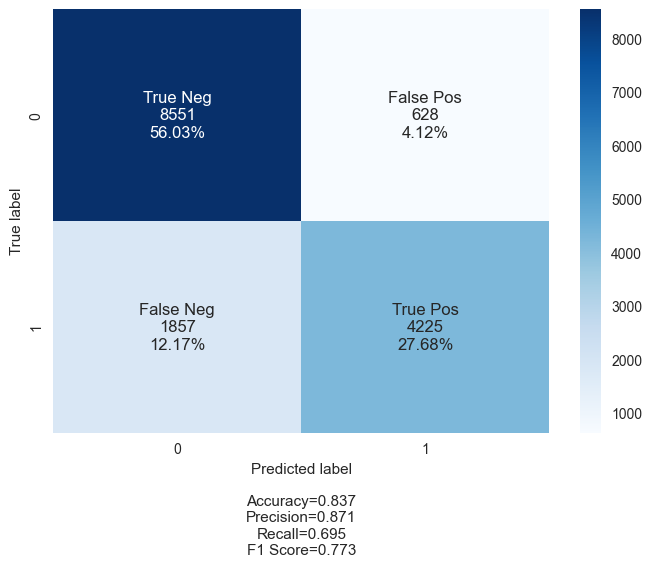

In [463]:
# Showing the confusion matrix
cf = metrics.confusion_matrix(y_test,y_test_pred)
labels = ['True Neg','False Pos','False Neg','True Pos']
categories = ['0', '1']
make_confusion_matrix(cf, 
                      group_names=labels,
                      categories=categories)
#plt.savefig('Confusion Matrix.svg', format="svg")

In [391]:
# Function to create dataframe with metrics
def performanceMetricsDF(metricsObj, yTrain, yPredTrain, yTest, yPredTest):
    measures_list = ['Accuracy','Precision', 'Recall','F1 Score','AUC']
    train_results = [metricsObj.accuracy_score(yTrain, yPredTrain),
                metricsObj.precision_score(yTrain, yPredTrain),
                metricsObj.recall_score(yTrain, yPredTrain),
                metricsObj.f1_score(yTrain, yPredTrain),
                metricsObj.roc_auc_score(yTrain, yPredTrain)
                ]
    test_results = [metricsObj.accuracy_score(yTest, yPredTest),
               metricsObj.precision_score(yTest, yPredTest),
               metricsObj.recall_score(yTest, yPredTest),
               metricsObj.f1_score(yTest, yPredTest),
               metricsObj.roc_auc_score(yTest, yPredTest)
               ]
    resultsDF = pd.DataFrame({'Measure': measures_list, 'Train': train_results, 'Test':test_results})
    return(resultsDF)

In [393]:
# Showing the performance metrics
resultsDF = performanceMetricsDF(metrics, y_train, y_train_pred, y_test, y_test_pred)
resultsDF

,Measure,Train,Test
0,Accuracy,0.838491,0.837167
1,Precision,0.871044,0.870596
2,Recall,0.698060,0.694673
3,F1 Score,0.775017,0.772748
4,AUC,0.814795,0.813128


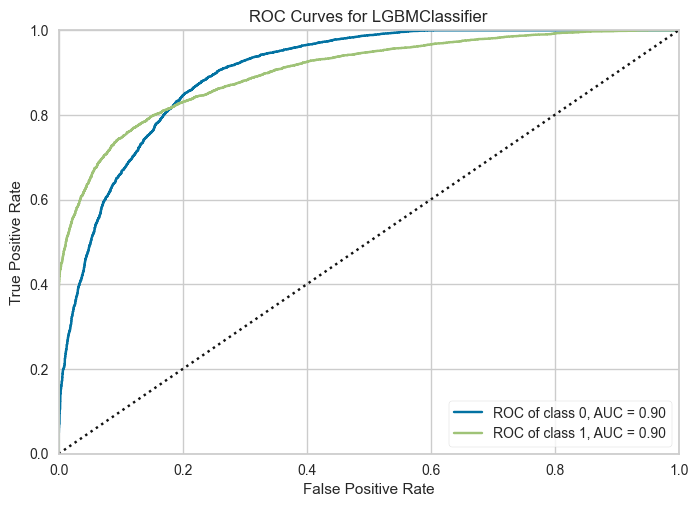

<AxesSubplot: title={'center': 'ROC Curves for LGBMClassifier'}, xlabel='False Positive Rate', ylabel='True Positive Rate'>

In [408]:
# ROC curve
visualizer = ROCAUC(lgbm, classes=['0','1'],micro=False,macro=False)
visualizer.fit(x_train_final, y_train)
visualizer.score(x_test_final, y_test)
visualizer.show(ax=False)

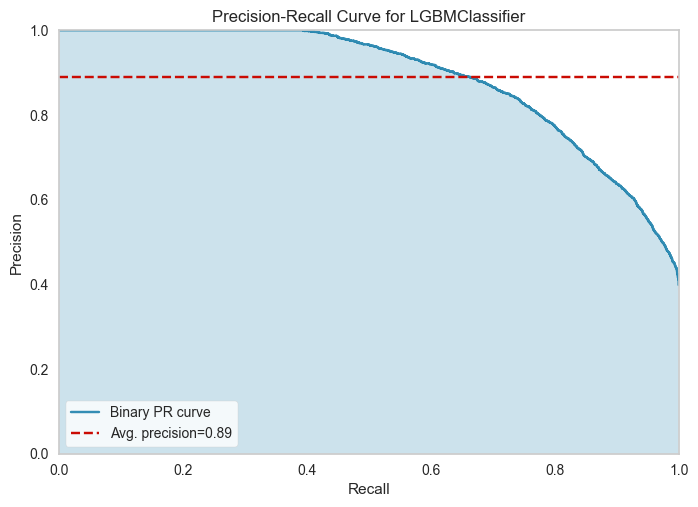

<AxesSubplot: title={'center': 'Precision-Recall Curve for LGBMClassifier'}, xlabel='Recall', ylabel='Precision'>

In [403]:
# Creating the visualizer, fit, score, and show it
viz = PrecisionRecallCurve(lgbm, classes=['0','1'])
viz.fit(x_train_final, y_train)
viz.score(x_test_final, y_test)
viz.show()

In [415]:
# Creating Shap
explainer = shap.TreeExplainer(lgbm)
shap_values = explainer.shap_values(x_train_final, y=y_train)

LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray


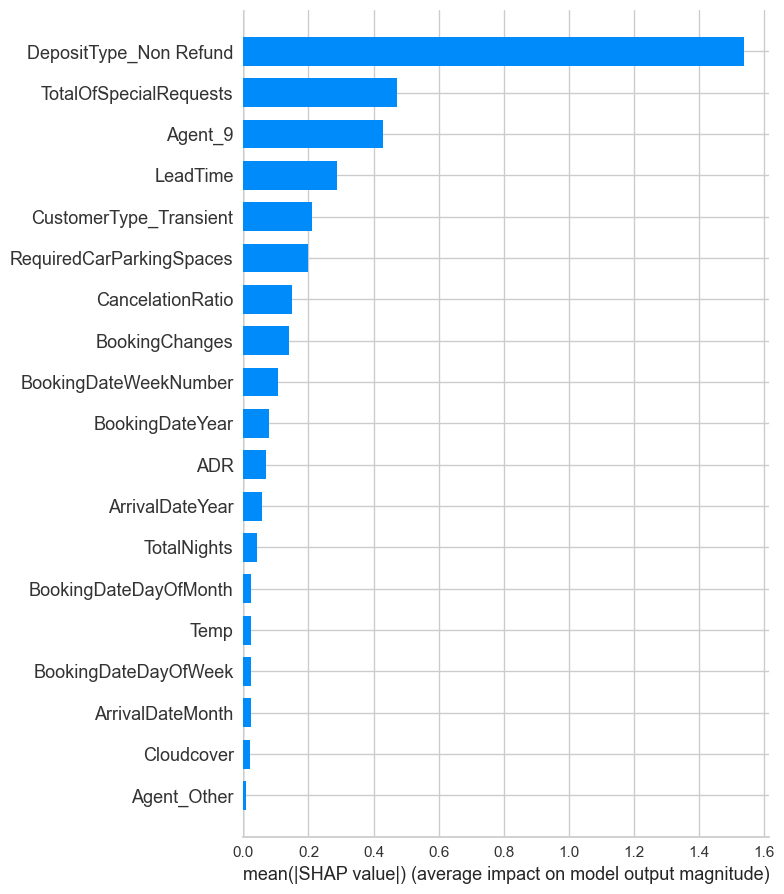

<Figure size 800x550 with 0 Axes>

In [474]:
# Mean importance
shap.summary_plot(shap_values[1], x_train_final, plot_type="bar")
plt.savefig('shap1.svg', format="svg")

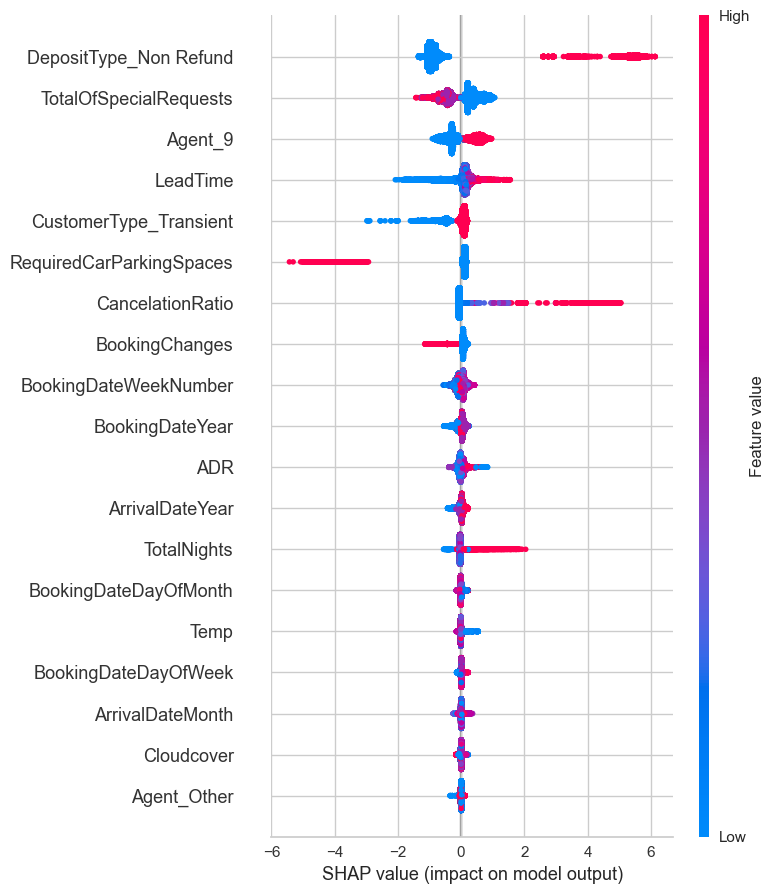

In [475]:
shap.summary_plot(shap_values[1], x_train_final)
#plt.savefig('shap2.svg', format="svg")

In [436]:
# Visualizing some of instances - let's see the first 500
# Interact with menu to explore the results
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][:500,:], x_train_final.iloc[:500,:])

In [435]:
# Visualizing one instance only (first customer - index 0)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0,:], x_train_final.iloc[0,:])

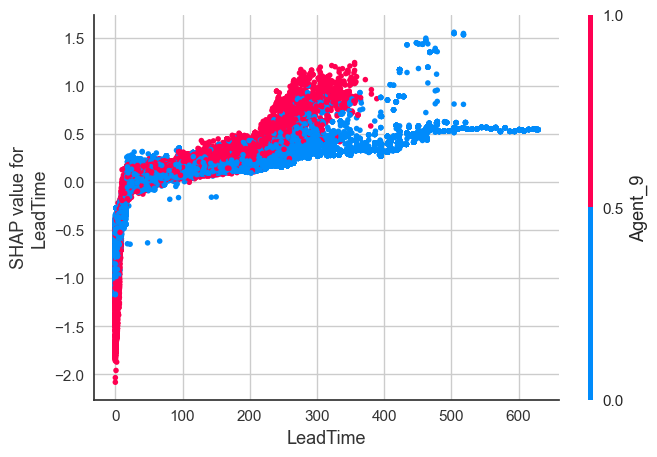

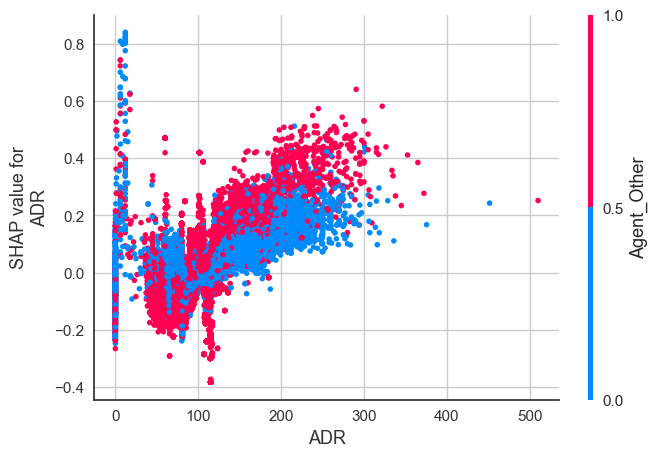

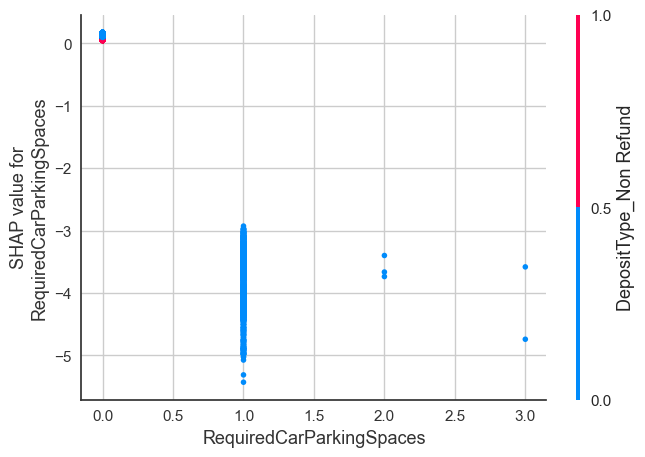

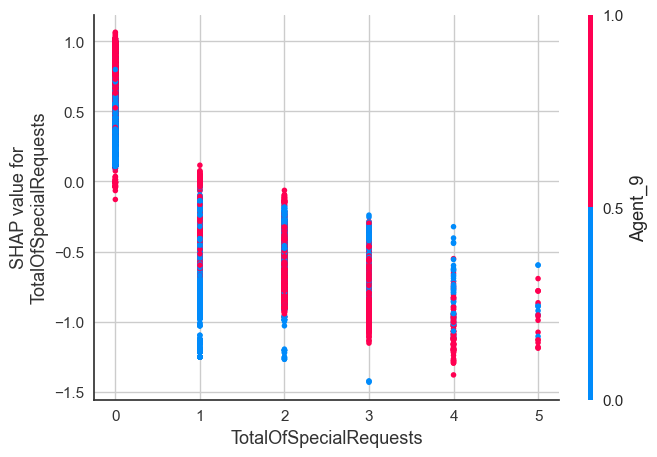

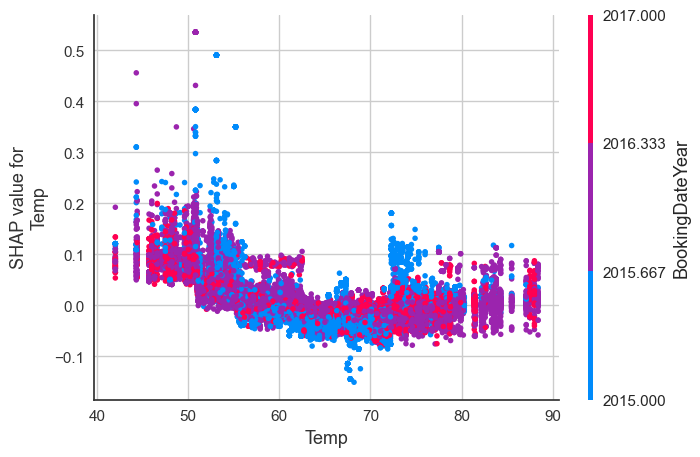

...

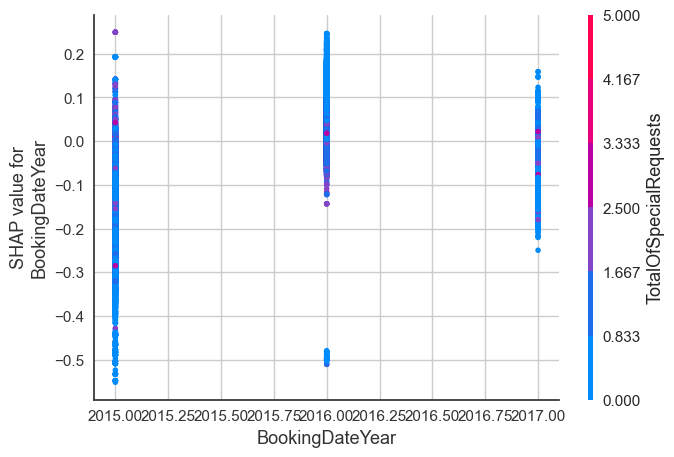

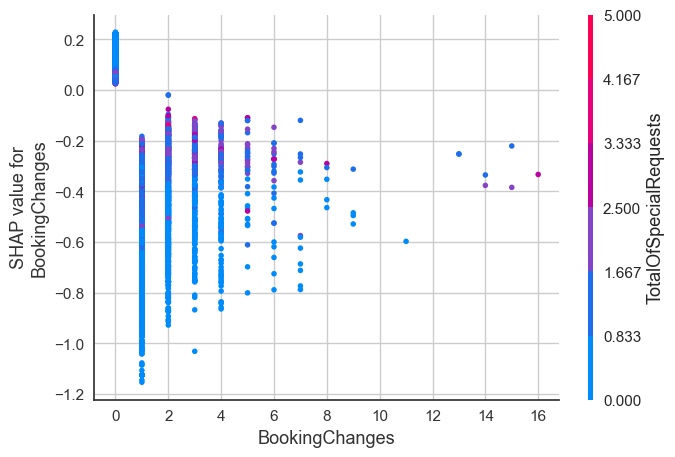

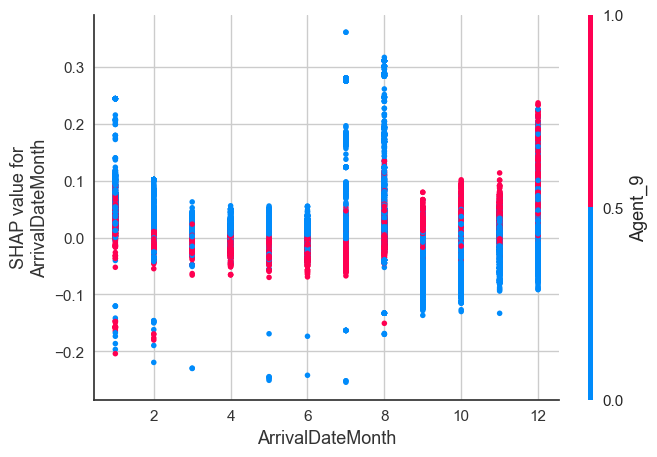

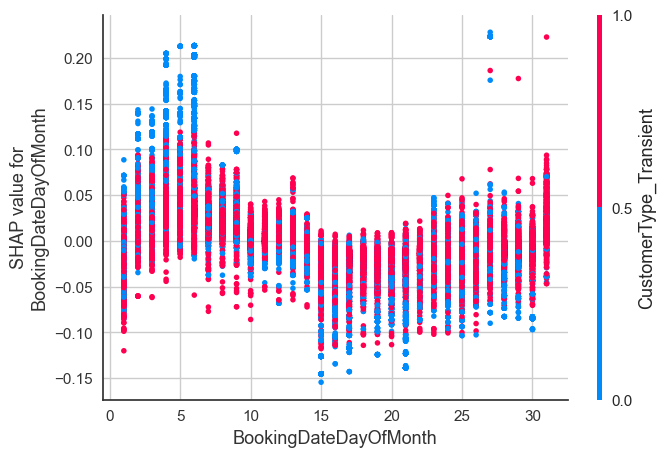

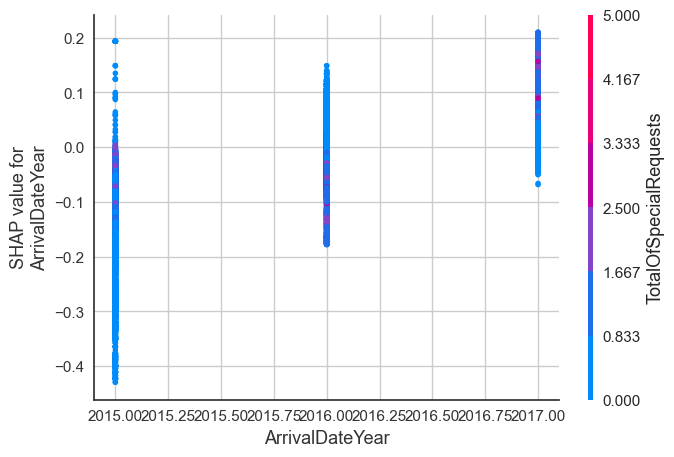

In [438]:
# Checking the dependence between the different features
for name in x_train_final.columns:
    shap.dependence_plot(name, shap_values[1], x_train_final, display_features=x_train_final)

Computing partial dependence plots...


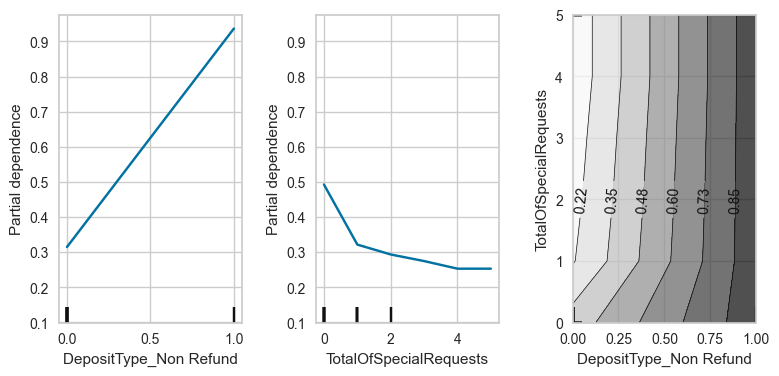

In [442]:
# Computing partial dependence plots
features = ["DepositType_Non Refund", "TotalOfSpecialRequests", ("DepositType_Non Refund", "TotalOfSpecialRequests")]
print("Computing partial dependence plots...")
fig, ax = plt.subplots(ncols=3, figsize=(9, 4))
display = PartialDependenceDisplay.from_estimator(
    lgbm,
    x_train_final,
    features,
    kind="average",
    n_jobs=2,
    grid_resolution=10,
    ax=ax,
)
display.figure_.subplots_adjust(wspace=0.4, hspace=0.3)

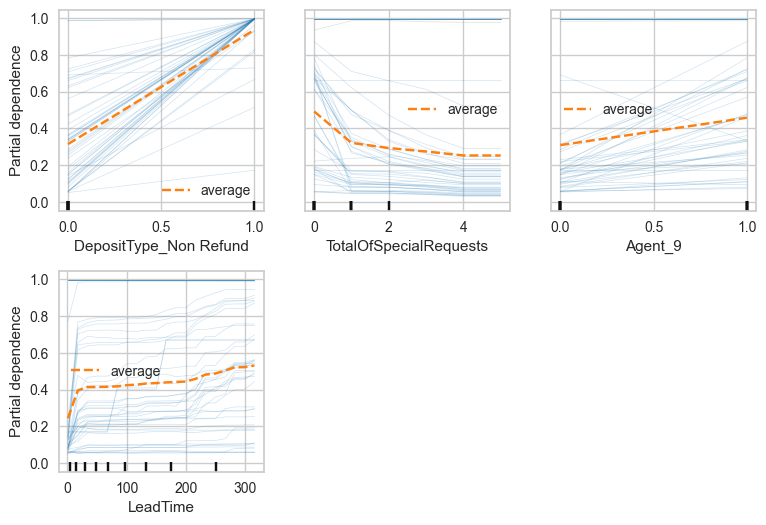

In [443]:
features = ["DepositType_Non Refund", "TotalOfSpecialRequests", "Agent_9",'LeadTime']
fig, ax = plt.subplots(figsize=(9, 6))
display = PartialDependenceDisplay.from_estimator(
    lgbm,
    x_train_final,
    features,
    kind="both",
    subsample=50,
    n_jobs=3,
    grid_resolution=20,
    random_state=0,
    ice_lines_kw={"color": "tab:blue", "alpha": 0.2, "linewidth": 0.5},
    pd_line_kw={"color": "tab:orange", "linestyle": "--"},
    ax=ax
)
display.figure_.subplots_adjust(hspace=0.3)